# Group name: hhhhd


| Name                         | 
|------------------------------|
| Xuda Chen                    | 
| Kang Zhu                     | 
| Nam Ken Yan Bouchara         | 
| Phakamin Tantiwatanavorakul  | 
| Allen Zhang                  | 


# Import necessary libraries

In [2]:
import numpy as np
import torch
import torch.nn as nn
from torch.utils.data import DataLoader, Dataset
import gensim
from gensim.models import KeyedVectors
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
from sklearn.metrics import classification_report, accuracy_score, precision_recall_fscore_support, f1_score, accuracy_score
from datasets import load_dataset
import contextlib
import io
import torch.nn.functional as F
from sklearn.preprocessing import StandardScaler
from sklearn.naive_bayes import GaussianNB
from sklearn.decomposition import PCA
from transformers import AutoTokenizer, AutoModel
from transformers import BertForSequenceClassification, BertConfig, AdamW
from sklearn.model_selection import train_test_split
from nltk.tokenize import RegexpTokenizer
from collections import Counter
import seaborn as sns
import re
import nltk
from nltk.corpus import stopwords
from sklearn.metrics import confusion_matrix

C:\Users\chenxvda\anaconda3\Lib\site-packages\paramiko\transport.py:219: CryptographyDeprecationWarning: Blowfish has been deprecated and will be removed in a future release
  "class": algorithms.Blowfish,


# Set the device to GPU if available

In [13]:
# Check if CUDA is available and get version info
print("CUDA Available: ", torch.cuda.is_available())
print("CUDA Version: ", torch.version.cuda)
print("PyTorch Version: ", torch.__version__)

# Set the device to GPU if available, otherwise use CPU
if torch.cuda.is_available():
    device = torch.device("cuda")
    print(f'There are {torch.cuda.device_count()} GPU(s) available.')
    print('Device name:', torch.cuda.get_device_name(0))

else:
    print('No GPU available, using the CPU instead.')
    device = torch.device("cpu")

CUDA Available:  True
CUDA Version:  12.1
PyTorch Version:  2.3.1
There are 1 GPU(s) available.
Device name: NVIDIA GeForce RTX 4050 Laptop GPU


# Table of contents
1. **Introduction, Motivation and Problem Statement**
2. **Data Sources**
3. **Exploratory Analysis of Data**
4. **Data preprocessing**
5. **Embedding method**
6. **Design different models**
7. **Results**
8. **Discussion and Conclusion**
9. **Remaining Problems and Future work**

# 1. Introduction, Motivation and Problem Statement

### 1.1 Introduction
This study focuses on emotion classification in tweets, a significant task in Natural Language Processing (NLP). The goal of our project is to perform text classification using advanced artificial intelligence algorithms to accurately label tweets with the emotions expressed by their authors, aiming to achieve increased performance on relevant metrics. Our research investigates and compares various approaches to this task. We evaluate the effectiveness of traditional machine learning methods, such as Logistic Regression and Naïve Bayes, against more advanced deep learning architectures. These include Long Short-Term Memory (LSTM) networks, Gated Recurrent Units (GRU), transformer-based models like BERT, and a more complex model (BERT+BILSTM). By implementing and assessing these diverse AI techniques, we aim to identify the most effective methods for correctly labeling the emotional content of tweets.

### 1.2 Motivation
The motivation for this project stems from a keen interest in exploring the capabilities and limitations of various machine learning and deep learning approaches in the context of emotion classification in tweets. Our research focuses on comparing traditional machine learning methods with advanced deep learning architectures. The primary motivations are:

1. Exploration of Traditional vs. Advanced Models: There is a strong interest in examining the performance of traditional machine learning methods, which, despite their simplicity and interpretability, may lack the capacity to capture complex emotional nuances in short text. This is contrasted with the potential of advanced deep learning models to understand context and subtle linguistic cues. The purpose of this comparison is to determine the impact of fundamentally different modeling approaches on the efficiency of emotion classification in tweets.


2. Understanding the principle of Artificial intelligence: Concept of using artificial intelligence to classify emotions are common area that many engineer want to study and create a model that can capture that essences. By conducting this project is the understand why the AIs are capable of doing this abstract yet complex task. (unsure please help add more)


### 1.3 Problem Statement
Our project involves different problems, each representing a key stage in our research into emotional prediction models:

1. **Which dataset to choose?**: This project is based on the EMOTION dataset, but there are two sub-datasets of this dataset, which are "split dataset(20_000 samples)" and "unsplit dataset(416_809 samples)" 

2. **How to preprecessing the dataset?**: Analyse the features of the dataset and do some corresponding preprecessing (such as considering which words to stop).

3. **Which embeddind method to choose?**: We can not compare some different models use different embedding methods, so we need to choose one optimal embeddind method for most of our models

4. **Choose different models and the optimal parameters for each models**: We need to choose some maching learning, deep learning and transformer models, and choose the optimal parameters for each models.

5. **How to compare the results of different models?**: Which metric should we compare, which graphs or other visualizations to use, what additional test should we take?

6. **What conclusions can we draw from comparing the results of different models?**
7. **Consider what the remaining issues are and what to do next**


# 2. Data Sources

### 2.1 Dataset Details
1. **Name**: EMOTION
2. **Source**: [Hugging Face Datasets](https://huggingface.co/datasets/dair-ai/emotion)
3. **Associated Paper**: ["CARER: Contextualized Affect Representations for Emotion Recognition"](https://aclanthology.org/D18-1404/)

### 2.2 Dataset Summary
Emotion is a dataset of English Twitter messages with six basic emotions: anger, fear, joy, love, sadness, and surprise. For more detailed information please refer to the paper.

### 2.3 Data Instances
An example looks as follows.

{
  "text": "im feeling quite sad and sorry for myself but ill snap out of it soon",
  "label": 0
}

### 2.4 Data Fields
The data fields are:

**text**: a string feature.


**label**: a classification label, with possible values including sadness (0), joy (1), love (2), anger (3), fear (4), surprise (5).

### 2.5 Data Splits
The dataset has 2 configurations:

**split**: with a total of 20_000 examples split into train, validation and split.


**unsplit**: with a total of 416_809 examples in a single train split.

### 2.6 Citation Information
@inproceedings{saravia-etal-2018-carer,
    title = "{CARER}: Contextualized Affect Representations for Emotion Recognition",
    author = "Saravia, Elvis  and
      Liu, Hsien-Chi Toby  and
      Huang, Yen-Hao  and
      Wu, Junlin  and
      Chen, Yi-Shin",
    booktitle = "Proceedings of the 2018 Conference on Empirical Methods in Natural Language Processing",
    month = oct # "-" # nov,
    year = "2018",
    address = "Brussels, Belgium",
    publisher = "Association for Computational Linguistics",
    url = "https://www.aclweb.org/anthology/D18-1404",
    doi = "10.18653/v1/D18-1404",
    pages = "3687--3697",
    abstract = "Emotions are expressed in nuanced ways, which varies by collective or individual experiences, knowledge, and beliefs. Therefore, to understand emotion, as conveyed through text, a robust mechanism capable of capturing and modeling different linguistic nuances and phenomena is needed. We propose a semi-supervised, graph-based algorithm to produce rich structural descriptors which serve as the building blocks for constructing contextualized affect representations from text. The pattern-based representations are further enriched with word embeddings and evaluated through several emotion recognition tasks. Our experimental results demonstrate that the proposed method outperforms state-of-the-art techniques on emotion recognition tasks.",
}

# 3. Exploratory Analysis of Data

### 3.1 Load and Split the "unsplit dataset"
We choose the "unsplit dataset" because it has much more samples, which allows for more robust training and evaluation. With a larger number of samples, the model can better capture the underlying patterns in the data and generalize more effectively to unseen data. This can lead to improved performance and more reliable results.

In [3]:
# Load the dataset
ds = load_dataset("dair-ai/emotion", "unsplit") # this is for unsplit dataset 416809 data

# Convert the datasets to pandas DataFrames
ds_pd = ds['train'].to_pandas()

# Display basic information about the dataset
print(ds)
print(ds_pd)

# Split the dataset into 80% train, 10% validation and 10% test dataset
train_ds, _ds = train_test_split(ds_pd, test_size=0.2, random_state=42)
validation_ds, test_ds = train_test_split(_ds, test_size=0.5, random_state=42)

# Load the training, validation, and test data into DataFrames
train_df = pd.DataFrame(train_ds)
validation_df = pd.DataFrame(validation_ds)
test_df = pd.DataFrame(test_ds)

DatasetDict({
    train: Dataset({
        features: ['text', 'label'],
        num_rows: 416809
    })
})
                                                     text  label
0       i feel awful about it too because it s my job ...      0
1                                   im alone i feel awful      0
2       ive probably mentioned this before but i reall...      1
3                i was feeling a little low few days back      0
4       i beleive that i am much more sensitive to oth...      2
...                                                   ...    ...
416804  that was what i felt when i was finally accept...      1
416805  i take every day as it comes i m just focussin...      4
416806      i just suddenly feel that everything was fake      0
416807  im feeling more eager than ever to claw back w...      1
416808  i give you plenty of attention even when i fee...      0

[416809 rows x 2 columns]


### 3.2 distribution of emotion labels
There are six labels in the dataset ({0:'sadness', 1:'joy', 2:'love', 3:'anger', 4:'fear', 5:'surprise'}), and we can see that the distribution of emotion labels is extremely uneven.

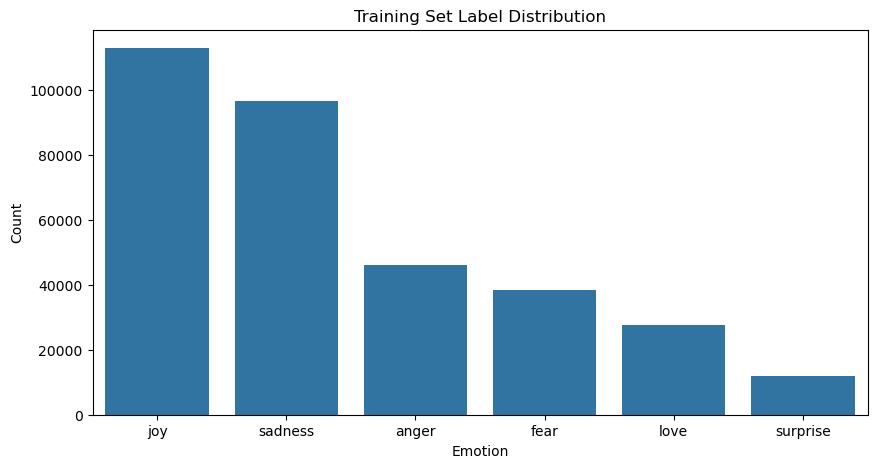

In [7]:
# Visualize the distribution of emotion labels

# Get the label names
label_names = ds['train'].features['label'].names

# Map numeric labels to actual emotion labels
train_df_forplot = train_df.copy()  # Create a deep copy
train_df_forplot['label'] = train_df['label'].apply(lambda x: label_names[x])

# Plot the distribution of emotion labels in the training set
plt.figure(figsize=(10, 5))
sns.countplot(data=train_df_forplot, x='label', order=train_df_forplot['label'].value_counts().index)
plt.title('Training Set Label Distribution')
plt.xlabel('Emotion')
plt.ylabel('Count')
plt.show()

train_df_dic = {}
for index, row in train_df_forplot.iterrows():
    label = row['label']
    text = row['text']

    if label in train_df_dic:
        train_df_dic[label].append(text)
    else:
        train_df_dic[label] = [text]

### 3.3 The words' frequency of each label  
We can see that the most frequent word is ‘i’, followed by ‘feel’ 

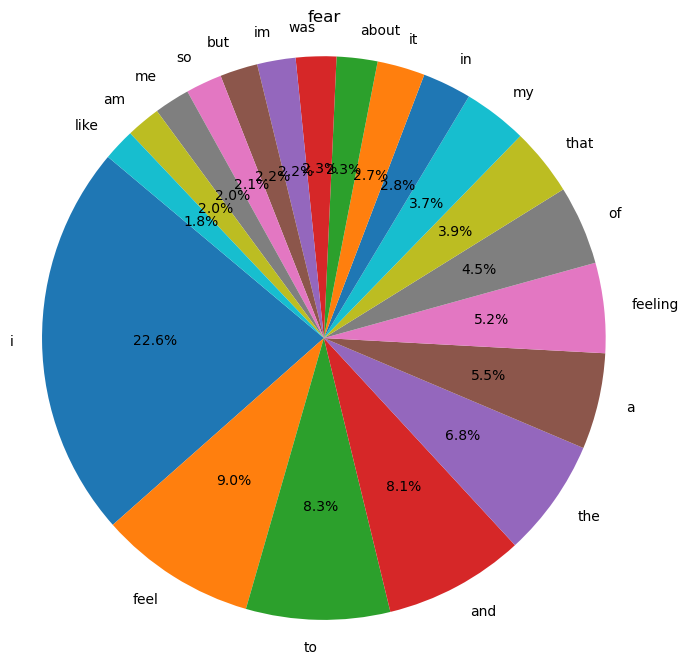

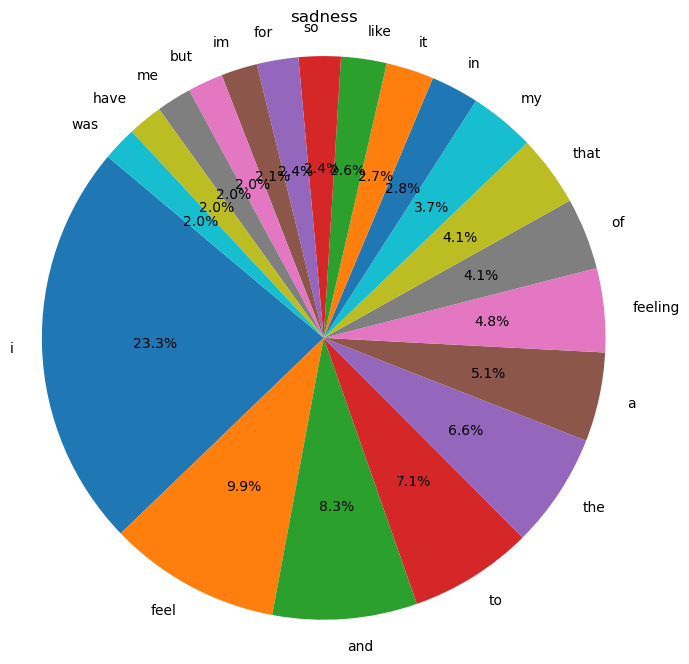

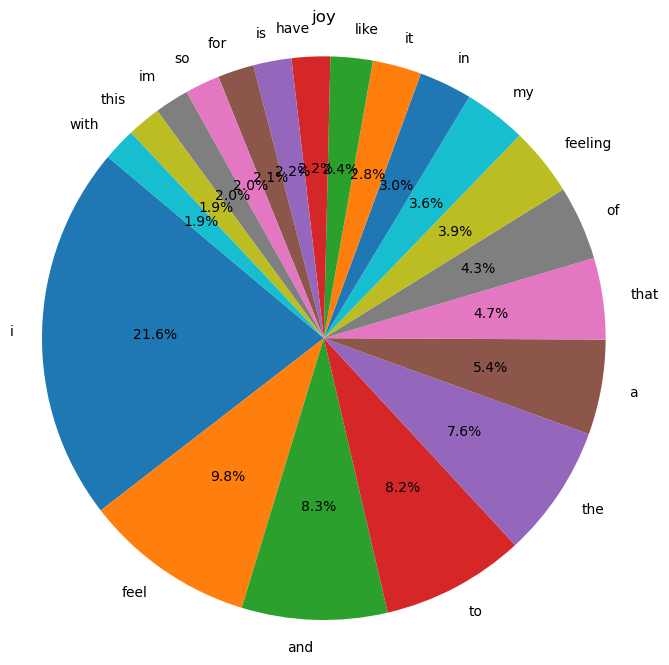

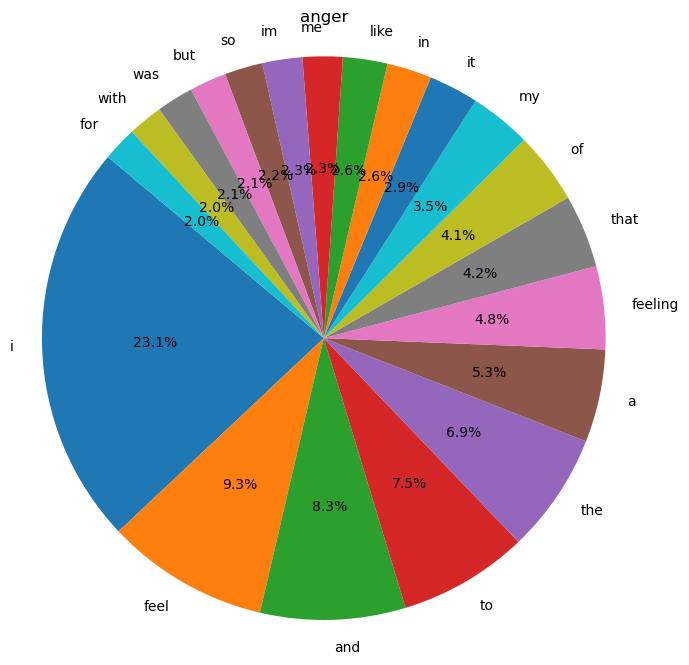

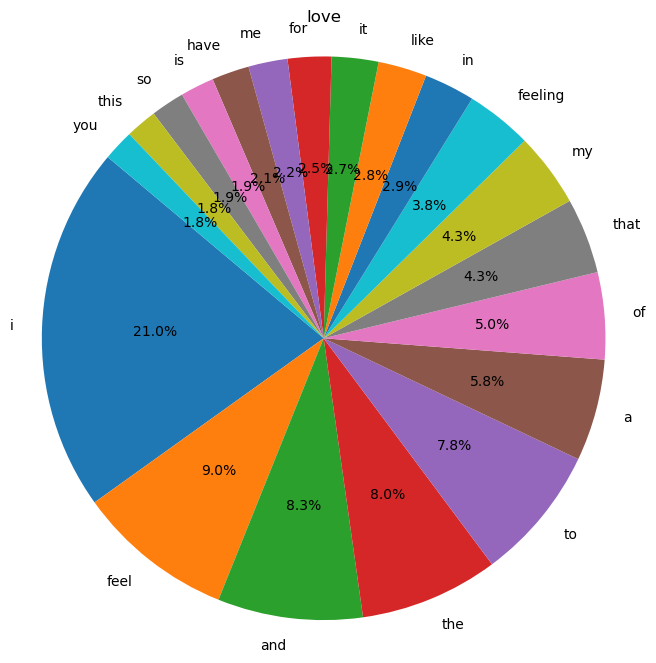

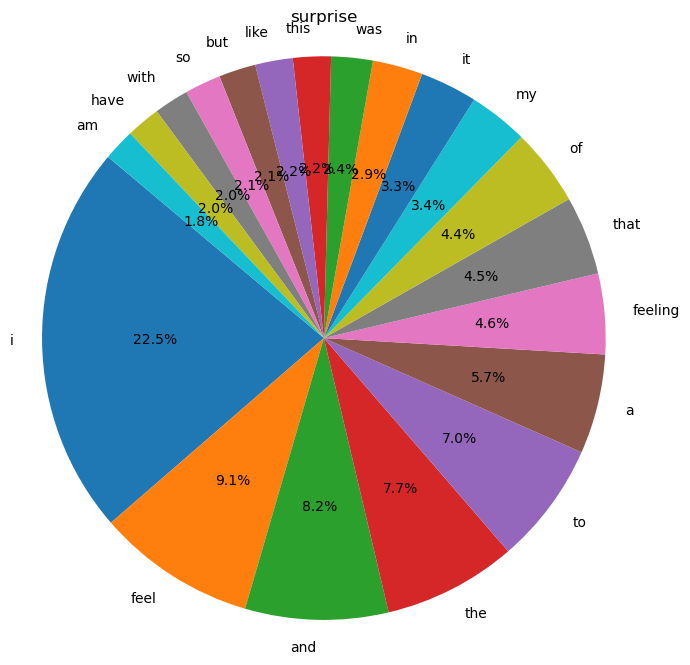

In [19]:
# Use a regular expression tokenizer
tokenizer = RegexpTokenizer(r'\w+')

def preprocess_text(text):
    text = text.lower()
    words = tokenizer.tokenize(text)
    return words

def get_top_words(df, label_column, text_column, top_n=20):
    label_word_freq = {}
    for label in df[label_column].unique():
        label_texts = df[df[label_column] == label][text_column]
        all_words = []
        for text in label_texts:
            words = preprocess_text(text)
            all_words.extend(words)
        word_freq = Counter(all_words)
        top_words = word_freq.most_common(top_n)
        label_word_freq[label] = top_words
    return label_word_freq

def plot_top_words(label_word_freq):
    for label, top_words in label_word_freq.items():
        words, freqs = zip(*top_words)
        plt.figure(figsize=(8, 8))
        plt.pie(freqs, labels=words, autopct='%1.1f%%', startangle=140)
        plt.title(f'{index_to_label[label]}')
        plt.axis('equal')
        plt.show()
        
index_to_label = {0:'sadness', 1:'joy', 2:'love', 3:'anger', 4:'fear', 5:'surprise'}

# Calculate the words with the highest frequency of each sentiment label in the training set
top_words_per_label = get_top_words(train_df, 'label', 'text')

plot_top_words(top_words_per_label)

### 3.3 The text length distribution by label  
We can see that most sentences are around 25 words long, with the longest sentence not exceeding 75 words.

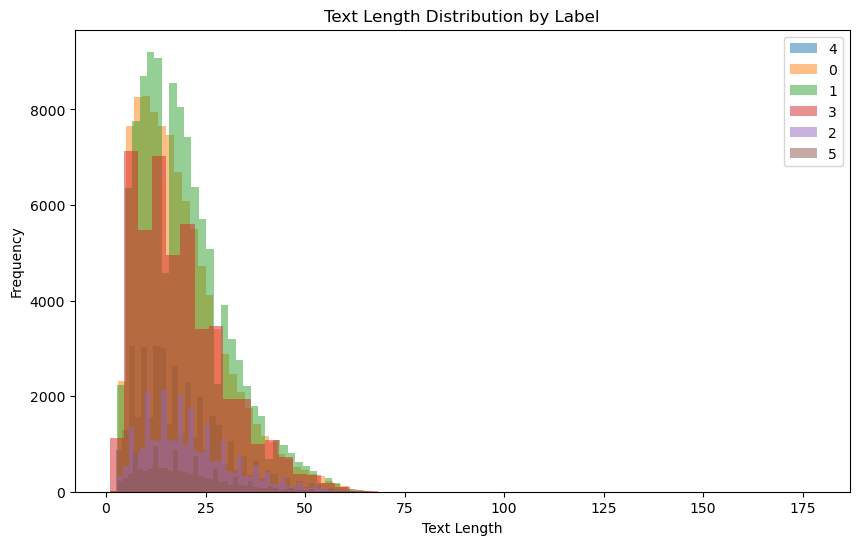

In [20]:
# Get unique labels
unique_labels = train_df['label'].unique()

plt.figure(figsize=(10, 6))

# For each unique label
for label in unique_labels:
    # Filter dataframe by label
    label_df = train_df[train_df['label'] == label]
    
    # Calculate text lengths
    text_lengths = [len(text.split()) for text in label_df['text']]
    
    # Plot histogram of text lengths
    plt.hist(text_lengths, bins=50, alpha=0.5, label=str(label))

plt.title('Text Length Distribution by Label')
plt.xlabel('Text Length')
plt.ylabel('Frequency')
plt.legend(loc='upper right')
plt.show()

### 3.4 Check for the missing values in the dataset
There is no missing values in the dataset

In [21]:
# Check for missing values in the dataset
print(train_df.isnull().sum())
print(validation_df.isnull().sum())
print(test_df.isnull().sum())

text     0
label    0
dtype: int64
text     0
label    0
dtype: int64
text     0
label    0
dtype: int64


### 3.5 some other features of the dataset   
1. Almost every sentence have the “feel” word (“feel” appears in 99% sentences of the dataset)

In [4]:
def count_keyword_occurrences(train_df, keyword):
    contains_keyword = train_df['text'].str.contains(keyword, regex=True)
    num_keyword_sentences = contains_keyword.sum()
    return num_keyword_sentences

keywords = ['feel']
for keyword in keywords:
    count = count_keyword_occurrences(train_df, keyword)
    print(f"'{keyword}' appears in {count} out of {len(train_df['text'])} sentences.")

'feel' appears in 329283 out of 333447 sentences.


2. It seems like the sentences with no obvious emotions will be labeled as ‘love’.
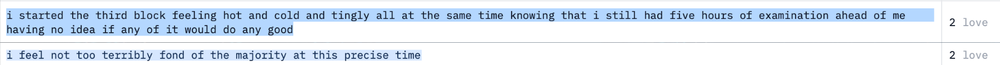

3. However some sentences with a negative tone are incorrectly labeled.
   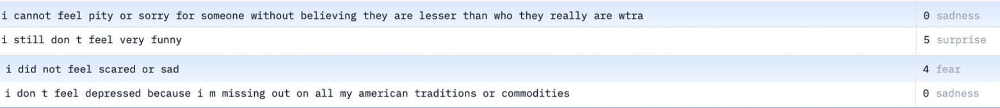

# 4. Data preprocessing

### 4.1 Data Cleaning
1. Convert to lowercase; Remove punctuation; Remove extra spaces; Stop some words;
   
2. which words to stop?

   Stop some words with very high frequency but may not help to predict the emotion.(Subject, article, conjunction, 'i','im', 'ill', 'ive', etc)
   
3. Whether to remove 'feel', the secondary most frequent word after clean_text?
   
   No, the word ’feel’ contributes to predicting the emotion

In [8]:
# Data Cleaning

# Download stopwords
nltk.download('stopwords')
# Load stop word list
stop_words = set(stopwords.words('english'))

# Add some words to the stop words list
custom_stop_words = {'im', 'ill', 'ive', 't'}

stop_words.update(custom_stop_words)

# Remove some words from the stop words list.
words_to_keep = {'not', 'didn', 'don'} 
stop_words.difference_update(words_to_keep)

# Text cleaning and normalization function
def clean_text(text):
    # more can be added as needed

    print("Before cleaning:", text) # Print text before cleaning

    text = text.lower() # Convert to lowercase
    text = re.sub(r'[^a-zA-Z\s]', '', text)  # Remove punctuation
    text = text.strip() # Remove extra spaces

    # Remove stop words
    words = text.split()
    cleaned_words = [word for word in words if word not in stop_words]
    cleaned_text = ' '.join(cleaned_words)

    print("After cleaning:", cleaned_text) # Print text after cleaning
    print('\n')

    return cleaned_text  # Return the cleaned text with stopwords removed

# Apply text cleaning to the DataFrames
train_df['text'] = train_df['text'].apply(clean_text)
validation_df['text'] = validation_df['text'].apply(clean_text)
test_df['text'] = test_df['text'].apply(clean_text)

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\chenxvda\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



 loved feel disgusted years decorated life things love storm came washed away everything knew familiar back ground zero


Before cleaning: i really started feeling unwelcome and unwanted
After cleaning: really started feeling unwelcome unwanted


Before cleaning: im surprised i feel this mellow especially considering time of the month
After cleaning: surprised feel mellow especially considering time month


Before cleaning: i spoke up about feeling intimidated and it opened the door between the experienced singers and the newbies to work together
After cleaning: spoke feeling intimidated opened door experienced singers newbies work together


Before cleaning: i also feel hesitant about taking this advice from people running a program that does not include any feldenkrais at all i can t help feeling like they perhaps don t really know what i m talking about
After cleaning: also feel hesitant taking advice people running program not include feldenkrais help feeling like perhaps don reall

IOPub data rate exceeded.
The Jupyter server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--ServerApp.iopub_data_rate_limit`.

Current values:
ServerApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
ServerApp.rate_limit_window=3.0 (secs)



After cleaning: must thank support little blog love feel wonderful comments


Before cleaning: i tend to feel particularly needy and that s when i think being lonely is pretty shit
After cleaning: tend feel particularly needy think lonely pretty shit


Before cleaning: i hope youre feeling inspired and creative
After cleaning: hope youre feeling inspired creative


Before cleaning: ive found some truly wonderful people for which i feel so incredibly blessed to have met
After cleaning: found truly wonderful people feel incredibly blessed met


Before cleaning: i am actually feeling quite creative
After cleaning: actually feeling quite creative


Before cleaning: i knew i would read the second book but i also knew i had to be in the mood for something that challenged me and made me feel something more than casual enjoyment
After cleaning: knew would read second book also knew mood something challenged made feel something casual enjoyment


Before cleaning: i feel like my next entry will 

4. The words' frequency of each label after data cleaning
   
   The most frequent word now is ‘feel’. 

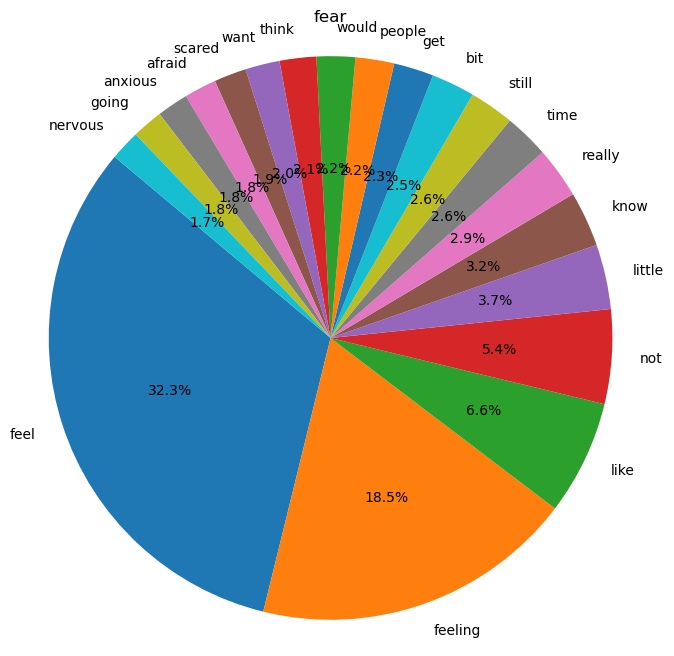

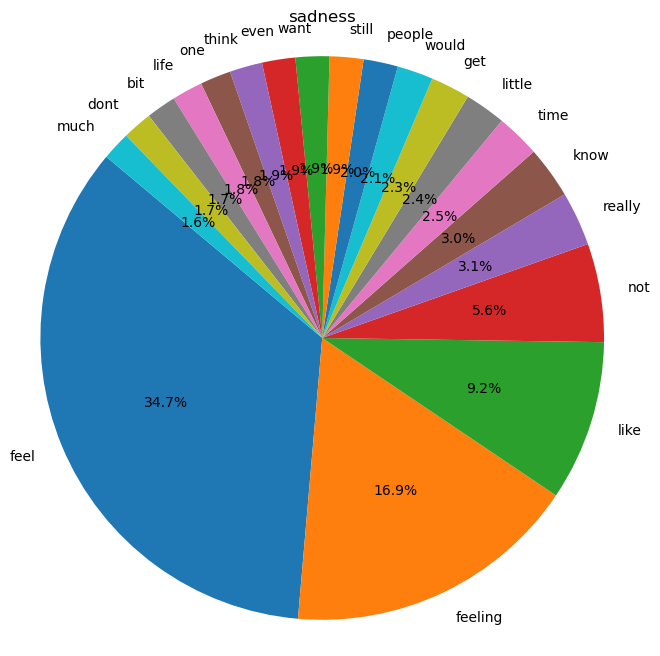

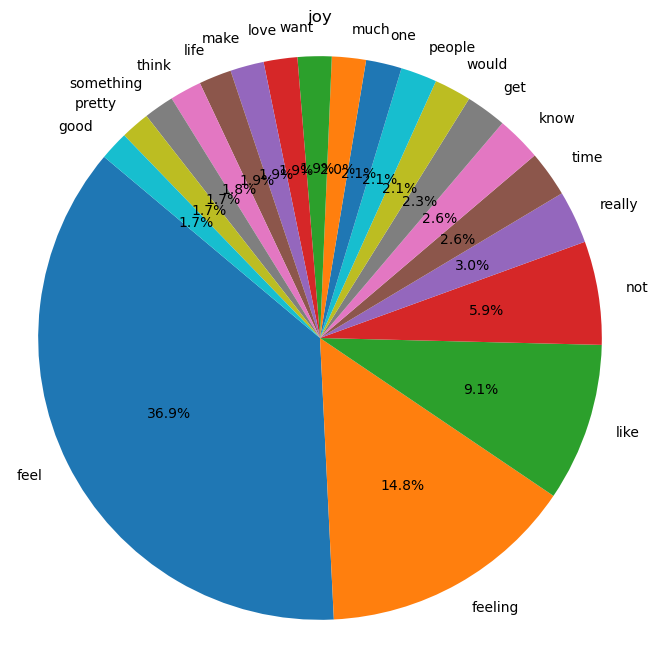

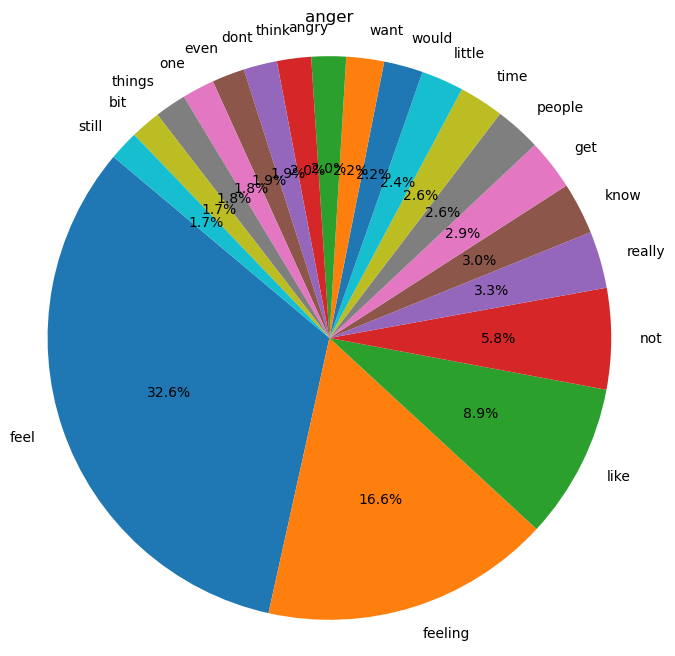

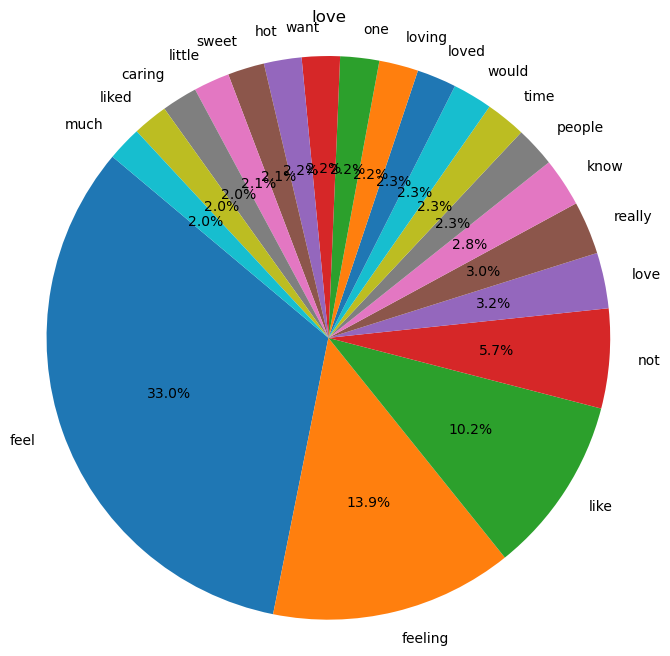

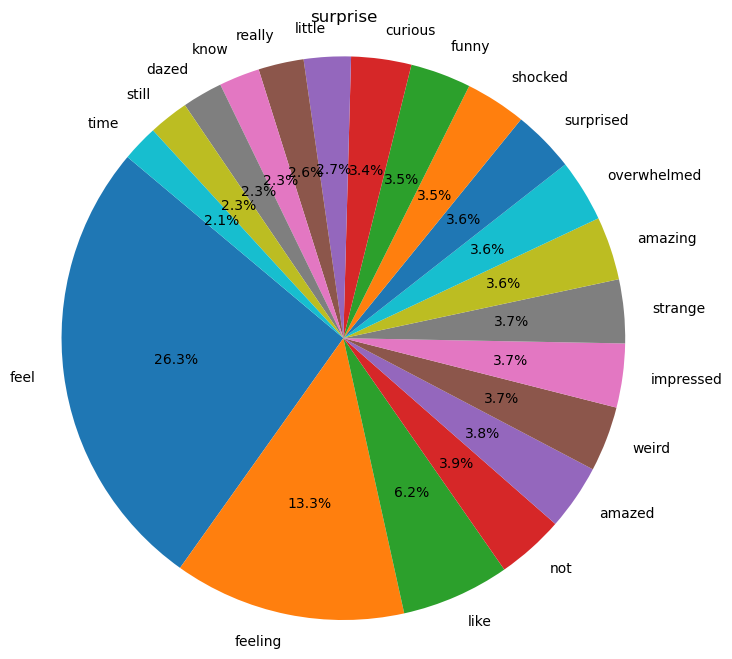

In [24]:
# Calculate the words with the highest frequency of each sentiment label in the training set after data cleaning
top_words_per_label = get_top_words(train_df, 'label', 'text')

plot_top_words(top_words_per_label)

5. The text length distribution by label after data cleaning
   
   After data cleaning, the longest sentence does not exceeding 35 words.

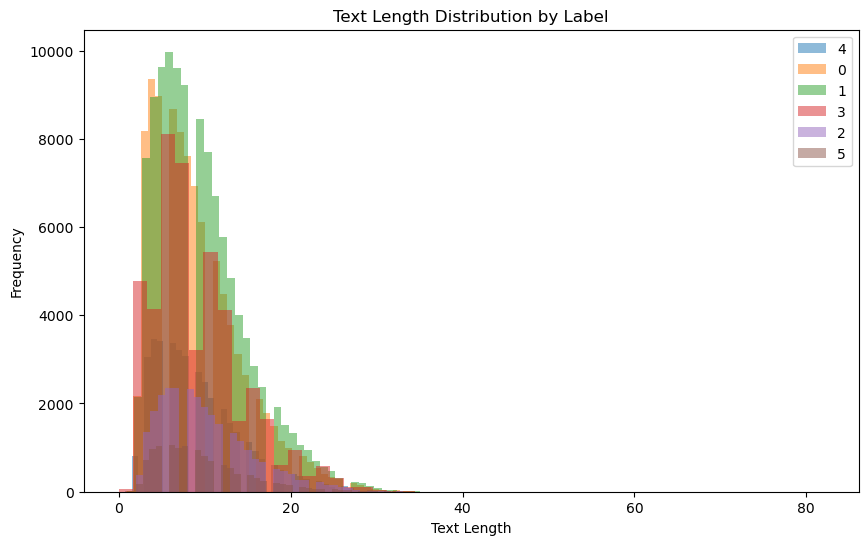

In [25]:
# Get unique labels
unique_labels = train_df['label'].unique()

plt.figure(figsize=(10, 6))

# For each unique label
for label in unique_labels:
    # Filter dataframe by label
    label_df = train_df[train_df['label'] == label]
    
    # Calculate text lengths
    text_lengths = [len(text.split()) for text in label_df['text']]
    
    # Plot histogram of text lengths
    plt.hist(text_lengths, bins=50, alpha=0.5, label=str(label))

plt.title('Text Length Distribution by Label')
plt.xlabel('Text Length')
plt.ylabel('Frequency')
plt.legend(loc='upper right')
plt.show()


### 4.2 undersamper method
1. Use an undersamper method to make the number of train samples of each emotion labels consistent, so that to prevent the model from being biased towards the majority class
   
2. It will result in a large reduction in the number of samples, that's why we chose to use the "unsplit dataset"(with much more samples)


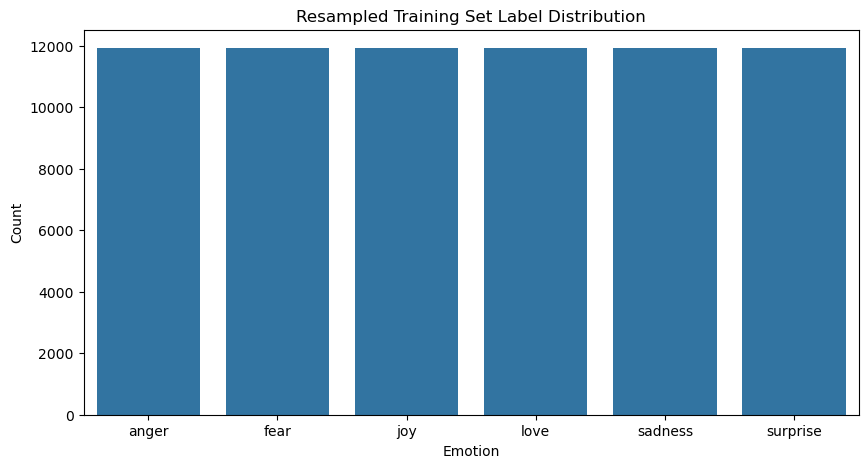

In [9]:
# This is an undersamper method to make the number of train samples consistent, but it will result in a large reduction in the number of samples

from imblearn.under_sampling import RandomUnderSampler

# Initialize the undersampler
rus = RandomUnderSampler(random_state=42)

# Convert the data into a format suitable for RandomUnderSampler
X = []
y = []
for label, texts in train_df_dic.items():
    if len(texts) == 0:  # Skip empty categories
        continue
    for text in texts:
        X.append(text)
        y.append(label)

X = np.array(X).reshape(-1, 1)
y = np.array(y)

# Perform undersampling on the data
X_resampled, y_resampled = rus.fit_resample(X, y)

# Update the dictionary
resampled_dic = {}
for i in range(len(X_resampled)):
    label = y_resampled[i]
    text = X_resampled[i][0]

    if label in resampled_dic:
        resampled_dic[label].append(text)
    else:
        resampled_dic[label] = [text]

# Convert resampled_dic to a DataFrame
resampled_df = pd.DataFrame([(k, v) for k, vs in resampled_dic.items() for v in vs], columns=['label', 'text'])

# Plot the distribution of emotion labels in the resampled data
plt.figure(figsize=(10, 5))
sns.countplot(data=resampled_df, x='label', order=resampled_df['label'].value_counts().index)
plt.title('Resampled Training Set Label Distribution')
plt.xlabel('Emotion')
plt.ylabel('Count')
plt.show()

# Create a mapping from label to index
# label_to_index = {label: idx for idx, label in enumerate(train_df_forplot['label'].unique())} wrong
label_to_index = {'sadness':0, 'joy':1, 'love':2, 'anger':3, 'fear':4, 'surprise':5}

# Convert 'label' column to int
resampled_df['label'] = resampled_df['label'].map(label_to_index).astype(int)

# Update train_df
train_df = resampled_df

# Convert all labels to int64
train_df['label'] = train_df['label'].astype(np.int64)
validation_df['label'] = validation_df['label'].astype(np.int64)
test_df['label'] = test_df['label'].astype(np.int64) 

3. Use an undersamper method to make the number of test samples of each emotion labels consistent too.

In [10]:
# Use undersamper method to make the number of test samples consistent

test_df['label'] = test_df['label'].apply(lambda x: label_names[x])

test_df_dic = {}
for index, row in test_df.iterrows():
    label = row['label']
    text = row['text']

    if label in test_df_dic:
        test_df_dic[label].append(text)
    else:
        test_df_dic[label] = [text]

print('Number of each labels in test dataset:')
for key, value in test_df_dic.items():
    print(key, len(value))

# Convert the data into a format suitable for RandomUnderSampler
X = []
y = []
for label, texts in test_df_dic.items():
    if len(texts) == 0:  # Skip empty categories
        continue
    for text in texts:
        X.append(text)
        y.append(label)

X = np.array(X).reshape(-1, 1)
y = np.array(y)

# Perform undersampling on the data
X_resampled, y_resampled = rus.fit_resample(X, y)

# Update the dictionary
resampled_dic = {}
for i in range(len(X_resampled)):
    label = y_resampled[i]
    text = X_resampled[i][0]

    if label in resampled_dic:
        resampled_dic[label].append(text)
    else:
        resampled_dic[label] = [text]

# Print the updated dictionary
print('Number of each labels in test dataset after undersamper:')
for key, value in resampled_dic.items():
    print(key, len(value))

# Convert resampled_dic to a DataFrame
resampled_df = pd.DataFrame([(k, v) for k, vs in resampled_dic.items() for v in vs], columns=['label', 'text'])

label_to_index = {'sadness':0, 'joy':1, 'love':2, 'anger':3, 'fear':4, 'surprise':5}

# Convert 'label' column to int
resampled_df['label'] = resampled_df['label'].map(label_to_index).astype(int)

# Randomly shuffle the DataFrame
resampled_df = resampled_df.sample(frac=1, random_state=42)

# Update test_df
test_df = resampled_df

# Convert test_df labels to int64
test_df['label'] = test_df['label'].astype(np.int64)

Number of each labels in test dataset:
joy 14263
sadness 12197
anger 5681
love 3413
fear 4601
surprise 1526
Number of each labels in test dataset after undersamper:
anger 1526
fear 1526
joy 1526
love 1526
sadness 1526
surprise 1526


# 5. Embedding method

### 5.1 Which embedding method to choose and the reason 
We chose Word2Vec as the embedding method for most of our models, except the BERT and BERT-BILSTM model. Because:
1. Word2Vec is good at capturing local contextual relationships, especially in short-term dependencies,  allowing the model to understand context better.
2. Word2Vec(with f1-score of 55%) perform better than Glove(with f1-score of 30%) in logistic regression
3. word2vec(with f1-score of 47%) perform better than Glove(with f1-score of 24%) in naive bayes 

### 5.2 Introduction to Word2Vec
 Word2Vec utilizes shallow neural networks to learn word embeddings from large text corpora. 
 
It operates based on two main models: Continuous Bag of Words (CBOW), which predicts a target word based on its surrounding context, and Skip-Gram, which predicts context words given a target word. 

The resulting word vectors capture semantic relationships and similarities, allowing similar words to be closer in the vector space.

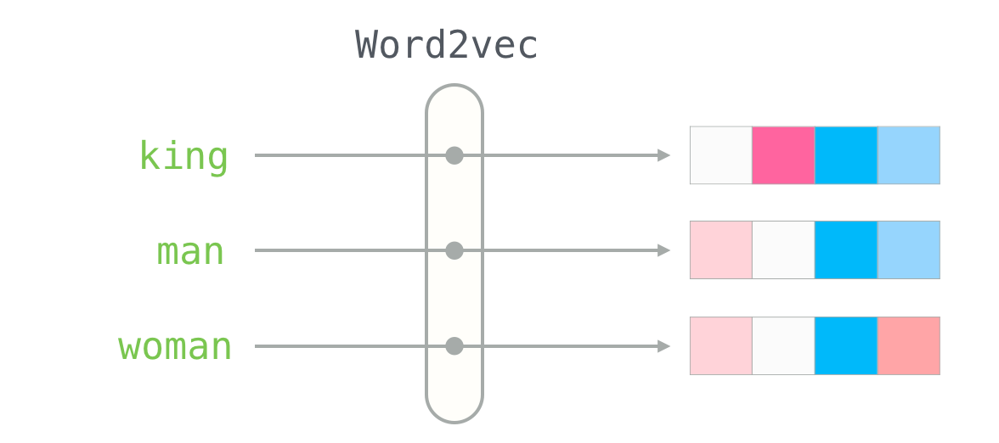

Picture from: https://jalammar.github.io/illustrated-word2vec/

### 5.3 Load Word2Vec and visualize some features of it
1. Load the Word2Vec embeddings and set embeddings dimension 300

In [33]:
# Load the Word2Vec embeddings
word2vec_path = 'GoogleNews-vectors-negative300.bin'
word2vec = KeyedVectors.load_word2vec_format(word2vec_path, binary=True)
embedding_dim = 300  # Word2Vec embeddings are 300-dimensional

2. Use Word2Vec method to find 10 most similar words to a specific word

In [34]:
# Check if Word2Vec embeddings work
def find_most_similar(word, topn=10):
    if word in word2vec:
        print(f"Top {topn} words similar to '{word}':")
        for similar_word, similarity in word2vec.most_similar(word, topn=topn):
            print(f"{similar_word}: {similarity}")
    else:
        print(f"'{word}' not in vocabulary!")

find_most_similar('happy', topn=10)

Top 10 words similar to 'happy':
glad: 0.7408890724182129
pleased: 0.6632170677185059
ecstatic: 0.6626912355422974
overjoyed: 0.6599286794662476
thrilled: 0.6514049172401428
satisfied: 0.6437949538230896
proud: 0.636042058467865
delighted: 0.6272379159927368
disappointed: 0.6269949674606323
excited: 0.6247665882110596


3. View the word vector for a specific word

In [35]:
word = "happy"

if word in word2vec:
    vector = word2vec[word]
    print(f"Vector for '{word}':\n{vector}")
else:
    print(f"'{word}' not in vocabulary!")

Vector for 'happy':
[-5.18798828e-04  1.60156250e-01  1.60980225e-03  2.53906250e-02
  9.91210938e-02 -8.59375000e-02  3.24218750e-01 -2.17285156e-02
  1.34765625e-01  1.10351562e-01 -1.04980469e-01 -2.90527344e-02
 -2.38037109e-02 -4.02832031e-02 -3.68652344e-02  2.32421875e-01
  3.20312500e-01  1.01074219e-01  5.83496094e-02 -2.91824341e-04
 -3.29589844e-02  2.11914062e-01  4.32128906e-02 -8.59375000e-02
  2.81250000e-01 -1.78222656e-02  3.79943848e-03 -1.71875000e-01
  2.06054688e-01 -1.85546875e-01  3.73535156e-02 -1.21459961e-02
  2.04101562e-01 -3.80859375e-02  3.61328125e-02 -8.15429688e-02
  8.44726562e-02  9.37500000e-02  1.44531250e-01  7.42187500e-02
  2.51953125e-01 -7.91015625e-02  8.69140625e-02  1.58691406e-02
  1.09375000e-01 -2.23632812e-01 -5.15747070e-03  1.68945312e-01
 -1.36718750e-01 -2.51464844e-02 -3.85742188e-02 -1.33056641e-02
  1.38671875e-01  1.76757812e-01  1.10351562e-01  1.51367188e-01
  7.86132812e-02 -1.69921875e-01  1.20605469e-01 -4.37500000e-01
 -4.3

4. Visualize Word Embeddings using PCA, we can see that similar words are closer to each other in the vector space

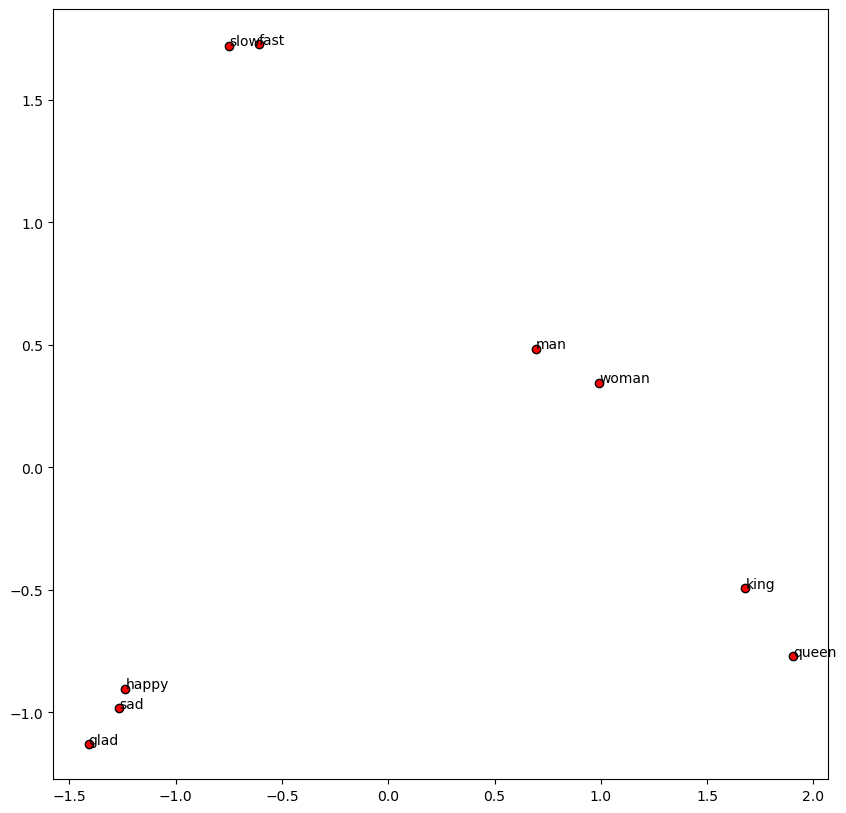

In [36]:
def visualize_embeddings(word2vec, words):
    # Get vectors for words
    word_vectors = [word2vec[word] for word in words]

    # Use PCA to reduce word vectors to 2 dimensions
    pca = PCA(n_components=2)
    principal_components = pca.fit_transform(word_vectors)

    # Plot word vectors
    plt.figure(figsize=(10, 10))
    plt.scatter(principal_components[:, 0], principal_components[:, 1], edgecolors='k', c='r')
    for word, (x, y) in zip(words, principal_components):
        plt.text(x, y, word)
    plt.show()

# Example usage
words = ['king', 'queen', 'man', 'woman', 'happy', 'sad', 'fast', 'slow', 'glad']
visualize_embeddings(word2vec, words)

# 6. Design different models
There are tatal 8 models in this project, they are:

**Machine Learning**: Naïve Bayes, Logistic Regression

**Deep Learning**: LSTM, BI-LSTM, GRU, BI-GRU

**Transformer**: BERT, BERT-BILSTM

### 6.0 Creating dataLoader (for Naïve Bayes, Logistic Regression, LSTM, BI-LSTM, GRU, BI-GRU)

In [38]:
# Dataset class
class EmotionDataset(Dataset):
    def __init__(self, df, word2vec, max_length=35):#50
        self.texts = df['text'].values
        self.labels = df['label'].values
        self.word2vec = word2vec
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]

        # Tokenize text
        tokens = text.split()
        # Pad or truncate tokens
        tokens = tokens[:self.max_length] + ['<PAD>'] * (self.max_length - len(tokens))

        # Convert tokens to word vectors
        vectors = []
        for token in tokens:
            if token in self.word2vec:
                vectors.append(self.word2vec[token])
            else:
                vectors.append(np.zeros(embedding_dim))

        return torch.tensor(vectors, dtype=torch.float32), torch.tensor(label, dtype=torch.long)

# Create DataLoaders
batch_size = 64
train_dataset = EmotionDataset(train_df, word2vec)
train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
validation_dataset = EmotionDataset(validation_df, word2vec)
validation_loader = DataLoader(validation_dataset, batch_size=batch_size, shuffle=False)
test_dataset = EmotionDataset(test_df, word2vec)
test_loader = DataLoader(test_dataset, batch_size=batch_size, shuffle=False)

### 6.1 Naïve Bayes

#### 1. Introduction
Naive Bayes is the probabilistic classifier based on the bayes theorem. Bayes' Rule can help us to trace back the conditional probabilities.
The conditional probability formula is

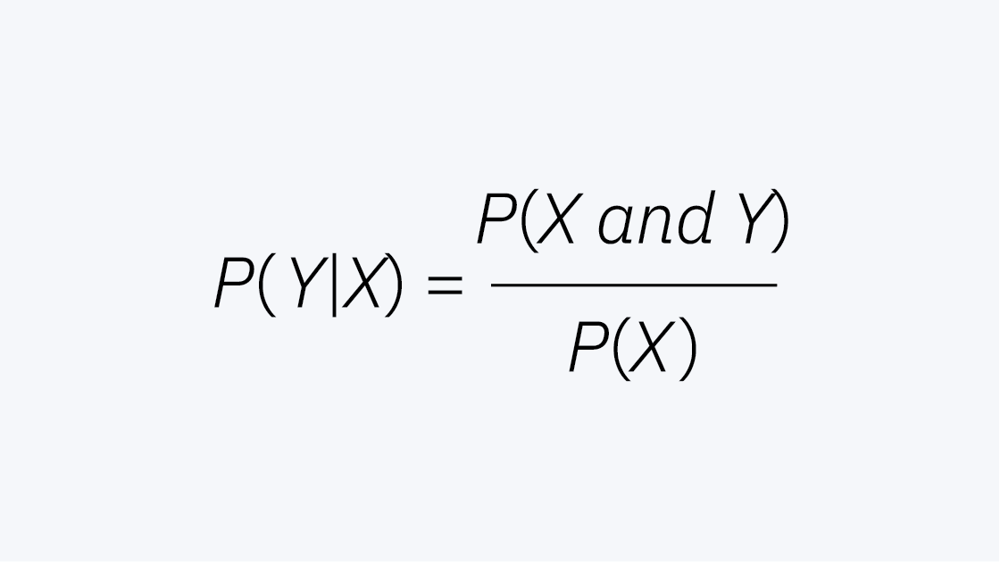

Picture from: https://www.ibm.com/topics/naive-bayes

By P(Y|X) is the conditional probability of event Y given event X
    P(X and Y) is the probability of event X and event Y happens
    P(Y) is the prior probability of event Y

Then Naive Bayes take this rule and calculate the posterior probabilities

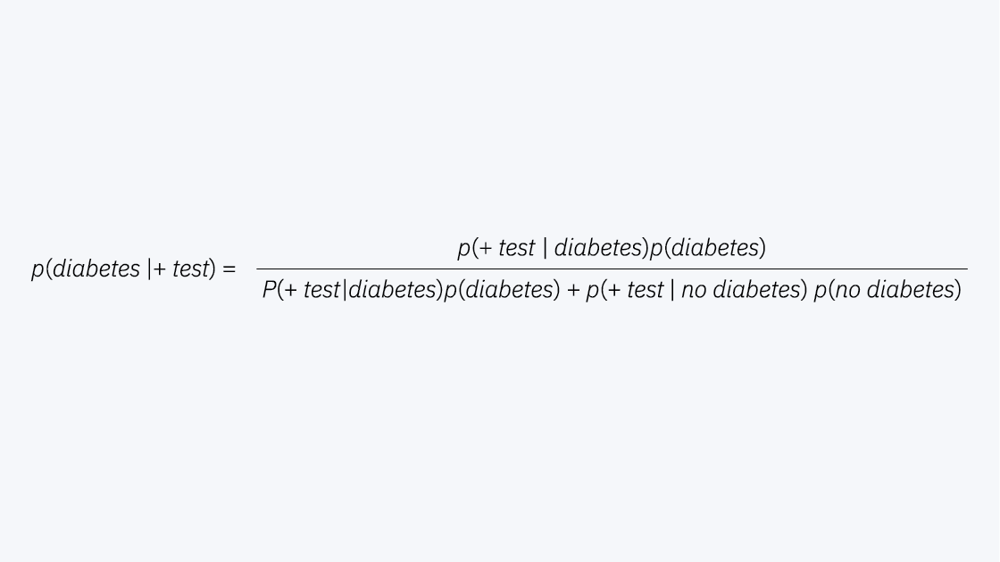

Picture from: https://www.ibm.com/topics/naive-bayes

#### 2. Design
In this experiment we use Gaussian Naive Bayes from scikit learn which is one variation of Naive Bayes that use Gaussian distribution, so the model is fitted by using mean and standard deviation
 
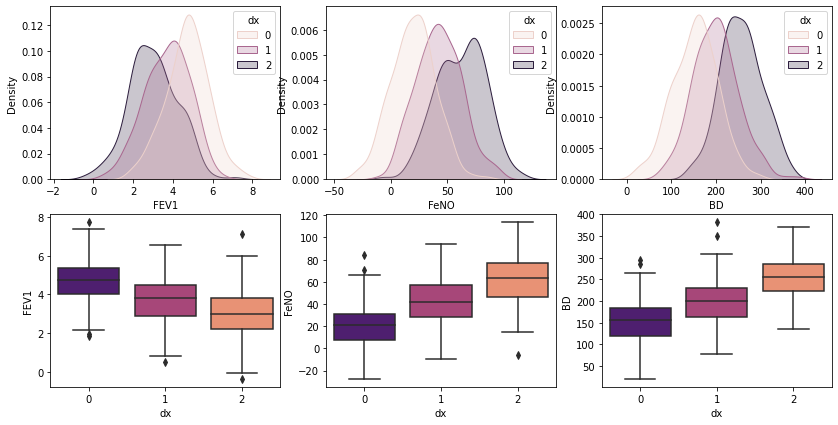

Picture from: https://towardsai.net/p/machine-learning/gaussian-naive-bayes-explained-and-hands-on-with-scikit-learn
   

In [ ]:
from sklearn.naive_bayes import GaussianNB

# prepare the data for naive bayes
def prepare_data_for_nb(loader):
    X = []
    y = []
    for vectors, labels in loader:
        for vector, label in zip(vectors, labels):
            average_vector = torch.mean(vector, dim=0).numpy()
            X.append(average_vector)
            y.append(label.numpy())
    return np.array(X), np.array(y)

# prepare training data
X_train_nb, y_train_nb = prepare_data_for_nb(train_loader)

# prepare test data
X_test_nb, y_test_nb = prepare_data_for_nb(test_loader)

# standardize the features (zero mean, unit variance)
scaler = StandardScaler()
X_train_nb_scaled = scaler.fit_transform(X_train_nb)
X_test_nb_scaled = scaler.transform(X_test_nb)

# reduce dimensionality with PCA
pca = PCA(n_components = 50)  
X_train_nb_pca = pca.fit_transform(X_train_nb_scaled)
X_test_nb_pca = pca.transform(X_test_nb_scaled)

# initialize the gaussian naive bayes model
nb_model = GaussianNB()

#### 3. Training

In [40]:
# fit the gaussian naive bayes model on the training data
nb_model.fit(X_train_nb_pca, y_train_nb)

# predict the labels for the test data using gaussian naive bayes
nb_predicted_labels = nb_model.predict(X_test_nb_pca)

C:\Users\chenxvda\AppData\Local\Temp\ipykernel_72540\2840589739.py:29: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\cb\pytorch_1000000000000\work\torch\csrc\utils\tensor_new.cpp:277.)
  return torch.tensor(vectors, dtype=torch.float32), torch.tensor(label, dtype=torch.long)


### 6.2 Logistic Regression

#### 1. Introduction
Logistic Regression is a model that perform classification of two classes using one or more features.

The general formula for logistic regression is:

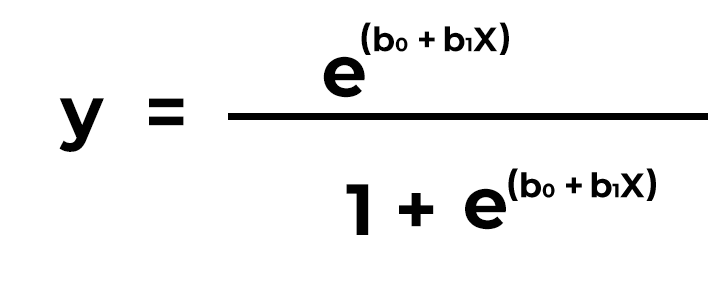

Picture from: https://www.spiceworks.com/tech/artificial-intelligence/articles/what-is-logistic-regression/

by
x = input value
y = predicted output
b0 = bias or intercept term
b1 = coefficient for input (x)

In this experiment, we modify the model to classify 6 classes according to the labels

#### 2. Design and choose hyperparameters
The model consists of linear layer of 300*35 input and 6 output neurons which represent the input size and the output classes.

The criterion is nn.CrossEntropyLoss() which is Cross Entropy Loss This will determine the difference between output and the label by determining log loss between the two
$$E = \sum_{i} {(-t_{i} \log(z_{i}) - (1-t_{i})\log(1-z_{i}))}$$

The AdamW use for the optimizer, it combines the advantages of Adam's adaptive learning rate with weight decay regularization. This helps improve convergence speed, reduce overfitting, and maintain better generalization performance.

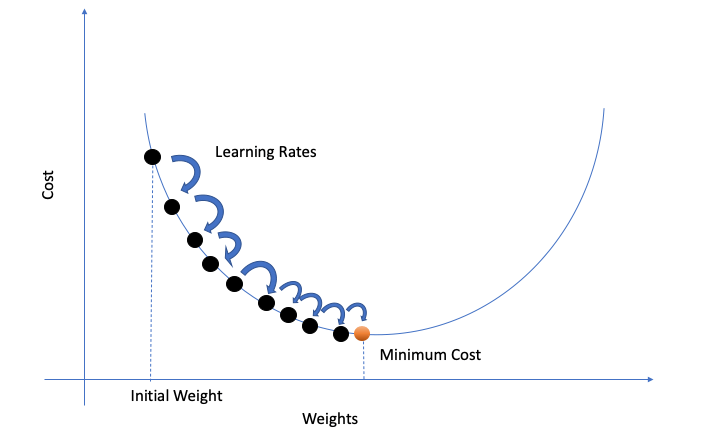

Picture from: https://www.researchgate.net/figure/Stochastic-Gradient-Descent_fig4_344544069

hyperparameters:

Learning Rate = 0.01

Epochs = 10

In [ ]:
#Logistic regression using pytorch
class LogisticRegression(nn.Module):
    
    def __init__(self, input_dimension, n_input_features):
        super(LogisticRegression, self).__init__()
        self.linear = nn.Linear(input_dimension,n_input_features)
    
    def forward(self, x):
        # return torch.sigmoid(self.linear(x))
        return self.linear(x)  # Output raw logits


# Initialize the Logistic Regression model
embedding_dim = 300
num_classes = 6
learning_rate = 0.01

logist_model = LogisticRegression(embedding_dim*35, num_classes)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(logist_model.parameters(), lr= learning_rate)

#### 3. Training

In [71]:
# Training loop
num_epochs = 10

for epoch in range(num_epochs):
    logist_model.train()
    total_loss = 0
    for texts, labels in train_loader:
        texts = texts.view(texts.size(0), -1)  # Flatten the word embeddings
        outputs = logist_model(texts)
        loss = criterion(outputs, labels)
        
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        
        total_loss += loss.item()
    
    print(f'Epoch {epoch+1}/{num_epochs}, Loss: {total_loss/len(train_loader)}')

# save Logistic Regression model
torch.save(logist_model.state_dict(), 'Logist_model.pth')
print("Model saved to Logist_model.pth")

C:\Users\chenxvda\AppData\Local\Temp\ipykernel_66120\2840589739.py:29: UserWarning: Creating a tensor from a list of numpy.ndarrays is extremely slow. Please consider converting the list to a single numpy.ndarray with numpy.array() before converting to a tensor. (Triggered internally at C:\cb\pytorch_1000000000000\work\torch\csrc\utils\tensor_new.cpp:277.)
  return torch.tensor(vectors, dtype=torch.float32), torch.tensor(label, dtype=torch.long)


Epoch 1/10, Loss: 1.7829294065155015
Epoch 2/10, Loss: 1.7649994172402212
Epoch 3/10, Loss: 1.7482552801103226
Epoch 4/10, Loss: 1.7326948942085587
Epoch 5/10, Loss: 1.7182286775357176
Epoch 6/10, Loss: 1.704816389872199
Epoch 7/10, Loss: 1.6923982913841404
Epoch 8/10, Loss: 1.6808356928761459
Epoch 9/10, Loss: 1.6701256419208244
Epoch 10/10, Loss: 1.6601618110760714


### 6.3 LSTM

#### 1. Introduction
Long Short-Term Memory (LSTM) is a type of recurrent neural network (RNN) that can learn long-term dependencies. LSTM has three main gates:

- Forget gate (f): determines how much of the old memory cell value should be kept.
- Input gate (i): determines how much new information should be added to the memory cell.
- Output gate (o): determines how much of the new memory cell value should be output.

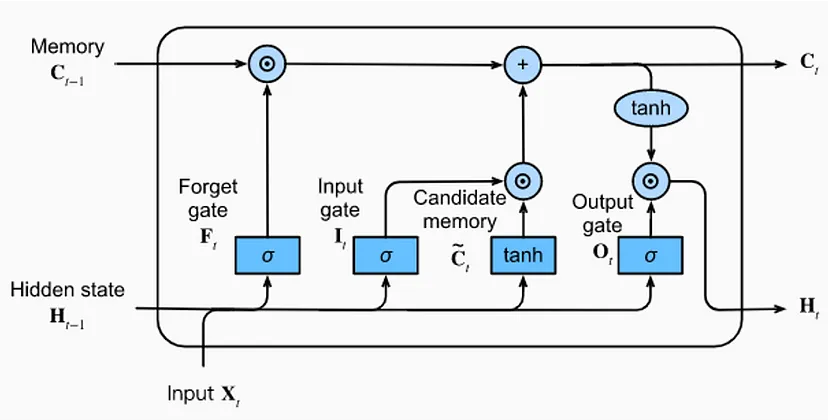

Picture from: https://medium.com/@ottaviocalzone/an-intuitive-explanation-of-lstm-a035eb6ab42c

#### 2. Design and choose hyperparameters
The model consist of
- 2 LSTM layers with 300 embedding dimensions input and 128 dimensions output 
- Dropout Layer (between 2 LSTM layers) with the dropout value of 0.1
- Dropout Layer (before the output layer) with the dropout value of 0.1
- Linear layer that has 128 input neurons and 6 output neurons
- Using Cross entropy as the criterion
- AdamW Optimizer is used to optimize the model.


    As written in the ED forum, Adam is the adaptive moment estimation. The aim is to maintain a running average of the gradients and squared gradient for each weight in the model

    $$ m_{t} = \Beta_{1}m_{t-1} + (1 - \Beta_{1})g_{t}$$
    $$ v_{t} = \Beta_{2} v_{t-1} + (1 - \Beta_{2}) g_{t}^2  $$

    In the early state $m_{t}$ and $g_{y}$ are both zeros and rescaled into

    $$ m_{t} = \frac{m_{t}}{1 - \Beta_{1}^{t}} $$
    $$ v_{t} = \frac{v_{t}}{1 - \Beta_{2}^{t}} $$

    The final update of the weights is
    $$ w_{t} = w_{t-1} - \eta \frac{m_{t}}{\sqrt{v_{t}} + \epsilon} $$

    By $\eta$ is the learning rate
    This optimizer is proved to be better in the deep learning model helping model to achieve better performance in variety of fields including the NLP application.

     AdamW combines the advantages of Adam's adaptive learning rate with weight decay regularization. This helps improve convergence speed, reduce overfitting, and maintain better generalization performance.

Other hyperparameters:

Learning Rate is 0.01

Number of Epochs are 10

In [155]:
# Define the LSTM model
class LSTMModel(nn.Module):
    def __init__(self, embedding_dim, hidden_dim, output_dim, num_layers, dropout):
        super(LSTMModel, self).__init__()
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, num_layers, batch_first=True, dropout=dropout)
        self.fc = nn.Linear(hidden_dim, output_dim)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        _, (hidden, _) = self.lstm(x)
        hidden = self.dropout(hidden[-1])
        out = self.fc(hidden)
        return out

# Hyperparameters
hidden_dim = 128
output_dim = len(train_df['label'].unique())
num_layers = 2
dropout = 0.1
learning_rate = 0.01
num_epochs = 10

# Initialize model, loss function, and optimizer
model1 = LSTMModel(embedding_dim, hidden_dim, output_dim, num_layers, dropout)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model1.parameters(), lr=learning_rate)

#### 3. Training

100%|██████████| 1119/1119 [02:01<00:00,  9.19it/s]


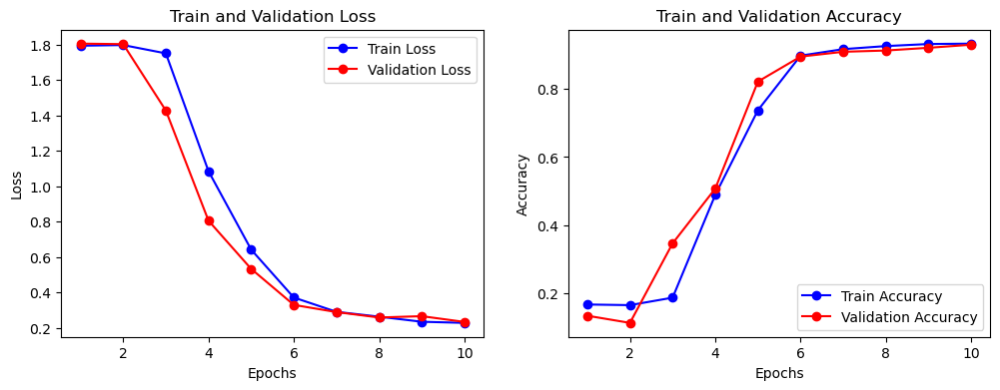

In [158]:
# Training the model( you can skip this part to save your time, I have trained and saved the model.)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model1.to(device)

train_losses = []
validation_losses = []
train_accuracies = []
validation_accuracies = []

for epoch in range(num_epochs):
    model1.train()
    epoch_train_loss = 0
    epoch_train_corrects = 0
    for texts, labels in tqdm(train_loader):
        texts, labels = texts.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model1(texts)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        epoch_train_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        epoch_train_corrects += torch.sum(preds == labels.data)

    epoch_train_loss /= len(train_loader)
    epoch_train_accuracy = epoch_train_corrects.double() / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    train_accuracies.append(epoch_train_accuracy.item())

    model1.eval()
    epoch_val_loss = 0
    epoch_val_corrects = 0
    with torch.no_grad():
        for texts, labels in validation_loader:
            texts, labels = texts.to(device), labels.to(device)
            outputs = model1(texts)
            loss = criterion(outputs, labels)
            epoch_val_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            epoch_val_corrects += torch.sum(preds == labels.data)

    epoch_val_loss /= len(validation_loader)
    epoch_val_accuracy = epoch_val_corrects.double() / len(validation_loader.dataset)
    validation_losses.append(epoch_val_loss)
    validation_accuracies.append(epoch_val_accuracy.item())

# Plot the loss and accuracy curves
epochs = range(1, num_epochs + 1)

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_losses, 'bo-', label='Train Loss')
plt.plot(epochs, validation_losses, 'ro-', label='Validation Loss')
plt.title('Train and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, train_accuracies, 'bo-', label='Train Accuracy')
plt.plot(epochs, validation_accuracies, 'ro-', label='Validation Accuracy')
plt.title('Train and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

# Save the model
model_path = 'LSTM_model.pth'
torch.save(model1.state_dict(), model_path)
print(f'Model saved to {model_path}')

### 6.4 BI-LSTM

#### 1. Introduction
BILSTM is a bidirectional LSTM model, which means it processes the input sequence from both ends to both directions.
We assume this model will perform better than the uni-direction version we can find the important word before encountering the word like "feel" and "feeling" in the input sequence.

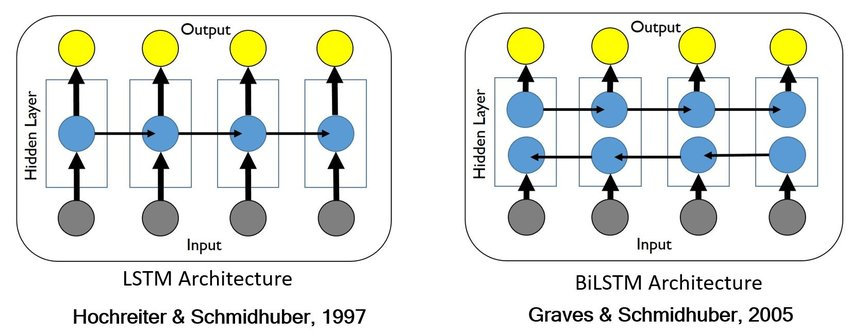

Picture from: https://www.researchgate.net/figure/LSTM-and-BiLSTM-Architectures_fig2_324769532

#### 2. Design and choose hyperparameters
The model design and hyperparameters are identical to the uni-directional version
- 2 BiLSTM layers with 300 embedding dimensions input and 128 dimensions output
- Dropout Layer (between 2 LSTM layers) with the dropout value of 0.1
- Dropout Layer (before the output layer) with the dropout value of 0.1
- Linear layer that has 128*2 input neurons and 6 output neurons
- Using Cross entropy as the criterion
- AdamW optimizer is used as the optimizer

Other hyperparameters:

Learning Rate is 0.01

Number of Epochs are 3

In [137]:
# Define the BILSTM model
class BILSTMModel(nn.Module):
    def __init__(self, embedding_dim, hidden_dim, output_dim, num_layers, dropout, bidirectional):
        super(BILSTMModel, self).__init__()
        self.lstm = nn.LSTM(embedding_dim, hidden_dim, num_layers, batch_first=True, dropout=dropout, bidirectional=bidirectional)
        self.fc = nn.Linear(hidden_dim * 2 if bidirectional else hidden_dim, output_dim)
        self.dropout = nn.Dropout(dropout)
        self.bidirectional = bidirectional

    def forward(self, x):
        _, (hidden, _) = self.lstm(x)
        if self.bidirectional:
            hidden = self.dropout(torch.cat((hidden[-2,:,:], hidden[-1,:,:]), dim=1))
        else:
            hidden = self.dropout(hidden[-1])
        out = self.fc(hidden)
        return out

# Hyperparameters
bidirectional = True
hidden_dim = 128
output_dim = len(train_df['label'].unique())
num_layers = 2
dropout = 0.1
learning_rate = 0.01
num_epochs = 3

# Initialize model, loss function, and optimizer
model2 = BILSTMModel(embedding_dim, hidden_dim, output_dim, num_layers, dropout, bidirectional)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model2.parameters(), lr=learning_rate)

#### 4. Training

100%|██████████| 1119/1119 [02:38<00:00,  7.04it/s]


Epoch 1/3, Train Loss: 0.2573761341504926, Train Accuracy: 0.9054265515410623, Validation Loss: 0.1617507160376283, Validation Accuracy: 0.9326551666226818


100%|██████████| 1119/1119 [02:37<00:00,  7.10it/s]


Epoch 2/3, Train Loss: 0.1347203452857519, Train Accuracy: 0.9453153379718892, Validation Loss: 0.1414518714639604, Validation Accuracy: 0.9350783330534296


100%|██████████| 1119/1119 [02:34<00:00,  7.27it/s]


Epoch 3/3, Train Loss: 0.12515831127316693, Train Accuracy: 0.9488361695587783, Validation Loss: 0.16585505338659956, Validation Accuracy: 0.9355101844965331


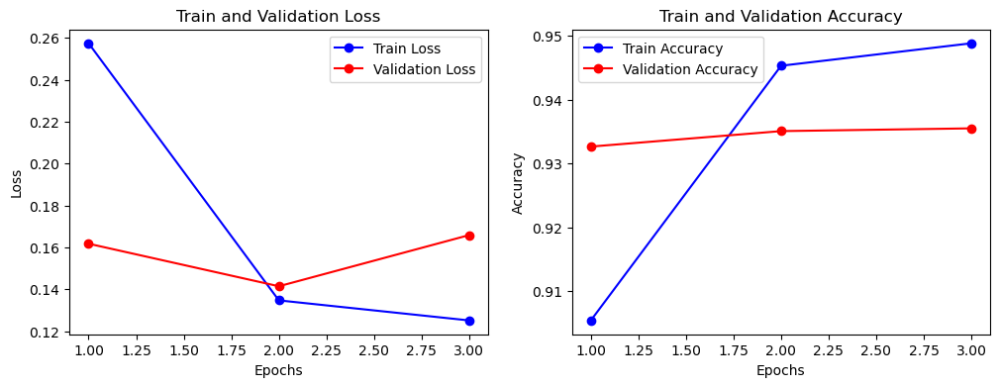

In [140]:
# Training the model( you can skip this part to save your time, I have trained and saved the model.)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model2.to(device)

train_losses = []
validation_losses = []
train_accuracies = []
validation_accuracies = []

for epoch in range(num_epochs):
    model2.train()
    epoch_train_loss = 0
    epoch_train_corrects = 0
    for texts, labels in tqdm(train_loader):
        texts, labels = texts.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model2(texts)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        epoch_train_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        epoch_train_corrects += torch.sum(preds == labels.data)

    epoch_train_loss /= len(train_loader)
    epoch_train_accuracy = epoch_train_corrects.double() / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    train_accuracies.append(epoch_train_accuracy.item())

    model2.eval()
    epoch_val_loss = 0
    epoch_val_corrects = 0
    with torch.no_grad():
        for texts, labels in validation_loader:
            texts, labels = texts.to(device), labels.to(device)
            outputs = model2(texts)
            loss = criterion(outputs, labels)
            epoch_val_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            epoch_val_corrects += torch.sum(preds == labels.data)

    epoch_val_loss /= len(validation_loader)
    epoch_val_accuracy = epoch_val_corrects.double() / len(validation_loader.dataset)
    validation_losses.append(epoch_val_loss)
    validation_accuracies.append(epoch_val_accuracy.item())

    print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {epoch_train_loss}, Train Accuracy: {epoch_train_accuracy}, Validation Loss: {epoch_val_loss}, Validation Accuracy: {epoch_val_accuracy}')

# Plot the loss and accuracy curves
epochs = range(1, num_epochs + 1)

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_losses, 'bo-', label='Train Loss')
plt.plot(epochs, validation_losses, 'ro-', label='Validation Loss')
plt.title('Train and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, train_accuracies, 'bo-', label='Train Accuracy')
plt.plot(epochs, validation_accuracies, 'ro-', label='Validation Accuracy')
plt.title('Train and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

# Save the model
model_path = 'BILSTM_model.pth'
torch.save(model2.state_dict(), model_path)
print(f'Model saved to {model_path}')

### 6.5 GRU

#### 1. Introduction
Gated Recurrent Unit (GRU) is a simplified version of LSTM. GRU has two gates:

- Update gate (z): determines how much of the old hidden state should be kept.
- Reset gate (r): determines how much of the new input should be added to the hidden state.

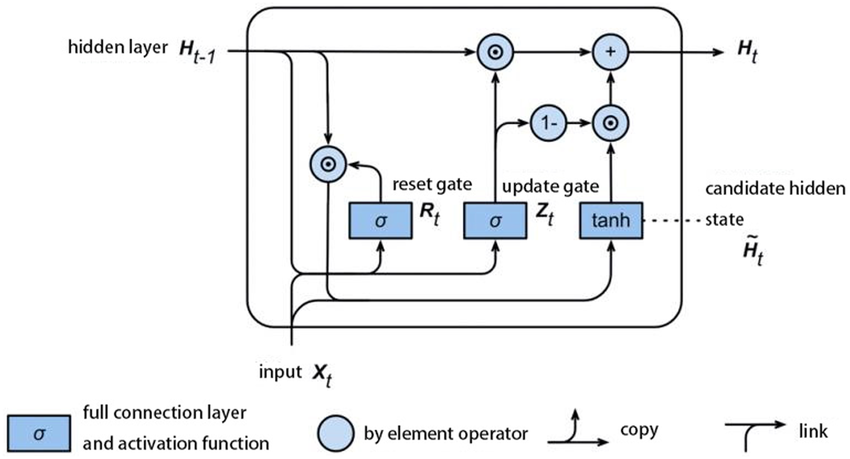

Picture from: https://www.researchgate.net/figure/GRU-model-structureGRU-gated-recurrent-neural-network_fig3_368401217

#### 2. Design and choose hyperparameters
The model consist of
- 2 GRU layers with 300 embedding dimensions input and 128 dimensions output
- Dropout Layer (between 2 GRU layers) with the dropout value of 0.1
- Dropout Layer (before the output layer) with the dropout value of 0.1 
- Linear layer that has 128 input neurons and 6 output neurons
- Using Cross entropy as the criterion
- Using AdamW as the optimizer

Other hyperparameters:

Learning Rate is 0.01

Number of Epochs are 3

In [143]:
#Normal GRU model
class GRUModel(nn.Module):
    def __init__(self, embedding_dim, hidden_dim, output_dim, num_layers, dropout):
        super(GRUModel, self).__init__()
        self.gru = nn.GRU(embedding_dim, hidden_dim, num_layers, batch_first=True, dropout=dropout)
        self.fc = nn.Linear(hidden_dim, output_dim)
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        _, hidden = self.gru(x)
        hidden = self.dropout(hidden[-1])
        out = self.fc(hidden)
        return out

# Hyperparameters
hidden_dim = 128
output_dim = len(train_df['label'].unique())
num_layers = 2
dropout = 0.1
learning_rate = 0.01
num_epochs = 5

# Initialize model, loss function, and optimizer
model3 = GRUModel(embedding_dim, hidden_dim, output_dim, num_layers, dropout)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model3.parameters(), lr=learning_rate)

#### 3. Training

100%|██████████| 1119/1119 [02:01<00:00,  9.21it/s]


Epoch 1/5, Train Loss: 0.5995671250745055, Train Accuracy: 0.7549668874172185, Validation Loss: 0.22467794271323122, Validation Accuracy: 0.9262733619634845


100%|██████████| 1119/1119 [02:02<00:00,  9.15it/s]


Epoch 2/5, Train Loss: 0.18185196589542033, Train Accuracy: 0.9345013552407299, Validation Loss: 0.20295757542370013, Validation Accuracy: 0.9235383028238285


100%|██████████| 1119/1119 [01:57<00:00,  9.55it/s]


Epoch 3/5, Train Loss: 0.15820849887607244, Train Accuracy: 0.9385251627686031, Validation Loss: 0.16938960653346924, Validation Accuracy: 0.9296082147741177


100%|██████████| 1119/1119 [02:04<00:00,  9.02it/s]


Epoch 4/5, Train Loss: 0.15807818869125495, Train Accuracy: 0.9399502612680581, Validation Loss: 0.20647178147776635, Validation Accuracy: 0.9248578488999784


100%|██████████| 1119/1119 [02:06<00:00,  8.85it/s]


Epoch 5/5, Train Loss: 0.1810751267732974, Train Accuracy: 0.9330483136334423, Validation Loss: 0.17233098895386137, Validation Accuracy: 0.9282166934574506


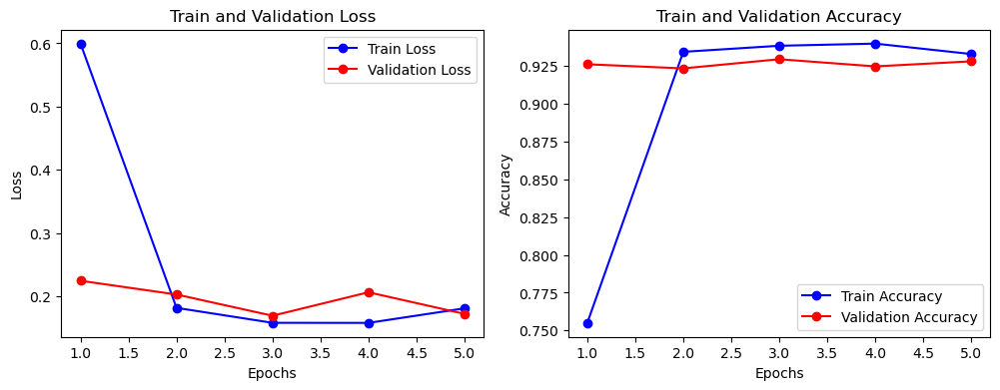

In [144]:
# Training the model( you can skip this part to save your time, I have trained and saved the model.)
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model3.to(device)

train_losses = []
validation_losses = []
train_accuracies = []
validation_accuracies = []

for epoch in range(num_epochs):
    model3.train()
    epoch_train_loss = 0
    epoch_train_corrects = 0
    for texts, labels in tqdm(train_loader):
        texts, labels = texts.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model3(texts)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        epoch_train_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        epoch_train_corrects += torch.sum(preds == labels.data)

    epoch_train_loss /= len(train_loader)
    epoch_train_accuracy = epoch_train_corrects.double() / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    train_accuracies.append(epoch_train_accuracy.item())

    model3.eval()
    epoch_val_loss = 0
    epoch_val_corrects = 0
    with torch.no_grad():
        for texts, labels in validation_loader:
            texts, labels = texts.to(device), labels.to(device)
            outputs = model3(texts)
            loss = criterion(outputs, labels)
            epoch_val_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            epoch_val_corrects += torch.sum(preds == labels.data)

    epoch_val_loss /= len(validation_loader)
    epoch_val_accuracy = epoch_val_corrects.double() / len(validation_loader.dataset)
    validation_losses.append(epoch_val_loss)
    validation_accuracies.append(epoch_val_accuracy.item())

    print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {epoch_train_loss}, Train Accuracy: {epoch_train_accuracy}, Validation Loss: {epoch_val_loss}, Validation Accuracy: {epoch_val_accuracy}')

# Plot the loss and accuracy curves
epochs = range(1, num_epochs + 1)

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_losses, 'bo-', label='Train Loss')
plt.plot(epochs, validation_losses, 'ro-', label='Validation Loss')
plt.title('Train and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, train_accuracies, 'bo-', label='Train Accuracy')
plt.plot(epochs, validation_accuracies, 'ro-', label='Validation Accuracy')
plt.title('Train and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

# Save the model
model_path = 'UNIGRU_model.pth'
torch.save(model3.state_dict(), model_path)
print(f'Model saved to {model_path}')

### 6.6 BI-GRU

#### 1. Introduction
BiGRU is a bidirectional GRU model, which means it processes the input sequence from both ends to both directions. This is similar to BiLSTM but having the same architecture as the GRU

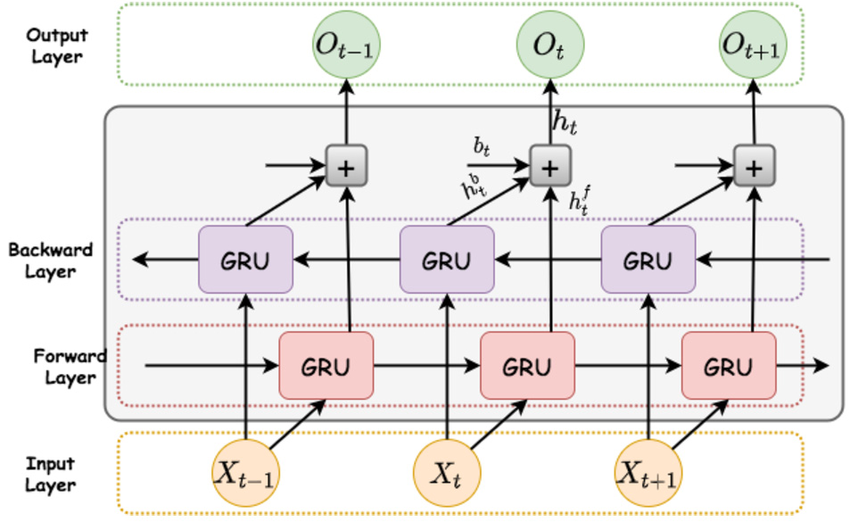

Picture From: https://www.researchgate.net/figure/Architectural-diagram-of-the-BiGRU-model-illustrating-its-dual-recurrent-pathways-for_fig4_374206433

#### 2. Design and choose hyperparameters
The model design and hyperparameter are similar to the uni-directional GRU
- 2 BiGRU layers with 300 embedding dimensions input and 128 dimensions output
- Dropout Layer (between 2 GRU layers) with the dropout value of 0.1
- Dropout Layer (before the output layer) with the dropout value of 0.1 
- Linear layer with 128*2 = 256 input neurons and 6 output neurons
- Using Cross entropy as the criterion
- Using AdamW as the optimizer

Other hyperparameters:

Learning Rate is 0.01

Number of Epochs are 3

In [145]:
# Bidirectional GRU model
class BidirectionalGRUModel(nn.Module):
    def __init__(self, embedding_dim, hidden_dim, output_dim, num_layers, dropout):
        super(BidirectionalGRUModel, self).__init__()
        self.gru = nn.GRU(embedding_dim, hidden_dim, num_layers, batch_first=True, dropout=dropout, bidirectional=True)
        self.fc = nn.Linear(hidden_dim * 2, output_dim)  # *2 for bidirectional
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        _, hidden = self.gru(x)
        hidden = self.dropout(torch.cat((hidden[-2], hidden[-1]), dim=1))
        out = self.fc(hidden)
        return out

# Hyperparameters
hidden_dim = 128
output_dim = len(train_df['label'].unique())
num_layers = 2
dropout = 0.1
learning_rate = 0.01
num_epochs = 3

# Initialize model, loss function, and optimizer
model4 = BidirectionalGRUModel(embedding_dim, hidden_dim, output_dim, num_layers, dropout)
criterion = nn.CrossEntropyLoss()
optimizer = torch.optim.AdamW(model4.parameters(), lr=learning_rate)

#### 3. Training

100%|██████████| 1119/1119 [02:29<00:00,  7.50it/s]


Epoch 1/3, Train Loss: 0.2430822385609869, Train Accuracy: 0.9075502277363288, Validation Loss: 0.20406024859921057, Validation Accuracy: 0.9276888750269907


100%|██████████| 1119/1119 [02:27<00:00,  7.61it/s]


Epoch 2/3, Train Loss: 0.18489265118886228, Train Accuracy: 0.9313577556095789, Validation Loss: 0.15819497310065098, Validation Accuracy: 0.934382572395096


100%|██████████| 1119/1119 [02:26<00:00,  7.64it/s]


Epoch 3/3, Train Loss: 0.17974507805605863, Train Accuracy: 0.9339285215301646, Validation Loss: 0.20489791106858343, Validation Accuracy: 0.9325831913821645


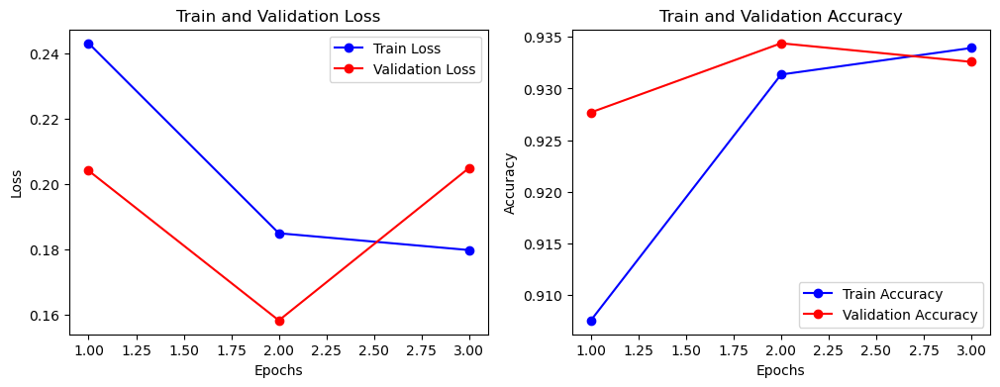

In [146]:
# Training the model
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model4.to(device)

train_losses = []
validation_losses = []
train_accuracies = []
validation_accuracies = []

for epoch in range(num_epochs):
    model4.train()
    epoch_train_loss = 0
    epoch_train_corrects = 0
    for texts, labels in tqdm(train_loader):
        texts, labels = texts.to(device), labels.to(device)
        optimizer.zero_grad()
        outputs = model4(texts)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        epoch_train_loss += loss.item()
        _, preds = torch.max(outputs, 1)
        epoch_train_corrects += torch.sum(preds == labels.data)

    epoch_train_loss /= len(train_loader)
    epoch_train_accuracy = epoch_train_corrects.double() / len(train_loader.dataset)
    train_losses.append(epoch_train_loss)
    train_accuracies.append(epoch_train_accuracy.item())

    model4.eval()
    epoch_val_loss = 0
    epoch_val_corrects = 0
    with torch.no_grad():
        for texts, labels in validation_loader:
            texts, labels = texts.to(device), labels.to(device)
            outputs = model4(texts)
            loss = criterion(outputs, labels)
            epoch_val_loss += loss.item()
            _, preds = torch.max(outputs, 1)
            epoch_val_corrects += torch.sum(preds == labels.data)

    epoch_val_loss /= len(validation_loader)
    epoch_val_accuracy = epoch_val_corrects.double() / len(validation_loader.dataset)
    validation_losses.append(epoch_val_loss)
    validation_accuracies.append(epoch_val_accuracy.item())

    print(f'Epoch {epoch+1}/{num_epochs}, Train Loss: {epoch_train_loss}, Train Accuracy: {epoch_train_accuracy}, Validation Loss: {epoch_val_loss}, Validation Accuracy: {epoch_val_accuracy}')

# Plot the loss and accuracy curves
epochs = range(1, num_epochs + 1)

plt.figure(figsize=(12, 4))

plt.subplot(1, 2, 1)
plt.plot(epochs, train_losses, 'bo-', label='Train Loss')
plt.plot(epochs, validation_losses, 'ro-', label='Validation Loss')
plt.title('Train and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(epochs, train_accuracies, 'bo-', label='Train Accuracy')
plt.plot(epochs, validation_accuracies, 'ro-', label='Validation Accuracy')
plt.title('Train and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

# Save the model
model_path = 'BiGRU_model.pth'
torch.save(model4.state_dict(), model_path)
print(f'Model saved to {model_path}')

### 6.7 BERT

#### 1. Introduction
BERT (Bidirectional Encoder Representations from Transformers) is a pre-trained language model developed by Google. This model post the state-of-the-art result of the NLP application with the help of transformer attention characteristic. The transformer using encoder to read the text input and decoder for the prediction task. Difference from the LSTM and GRU which read each word one by one, this model reading the entire sequence at once.

In Training Process, BERT are rely on two components

1. **Masked Language Modeling (MLM)**: The model randomly mask 15% of the input words and then predict the masked word using it making value.
    1. Having classification layer at the encoder output level
    2. Multiply output vector with the embedding matrix, transform the word into the embedding matrix
    3. Calculate probability using softmax
    
    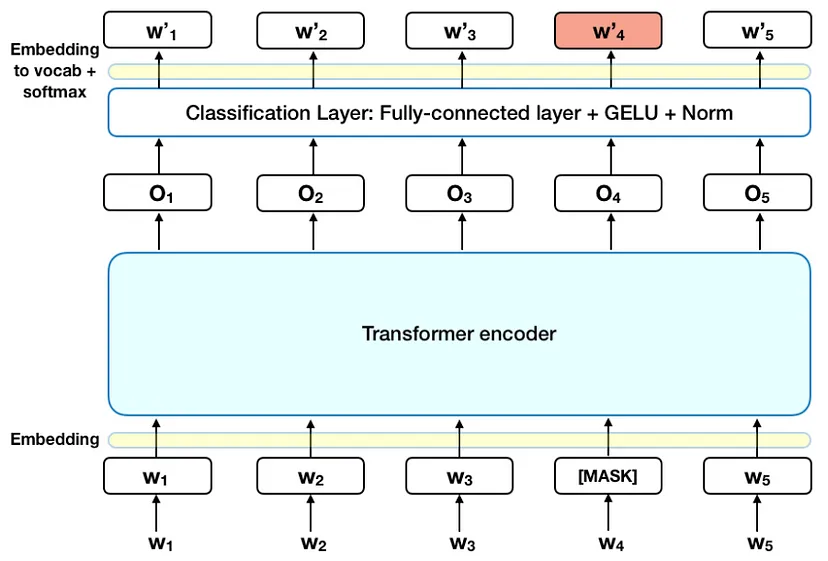

    Picture from: https://towardsdatascience.com/bert-explained-state-of-the-art-language-model-for-nlp-f8b21a9b6270

2. **Next Sentence Prediction (NSP)**: The model receive a pair of sentences and predicts if the second sentence is the subsequences of the first sentence. Here are preprocessing of the inputs
    1. CLS token is inserted at the beginning of the first sentence and SEP is at the end of second sentence
    2. Sentences embedding [A,B] is added to each token. 
    3. Add positional embedding is added to the sequence.
    
    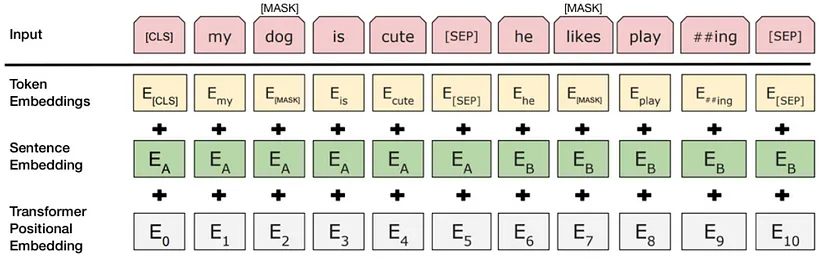

    Picture from: https://towardsdatascience.com/bert-explained-state-of-the-art-language-model-for-nlp-f8b21a9b6270

    the sentence prediction is done by
    1. Passing the entire input sequence through the transformer
    2. Form output of the CLS token into 2x1 vector using classification layer
    3. Calculate probability of the next sentence using softmax
#### 2. Design and choose hyperparameters
In this experiment, we are using the BERTBase model, which employs 12 layers of transformer blocks, a hidden size of 768, 12 self-attention heads, and approximately 110 million trainable parameters. On top of this model, we have added a fully connected layer with 6 output units and trained it for classification tasks. Importantly, we did not freeze any of the model’s parameters during training, allowing the BERTBase model’s weights to be updated alongside the newly added fully connected layer.   

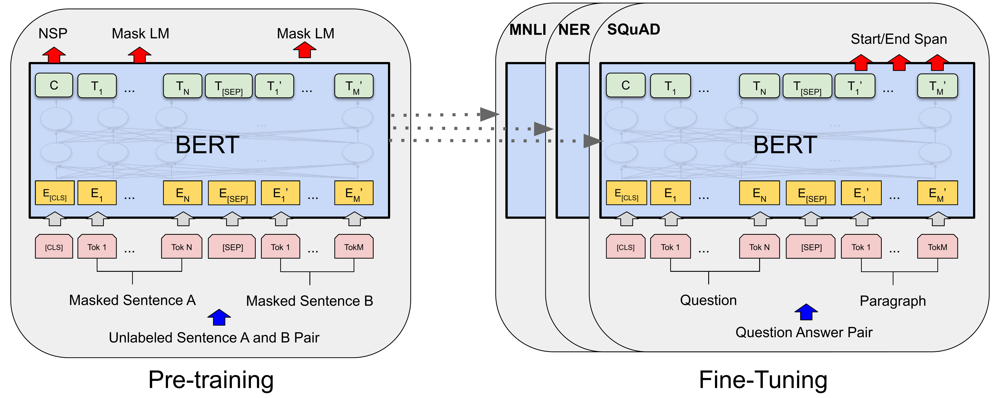

Picture from: https://paperswithcode.com/method/bert

Other hyperparameters:

Learning Rate is 2e-5

Number of Epochs are 3

In [19]:
# Load the pre-trained BERT model and tokenizer

# Load the configuration file for BERT
config = BertConfig.from_pretrained("bert-base-uncased")

# Print the default dropout rates
print("hidden_dropout_prob:", config.hidden_dropout_prob)
print("attention_probs_dropout_prob:", config.attention_probs_dropout_prob)

# Initialize the BERT model for sequence classification with the loaded configuration
model = BertForSequenceClassification.from_pretrained("bert-base-uncased", config=config)

# Print the model configuration to confirm
print(model.config)


tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
model = AutoModel.from_pretrained("bert-base-uncased")
model = model.to(device)

# Tokenize a sample text
inputs = tokenizer("I am happy.", return_tensors="pt")
inputs = {name: tensor.to(device) for name, tensor in inputs.items()}  # 将输入数据移动到设备上
print(inputs)

# Tokenize a sample text
inputs = tokenizer("I am happy.", return_tensors="pt")
inputs = {name: tensor.to(device) for name, tensor in inputs.items()}  # 将输入数据移动到设备上
print(inputs)

# Get embeddings using BERT model
with torch.no_grad():
    outputs = model(**inputs)
print(outputs.last_hidden_state)  # This is the embedding representation of the text

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


hidden_dropout_prob: 0.1
attention_probs_dropout_prob: 0.1
BertConfig {
  "_name_or_path": "bert-base-uncased",
  "architectures": [
    "BertForMaskedLM"
  ],
  "attention_probs_dropout_prob": 0.1,
  "classifier_dropout": null,
  "gradient_checkpointing": false,
  "hidden_act": "gelu",
  "hidden_dropout_prob": 0.1,
  "hidden_size": 768,
  "initializer_range": 0.02,
  "intermediate_size": 3072,
  "layer_norm_eps": 1e-12,
  "max_position_embeddings": 512,
  "model_type": "bert",
  "num_attention_heads": 12,
  "num_hidden_layers": 12,
  "pad_token_id": 0,
  "position_embedding_type": "absolute",
  "transformers_version": "4.42.3",
  "type_vocab_size": 2,
  "use_cache": true,
  "vocab_size": 30522
}

{'input_ids': tensor([[ 101, 1045, 2572, 3407, 1012,  102]], device='cuda:0'), 'token_type_ids': tensor([[0, 0, 0, 0, 0, 0]], device='cuda:0'), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1]], device='cuda:0')}
{'input_ids': tensor([[ 101, 1045, 2572, 3407, 1012,  102]], device='cuda:0'), 'toke

#### 3. Create data loaders

In [20]:
# Define a custom Dataset class for emotion classification
class EmotionDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=35):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]

        encoding = self.tokenizer(
            text,
            truncation=True,
            padding='max_length',
            max_length=self.max_length,
            return_tensors='pt'
        )

        return {
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'labels': torch.tensor(label, dtype=torch.long)
        }

# Create data loaders for the training, validation, and test sets
train_dataset = EmotionDataset(train_df['text'].to_list(), train_df['label'].to_list(), tokenizer)
validation_dataset = EmotionDataset(validation_df['text'].to_list(), validation_df['label'].to_list(), tokenizer)
test_dataset = EmotionDataset(test_df['text'].to_list(), test_df['label'].to_list(), tokenizer)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
validation_loader = DataLoader(validation_dataset, batch_size=32)
test_loader = DataLoader(test_dataset, batch_size=32)

# Use BERT for sequence classification
model = BertForSequenceClassification.from_pretrained("bert-base-uncased", num_labels=6)
model = model.to(device)

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


#### 4. Training

In [12]:
# Define optimizer and loss function
optimizer = AdamW(model.parameters(), lr=2e-5)

# Function to evaluate the model
def evaluate_model(data_loader):
    model.eval()
    predictions, true_labels = [], []
    total_loss = 0

    with torch.no_grad():
        for batch in data_loader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)

            outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
            logits = outputs.logits
            loss = outputs.loss
            total_loss += loss.item()
            
            _, preds = torch.max(logits, dim=1)

            predictions.extend(preds.cpu().numpy())  # Move predictions to CPU and convert to numpy array
            true_labels.extend(labels.cpu().numpy())  # Move true labels to CPU and convert to numpy array

    avg_loss = total_loss / len(data_loader)
    return true_labels, predictions, avg_loss

# Function to calculate accuracy
def calculate_accuracy(predictions, labels):
    return accuracy_score(labels, predictions)

# Training
epochs = 3
best_valid_loss = float('inf')
patience = 2
patience_counter = 0

# Lists to store loss and accuracy for each epoch
train_losses, valid_losses = [], []
train_accuracies, valid_accuracies = [], []

for epoch in range(epochs):
    model.train()
    total_loss = 0
    correct_predictions = 0
    total_predictions = 0

    # Use tqdm to display a progress bar
    progress_bar = tqdm(train_loader, desc=f'Epoch {epoch+1}')

    for batch in train_loader:
        optimizer.zero_grad()

        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        outputs = model(input_ids, attention_mask=attention_mask, labels=labels)

        loss = outputs.loss
        total_loss += loss.item()

        loss.backward()
        optimizer.step()

        # Calculate accuracy
        logits = outputs.logits
        _, preds = torch.max(logits, dim=1)
        correct_predictions += (preds == labels).sum().item()
        total_predictions += labels.size(0)

        # Update progress bar description
        progress_bar.set_postfix({'Batch Loss': loss.item(), 'Accuracy': correct_predictions / total_predictions})
        progress_bar.update(1)  # Update the progress bar

        print('')
        
    train_accuracy = correct_predictions / total_predictions
    train_losses.append(total_loss / len(train_loader))
    train_accuracies.append(train_accuracy)

    print(f'Epoch {epoch+1}, Loss: {train_losses[-1]}, Accuracy: {train_accuracy}')
    progress_bar.close()  # Ensure the progress bar is closed when done

    # Evaluate the model on the validation set
    true_labels, predictions, valid_loss = evaluate_model(validation_loader)
    validation_accuracy = calculate_accuracy(predictions, true_labels)
    valid_losses.append(valid_loss)
    valid_accuracies.append(validation_accuracy)
    
    print(f'Validation Loss: {valid_loss}, Validation Accuracy: {validation_accuracy}')
    print(classification_report(true_labels, predictions))

    # Early stopping mechanism
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        patience_counter = 0
        torch.save(model.state_dict(), 'best_bert_model_unsplit.pth')  # Save the best model
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping")
            break

Some weights of BertForSequenceClassification were not initialized from the model checkpoint at bert-base-uncased and are newly initialized: ['classifier.bias', 'classifier.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
C:\Users\chenxvda\anaconda3\Lib\site-packages\transformers\optimization.py:591: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
Epoch 1:   0%|          | 1/2237 [00:12<7:58:37, 12.84s/it, Batch Loss=1.81, Accuracy=0.125]

Epoch 1:   0%|          | 2/2237 [00:26<8:13:45, 13.26s/it, Batch Loss=1.76, Accuracy=0.188]

Epoch 1:   0%|          | 3/2237 [00:41<8:41:31, 14.01s/it, Batch Loss=1.8, Accuracy=0.188] 

Epoch 1:   0%|          | 4/2237 [00:56<8:55:45, 14.40s/it, Batch Loss=1.84, Accuracy=0.18]

Epoch 1:   0%|          | 5/2237 [01:11<9:02:41, 14.59s/it, Batch Loss=1.79, Accuracy=0.225]

Epoch 1:   0%|          | 6/2237 [01:26<9:07:15, 14.72s/it, Batch Loss=1.94, Accuracy=0.198]

Epoch 1:   0%|          | 7/2237 [01:41<9:09:20, 14.78s/it, Batch Loss=1.79, Accuracy=0.205]

Epoch 1:   0%|          | 8/2237 [01:56<9:10:41, 14.82s/it, Batch Loss=1.82, Accuracy=0.199]

Epoch 1:   0%|          | 9/2237 [02:10<9:11:33, 14.85s/it, Batch Loss=1.86, Accuracy=0.194]

Epoch 1:   0%|          | 10/2237 [02:25<9:12:20, 14.88s/it, Batch Loss=1.8, Accuracy=0.2]  

Epoch 1:   0%|          | 11/2237 [02:40<9:12:02, 14.88s/it, Batch Loss=1.85, Accuracy=0.19]

Epoch 1:   1%|          | 12/2237 [02:55<9:12:17, 14.89s/it, Batch Loss=1.78, Accuracy=0.188]

Epoch 1:   1%|          | 13/2237 [03:10<9:11:39, 14.88s/it, Batch Loss=1.86, Accuracy=0.185]

Epoch 1:   1%|          | 14/2237 [03:25<9:12:05, 14.90s/it, Batch Loss=1.78, Accuracy=0.185]

Epoch 1:   1%|          | 15/2237 [03:40<9:12:42, 14.92s/it, Batch Loss=1.76, Accuracy=0.188]

Epoch 1:   1%|          | 16/2237 [03:55<9:12:48, 14.93s/it, Batch Loss=1.74, Accuracy=0.195]

Epoch 1:   1%|          | 17/2237 [04:10<9:12:15, 14.93s/it, Batch Loss=1.8, Accuracy=0.197] 

Epoch 1:   1%|          | 18/2237 [04:25<9:11:34, 14.91s/it, Batch Loss=1.82, Accuracy=0.194]

Epoch 1:   1%|          | 19/2237 [04:40<9:11:31, 14.92s/it, Batch Loss=1.79, Accuracy=0.194]

Epoch 1:   1%|          | 20/2237 [04:55<9:10:52, 14.91s/it, Batch Loss=1.78, Accuracy=0.198]

Epoch 1:   1%|          | 21/2237 [05:09<9:11:12, 14.92s/it, Batch Loss=1.84, Accuracy=0.196]

Epoch 1:   1%|          | 22/2237 [05:24<9:11:30, 14.94s/it, Batch Loss=1.85, Accuracy=0.192]

Epoch 1:   1%|          | 23/2237 [05:39<9:10:38, 14.92s/it, Batch Loss=1.81, Accuracy=0.19] 

Epoch 1:   1%|          | 24/2237 [05:54<9:10:16, 14.92s/it, Batch Loss=1.77, Accuracy=0.191]

Epoch 1:   1%|          | 25/2237 [06:09<9:10:05, 14.92s/it, Batch Loss=1.79, Accuracy=0.19] 

Epoch 1:   1%|          | 26/2237 [06:24<9:09:45, 14.92s/it, Batch Loss=1.77, Accuracy=0.191]

Epoch 1:   1%|          | 27/2237 [06:39<9:10:30, 14.95s/it, Batch Loss=1.8, Accuracy=0.19]  

Epoch 1:   1%|▏         | 28/2237 [06:54<9:10:05, 14.94s/it, Batch Loss=1.8, Accuracy=0.191]

Epoch 1:   1%|▏         | 29/2237 [07:09<9:10:24, 14.96s/it, Batch Loss=1.8, Accuracy=0.192]

Epoch 1:   1%|▏         | 30/2237 [07:24<9:10:20, 14.96s/it, Batch Loss=1.83, Accuracy=0.186]

Epoch 1:   1%|▏         | 31/2237 [07:39<9:10:49, 14.98s/it, Batch Loss=1.82, Accuracy=0.186]

Epoch 1:   1%|▏         | 32/2237 [07:54<9:09:45, 14.96s/it, Batch Loss=1.79, Accuracy=0.187]

Epoch 1:   1%|▏         | 33/2237 [08:09<9:09:15, 14.95s/it, Batch Loss=1.78, Accuracy=0.188]

Epoch 1:   2%|▏         | 34/2237 [08:24<9:08:54, 14.95s/it, Batch Loss=1.79, Accuracy=0.188]

Epoch 1:   2%|▏         | 35/2237 [08:39<9:08:22, 14.94s/it, Batch Loss=1.77, Accuracy=0.19] 

Epoch 1:   2%|▏         | 36/2237 [08:54<9:07:52, 14.94s/it, Batch Loss=1.78, Accuracy=0.193]

Epoch 1:   2%|▏         | 37/2237 [09:09<9:07:22, 14.93s/it, Batch Loss=1.79, Accuracy=0.193]

Epoch 1:   2%|▏         | 38/2237 [09:23<9:06:45, 14.92s/it, Batch Loss=1.79, Accuracy=0.191]

Epoch 1:   2%|▏         | 39/2237 [09:38<9:06:27, 14.92s/it, Batch Loss=1.75, Accuracy=0.194]

Epoch 1:   2%|▏         | 40/2237 [09:53<9:06:34, 14.93s/it, Batch Loss=1.8, Accuracy=0.191] 

Epoch 1:   2%|▏         | 41/2237 [10:08<9:07:21, 14.96s/it, Batch Loss=1.8, Accuracy=0.191]

Epoch 1:   2%|▏         | 42/2237 [10:23<9:06:47, 14.95s/it, Batch Loss=1.77, Accuracy=0.191]

Epoch 1:   2%|▏         | 43/2237 [10:38<9:07:06, 14.96s/it, Batch Loss=1.78, Accuracy=0.192]

Epoch 1:   2%|▏         | 44/2237 [10:53<9:07:06, 14.97s/it, Batch Loss=1.75, Accuracy=0.192]

Epoch 1:   2%|▏         | 45/2237 [11:08<9:07:14, 14.98s/it, Batch Loss=1.76, Accuracy=0.193]

Epoch 1:   2%|▏         | 46/2237 [11:23<9:06:35, 14.97s/it, Batch Loss=1.75, Accuracy=0.195]

Epoch 1:   2%|▏         | 47/2237 [11:38<9:06:40, 14.98s/it, Batch Loss=1.74, Accuracy=0.197]

Epoch 1:   2%|▏         | 48/2237 [11:53<9:06:31, 14.98s/it, Batch Loss=1.74, Accuracy=0.197]

Epoch 1:   2%|▏         | 49/2237 [12:08<9:06:16, 14.98s/it, Batch Loss=1.79, Accuracy=0.197]

Epoch 1:   2%|▏         | 50/2237 [12:23<9:04:44, 14.94s/it, Batch Loss=1.73, Accuracy=0.2]  

Epoch 1:   2%|▏         | 51/2237 [12:38<9:04:24, 14.94s/it, Batch Loss=1.76, Accuracy=0.199]

Epoch 1:   2%|▏         | 52/2237 [12:53<9:04:16, 14.95s/it, Batch Loss=1.74, Accuracy=0.2]  

Epoch 1:   2%|▏         | 53/2237 [13:08<9:04:09, 14.95s/it, Batch Loss=1.77, Accuracy=0.202]

Epoch 1:   2%|▏         | 54/2237 [13:23<9:03:54, 14.95s/it, Batch Loss=1.75, Accuracy=0.205]

Epoch 1:   2%|▏         | 55/2237 [13:38<9:03:00, 14.93s/it, Batch Loss=1.74, Accuracy=0.206]

Epoch 1:   3%|▎         | 56/2237 [13:53<9:03:04, 14.94s/it, Batch Loss=1.68, Accuracy=0.21] 

Epoch 1:   3%|▎         | 57/2237 [14:08<9:02:39, 14.94s/it, Batch Loss=1.71, Accuracy=0.211]

Epoch 1:   3%|▎         | 58/2237 [14:23<9:03:25, 14.96s/it, Batch Loss=1.66, Accuracy=0.212]

Epoch 1:   3%|▎         | 59/2237 [14:38<9:03:08, 14.96s/it, Batch Loss=1.76, Accuracy=0.211]

Epoch 1:   3%|▎         | 60/2237 [14:53<9:02:56, 14.96s/it, Batch Loss=1.69, Accuracy=0.215]

Epoch 1:   3%|▎         | 61/2237 [15:07<9:02:28, 14.96s/it, Batch Loss=1.6, Accuracy=0.217] 

Epoch 1:   3%|▎         | 62/2237 [15:22<9:01:36, 14.94s/it, Batch Loss=1.63, Accuracy=0.219]

Epoch 1:   3%|▎         | 63/2237 [15:37<9:02:02, 14.96s/it, Batch Loss=1.69, Accuracy=0.22] 

Epoch 1:   3%|▎         | 64/2237 [15:52<9:00:58, 14.94s/it, Batch Loss=1.57, Accuracy=0.224]

Epoch 1:   3%|▎         | 65/2237 [16:07<9:00:50, 14.94s/it, Batch Loss=1.6, Accuracy=0.225] 

Epoch 1:   3%|▎         | 66/2237 [16:22<9:00:21, 14.93s/it, Batch Loss=1.63, Accuracy=0.227]

Epoch 1:   3%|▎         | 67/2237 [16:37<9:00:30, 14.95s/it, Batch Loss=1.62, Accuracy=0.228]

Epoch 1:   3%|▎         | 68/2237 [16:52<9:00:00, 14.94s/it, Batch Loss=1.5, Accuracy=0.23]  

Epoch 1:   3%|▎         | 69/2237 [17:07<8:59:25, 14.93s/it, Batch Loss=1.53, Accuracy=0.231]

Epoch 1:   3%|▎         | 70/2237 [17:22<8:59:11, 14.93s/it, Batch Loss=1.61, Accuracy=0.232]

Epoch 1:   3%|▎         | 71/2237 [17:37<8:59:29, 14.94s/it, Batch Loss=1.43, Accuracy=0.236]

Epoch 1:   3%|▎         | 72/2237 [17:52<8:58:56, 14.94s/it, Batch Loss=1.49, Accuracy=0.239]

Epoch 1:   3%|▎         | 73/2237 [18:07<8:59:15, 14.95s/it, Batch Loss=1.42, Accuracy=0.241]

Epoch 1:   3%|▎         | 74/2237 [18:22<8:59:34, 14.97s/it, Batch Loss=1.49, Accuracy=0.245]

Epoch 1:   3%|▎         | 75/2237 [18:37<8:58:51, 14.95s/it, Batch Loss=1.46, Accuracy=0.248]

Epoch 1:   3%|▎         | 76/2237 [18:52<8:58:17, 14.95s/it, Batch Loss=1.4, Accuracy=0.25]  

Epoch 1:   3%|▎         | 77/2237 [19:07<8:57:54, 14.94s/it, Batch Loss=1.3, Accuracy=0.256]

Epoch 1:   3%|▎         | 78/2237 [19:22<8:58:11, 14.96s/it, Batch Loss=1.31, Accuracy=0.26]

Epoch 1:   4%|▎         | 79/2237 [19:37<8:58:14, 14.97s/it, Batch Loss=1.46, Accuracy=0.261]

Epoch 1:   4%|▎         | 80/2237 [19:51<8:57:18, 14.95s/it, Batch Loss=1.52, Accuracy=0.263]

Epoch 1:   4%|▎         | 81/2237 [20:06<8:56:38, 14.93s/it, Batch Loss=1.4, Accuracy=0.265] 

Epoch 1:   4%|▎         | 82/2237 [20:21<8:56:48, 14.95s/it, Batch Loss=1.21, Accuracy=0.269]

Epoch 1:   4%|▎         | 83/2237 [20:36<8:56:16, 14.94s/it, Batch Loss=1.33, Accuracy=0.273]

Epoch 1:   4%|▍         | 84/2237 [20:51<8:55:37, 14.93s/it, Batch Loss=1.34, Accuracy=0.275]

Epoch 1:   4%|▍         | 85/2237 [21:06<8:56:05, 14.95s/it, Batch Loss=1.19, Accuracy=0.28] 

Epoch 1:   4%|▍         | 86/2237 [21:21<8:55:58, 14.95s/it, Batch Loss=1.4, Accuracy=0.281]

Epoch 1:   4%|▍         | 87/2237 [21:36<8:55:00, 14.93s/it, Batch Loss=1.19, Accuracy=0.285]

Epoch 1:   4%|▍         | 88/2237 [21:51<8:54:06, 14.91s/it, Batch Loss=1.32, Accuracy=0.287]

Epoch 1:   4%|▍         | 89/2237 [22:06<8:54:45, 14.94s/it, Batch Loss=1.13, Accuracy=0.29] 

Epoch 1:   4%|▍         | 90/2237 [22:21<8:54:35, 14.94s/it, Batch Loss=1.14, Accuracy=0.293]

Epoch 1:   4%|▍         | 91/2237 [22:36<8:54:14, 14.94s/it, Batch Loss=1.24, Accuracy=0.295]

Epoch 1:   4%|▍         | 92/2237 [22:51<8:54:15, 14.94s/it, Batch Loss=1.12, Accuracy=0.299]

Epoch 1:   4%|▍         | 93/2237 [23:06<8:53:40, 14.93s/it, Batch Loss=1.36, Accuracy=0.302]

Epoch 1:   4%|▍         | 94/2237 [23:20<8:52:55, 14.92s/it, Batch Loss=1.16, Accuracy=0.306]

Epoch 1:   4%|▍         | 95/2237 [23:35<8:52:31, 14.92s/it, Batch Loss=0.962, Accuracy=0.311]

Epoch 1:   4%|▍         | 96/2237 [23:50<8:52:33, 14.92s/it, Batch Loss=1.08, Accuracy=0.314] 

Epoch 1:   4%|▍         | 97/2237 [24:05<8:52:30, 14.93s/it, Batch Loss=1.34, Accuracy=0.316]

Epoch 1:   4%|▍         | 98/2237 [24:20<8:52:27, 14.94s/it, Batch Loss=0.916, Accuracy=0.32]

Epoch 1:   4%|▍         | 99/2237 [24:35<8:52:37, 14.95s/it, Batch Loss=1.19, Accuracy=0.323]

Epoch 1:   4%|▍         | 100/2237 [24:50<8:52:04, 14.94s/it, Batch Loss=0.852, Accuracy=0.328]

Epoch 1:   5%|▍         | 101/2237 [25:05<8:51:36, 14.93s/it, Batch Loss=1.09, Accuracy=0.33]  

Epoch 1:   5%|▍         | 102/2237 [25:20<8:51:28, 14.94s/it, Batch Loss=0.966, Accuracy=0.332]

Epoch 1:   5%|▍         | 103/2237 [25:35<8:50:39, 14.92s/it, Batch Loss=0.897, Accuracy=0.337]

Epoch 1:   5%|▍         | 104/2237 [25:50<8:50:11, 14.91s/it, Batch Loss=1.16, Accuracy=0.339] 

Epoch 1:   5%|▍         | 105/2237 [26:05<8:50:46, 14.94s/it, Batch Loss=0.973, Accuracy=0.342]

Epoch 1:   5%|▍         | 106/2237 [26:20<8:50:47, 14.94s/it, Batch Loss=0.915, Accuracy=0.346]

Epoch 1:   5%|▍         | 107/2237 [26:35<8:50:04, 14.93s/it, Batch Loss=0.969, Accuracy=0.348]

Epoch 1:   5%|▍         | 108/2237 [26:50<8:50:16, 14.94s/it, Batch Loss=0.815, Accuracy=0.352]

Epoch 1:   5%|▍         | 109/2237 [27:05<8:50:12, 14.95s/it, Batch Loss=1.03, Accuracy=0.355] 

Epoch 1:   5%|▍         | 110/2237 [27:19<8:49:51, 14.95s/it, Batch Loss=0.797, Accuracy=0.359]

Epoch 1:   5%|▍         | 111/2237 [27:34<8:49:28, 14.94s/it, Batch Loss=0.831, Accuracy=0.362]

Epoch 1:   5%|▌         | 112/2237 [27:49<8:48:34, 14.92s/it, Batch Loss=0.971, Accuracy=0.366]

Epoch 1:   5%|▌         | 113/2237 [28:04<8:48:16, 14.92s/it, Batch Loss=0.675, Accuracy=0.37] 

Epoch 1:   5%|▌         | 114/2237 [28:19<8:47:39, 14.91s/it, Batch Loss=1.02, Accuracy=0.373]

Epoch 1:   5%|▌         | 115/2237 [28:34<8:48:20, 14.94s/it, Batch Loss=0.789, Accuracy=0.375]

Epoch 1:   5%|▌         | 116/2237 [28:49<8:48:06, 14.94s/it, Batch Loss=0.809, Accuracy=0.378]

Epoch 1:   5%|▌         | 117/2237 [29:04<8:47:23, 14.93s/it, Batch Loss=0.657, Accuracy=0.382]

Epoch 1:   5%|▌         | 118/2237 [29:19<8:46:56, 14.92s/it, Batch Loss=0.843, Accuracy=0.386]

Epoch 1:   5%|▌         | 119/2237 [29:34<8:46:17, 14.91s/it, Batch Loss=0.784, Accuracy=0.389]

Epoch 1:   5%|▌         | 120/2237 [29:49<8:46:54, 14.93s/it, Batch Loss=0.726, Accuracy=0.392]

Epoch 1:   5%|▌         | 121/2237 [30:04<8:46:18, 14.92s/it, Batch Loss=0.677, Accuracy=0.396]

Epoch 1:   5%|▌         | 122/2237 [30:19<8:46:01, 14.92s/it, Batch Loss=0.632, Accuracy=0.4]  

Epoch 1:   5%|▌         | 123/2237 [30:33<8:46:06, 14.93s/it, Batch Loss=0.81, Accuracy=0.403]

Epoch 1:   6%|▌         | 124/2237 [30:49<8:46:52, 14.96s/it, Batch Loss=0.668, Accuracy=0.406]

Epoch 1:   6%|▌         | 125/2237 [31:03<8:46:11, 14.95s/it, Batch Loss=0.771, Accuracy=0.409]

Epoch 1:   6%|▌         | 126/2237 [31:18<8:46:04, 14.95s/it, Batch Loss=0.697, Accuracy=0.412]

Epoch 1:   6%|▌         | 127/2237 [31:33<8:45:24, 14.94s/it, Batch Loss=0.664, Accuracy=0.415]

Epoch 1:   6%|▌         | 128/2237 [31:48<8:45:18, 14.94s/it, Batch Loss=0.663, Accuracy=0.418]

Epoch 1:   6%|▌         | 129/2237 [32:03<8:44:40, 14.93s/it, Batch Loss=0.68, Accuracy=0.421] 

Epoch 1:   6%|▌         | 130/2237 [32:18<8:44:12, 14.93s/it, Batch Loss=0.532, Accuracy=0.425]

Epoch 1:   6%|▌         | 131/2237 [32:33<8:44:52, 14.95s/it, Batch Loss=0.653, Accuracy=0.427]

Epoch 1:   6%|▌         | 132/2237 [32:48<8:44:42, 14.96s/it, Batch Loss=0.591, Accuracy=0.431]

Epoch 1:   6%|▌         | 133/2237 [33:03<8:44:11, 14.95s/it, Batch Loss=0.602, Accuracy=0.434]

Epoch 1:   6%|▌         | 134/2237 [33:18<8:44:20, 14.96s/it, Batch Loss=0.676, Accuracy=0.435]

Epoch 1:   6%|▌         | 135/2237 [33:33<8:43:58, 14.96s/it, Batch Loss=0.523, Accuracy=0.438]

Epoch 1:   6%|▌         | 136/2237 [33:48<8:43:32, 14.95s/it, Batch Loss=0.441, Accuracy=0.441]

Epoch 1:   6%|▌         | 137/2237 [34:03<8:43:45, 14.96s/it, Batch Loss=0.625, Accuracy=0.444]

Epoch 1:   6%|▌         | 138/2237 [34:18<8:43:29, 14.96s/it, Batch Loss=0.79, Accuracy=0.446] 

Epoch 1:   6%|▌         | 139/2237 [34:33<8:42:42, 14.95s/it, Batch Loss=0.583, Accuracy=0.449]

Epoch 1:   6%|▋         | 140/2237 [34:48<8:42:29, 14.95s/it, Batch Loss=0.723, Accuracy=0.451]

Epoch 1:   6%|▋         | 141/2237 [35:03<8:42:25, 14.95s/it, Batch Loss=0.859, Accuracy=0.453]

Epoch 1:   6%|▋         | 142/2237 [35:18<8:41:42, 14.94s/it, Batch Loss=0.684, Accuracy=0.454]

Epoch 1:   6%|▋         | 143/2237 [35:32<8:40:56, 14.93s/it, Batch Loss=0.613, Accuracy=0.457]

Epoch 1:   6%|▋         | 144/2237 [35:47<8:40:51, 14.93s/it, Batch Loss=0.836, Accuracy=0.459]

Epoch 1:   6%|▋         | 145/2237 [36:02<8:40:33, 14.93s/it, Batch Loss=0.484, Accuracy=0.461]

Epoch 1:   7%|▋         | 146/2237 [36:17<8:40:29, 14.94s/it, Batch Loss=0.494, Accuracy=0.464]

Epoch 1:   7%|▋         | 147/2237 [36:32<8:40:39, 14.95s/it, Batch Loss=0.37, Accuracy=0.467] 

Epoch 1:   7%|▋         | 148/2237 [36:47<8:40:19, 14.94s/it, Batch Loss=0.559, Accuracy=0.47]

Epoch 1:   7%|▋         | 149/2237 [37:02<8:40:14, 14.95s/it, Batch Loss=0.442, Accuracy=0.473]

Epoch 1:   7%|▋         | 150/2237 [37:17<8:39:53, 14.95s/it, Batch Loss=0.493, Accuracy=0.476]

Epoch 1:   7%|▋         | 151/2237 [37:32<8:39:38, 14.95s/it, Batch Loss=0.621, Accuracy=0.478]

Epoch 1:   7%|▋         | 152/2237 [37:47<8:39:38, 14.95s/it, Batch Loss=0.497, Accuracy=0.48] 

Epoch 1:   7%|▋         | 153/2237 [38:02<8:39:19, 14.95s/it, Batch Loss=0.658, Accuracy=0.482]

Epoch 1:   7%|▋         | 154/2237 [38:17<8:39:04, 14.95s/it, Batch Loss=0.501, Accuracy=0.485]

Epoch 1:   7%|▋         | 155/2237 [38:32<8:38:11, 14.93s/it, Batch Loss=0.733, Accuracy=0.487]

Epoch 1:   7%|▋         | 156/2237 [38:47<8:37:29, 14.92s/it, Batch Loss=0.376, Accuracy=0.489]

Epoch 1:   7%|▋         | 157/2237 [39:02<8:37:04, 14.92s/it, Batch Loss=0.501, Accuracy=0.491]

Epoch 1:   7%|▋         | 158/2237 [39:17<8:37:00, 14.92s/it, Batch Loss=0.426, Accuracy=0.493]

Epoch 1:   7%|▋         | 159/2237 [39:31<8:35:59, 14.90s/it, Batch Loss=0.36, Accuracy=0.496] 

Epoch 1:   7%|▋         | 160/2237 [39:46<8:35:10, 14.88s/it, Batch Loss=0.647, Accuracy=0.498]

Epoch 1:   7%|▋         | 161/2237 [40:01<8:35:21, 14.89s/it, Batch Loss=0.5, Accuracy=0.5]    

Epoch 1:   7%|▋         | 162/2237 [40:16<8:35:06, 14.89s/it, Batch Loss=0.574, Accuracy=0.502]

Epoch 1:   7%|▋         | 163/2237 [40:31<8:34:58, 14.90s/it, Batch Loss=0.438, Accuracy=0.504]

Epoch 1:   7%|▋         | 164/2237 [40:46<8:35:22, 14.92s/it, Batch Loss=0.522, Accuracy=0.506]

Epoch 1:   7%|▋         | 165/2237 [41:01<8:34:40, 14.90s/it, Batch Loss=0.659, Accuracy=0.508]

Epoch 1:   7%|▋         | 166/2237 [41:16<8:34:36, 14.91s/it, Batch Loss=0.366, Accuracy=0.51] 

Epoch 1:   7%|▋         | 167/2237 [41:31<8:35:13, 14.93s/it, Batch Loss=0.489, Accuracy=0.512]

Epoch 1:   8%|▊         | 168/2237 [41:46<8:34:36, 14.92s/it, Batch Loss=0.519, Accuracy=0.514]

Epoch 1:   8%|▊         | 169/2237 [42:01<8:35:01, 14.94s/it, Batch Loss=0.44, Accuracy=0.516] 

Epoch 1:   8%|▊         | 170/2237 [42:15<8:34:27, 14.93s/it, Batch Loss=0.635, Accuracy=0.518]

Epoch 1:   8%|▊         | 171/2237 [42:30<8:34:16, 14.94s/it, Batch Loss=0.447, Accuracy=0.52] 

Epoch 1:   8%|▊         | 172/2237 [42:45<8:33:16, 14.91s/it, Batch Loss=0.534, Accuracy=0.521]

Epoch 1:   8%|▊         | 173/2237 [43:00<8:32:39, 14.90s/it, Batch Loss=0.411, Accuracy=0.523]

Epoch 1:   8%|▊         | 174/2237 [43:15<8:31:49, 14.89s/it, Batch Loss=0.538, Accuracy=0.525]

Epoch 1:   8%|▊         | 175/2237 [43:30<8:31:45, 14.89s/it, Batch Loss=0.526, Accuracy=0.527]

Epoch 1:   8%|▊         | 176/2237 [43:45<8:32:24, 14.92s/it, Batch Loss=0.417, Accuracy=0.529]

Epoch 1:   8%|▊         | 177/2237 [44:00<8:31:53, 14.91s/it, Batch Loss=0.298, Accuracy=0.531]

Epoch 1:   8%|▊         | 178/2237 [44:15<8:31:45, 14.91s/it, Batch Loss=0.262, Accuracy=0.533]

Epoch 1:   8%|▊         | 179/2237 [44:30<8:31:30, 14.91s/it, Batch Loss=0.301, Accuracy=0.536]

Epoch 1:   8%|▊         | 180/2237 [44:45<8:31:23, 14.92s/it, Batch Loss=0.264, Accuracy=0.538]

Epoch 1:   8%|▊         | 181/2237 [44:59<8:31:16, 14.92s/it, Batch Loss=0.421, Accuracy=0.54] 

Epoch 1:   8%|▊         | 182/2237 [45:14<8:31:09, 14.92s/it, Batch Loss=0.465, Accuracy=0.541]

Epoch 1:   8%|▊         | 183/2237 [45:29<8:30:11, 14.90s/it, Batch Loss=0.482, Accuracy=0.543]

Epoch 1:   8%|▊         | 184/2237 [45:44<8:30:34, 14.92s/it, Batch Loss=0.312, Accuracy=0.545]

Epoch 1:   8%|▊         | 185/2237 [45:59<8:30:04, 14.91s/it, Batch Loss=0.263, Accuracy=0.547]

Epoch 1:   8%|▊         | 186/2237 [46:14<8:29:46, 14.91s/it, Batch Loss=0.465, Accuracy=0.549]

Epoch 1:   8%|▊         | 187/2237 [46:29<8:29:30, 14.91s/it, Batch Loss=0.177, Accuracy=0.551]

Epoch 1:   8%|▊         | 188/2237 [46:44<8:29:11, 14.91s/it, Batch Loss=0.449, Accuracy=0.553]

Epoch 1:   8%|▊         | 189/2237 [46:59<8:29:44, 14.93s/it, Batch Loss=0.36, Accuracy=0.554] 

Epoch 1:   8%|▊         | 190/2237 [47:14<8:28:53, 14.92s/it, Batch Loss=0.401, Accuracy=0.556]

Epoch 1:   9%|▊         | 191/2237 [47:29<8:28:05, 14.90s/it, Batch Loss=0.442, Accuracy=0.558]

Epoch 1:   9%|▊         | 192/2237 [47:43<8:27:44, 14.90s/it, Batch Loss=0.366, Accuracy=0.56] 

Epoch 1:   9%|▊         | 193/2237 [47:58<8:28:21, 14.92s/it, Batch Loss=0.312, Accuracy=0.562]

Epoch 1:   9%|▊         | 194/2237 [48:13<8:28:23, 14.93s/it, Batch Loss=0.345, Accuracy=0.563]

Epoch 1:   9%|▊         | 195/2237 [48:28<8:27:23, 14.91s/it, Batch Loss=0.633, Accuracy=0.565]

Epoch 1:   9%|▉         | 196/2237 [48:43<8:28:01, 14.93s/it, Batch Loss=0.271, Accuracy=0.567]

Epoch 1:   9%|▉         | 197/2237 [48:58<8:27:48, 14.94s/it, Batch Loss=0.402, Accuracy=0.568]

Epoch 1:   9%|▉         | 198/2237 [49:13<8:27:17, 14.93s/it, Batch Loss=0.452, Accuracy=0.569]

Epoch 1:   9%|▉         | 199/2237 [49:28<8:27:18, 14.94s/it, Batch Loss=0.271, Accuracy=0.571]

Epoch 1:   9%|▉         | 200/2237 [49:43<8:26:40, 14.92s/it, Batch Loss=0.236, Accuracy=0.573]

Epoch 1:   9%|▉         | 201/2237 [49:58<8:26:08, 14.92s/it, Batch Loss=0.39, Accuracy=0.575] 

Epoch 1:   9%|▉         | 202/2237 [50:13<8:25:46, 14.91s/it, Batch Loss=0.438, Accuracy=0.576]

Epoch 1:   9%|▉         | 203/2237 [50:28<8:25:19, 14.91s/it, Batch Loss=0.242, Accuracy=0.578]

Epoch 1:   9%|▉         | 204/2237 [50:43<8:25:10, 14.91s/it, Batch Loss=0.385, Accuracy=0.58] 

Epoch 1:   9%|▉         | 205/2237 [50:57<8:24:36, 14.90s/it, Batch Loss=0.477, Accuracy=0.581]

Epoch 1:   9%|▉         | 206/2237 [51:12<8:24:58, 14.92s/it, Batch Loss=0.416, Accuracy=0.583]

Epoch 1:   9%|▉         | 207/2237 [51:27<8:25:03, 14.93s/it, Batch Loss=0.275, Accuracy=0.584]

Epoch 1:   9%|▉         | 208/2237 [51:42<8:25:07, 14.94s/it, Batch Loss=0.459, Accuracy=0.586]

Epoch 1:   9%|▉         | 209/2237 [51:57<8:24:34, 14.93s/it, Batch Loss=0.286, Accuracy=0.587]

Epoch 1:   9%|▉         | 210/2237 [52:12<8:24:47, 14.94s/it, Batch Loss=0.366, Accuracy=0.589]

Epoch 1:   9%|▉         | 211/2237 [52:27<8:25:05, 14.96s/it, Batch Loss=0.494, Accuracy=0.59] 

Epoch 1:   9%|▉         | 212/2237 [52:42<8:24:23, 14.95s/it, Batch Loss=0.263, Accuracy=0.592]

Epoch 1:  10%|▉         | 213/2237 [52:57<8:23:17, 14.92s/it, Batch Loss=0.17, Accuracy=0.594] 

Epoch 1:  10%|▉         | 214/2237 [53:12<8:22:52, 14.91s/it, Batch Loss=0.274, Accuracy=0.595]

Epoch 1:  10%|▉         | 215/2237 [53:27<8:22:32, 14.91s/it, Batch Loss=0.365, Accuracy=0.597]

Epoch 1:  10%|▉         | 216/2237 [53:42<8:22:15, 14.91s/it, Batch Loss=0.426, Accuracy=0.597]

Epoch 1:  10%|▉         | 217/2237 [53:57<8:22:05, 14.91s/it, Batch Loss=0.295, Accuracy=0.599]

Epoch 1:  10%|▉         | 218/2237 [54:12<8:22:22, 14.93s/it, Batch Loss=0.474, Accuracy=0.6]  

Epoch 1:  10%|▉         | 219/2237 [54:27<8:22:44, 14.95s/it, Batch Loss=0.126, Accuracy=0.602]

Epoch 1:  10%|▉         | 220/2237 [54:41<8:22:12, 14.94s/it, Batch Loss=0.29, Accuracy=0.603] 

Epoch 1:  10%|▉         | 221/2237 [54:56<8:22:18, 14.95s/it, Batch Loss=0.344, Accuracy=0.605]

Epoch 1:  10%|▉         | 222/2237 [55:11<8:21:41, 14.94s/it, Batch Loss=0.343, Accuracy=0.606]

Epoch 1:  10%|▉         | 223/2237 [55:26<8:21:19, 14.94s/it, Batch Loss=0.228, Accuracy=0.608]

Epoch 1:  10%|█         | 224/2237 [55:41<8:20:20, 14.91s/it, Batch Loss=0.253, Accuracy=0.609]

Epoch 1:  10%|█         | 225/2237 [55:56<8:20:21, 14.92s/it, Batch Loss=0.205, Accuracy=0.611]

Epoch 1:  10%|█         | 226/2237 [56:11<8:20:07, 14.92s/it, Batch Loss=0.446, Accuracy=0.612]

Epoch 1:  10%|█         | 227/2237 [56:26<8:19:15, 14.90s/it, Batch Loss=0.273, Accuracy=0.613]

Epoch 1:  10%|█         | 228/2237 [56:41<8:19:35, 14.92s/it, Batch Loss=0.359, Accuracy=0.614]

Epoch 1:  10%|█         | 229/2237 [56:56<8:19:32, 14.93s/it, Batch Loss=0.278, Accuracy=0.616]

Epoch 1:  10%|█         | 230/2237 [57:11<8:18:41, 14.91s/it, Batch Loss=0.217, Accuracy=0.617]

Epoch 1:  10%|█         | 231/2237 [57:26<8:18:28, 14.91s/it, Batch Loss=0.412, Accuracy=0.618]

Epoch 1:  10%|█         | 232/2237 [57:40<8:18:18, 14.91s/it, Batch Loss=0.317, Accuracy=0.62] 

Epoch 1:  10%|█         | 233/2237 [57:55<8:17:52, 14.91s/it, Batch Loss=0.422, Accuracy=0.621]

Epoch 1:  10%|█         | 234/2237 [58:10<8:17:47, 14.91s/it, Batch Loss=0.296, Accuracy=0.622]

Epoch 1:  11%|█         | 235/2237 [58:25<8:17:40, 14.92s/it, Batch Loss=0.447, Accuracy=0.623]

Epoch 1:  11%|█         | 236/2237 [58:40<8:17:54, 14.93s/it, Batch Loss=0.164, Accuracy=0.625]

Epoch 1:  11%|█         | 237/2237 [58:55<8:17:50, 14.94s/it, Batch Loss=0.455, Accuracy=0.626]

Epoch 1:  11%|█         | 238/2237 [59:10<8:18:12, 14.95s/it, Batch Loss=0.327, Accuracy=0.627]

Epoch 1:  11%|█         | 239/2237 [59:25<8:17:26, 14.94s/it, Batch Loss=0.495, Accuracy=0.628]

Epoch 1:  11%|█         | 240/2237 [59:40<8:17:03, 14.93s/it, Batch Loss=0.284, Accuracy=0.629]

Epoch 1:  11%|█         | 241/2237 [59:55<8:16:45, 14.93s/it, Batch Loss=0.311, Accuracy=0.63] 

Epoch 1:  11%|█         | 242/2237 [1:00:10<8:15:30, 14.90s/it, Batch Loss=0.176, Accuracy=0.631]

Epoch 1:  11%|█         | 243/2237 [1:00:25<8:15:37, 14.91s/it, Batch Loss=0.249, Accuracy=0.633]

Epoch 1:  11%|█         | 244/2237 [1:00:40<8:15:19, 14.91s/it, Batch Loss=0.34, Accuracy=0.634] 

Epoch 1:  11%|█         | 245/2237 [1:00:54<8:14:44, 14.90s/it, Batch Loss=0.402, Accuracy=0.635]

Epoch 1:  11%|█         | 246/2237 [1:01:09<8:15:25, 14.93s/it, Batch Loss=0.529, Accuracy=0.635]

Epoch 1:  11%|█         | 247/2237 [1:01:24<8:15:01, 14.93s/it, Batch Loss=0.287, Accuracy=0.637]

Epoch 1:  11%|█         | 248/2237 [1:01:39<8:14:45, 14.92s/it, Batch Loss=0.26, Accuracy=0.638] 

Epoch 1:  11%|█         | 249/2237 [1:01:54<8:14:11, 14.92s/it, Batch Loss=0.223, Accuracy=0.639]

Epoch 1:  11%|█         | 250/2237 [1:02:09<8:14:12, 14.92s/it, Batch Loss=0.399, Accuracy=0.64] 

Epoch 1:  11%|█         | 251/2237 [1:02:24<8:13:55, 14.92s/it, Batch Loss=0.575, Accuracy=0.64]

Epoch 1:  11%|█▏        | 252/2237 [1:02:39<8:13:22, 14.91s/it, Batch Loss=0.6, Accuracy=0.641] 

Epoch 1:  11%|█▏        | 253/2237 [1:02:54<8:12:56, 14.91s/it, Batch Loss=0.363, Accuracy=0.642]

Epoch 1:  11%|█▏        | 254/2237 [1:03:09<8:12:32, 14.90s/it, Batch Loss=0.164, Accuracy=0.643]

Epoch 1:  11%|█▏        | 255/2237 [1:03:24<8:12:45, 14.92s/it, Batch Loss=0.127, Accuracy=0.645]

Epoch 1:  11%|█▏        | 256/2237 [1:03:39<8:12:18, 14.91s/it, Batch Loss=0.514, Accuracy=0.646]

Epoch 1:  11%|█▏        | 257/2237 [1:03:54<8:12:39, 14.93s/it, Batch Loss=0.263, Accuracy=0.646]

Epoch 1:  12%|█▏        | 258/2237 [1:04:08<8:12:09, 14.92s/it, Batch Loss=0.371, Accuracy=0.647]

Epoch 1:  12%|█▏        | 259/2237 [1:04:23<8:11:40, 14.91s/it, Batch Loss=0.103, Accuracy=0.648]

Epoch 1:  12%|█▏        | 260/2237 [1:04:38<8:11:27, 14.92s/it, Batch Loss=0.252, Accuracy=0.65] 

Epoch 1:  12%|█▏        | 261/2237 [1:04:53<8:11:45, 14.93s/it, Batch Loss=0.319, Accuracy=0.651]

Epoch 1:  12%|█▏        | 262/2237 [1:05:08<8:11:23, 14.93s/it, Batch Loss=0.111, Accuracy=0.652]

Epoch 1:  12%|█▏        | 263/2237 [1:05:23<8:11:04, 14.93s/it, Batch Loss=0.252, Accuracy=0.653]

Epoch 1:  12%|█▏        | 264/2237 [1:05:38<8:10:55, 14.93s/it, Batch Loss=0.25, Accuracy=0.654] 

Epoch 1:  12%|█▏        | 265/2237 [1:05:53<8:11:42, 14.96s/it, Batch Loss=0.24, Accuracy=0.655]

Epoch 1:  12%|█▏        | 266/2237 [1:06:08<8:10:20, 14.93s/it, Batch Loss=0.377, Accuracy=0.656]

Epoch 1:  12%|█▏        | 267/2237 [1:06:23<8:10:05, 14.93s/it, Batch Loss=0.259, Accuracy=0.657]

Epoch 1:  12%|█▏        | 268/2237 [1:06:38<8:10:09, 14.94s/it, Batch Loss=0.253, Accuracy=0.658]

Epoch 1:  12%|█▏        | 269/2237 [1:06:53<8:09:31, 14.92s/it, Batch Loss=0.159, Accuracy=0.659]

Epoch 1:  12%|█▏        | 270/2237 [1:07:08<8:09:24, 14.93s/it, Batch Loss=0.108, Accuracy=0.66] 

Epoch 1:  12%|█▏        | 271/2237 [1:07:23<8:09:33, 14.94s/it, Batch Loss=0.353, Accuracy=0.661]

Epoch 1:  12%|█▏        | 272/2237 [1:07:37<8:08:45, 14.92s/it, Batch Loss=0.441, Accuracy=0.662]

Epoch 1:  12%|█▏        | 273/2237 [1:07:52<8:08:53, 14.94s/it, Batch Loss=0.329, Accuracy=0.663]

Epoch 1:  12%|█▏        | 274/2237 [1:08:07<8:08:26, 14.93s/it, Batch Loss=0.297, Accuracy=0.664]

Epoch 1:  12%|█▏        | 275/2237 [1:08:22<8:07:57, 14.92s/it, Batch Loss=0.557, Accuracy=0.664]

Epoch 1:  12%|█▏        | 276/2237 [1:08:37<8:07:25, 14.91s/it, Batch Loss=0.459, Accuracy=0.665]

Epoch 1:  12%|█▏        | 277/2237 [1:08:52<8:07:24, 14.92s/it, Batch Loss=0.366, Accuracy=0.666]

Epoch 1:  12%|█▏        | 278/2237 [1:09:07<8:06:51, 14.91s/it, Batch Loss=0.353, Accuracy=0.667]

Epoch 1:  12%|█▏        | 279/2237 [1:09:22<8:07:23, 14.94s/it, Batch Loss=0.299, Accuracy=0.668]

Epoch 1:  13%|█▎        | 280/2237 [1:09:37<8:06:58, 14.93s/it, Batch Loss=0.359, Accuracy=0.668]

Epoch 1:  13%|█▎        | 281/2237 [1:09:52<8:07:19, 14.95s/it, Batch Loss=0.301, Accuracy=0.669]

Epoch 1:  13%|█▎        | 282/2237 [1:10:07<8:06:16, 14.92s/it, Batch Loss=0.168, Accuracy=0.67] 

Epoch 1:  13%|█▎        | 283/2237 [1:10:22<8:06:22, 14.93s/it, Batch Loss=0.435, Accuracy=0.671]

Epoch 1:  13%|█▎        | 284/2237 [1:10:37<8:05:56, 14.93s/it, Batch Loss=0.427, Accuracy=0.671]

Epoch 1:  13%|█▎        | 285/2237 [1:10:52<8:05:30, 14.92s/it, Batch Loss=0.327, Accuracy=0.672]

Epoch 1:  13%|█▎        | 286/2237 [1:11:06<8:05:35, 14.93s/it, Batch Loss=0.354, Accuracy=0.673]

Epoch 1:  13%|█▎        | 287/2237 [1:11:21<8:05:00, 14.92s/it, Batch Loss=0.2, Accuracy=0.674]  

Epoch 1:  13%|█▎        | 288/2237 [1:11:36<8:04:28, 14.91s/it, Batch Loss=0.207, Accuracy=0.675]

Epoch 1:  13%|█▎        | 289/2237 [1:11:51<8:04:08, 14.91s/it, Batch Loss=0.264, Accuracy=0.675]

Epoch 1:  13%|█▎        | 290/2237 [1:12:06<8:04:07, 14.92s/it, Batch Loss=0.124, Accuracy=0.677]

Epoch 1:  13%|█▎        | 291/2237 [1:12:21<8:03:27, 14.91s/it, Batch Loss=0.233, Accuracy=0.677]

Epoch 1:  13%|█▎        | 292/2237 [1:12:36<8:03:12, 14.91s/it, Batch Loss=0.484, Accuracy=0.678]

Epoch 1:  13%|█▎        | 293/2237 [1:12:51<8:03:07, 14.91s/it, Batch Loss=0.229, Accuracy=0.679]

Epoch 1:  13%|█▎        | 294/2237 [1:13:06<8:02:31, 14.90s/it, Batch Loss=0.153, Accuracy=0.68] 

Epoch 1:  13%|█▎        | 295/2237 [1:13:21<8:02:23, 14.90s/it, Batch Loss=0.229, Accuracy=0.681]

Epoch 1:  13%|█▎        | 296/2237 [1:13:36<8:02:17, 14.91s/it, Batch Loss=0.309, Accuracy=0.681]

Epoch 1:  13%|█▎        | 297/2237 [1:13:50<8:02:21, 14.92s/it, Batch Loss=0.268, Accuracy=0.682]

Epoch 1:  13%|█▎        | 298/2237 [1:14:05<8:02:31, 14.93s/it, Batch Loss=0.121, Accuracy=0.683]

Epoch 1:  13%|█▎        | 299/2237 [1:14:20<8:02:14, 14.93s/it, Batch Loss=0.62, Accuracy=0.683] 

Epoch 1:  13%|█▎        | 300/2237 [1:14:35<8:02:14, 14.94s/it, Batch Loss=0.324, Accuracy=0.684]

Epoch 1:  13%|█▎        | 301/2237 [1:14:50<8:01:14, 14.91s/it, Batch Loss=0.208, Accuracy=0.685]

Epoch 1:  14%|█▎        | 302/2237 [1:15:05<8:00:38, 14.90s/it, Batch Loss=0.355, Accuracy=0.686]

Epoch 1:  14%|█▎        | 303/2237 [1:15:20<8:01:02, 14.92s/it, Batch Loss=0.0698, Accuracy=0.687]

Epoch 1:  14%|█▎        | 304/2237 [1:15:35<8:00:17, 14.91s/it, Batch Loss=0.363, Accuracy=0.687] 

Epoch 1:  14%|█▎        | 305/2237 [1:15:50<8:00:03, 14.91s/it, Batch Loss=0.108, Accuracy=0.688]

Epoch 1:  14%|█▎        | 306/2237 [1:16:05<8:00:15, 14.92s/it, Batch Loss=0.377, Accuracy=0.689]

Epoch 1:  14%|█▎        | 307/2237 [1:16:20<7:59:12, 14.90s/it, Batch Loss=0.217, Accuracy=0.69] 

Epoch 1:  14%|█▍        | 308/2237 [1:16:35<7:59:08, 14.90s/it, Batch Loss=0.191, Accuracy=0.691]

Epoch 1:  14%|█▍        | 309/2237 [1:16:49<7:58:51, 14.90s/it, Batch Loss=0.137, Accuracy=0.692]

Epoch 1:  14%|█▍        | 310/2237 [1:17:04<7:59:06, 14.92s/it, Batch Loss=0.439, Accuracy=0.692]

Epoch 1:  14%|█▍        | 311/2237 [1:17:19<7:58:32, 14.91s/it, Batch Loss=0.2, Accuracy=0.693]  

Epoch 1:  14%|█▍        | 312/2237 [1:17:34<7:58:16, 14.91s/it, Batch Loss=0.4, Accuracy=0.694]

Epoch 1:  14%|█▍        | 313/2237 [1:17:49<7:58:47, 14.93s/it, Batch Loss=0.253, Accuracy=0.694]

Epoch 1:  14%|█▍        | 314/2237 [1:18:04<7:57:49, 14.91s/it, Batch Loss=0.696, Accuracy=0.695]

Epoch 1:  14%|█▍        | 315/2237 [1:18:19<7:57:27, 14.91s/it, Batch Loss=0.283, Accuracy=0.695]

Epoch 1:  14%|█▍        | 316/2237 [1:18:34<7:57:53, 14.93s/it, Batch Loss=0.341, Accuracy=0.696]

Epoch 1:  14%|█▍        | 317/2237 [1:18:49<7:57:39, 14.93s/it, Batch Loss=0.344, Accuracy=0.696]

Epoch 1:  14%|█▍        | 318/2237 [1:19:04<7:57:03, 14.92s/it, Batch Loss=0.191, Accuracy=0.697]

Epoch 1:  14%|█▍        | 319/2237 [1:19:19<7:57:04, 14.92s/it, Batch Loss=0.295, Accuracy=0.698]

Epoch 1:  14%|█▍        | 320/2237 [1:19:34<7:56:49, 14.92s/it, Batch Loss=0.0942, Accuracy=0.699]

Epoch 1:  14%|█▍        | 321/2237 [1:19:49<7:57:17, 14.95s/it, Batch Loss=0.182, Accuracy=0.699] 

Epoch 1:  14%|█▍        | 322/2237 [1:20:04<7:57:17, 14.95s/it, Batch Loss=0.32, Accuracy=0.7]   

Epoch 1:  14%|█▍        | 323/2237 [1:20:18<7:57:09, 14.96s/it, Batch Loss=0.16, Accuracy=0.701]

Epoch 1:  14%|█▍        | 324/2237 [1:20:33<7:56:51, 14.96s/it, Batch Loss=0.257, Accuracy=0.701]

Epoch 1:  15%|█▍        | 325/2237 [1:20:48<7:56:23, 14.95s/it, Batch Loss=0.38, Accuracy=0.702] 

Epoch 1:  15%|█▍        | 326/2237 [1:21:03<7:55:32, 14.93s/it, Batch Loss=0.241, Accuracy=0.703]

Epoch 1:  15%|█▍        | 327/2237 [1:21:18<7:54:48, 14.92s/it, Batch Loss=0.457, Accuracy=0.703]

Epoch 1:  15%|█▍        | 328/2237 [1:21:33<7:54:35, 14.92s/it, Batch Loss=0.0807, Accuracy=0.704]

Epoch 1:  15%|█▍        | 329/2237 [1:21:48<7:53:45, 14.90s/it, Batch Loss=0.381, Accuracy=0.704] 

Epoch 1:  15%|█▍        | 330/2237 [1:22:03<7:53:57, 14.91s/it, Batch Loss=0.42, Accuracy=0.705] 

Epoch 1:  15%|█▍        | 331/2237 [1:22:18<7:53:38, 14.91s/it, Batch Loss=0.205, Accuracy=0.705]

Epoch 1:  15%|█▍        | 332/2237 [1:22:33<7:53:10, 14.90s/it, Batch Loss=0.256, Accuracy=0.706]

Epoch 1:  15%|█▍        | 333/2237 [1:22:48<7:52:31, 14.89s/it, Batch Loss=0.227, Accuracy=0.707]

Epoch 1:  15%|█▍        | 334/2237 [1:23:03<7:53:16, 14.92s/it, Batch Loss=0.224, Accuracy=0.707]

Epoch 1:  15%|█▍        | 335/2237 [1:23:17<7:53:22, 14.93s/it, Batch Loss=0.186, Accuracy=0.708]

Epoch 1:  15%|█▌        | 336/2237 [1:23:32<7:52:11, 14.90s/it, Batch Loss=0.15, Accuracy=0.709] 

Epoch 1:  15%|█▌        | 337/2237 [1:23:47<7:52:27, 14.92s/it, Batch Loss=0.313, Accuracy=0.709]

Epoch 1:  15%|█▌        | 338/2237 [1:24:02<7:52:08, 14.92s/it, Batch Loss=0.294, Accuracy=0.71] 

Epoch 1:  15%|█▌        | 339/2237 [1:24:17<7:51:38, 14.91s/it, Batch Loss=0.128, Accuracy=0.71]

Epoch 1:  15%|█▌        | 340/2237 [1:24:32<7:51:33, 14.91s/it, Batch Loss=0.363, Accuracy=0.711]

Epoch 1:  15%|█▌        | 341/2237 [1:24:47<7:50:58, 14.90s/it, Batch Loss=0.178, Accuracy=0.712]

Epoch 1:  15%|█▌        | 342/2237 [1:25:02<7:51:28, 14.93s/it, Batch Loss=0.255, Accuracy=0.712]

Epoch 1:  15%|█▌        | 343/2237 [1:25:17<7:51:09, 14.93s/it, Batch Loss=0.552, Accuracy=0.713]

Epoch 1:  15%|█▌        | 344/2237 [1:25:32<7:50:56, 14.93s/it, Batch Loss=0.211, Accuracy=0.713]

Epoch 1:  15%|█▌        | 345/2237 [1:25:47<7:50:58, 14.94s/it, Batch Loss=0.187, Accuracy=0.714]

Epoch 1:  15%|█▌        | 346/2237 [1:26:02<7:50:28, 14.93s/it, Batch Loss=0.501, Accuracy=0.714]

Epoch 1:  16%|█▌        | 347/2237 [1:26:16<7:49:56, 14.92s/it, Batch Loss=0.361, Accuracy=0.715]

Epoch 1:  16%|█▌        | 348/2237 [1:26:31<7:49:53, 14.93s/it, Batch Loss=0.332, Accuracy=0.715]

Epoch 1:  16%|█▌        | 349/2237 [1:26:46<7:49:47, 14.93s/it, Batch Loss=0.126, Accuracy=0.716]

Epoch 1:  16%|█▌        | 350/2237 [1:27:01<7:48:56, 14.91s/it, Batch Loss=0.14, Accuracy=0.716] 

Epoch 1:  16%|█▌        | 351/2237 [1:27:16<7:48:46, 14.91s/it, Batch Loss=0.0598, Accuracy=0.717]

Epoch 1:  16%|█▌        | 352/2237 [1:27:31<7:48:20, 14.91s/it, Batch Loss=0.105, Accuracy=0.718] 

Epoch 1:  16%|█▌        | 353/2237 [1:27:46<7:49:00, 14.94s/it, Batch Loss=0.163, Accuracy=0.718]

Epoch 1:  16%|█▌        | 354/2237 [1:28:01<7:48:37, 14.93s/it, Batch Loss=0.249, Accuracy=0.719]

Epoch 1:  16%|█▌        | 355/2237 [1:28:16<7:48:42, 14.94s/it, Batch Loss=0.332, Accuracy=0.72] 

Epoch 1:  16%|█▌        | 356/2237 [1:28:31<7:48:22, 14.94s/it, Batch Loss=0.129, Accuracy=0.72]

Epoch 1:  16%|█▌        | 357/2237 [1:28:46<7:47:50, 14.93s/it, Batch Loss=0.255, Accuracy=0.721]

Epoch 1:  16%|█▌        | 358/2237 [1:29:01<7:47:23, 14.92s/it, Batch Loss=0.065, Accuracy=0.722]

Epoch 1:  16%|█▌        | 359/2237 [1:29:16<7:47:32, 14.94s/it, Batch Loss=0.0635, Accuracy=0.722]

Epoch 1:  16%|█▌        | 360/2237 [1:29:31<7:47:10, 14.93s/it, Batch Loss=0.178, Accuracy=0.723] 

Epoch 1:  16%|█▌        | 361/2237 [1:29:45<7:46:46, 14.93s/it, Batch Loss=0.319, Accuracy=0.723]

Epoch 1:  16%|█▌        | 362/2237 [1:30:00<7:46:39, 14.93s/it, Batch Loss=0.203, Accuracy=0.724]

Epoch 1:  16%|█▌        | 363/2237 [1:30:15<7:45:57, 14.92s/it, Batch Loss=0.106, Accuracy=0.725]

Epoch 1:  16%|█▋        | 364/2237 [1:30:30<7:45:34, 14.91s/it, Batch Loss=0.169, Accuracy=0.725]

Epoch 1:  16%|█▋        | 365/2237 [1:30:45<7:45:20, 14.92s/it, Batch Loss=0.239, Accuracy=0.726]

Epoch 1:  16%|█▋        | 366/2237 [1:31:00<7:45:25, 14.93s/it, Batch Loss=0.147, Accuracy=0.726]

Epoch 1:  16%|█▋        | 367/2237 [1:31:15<7:44:40, 14.91s/it, Batch Loss=0.15, Accuracy=0.727] 

Epoch 1:  16%|█▋        | 368/2237 [1:31:30<7:44:25, 14.91s/it, Batch Loss=0.189, Accuracy=0.727]

Epoch 1:  16%|█▋        | 369/2237 [1:31:45<7:44:24, 14.92s/it, Batch Loss=0.0863, Accuracy=0.728]

Epoch 1:  17%|█▋        | 370/2237 [1:32:00<7:44:20, 14.92s/it, Batch Loss=0.282, Accuracy=0.729] 

Epoch 1:  17%|█▋        | 371/2237 [1:32:15<7:44:00, 14.92s/it, Batch Loss=0.317, Accuracy=0.729]

Epoch 1:  17%|█▋        | 372/2237 [1:32:30<7:43:34, 14.91s/it, Batch Loss=0.308, Accuracy=0.73] 

Epoch 1:  17%|█▋        | 373/2237 [1:32:44<7:43:10, 14.91s/it, Batch Loss=0.193, Accuracy=0.73]

Epoch 1:  17%|█▋        | 374/2237 [1:32:59<7:43:18, 14.92s/it, Batch Loss=0.261, Accuracy=0.731]

Epoch 1:  17%|█▋        | 375/2237 [1:33:14<7:43:10, 14.92s/it, Batch Loss=0.305, Accuracy=0.731]

Epoch 1:  17%|█▋        | 376/2237 [1:33:29<7:43:10, 14.93s/it, Batch Loss=0.756, Accuracy=0.731]

Epoch 1:  17%|█▋        | 377/2237 [1:33:44<7:42:10, 14.91s/it, Batch Loss=0.333, Accuracy=0.732]

Epoch 1:  17%|█▋        | 378/2237 [1:33:59<7:41:42, 14.90s/it, Batch Loss=0.293, Accuracy=0.732]

Epoch 1:  17%|█▋        | 379/2237 [1:34:14<7:41:25, 14.90s/it, Batch Loss=0.329, Accuracy=0.732]

Epoch 1:  17%|█▋        | 380/2237 [1:34:29<7:41:40, 14.92s/it, Batch Loss=0.18, Accuracy=0.733] 

Epoch 1:  17%|█▋        | 381/2237 [1:34:44<7:41:20, 14.91s/it, Batch Loss=0.106, Accuracy=0.734]

Epoch 1:  17%|█▋        | 382/2237 [1:34:59<7:41:24, 14.92s/it, Batch Loss=0.273, Accuracy=0.734]

Epoch 1:  17%|█▋        | 383/2237 [1:35:14<7:40:59, 14.92s/it, Batch Loss=0.212, Accuracy=0.735]

Epoch 1:  17%|█▋        | 384/2237 [1:35:29<7:40:49, 14.92s/it, Batch Loss=0.426, Accuracy=0.735]

Epoch 1:  17%|█▋        | 385/2237 [1:35:44<7:40:52, 14.93s/it, Batch Loss=0.27, Accuracy=0.736] 

Epoch 1:  17%|█▋        | 386/2237 [1:35:58<7:40:28, 14.93s/it, Batch Loss=0.273, Accuracy=0.736]

Epoch 1:  17%|█▋        | 387/2237 [1:36:13<7:39:50, 14.91s/it, Batch Loss=0.271, Accuracy=0.737]

Epoch 1:  17%|█▋        | 388/2237 [1:36:28<7:40:20, 14.94s/it, Batch Loss=0.377, Accuracy=0.737]

Epoch 1:  17%|█▋        | 389/2237 [1:36:43<7:40:10, 14.94s/it, Batch Loss=0.0913, Accuracy=0.738]

Epoch 1:  17%|█▋        | 390/2237 [1:36:58<7:39:08, 14.92s/it, Batch Loss=0.202, Accuracy=0.738] 

Epoch 1:  17%|█▋        | 391/2237 [1:37:13<7:38:50, 14.91s/it, Batch Loss=0.22, Accuracy=0.739] 

Epoch 1:  18%|█▊        | 392/2237 [1:37:28<7:38:51, 14.92s/it, Batch Loss=0.21, Accuracy=0.739]

Epoch 1:  18%|█▊        | 393/2237 [1:37:43<7:39:40, 14.96s/it, Batch Loss=0.151, Accuracy=0.74]

Epoch 1:  18%|█▊        | 394/2237 [1:37:58<7:38:32, 14.93s/it, Batch Loss=0.125, Accuracy=0.74]

Epoch 1:  18%|█▊        | 395/2237 [1:38:13<7:38:18, 14.93s/it, Batch Loss=0.135, Accuracy=0.741]

Epoch 1:  18%|█▊        | 396/2237 [1:38:28<7:38:14, 14.93s/it, Batch Loss=0.12, Accuracy=0.741] 

Epoch 1:  18%|█▊        | 397/2237 [1:38:43<7:37:52, 14.93s/it, Batch Loss=0.156, Accuracy=0.742]

Epoch 1:  18%|█▊        | 398/2237 [1:38:58<7:37:18, 14.92s/it, Batch Loss=0.206, Accuracy=0.742]

Epoch 1:  18%|█▊        | 399/2237 [1:39:12<7:36:33, 14.90s/it, Batch Loss=0.269, Accuracy=0.743]

Epoch 1:  18%|█▊        | 400/2237 [1:39:27<7:37:01, 14.93s/it, Batch Loss=0.264, Accuracy=0.743]

Epoch 1:  18%|█▊        | 401/2237 [1:39:42<7:37:04, 14.94s/it, Batch Loss=0.0573, Accuracy=0.744]

Epoch 1:  18%|█▊        | 402/2237 [1:39:57<7:36:10, 14.92s/it, Batch Loss=0.189, Accuracy=0.744] 

Epoch 1:  18%|█▊        | 403/2237 [1:40:12<7:36:53, 14.95s/it, Batch Loss=0.222, Accuracy=0.745]

Epoch 1:  18%|█▊        | 404/2237 [1:40:27<7:36:52, 14.95s/it, Batch Loss=0.155, Accuracy=0.745]

Epoch 1:  18%|█▊        | 405/2237 [1:40:42<7:36:44, 14.96s/it, Batch Loss=0.605, Accuracy=0.746]

Epoch 1:  18%|█▊        | 406/2237 [1:40:57<7:36:04, 14.95s/it, Batch Loss=0.389, Accuracy=0.746]

Epoch 1:  18%|█▊        | 407/2237 [1:41:12<7:35:31, 14.94s/it, Batch Loss=0.215, Accuracy=0.746]

Epoch 1:  18%|█▊        | 408/2237 [1:41:27<7:35:13, 14.93s/it, Batch Loss=0.194, Accuracy=0.747]

Epoch 1:  18%|█▊        | 409/2237 [1:41:42<7:35:18, 14.94s/it, Batch Loss=0.413, Accuracy=0.747]

Epoch 1:  18%|█▊        | 410/2237 [1:41:57<7:34:49, 14.94s/it, Batch Loss=0.311, Accuracy=0.748]

Epoch 1:  18%|█▊        | 411/2237 [1:42:12<7:35:01, 14.95s/it, Batch Loss=0.196, Accuracy=0.748]

Epoch 1:  18%|█▊        | 412/2237 [1:42:27<7:34:38, 14.95s/it, Batch Loss=0.105, Accuracy=0.749]

Epoch 1:  18%|█▊        | 413/2237 [1:42:42<7:34:11, 14.94s/it, Batch Loss=0.0746, Accuracy=0.749]

Epoch 1:  19%|█▊        | 414/2237 [1:42:57<7:33:51, 14.94s/it, Batch Loss=0.118, Accuracy=0.75]  

Epoch 1:  19%|█▊        | 415/2237 [1:43:12<7:33:49, 14.94s/it, Batch Loss=0.237, Accuracy=0.75]

Epoch 1:  19%|█▊        | 416/2237 [1:43:27<7:33:23, 14.94s/it, Batch Loss=0.237, Accuracy=0.751]

Epoch 1:  19%|█▊        | 417/2237 [1:43:41<7:32:28, 14.92s/it, Batch Loss=0.129, Accuracy=0.751]

Epoch 1:  19%|█▊        | 418/2237 [1:43:56<7:32:34, 14.93s/it, Batch Loss=0.245, Accuracy=0.752]

Epoch 1:  19%|█▊        | 419/2237 [1:44:11<7:32:30, 14.93s/it, Batch Loss=0.228, Accuracy=0.752]

Epoch 1:  19%|█▉        | 420/2237 [1:44:26<7:32:20, 14.94s/it, Batch Loss=0.31, Accuracy=0.752] 

Epoch 1:  19%|█▉        | 421/2237 [1:44:41<7:32:09, 14.94s/it, Batch Loss=0.393, Accuracy=0.753]

Epoch 1:  19%|█▉        | 422/2237 [1:44:56<7:32:39, 14.96s/it, Batch Loss=0.335, Accuracy=0.753]

Epoch 1:  19%|█▉        | 423/2237 [1:45:11<7:32:19, 14.96s/it, Batch Loss=0.134, Accuracy=0.754]

Epoch 1:  19%|█▉        | 424/2237 [1:45:26<7:32:08, 14.96s/it, Batch Loss=0.172, Accuracy=0.754]

Epoch 1:  19%|█▉        | 425/2237 [1:45:41<7:32:02, 14.97s/it, Batch Loss=0.0905, Accuracy=0.754]

Epoch 1:  19%|█▉        | 426/2237 [1:45:56<7:31:56, 14.97s/it, Batch Loss=0.124, Accuracy=0.755] 

Epoch 1:  19%|█▉        | 427/2237 [1:46:11<7:31:32, 14.97s/it, Batch Loss=0.121, Accuracy=0.755]

Epoch 1:  19%|█▉        | 428/2237 [1:46:26<7:31:26, 14.97s/it, Batch Loss=0.286, Accuracy=0.756]

Epoch 1:  19%|█▉        | 429/2237 [1:46:41<7:30:58, 14.97s/it, Batch Loss=0.0726, Accuracy=0.756]

Epoch 1:  19%|█▉        | 430/2237 [1:46:56<7:30:44, 14.97s/it, Batch Loss=0.406, Accuracy=0.757] 

Epoch 1:  19%|█▉        | 431/2237 [1:47:11<7:30:26, 14.96s/it, Batch Loss=0.233, Accuracy=0.757]

Epoch 1:  19%|█▉        | 432/2237 [1:47:26<7:30:19, 14.97s/it, Batch Loss=0.113, Accuracy=0.757]

Epoch 1:  19%|█▉        | 433/2237 [1:47:41<7:29:40, 14.96s/it, Batch Loss=0.159, Accuracy=0.758]

Epoch 1:  19%|█▉        | 434/2237 [1:47:56<7:29:02, 14.94s/it, Batch Loss=0.129, Accuracy=0.758]

Epoch 1:  19%|█▉        | 435/2237 [1:48:11<7:28:41, 14.94s/it, Batch Loss=0.184, Accuracy=0.759]

Epoch 1:  19%|█▉        | 436/2237 [1:48:26<7:27:56, 14.92s/it, Batch Loss=0.249, Accuracy=0.759]

Epoch 1:  20%|█▉        | 437/2237 [1:48:40<7:27:38, 14.92s/it, Batch Loss=0.317, Accuracy=0.76] 

Epoch 1:  20%|█▉        | 438/2237 [1:48:55<7:27:19, 14.92s/it, Batch Loss=0.0515, Accuracy=0.76]

Epoch 1:  20%|█▉        | 439/2237 [1:49:10<7:27:00, 14.92s/it, Batch Loss=0.237, Accuracy=0.76] 

Epoch 1:  20%|█▉        | 440/2237 [1:49:25<7:27:19, 14.94s/it, Batch Loss=0.344, Accuracy=0.761]

Epoch 1:  20%|█▉        | 441/2237 [1:49:40<7:27:08, 14.94s/it, Batch Loss=0.162, Accuracy=0.761]

Epoch 1:  20%|█▉        | 442/2237 [1:49:55<7:26:43, 14.93s/it, Batch Loss=0.202, Accuracy=0.762]

Epoch 1:  20%|█▉        | 443/2237 [1:50:10<7:26:01, 14.92s/it, Batch Loss=0.256, Accuracy=0.762]

Epoch 1:  20%|█▉        | 444/2237 [1:50:25<7:25:15, 14.90s/it, Batch Loss=0.0901, Accuracy=0.762]

Epoch 1:  20%|█▉        | 445/2237 [1:50:40<7:25:10, 14.91s/it, Batch Loss=0.129, Accuracy=0.763] 

Epoch 1:  20%|█▉        | 446/2237 [1:50:55<7:25:15, 14.92s/it, Batch Loss=0.361, Accuracy=0.763]

Epoch 1:  20%|█▉        | 447/2237 [1:51:10<7:25:05, 14.92s/it, Batch Loss=0.395, Accuracy=0.763]

Epoch 1:  20%|██        | 448/2237 [1:51:25<7:25:23, 14.94s/it, Batch Loss=0.377, Accuracy=0.763]

Epoch 1:  20%|██        | 449/2237 [1:51:40<7:25:28, 14.95s/it, Batch Loss=0.198, Accuracy=0.764]

Epoch 1:  20%|██        | 450/2237 [1:51:54<7:24:27, 14.92s/it, Batch Loss=0.0814, Accuracy=0.764]

Epoch 1:  20%|██        | 451/2237 [1:52:09<7:24:03, 14.92s/it, Batch Loss=0.0671, Accuracy=0.765]

Epoch 1:  20%|██        | 452/2237 [1:52:24<7:24:15, 14.93s/it, Batch Loss=0.155, Accuracy=0.765] 

Epoch 1:  20%|██        | 453/2237 [1:52:39<7:23:17, 14.91s/it, Batch Loss=0.0969, Accuracy=0.766]

Epoch 1:  20%|██        | 454/2237 [1:52:54<7:22:12, 14.88s/it, Batch Loss=0.231, Accuracy=0.766] 

Epoch 1:  20%|██        | 455/2237 [1:53:09<7:23:00, 14.92s/it, Batch Loss=0.0365, Accuracy=0.766]

Epoch 1:  20%|██        | 456/2237 [1:53:24<7:23:22, 14.94s/it, Batch Loss=0.153, Accuracy=0.767] 

Epoch 1:  20%|██        | 457/2237 [1:53:39<7:22:45, 14.92s/it, Batch Loss=0.344, Accuracy=0.767]

Epoch 1:  20%|██        | 458/2237 [1:53:54<7:22:11, 14.91s/it, Batch Loss=0.301, Accuracy=0.767]

Epoch 1:  21%|██        | 459/2237 [1:54:09<7:22:28, 14.93s/it, Batch Loss=0.102, Accuracy=0.768]

Epoch 1:  21%|██        | 460/2237 [1:54:24<7:23:08, 14.96s/it, Batch Loss=0.168, Accuracy=0.768]

Epoch 1:  21%|██        | 461/2237 [1:54:39<7:22:43, 14.96s/it, Batch Loss=0.334, Accuracy=0.769]

Epoch 1:  21%|██        | 462/2237 [1:54:54<7:22:14, 14.95s/it, Batch Loss=0.111, Accuracy=0.769]

Epoch 1:  21%|██        | 463/2237 [1:55:09<7:22:25, 14.96s/it, Batch Loss=0.253, Accuracy=0.769]

Epoch 1:  21%|██        | 464/2237 [1:55:24<7:21:56, 14.96s/it, Batch Loss=0.23, Accuracy=0.77]  

Epoch 1:  21%|██        | 465/2237 [1:55:39<7:21:41, 14.96s/it, Batch Loss=0.388, Accuracy=0.77]

Epoch 1:  21%|██        | 466/2237 [1:55:53<7:21:29, 14.96s/it, Batch Loss=0.0547, Accuracy=0.77]

Epoch 1:  21%|██        | 467/2237 [1:56:08<7:21:19, 14.96s/it, Batch Loss=0.0886, Accuracy=0.771]

Epoch 1:  21%|██        | 468/2237 [1:56:23<7:20:26, 14.94s/it, Batch Loss=0.197, Accuracy=0.771] 

Epoch 1:  21%|██        | 469/2237 [1:56:38<7:20:20, 14.94s/it, Batch Loss=0.293, Accuracy=0.772]

Epoch 1:  21%|██        | 470/2237 [1:56:53<7:20:37, 14.96s/it, Batch Loss=0.299, Accuracy=0.772]

Epoch 1:  21%|██        | 471/2237 [1:57:08<7:20:06, 14.95s/it, Batch Loss=0.122, Accuracy=0.772]

Epoch 1:  21%|██        | 472/2237 [1:57:23<7:19:44, 14.95s/it, Batch Loss=0.264, Accuracy=0.773]

Epoch 1:  21%|██        | 473/2237 [1:57:38<7:19:22, 14.94s/it, Batch Loss=0.127, Accuracy=0.773]

Epoch 1:  21%|██        | 474/2237 [1:57:53<7:18:50, 14.94s/it, Batch Loss=0.398, Accuracy=0.773]

Epoch 1:  21%|██        | 475/2237 [1:58:08<7:18:28, 14.93s/it, Batch Loss=0.139, Accuracy=0.774]

Epoch 1:  21%|██▏       | 476/2237 [1:58:23<7:18:22, 14.94s/it, Batch Loss=0.0815, Accuracy=0.774]

Epoch 1:  21%|██▏       | 477/2237 [1:58:38<7:17:38, 14.92s/it, Batch Loss=0.0645, Accuracy=0.775]

Epoch 1:  21%|██▏       | 478/2237 [1:58:53<7:17:23, 14.92s/it, Batch Loss=0.324, Accuracy=0.775] 

Epoch 1:  21%|██▏       | 479/2237 [1:59:08<7:17:21, 14.93s/it, Batch Loss=0.0652, Accuracy=0.775]

Epoch 1:  21%|██▏       | 480/2237 [1:59:23<7:17:08, 14.93s/it, Batch Loss=0.356, Accuracy=0.775] 

Epoch 1:  22%|██▏       | 481/2237 [1:59:38<7:17:31, 14.95s/it, Batch Loss=0.0763, Accuracy=0.776]

Epoch 1:  22%|██▏       | 482/2237 [1:59:52<7:16:37, 14.93s/it, Batch Loss=0.172, Accuracy=0.776] 

Epoch 1:  22%|██▏       | 483/2237 [2:00:07<7:15:52, 14.91s/it, Batch Loss=0.101, Accuracy=0.776]

Epoch 1:  22%|██▏       | 484/2237 [2:00:22<7:16:04, 14.93s/it, Batch Loss=0.459, Accuracy=0.777]

Epoch 1:  22%|██▏       | 485/2237 [2:00:37<7:16:02, 14.93s/it, Batch Loss=0.52, Accuracy=0.777] 

Epoch 1:  22%|██▏       | 486/2237 [2:00:52<7:15:23, 14.92s/it, Batch Loss=0.0655, Accuracy=0.777]

Epoch 1:  22%|██▏       | 487/2237 [2:01:07<7:15:11, 14.92s/it, Batch Loss=0.424, Accuracy=0.777] 

Epoch 1:  22%|██▏       | 488/2237 [2:01:22<7:14:59, 14.92s/it, Batch Loss=0.326, Accuracy=0.777]

Epoch 1:  22%|██▏       | 489/2237 [2:01:37<7:14:36, 14.92s/it, Batch Loss=0.186, Accuracy=0.778]

Epoch 1:  22%|██▏       | 490/2237 [2:01:52<7:14:28, 14.92s/it, Batch Loss=0.333, Accuracy=0.778]

Epoch 1:  22%|██▏       | 491/2237 [2:02:07<7:14:08, 14.92s/it, Batch Loss=0.281, Accuracy=0.778]

Epoch 1:  22%|██▏       | 492/2237 [2:02:22<7:14:03, 14.92s/it, Batch Loss=0.152, Accuracy=0.778]

Epoch 1:  22%|██▏       | 493/2237 [2:02:37<7:13:48, 14.92s/it, Batch Loss=0.13, Accuracy=0.779] 

Epoch 1:  22%|██▏       | 494/2237 [2:02:51<7:13:17, 14.92s/it, Batch Loss=0.322, Accuracy=0.779]

Epoch 1:  22%|██▏       | 495/2237 [2:03:06<7:13:11, 14.92s/it, Batch Loss=0.377, Accuracy=0.779]

Epoch 1:  22%|██▏       | 496/2237 [2:03:21<7:13:14, 14.93s/it, Batch Loss=0.0595, Accuracy=0.78]

Epoch 1:  22%|██▏       | 497/2237 [2:03:36<7:13:09, 14.94s/it, Batch Loss=0.0531, Accuracy=0.78]

Epoch 1:  22%|██▏       | 498/2237 [2:03:51<7:12:42, 14.93s/it, Batch Loss=0.15, Accuracy=0.78]  

Epoch 1:  22%|██▏       | 499/2237 [2:04:06<7:11:59, 14.91s/it, Batch Loss=0.0798, Accuracy=0.781]

Epoch 1:  22%|██▏       | 500/2237 [2:04:21<7:11:50, 14.92s/it, Batch Loss=0.103, Accuracy=0.781] 

Epoch 1:  22%|██▏       | 501/2237 [2:04:36<7:11:27, 14.91s/it, Batch Loss=0.131, Accuracy=0.782]

Epoch 1:  22%|██▏       | 502/2237 [2:04:51<7:11:29, 14.92s/it, Batch Loss=0.0423, Accuracy=0.782]

Epoch 1:  22%|██▏       | 503/2237 [2:05:06<7:10:50, 14.91s/it, Batch Loss=0.167, Accuracy=0.782] 

Epoch 1:  23%|██▎       | 504/2237 [2:05:21<7:10:13, 14.90s/it, Batch Loss=0.131, Accuracy=0.783]

Epoch 1:  23%|██▎       | 505/2237 [2:05:36<7:10:26, 14.91s/it, Batch Loss=0.401, Accuracy=0.783]

Epoch 1:  23%|██▎       | 506/2237 [2:05:51<7:10:46, 14.93s/it, Batch Loss=0.129, Accuracy=0.783]

Epoch 1:  23%|██▎       | 507/2237 [2:06:05<7:10:28, 14.93s/it, Batch Loss=0.296, Accuracy=0.783]

Epoch 1:  23%|██▎       | 508/2237 [2:06:20<7:10:27, 14.94s/it, Batch Loss=0.244, Accuracy=0.784]

Epoch 1:  23%|██▎       | 509/2237 [2:06:35<7:10:05, 14.93s/it, Batch Loss=0.06, Accuracy=0.784] 

Epoch 1:  23%|██▎       | 510/2237 [2:06:50<7:10:14, 14.95s/it, Batch Loss=0.151, Accuracy=0.784]

Epoch 1:  23%|██▎       | 511/2237 [2:07:05<7:09:47, 14.94s/it, Batch Loss=0.0654, Accuracy=0.785]

Epoch 1:  23%|██▎       | 512/2237 [2:07:20<7:09:37, 14.94s/it, Batch Loss=0.581, Accuracy=0.785] 

Epoch 1:  23%|██▎       | 513/2237 [2:07:35<7:08:53, 14.93s/it, Batch Loss=0.191, Accuracy=0.785]

Epoch 1:  23%|██▎       | 514/2237 [2:07:50<7:08:40, 14.93s/it, Batch Loss=0.515, Accuracy=0.785]

Epoch 1:  23%|██▎       | 515/2237 [2:08:05<7:08:02, 14.91s/it, Batch Loss=0.384, Accuracy=0.785]

Epoch 1:  23%|██▎       | 516/2237 [2:08:20<7:07:44, 14.91s/it, Batch Loss=0.0809, Accuracy=0.786]

Epoch 1:  23%|██▎       | 517/2237 [2:08:35<7:07:32, 14.91s/it, Batch Loss=0.334, Accuracy=0.786] 

Epoch 1:  23%|██▎       | 518/2237 [2:08:50<7:07:10, 14.91s/it, Batch Loss=0.0894, Accuracy=0.786]

Epoch 1:  23%|██▎       | 519/2237 [2:09:05<7:07:06, 14.92s/it, Batch Loss=0.152, Accuracy=0.787] 

Epoch 1:  23%|██▎       | 520/2237 [2:09:19<7:06:49, 14.92s/it, Batch Loss=0.186, Accuracy=0.787]

Epoch 1:  23%|██▎       | 521/2237 [2:09:34<7:06:36, 14.92s/it, Batch Loss=0.525, Accuracy=0.787]

Epoch 1:  23%|██▎       | 522/2237 [2:09:49<7:05:56, 14.90s/it, Batch Loss=0.166, Accuracy=0.787]

Epoch 1:  23%|██▎       | 523/2237 [2:10:04<7:05:52, 14.91s/it, Batch Loss=0.491, Accuracy=0.787]

Epoch 1:  23%|██▎       | 524/2237 [2:10:19<7:06:16, 14.93s/it, Batch Loss=0.264, Accuracy=0.787]

Epoch 1:  23%|██▎       | 525/2237 [2:10:34<7:05:59, 14.93s/it, Batch Loss=0.231, Accuracy=0.788]

Epoch 1:  24%|██▎       | 526/2237 [2:10:49<7:05:19, 14.92s/it, Batch Loss=0.263, Accuracy=0.788]

Epoch 1:  24%|██▎       | 527/2237 [2:11:04<7:05:22, 14.93s/it, Batch Loss=0.136, Accuracy=0.788]

Epoch 1:  24%|██▎       | 528/2237 [2:11:19<7:05:32, 14.94s/it, Batch Loss=0.37, Accuracy=0.789] 

Epoch 1:  24%|██▎       | 529/2237 [2:11:34<7:04:54, 14.93s/it, Batch Loss=0.242, Accuracy=0.789]

Epoch 1:  24%|██▎       | 530/2237 [2:11:49<7:04:42, 14.93s/it, Batch Loss=0.263, Accuracy=0.789]

Epoch 1:  24%|██▎       | 531/2237 [2:12:04<7:04:03, 14.91s/it, Batch Loss=0.399, Accuracy=0.789]

Epoch 1:  24%|██▍       | 532/2237 [2:12:19<7:04:07, 14.92s/it, Batch Loss=0.2, Accuracy=0.789]  

Epoch 1:  24%|██▍       | 533/2237 [2:12:33<7:03:57, 14.93s/it, Batch Loss=0.0839, Accuracy=0.79]

Epoch 1:  24%|██▍       | 534/2237 [2:12:48<7:03:53, 14.93s/it, Batch Loss=0.0724, Accuracy=0.79]

Epoch 1:  24%|██▍       | 535/2237 [2:13:03<7:03:27, 14.93s/it, Batch Loss=0.453, Accuracy=0.79] 

Epoch 1:  24%|██▍       | 536/2237 [2:13:18<7:03:27, 14.94s/it, Batch Loss=0.0872, Accuracy=0.791]

Epoch 1:  24%|██▍       | 537/2237 [2:13:33<7:03:12, 14.94s/it, Batch Loss=0.332, Accuracy=0.791] 

Epoch 1:  24%|██▍       | 538/2237 [2:13:48<7:02:29, 14.92s/it, Batch Loss=0.198, Accuracy=0.791]

Epoch 1:  24%|██▍       | 539/2237 [2:14:03<7:02:35, 14.93s/it, Batch Loss=0.354, Accuracy=0.791]

Epoch 1:  24%|██▍       | 540/2237 [2:14:18<7:02:01, 14.92s/it, Batch Loss=0.158, Accuracy=0.792]

Epoch 1:  24%|██▍       | 541/2237 [2:14:33<7:01:42, 14.92s/it, Batch Loss=0.126, Accuracy=0.792]

Epoch 1:  24%|██▍       | 542/2237 [2:14:48<7:01:43, 14.93s/it, Batch Loss=0.0727, Accuracy=0.792]

Epoch 1:  24%|██▍       | 543/2237 [2:15:03<7:01:44, 14.94s/it, Batch Loss=0.309, Accuracy=0.793] 

Epoch 1:  24%|██▍       | 544/2237 [2:15:18<7:01:44, 14.95s/it, Batch Loss=0.143, Accuracy=0.793]

Epoch 1:  24%|██▍       | 545/2237 [2:15:33<7:01:18, 14.94s/it, Batch Loss=0.126, Accuracy=0.793]

Epoch 1:  24%|██▍       | 546/2237 [2:15:48<7:01:05, 14.94s/it, Batch Loss=0.301, Accuracy=0.793]

Epoch 1:  24%|██▍       | 547/2237 [2:16:03<7:01:00, 14.95s/it, Batch Loss=0.371, Accuracy=0.794]

Epoch 1:  24%|██▍       | 548/2237 [2:16:18<7:00:49, 14.95s/it, Batch Loss=0.228, Accuracy=0.794]

Epoch 1:  25%|██▍       | 549/2237 [2:16:32<7:00:23, 14.94s/it, Batch Loss=0.233, Accuracy=0.794]

Epoch 1:  25%|██▍       | 550/2237 [2:16:47<7:00:28, 14.95s/it, Batch Loss=0.0893, Accuracy=0.794]

Epoch 1:  25%|██▍       | 551/2237 [2:17:02<7:00:29, 14.96s/it, Batch Loss=0.166, Accuracy=0.795] 

Epoch 1:  25%|██▍       | 552/2237 [2:17:17<7:00:13, 14.96s/it, Batch Loss=0.229, Accuracy=0.795]

Epoch 1:  25%|██▍       | 553/2237 [2:17:32<6:59:05, 14.93s/it, Batch Loss=0.225, Accuracy=0.795]

Epoch 1:  25%|██▍       | 554/2237 [2:17:47<6:58:59, 14.94s/it, Batch Loss=0.1, Accuracy=0.795]  

Epoch 1:  25%|██▍       | 555/2237 [2:18:02<6:58:32, 14.93s/it, Batch Loss=0.0809, Accuracy=0.796]

Epoch 1:  25%|██▍       | 556/2237 [2:18:17<6:57:50, 14.91s/it, Batch Loss=0.121, Accuracy=0.796] 

Epoch 1:  25%|██▍       | 557/2237 [2:18:32<6:58:11, 14.94s/it, Batch Loss=0.0565, Accuracy=0.796]

Epoch 1:  25%|██▍       | 558/2237 [2:18:47<6:58:09, 14.94s/it, Batch Loss=0.297, Accuracy=0.797] 

Epoch 1:  25%|██▍       | 559/2237 [2:19:02<6:57:39, 14.93s/it, Batch Loss=0.259, Accuracy=0.797]

Epoch 1:  25%|██▌       | 560/2237 [2:19:17<6:57:53, 14.95s/it, Batch Loss=0.282, Accuracy=0.797]

Epoch 1:  25%|██▌       | 561/2237 [2:19:32<6:57:43, 14.95s/it, Batch Loss=0.258, Accuracy=0.797]

Epoch 1:  25%|██▌       | 562/2237 [2:19:47<6:57:01, 14.94s/it, Batch Loss=0.203, Accuracy=0.797]

Epoch 1:  25%|██▌       | 563/2237 [2:20:02<6:56:27, 14.93s/it, Batch Loss=0.482, Accuracy=0.797]

Epoch 1:  25%|██▌       | 564/2237 [2:20:17<6:56:15, 14.93s/it, Batch Loss=0.332, Accuracy=0.798]

Epoch 1:  25%|██▌       | 565/2237 [2:20:32<6:56:10, 14.93s/it, Batch Loss=0.279, Accuracy=0.798]

Epoch 1:  25%|██▌       | 566/2237 [2:20:46<6:55:57, 14.94s/it, Batch Loss=0.101, Accuracy=0.798]

Epoch 1:  25%|██▌       | 567/2237 [2:21:01<6:55:43, 14.94s/it, Batch Loss=0.32, Accuracy=0.798] 

Epoch 1:  25%|██▌       | 568/2237 [2:21:16<6:55:43, 14.95s/it, Batch Loss=0.16, Accuracy=0.799]

Epoch 1:  25%|██▌       | 569/2237 [2:21:31<6:55:39, 14.95s/it, Batch Loss=0.369, Accuracy=0.799]

Epoch 1:  25%|██▌       | 570/2237 [2:21:46<6:55:05, 14.94s/it, Batch Loss=0.298, Accuracy=0.799]

Epoch 1:  26%|██▌       | 571/2237 [2:22:01<6:54:39, 14.93s/it, Batch Loss=0.38, Accuracy=0.799] 

Epoch 1:  26%|██▌       | 572/2237 [2:22:16<6:54:14, 14.93s/it, Batch Loss=0.26, Accuracy=0.799]

Epoch 1:  26%|██▌       | 573/2237 [2:22:31<6:53:42, 14.92s/it, Batch Loss=0.35, Accuracy=0.799]

Epoch 1:  26%|██▌       | 574/2237 [2:22:46<6:53:25, 14.92s/it, Batch Loss=0.397, Accuracy=0.799]

Epoch 1:  26%|██▌       | 575/2237 [2:23:01<6:53:48, 14.94s/it, Batch Loss=0.545, Accuracy=0.8]  

Epoch 1:  26%|██▌       | 576/2237 [2:23:16<6:53:56, 14.95s/it, Batch Loss=0.397, Accuracy=0.8]

Epoch 1:  26%|██▌       | 577/2237 [2:23:31<6:53:55, 14.96s/it, Batch Loss=0.375, Accuracy=0.8]

Epoch 1:  26%|██▌       | 578/2237 [2:23:46<6:52:49, 14.93s/it, Batch Loss=0.101, Accuracy=0.8]

Epoch 1:  26%|██▌       | 579/2237 [2:24:01<6:52:13, 14.92s/it, Batch Loss=0.118, Accuracy=0.8]

Epoch 1:  26%|██▌       | 580/2237 [2:24:16<6:52:17, 14.93s/it, Batch Loss=0.147, Accuracy=0.801]

Epoch 1:  26%|██▌       | 581/2237 [2:24:30<6:51:33, 14.91s/it, Batch Loss=0.185, Accuracy=0.801]

Epoch 1:  26%|██▌       | 582/2237 [2:24:45<6:51:34, 14.92s/it, Batch Loss=0.248, Accuracy=0.801]

Epoch 1:  26%|██▌       | 583/2237 [2:25:00<6:51:33, 14.93s/it, Batch Loss=0.107, Accuracy=0.801]

Epoch 1:  26%|██▌       | 584/2237 [2:25:15<6:51:04, 14.92s/it, Batch Loss=0.266, Accuracy=0.801]

Epoch 1:  26%|██▌       | 585/2237 [2:25:30<6:50:33, 14.91s/it, Batch Loss=0.162, Accuracy=0.802]

Epoch 1:  26%|██▌       | 586/2237 [2:25:45<6:50:07, 14.90s/it, Batch Loss=0.266, Accuracy=0.802]

Epoch 1:  26%|██▌       | 587/2237 [2:26:00<6:50:14, 14.92s/it, Batch Loss=0.133, Accuracy=0.802]

Epoch 1:  26%|██▋       | 588/2237 [2:26:15<6:50:06, 14.92s/it, Batch Loss=0.181, Accuracy=0.802]

Epoch 1:  26%|██▋       | 589/2237 [2:26:30<6:49:37, 14.91s/it, Batch Loss=0.129, Accuracy=0.803]

Epoch 1:  26%|██▋       | 590/2237 [2:26:45<6:49:18, 14.91s/it, Batch Loss=0.0679, Accuracy=0.803]

Epoch 1:  26%|██▋       | 591/2237 [2:27:00<6:48:59, 14.91s/it, Batch Loss=0.0922, Accuracy=0.803]

Epoch 1:  26%|██▋       | 592/2237 [2:27:14<6:48:34, 14.90s/it, Batch Loss=0.185, Accuracy=0.803] 

Epoch 1:  27%|██▋       | 593/2237 [2:27:29<6:48:57, 14.93s/it, Batch Loss=0.351, Accuracy=0.803]

Epoch 1:  27%|██▋       | 594/2237 [2:27:44<6:49:30, 14.95s/it, Batch Loss=0.144, Accuracy=0.804]

Epoch 1:  27%|██▋       | 595/2237 [2:27:59<6:49:15, 14.95s/it, Batch Loss=0.273, Accuracy=0.804]

Epoch 1:  27%|██▋       | 596/2237 [2:28:14<6:49:04, 14.96s/it, Batch Loss=0.037, Accuracy=0.804]

Epoch 1:  27%|██▋       | 597/2237 [2:28:29<6:49:30, 14.98s/it, Batch Loss=0.113, Accuracy=0.804]

Epoch 1:  27%|██▋       | 598/2237 [2:28:44<6:48:20, 14.95s/it, Batch Loss=0.232, Accuracy=0.805]

Epoch 1:  27%|██▋       | 599/2237 [2:28:59<6:48:30, 14.96s/it, Batch Loss=0.204, Accuracy=0.805]

Epoch 1:  27%|██▋       | 600/2237 [2:29:14<6:47:55, 14.95s/it, Batch Loss=0.282, Accuracy=0.805]

Epoch 1:  27%|██▋       | 601/2237 [2:29:29<6:47:51, 14.96s/it, Batch Loss=0.0428, Accuracy=0.805]

Epoch 1:  27%|██▋       | 602/2237 [2:29:44<6:47:32, 14.96s/it, Batch Loss=0.201, Accuracy=0.805] 

Epoch 1:  27%|██▋       | 603/2237 [2:29:59<6:47:32, 14.96s/it, Batch Loss=0.14, Accuracy=0.806] 

Epoch 1:  27%|██▋       | 604/2237 [2:30:14<6:47:09, 14.96s/it, Batch Loss=0.182, Accuracy=0.806]

Epoch 1:  27%|██▋       | 605/2237 [2:30:29<6:46:52, 14.96s/it, Batch Loss=0.223, Accuracy=0.806]

Epoch 1:  27%|██▋       | 606/2237 [2:30:44<6:46:12, 14.94s/it, Batch Loss=0.236, Accuracy=0.806]

Epoch 1:  27%|██▋       | 607/2237 [2:30:59<6:45:51, 14.94s/it, Batch Loss=0.232, Accuracy=0.806]

Epoch 1:  27%|██▋       | 608/2237 [2:31:14<6:45:23, 14.93s/it, Batch Loss=0.0334, Accuracy=0.807]

Epoch 1:  27%|██▋       | 609/2237 [2:31:29<6:45:31, 14.95s/it, Batch Loss=0.0941, Accuracy=0.807]

Epoch 1:  27%|██▋       | 610/2237 [2:31:44<6:45:24, 14.95s/it, Batch Loss=0.301, Accuracy=0.807] 

Epoch 1:  27%|██▋       | 611/2237 [2:31:59<6:44:39, 14.93s/it, Batch Loss=0.149, Accuracy=0.807]

Epoch 1:  27%|██▋       | 612/2237 [2:32:13<6:43:51, 14.91s/it, Batch Loss=0.118, Accuracy=0.808]

Epoch 1:  27%|██▋       | 613/2237 [2:32:28<6:43:40, 14.91s/it, Batch Loss=0.35, Accuracy=0.808] 

Epoch 1:  27%|██▋       | 614/2237 [2:32:43<6:43:30, 14.92s/it, Batch Loss=0.0521, Accuracy=0.808]

Epoch 1:  27%|██▋       | 615/2237 [2:32:58<6:42:55, 14.91s/it, Batch Loss=0.0506, Accuracy=0.808]

Epoch 1:  28%|██▊       | 616/2237 [2:33:13<6:42:59, 14.92s/it, Batch Loss=0.248, Accuracy=0.809] 

Epoch 1:  28%|██▊       | 617/2237 [2:33:28<6:43:03, 14.93s/it, Batch Loss=0.269, Accuracy=0.809]

Epoch 1:  28%|██▊       | 618/2237 [2:33:43<6:43:08, 14.94s/it, Batch Loss=0.211, Accuracy=0.809]

Epoch 1:  28%|██▊       | 619/2237 [2:33:58<6:43:03, 14.95s/it, Batch Loss=0.0515, Accuracy=0.809]

Epoch 1:  28%|██▊       | 620/2237 [2:34:13<6:42:26, 14.93s/it, Batch Loss=0.1, Accuracy=0.809]   

Epoch 1:  28%|██▊       | 621/2237 [2:34:28<6:42:01, 14.93s/it, Batch Loss=0.207, Accuracy=0.81]

Epoch 1:  28%|██▊       | 622/2237 [2:34:43<6:41:40, 14.92s/it, Batch Loss=0.317, Accuracy=0.81]

Epoch 1:  28%|██▊       | 623/2237 [2:34:58<6:41:32, 14.93s/it, Batch Loss=0.16, Accuracy=0.81] 

Epoch 1:  28%|██▊       | 624/2237 [2:35:13<6:41:08, 14.92s/it, Batch Loss=0.173, Accuracy=0.81]

Epoch 1:  28%|██▊       | 625/2237 [2:35:28<6:40:54, 14.92s/it, Batch Loss=0.0711, Accuracy=0.81]

Epoch 1:  28%|██▊       | 626/2237 [2:35:42<6:40:38, 14.92s/it, Batch Loss=0.138, Accuracy=0.811]

Epoch 1:  28%|██▊       | 627/2237 [2:35:57<6:40:51, 14.94s/it, Batch Loss=0.0762, Accuracy=0.811]

Epoch 1:  28%|██▊       | 628/2237 [2:36:12<6:39:57, 14.91s/it, Batch Loss=0.0789, Accuracy=0.811]

Epoch 1:  28%|██▊       | 629/2237 [2:36:27<6:40:02, 14.93s/it, Batch Loss=0.307, Accuracy=0.811] 

Epoch 1:  28%|██▊       | 630/2237 [2:36:42<6:39:40, 14.92s/it, Batch Loss=0.104, Accuracy=0.812]

Epoch 1:  28%|██▊       | 631/2237 [2:36:57<6:39:29, 14.93s/it, Batch Loss=0.382, Accuracy=0.812]

Epoch 1:  28%|██▊       | 632/2237 [2:37:12<6:39:32, 14.94s/it, Batch Loss=0.179, Accuracy=0.812]

Epoch 1:  28%|██▊       | 633/2237 [2:37:27<6:39:09, 14.93s/it, Batch Loss=0.47, Accuracy=0.812] 

Epoch 1:  28%|██▊       | 634/2237 [2:37:42<6:39:17, 14.95s/it, Batch Loss=0.0619, Accuracy=0.812]

Epoch 1:  28%|██▊       | 635/2237 [2:37:57<6:39:04, 14.95s/it, Batch Loss=0.243, Accuracy=0.813] 

Epoch 1:  28%|██▊       | 636/2237 [2:38:12<6:38:14, 14.92s/it, Batch Loss=0.276, Accuracy=0.813]

Epoch 1:  28%|██▊       | 637/2237 [2:38:27<6:38:10, 14.93s/it, Batch Loss=0.103, Accuracy=0.813]

Epoch 1:  29%|██▊       | 638/2237 [2:38:42<6:37:46, 14.93s/it, Batch Loss=0.537, Accuracy=0.813]

Epoch 1:  29%|██▊       | 639/2237 [2:38:57<6:37:30, 14.93s/it, Batch Loss=0.11, Accuracy=0.813] 

Epoch 1:  29%|██▊       | 640/2237 [2:39:12<6:37:41, 14.94s/it, Batch Loss=0.294, Accuracy=0.813]

Epoch 1:  29%|██▊       | 641/2237 [2:39:26<6:37:03, 14.93s/it, Batch Loss=0.0436, Accuracy=0.814]

Epoch 1:  29%|██▊       | 642/2237 [2:39:41<6:36:25, 14.91s/it, Batch Loss=0.0998, Accuracy=0.814]

Epoch 1:  29%|██▊       | 643/2237 [2:39:56<6:36:19, 14.92s/it, Batch Loss=0.145, Accuracy=0.814] 

Epoch 1:  29%|██▉       | 644/2237 [2:40:11<6:36:16, 14.93s/it, Batch Loss=0.0848, Accuracy=0.814]

Epoch 1:  29%|██▉       | 645/2237 [2:40:26<6:36:01, 14.93s/it, Batch Loss=0.387, Accuracy=0.814] 

Epoch 1:  29%|██▉       | 646/2237 [2:40:41<6:36:06, 14.94s/it, Batch Loss=0.0834, Accuracy=0.814]

Epoch 1:  29%|██▉       | 647/2237 [2:40:56<6:36:02, 14.95s/it, Batch Loss=0.2, Accuracy=0.815]   

Epoch 1:  29%|██▉       | 648/2237 [2:41:11<6:35:43, 14.94s/it, Batch Loss=0.0733, Accuracy=0.815]

Epoch 1:  29%|██▉       | 649/2237 [2:41:26<6:35:37, 14.95s/it, Batch Loss=0.095, Accuracy=0.815] 

Epoch 1:  29%|██▉       | 650/2237 [2:41:41<6:35:37, 14.96s/it, Batch Loss=0.176, Accuracy=0.815]

Epoch 1:  29%|██▉       | 651/2237 [2:41:56<6:35:28, 14.96s/it, Batch Loss=0.202, Accuracy=0.816]

Epoch 1:  29%|██▉       | 652/2237 [2:42:11<6:35:19, 14.97s/it, Batch Loss=0.239, Accuracy=0.816]

Epoch 1:  29%|██▉       | 653/2237 [2:42:26<6:34:53, 14.96s/it, Batch Loss=0.0953, Accuracy=0.816]

Epoch 1:  29%|██▉       | 654/2237 [2:42:41<6:34:14, 14.94s/it, Batch Loss=0.314, Accuracy=0.816] 

Epoch 1:  29%|██▉       | 655/2237 [2:42:56<6:33:45, 14.93s/it, Batch Loss=0.103, Accuracy=0.816]

Epoch 1:  29%|██▉       | 656/2237 [2:43:11<6:33:46, 14.94s/it, Batch Loss=0.488, Accuracy=0.816]

Epoch 1:  29%|██▉       | 657/2237 [2:43:26<6:33:34, 14.95s/it, Batch Loss=0.042, Accuracy=0.817]

Epoch 1:  29%|██▉       | 658/2237 [2:43:40<6:33:09, 14.94s/it, Batch Loss=0.0871, Accuracy=0.817]

Epoch 1:  29%|██▉       | 659/2237 [2:43:55<6:33:33, 14.96s/it, Batch Loss=0.151, Accuracy=0.817] 

Epoch 1:  30%|██▉       | 660/2237 [2:44:10<6:33:25, 14.97s/it, Batch Loss=0.421, Accuracy=0.817]

Epoch 1:  30%|██▉       | 661/2237 [2:44:25<6:32:44, 14.95s/it, Batch Loss=0.125, Accuracy=0.817]

Epoch 1:  30%|██▉       | 662/2237 [2:44:40<6:32:36, 14.96s/it, Batch Loss=0.317, Accuracy=0.817]

Epoch 1:  30%|██▉       | 663/2237 [2:44:55<6:31:41, 14.93s/it, Batch Loss=0.356, Accuracy=0.817]

Epoch 1:  30%|██▉       | 664/2237 [2:45:10<6:31:31, 14.93s/it, Batch Loss=0.394, Accuracy=0.817]

Epoch 1:  30%|██▉       | 665/2237 [2:45:25<6:31:18, 14.94s/it, Batch Loss=0.0722, Accuracy=0.818]

Epoch 1:  30%|██▉       | 666/2237 [2:45:40<6:31:04, 14.94s/it, Batch Loss=0.235, Accuracy=0.818] 

Epoch 1:  30%|██▉       | 667/2237 [2:45:55<6:31:10, 14.95s/it, Batch Loss=0.286, Accuracy=0.818]

Epoch 1:  30%|██▉       | 668/2237 [2:46:10<6:30:12, 14.92s/it, Batch Loss=0.137, Accuracy=0.818]

Epoch 1:  30%|██▉       | 669/2237 [2:46:25<6:30:07, 14.93s/it, Batch Loss=0.168, Accuracy=0.818]

Epoch 1:  30%|██▉       | 670/2237 [2:46:40<6:30:13, 14.94s/it, Batch Loss=0.254, Accuracy=0.818]

Epoch 1:  30%|██▉       | 671/2237 [2:46:55<6:30:19, 14.95s/it, Batch Loss=0.321, Accuracy=0.819]

Epoch 1:  30%|███       | 672/2237 [2:47:10<6:30:04, 14.96s/it, Batch Loss=0.0797, Accuracy=0.819]

Epoch 1:  30%|███       | 673/2237 [2:47:25<6:29:58, 14.96s/it, Batch Loss=0.167, Accuracy=0.819] 

Epoch 1:  30%|███       | 674/2237 [2:47:40<6:29:44, 14.96s/it, Batch Loss=0.203, Accuracy=0.819]

Epoch 1:  30%|███       | 675/2237 [2:47:55<6:29:34, 14.96s/it, Batch Loss=0.349, Accuracy=0.819]

Epoch 1:  30%|███       | 676/2237 [2:48:10<6:29:15, 14.96s/it, Batch Loss=0.258, Accuracy=0.819]

Epoch 1:  30%|███       | 677/2237 [2:48:25<6:29:14, 14.97s/it, Batch Loss=0.309, Accuracy=0.819]

Epoch 1:  30%|███       | 678/2237 [2:48:39<6:28:48, 14.96s/it, Batch Loss=0.296, Accuracy=0.819]

Epoch 1:  30%|███       | 679/2237 [2:48:54<6:28:19, 14.95s/it, Batch Loss=0.236, Accuracy=0.82] 

Epoch 1:  30%|███       | 680/2237 [2:49:09<6:27:39, 14.94s/it, Batch Loss=0.0973, Accuracy=0.82]

Epoch 1:  30%|███       | 681/2237 [2:49:24<6:27:18, 14.93s/it, Batch Loss=0.124, Accuracy=0.82] 

Epoch 1:  30%|███       | 682/2237 [2:49:39<6:26:55, 14.93s/it, Batch Loss=0.223, Accuracy=0.82]

Epoch 1:  31%|███       | 683/2237 [2:49:54<6:26:49, 14.94s/it, Batch Loss=0.109, Accuracy=0.82]

Epoch 1:  31%|███       | 684/2237 [2:50:09<6:26:15, 14.92s/it, Batch Loss=0.0904, Accuracy=0.821]

Epoch 1:  31%|███       | 685/2237 [2:50:24<6:26:10, 14.93s/it, Batch Loss=0.0426, Accuracy=0.821]

Epoch 1:  31%|███       | 686/2237 [2:50:39<6:25:36, 14.92s/it, Batch Loss=0.272, Accuracy=0.821] 

Epoch 1:  31%|███       | 687/2237 [2:50:54<6:25:05, 14.91s/it, Batch Loss=0.0444, Accuracy=0.821]

Epoch 1:  31%|███       | 688/2237 [2:51:09<6:24:34, 14.90s/it, Batch Loss=0.631, Accuracy=0.821] 

Epoch 1:  31%|███       | 689/2237 [2:51:24<6:24:46, 14.91s/it, Batch Loss=0.186, Accuracy=0.821]

Epoch 1:  31%|███       | 690/2237 [2:51:39<6:24:56, 14.93s/it, Batch Loss=0.289, Accuracy=0.822]

Epoch 1:  31%|███       | 691/2237 [2:51:53<6:24:39, 14.93s/it, Batch Loss=0.434, Accuracy=0.822]

Epoch 1:  31%|███       | 692/2237 [2:52:08<6:24:03, 14.91s/it, Batch Loss=0.113, Accuracy=0.822]

Epoch 1:  31%|███       | 693/2237 [2:52:23<6:24:01, 14.92s/it, Batch Loss=0.274, Accuracy=0.822]

Epoch 1:  31%|███       | 694/2237 [2:52:38<6:23:47, 14.92s/it, Batch Loss=0.223, Accuracy=0.822]

Epoch 1:  31%|███       | 695/2237 [2:52:53<6:23:27, 14.92s/it, Batch Loss=0.154, Accuracy=0.822]

Epoch 1:  31%|███       | 696/2237 [2:53:08<6:23:28, 14.93s/it, Batch Loss=0.0406, Accuracy=0.823]

Epoch 1:  31%|███       | 697/2237 [2:53:23<6:23:05, 14.93s/it, Batch Loss=0.147, Accuracy=0.823] 

Epoch 1:  31%|███       | 698/2237 [2:53:38<6:23:15, 14.94s/it, Batch Loss=0.112, Accuracy=0.823]

Epoch 1:  31%|███       | 699/2237 [2:53:53<6:23:01, 14.94s/it, Batch Loss=0.169, Accuracy=0.823]

Epoch 1:  31%|███▏      | 700/2237 [2:54:08<6:22:52, 14.95s/it, Batch Loss=0.0312, Accuracy=0.823]

Epoch 1:  31%|███▏      | 701/2237 [2:54:23<6:22:10, 14.93s/it, Batch Loss=0.216, Accuracy=0.824] 

Epoch 1:  31%|███▏      | 702/2237 [2:54:38<6:22:02, 14.93s/it, Batch Loss=0.222, Accuracy=0.824]

Epoch 1:  31%|███▏      | 703/2237 [2:54:53<6:22:06, 14.95s/it, Batch Loss=0.108, Accuracy=0.824]

Epoch 1:  31%|███▏      | 704/2237 [2:55:08<6:21:56, 14.95s/it, Batch Loss=0.155, Accuracy=0.824]

Epoch 1:  32%|███▏      | 705/2237 [2:55:23<6:21:35, 14.94s/it, Batch Loss=0.221, Accuracy=0.824]

Epoch 1:  32%|███▏      | 706/2237 [2:55:37<6:21:14, 14.94s/it, Batch Loss=0.177, Accuracy=0.824]

Epoch 1:  32%|███▏      | 707/2237 [2:55:52<6:21:14, 14.95s/it, Batch Loss=0.2, Accuracy=0.825]  

Epoch 1:  32%|███▏      | 708/2237 [2:56:07<6:21:21, 14.96s/it, Batch Loss=0.134, Accuracy=0.825]

Epoch 1:  32%|███▏      | 709/2237 [2:56:22<6:20:36, 14.95s/it, Batch Loss=0.0824, Accuracy=0.825]

Epoch 1:  32%|███▏      | 710/2237 [2:56:37<6:20:12, 14.94s/it, Batch Loss=0.123, Accuracy=0.825] 

Epoch 1:  32%|███▏      | 711/2237 [2:56:52<6:20:04, 14.94s/it, Batch Loss=0.111, Accuracy=0.825]

Epoch 1:  32%|███▏      | 712/2237 [2:57:07<6:19:52, 14.95s/it, Batch Loss=0.24, Accuracy=0.825] 

Epoch 1:  32%|███▏      | 713/2237 [2:57:22<6:19:44, 14.95s/it, Batch Loss=0.106, Accuracy=0.826]

Epoch 1:  32%|███▏      | 714/2237 [2:57:37<6:19:26, 14.95s/it, Batch Loss=0.182, Accuracy=0.826]

Epoch 1:  32%|███▏      | 715/2237 [2:57:52<6:19:14, 14.95s/it, Batch Loss=0.221, Accuracy=0.826]

Epoch 1:  32%|███▏      | 716/2237 [2:58:07<6:19:40, 14.98s/it, Batch Loss=0.0654, Accuracy=0.826]

Epoch 1:  32%|███▏      | 717/2237 [2:58:22<6:19:15, 14.97s/it, Batch Loss=0.413, Accuracy=0.826] 

Epoch 1:  32%|███▏      | 718/2237 [2:58:37<6:19:10, 14.98s/it, Batch Loss=0.123, Accuracy=0.826]

Epoch 1:  32%|███▏      | 719/2237 [2:58:52<6:18:56, 14.98s/it, Batch Loss=0.517, Accuracy=0.826]

Epoch 1:  32%|███▏      | 720/2237 [2:59:07<6:18:14, 14.96s/it, Batch Loss=0.232, Accuracy=0.826]

Epoch 1:  32%|███▏      | 721/2237 [2:59:22<6:18:05, 14.96s/it, Batch Loss=0.303, Accuracy=0.827]

Epoch 1:  32%|███▏      | 722/2237 [2:59:37<6:17:17, 14.94s/it, Batch Loss=0.113, Accuracy=0.827]

Epoch 1:  32%|███▏      | 723/2237 [2:59:52<6:17:38, 14.97s/it, Batch Loss=0.146, Accuracy=0.827]

Epoch 1:  32%|███▏      | 724/2237 [3:00:07<6:16:59, 14.95s/it, Batch Loss=0.203, Accuracy=0.827]

Epoch 1:  32%|███▏      | 725/2237 [3:00:22<6:16:49, 14.95s/it, Batch Loss=0.253, Accuracy=0.827]

Epoch 1:  32%|███▏      | 726/2237 [3:00:37<6:16:33, 14.95s/it, Batch Loss=0.186, Accuracy=0.827]

Epoch 1:  32%|███▏      | 727/2237 [3:00:52<6:16:07, 14.95s/it, Batch Loss=0.126, Accuracy=0.827]

Epoch 1:  33%|███▎      | 728/2237 [3:01:07<6:16:16, 14.96s/it, Batch Loss=0.0349, Accuracy=0.828]

Epoch 1:  33%|███▎      | 729/2237 [3:01:21<6:15:39, 14.95s/it, Batch Loss=0.161, Accuracy=0.828] 

Epoch 1:  33%|███▎      | 730/2237 [3:01:36<6:15:23, 14.95s/it, Batch Loss=0.118, Accuracy=0.828]

Epoch 1:  33%|███▎      | 731/2237 [3:01:51<6:14:50, 14.93s/it, Batch Loss=0.114, Accuracy=0.828]

Epoch 1:  33%|███▎      | 732/2237 [3:02:06<6:15:04, 14.95s/it, Batch Loss=0.21, Accuracy=0.828] 

Epoch 1:  33%|███▎      | 733/2237 [3:02:21<6:14:53, 14.96s/it, Batch Loss=0.165, Accuracy=0.828]

Epoch 1:  33%|███▎      | 734/2237 [3:02:36<6:14:05, 14.93s/it, Batch Loss=0.0937, Accuracy=0.829]

Epoch 1:  33%|███▎      | 735/2237 [3:02:51<6:13:43, 14.93s/it, Batch Loss=0.304, Accuracy=0.829] 

Epoch 1:  33%|███▎      | 736/2237 [3:03:06<6:13:29, 14.93s/it, Batch Loss=0.142, Accuracy=0.829]

Epoch 1:  33%|███▎      | 737/2237 [3:03:21<6:13:04, 14.92s/it, Batch Loss=0.174, Accuracy=0.829]

Epoch 1:  33%|███▎      | 738/2237 [3:03:36<6:12:58, 14.93s/it, Batch Loss=0.0949, Accuracy=0.829]

Epoch 1:  33%|███▎      | 739/2237 [3:03:51<6:12:28, 14.92s/it, Batch Loss=0.261, Accuracy=0.829] 

Epoch 1:  33%|███▎      | 740/2237 [3:04:06<6:12:48, 14.94s/it, Batch Loss=0.0897, Accuracy=0.829]

Epoch 1:  33%|███▎      | 741/2237 [3:04:21<6:12:47, 14.95s/it, Batch Loss=0.0314, Accuracy=0.83] 

Epoch 1:  33%|███▎      | 742/2237 [3:04:36<6:12:34, 14.95s/it, Batch Loss=0.109, Accuracy=0.83] 

Epoch 1:  33%|███▎      | 743/2237 [3:04:51<6:12:08, 14.95s/it, Batch Loss=0.116, Accuracy=0.83]

Epoch 1:  33%|███▎      | 744/2237 [3:05:06<6:12:07, 14.95s/it, Batch Loss=0.036, Accuracy=0.83]

Epoch 1:  33%|███▎      | 745/2237 [3:05:21<6:12:22, 14.97s/it, Batch Loss=0.125, Accuracy=0.83]

Epoch 1:  33%|███▎      | 746/2237 [3:05:36<6:11:53, 14.97s/it, Batch Loss=0.118, Accuracy=0.831]

Epoch 1:  33%|███▎      | 747/2237 [3:05:51<6:11:23, 14.96s/it, Batch Loss=0.188, Accuracy=0.831]

Epoch 1:  33%|███▎      | 748/2237 [3:06:05<6:11:02, 14.95s/it, Batch Loss=0.0501, Accuracy=0.831]

Epoch 1:  33%|███▎      | 749/2237 [3:06:20<6:10:30, 14.94s/it, Batch Loss=0.127, Accuracy=0.831] 

Epoch 1:  34%|███▎      | 750/2237 [3:06:35<6:10:07, 14.93s/it, Batch Loss=0.255, Accuracy=0.831]

Epoch 1:  34%|███▎      | 751/2237 [3:06:50<6:09:47, 14.93s/it, Batch Loss=0.189, Accuracy=0.831]

Epoch 1:  34%|███▎      | 752/2237 [3:07:05<6:09:46, 14.94s/it, Batch Loss=0.195, Accuracy=0.832]

Epoch 1:  34%|███▎      | 753/2237 [3:07:20<6:09:35, 14.94s/it, Batch Loss=0.0975, Accuracy=0.832]

Epoch 1:  34%|███▎      | 754/2237 [3:07:35<6:09:44, 14.96s/it, Batch Loss=0.121, Accuracy=0.832] 

Epoch 1:  34%|███▍      | 755/2237 [3:07:50<6:09:17, 14.95s/it, Batch Loss=0.0433, Accuracy=0.832]

Epoch 1:  34%|███▍      | 756/2237 [3:08:05<6:08:58, 14.95s/it, Batch Loss=0.2, Accuracy=0.832]   

Epoch 1:  34%|███▍      | 757/2237 [3:08:20<6:08:28, 14.94s/it, Batch Loss=0.0347, Accuracy=0.832]

Epoch 1:  34%|███▍      | 758/2237 [3:08:35<6:08:31, 14.95s/it, Batch Loss=0.254, Accuracy=0.833] 

Epoch 1:  34%|███▍      | 759/2237 [3:08:50<6:08:05, 14.94s/it, Batch Loss=0.262, Accuracy=0.833]

Epoch 1:  34%|███▍      | 760/2237 [3:09:05<6:07:48, 14.94s/it, Batch Loss=0.0563, Accuracy=0.833]

Epoch 1:  34%|███▍      | 761/2237 [3:09:20<6:07:20, 14.93s/it, Batch Loss=0.133, Accuracy=0.833] 

Epoch 1:  34%|███▍      | 762/2237 [3:09:35<6:07:04, 14.93s/it, Batch Loss=0.0955, Accuracy=0.833]

Epoch 1:  34%|███▍      | 763/2237 [3:09:50<6:06:41, 14.93s/it, Batch Loss=0.158, Accuracy=0.833] 

Epoch 1:  34%|███▍      | 764/2237 [3:10:04<6:06:31, 14.93s/it, Batch Loss=0.0464, Accuracy=0.834]

Epoch 1:  34%|███▍      | 765/2237 [3:10:19<6:06:49, 14.95s/it, Batch Loss=0.35, Accuracy=0.834]  

Epoch 1:  34%|███▍      | 766/2237 [3:10:34<6:06:35, 14.95s/it, Batch Loss=0.0645, Accuracy=0.834]

Epoch 1:  34%|███▍      | 767/2237 [3:10:49<6:06:19, 14.95s/it, Batch Loss=0.375, Accuracy=0.834] 

Epoch 1:  34%|███▍      | 768/2237 [3:11:04<6:05:44, 14.94s/it, Batch Loss=0.207, Accuracy=0.834]

Epoch 1:  34%|███▍      | 769/2237 [3:11:19<6:05:05, 14.92s/it, Batch Loss=0.0355, Accuracy=0.834]

Epoch 1:  34%|███▍      | 770/2237 [3:11:34<6:04:58, 14.93s/it, Batch Loss=0.28, Accuracy=0.834]  

Epoch 1:  34%|███▍      | 771/2237 [3:11:49<6:04:38, 14.92s/it, Batch Loss=0.197, Accuracy=0.834]

Epoch 1:  35%|███▍      | 772/2237 [3:12:04<6:04:23, 14.92s/it, Batch Loss=0.18, Accuracy=0.834] 

Epoch 1:  35%|███▍      | 773/2237 [3:12:19<6:04:09, 14.92s/it, Batch Loss=0.092, Accuracy=0.835]

Epoch 1:  35%|███▍      | 774/2237 [3:12:34<6:04:05, 14.93s/it, Batch Loss=0.249, Accuracy=0.835]

Epoch 1:  35%|███▍      | 775/2237 [3:12:49<6:03:36, 14.92s/it, Batch Loss=0.0815, Accuracy=0.835]

Epoch 1:  35%|███▍      | 776/2237 [3:13:04<6:03:30, 14.93s/it, Batch Loss=0.118, Accuracy=0.835] 

Epoch 1:  35%|███▍      | 777/2237 [3:13:19<6:02:56, 14.92s/it, Batch Loss=0.303, Accuracy=0.835]

Epoch 1:  35%|███▍      | 778/2237 [3:13:34<6:03:38, 14.95s/it, Batch Loss=0.031, Accuracy=0.835]

Epoch 1:  35%|███▍      | 779/2237 [3:13:49<6:03:26, 14.96s/it, Batch Loss=0.275, Accuracy=0.835]

Epoch 1:  35%|███▍      | 780/2237 [3:14:03<6:03:16, 14.96s/it, Batch Loss=0.0997, Accuracy=0.836]

Epoch 1:  35%|███▍      | 781/2237 [3:14:18<6:03:17, 14.97s/it, Batch Loss=0.137, Accuracy=0.836] 

Epoch 1:  35%|███▍      | 782/2237 [3:14:33<6:02:40, 14.96s/it, Batch Loss=0.112, Accuracy=0.836]

Epoch 1:  35%|███▌      | 783/2237 [3:14:48<6:02:01, 14.94s/it, Batch Loss=0.169, Accuracy=0.836]

Epoch 1:  35%|███▌      | 784/2237 [3:15:03<6:01:24, 14.92s/it, Batch Loss=0.129, Accuracy=0.836]

Epoch 1:  35%|███▌      | 785/2237 [3:15:18<6:01:31, 14.94s/it, Batch Loss=0.266, Accuracy=0.836]

Epoch 1:  35%|███▌      | 786/2237 [3:15:33<6:01:07, 14.93s/it, Batch Loss=0.322, Accuracy=0.836]

Epoch 1:  35%|███▌      | 787/2237 [3:15:48<6:01:02, 14.94s/it, Batch Loss=0.0789, Accuracy=0.837]

Epoch 1:  35%|███▌      | 788/2237 [3:16:03<6:00:22, 14.92s/it, Batch Loss=0.0966, Accuracy=0.837]

Epoch 1:  35%|███▌      | 789/2237 [3:16:18<5:59:37, 14.90s/it, Batch Loss=0.192, Accuracy=0.837] 

Epoch 1:  35%|███▌      | 790/2237 [3:16:33<5:59:19, 14.90s/it, Batch Loss=0.148, Accuracy=0.837]

Epoch 1:  35%|███▌      | 791/2237 [3:16:48<6:00:00, 14.94s/it, Batch Loss=0.255, Accuracy=0.837]

Epoch 1:  35%|███▌      | 792/2237 [3:17:03<5:59:50, 14.94s/it, Batch Loss=0.131, Accuracy=0.837]

Epoch 1:  35%|███▌      | 793/2237 [3:17:18<5:59:28, 14.94s/it, Batch Loss=0.268, Accuracy=0.837]

Epoch 1:  35%|███▌      | 794/2237 [3:17:33<5:59:21, 14.94s/it, Batch Loss=0.1, Accuracy=0.837]  

Epoch 1:  36%|███▌      | 795/2237 [3:17:47<5:59:09, 14.94s/it, Batch Loss=0.118, Accuracy=0.838]

Epoch 1:  36%|███▌      | 796/2237 [3:18:02<5:59:15, 14.96s/it, Batch Loss=0.117, Accuracy=0.838]

Epoch 1:  36%|███▌      | 797/2237 [3:18:17<5:58:56, 14.96s/it, Batch Loss=0.0738, Accuracy=0.838]

Epoch 1:  36%|███▌      | 798/2237 [3:18:32<5:58:41, 14.96s/it, Batch Loss=0.169, Accuracy=0.838] 

Epoch 1:  36%|███▌      | 799/2237 [3:18:47<5:58:13, 14.95s/it, Batch Loss=0.228, Accuracy=0.838]

Epoch 1:  36%|███▌      | 800/2237 [3:19:02<5:57:51, 14.94s/it, Batch Loss=0.0386, Accuracy=0.838]

Epoch 1:  36%|███▌      | 801/2237 [3:19:17<5:57:37, 14.94s/it, Batch Loss=0.296, Accuracy=0.838] 

Epoch 1:  36%|███▌      | 802/2237 [3:19:32<5:57:25, 14.94s/it, Batch Loss=0.0961, Accuracy=0.839]

Epoch 1:  36%|███▌      | 803/2237 [3:19:47<5:56:59, 14.94s/it, Batch Loss=0.0471, Accuracy=0.839]

Epoch 1:  36%|███▌      | 804/2237 [3:20:02<5:57:02, 14.95s/it, Batch Loss=0.213, Accuracy=0.839] 

Epoch 1:  36%|███▌      | 805/2237 [3:20:17<5:56:50, 14.95s/it, Batch Loss=0.144, Accuracy=0.839]

Epoch 1:  36%|███▌      | 806/2237 [3:20:32<5:56:21, 14.94s/it, Batch Loss=0.409, Accuracy=0.839]

Epoch 1:  36%|███▌      | 807/2237 [3:20:47<5:56:05, 14.94s/it, Batch Loss=0.303, Accuracy=0.839]

Epoch 1:  36%|███▌      | 808/2237 [3:21:02<5:55:50, 14.94s/it, Batch Loss=0.164, Accuracy=0.839]

Epoch 1:  36%|███▌      | 809/2237 [3:21:17<5:55:29, 14.94s/it, Batch Loss=0.131, Accuracy=0.839]

Epoch 1:  36%|███▌      | 810/2237 [3:21:32<5:55:17, 14.94s/it, Batch Loss=0.213, Accuracy=0.839]

Epoch 1:  36%|███▋      | 811/2237 [3:21:47<5:55:01, 14.94s/it, Batch Loss=0.161, Accuracy=0.839]

Epoch 1:  36%|███▋      | 812/2237 [3:22:02<5:54:41, 14.93s/it, Batch Loss=0.0278, Accuracy=0.84]

Epoch 1:  36%|███▋      | 813/2237 [3:22:16<5:54:09, 14.92s/it, Batch Loss=0.151, Accuracy=0.84] 

Epoch 1:  36%|███▋      | 814/2237 [3:22:31<5:54:00, 14.93s/it, Batch Loss=0.0851, Accuracy=0.84]

Epoch 1:  36%|███▋      | 815/2237 [3:22:46<5:53:26, 14.91s/it, Batch Loss=0.116, Accuracy=0.84] 

Epoch 1:  36%|███▋      | 816/2237 [3:23:01<5:53:11, 14.91s/it, Batch Loss=0.0809, Accuracy=0.84]

Epoch 1:  37%|███▋      | 817/2237 [3:23:16<5:53:14, 14.93s/it, Batch Loss=0.137, Accuracy=0.84] 

Epoch 1:  37%|███▋      | 818/2237 [3:23:31<5:53:17, 14.94s/it, Batch Loss=0.379, Accuracy=0.84]

Epoch 1:  37%|███▋      | 819/2237 [3:23:46<5:53:12, 14.95s/it, Batch Loss=0.149, Accuracy=0.84]

Epoch 1:  37%|███▋      | 820/2237 [3:24:01<5:52:33, 14.93s/it, Batch Loss=0.14, Accuracy=0.841]

Epoch 1:  37%|███▋      | 821/2237 [3:24:16<5:52:37, 14.94s/it, Batch Loss=0.189, Accuracy=0.841]

Epoch 1:  37%|███▋      | 822/2237 [3:24:31<5:51:57, 14.92s/it, Batch Loss=0.151, Accuracy=0.841]

Epoch 1:  37%|███▋      | 823/2237 [3:24:46<5:51:45, 14.93s/it, Batch Loss=0.31, Accuracy=0.841] 

Epoch 1:  37%|███▋      | 824/2237 [3:25:01<5:51:43, 14.93s/it, Batch Loss=0.115, Accuracy=0.841]

Epoch 1:  37%|███▋      | 825/2237 [3:25:16<5:51:03, 14.92s/it, Batch Loss=0.145, Accuracy=0.841]

Epoch 1:  37%|███▋      | 826/2237 [3:25:30<5:50:43, 14.91s/it, Batch Loss=0.223, Accuracy=0.841]

Epoch 1:  37%|███▋      | 827/2237 [3:25:45<5:50:36, 14.92s/it, Batch Loss=0.223, Accuracy=0.841]

Epoch 1:  37%|███▋      | 828/2237 [3:26:00<5:51:02, 14.95s/it, Batch Loss=0.148, Accuracy=0.842]

Epoch 1:  37%|███▋      | 829/2237 [3:26:15<5:50:57, 14.96s/it, Batch Loss=0.124, Accuracy=0.842]

Epoch 1:  37%|███▋      | 830/2237 [3:26:30<5:50:35, 14.95s/it, Batch Loss=0.165, Accuracy=0.842]

Epoch 1:  37%|███▋      | 831/2237 [3:26:45<5:50:16, 14.95s/it, Batch Loss=0.104, Accuracy=0.842]

Epoch 1:  37%|███▋      | 832/2237 [3:27:00<5:50:00, 14.95s/it, Batch Loss=0.118, Accuracy=0.842]

Epoch 1:  37%|███▋      | 833/2237 [3:27:15<5:49:45, 14.95s/it, Batch Loss=0.198, Accuracy=0.842]

Epoch 1:  37%|███▋      | 834/2237 [3:27:30<5:49:29, 14.95s/it, Batch Loss=0.0825, Accuracy=0.842]

Epoch 1:  37%|███▋      | 835/2237 [3:27:45<5:48:47, 14.93s/it, Batch Loss=0.188, Accuracy=0.842] 

Epoch 1:  37%|███▋      | 836/2237 [3:28:00<5:48:31, 14.93s/it, Batch Loss=0.147, Accuracy=0.843]

Epoch 1:  37%|███▋      | 837/2237 [3:28:15<5:48:49, 14.95s/it, Batch Loss=0.286, Accuracy=0.843]

Epoch 1:  37%|███▋      | 838/2237 [3:28:30<5:48:03, 14.93s/it, Batch Loss=0.132, Accuracy=0.843]

Epoch 1:  38%|███▊      | 839/2237 [3:28:45<5:48:08, 14.94s/it, Batch Loss=0.235, Accuracy=0.843]

Epoch 1:  38%|███▊      | 840/2237 [3:29:00<5:47:28, 14.92s/it, Batch Loss=0.0659, Accuracy=0.843]

Epoch 1:  38%|███▊      | 841/2237 [3:29:15<5:46:59, 14.91s/it, Batch Loss=0.333, Accuracy=0.843] 

Epoch 1:  38%|███▊      | 842/2237 [3:29:29<5:46:58, 14.92s/it, Batch Loss=0.329, Accuracy=0.843]

Epoch 1:  38%|███▊      | 843/2237 [3:29:44<5:47:19, 14.95s/it, Batch Loss=0.199, Accuracy=0.843]

Epoch 1:  38%|███▊      | 844/2237 [3:29:59<5:47:19, 14.96s/it, Batch Loss=0.221, Accuracy=0.843]

Epoch 1:  38%|███▊      | 845/2237 [3:30:14<5:46:45, 14.95s/it, Batch Loss=0.0744, Accuracy=0.843]

Epoch 1:  38%|███▊      | 846/2237 [3:30:29<5:46:26, 14.94s/it, Batch Loss=0.257, Accuracy=0.844] 

Epoch 1:  38%|███▊      | 847/2237 [3:30:44<5:46:01, 14.94s/it, Batch Loss=0.227, Accuracy=0.844]

Epoch 1:  38%|███▊      | 848/2237 [3:30:59<5:45:55, 14.94s/it, Batch Loss=0.208, Accuracy=0.844]

Epoch 1:  38%|███▊      | 849/2237 [3:31:14<5:45:44, 14.95s/it, Batch Loss=0.266, Accuracy=0.844]

Epoch 1:  38%|███▊      | 850/2237 [3:31:29<5:45:48, 14.96s/it, Batch Loss=0.285, Accuracy=0.844]

Epoch 1:  38%|███▊      | 851/2237 [3:31:44<5:45:16, 14.95s/it, Batch Loss=0.145, Accuracy=0.844]

Epoch 1:  38%|███▊      | 852/2237 [3:31:59<5:44:47, 14.94s/it, Batch Loss=0.32, Accuracy=0.844] 

Epoch 1:  38%|███▊      | 853/2237 [3:32:14<5:44:31, 14.94s/it, Batch Loss=0.143, Accuracy=0.844]

Epoch 1:  38%|███▊      | 854/2237 [3:32:29<5:44:22, 14.94s/it, Batch Loss=0.168, Accuracy=0.844]

Epoch 1:  38%|███▊      | 855/2237 [3:32:44<5:43:51, 14.93s/it, Batch Loss=0.0703, Accuracy=0.844]

Epoch 1:  38%|███▊      | 856/2237 [3:32:59<5:42:53, 14.90s/it, Batch Loss=0.285, Accuracy=0.844] 

Epoch 1:  38%|███▊      | 857/2237 [3:33:13<5:42:47, 14.90s/it, Batch Loss=0.0985, Accuracy=0.845]

Epoch 1:  38%|███▊      | 858/2237 [3:33:28<5:42:28, 14.90s/it, Batch Loss=0.133, Accuracy=0.845] 

Epoch 1:  38%|███▊      | 859/2237 [3:33:43<5:42:31, 14.91s/it, Batch Loss=0.252, Accuracy=0.845]

Epoch 1:  38%|███▊      | 860/2237 [3:33:58<5:42:08, 14.91s/it, Batch Loss=0.112, Accuracy=0.845]

Epoch 1:  38%|███▊      | 861/2237 [3:34:13<5:42:11, 14.92s/it, Batch Loss=0.342, Accuracy=0.845]

Epoch 1:  39%|███▊      | 862/2237 [3:34:28<5:41:56, 14.92s/it, Batch Loss=0.0843, Accuracy=0.845]

Epoch 1:  39%|███▊      | 863/2237 [3:34:43<5:42:02, 14.94s/it, Batch Loss=0.125, Accuracy=0.845] 

Epoch 1:  39%|███▊      | 864/2237 [3:34:58<5:41:32, 14.93s/it, Batch Loss=0.184, Accuracy=0.845]

Epoch 1:  39%|███▊      | 865/2237 [3:35:13<5:41:05, 14.92s/it, Batch Loss=0.131, Accuracy=0.845]

Epoch 1:  39%|███▊      | 866/2237 [3:35:28<5:40:39, 14.91s/it, Batch Loss=0.122, Accuracy=0.846]

Epoch 1:  39%|███▉      | 867/2237 [3:35:43<5:40:48, 14.93s/it, Batch Loss=0.0826, Accuracy=0.846]

Epoch 1:  39%|███▉      | 868/2237 [3:35:58<5:40:46, 14.94s/it, Batch Loss=0.0832, Accuracy=0.846]

Epoch 1:  39%|███▉      | 869/2237 [3:36:12<5:39:40, 14.90s/it, Batch Loss=0.0966, Accuracy=0.846]

Epoch 1:  39%|███▉      | 870/2237 [3:36:27<5:39:34, 14.90s/it, Batch Loss=0.18, Accuracy=0.846]  

Epoch 1:  39%|███▉      | 871/2237 [3:36:42<5:39:43, 14.92s/it, Batch Loss=0.224, Accuracy=0.846]

Epoch 1:  39%|███▉      | 872/2237 [3:36:57<5:39:44, 14.93s/it, Batch Loss=0.0991, Accuracy=0.846]

Epoch 1:  39%|███▉      | 873/2237 [3:37:12<5:39:09, 14.92s/it, Batch Loss=0.0901, Accuracy=0.846]

Epoch 1:  39%|███▉      | 874/2237 [3:37:27<5:38:50, 14.92s/it, Batch Loss=0.118, Accuracy=0.847] 

Epoch 1:  39%|███▉      | 875/2237 [3:37:42<5:39:03, 14.94s/it, Batch Loss=0.139, Accuracy=0.847]

Epoch 1:  39%|███▉      | 876/2237 [3:37:57<5:38:32, 14.92s/it, Batch Loss=0.344, Accuracy=0.847]

Epoch 1:  39%|███▉      | 877/2237 [3:38:12<5:38:11, 14.92s/it, Batch Loss=0.172, Accuracy=0.847]

Epoch 1:  39%|███▉      | 878/2237 [3:38:27<5:37:44, 14.91s/it, Batch Loss=0.232, Accuracy=0.847]

Epoch 1:  39%|███▉      | 879/2237 [3:38:42<5:37:20, 14.90s/it, Batch Loss=0.205, Accuracy=0.847]

Epoch 1:  39%|███▉      | 880/2237 [3:38:57<5:36:59, 14.90s/it, Batch Loss=0.208, Accuracy=0.847]

Epoch 1:  39%|███▉      | 881/2237 [3:39:12<5:37:04, 14.91s/it, Batch Loss=0.161, Accuracy=0.847]

Epoch 1:  39%|███▉      | 882/2237 [3:39:26<5:37:05, 14.93s/it, Batch Loss=0.0259, Accuracy=0.847]

Epoch 1:  39%|███▉      | 883/2237 [3:39:41<5:36:39, 14.92s/it, Batch Loss=0.192, Accuracy=0.848] 

Epoch 1:  40%|███▉      | 884/2237 [3:39:56<5:36:30, 14.92s/it, Batch Loss=0.101, Accuracy=0.848]

Epoch 1:  40%|███▉      | 885/2237 [3:40:11<5:36:39, 14.94s/it, Batch Loss=0.0685, Accuracy=0.848]

Epoch 1:  40%|███▉      | 886/2237 [3:40:26<5:36:16, 14.93s/it, Batch Loss=0.143, Accuracy=0.848] 

Epoch 1:  40%|███▉      | 887/2237 [3:40:41<5:36:05, 14.94s/it, Batch Loss=0.0609, Accuracy=0.848]

Epoch 1:  40%|███▉      | 888/2237 [3:40:56<5:35:39, 14.93s/it, Batch Loss=0.167, Accuracy=0.848] 

Epoch 1:  40%|███▉      | 889/2237 [3:41:11<5:35:00, 14.91s/it, Batch Loss=0.139, Accuracy=0.848]

Epoch 1:  40%|███▉      | 890/2237 [3:41:26<5:35:22, 14.94s/it, Batch Loss=0.0787, Accuracy=0.849]

Epoch 1:  40%|███▉      | 891/2237 [3:41:41<5:34:46, 14.92s/it, Batch Loss=0.137, Accuracy=0.849] 

Epoch 1:  40%|███▉      | 892/2237 [3:41:56<5:34:43, 14.93s/it, Batch Loss=0.205, Accuracy=0.849]

Epoch 1:  40%|███▉      | 893/2237 [3:42:11<5:34:27, 14.93s/it, Batch Loss=0.146, Accuracy=0.849]

Epoch 1:  40%|███▉      | 894/2237 [3:42:26<5:34:08, 14.93s/it, Batch Loss=0.388, Accuracy=0.849]

Epoch 1:  40%|████      | 895/2237 [3:42:40<5:33:22, 14.91s/it, Batch Loss=0.227, Accuracy=0.849]

Epoch 1:  40%|████      | 896/2237 [3:42:55<5:33:22, 14.92s/it, Batch Loss=0.141, Accuracy=0.849]

Epoch 1:  40%|████      | 897/2237 [3:43:10<5:33:03, 14.91s/it, Batch Loss=0.577, Accuracy=0.849]

Epoch 1:  40%|████      | 898/2237 [3:43:25<5:32:49, 14.91s/it, Batch Loss=0.147, Accuracy=0.849]

Epoch 1:  40%|████      | 899/2237 [3:43:40<5:32:05, 14.89s/it, Batch Loss=0.482, Accuracy=0.849]

Epoch 1:  40%|████      | 900/2237 [3:43:55<5:31:43, 14.89s/it, Batch Loss=0.215, Accuracy=0.849]

Epoch 1:  40%|████      | 901/2237 [3:44:10<5:32:06, 14.92s/it, Batch Loss=0.1, Accuracy=0.849]  

Epoch 1:  40%|████      | 902/2237 [3:44:25<5:32:08, 14.93s/it, Batch Loss=0.162, Accuracy=0.849]

Epoch 1:  40%|████      | 903/2237 [3:44:40<5:31:51, 14.93s/it, Batch Loss=0.1, Accuracy=0.85]   

Epoch 1:  40%|████      | 904/2237 [3:44:55<5:31:41, 14.93s/it, Batch Loss=0.0792, Accuracy=0.85]

Epoch 1:  40%|████      | 905/2237 [3:45:10<5:31:22, 14.93s/it, Batch Loss=0.174, Accuracy=0.85] 

Epoch 1:  41%|████      | 906/2237 [3:45:25<5:31:07, 14.93s/it, Batch Loss=0.113, Accuracy=0.85]

Epoch 1:  41%|████      | 907/2237 [3:45:40<5:30:53, 14.93s/it, Batch Loss=0.155, Accuracy=0.85]

Epoch 1:  41%|████      | 908/2237 [3:45:54<5:30:32, 14.92s/it, Batch Loss=0.168, Accuracy=0.85]

Epoch 1:  41%|████      | 909/2237 [3:46:09<5:30:26, 14.93s/it, Batch Loss=0.113, Accuracy=0.85]

Epoch 1:  41%|████      | 910/2237 [3:46:24<5:29:56, 14.92s/it, Batch Loss=0.298, Accuracy=0.85]

Epoch 1:  41%|████      | 911/2237 [3:46:39<5:29:40, 14.92s/it, Batch Loss=0.127, Accuracy=0.85]

Epoch 1:  41%|████      | 912/2237 [3:46:54<5:29:25, 14.92s/it, Batch Loss=0.297, Accuracy=0.85]

Epoch 1:  41%|████      | 913/2237 [3:47:09<5:28:55, 14.91s/it, Batch Loss=0.148, Accuracy=0.85]

Epoch 1:  41%|████      | 914/2237 [3:47:24<5:28:40, 14.91s/it, Batch Loss=0.0696, Accuracy=0.851]

Epoch 1:  41%|████      | 915/2237 [3:47:39<5:28:15, 14.90s/it, Batch Loss=0.143, Accuracy=0.851] 

Epoch 1:  41%|████      | 916/2237 [3:47:54<5:28:04, 14.90s/it, Batch Loss=0.0378, Accuracy=0.851]

Epoch 1:  41%|████      | 917/2237 [3:48:09<5:27:39, 14.89s/it, Batch Loss=0.218, Accuracy=0.851] 

Epoch 1:  41%|████      | 918/2237 [3:48:23<5:27:35, 14.90s/it, Batch Loss=0.105, Accuracy=0.851]

Epoch 1:  41%|████      | 919/2237 [3:48:38<5:27:14, 14.90s/it, Batch Loss=0.0661, Accuracy=0.851]

Epoch 1:  41%|████      | 920/2237 [3:48:53<5:26:45, 14.89s/it, Batch Loss=0.115, Accuracy=0.851] 

Epoch 1:  41%|████      | 921/2237 [3:49:08<5:26:40, 14.89s/it, Batch Loss=0.116, Accuracy=0.852]

Epoch 1:  41%|████      | 922/2237 [3:49:23<5:26:18, 14.89s/it, Batch Loss=0.223, Accuracy=0.852]

Epoch 1:  41%|████▏     | 923/2237 [3:49:38<5:25:56, 14.88s/it, Batch Loss=0.239, Accuracy=0.852]

Epoch 1:  41%|████▏     | 924/2237 [3:49:53<5:25:55, 14.89s/it, Batch Loss=0.257, Accuracy=0.852]

Epoch 1:  41%|████▏     | 925/2237 [3:50:08<5:25:50, 14.90s/it, Batch Loss=0.252, Accuracy=0.852]

Epoch 1:  41%|████▏     | 926/2237 [3:50:23<5:25:43, 14.91s/it, Batch Loss=0.346, Accuracy=0.852]

Epoch 1:  41%|████▏     | 927/2237 [3:50:38<5:25:40, 14.92s/it, Batch Loss=0.0927, Accuracy=0.852]

Epoch 1:  41%|████▏     | 928/2237 [3:50:53<5:25:37, 14.93s/it, Batch Loss=0.291, Accuracy=0.852] 

Epoch 1:  42%|████▏     | 929/2237 [3:51:07<5:25:11, 14.92s/it, Batch Loss=0.275, Accuracy=0.852]

Epoch 1:  42%|████▏     | 930/2237 [3:51:22<5:25:07, 14.93s/it, Batch Loss=0.126, Accuracy=0.852]

Epoch 1:  42%|████▏     | 931/2237 [3:51:37<5:24:51, 14.92s/it, Batch Loss=0.078, Accuracy=0.852]

Epoch 1:  42%|████▏     | 932/2237 [3:51:52<5:24:34, 14.92s/it, Batch Loss=0.0521, Accuracy=0.853]

Epoch 1:  42%|████▏     | 933/2237 [3:52:07<5:24:07, 14.91s/it, Batch Loss=0.0702, Accuracy=0.853]

Epoch 1:  42%|████▏     | 934/2237 [3:52:22<5:24:05, 14.92s/it, Batch Loss=0.124, Accuracy=0.853] 

Epoch 1:  42%|████▏     | 935/2237 [3:52:37<5:24:24, 14.95s/it, Batch Loss=0.419, Accuracy=0.853]

Epoch 1:  42%|████▏     | 936/2237 [3:52:52<5:24:27, 14.96s/it, Batch Loss=0.0923, Accuracy=0.853]

Epoch 1:  42%|████▏     | 937/2237 [3:53:07<5:23:52, 14.95s/it, Batch Loss=0.138, Accuracy=0.853] 

Epoch 1:  42%|████▏     | 938/2237 [3:53:22<5:23:33, 14.95s/it, Batch Loss=0.273, Accuracy=0.853]

Epoch 1:  42%|████▏     | 939/2237 [3:53:37<5:22:38, 14.91s/it, Batch Loss=0.0249, Accuracy=0.853]

Epoch 1:  42%|████▏     | 940/2237 [3:53:52<5:22:31, 14.92s/it, Batch Loss=0.0325, Accuracy=0.854]

Epoch 1:  42%|████▏     | 941/2237 [3:54:07<5:21:55, 14.90s/it, Batch Loss=0.175, Accuracy=0.854] 

Epoch 1:  42%|████▏     | 942/2237 [3:54:22<5:21:59, 14.92s/it, Batch Loss=0.192, Accuracy=0.854]

Epoch 1:  42%|████▏     | 943/2237 [3:54:36<5:21:38, 14.91s/it, Batch Loss=0.226, Accuracy=0.854]

Epoch 1:  42%|████▏     | 944/2237 [3:54:51<5:21:46, 14.93s/it, Batch Loss=0.0885, Accuracy=0.854]

Epoch 1:  42%|████▏     | 945/2237 [3:55:06<5:21:12, 14.92s/it, Batch Loss=0.148, Accuracy=0.854] 

Epoch 1:  42%|████▏     | 946/2237 [3:55:21<5:20:43, 14.91s/it, Batch Loss=0.0536, Accuracy=0.854]

Epoch 1:  42%|████▏     | 947/2237 [3:55:36<5:20:35, 14.91s/it, Batch Loss=0.165, Accuracy=0.854] 

Epoch 1:  42%|████▏     | 948/2237 [3:55:51<5:20:22, 14.91s/it, Batch Loss=0.268, Accuracy=0.854]

Epoch 1:  42%|████▏     | 949/2237 [3:56:06<5:20:30, 14.93s/it, Batch Loss=0.274, Accuracy=0.854]

Epoch 1:  42%|████▏     | 950/2237 [3:56:21<5:19:53, 14.91s/it, Batch Loss=0.165, Accuracy=0.855]

Epoch 1:  43%|████▎     | 951/2237 [3:56:36<5:19:48, 14.92s/it, Batch Loss=0.13, Accuracy=0.855] 

Epoch 1:  43%|████▎     | 952/2237 [3:56:51<5:19:26, 14.92s/it, Batch Loss=0.183, Accuracy=0.855]

Epoch 1:  43%|████▎     | 953/2237 [3:57:06<5:19:32, 14.93s/it, Batch Loss=0.0895, Accuracy=0.855]

Epoch 1:  43%|████▎     | 954/2237 [3:57:21<5:19:34, 14.94s/it, Batch Loss=0.0523, Accuracy=0.855]

Epoch 1:  43%|████▎     | 955/2237 [3:57:36<5:18:51, 14.92s/it, Batch Loss=0.0426, Accuracy=0.855]

Epoch 1:  43%|████▎     | 956/2237 [3:57:50<5:18:27, 14.92s/it, Batch Loss=0.136, Accuracy=0.855] 

Epoch 1:  43%|████▎     | 957/2237 [3:58:05<5:18:23, 14.92s/it, Batch Loss=0.133, Accuracy=0.855]

Epoch 1:  43%|████▎     | 958/2237 [3:58:20<5:17:39, 14.90s/it, Batch Loss=0.387, Accuracy=0.855]

Epoch 1:  43%|████▎     | 959/2237 [3:58:35<5:17:27, 14.90s/it, Batch Loss=0.173, Accuracy=0.855]

Epoch 1:  43%|████▎     | 960/2237 [3:58:50<5:17:35, 14.92s/it, Batch Loss=0.319, Accuracy=0.855]

Epoch 1:  43%|████▎     | 961/2237 [3:59:05<5:17:14, 14.92s/it, Batch Loss=0.146, Accuracy=0.855]

Epoch 1:  43%|████▎     | 962/2237 [3:59:20<5:16:52, 14.91s/it, Batch Loss=0.112, Accuracy=0.856]

Epoch 1:  43%|████▎     | 963/2237 [3:59:35<5:16:36, 14.91s/it, Batch Loss=0.158, Accuracy=0.856]

Epoch 1:  43%|████▎     | 964/2237 [3:59:50<5:16:47, 14.93s/it, Batch Loss=0.0843, Accuracy=0.856]

Epoch 1:  43%|████▎     | 965/2237 [4:00:05<5:16:35, 14.93s/it, Batch Loss=0.0509, Accuracy=0.856]

Epoch 1:  43%|████▎     | 966/2237 [4:00:20<5:17:08, 14.97s/it, Batch Loss=0.0598, Accuracy=0.856]

Epoch 1:  43%|████▎     | 967/2237 [4:00:35<5:16:15, 14.94s/it, Batch Loss=0.0656, Accuracy=0.856]

Epoch 1:  43%|████▎     | 968/2237 [4:00:50<5:15:33, 14.92s/it, Batch Loss=0.13, Accuracy=0.856]  

Epoch 1:  43%|████▎     | 969/2237 [4:01:04<5:15:30, 14.93s/it, Batch Loss=0.165, Accuracy=0.856]

Epoch 1:  43%|████▎     | 970/2237 [4:01:19<5:15:12, 14.93s/it, Batch Loss=0.0621, Accuracy=0.857]

Epoch 1:  43%|████▎     | 971/2237 [4:01:34<5:14:52, 14.92s/it, Batch Loss=0.176, Accuracy=0.857] 

Epoch 1:  43%|████▎     | 972/2237 [4:01:49<5:14:38, 14.92s/it, Batch Loss=0.0801, Accuracy=0.857]

Epoch 1:  43%|████▎     | 973/2237 [4:02:04<5:14:12, 14.92s/it, Batch Loss=0.0658, Accuracy=0.857]

Epoch 1:  44%|████▎     | 974/2237 [4:02:19<5:14:15, 14.93s/it, Batch Loss=0.11, Accuracy=0.857]  

Epoch 1:  44%|████▎     | 975/2237 [4:02:34<5:13:38, 14.91s/it, Batch Loss=0.133, Accuracy=0.857]

Epoch 1:  44%|████▎     | 976/2237 [4:02:49<5:13:38, 14.92s/it, Batch Loss=0.179, Accuracy=0.857]

Epoch 1:  44%|████▎     | 977/2237 [4:03:04<5:13:04, 14.91s/it, Batch Loss=0.0331, Accuracy=0.857]

Epoch 1:  44%|████▎     | 978/2237 [4:03:19<5:12:39, 14.90s/it, Batch Loss=0.0677, Accuracy=0.857]

Epoch 1:  44%|████▍     | 979/2237 [4:03:34<5:12:21, 14.90s/it, Batch Loss=0.253, Accuracy=0.857] 

Epoch 1:  44%|████▍     | 980/2237 [4:03:48<5:12:02, 14.89s/it, Batch Loss=0.171, Accuracy=0.858]

Epoch 1:  44%|████▍     | 981/2237 [4:04:03<5:12:05, 14.91s/it, Batch Loss=0.263, Accuracy=0.858]

Epoch 1:  44%|████▍     | 982/2237 [4:04:18<5:12:05, 14.92s/it, Batch Loss=0.168, Accuracy=0.858]

Epoch 1:  44%|████▍     | 983/2237 [4:04:33<5:12:05, 14.93s/it, Batch Loss=0.0743, Accuracy=0.858]

Epoch 1:  44%|████▍     | 984/2237 [4:04:48<5:11:48, 14.93s/it, Batch Loss=0.154, Accuracy=0.858] 

Epoch 1:  44%|████▍     | 985/2237 [4:05:03<5:11:42, 14.94s/it, Batch Loss=0.363, Accuracy=0.858]

Epoch 1:  44%|████▍     | 986/2237 [4:05:18<5:11:11, 14.92s/it, Batch Loss=0.155, Accuracy=0.858]

Epoch 1:  44%|████▍     | 987/2237 [4:05:33<5:10:36, 14.91s/it, Batch Loss=0.0482, Accuracy=0.858]

Epoch 1:  44%|████▍     | 988/2237 [4:05:48<5:10:16, 14.91s/it, Batch Loss=0.211, Accuracy=0.858] 

Epoch 1:  44%|████▍     | 989/2237 [4:06:03<5:09:36, 14.89s/it, Batch Loss=0.12, Accuracy=0.858] 

Epoch 1:  44%|████▍     | 990/2237 [4:06:18<5:09:25, 14.89s/it, Batch Loss=0.177, Accuracy=0.858]

Epoch 1:  44%|████▍     | 991/2237 [4:06:33<5:09:43, 14.91s/it, Batch Loss=0.166, Accuracy=0.858]

Epoch 1:  44%|████▍     | 992/2237 [4:06:48<5:10:06, 14.95s/it, Batch Loss=0.3, Accuracy=0.858]  

Epoch 1:  44%|████▍     | 993/2237 [4:07:02<5:09:37, 14.93s/it, Batch Loss=0.178, Accuracy=0.859]

Epoch 1:  44%|████▍     | 994/2237 [4:07:17<5:09:07, 14.92s/it, Batch Loss=0.144, Accuracy=0.859]

Epoch 1:  44%|████▍     | 995/2237 [4:07:32<5:09:21, 14.94s/it, Batch Loss=0.36, Accuracy=0.859] 

Epoch 1:  45%|████▍     | 996/2237 [4:07:47<5:09:08, 14.95s/it, Batch Loss=0.226, Accuracy=0.859]

Epoch 1:  45%|████▍     | 997/2237 [4:08:02<5:08:54, 14.95s/it, Batch Loss=0.201, Accuracy=0.859]

Epoch 1:  45%|████▍     | 998/2237 [4:08:17<5:08:44, 14.95s/it, Batch Loss=0.111, Accuracy=0.859]

Epoch 1:  45%|████▍     | 999/2237 [4:08:32<5:09:02, 14.98s/it, Batch Loss=0.0474, Accuracy=0.859]

Epoch 1:  45%|████▍     | 1000/2237 [4:08:47<5:08:47, 14.98s/it, Batch Loss=0.0765, Accuracy=0.859]

Epoch 1:  45%|████▍     | 1001/2237 [4:09:02<5:08:06, 14.96s/it, Batch Loss=0.18, Accuracy=0.859]  

Epoch 1:  45%|████▍     | 1002/2237 [4:09:17<5:08:05, 14.97s/it, Batch Loss=0.0916, Accuracy=0.859]

Epoch 1:  45%|████▍     | 1003/2237 [4:09:32<5:07:47, 14.97s/it, Batch Loss=0.0454, Accuracy=0.859]

Epoch 1:  45%|████▍     | 1004/2237 [4:09:47<5:07:17, 14.95s/it, Batch Loss=0.147, Accuracy=0.86]  

Epoch 1:  45%|████▍     | 1005/2237 [4:10:02<5:07:12, 14.96s/it, Batch Loss=0.207, Accuracy=0.86]

Epoch 1:  45%|████▍     | 1006/2237 [4:10:17<5:06:46, 14.95s/it, Batch Loss=0.197, Accuracy=0.86]

Epoch 1:  45%|████▌     | 1007/2237 [4:10:32<5:06:12, 14.94s/it, Batch Loss=0.0533, Accuracy=0.86]

Epoch 1:  45%|████▌     | 1008/2237 [4:10:47<5:06:22, 14.96s/it, Batch Loss=0.297, Accuracy=0.86] 

Epoch 1:  45%|████▌     | 1009/2237 [4:11:02<5:05:33, 14.93s/it, Batch Loss=0.288, Accuracy=0.86]

Epoch 1:  45%|████▌     | 1010/2237 [4:11:17<5:05:36, 14.94s/it, Batch Loss=0.0939, Accuracy=0.86]

Epoch 1:  45%|████▌     | 1011/2237 [4:11:32<5:04:54, 14.92s/it, Batch Loss=0.111, Accuracy=0.86] 

Epoch 1:  45%|████▌     | 1012/2237 [4:11:46<5:04:20, 14.91s/it, Batch Loss=0.0937, Accuracy=0.86]

Epoch 1:  45%|████▌     | 1013/2237 [4:12:01<5:04:14, 14.91s/it, Batch Loss=0.307, Accuracy=0.86] 

Epoch 1:  45%|████▌     | 1014/2237 [4:12:16<5:04:12, 14.92s/it, Batch Loss=0.193, Accuracy=0.86]

Epoch 1:  45%|████▌     | 1015/2237 [4:12:31<5:04:02, 14.93s/it, Batch Loss=0.0648, Accuracy=0.86]

Epoch 1:  45%|████▌     | 1016/2237 [4:12:46<5:03:57, 14.94s/it, Batch Loss=0.0638, Accuracy=0.86]

Epoch 1:  45%|████▌     | 1017/2237 [4:13:01<5:03:51, 14.94s/it, Batch Loss=0.0775, Accuracy=0.861]

Epoch 1:  46%|████▌     | 1018/2237 [4:13:16<5:03:18, 14.93s/it, Batch Loss=0.18, Accuracy=0.861]  

Epoch 1:  46%|████▌     | 1019/2237 [4:13:31<5:03:11, 14.94s/it, Batch Loss=0.186, Accuracy=0.861]

Epoch 1:  46%|████▌     | 1020/2237 [4:13:46<5:03:01, 14.94s/it, Batch Loss=0.112, Accuracy=0.861]

Epoch 1:  46%|████▌     | 1021/2237 [4:14:01<5:03:05, 14.96s/it, Batch Loss=0.162, Accuracy=0.861]

Epoch 1:  46%|████▌     | 1022/2237 [4:14:16<5:02:39, 14.95s/it, Batch Loss=0.104, Accuracy=0.861]

Epoch 1:  46%|████▌     | 1023/2237 [4:14:31<5:02:08, 14.93s/it, Batch Loss=0.0662, Accuracy=0.861]

Epoch 1:  46%|████▌     | 1024/2237 [4:14:46<5:01:45, 14.93s/it, Batch Loss=0.269, Accuracy=0.861] 

Epoch 1:  46%|████▌     | 1025/2237 [4:15:01<5:01:35, 14.93s/it, Batch Loss=0.173, Accuracy=0.861]

Epoch 1:  46%|████▌     | 1026/2237 [4:15:15<5:01:04, 14.92s/it, Batch Loss=0.145, Accuracy=0.861]

Epoch 1:  46%|████▌     | 1027/2237 [4:15:30<5:01:09, 14.93s/it, Batch Loss=0.123, Accuracy=0.861]

Epoch 1:  46%|████▌     | 1028/2237 [4:15:45<5:00:23, 14.91s/it, Batch Loss=0.0447, Accuracy=0.861]

Epoch 1:  46%|████▌     | 1029/2237 [4:16:00<5:00:08, 14.91s/it, Batch Loss=0.266, Accuracy=0.862] 

Epoch 1:  46%|████▌     | 1030/2237 [4:16:15<4:59:55, 14.91s/it, Batch Loss=0.0189, Accuracy=0.862]

Epoch 1:  46%|████▌     | 1031/2237 [4:16:30<4:59:48, 14.92s/it, Batch Loss=0.163, Accuracy=0.862] 

Epoch 1:  46%|████▌     | 1032/2237 [4:16:45<4:59:45, 14.93s/it, Batch Loss=0.0913, Accuracy=0.862]

Epoch 1:  46%|████▌     | 1033/2237 [4:17:00<4:59:50, 14.94s/it, Batch Loss=0.235, Accuracy=0.862] 

Epoch 1:  46%|████▌     | 1034/2237 [4:17:15<4:59:53, 14.96s/it, Batch Loss=0.193, Accuracy=0.862]

Epoch 1:  46%|████▋     | 1035/2237 [4:17:30<4:59:33, 14.95s/it, Batch Loss=0.0445, Accuracy=0.862]

Epoch 1:  46%|████▋     | 1036/2237 [4:17:45<4:59:21, 14.96s/it, Batch Loss=0.227, Accuracy=0.862] 

Epoch 1:  46%|████▋     | 1037/2237 [4:18:00<4:59:01, 14.95s/it, Batch Loss=0.371, Accuracy=0.862]

Epoch 1:  46%|████▋     | 1038/2237 [4:18:15<4:58:51, 14.96s/it, Batch Loss=0.448, Accuracy=0.862]

Epoch 1:  46%|████▋     | 1039/2237 [4:18:30<4:58:22, 14.94s/it, Batch Loss=0.1, Accuracy=0.862]  

Epoch 1:  46%|████▋     | 1040/2237 [4:18:45<4:57:55, 14.93s/it, Batch Loss=0.127, Accuracy=0.862]

Epoch 1:  47%|████▋     | 1041/2237 [4:19:00<4:57:49, 14.94s/it, Batch Loss=0.294, Accuracy=0.862]

Epoch 1:  47%|████▋     | 1042/2237 [4:19:15<4:57:37, 14.94s/it, Batch Loss=0.171, Accuracy=0.862]

Epoch 1:  47%|████▋     | 1043/2237 [4:19:29<4:57:09, 14.93s/it, Batch Loss=0.296, Accuracy=0.862]

Epoch 1:  47%|████▋     | 1044/2237 [4:19:44<4:56:56, 14.93s/it, Batch Loss=0.0827, Accuracy=0.863]

Epoch 1:  47%|████▋     | 1045/2237 [4:19:59<4:56:42, 14.94s/it, Batch Loss=0.305, Accuracy=0.863] 

Epoch 1:  47%|████▋     | 1046/2237 [4:20:14<4:56:43, 14.95s/it, Batch Loss=0.119, Accuracy=0.863]

Epoch 1:  47%|████▋     | 1047/2237 [4:20:29<4:56:27, 14.95s/it, Batch Loss=0.194, Accuracy=0.863]

Epoch 1:  47%|████▋     | 1048/2237 [4:20:44<4:56:04, 14.94s/it, Batch Loss=0.326, Accuracy=0.863]

Epoch 1:  47%|████▋     | 1049/2237 [4:20:59<4:55:43, 14.94s/it, Batch Loss=0.354, Accuracy=0.863]

Epoch 1:  47%|████▋     | 1050/2237 [4:21:14<4:55:37, 14.94s/it, Batch Loss=0.218, Accuracy=0.863]

Epoch 1:  47%|████▋     | 1051/2237 [4:21:29<4:55:16, 14.94s/it, Batch Loss=0.0624, Accuracy=0.863]

Epoch 1:  47%|████▋     | 1052/2237 [4:21:44<4:55:16, 14.95s/it, Batch Loss=0.127, Accuracy=0.863] 

Epoch 1:  47%|████▋     | 1053/2237 [4:21:59<4:55:13, 14.96s/it, Batch Loss=0.12, Accuracy=0.863] 

Epoch 1:  47%|████▋     | 1054/2237 [4:22:14<4:54:50, 14.95s/it, Batch Loss=0.111, Accuracy=0.863]

Epoch 1:  47%|████▋     | 1055/2237 [4:22:29<4:54:44, 14.96s/it, Batch Loss=0.225, Accuracy=0.863]

Epoch 1:  47%|████▋     | 1056/2237 [4:22:44<4:54:38, 14.97s/it, Batch Loss=0.107, Accuracy=0.863]

Epoch 1:  47%|████▋     | 1057/2237 [4:22:59<4:54:10, 14.96s/it, Batch Loss=0.328, Accuracy=0.863]

Epoch 1:  47%|████▋     | 1058/2237 [4:23:14<4:53:32, 14.94s/it, Batch Loss=0.142, Accuracy=0.863]

Epoch 1:  47%|████▋     | 1059/2237 [4:23:29<4:53:32, 14.95s/it, Batch Loss=0.153, Accuracy=0.864]

Epoch 1:  47%|████▋     | 1060/2237 [4:23:44<4:53:06, 14.94s/it, Batch Loss=0.0861, Accuracy=0.864]

Epoch 1:  47%|████▋     | 1061/2237 [4:23:58<4:52:47, 14.94s/it, Batch Loss=0.176, Accuracy=0.864] 

Epoch 1:  47%|████▋     | 1062/2237 [4:24:13<4:52:22, 14.93s/it, Batch Loss=0.128, Accuracy=0.864]

Epoch 1:  48%|████▊     | 1063/2237 [4:24:28<4:52:09, 14.93s/it, Batch Loss=0.173, Accuracy=0.864]

Epoch 1:  48%|████▊     | 1064/2237 [4:24:43<4:51:30, 14.91s/it, Batch Loss=0.0505, Accuracy=0.864]

Epoch 1:  48%|████▊     | 1065/2237 [4:24:58<4:51:29, 14.92s/it, Batch Loss=0.232, Accuracy=0.864] 

Epoch 1:  48%|████▊     | 1066/2237 [4:25:13<4:51:15, 14.92s/it, Batch Loss=0.117, Accuracy=0.864]

Epoch 1:  48%|████▊     | 1067/2237 [4:25:28<4:51:11, 14.93s/it, Batch Loss=0.105, Accuracy=0.864]

Epoch 1:  48%|████▊     | 1068/2237 [4:25:43<4:50:40, 14.92s/it, Batch Loss=0.0561, Accuracy=0.864]

Epoch 1:  48%|████▊     | 1069/2237 [4:25:58<4:49:54, 14.89s/it, Batch Loss=0.242, Accuracy=0.864] 

Epoch 1:  48%|████▊     | 1070/2237 [4:26:13<4:49:40, 14.89s/it, Batch Loss=0.224, Accuracy=0.864]

Epoch 1:  48%|████▊     | 1071/2237 [4:26:28<4:49:23, 14.89s/it, Batch Loss=0.173, Accuracy=0.864]

Epoch 1:  48%|████▊     | 1072/2237 [4:26:42<4:49:28, 14.91s/it, Batch Loss=0.184, Accuracy=0.864]

Epoch 1:  48%|████▊     | 1073/2237 [4:26:57<4:49:15, 14.91s/it, Batch Loss=0.134, Accuracy=0.865]

Epoch 1:  48%|████▊     | 1074/2237 [4:27:12<4:49:18, 14.93s/it, Batch Loss=0.381, Accuracy=0.865]

Epoch 1:  48%|████▊     | 1075/2237 [4:27:27<4:49:13, 14.93s/it, Batch Loss=0.0605, Accuracy=0.865]

Epoch 1:  48%|████▊     | 1076/2237 [4:27:42<4:48:28, 14.91s/it, Batch Loss=0.253, Accuracy=0.865] 

Epoch 1:  48%|████▊     | 1077/2237 [4:27:57<4:48:17, 14.91s/it, Batch Loss=0.0657, Accuracy=0.865]

Epoch 1:  48%|████▊     | 1078/2237 [4:28:12<4:48:00, 14.91s/it, Batch Loss=0.0876, Accuracy=0.865]

Epoch 1:  48%|████▊     | 1079/2237 [4:28:27<4:48:14, 14.93s/it, Batch Loss=0.135, Accuracy=0.865] 

Epoch 1:  48%|████▊     | 1080/2237 [4:28:42<4:48:25, 14.96s/it, Batch Loss=0.152, Accuracy=0.865]

Epoch 1:  48%|████▊     | 1081/2237 [4:28:57<4:47:59, 14.95s/it, Batch Loss=0.222, Accuracy=0.865]

Epoch 1:  48%|████▊     | 1082/2237 [4:29:12<4:47:30, 14.94s/it, Batch Loss=0.259, Accuracy=0.865]

Epoch 1:  48%|████▊     | 1083/2237 [4:29:27<4:47:36, 14.95s/it, Batch Loss=0.196, Accuracy=0.865]

Epoch 1:  48%|████▊     | 1084/2237 [4:29:42<4:47:24, 14.96s/it, Batch Loss=0.0492, Accuracy=0.865]

Epoch 1:  49%|████▊     | 1085/2237 [4:29:57<4:46:59, 14.95s/it, Batch Loss=0.0744, Accuracy=0.866]

Epoch 1:  49%|████▊     | 1086/2237 [4:30:12<4:46:42, 14.95s/it, Batch Loss=0.157, Accuracy=0.866] 

Epoch 1:  49%|████▊     | 1087/2237 [4:30:27<4:46:32, 14.95s/it, Batch Loss=0.151, Accuracy=0.866]

Epoch 1:  49%|████▊     | 1088/2237 [4:30:42<4:46:20, 14.95s/it, Batch Loss=0.2, Accuracy=0.866]  

Epoch 1:  49%|████▊     | 1089/2237 [4:30:56<4:45:55, 14.94s/it, Batch Loss=0.306, Accuracy=0.866]

Epoch 1:  49%|████▊     | 1090/2237 [4:31:11<4:45:26, 14.93s/it, Batch Loss=0.256, Accuracy=0.866]

Epoch 1:  49%|████▉     | 1091/2237 [4:31:26<4:45:11, 14.93s/it, Batch Loss=0.0899, Accuracy=0.866]

Epoch 1:  49%|████▉     | 1092/2237 [4:31:41<4:45:06, 14.94s/it, Batch Loss=0.0423, Accuracy=0.866]

Epoch 1:  49%|████▉     | 1093/2237 [4:31:56<4:44:56, 14.94s/it, Batch Loss=0.415, Accuracy=0.866] 

Epoch 1:  49%|████▉     | 1094/2237 [4:32:11<4:44:45, 14.95s/it, Batch Loss=0.423, Accuracy=0.866]

Epoch 1:  49%|████▉     | 1095/2237 [4:32:26<4:44:10, 14.93s/it, Batch Loss=0.202, Accuracy=0.866]

Epoch 1:  49%|████▉     | 1096/2237 [4:32:41<4:44:01, 14.94s/it, Batch Loss=0.0393, Accuracy=0.866]

Epoch 1:  49%|████▉     | 1097/2237 [4:32:56<4:43:51, 14.94s/it, Batch Loss=0.234, Accuracy=0.866] 

Epoch 1:  49%|████▉     | 1098/2237 [4:33:11<4:43:17, 14.92s/it, Batch Loss=0.162, Accuracy=0.866]

Epoch 1:  49%|████▉     | 1099/2237 [4:33:26<4:42:58, 14.92s/it, Batch Loss=0.16, Accuracy=0.866] 

Epoch 1:  49%|████▉     | 1100/2237 [4:33:41<4:42:33, 14.91s/it, Batch Loss=0.212, Accuracy=0.866]

Epoch 1:  49%|████▉     | 1101/2237 [4:33:56<4:42:15, 14.91s/it, Batch Loss=0.0656, Accuracy=0.866]

Epoch 1:  49%|████▉     | 1102/2237 [4:34:11<4:42:12, 14.92s/it, Batch Loss=0.0438, Accuracy=0.867]

Epoch 1:  49%|████▉     | 1103/2237 [4:34:25<4:41:48, 14.91s/it, Batch Loss=0.118, Accuracy=0.867] 

Epoch 1:  49%|████▉     | 1104/2237 [4:34:40<4:41:33, 14.91s/it, Batch Loss=0.0487, Accuracy=0.867]

Epoch 1:  49%|████▉     | 1105/2237 [4:34:55<4:41:31, 14.92s/it, Batch Loss=0.143, Accuracy=0.867] 

Epoch 1:  49%|████▉     | 1106/2237 [4:35:10<4:41:23, 14.93s/it, Batch Loss=0.157, Accuracy=0.867]

Epoch 1:  49%|████▉     | 1107/2237 [4:35:25<4:41:04, 14.92s/it, Batch Loss=0.263, Accuracy=0.867]

Epoch 1:  50%|████▉     | 1108/2237 [4:35:40<4:40:55, 14.93s/it, Batch Loss=0.136, Accuracy=0.867]

Epoch 1:  50%|████▉     | 1109/2237 [4:35:55<4:40:51, 14.94s/it, Batch Loss=0.177, Accuracy=0.867]

Epoch 1:  50%|████▉     | 1110/2237 [4:36:10<4:40:17, 14.92s/it, Batch Loss=0.073, Accuracy=0.867]

Epoch 1:  50%|████▉     | 1111/2237 [4:36:25<4:39:47, 14.91s/it, Batch Loss=0.068, Accuracy=0.867]

Epoch 1:  50%|████▉     | 1112/2237 [4:36:40<4:39:41, 14.92s/it, Batch Loss=0.253, Accuracy=0.867]

Epoch 1:  50%|████▉     | 1113/2237 [4:36:55<4:39:23, 14.91s/it, Batch Loss=0.0966, Accuracy=0.867]

Epoch 1:  50%|████▉     | 1114/2237 [4:37:10<4:39:14, 14.92s/it, Batch Loss=0.0475, Accuracy=0.867]

Epoch 1:  50%|████▉     | 1115/2237 [4:37:24<4:38:57, 14.92s/it, Batch Loss=0.235, Accuracy=0.868] 

Epoch 1:  50%|████▉     | 1116/2237 [4:37:39<4:38:51, 14.93s/it, Batch Loss=0.291, Accuracy=0.867]

Epoch 1:  50%|████▉     | 1117/2237 [4:37:54<4:38:21, 14.91s/it, Batch Loss=0.236, Accuracy=0.867]

Epoch 1:  50%|████▉     | 1118/2237 [4:38:09<4:38:27, 14.93s/it, Batch Loss=0.127, Accuracy=0.868]

Epoch 1:  50%|█████     | 1119/2237 [4:38:24<4:38:00, 14.92s/it, Batch Loss=0.148, Accuracy=0.868]

Epoch 1:  50%|█████     | 1120/2237 [4:38:39<4:37:55, 14.93s/it, Batch Loss=0.146, Accuracy=0.868]

Epoch 1:  50%|█████     | 1121/2237 [4:38:54<4:37:37, 14.93s/it, Batch Loss=0.0777, Accuracy=0.868]

Epoch 1:  50%|█████     | 1122/2237 [4:39:09<4:37:15, 14.92s/it, Batch Loss=0.163, Accuracy=0.868] 

Epoch 1:  50%|█████     | 1123/2237 [4:39:24<4:37:34, 14.95s/it, Batch Loss=0.071, Accuracy=0.868]

Epoch 1:  50%|█████     | 1124/2237 [4:39:39<4:37:30, 14.96s/it, Batch Loss=0.148, Accuracy=0.868]

Epoch 1:  50%|█████     | 1125/2237 [4:39:54<4:37:21, 14.97s/it, Batch Loss=0.0692, Accuracy=0.868]

Epoch 1:  50%|█████     | 1126/2237 [4:40:09<4:36:50, 14.95s/it, Batch Loss=0.215, Accuracy=0.868] 

Epoch 1:  50%|█████     | 1127/2237 [4:40:24<4:36:35, 14.95s/it, Batch Loss=0.163, Accuracy=0.868]

Epoch 1:  50%|█████     | 1128/2237 [4:40:39<4:36:17, 14.95s/it, Batch Loss=0.147, Accuracy=0.868]

Epoch 1:  50%|█████     | 1129/2237 [4:40:54<4:35:51, 14.94s/it, Batch Loss=0.274, Accuracy=0.868]

Epoch 1:  51%|█████     | 1130/2237 [4:41:09<4:35:52, 14.95s/it, Batch Loss=0.0971, Accuracy=0.868]

Epoch 1:  51%|█████     | 1131/2237 [4:41:24<4:35:52, 14.97s/it, Batch Loss=0.296, Accuracy=0.868] 

Epoch 1:  51%|█████     | 1132/2237 [4:41:39<4:35:30, 14.96s/it, Batch Loss=0.108, Accuracy=0.869]

Epoch 1:  51%|█████     | 1133/2237 [4:41:53<4:34:39, 14.93s/it, Batch Loss=0.0309, Accuracy=0.869]

Epoch 1:  51%|█████     | 1134/2237 [4:42:08<4:34:45, 14.95s/it, Batch Loss=0.18, Accuracy=0.869]  

Epoch 1:  51%|█████     | 1135/2237 [4:42:23<4:34:13, 14.93s/it, Batch Loss=0.141, Accuracy=0.869]

Epoch 1:  51%|█████     | 1136/2237 [4:42:38<4:33:52, 14.93s/it, Batch Loss=0.159, Accuracy=0.869]

Epoch 1:  51%|█████     | 1137/2237 [4:42:53<4:33:47, 14.93s/it, Batch Loss=0.136, Accuracy=0.869]

Epoch 1:  51%|█████     | 1138/2237 [4:43:08<4:33:26, 14.93s/it, Batch Loss=0.138, Accuracy=0.869]

Epoch 1:  51%|█████     | 1139/2237 [4:43:23<4:33:15, 14.93s/it, Batch Loss=0.155, Accuracy=0.869]

Epoch 1:  51%|█████     | 1140/2237 [4:43:38<4:33:15, 14.95s/it, Batch Loss=0.0988, Accuracy=0.869]

Epoch 1:  51%|█████     | 1141/2237 [4:43:53<4:32:36, 14.92s/it, Batch Loss=0.17, Accuracy=0.869]  

Epoch 1:  51%|█████     | 1142/2237 [4:44:08<4:32:33, 14.94s/it, Batch Loss=0.12, Accuracy=0.869]

Epoch 1:  51%|█████     | 1143/2237 [4:44:23<4:32:29, 14.94s/it, Batch Loss=0.193, Accuracy=0.869]

Epoch 1:  51%|█████     | 1144/2237 [4:44:38<4:32:34, 14.96s/it, Batch Loss=0.0417, Accuracy=0.869]

Epoch 1:  51%|█████     | 1145/2237 [4:44:53<4:32:20, 14.96s/it, Batch Loss=0.332, Accuracy=0.869] 

Epoch 1:  51%|█████     | 1146/2237 [4:45:08<4:31:49, 14.95s/it, Batch Loss=0.231, Accuracy=0.869]

Epoch 1:  51%|█████▏    | 1147/2237 [4:45:23<4:31:23, 14.94s/it, Batch Loss=0.0812, Accuracy=0.869]

Epoch 1:  51%|█████▏    | 1148/2237 [4:45:38<4:31:06, 14.94s/it, Batch Loss=0.281, Accuracy=0.869] 

Epoch 1:  51%|█████▏    | 1149/2237 [4:45:53<4:31:05, 14.95s/it, Batch Loss=0.215, Accuracy=0.87] 

Epoch 1:  51%|█████▏    | 1150/2237 [4:46:07<4:30:30, 14.93s/it, Batch Loss=0.185, Accuracy=0.87]

Epoch 1:  51%|█████▏    | 1151/2237 [4:46:22<4:30:21, 14.94s/it, Batch Loss=0.117, Accuracy=0.87]

Epoch 1:  51%|█████▏    | 1152/2237 [4:46:37<4:30:10, 14.94s/it, Batch Loss=0.0781, Accuracy=0.87]

Epoch 1:  52%|█████▏    | 1153/2237 [4:46:52<4:29:26, 14.91s/it, Batch Loss=0.414, Accuracy=0.87] 

Epoch 1:  52%|█████▏    | 1154/2237 [4:47:07<4:29:29, 14.93s/it, Batch Loss=0.109, Accuracy=0.87]

Epoch 1:  52%|█████▏    | 1155/2237 [4:47:22<4:29:22, 14.94s/it, Batch Loss=0.0204, Accuracy=0.87]

Epoch 1:  52%|█████▏    | 1156/2237 [4:47:37<4:29:11, 14.94s/it, Batch Loss=0.124, Accuracy=0.87] 

Epoch 1:  52%|█████▏    | 1157/2237 [4:47:52<4:28:49, 14.93s/it, Batch Loss=0.187, Accuracy=0.87]

Epoch 1:  52%|█████▏    | 1158/2237 [4:48:07<4:28:56, 14.96s/it, Batch Loss=0.369, Accuracy=0.87]

Epoch 1:  52%|█████▏    | 1159/2237 [4:48:22<4:28:28, 14.94s/it, Batch Loss=0.189, Accuracy=0.87]

Epoch 1:  52%|█████▏    | 1160/2237 [4:48:37<4:28:09, 14.94s/it, Batch Loss=0.0829, Accuracy=0.87]

Epoch 1:  52%|█████▏    | 1161/2237 [4:48:52<4:27:51, 14.94s/it, Batch Loss=0.169, Accuracy=0.87] 

Epoch 1:  52%|█████▏    | 1162/2237 [4:49:07<4:27:35, 14.94s/it, Batch Loss=0.161, Accuracy=0.87]

Epoch 1:  52%|█████▏    | 1163/2237 [4:49:22<4:27:40, 14.95s/it, Batch Loss=0.0765, Accuracy=0.87]

Epoch 1:  52%|█████▏    | 1164/2237 [4:49:37<4:27:12, 14.94s/it, Batch Loss=0.181, Accuracy=0.87] 

Epoch 1:  52%|█████▏    | 1165/2237 [4:49:52<4:27:09, 14.95s/it, Batch Loss=0.0929, Accuracy=0.871]

Epoch 1:  52%|█████▏    | 1166/2237 [4:50:06<4:26:33, 14.93s/it, Batch Loss=0.0605, Accuracy=0.871]

Epoch 1:  52%|█████▏    | 1167/2237 [4:50:21<4:26:42, 14.96s/it, Batch Loss=0.0528, Accuracy=0.871]

Epoch 1:  52%|█████▏    | 1168/2237 [4:50:36<4:26:28, 14.96s/it, Batch Loss=0.25, Accuracy=0.871]  

Epoch 1:  52%|█████▏    | 1169/2237 [4:50:51<4:26:11, 14.95s/it, Batch Loss=0.145, Accuracy=0.871]

Epoch 1:  52%|█████▏    | 1170/2237 [4:51:06<4:25:56, 14.95s/it, Batch Loss=0.0638, Accuracy=0.871]

Epoch 1:  52%|█████▏    | 1171/2237 [4:51:21<4:25:40, 14.95s/it, Batch Loss=0.461, Accuracy=0.871] 

Epoch 1:  52%|█████▏    | 1172/2237 [4:51:36<4:25:22, 14.95s/it, Batch Loss=0.0921, Accuracy=0.871]

Epoch 1:  52%|█████▏    | 1173/2237 [4:51:51<4:24:59, 14.94s/it, Batch Loss=0.198, Accuracy=0.871] 

Epoch 1:  52%|█████▏    | 1174/2237 [4:52:06<4:24:43, 14.94s/it, Batch Loss=0.258, Accuracy=0.871]

Epoch 1:  53%|█████▎    | 1175/2237 [4:52:21<4:24:42, 14.96s/it, Batch Loss=0.115, Accuracy=0.871]

Epoch 1:  53%|█████▎    | 1176/2237 [4:52:36<4:24:00, 14.93s/it, Batch Loss=0.0962, Accuracy=0.871]

Epoch 1:  53%|█████▎    | 1177/2237 [4:52:51<4:23:59, 14.94s/it, Batch Loss=0.161, Accuracy=0.871] 

Epoch 1:  53%|█████▎    | 1178/2237 [4:53:06<4:23:43, 14.94s/it, Batch Loss=0.235, Accuracy=0.871]

Epoch 1:  53%|█████▎    | 1179/2237 [4:53:21<4:23:24, 14.94s/it, Batch Loss=0.169, Accuracy=0.871]

Epoch 1:  53%|█████▎    | 1180/2237 [4:53:36<4:23:32, 14.96s/it, Batch Loss=0.259, Accuracy=0.871]

Epoch 1:  53%|█████▎    | 1181/2237 [4:53:51<4:23:17, 14.96s/it, Batch Loss=0.142, Accuracy=0.871]

Epoch 1:  53%|█████▎    | 1182/2237 [4:54:06<4:22:51, 14.95s/it, Batch Loss=0.129, Accuracy=0.871]

Epoch 1:  53%|█████▎    | 1183/2237 [4:54:21<4:22:38, 14.95s/it, Batch Loss=0.254, Accuracy=0.871]

Epoch 1:  53%|█████▎    | 1184/2237 [4:54:36<4:22:19, 14.95s/it, Batch Loss=0.308, Accuracy=0.871]

Epoch 1:  53%|█████▎    | 1185/2237 [4:54:51<4:22:07, 14.95s/it, Batch Loss=0.0765, Accuracy=0.872]

Epoch 1:  53%|█████▎    | 1186/2237 [4:55:05<4:21:23, 14.92s/it, Batch Loss=0.167, Accuracy=0.872] 

Epoch 1:  53%|█████▎    | 1187/2237 [4:55:20<4:21:26, 14.94s/it, Batch Loss=0.141, Accuracy=0.872]

Epoch 1:  53%|█████▎    | 1188/2237 [4:55:35<4:21:14, 14.94s/it, Batch Loss=0.168, Accuracy=0.872]

Epoch 1:  53%|█████▎    | 1189/2237 [4:55:50<4:21:07, 14.95s/it, Batch Loss=0.219, Accuracy=0.872]

Epoch 1:  53%|█████▎    | 1190/2237 [4:56:05<4:20:48, 14.95s/it, Batch Loss=0.083, Accuracy=0.872]

Epoch 1:  53%|█████▎    | 1191/2237 [4:56:20<4:20:21, 14.93s/it, Batch Loss=0.383, Accuracy=0.872]

Epoch 1:  53%|█████▎    | 1192/2237 [4:56:35<4:19:52, 14.92s/it, Batch Loss=0.12, Accuracy=0.872] 

Epoch 1:  53%|█████▎    | 1193/2237 [4:56:50<4:19:21, 14.91s/it, Batch Loss=0.336, Accuracy=0.872]

Epoch 1:  53%|█████▎    | 1194/2237 [4:57:05<4:19:22, 14.92s/it, Batch Loss=0.273, Accuracy=0.872]

Epoch 1:  53%|█████▎    | 1195/2237 [4:57:20<4:19:10, 14.92s/it, Batch Loss=0.17, Accuracy=0.872] 

Epoch 1:  53%|█████▎    | 1196/2237 [4:57:35<4:19:07, 14.93s/it, Batch Loss=0.15, Accuracy=0.872]

Epoch 1:  54%|█████▎    | 1197/2237 [4:57:50<4:18:45, 14.93s/it, Batch Loss=0.167, Accuracy=0.872]

Epoch 1:  54%|█████▎    | 1198/2237 [4:58:05<4:18:35, 14.93s/it, Batch Loss=0.141, Accuracy=0.872]

Epoch 1:  54%|█████▎    | 1199/2237 [4:58:20<4:18:26, 14.94s/it, Batch Loss=0.162, Accuracy=0.872]

Epoch 1:  54%|█████▎    | 1200/2237 [4:58:34<4:17:55, 14.92s/it, Batch Loss=0.0786, Accuracy=0.872]

Epoch 1:  54%|█████▎    | 1201/2237 [4:58:49<4:17:31, 14.91s/it, Batch Loss=0.223, Accuracy=0.872] 

Epoch 1:  54%|█████▎    | 1202/2237 [4:59:04<4:17:21, 14.92s/it, Batch Loss=0.172, Accuracy=0.872]

Epoch 1:  54%|█████▍    | 1203/2237 [4:59:19<4:17:04, 14.92s/it, Batch Loss=0.147, Accuracy=0.872]

Epoch 1:  54%|█████▍    | 1204/2237 [4:59:34<4:16:57, 14.92s/it, Batch Loss=0.24, Accuracy=0.872] 

Epoch 1:  54%|█████▍    | 1205/2237 [4:59:49<4:17:08, 14.95s/it, Batch Loss=0.0905, Accuracy=0.872]

Epoch 1:  54%|█████▍    | 1206/2237 [5:00:04<4:17:06, 14.96s/it, Batch Loss=0.0973, Accuracy=0.872]

Epoch 1:  54%|█████▍    | 1207/2237 [5:00:19<4:16:51, 14.96s/it, Batch Loss=0.0983, Accuracy=0.873]

Epoch 1:  54%|█████▍    | 1208/2237 [5:00:34<4:16:09, 14.94s/it, Batch Loss=0.141, Accuracy=0.873] 

Epoch 1:  54%|█████▍    | 1209/2237 [5:00:49<4:15:46, 14.93s/it, Batch Loss=0.0763, Accuracy=0.873]

Epoch 1:  54%|█████▍    | 1210/2237 [5:01:04<4:15:31, 14.93s/it, Batch Loss=0.16, Accuracy=0.873]  

Epoch 1:  54%|█████▍    | 1211/2237 [5:01:19<4:15:32, 14.94s/it, Batch Loss=0.274, Accuracy=0.873]

Epoch 1:  54%|█████▍    | 1212/2237 [5:01:34<4:15:22, 14.95s/it, Batch Loss=0.126, Accuracy=0.873]

Epoch 1:  54%|█████▍    | 1213/2237 [5:01:49<4:15:06, 14.95s/it, Batch Loss=0.0514, Accuracy=0.873]

Epoch 1:  54%|█████▍    | 1214/2237 [5:02:04<4:14:48, 14.94s/it, Batch Loss=0.134, Accuracy=0.873] 

Epoch 1:  54%|█████▍    | 1215/2237 [5:02:19<4:14:56, 14.97s/it, Batch Loss=0.182, Accuracy=0.873]

Epoch 1:  54%|█████▍    | 1216/2237 [5:02:34<4:14:30, 14.96s/it, Batch Loss=0.297, Accuracy=0.873]

Epoch 1:  54%|█████▍    | 1217/2237 [5:02:49<4:14:15, 14.96s/it, Batch Loss=0.0919, Accuracy=0.873]

Epoch 1:  54%|█████▍    | 1218/2237 [5:03:03<4:14:04, 14.96s/it, Batch Loss=0.153, Accuracy=0.873] 

Epoch 1:  54%|█████▍    | 1219/2237 [5:03:18<4:13:50, 14.96s/it, Batch Loss=0.167, Accuracy=0.873]

Epoch 1:  55%|█████▍    | 1220/2237 [5:03:33<4:13:59, 14.99s/it, Batch Loss=0.35, Accuracy=0.873] 

Epoch 1:  55%|█████▍    | 1221/2237 [5:03:48<4:13:37, 14.98s/it, Batch Loss=0.221, Accuracy=0.873]

Epoch 1:  55%|█████▍    | 1222/2237 [5:04:03<4:13:25, 14.98s/it, Batch Loss=0.0605, Accuracy=0.873]

Epoch 1:  55%|█████▍    | 1223/2237 [5:04:18<4:13:00, 14.97s/it, Batch Loss=0.252, Accuracy=0.874] 

Epoch 1:  55%|█████▍    | 1224/2237 [5:04:33<4:12:33, 14.96s/it, Batch Loss=0.0771, Accuracy=0.874]

Epoch 1:  55%|█████▍    | 1225/2237 [5:04:48<4:12:26, 14.97s/it, Batch Loss=0.108, Accuracy=0.874] 

Epoch 1:  55%|█████▍    | 1226/2237 [5:05:03<4:12:06, 14.96s/it, Batch Loss=0.151, Accuracy=0.874]

Epoch 1:  55%|█████▍    | 1227/2237 [5:05:18<4:11:05, 14.92s/it, Batch Loss=0.217, Accuracy=0.874]

Epoch 1:  55%|█████▍    | 1228/2237 [5:05:33<4:10:39, 14.90s/it, Batch Loss=0.23, Accuracy=0.874] 

Epoch 1:  55%|█████▍    | 1229/2237 [5:05:48<4:10:24, 14.91s/it, Batch Loss=0.0863, Accuracy=0.874]

Epoch 1:  55%|█████▍    | 1230/2237 [5:06:03<4:10:17, 14.91s/it, Batch Loss=0.144, Accuracy=0.874] 

Epoch 1:  55%|█████▌    | 1231/2237 [5:06:18<4:09:58, 14.91s/it, Batch Loss=0.134, Accuracy=0.874]

Epoch 1:  55%|█████▌    | 1232/2237 [5:06:33<4:09:35, 14.90s/it, Batch Loss=0.0505, Accuracy=0.874]

Epoch 1:  55%|█████▌    | 1233/2237 [5:06:47<4:09:24, 14.91s/it, Batch Loss=0.115, Accuracy=0.874] 

Epoch 1:  55%|█████▌    | 1234/2237 [5:07:02<4:09:15, 14.91s/it, Batch Loss=0.157, Accuracy=0.874]

Epoch 1:  55%|█████▌    | 1235/2237 [5:07:17<4:09:03, 14.91s/it, Batch Loss=0.374, Accuracy=0.874]

Epoch 1:  55%|█████▌    | 1236/2237 [5:07:32<4:08:34, 14.90s/it, Batch Loss=0.192, Accuracy=0.874]

Epoch 1:  55%|█████▌    | 1237/2237 [5:07:47<4:08:22, 14.90s/it, Batch Loss=0.275, Accuracy=0.874]

Epoch 1:  55%|█████▌    | 1238/2237 [5:08:02<4:08:06, 14.90s/it, Batch Loss=0.321, Accuracy=0.874]

Epoch 1:  55%|█████▌    | 1239/2237 [5:08:17<4:07:56, 14.91s/it, Batch Loss=0.205, Accuracy=0.874]

Epoch 1:  55%|█████▌    | 1240/2237 [5:08:32<4:07:44, 14.91s/it, Batch Loss=0.118, Accuracy=0.874]

Epoch 1:  55%|█████▌    | 1241/2237 [5:08:47<4:07:39, 14.92s/it, Batch Loss=0.111, Accuracy=0.874]

Epoch 1:  56%|█████▌    | 1242/2237 [5:09:02<4:07:34, 14.93s/it, Batch Loss=0.0359, Accuracy=0.875]

Epoch 1:  56%|█████▌    | 1243/2237 [5:09:17<4:07:11, 14.92s/it, Batch Loss=0.0273, Accuracy=0.875]

Epoch 1:  56%|█████▌    | 1244/2237 [5:09:32<4:07:12, 14.94s/it, Batch Loss=0.019, Accuracy=0.875] 

Epoch 1:  56%|█████▌    | 1245/2237 [5:09:46<4:06:46, 14.93s/it, Batch Loss=0.24, Accuracy=0.875] 

Epoch 1:  56%|█████▌    | 1246/2237 [5:10:01<4:06:32, 14.93s/it, Batch Loss=0.0705, Accuracy=0.875]

Epoch 1:  56%|█████▌    | 1247/2237 [5:10:16<4:05:53, 14.90s/it, Batch Loss=0.267, Accuracy=0.875] 

Epoch 1:  56%|█████▌    | 1248/2237 [5:10:31<4:05:33, 14.90s/it, Batch Loss=0.246, Accuracy=0.875]

Epoch 1:  56%|█████▌    | 1249/2237 [5:10:46<4:05:38, 14.92s/it, Batch Loss=0.0841, Accuracy=0.875]

Epoch 1:  56%|█████▌    | 1250/2237 [5:11:01<4:05:30, 14.92s/it, Batch Loss=0.253, Accuracy=0.875] 

Epoch 1:  56%|█████▌    | 1251/2237 [5:11:16<4:05:27, 14.94s/it, Batch Loss=0.229, Accuracy=0.875]

Epoch 1:  56%|█████▌    | 1252/2237 [5:11:31<4:05:10, 14.93s/it, Batch Loss=0.201, Accuracy=0.875]

Epoch 1:  56%|█████▌    | 1253/2237 [5:11:46<4:04:42, 14.92s/it, Batch Loss=0.0924, Accuracy=0.875]

Epoch 1:  56%|█████▌    | 1254/2237 [5:12:01<4:04:29, 14.92s/it, Batch Loss=0.118, Accuracy=0.875] 

Epoch 1:  56%|█████▌    | 1255/2237 [5:12:16<4:04:02, 14.91s/it, Batch Loss=0.17, Accuracy=0.875] 

Epoch 1:  56%|█████▌    | 1256/2237 [5:12:31<4:03:43, 14.91s/it, Batch Loss=0.211, Accuracy=0.875]

Epoch 1:  56%|█████▌    | 1257/2237 [5:12:45<4:03:39, 14.92s/it, Batch Loss=0.116, Accuracy=0.875]

Epoch 1:  56%|█████▌    | 1258/2237 [5:13:01<4:03:56, 14.95s/it, Batch Loss=0.122, Accuracy=0.875]

Epoch 1:  56%|█████▋    | 1259/2237 [5:13:15<4:03:27, 14.94s/it, Batch Loss=0.149, Accuracy=0.875]

Epoch 1:  56%|█████▋    | 1260/2237 [5:13:30<4:03:10, 14.93s/it, Batch Loss=0.146, Accuracy=0.875]

Epoch 1:  56%|█████▋    | 1261/2237 [5:13:45<4:02:31, 14.91s/it, Batch Loss=0.101, Accuracy=0.875]

Epoch 1:  56%|█████▋    | 1262/2237 [5:14:00<4:02:18, 14.91s/it, Batch Loss=0.131, Accuracy=0.876]

Epoch 1:  56%|█████▋    | 1263/2237 [5:14:15<4:02:21, 14.93s/it, Batch Loss=0.282, Accuracy=0.876]

Epoch 1:  57%|█████▋    | 1264/2237 [5:14:30<4:01:51, 14.91s/it, Batch Loss=0.0865, Accuracy=0.876]

Epoch 1:  57%|█████▋    | 1265/2237 [5:14:45<4:01:46, 14.92s/it, Batch Loss=0.127, Accuracy=0.876] 

Epoch 1:  57%|█████▋    | 1266/2237 [5:15:00<4:01:16, 14.91s/it, Batch Loss=0.295, Accuracy=0.876]

Epoch 1:  57%|█████▋    | 1267/2237 [5:15:15<4:01:00, 14.91s/it, Batch Loss=0.136, Accuracy=0.876]

Epoch 1:  57%|█████▋    | 1268/2237 [5:15:30<4:00:41, 14.90s/it, Batch Loss=0.0682, Accuracy=0.876]

Epoch 1:  57%|█████▋    | 1269/2237 [5:15:44<4:00:24, 14.90s/it, Batch Loss=0.0925, Accuracy=0.876]

Epoch 1:  57%|█████▋    | 1270/2237 [5:15:59<4:00:33, 14.93s/it, Batch Loss=0.182, Accuracy=0.876] 

Epoch 1:  57%|█████▋    | 1271/2237 [5:16:14<4:00:23, 14.93s/it, Batch Loss=0.13, Accuracy=0.876] 

Epoch 1:  57%|█████▋    | 1272/2237 [5:16:29<4:00:23, 14.95s/it, Batch Loss=0.457, Accuracy=0.876]

Epoch 1:  57%|█████▋    | 1273/2237 [5:16:44<3:59:42, 14.92s/it, Batch Loss=0.0422, Accuracy=0.876]

Epoch 1:  57%|█████▋    | 1274/2237 [5:16:59<3:59:06, 14.90s/it, Batch Loss=0.169, Accuracy=0.876] 

Epoch 1:  57%|█████▋    | 1275/2237 [5:17:14<3:59:17, 14.92s/it, Batch Loss=0.155, Accuracy=0.876]

Epoch 1:  57%|█████▋    | 1276/2237 [5:17:29<3:58:40, 14.90s/it, Batch Loss=0.0681, Accuracy=0.876]

Epoch 1:  57%|█████▋    | 1277/2237 [5:17:44<3:58:26, 14.90s/it, Batch Loss=0.343, Accuracy=0.876] 

Epoch 1:  57%|█████▋    | 1278/2237 [5:17:59<3:58:07, 14.90s/it, Batch Loss=0.0859, Accuracy=0.876]

Epoch 1:  57%|█████▋    | 1279/2237 [5:18:14<3:57:43, 14.89s/it, Batch Loss=0.156, Accuracy=0.876] 

Epoch 1:  57%|█████▋    | 1280/2237 [5:18:28<3:57:20, 14.88s/it, Batch Loss=0.127, Accuracy=0.877]

Epoch 1:  57%|█████▋    | 1281/2237 [5:18:43<3:57:22, 14.90s/it, Batch Loss=0.0886, Accuracy=0.877]

Epoch 1:  57%|█████▋    | 1282/2237 [5:18:58<3:57:18, 14.91s/it, Batch Loss=0.101, Accuracy=0.877] 

Epoch 1:  57%|█████▋    | 1283/2237 [5:19:13<3:57:09, 14.92s/it, Batch Loss=0.0876, Accuracy=0.877]

Epoch 1:  57%|█████▋    | 1284/2237 [5:19:28<3:56:45, 14.91s/it, Batch Loss=0.194, Accuracy=0.877] 

Epoch 1:  57%|█████▋    | 1285/2237 [5:19:43<3:56:50, 14.93s/it, Batch Loss=0.108, Accuracy=0.877]

Epoch 1:  57%|█████▋    | 1286/2237 [5:19:58<3:56:42, 14.93s/it, Batch Loss=0.223, Accuracy=0.877]

Epoch 1:  58%|█████▊    | 1287/2237 [5:20:13<3:56:24, 14.93s/it, Batch Loss=0.293, Accuracy=0.877]

Epoch 1:  58%|█████▊    | 1288/2237 [5:20:28<3:56:02, 14.92s/it, Batch Loss=0.175, Accuracy=0.877]

Epoch 1:  58%|█████▊    | 1289/2237 [5:20:43<3:55:29, 14.90s/it, Batch Loss=0.261, Accuracy=0.877]

Epoch 1:  58%|█████▊    | 1290/2237 [5:20:58<3:55:35, 14.93s/it, Batch Loss=0.129, Accuracy=0.877]

Epoch 1:  58%|█████▊    | 1291/2237 [5:21:13<3:55:19, 14.93s/it, Batch Loss=0.134, Accuracy=0.877]

Epoch 1:  58%|█████▊    | 1292/2237 [5:21:28<3:55:08, 14.93s/it, Batch Loss=0.0747, Accuracy=0.877]

Epoch 1:  58%|█████▊    | 1293/2237 [5:21:43<3:55:06, 14.94s/it, Batch Loss=0.154, Accuracy=0.877] 

Epoch 1:  58%|█████▊    | 1294/2237 [5:21:58<3:54:53, 14.95s/it, Batch Loss=0.217, Accuracy=0.877]

Epoch 1:  58%|█████▊    | 1295/2237 [5:22:12<3:54:23, 14.93s/it, Batch Loss=0.242, Accuracy=0.877]

Epoch 1:  58%|█████▊    | 1296/2237 [5:22:27<3:53:47, 14.91s/it, Batch Loss=0.093, Accuracy=0.877]

Epoch 1:  58%|█████▊    | 1297/2237 [5:22:42<3:53:17, 14.89s/it, Batch Loss=0.0932, Accuracy=0.877]

Epoch 1:  58%|█████▊    | 1298/2237 [5:22:57<3:52:46, 14.87s/it, Batch Loss=0.076, Accuracy=0.877] 

Epoch 1:  58%|█████▊    | 1299/2237 [5:23:12<3:52:36, 14.88s/it, Batch Loss=0.132, Accuracy=0.878]

Epoch 1:  58%|█████▊    | 1300/2237 [5:23:27<3:52:30, 14.89s/it, Batch Loss=0.0333, Accuracy=0.878]

Epoch 1:  58%|█████▊    | 1301/2237 [5:23:42<3:52:34, 14.91s/it, Batch Loss=0.151, Accuracy=0.878] 

Epoch 1:  58%|█████▊    | 1302/2237 [5:23:57<3:52:24, 14.91s/it, Batch Loss=0.108, Accuracy=0.878]

Epoch 1:  58%|█████▊    | 1303/2237 [5:24:11<3:51:46, 14.89s/it, Batch Loss=0.224, Accuracy=0.878]

Epoch 1:  58%|█████▊    | 1304/2237 [5:24:26<3:51:21, 14.88s/it, Batch Loss=0.15, Accuracy=0.878] 

Epoch 1:  58%|█████▊    | 1305/2237 [5:24:41<3:51:20, 14.89s/it, Batch Loss=0.153, Accuracy=0.878]

Epoch 1:  58%|█████▊    | 1306/2237 [5:24:56<3:51:16, 14.90s/it, Batch Loss=0.237, Accuracy=0.878]

Epoch 1:  58%|█████▊    | 1307/2237 [5:25:11<3:51:02, 14.91s/it, Batch Loss=0.219, Accuracy=0.878]

Epoch 1:  58%|█████▊    | 1308/2237 [5:25:26<3:50:59, 14.92s/it, Batch Loss=0.196, Accuracy=0.878]

Epoch 1:  59%|█████▊    | 1309/2237 [5:25:41<3:50:44, 14.92s/it, Batch Loss=0.156, Accuracy=0.878]

Epoch 1:  59%|█████▊    | 1310/2237 [5:25:56<3:50:13, 14.90s/it, Batch Loss=0.172, Accuracy=0.878]

Epoch 1:  59%|█████▊    | 1311/2237 [5:26:11<3:49:54, 14.90s/it, Batch Loss=0.156, Accuracy=0.878]

Epoch 1:  59%|█████▊    | 1312/2237 [5:26:26<3:49:59, 14.92s/it, Batch Loss=0.162, Accuracy=0.878]

Epoch 1:  59%|█████▊    | 1313/2237 [5:26:41<3:49:28, 14.90s/it, Batch Loss=0.0302, Accuracy=0.878]

Epoch 1:  59%|█████▊    | 1314/2237 [5:26:55<3:49:19, 14.91s/it, Batch Loss=0.0543, Accuracy=0.878]

Epoch 1:  59%|█████▉    | 1315/2237 [5:27:10<3:49:26, 14.93s/it, Batch Loss=0.0803, Accuracy=0.878]

Epoch 1:  59%|█████▉    | 1316/2237 [5:27:25<3:49:06, 14.93s/it, Batch Loss=0.107, Accuracy=0.878] 

Epoch 1:  59%|█████▉    | 1317/2237 [5:27:40<3:48:45, 14.92s/it, Batch Loss=0.239, Accuracy=0.878]

Epoch 1:  59%|█████▉    | 1318/2237 [5:27:55<3:48:38, 14.93s/it, Batch Loss=0.166, Accuracy=0.878]

Epoch 1:  59%|█████▉    | 1319/2237 [5:28:10<3:48:33, 14.94s/it, Batch Loss=0.207, Accuracy=0.878]

Epoch 1:  59%|█████▉    | 1320/2237 [5:28:25<3:48:12, 14.93s/it, Batch Loss=0.126, Accuracy=0.879]

Epoch 1:  59%|█████▉    | 1321/2237 [5:28:40<3:47:53, 14.93s/it, Batch Loss=0.0597, Accuracy=0.879]

Epoch 1:  59%|█████▉    | 1322/2237 [5:28:55<3:47:26, 14.91s/it, Batch Loss=0.151, Accuracy=0.879] 

Epoch 1:  59%|█████▉    | 1323/2237 [5:29:10<3:47:17, 14.92s/it, Batch Loss=0.102, Accuracy=0.879]

Epoch 1:  59%|█████▉    | 1324/2237 [5:29:25<3:46:51, 14.91s/it, Batch Loss=0.0809, Accuracy=0.879]

Epoch 1:  59%|█████▉    | 1325/2237 [5:29:40<3:46:45, 14.92s/it, Batch Loss=0.122, Accuracy=0.879] 

Epoch 1:  59%|█████▉    | 1326/2237 [5:29:55<3:46:36, 14.92s/it, Batch Loss=0.047, Accuracy=0.879]

Epoch 1:  59%|█████▉    | 1327/2237 [5:30:09<3:46:13, 14.92s/it, Batch Loss=0.104, Accuracy=0.879]

Epoch 1:  59%|█████▉    | 1328/2237 [5:30:24<3:46:05, 14.92s/it, Batch Loss=0.165, Accuracy=0.879]

Epoch 1:  59%|█████▉    | 1329/2237 [5:30:39<3:45:53, 14.93s/it, Batch Loss=0.102, Accuracy=0.879]

Epoch 1:  59%|█████▉    | 1330/2237 [5:30:54<3:45:43, 14.93s/it, Batch Loss=0.083, Accuracy=0.879]

Epoch 1:  59%|█████▉    | 1331/2237 [5:31:09<3:45:27, 14.93s/it, Batch Loss=0.194, Accuracy=0.879]

Epoch 1:  60%|█████▉    | 1332/2237 [5:31:24<3:45:12, 14.93s/it, Batch Loss=0.155, Accuracy=0.879]

Epoch 1:  60%|█████▉    | 1333/2237 [5:31:39<3:45:03, 14.94s/it, Batch Loss=0.108, Accuracy=0.879]

Epoch 1:  60%|█████▉    | 1334/2237 [5:31:54<3:44:41, 14.93s/it, Batch Loss=0.164, Accuracy=0.879]

Epoch 1:  60%|█████▉    | 1335/2237 [5:32:09<3:44:26, 14.93s/it, Batch Loss=0.106, Accuracy=0.879]

Epoch 1:  60%|█████▉    | 1336/2237 [5:32:24<3:44:12, 14.93s/it, Batch Loss=0.147, Accuracy=0.88] 

Epoch 1:  60%|█████▉    | 1337/2237 [5:32:39<3:43:59, 14.93s/it, Batch Loss=0.091, Accuracy=0.88]

Epoch 1:  60%|█████▉    | 1338/2237 [5:32:54<3:43:49, 14.94s/it, Batch Loss=0.162, Accuracy=0.88]

Epoch 1:  60%|█████▉    | 1339/2237 [5:33:09<3:43:36, 14.94s/it, Batch Loss=0.0752, Accuracy=0.88]

Epoch 1:  60%|█████▉    | 1340/2237 [5:33:24<3:43:06, 14.92s/it, Batch Loss=0.0279, Accuracy=0.88]

Epoch 1:  60%|█████▉    | 1341/2237 [5:33:39<3:42:49, 14.92s/it, Batch Loss=0.0984, Accuracy=0.88]

Epoch 1:  60%|█████▉    | 1342/2237 [5:33:53<3:42:26, 14.91s/it, Batch Loss=0.0909, Accuracy=0.88]

Epoch 1:  60%|██████    | 1343/2237 [5:34:08<3:42:07, 14.91s/it, Batch Loss=0.0553, Accuracy=0.88]

Epoch 1:  60%|██████    | 1344/2237 [5:34:23<3:41:44, 14.90s/it, Batch Loss=0.241, Accuracy=0.88] 

Epoch 1:  60%|██████    | 1345/2237 [5:34:38<3:41:27, 14.90s/it, Batch Loss=0.0488, Accuracy=0.88]

Epoch 1:  60%|██████    | 1346/2237 [5:34:53<3:41:01, 14.88s/it, Batch Loss=0.328, Accuracy=0.88] 

Epoch 1:  60%|██████    | 1347/2237 [5:35:08<3:40:59, 14.90s/it, Batch Loss=0.18, Accuracy=0.88] 

Epoch 1:  60%|██████    | 1348/2237 [5:35:23<3:40:56, 14.91s/it, Batch Loss=0.0645, Accuracy=0.88]

Epoch 1:  60%|██████    | 1349/2237 [5:35:38<3:41:01, 14.93s/it, Batch Loss=0.14, Accuracy=0.88]  

Epoch 1:  60%|██████    | 1350/2237 [5:35:53<3:40:39, 14.93s/it, Batch Loss=0.21, Accuracy=0.88]

Epoch 1:  60%|██████    | 1351/2237 [5:36:08<3:40:25, 14.93s/it, Batch Loss=0.402, Accuracy=0.88]

Epoch 1:  60%|██████    | 1352/2237 [5:36:23<3:40:02, 14.92s/it, Batch Loss=0.287, Accuracy=0.88]

Epoch 1:  60%|██████    | 1353/2237 [5:36:37<3:39:48, 14.92s/it, Batch Loss=0.233, Accuracy=0.88]

Epoch 1:  61%|██████    | 1354/2237 [5:36:52<3:39:39, 14.93s/it, Batch Loss=0.246, Accuracy=0.88]

Epoch 1:  61%|██████    | 1355/2237 [5:37:07<3:39:11, 14.91s/it, Batch Loss=0.0533, Accuracy=0.88]

Epoch 1:  61%|██████    | 1356/2237 [5:37:22<3:39:18, 14.94s/it, Batch Loss=0.231, Accuracy=0.88] 

Epoch 1:  61%|██████    | 1357/2237 [5:37:37<3:38:50, 14.92s/it, Batch Loss=0.145, Accuracy=0.88]

Epoch 1:  61%|██████    | 1358/2237 [5:37:52<3:38:41, 14.93s/it, Batch Loss=0.178, Accuracy=0.88]

Epoch 1:  61%|██████    | 1359/2237 [5:38:07<3:38:43, 14.95s/it, Batch Loss=0.12, Accuracy=0.881]

Epoch 1:  61%|██████    | 1360/2237 [5:38:22<3:38:30, 14.95s/it, Batch Loss=0.11, Accuracy=0.881]

Epoch 1:  61%|██████    | 1361/2237 [5:38:37<3:37:49, 14.92s/it, Batch Loss=0.175, Accuracy=0.881]

Epoch 1:  61%|██████    | 1362/2237 [5:38:52<3:37:42, 14.93s/it, Batch Loss=0.0444, Accuracy=0.881]

Epoch 1:  61%|██████    | 1363/2237 [5:39:07<3:37:26, 14.93s/it, Batch Loss=0.0646, Accuracy=0.881]

Epoch 1:  61%|██████    | 1364/2237 [5:39:22<3:37:06, 14.92s/it, Batch Loss=0.162, Accuracy=0.881] 

Epoch 1:  61%|██████    | 1365/2237 [5:39:37<3:36:47, 14.92s/it, Batch Loss=0.195, Accuracy=0.881]

Epoch 1:  61%|██████    | 1366/2237 [5:39:51<3:36:29, 14.91s/it, Batch Loss=0.118, Accuracy=0.881]

Epoch 1:  61%|██████    | 1367/2237 [5:40:06<3:36:00, 14.90s/it, Batch Loss=0.372, Accuracy=0.881]

Epoch 1:  61%|██████    | 1368/2237 [5:40:21<3:35:53, 14.91s/it, Batch Loss=0.224, Accuracy=0.881]

Epoch 1:  61%|██████    | 1369/2237 [5:40:36<3:36:02, 14.93s/it, Batch Loss=0.0524, Accuracy=0.881]

Epoch 1:  61%|██████    | 1370/2237 [5:40:51<3:35:48, 14.94s/it, Batch Loss=0.114, Accuracy=0.881] 

Epoch 1:  61%|██████▏   | 1371/2237 [5:41:06<3:35:25, 14.93s/it, Batch Loss=0.21, Accuracy=0.881] 

Epoch 1:  61%|██████▏   | 1372/2237 [5:41:21<3:35:13, 14.93s/it, Batch Loss=0.138, Accuracy=0.881]

Epoch 1:  61%|██████▏   | 1373/2237 [5:41:36<3:34:55, 14.93s/it, Batch Loss=0.109, Accuracy=0.881]

Epoch 1:  61%|██████▏   | 1374/2237 [5:41:51<3:34:52, 14.94s/it, Batch Loss=0.226, Accuracy=0.881]

Epoch 1:  61%|██████▏   | 1375/2237 [5:42:06<3:34:23, 14.92s/it, Batch Loss=0.161, Accuracy=0.881]

Epoch 1:  62%|██████▏   | 1376/2237 [5:42:21<3:34:04, 14.92s/it, Batch Loss=0.0824, Accuracy=0.881]

Epoch 1:  62%|██████▏   | 1377/2237 [5:42:36<3:33:44, 14.91s/it, Batch Loss=0.221, Accuracy=0.881] 

Epoch 1:  62%|██████▏   | 1378/2237 [5:42:51<3:33:23, 14.91s/it, Batch Loss=0.157, Accuracy=0.881]

Epoch 1:  62%|██████▏   | 1379/2237 [5:43:05<3:33:19, 14.92s/it, Batch Loss=0.298, Accuracy=0.881]

Epoch 1:  62%|██████▏   | 1380/2237 [5:43:20<3:33:05, 14.92s/it, Batch Loss=0.159, Accuracy=0.881]

Epoch 1:  62%|██████▏   | 1381/2237 [5:43:35<3:32:50, 14.92s/it, Batch Loss=0.0892, Accuracy=0.881]

Epoch 1:  62%|██████▏   | 1382/2237 [5:43:50<3:32:41, 14.93s/it, Batch Loss=0.269, Accuracy=0.881] 

Epoch 1:  62%|██████▏   | 1383/2237 [5:44:05<3:32:32, 14.93s/it, Batch Loss=0.359, Accuracy=0.881]

Epoch 1:  62%|██████▏   | 1384/2237 [5:44:20<3:32:24, 14.94s/it, Batch Loss=0.117, Accuracy=0.881]

Epoch 1:  62%|██████▏   | 1385/2237 [5:44:35<3:32:14, 14.95s/it, Batch Loss=0.0862, Accuracy=0.881]

Epoch 1:  62%|██████▏   | 1386/2237 [5:44:50<3:31:39, 14.92s/it, Batch Loss=0.161, Accuracy=0.881] 

Epoch 1:  62%|██████▏   | 1387/2237 [5:45:05<3:31:24, 14.92s/it, Batch Loss=0.103, Accuracy=0.882]

Epoch 1:  62%|██████▏   | 1388/2237 [5:45:20<3:31:16, 14.93s/it, Batch Loss=0.136, Accuracy=0.882]

Epoch 1:  62%|██████▏   | 1389/2237 [5:45:35<3:30:57, 14.93s/it, Batch Loss=0.136, Accuracy=0.882]

Epoch 1:  62%|██████▏   | 1390/2237 [5:45:50<3:30:45, 14.93s/it, Batch Loss=0.255, Accuracy=0.882]

Epoch 1:  62%|██████▏   | 1391/2237 [5:46:05<3:30:43, 14.94s/it, Batch Loss=0.0293, Accuracy=0.882]

Epoch 1:  62%|██████▏   | 1392/2237 [5:46:20<3:30:10, 14.92s/it, Batch Loss=0.0912, Accuracy=0.882]

Epoch 1:  62%|██████▏   | 1393/2237 [5:46:34<3:29:56, 14.92s/it, Batch Loss=0.203, Accuracy=0.882] 

Epoch 1:  62%|██████▏   | 1394/2237 [5:46:49<3:29:43, 14.93s/it, Batch Loss=0.27, Accuracy=0.882] 

Epoch 1:  62%|██████▏   | 1395/2237 [5:47:04<3:29:24, 14.92s/it, Batch Loss=0.159, Accuracy=0.882]

Epoch 1:  62%|██████▏   | 1396/2237 [5:47:19<3:29:05, 14.92s/it, Batch Loss=0.125, Accuracy=0.882]

Epoch 1:  62%|██████▏   | 1397/2237 [5:47:34<3:29:01, 14.93s/it, Batch Loss=0.114, Accuracy=0.882]

Epoch 1:  62%|██████▏   | 1398/2237 [5:47:49<3:28:44, 14.93s/it, Batch Loss=0.168, Accuracy=0.882]

Epoch 1:  63%|██████▎   | 1399/2237 [5:48:04<3:28:32, 14.93s/it, Batch Loss=0.239, Accuracy=0.882]

Epoch 1:  63%|██████▎   | 1400/2237 [5:48:19<3:28:23, 14.94s/it, Batch Loss=0.0515, Accuracy=0.882]

Epoch 1:  63%|██████▎   | 1401/2237 [5:48:34<3:27:56, 14.92s/it, Batch Loss=0.0662, Accuracy=0.882]

Epoch 1:  63%|██████▎   | 1402/2237 [5:48:49<3:27:32, 14.91s/it, Batch Loss=0.373, Accuracy=0.882] 

Epoch 1:  63%|██████▎   | 1403/2237 [5:49:04<3:27:26, 14.92s/it, Batch Loss=0.184, Accuracy=0.882]

Epoch 1:  63%|██████▎   | 1404/2237 [5:49:19<3:27:06, 14.92s/it, Batch Loss=0.146, Accuracy=0.882]

Epoch 1:  63%|██████▎   | 1405/2237 [5:49:34<3:27:02, 14.93s/it, Batch Loss=0.221, Accuracy=0.882]

Epoch 1:  63%|██████▎   | 1406/2237 [5:49:48<3:26:33, 14.91s/it, Batch Loss=0.146, Accuracy=0.882]

Epoch 1:  63%|██████▎   | 1407/2237 [5:50:03<3:26:23, 14.92s/it, Batch Loss=0.126, Accuracy=0.883]

Epoch 1:  63%|██████▎   | 1408/2237 [5:50:18<3:26:17, 14.93s/it, Batch Loss=0.249, Accuracy=0.883]

Epoch 1:  63%|██████▎   | 1409/2237 [5:50:33<3:25:55, 14.92s/it, Batch Loss=0.0649, Accuracy=0.883]

Epoch 1:  63%|██████▎   | 1410/2237 [5:50:48<3:25:41, 14.92s/it, Batch Loss=0.228, Accuracy=0.883] 

Epoch 1:  63%|██████▎   | 1411/2237 [5:51:03<3:25:13, 14.91s/it, Batch Loss=0.0394, Accuracy=0.883]

Epoch 1:  63%|██████▎   | 1412/2237 [5:51:18<3:25:16, 14.93s/it, Batch Loss=0.107, Accuracy=0.883] 

Epoch 1:  63%|██████▎   | 1413/2237 [5:51:33<3:25:02, 14.93s/it, Batch Loss=0.038, Accuracy=0.883]

Epoch 1:  63%|██████▎   | 1414/2237 [5:51:48<3:24:34, 14.91s/it, Batch Loss=0.17, Accuracy=0.883] 

Epoch 1:  63%|██████▎   | 1415/2237 [5:52:03<3:24:12, 14.91s/it, Batch Loss=0.0355, Accuracy=0.883]

Epoch 1:  63%|██████▎   | 1416/2237 [5:52:18<3:24:00, 14.91s/it, Batch Loss=0.202, Accuracy=0.883] 

Epoch 1:  63%|██████▎   | 1417/2237 [5:52:33<3:23:50, 14.92s/it, Batch Loss=0.053, Accuracy=0.883]

Epoch 1:  63%|██████▎   | 1418/2237 [5:52:48<3:23:36, 14.92s/it, Batch Loss=0.0509, Accuracy=0.883]

Epoch 1:  63%|██████▎   | 1419/2237 [5:53:02<3:23:28, 14.92s/it, Batch Loss=0.0525, Accuracy=0.883]

Epoch 1:  63%|██████▎   | 1420/2237 [5:53:17<3:22:49, 14.90s/it, Batch Loss=0.126, Accuracy=0.883] 

Epoch 1:  64%|██████▎   | 1421/2237 [5:53:32<3:22:52, 14.92s/it, Batch Loss=0.161, Accuracy=0.883]

Epoch 1:  64%|██████▎   | 1422/2237 [5:53:47<3:22:50, 14.93s/it, Batch Loss=0.371, Accuracy=0.883]

Epoch 1:  64%|██████▎   | 1423/2237 [5:54:02<3:22:46, 14.95s/it, Batch Loss=0.168, Accuracy=0.883]

Epoch 1:  64%|██████▎   | 1424/2237 [5:54:17<3:22:23, 14.94s/it, Batch Loss=0.0782, Accuracy=0.883]

Epoch 1:  64%|██████▎   | 1425/2237 [5:54:32<3:22:09, 14.94s/it, Batch Loss=0.074, Accuracy=0.883] 

Epoch 1:  64%|██████▎   | 1426/2237 [5:54:47<3:22:03, 14.95s/it, Batch Loss=0.0609, Accuracy=0.884]

Epoch 1:  64%|██████▍   | 1427/2237 [5:55:02<3:21:41, 14.94s/it, Batch Loss=0.11, Accuracy=0.884]  

Epoch 1:  64%|██████▍   | 1428/2237 [5:55:17<3:21:32, 14.95s/it, Batch Loss=0.0348, Accuracy=0.884]

Epoch 1:  64%|██████▍   | 1429/2237 [5:55:32<3:21:00, 14.93s/it, Batch Loss=0.278, Accuracy=0.884] 

Epoch 1:  64%|██████▍   | 1430/2237 [5:55:47<3:20:39, 14.92s/it, Batch Loss=0.285, Accuracy=0.884]

Epoch 1:  64%|██████▍   | 1431/2237 [5:56:02<3:20:34, 14.93s/it, Batch Loss=0.327, Accuracy=0.884]

Epoch 1:  64%|██████▍   | 1432/2237 [5:56:17<3:20:10, 14.92s/it, Batch Loss=0.307, Accuracy=0.884]

Epoch 1:  64%|██████▍   | 1433/2237 [5:56:32<3:20:04, 14.93s/it, Batch Loss=0.27, Accuracy=0.884] 

Epoch 1:  64%|██████▍   | 1434/2237 [5:56:47<3:20:07, 14.95s/it, Batch Loss=0.171, Accuracy=0.884]

Epoch 1:  64%|██████▍   | 1435/2237 [5:57:01<3:19:35, 14.93s/it, Batch Loss=0.239, Accuracy=0.884]

Epoch 1:  64%|██████▍   | 1436/2237 [5:57:16<3:19:17, 14.93s/it, Batch Loss=0.0942, Accuracy=0.884]

Epoch 1:  64%|██████▍   | 1437/2237 [5:57:31<3:18:49, 14.91s/it, Batch Loss=0.205, Accuracy=0.884] 

Epoch 1:  64%|██████▍   | 1438/2237 [5:57:46<3:18:43, 14.92s/it, Batch Loss=0.0986, Accuracy=0.884]

Epoch 1:  64%|██████▍   | 1439/2237 [5:58:01<3:18:29, 14.92s/it, Batch Loss=0.115, Accuracy=0.884] 

Epoch 1:  64%|██████▍   | 1440/2237 [5:58:16<3:18:20, 14.93s/it, Batch Loss=0.158, Accuracy=0.884]

Epoch 1:  64%|██████▍   | 1441/2237 [5:58:31<3:18:06, 14.93s/it, Batch Loss=0.147, Accuracy=0.884]

Epoch 1:  64%|██████▍   | 1442/2237 [5:58:46<3:17:47, 14.93s/it, Batch Loss=0.0699, Accuracy=0.884]

Epoch 1:  65%|██████▍   | 1443/2237 [5:59:01<3:17:25, 14.92s/it, Batch Loss=0.02, Accuracy=0.884]  

Epoch 1:  65%|██████▍   | 1444/2237 [5:59:16<3:17:16, 14.93s/it, Batch Loss=0.0771, Accuracy=0.884]

Epoch 1:  65%|██████▍   | 1445/2237 [5:59:31<3:17:00, 14.92s/it, Batch Loss=0.108, Accuracy=0.884] 

Epoch 1:  65%|██████▍   | 1446/2237 [5:59:45<3:16:26, 14.90s/it, Batch Loss=0.0878, Accuracy=0.884]

Epoch 1:  65%|██████▍   | 1447/2237 [6:00:00<3:16:02, 14.89s/it, Batch Loss=0.0162, Accuracy=0.884]

Epoch 1:  65%|██████▍   | 1448/2237 [6:00:15<3:16:03, 14.91s/it, Batch Loss=0.167, Accuracy=0.884] 

Epoch 1:  65%|██████▍   | 1449/2237 [6:00:30<3:15:48, 14.91s/it, Batch Loss=0.16, Accuracy=0.884] 

Epoch 1:  65%|██████▍   | 1450/2237 [6:00:45<3:15:36, 14.91s/it, Batch Loss=0.0287, Accuracy=0.885]

Epoch 1:  65%|██████▍   | 1451/2237 [6:01:00<3:15:12, 14.90s/it, Batch Loss=0.0429, Accuracy=0.885]

Epoch 1:  65%|██████▍   | 1452/2237 [6:01:15<3:15:17, 14.93s/it, Batch Loss=0.104, Accuracy=0.885] 

Epoch 1:  65%|██████▍   | 1453/2237 [6:01:30<3:15:10, 14.94s/it, Batch Loss=0.238, Accuracy=0.885]

Epoch 1:  65%|██████▍   | 1454/2237 [6:01:45<3:14:53, 14.93s/it, Batch Loss=0.099, Accuracy=0.885]

Epoch 1:  65%|██████▌   | 1455/2237 [6:02:00<3:14:35, 14.93s/it, Batch Loss=0.124, Accuracy=0.885]

Epoch 1:  65%|██████▌   | 1456/2237 [6:02:15<3:14:22, 14.93s/it, Batch Loss=0.224, Accuracy=0.885]

Epoch 1:  65%|██████▌   | 1457/2237 [6:02:30<3:14:14, 14.94s/it, Batch Loss=0.0451, Accuracy=0.885]

Epoch 1:  65%|██████▌   | 1458/2237 [6:02:45<3:13:40, 14.92s/it, Batch Loss=0.115, Accuracy=0.885] 

Epoch 1:  65%|██████▌   | 1459/2237 [6:02:59<3:13:16, 14.91s/it, Batch Loss=0.225, Accuracy=0.885]

Epoch 1:  65%|██████▌   | 1460/2237 [6:03:14<3:13:04, 14.91s/it, Batch Loss=0.0769, Accuracy=0.885]

Epoch 1:  65%|██████▌   | 1461/2237 [6:03:29<3:12:54, 14.92s/it, Batch Loss=0.144, Accuracy=0.885] 

Epoch 1:  65%|██████▌   | 1462/2237 [6:03:44<3:12:42, 14.92s/it, Batch Loss=0.118, Accuracy=0.885]

Epoch 1:  65%|██████▌   | 1463/2237 [6:03:59<3:12:19, 14.91s/it, Batch Loss=0.0961, Accuracy=0.885]

Epoch 1:  65%|██████▌   | 1464/2237 [6:04:14<3:12:18, 14.93s/it, Batch Loss=0.194, Accuracy=0.885] 

Epoch 1:  65%|██████▌   | 1465/2237 [6:04:29<3:12:04, 14.93s/it, Batch Loss=0.269, Accuracy=0.885]

Epoch 1:  66%|██████▌   | 1466/2237 [6:04:44<3:11:38, 14.91s/it, Batch Loss=0.177, Accuracy=0.885]

Epoch 1:  66%|██████▌   | 1467/2237 [6:04:59<3:11:33, 14.93s/it, Batch Loss=0.0245, Accuracy=0.885]

Epoch 1:  66%|██████▌   | 1468/2237 [6:05:14<3:11:10, 14.92s/it, Batch Loss=0.096, Accuracy=0.885] 

Epoch 1:  66%|██████▌   | 1469/2237 [6:05:29<3:10:55, 14.92s/it, Batch Loss=0.132, Accuracy=0.885]

Epoch 1:  66%|██████▌   | 1470/2237 [6:05:44<3:10:36, 14.91s/it, Batch Loss=0.227, Accuracy=0.885]

Epoch 1:  66%|██████▌   | 1471/2237 [6:05:58<3:10:31, 14.92s/it, Batch Loss=0.133, Accuracy=0.885]

Epoch 1:  66%|██████▌   | 1472/2237 [6:06:13<3:10:30, 14.94s/it, Batch Loss=0.258, Accuracy=0.885]

Epoch 1:  66%|██████▌   | 1473/2237 [6:06:28<3:10:11, 14.94s/it, Batch Loss=0.0587, Accuracy=0.885]

Epoch 1:  66%|██████▌   | 1474/2237 [6:06:43<3:09:58, 14.94s/it, Batch Loss=0.266, Accuracy=0.885] 

Epoch 1:  66%|██████▌   | 1475/2237 [6:06:58<3:09:27, 14.92s/it, Batch Loss=0.256, Accuracy=0.885]

Epoch 1:  66%|██████▌   | 1476/2237 [6:07:13<3:09:13, 14.92s/it, Batch Loss=0.0953, Accuracy=0.886]

Epoch 1:  66%|██████▌   | 1477/2237 [6:07:28<3:09:09, 14.93s/it, Batch Loss=0.1, Accuracy=0.886]   

Epoch 1:  66%|██████▌   | 1478/2237 [6:07:43<3:08:57, 14.94s/it, Batch Loss=0.259, Accuracy=0.886]

Epoch 1:  66%|██████▌   | 1479/2237 [6:07:58<3:08:36, 14.93s/it, Batch Loss=0.108, Accuracy=0.886]

Epoch 1:  66%|██████▌   | 1480/2237 [6:08:13<3:08:33, 14.95s/it, Batch Loss=0.221, Accuracy=0.886]

Epoch 1:  66%|██████▌   | 1481/2237 [6:08:28<3:08:20, 14.95s/it, Batch Loss=0.267, Accuracy=0.886]

Epoch 1:  66%|██████▌   | 1482/2237 [6:08:43<3:08:05, 14.95s/it, Batch Loss=0.111, Accuracy=0.886]

Epoch 1:  66%|██████▋   | 1483/2237 [6:08:58<3:07:28, 14.92s/it, Batch Loss=0.0476, Accuracy=0.886]

Epoch 1:  66%|██████▋   | 1484/2237 [6:09:13<3:07:26, 14.93s/it, Batch Loss=0.0924, Accuracy=0.886]

Epoch 1:  66%|██████▋   | 1485/2237 [6:09:28<3:07:00, 14.92s/it, Batch Loss=0.135, Accuracy=0.886] 

Epoch 1:  66%|██████▋   | 1486/2237 [6:09:42<3:06:46, 14.92s/it, Batch Loss=0.0794, Accuracy=0.886]

Epoch 1:  66%|██████▋   | 1487/2237 [6:09:57<3:06:45, 14.94s/it, Batch Loss=0.0753, Accuracy=0.886]

Epoch 1:  67%|██████▋   | 1488/2237 [6:10:12<3:06:14, 14.92s/it, Batch Loss=0.111, Accuracy=0.886] 

Epoch 1:  67%|██████▋   | 1489/2237 [6:10:27<3:05:49, 14.91s/it, Batch Loss=0.0942, Accuracy=0.886]

Epoch 1:  67%|██████▋   | 1490/2237 [6:10:42<3:05:41, 14.91s/it, Batch Loss=0.237, Accuracy=0.886] 

Epoch 1:  67%|██████▋   | 1491/2237 [6:10:57<3:05:19, 14.91s/it, Batch Loss=0.0751, Accuracy=0.886]

Epoch 1:  67%|██████▋   | 1492/2237 [6:11:12<3:05:09, 14.91s/it, Batch Loss=0.051, Accuracy=0.886] 

Epoch 1:  67%|██████▋   | 1493/2237 [6:11:27<3:04:49, 14.91s/it, Batch Loss=0.145, Accuracy=0.886]

Epoch 1:  67%|██████▋   | 1494/2237 [6:11:42<3:04:16, 14.88s/it, Batch Loss=0.0867, Accuracy=0.886]

Epoch 1:  67%|██████▋   | 1495/2237 [6:11:57<3:04:00, 14.88s/it, Batch Loss=0.122, Accuracy=0.886] 

Epoch 1:  67%|██████▋   | 1496/2237 [6:12:11<3:03:53, 14.89s/it, Batch Loss=0.0247, Accuracy=0.886]

Epoch 1:  67%|██████▋   | 1497/2237 [6:12:26<3:03:49, 14.90s/it, Batch Loss=0.0322, Accuracy=0.887]

Epoch 1:  67%|██████▋   | 1498/2237 [6:12:41<3:03:47, 14.92s/it, Batch Loss=0.153, Accuracy=0.887] 

Epoch 1:  67%|██████▋   | 1499/2237 [6:12:56<3:03:29, 14.92s/it, Batch Loss=0.251, Accuracy=0.887]

Epoch 1:  67%|██████▋   | 1500/2237 [6:13:11<3:03:11, 14.91s/it, Batch Loss=0.16, Accuracy=0.887] 

Epoch 1:  67%|██████▋   | 1501/2237 [6:13:26<3:02:55, 14.91s/it, Batch Loss=0.157, Accuracy=0.887]

Epoch 1:  67%|██████▋   | 1502/2237 [6:13:41<3:02:37, 14.91s/it, Batch Loss=0.215, Accuracy=0.887]

Epoch 1:  67%|██████▋   | 1503/2237 [6:13:56<3:02:31, 14.92s/it, Batch Loss=0.218, Accuracy=0.887]

Epoch 1:  67%|██████▋   | 1504/2237 [6:14:11<3:02:13, 14.92s/it, Batch Loss=0.228, Accuracy=0.887]

Epoch 1:  67%|██████▋   | 1505/2237 [6:14:26<3:02:02, 14.92s/it, Batch Loss=0.0369, Accuracy=0.887]

Epoch 1:  67%|██████▋   | 1506/2237 [6:14:41<3:01:32, 14.90s/it, Batch Loss=0.0995, Accuracy=0.887]

Epoch 1:  67%|██████▋   | 1507/2237 [6:14:56<3:01:22, 14.91s/it, Batch Loss=0.138, Accuracy=0.887] 

Epoch 1:  67%|██████▋   | 1508/2237 [6:15:10<3:01:11, 14.91s/it, Batch Loss=0.0198, Accuracy=0.887]

Epoch 1:  67%|██████▋   | 1509/2237 [6:15:25<3:00:54, 14.91s/it, Batch Loss=0.121, Accuracy=0.887] 

Epoch 1:  68%|██████▊   | 1510/2237 [6:15:40<3:00:38, 14.91s/it, Batch Loss=0.291, Accuracy=0.887]

Epoch 1:  68%|██████▊   | 1511/2237 [6:15:55<3:00:36, 14.93s/it, Batch Loss=0.123, Accuracy=0.887]

Epoch 1:  68%|██████▊   | 1512/2237 [6:16:10<3:00:18, 14.92s/it, Batch Loss=0.0881, Accuracy=0.887]

Epoch 1:  68%|██████▊   | 1513/2237 [6:16:25<2:59:51, 14.91s/it, Batch Loss=0.189, Accuracy=0.887] 

Epoch 1:  68%|██████▊   | 1514/2237 [6:16:40<2:59:33, 14.90s/it, Batch Loss=0.129, Accuracy=0.887]

Epoch 1:  68%|██████▊   | 1515/2237 [6:16:55<2:59:11, 14.89s/it, Batch Loss=0.0264, Accuracy=0.887]

Epoch 1:  68%|██████▊   | 1516/2237 [6:17:10<2:58:55, 14.89s/it, Batch Loss=0.275, Accuracy=0.887] 

Epoch 1:  68%|██████▊   | 1517/2237 [6:17:25<2:58:40, 14.89s/it, Batch Loss=0.0493, Accuracy=0.887]

Epoch 1:  68%|██████▊   | 1518/2237 [6:17:40<2:58:40, 14.91s/it, Batch Loss=0.106, Accuracy=0.887] 

Epoch 1:  68%|██████▊   | 1519/2237 [6:17:54<2:58:23, 14.91s/it, Batch Loss=0.201, Accuracy=0.887]

Epoch 1:  68%|██████▊   | 1520/2237 [6:18:09<2:58:19, 14.92s/it, Batch Loss=0.0731, Accuracy=0.887]

Epoch 1:  68%|██████▊   | 1521/2237 [6:18:24<2:58:09, 14.93s/it, Batch Loss=0.192, Accuracy=0.887] 

Epoch 1:  68%|██████▊   | 1522/2237 [6:18:39<2:57:55, 14.93s/it, Batch Loss=0.384, Accuracy=0.887]

Epoch 1:  68%|██████▊   | 1523/2237 [6:18:54<2:57:35, 14.92s/it, Batch Loss=0.061, Accuracy=0.888]

Epoch 1:  68%|██████▊   | 1524/2237 [6:19:09<2:57:27, 14.93s/it, Batch Loss=0.238, Accuracy=0.888]

Epoch 1:  68%|██████▊   | 1525/2237 [6:19:24<2:57:08, 14.93s/it, Batch Loss=0.0803, Accuracy=0.888]

Epoch 1:  68%|██████▊   | 1526/2237 [6:19:39<2:56:57, 14.93s/it, Batch Loss=0.105, Accuracy=0.888] 

Epoch 1:  68%|██████▊   | 1527/2237 [6:19:54<2:56:35, 14.92s/it, Batch Loss=0.0862, Accuracy=0.888]

Epoch 1:  68%|██████▊   | 1528/2237 [6:20:09<2:56:15, 14.92s/it, Batch Loss=0.0461, Accuracy=0.888]

Epoch 1:  68%|██████▊   | 1529/2237 [6:20:24<2:55:54, 14.91s/it, Batch Loss=0.0476, Accuracy=0.888]

Epoch 1:  68%|██████▊   | 1530/2237 [6:20:39<2:55:37, 14.90s/it, Batch Loss=0.109, Accuracy=0.888] 

Epoch 1:  68%|██████▊   | 1531/2237 [6:20:54<2:55:29, 14.91s/it, Batch Loss=0.1, Accuracy=0.888]  

Epoch 1:  68%|██████▊   | 1532/2237 [6:21:08<2:55:16, 14.92s/it, Batch Loss=0.028, Accuracy=0.888]

Epoch 1:  69%|██████▊   | 1533/2237 [6:21:23<2:55:08, 14.93s/it, Batch Loss=0.0965, Accuracy=0.888]

Epoch 1:  69%|██████▊   | 1534/2237 [6:21:38<2:54:55, 14.93s/it, Batch Loss=0.0664, Accuracy=0.888]

Epoch 1:  69%|██████▊   | 1535/2237 [6:21:53<2:54:39, 14.93s/it, Batch Loss=0.17, Accuracy=0.888]  

Epoch 1:  69%|██████▊   | 1536/2237 [6:22:08<2:54:12, 14.91s/it, Batch Loss=0.0963, Accuracy=0.888]

Epoch 1:  69%|██████▊   | 1537/2237 [6:22:23<2:54:10, 14.93s/it, Batch Loss=0.0872, Accuracy=0.888]

Epoch 1:  69%|██████▉   | 1538/2237 [6:22:38<2:53:53, 14.93s/it, Batch Loss=0.318, Accuracy=0.888] 

Epoch 1:  69%|██████▉   | 1539/2237 [6:22:53<2:53:39, 14.93s/it, Batch Loss=0.0434, Accuracy=0.888]

Epoch 1:  69%|██████▉   | 1540/2237 [6:23:08<2:53:25, 14.93s/it, Batch Loss=0.174, Accuracy=0.888] 

Epoch 1:  69%|██████▉   | 1541/2237 [6:23:23<2:53:10, 14.93s/it, Batch Loss=0.118, Accuracy=0.888]

Epoch 1:  69%|██████▉   | 1542/2237 [6:23:38<2:53:04, 14.94s/it, Batch Loss=0.174, Accuracy=0.888]

Epoch 1:  69%|██████▉   | 1543/2237 [6:23:53<2:52:51, 14.94s/it, Batch Loss=0.103, Accuracy=0.889]

Epoch 1:  69%|██████▉   | 1544/2237 [6:24:08<2:52:44, 14.96s/it, Batch Loss=0.175, Accuracy=0.889]

Epoch 1:  69%|██████▉   | 1545/2237 [6:24:23<2:52:20, 14.94s/it, Batch Loss=0.196, Accuracy=0.889]

Epoch 1:  69%|██████▉   | 1546/2237 [6:24:38<2:52:00, 14.94s/it, Batch Loss=0.0252, Accuracy=0.889]

Epoch 1:  69%|██████▉   | 1547/2237 [6:24:52<2:51:52, 14.95s/it, Batch Loss=0.047, Accuracy=0.889] 

Epoch 1:  69%|██████▉   | 1548/2237 [6:25:07<2:51:22, 14.92s/it, Batch Loss=0.0718, Accuracy=0.889]

Epoch 1:  69%|██████▉   | 1549/2237 [6:25:22<2:51:07, 14.92s/it, Batch Loss=0.184, Accuracy=0.889] 

Epoch 1:  69%|██████▉   | 1550/2237 [6:25:37<2:50:41, 14.91s/it, Batch Loss=0.0507, Accuracy=0.889]

Epoch 1:  69%|██████▉   | 1551/2237 [6:25:52<2:50:10, 14.88s/it, Batch Loss=0.196, Accuracy=0.889] 

Epoch 1:  69%|██████▉   | 1552/2237 [6:26:07<2:50:06, 14.90s/it, Batch Loss=0.244, Accuracy=0.889]

Epoch 1:  69%|██████▉   | 1553/2237 [6:26:22<2:49:47, 14.89s/it, Batch Loss=0.142, Accuracy=0.889]

Epoch 1:  69%|██████▉   | 1554/2237 [6:26:37<2:49:34, 14.90s/it, Batch Loss=0.186, Accuracy=0.889]

Epoch 1:  70%|██████▉   | 1555/2237 [6:26:52<2:49:26, 14.91s/it, Batch Loss=0.097, Accuracy=0.889]

Epoch 1:  70%|██████▉   | 1556/2237 [6:27:07<2:49:08, 14.90s/it, Batch Loss=0.097, Accuracy=0.889]

Epoch 1:  70%|██████▉   | 1557/2237 [6:27:21<2:49:05, 14.92s/it, Batch Loss=0.0501, Accuracy=0.889]

Epoch 1:  70%|██████▉   | 1558/2237 [6:27:36<2:48:44, 14.91s/it, Batch Loss=0.0598, Accuracy=0.889]

Epoch 1:  70%|██████▉   | 1559/2237 [6:27:51<2:48:13, 14.89s/it, Batch Loss=0.145, Accuracy=0.889] 

Epoch 1:  70%|██████▉   | 1560/2237 [6:28:06<2:47:56, 14.88s/it, Batch Loss=0.145, Accuracy=0.889]

Epoch 1:  70%|██████▉   | 1561/2237 [6:28:21<2:47:42, 14.88s/it, Batch Loss=0.103, Accuracy=0.889]

Epoch 1:  70%|██████▉   | 1562/2237 [6:28:36<2:47:28, 14.89s/it, Batch Loss=0.123, Accuracy=0.889]

Epoch 1:  70%|██████▉   | 1563/2237 [6:28:51<2:47:25, 14.90s/it, Batch Loss=0.032, Accuracy=0.889]

Epoch 1:  70%|██████▉   | 1564/2237 [6:29:06<2:47:17, 14.91s/it, Batch Loss=0.108, Accuracy=0.889]

Epoch 1:  70%|██████▉   | 1565/2237 [6:29:21<2:47:08, 14.92s/it, Batch Loss=0.0741, Accuracy=0.889]

Epoch 1:  70%|███████   | 1566/2237 [6:29:36<2:46:59, 14.93s/it, Batch Loss=0.069, Accuracy=0.89]  

Epoch 1:  70%|███████   | 1567/2237 [6:29:51<2:46:44, 14.93s/it, Batch Loss=0.0993, Accuracy=0.89]

Epoch 1:  70%|███████   | 1568/2237 [6:30:05<2:46:24, 14.93s/it, Batch Loss=0.211, Accuracy=0.89] 

Epoch 1:  70%|███████   | 1569/2237 [6:30:20<2:46:03, 14.92s/it, Batch Loss=0.107, Accuracy=0.89]

Epoch 1:  70%|███████   | 1570/2237 [6:30:35<2:45:59, 14.93s/it, Batch Loss=0.139, Accuracy=0.89]

Epoch 1:  70%|███████   | 1571/2237 [6:30:50<2:45:33, 14.92s/it, Batch Loss=0.0297, Accuracy=0.89]

Epoch 1:  70%|███████   | 1572/2237 [6:31:05<2:45:17, 14.91s/it, Batch Loss=0.116, Accuracy=0.89] 

Epoch 1:  70%|███████   | 1573/2237 [6:31:20<2:44:55, 14.90s/it, Batch Loss=0.15, Accuracy=0.89] 

Epoch 1:  70%|███████   | 1574/2237 [6:31:35<2:44:43, 14.91s/it, Batch Loss=0.0918, Accuracy=0.89]

Epoch 1:  70%|███████   | 1575/2237 [6:31:50<2:44:42, 14.93s/it, Batch Loss=0.286, Accuracy=0.89] 

Epoch 1:  70%|███████   | 1576/2237 [6:32:05<2:44:22, 14.92s/it, Batch Loss=0.0759, Accuracy=0.89]

Epoch 1:  70%|███████   | 1577/2237 [6:32:20<2:44:06, 14.92s/it, Batch Loss=0.14, Accuracy=0.89]  

Epoch 1:  71%|███████   | 1578/2237 [6:32:35<2:43:50, 14.92s/it, Batch Loss=0.218, Accuracy=0.89]

Epoch 1:  71%|███████   | 1579/2237 [6:32:50<2:43:24, 14.90s/it, Batch Loss=0.0662, Accuracy=0.89]

Epoch 1:  71%|███████   | 1580/2237 [6:33:04<2:43:04, 14.89s/it, Batch Loss=0.147, Accuracy=0.89] 

Epoch 1:  71%|███████   | 1581/2237 [6:33:19<2:42:56, 14.90s/it, Batch Loss=0.0644, Accuracy=0.89]

Epoch 1:  71%|███████   | 1582/2237 [6:33:34<2:42:34, 14.89s/it, Batch Loss=0.134, Accuracy=0.89] 

Epoch 1:  71%|███████   | 1583/2237 [6:33:49<2:42:36, 14.92s/it, Batch Loss=0.145, Accuracy=0.89]

Epoch 1:  71%|███████   | 1584/2237 [6:34:04<2:42:10, 14.90s/it, Batch Loss=0.11, Accuracy=0.89] 

Epoch 1:  71%|███████   | 1585/2237 [6:34:19<2:41:55, 14.90s/it, Batch Loss=0.177, Accuracy=0.89]

Epoch 1:  71%|███████   | 1586/2237 [6:34:34<2:41:53, 14.92s/it, Batch Loss=0.193, Accuracy=0.89]

Epoch 1:  71%|███████   | 1587/2237 [6:34:49<2:41:34, 14.91s/it, Batch Loss=0.0728, Accuracy=0.89]

Epoch 1:  71%|███████   | 1588/2237 [6:35:04<2:41:17, 14.91s/it, Batch Loss=0.112, Accuracy=0.89] 

Epoch 1:  71%|███████   | 1589/2237 [6:35:19<2:41:18, 14.94s/it, Batch Loss=0.0212, Accuracy=0.89]

Epoch 1:  71%|███████   | 1590/2237 [6:35:34<2:41:03, 14.94s/it, Batch Loss=0.139, Accuracy=0.89] 

Epoch 1:  71%|███████   | 1591/2237 [6:35:49<2:40:40, 14.92s/it, Batch Loss=0.248, Accuracy=0.89]

Epoch 1:  71%|███████   | 1592/2237 [6:36:03<2:40:27, 14.93s/it, Batch Loss=0.111, Accuracy=0.891]

Epoch 1:  71%|███████   | 1593/2237 [6:36:18<2:40:13, 14.93s/it, Batch Loss=0.135, Accuracy=0.891]

Epoch 1:  71%|███████▏  | 1594/2237 [6:36:33<2:40:03, 14.93s/it, Batch Loss=0.149, Accuracy=0.891]

Epoch 1:  71%|███████▏  | 1595/2237 [6:36:48<2:39:37, 14.92s/it, Batch Loss=0.0509, Accuracy=0.891]

Epoch 1:  71%|███████▏  | 1596/2237 [6:37:03<2:39:27, 14.93s/it, Batch Loss=0.0205, Accuracy=0.891]

Epoch 1:  71%|███████▏  | 1597/2237 [6:37:18<2:39:13, 14.93s/it, Batch Loss=0.113, Accuracy=0.891] 

Epoch 1:  71%|███████▏  | 1598/2237 [6:37:33<2:39:07, 14.94s/it, Batch Loss=0.0402, Accuracy=0.891]

Epoch 1:  71%|███████▏  | 1599/2237 [6:37:48<2:38:50, 14.94s/it, Batch Loss=0.253, Accuracy=0.891] 

Epoch 1:  72%|███████▏  | 1600/2237 [6:38:03<2:38:38, 14.94s/it, Batch Loss=0.0399, Accuracy=0.891]

Epoch 1:  72%|███████▏  | 1601/2237 [6:38:18<2:38:19, 14.94s/it, Batch Loss=0.188, Accuracy=0.891] 

Epoch 1:  72%|███████▏  | 1602/2237 [6:38:33<2:37:53, 14.92s/it, Batch Loss=0.0729, Accuracy=0.891]

Epoch 1:  72%|███████▏  | 1603/2237 [6:38:48<2:37:37, 14.92s/it, Batch Loss=0.307, Accuracy=0.891] 

Epoch 1:  72%|███████▏  | 1604/2237 [6:39:03<2:37:24, 14.92s/it, Batch Loss=0.255, Accuracy=0.891]

Epoch 1:  72%|███████▏  | 1605/2237 [6:39:18<2:37:20, 14.94s/it, Batch Loss=0.09, Accuracy=0.891] 

Epoch 1:  72%|███████▏  | 1606/2237 [6:39:32<2:36:45, 14.90s/it, Batch Loss=0.204, Accuracy=0.891]

Epoch 1:  72%|███████▏  | 1607/2237 [6:39:47<2:36:32, 14.91s/it, Batch Loss=0.253, Accuracy=0.891]

Epoch 1:  72%|███████▏  | 1608/2237 [6:40:02<2:36:24, 14.92s/it, Batch Loss=0.149, Accuracy=0.891]

Epoch 1:  72%|███████▏  | 1609/2237 [6:40:17<2:36:18, 14.93s/it, Batch Loss=0.157, Accuracy=0.891]

Epoch 1:  72%|███████▏  | 1610/2237 [6:40:32<2:35:53, 14.92s/it, Batch Loss=0.0812, Accuracy=0.891]

Epoch 1:  72%|███████▏  | 1611/2237 [6:40:47<2:35:38, 14.92s/it, Batch Loss=0.059, Accuracy=0.891] 

Epoch 1:  72%|███████▏  | 1612/2237 [6:41:02<2:35:18, 14.91s/it, Batch Loss=0.0989, Accuracy=0.891]

Epoch 1:  72%|███████▏  | 1613/2237 [6:41:17<2:35:02, 14.91s/it, Batch Loss=0.335, Accuracy=0.891] 

Epoch 1:  72%|███████▏  | 1614/2237 [6:41:32<2:34:51, 14.91s/it, Batch Loss=0.0447, Accuracy=0.891]

Epoch 1:  72%|███████▏  | 1615/2237 [6:41:47<2:34:36, 14.91s/it, Batch Loss=0.12, Accuracy=0.891]  

Epoch 1:  72%|███████▏  | 1616/2237 [6:42:02<2:34:28, 14.93s/it, Batch Loss=0.015, Accuracy=0.891]

Epoch 1:  72%|███████▏  | 1617/2237 [6:42:17<2:34:09, 14.92s/it, Batch Loss=0.0719, Accuracy=0.892]

Epoch 1:  72%|███████▏  | 1618/2237 [6:42:31<2:33:59, 14.93s/it, Batch Loss=0.138, Accuracy=0.892] 

Epoch 1:  72%|███████▏  | 1619/2237 [6:42:46<2:33:33, 14.91s/it, Batch Loss=0.146, Accuracy=0.892]

Epoch 1:  72%|███████▏  | 1620/2237 [6:43:01<2:33:29, 14.93s/it, Batch Loss=0.0714, Accuracy=0.892]

Epoch 1:  72%|███████▏  | 1621/2237 [6:43:16<2:33:20, 14.94s/it, Batch Loss=0.0386, Accuracy=0.892]

Epoch 1:  73%|███████▎  | 1622/2237 [6:43:31<2:33:09, 14.94s/it, Batch Loss=0.203, Accuracy=0.892] 

Epoch 1:  73%|███████▎  | 1623/2237 [6:43:46<2:32:48, 14.93s/it, Batch Loss=0.0422, Accuracy=0.892]

Epoch 1:  73%|███████▎  | 1624/2237 [6:44:01<2:32:34, 14.93s/it, Batch Loss=0.231, Accuracy=0.892] 

Epoch 1:  73%|███████▎  | 1625/2237 [6:44:16<2:32:19, 14.93s/it, Batch Loss=0.175, Accuracy=0.892]

Epoch 1:  73%|███████▎  | 1626/2237 [6:44:31<2:32:01, 14.93s/it, Batch Loss=0.0418, Accuracy=0.892]

Epoch 1:  73%|███████▎  | 1627/2237 [6:44:46<2:31:34, 14.91s/it, Batch Loss=0.105, Accuracy=0.892] 

Epoch 1:  73%|███████▎  | 1628/2237 [6:45:01<2:31:18, 14.91s/it, Batch Loss=0.182, Accuracy=0.892]

Epoch 1:  73%|███████▎  | 1629/2237 [6:45:16<2:31:05, 14.91s/it, Batch Loss=0.104, Accuracy=0.892]

Epoch 1:  73%|███████▎  | 1630/2237 [6:45:31<2:31:01, 14.93s/it, Batch Loss=0.158, Accuracy=0.892]

Epoch 1:  73%|███████▎  | 1631/2237 [6:45:45<2:30:45, 14.93s/it, Batch Loss=0.0345, Accuracy=0.892]

Epoch 1:  73%|███████▎  | 1632/2237 [6:46:00<2:30:24, 14.92s/it, Batch Loss=0.22, Accuracy=0.892]  

Epoch 1:  73%|███████▎  | 1633/2237 [6:46:15<2:30:19, 14.93s/it, Batch Loss=0.0818, Accuracy=0.892]

Epoch 1:  73%|███████▎  | 1634/2237 [6:46:30<2:30:04, 14.93s/it, Batch Loss=0.0625, Accuracy=0.892]

Epoch 1:  73%|███████▎  | 1635/2237 [6:46:45<2:29:43, 14.92s/it, Batch Loss=0.329, Accuracy=0.892] 

Epoch 1:  73%|███████▎  | 1636/2237 [6:47:00<2:29:28, 14.92s/it, Batch Loss=0.184, Accuracy=0.892]

Epoch 1:  73%|███████▎  | 1637/2237 [6:47:15<2:29:24, 14.94s/it, Batch Loss=0.32, Accuracy=0.892] 

Epoch 1:  73%|███████▎  | 1638/2237 [6:47:30<2:29:07, 14.94s/it, Batch Loss=0.0333, Accuracy=0.892]

Epoch 1:  73%|███████▎  | 1639/2237 [6:47:45<2:28:46, 14.93s/it, Batch Loss=0.236, Accuracy=0.892] 

Epoch 1:  73%|███████▎  | 1640/2237 [6:48:00<2:28:29, 14.92s/it, Batch Loss=0.179, Accuracy=0.892]

Epoch 1:  73%|███████▎  | 1641/2237 [6:48:15<2:28:21, 14.94s/it, Batch Loss=0.0631, Accuracy=0.892]

Epoch 1:  73%|███████▎  | 1642/2237 [6:48:30<2:28:04, 14.93s/it, Batch Loss=0.134, Accuracy=0.892] 

Epoch 1:  73%|███████▎  | 1643/2237 [6:48:45<2:27:38, 14.91s/it, Batch Loss=0.069, Accuracy=0.893]

Epoch 1:  73%|███████▎  | 1644/2237 [6:48:59<2:27:23, 14.91s/it, Batch Loss=0.165, Accuracy=0.893]

Epoch 1:  74%|███████▎  | 1645/2237 [6:49:14<2:27:07, 14.91s/it, Batch Loss=0.0583, Accuracy=0.893]

Epoch 1:  74%|███████▎  | 1646/2237 [6:49:29<2:26:59, 14.92s/it, Batch Loss=0.154, Accuracy=0.893] 

Epoch 1:  74%|███████▎  | 1647/2237 [6:49:44<2:26:35, 14.91s/it, Batch Loss=0.0663, Accuracy=0.893]

Epoch 1:  74%|███████▎  | 1648/2237 [6:49:59<2:26:17, 14.90s/it, Batch Loss=0.0834, Accuracy=0.893]

Epoch 1:  74%|███████▎  | 1649/2237 [6:50:14<2:26:03, 14.90s/it, Batch Loss=0.0705, Accuracy=0.893]

Epoch 1:  74%|███████▍  | 1650/2237 [6:50:29<2:25:50, 14.91s/it, Batch Loss=0.0561, Accuracy=0.893]

Epoch 1:  74%|███████▍  | 1651/2237 [6:50:44<2:25:28, 14.89s/it, Batch Loss=0.037, Accuracy=0.893] 

Epoch 1:  74%|███████▍  | 1652/2237 [6:50:59<2:25:19, 14.91s/it, Batch Loss=0.11, Accuracy=0.893] 

Epoch 1:  74%|███████▍  | 1653/2237 [6:51:14<2:24:55, 14.89s/it, Batch Loss=0.217, Accuracy=0.893]

Epoch 1:  74%|███████▍  | 1654/2237 [6:51:29<2:24:54, 14.91s/it, Batch Loss=0.07, Accuracy=0.893] 

Epoch 1:  74%|███████▍  | 1655/2237 [6:51:44<2:24:46, 14.93s/it, Batch Loss=0.151, Accuracy=0.893]

Epoch 1:  74%|███████▍  | 1656/2237 [6:51:58<2:24:37, 14.94s/it, Batch Loss=0.137, Accuracy=0.893]

Epoch 1:  74%|███████▍  | 1657/2237 [6:52:13<2:24:24, 14.94s/it, Batch Loss=0.0867, Accuracy=0.893]

Epoch 1:  74%|███████▍  | 1658/2237 [6:52:28<2:24:15, 14.95s/it, Batch Loss=0.178, Accuracy=0.893] 

Epoch 1:  74%|███████▍  | 1659/2237 [6:52:43<2:24:04, 14.96s/it, Batch Loss=0.118, Accuracy=0.893]

Epoch 1:  74%|███████▍  | 1660/2237 [6:52:58<2:23:51, 14.96s/it, Batch Loss=0.0915, Accuracy=0.893]

Epoch 1:  74%|███████▍  | 1661/2237 [6:53:13<2:23:35, 14.96s/it, Batch Loss=0.222, Accuracy=0.893] 

Epoch 1:  74%|███████▍  | 1662/2237 [6:53:28<2:23:23, 14.96s/it, Batch Loss=0.03, Accuracy=0.893] 

Epoch 1:  74%|███████▍  | 1663/2237 [6:53:43<2:23:02, 14.95s/it, Batch Loss=0.193, Accuracy=0.893]

Epoch 1:  74%|███████▍  | 1664/2237 [6:53:58<2:22:40, 14.94s/it, Batch Loss=0.213, Accuracy=0.893]

Epoch 1:  74%|███████▍  | 1665/2237 [6:54:13<2:22:14, 14.92s/it, Batch Loss=0.0537, Accuracy=0.893]

Epoch 1:  74%|███████▍  | 1666/2237 [6:54:28<2:21:53, 14.91s/it, Batch Loss=0.143, Accuracy=0.893] 

Epoch 1:  75%|███████▍  | 1667/2237 [6:54:43<2:21:39, 14.91s/it, Batch Loss=0.211, Accuracy=0.893]

Epoch 1:  75%|███████▍  | 1668/2237 [6:54:58<2:21:34, 14.93s/it, Batch Loss=0.05, Accuracy=0.893] 

Epoch 1:  75%|███████▍  | 1669/2237 [6:55:13<2:21:28, 14.94s/it, Batch Loss=0.0576, Accuracy=0.893]

Epoch 1:  75%|███████▍  | 1670/2237 [6:55:28<2:21:06, 14.93s/it, Batch Loss=0.118, Accuracy=0.893] 

Epoch 1:  75%|███████▍  | 1671/2237 [6:55:43<2:20:44, 14.92s/it, Batch Loss=0.183, Accuracy=0.893]

Epoch 1:  75%|███████▍  | 1672/2237 [6:55:57<2:20:39, 14.94s/it, Batch Loss=0.205, Accuracy=0.894]

Epoch 1:  75%|███████▍  | 1673/2237 [6:56:12<2:20:28, 14.94s/it, Batch Loss=0.266, Accuracy=0.894]

Epoch 1:  75%|███████▍  | 1674/2237 [6:56:27<2:20:15, 14.95s/it, Batch Loss=0.165, Accuracy=0.894]

Epoch 1:  75%|███████▍  | 1675/2237 [6:56:42<2:19:55, 14.94s/it, Batch Loss=0.049, Accuracy=0.894]

Epoch 1:  75%|███████▍  | 1676/2237 [6:56:57<2:19:34, 14.93s/it, Batch Loss=0.0445, Accuracy=0.894]

Epoch 1:  75%|███████▍  | 1677/2237 [6:57:12<2:19:26, 14.94s/it, Batch Loss=0.137, Accuracy=0.894] 

Epoch 1:  75%|███████▌  | 1678/2237 [6:57:27<2:19:07, 14.93s/it, Batch Loss=0.131, Accuracy=0.894]

Epoch 1:  75%|███████▌  | 1679/2237 [6:57:42<2:18:46, 14.92s/it, Batch Loss=0.0649, Accuracy=0.894]

Epoch 1:  75%|███████▌  | 1680/2237 [6:57:57<2:18:25, 14.91s/it, Batch Loss=0.0826, Accuracy=0.894]

Epoch 1:  75%|███████▌  | 1681/2237 [6:58:12<2:18:16, 14.92s/it, Batch Loss=0.209, Accuracy=0.894] 

Epoch 1:  75%|███████▌  | 1682/2237 [6:58:27<2:17:48, 14.90s/it, Batch Loss=0.195, Accuracy=0.894]

Epoch 1:  75%|███████▌  | 1683/2237 [6:58:42<2:17:39, 14.91s/it, Batch Loss=0.193, Accuracy=0.894]

Epoch 1:  75%|███████▌  | 1684/2237 [6:58:57<2:17:28, 14.92s/it, Batch Loss=0.0226, Accuracy=0.894]

Epoch 1:  75%|███████▌  | 1685/2237 [6:59:11<2:16:54, 14.88s/it, Batch Loss=0.221, Accuracy=0.894] 

Epoch 1:  75%|███████▌  | 1686/2237 [6:59:26<2:16:46, 14.89s/it, Batch Loss=0.207, Accuracy=0.894]

Epoch 1:  75%|███████▌  | 1687/2237 [6:59:41<2:16:35, 14.90s/it, Batch Loss=0.291, Accuracy=0.894]

Epoch 1:  75%|███████▌  | 1688/2237 [6:59:56<2:16:30, 14.92s/it, Batch Loss=0.173, Accuracy=0.894]

Epoch 1:  76%|███████▌  | 1689/2237 [7:00:11<2:16:13, 14.92s/it, Batch Loss=0.0639, Accuracy=0.894]

Epoch 1:  76%|███████▌  | 1690/2237 [7:00:26<2:15:50, 14.90s/it, Batch Loss=0.0889, Accuracy=0.894]

Epoch 1:  76%|███████▌  | 1691/2237 [7:00:41<2:15:39, 14.91s/it, Batch Loss=0.228, Accuracy=0.894] 

Epoch 1:  76%|███████▌  | 1692/2237 [7:00:56<2:15:21, 14.90s/it, Batch Loss=0.0463, Accuracy=0.894]

Epoch 1:  76%|███████▌  | 1693/2237 [7:01:11<2:15:06, 14.90s/it, Batch Loss=0.176, Accuracy=0.894] 

Epoch 1:  76%|███████▌  | 1694/2237 [7:01:26<2:14:55, 14.91s/it, Batch Loss=0.196, Accuracy=0.894]

Epoch 1:  76%|███████▌  | 1695/2237 [7:01:40<2:14:41, 14.91s/it, Batch Loss=0.298, Accuracy=0.894]

Epoch 1:  76%|███████▌  | 1696/2237 [7:01:55<2:14:35, 14.93s/it, Batch Loss=0.0648, Accuracy=0.894]

Epoch 1:  76%|███████▌  | 1697/2237 [7:02:10<2:14:17, 14.92s/it, Batch Loss=0.0661, Accuracy=0.894]

Epoch 1:  76%|███████▌  | 1698/2237 [7:02:25<2:13:57, 14.91s/it, Batch Loss=0.16, Accuracy=0.894]  

Epoch 1:  76%|███████▌  | 1699/2237 [7:02:40<2:13:40, 14.91s/it, Batch Loss=0.271, Accuracy=0.894]

Epoch 1:  76%|███████▌  | 1700/2237 [7:02:55<2:13:25, 14.91s/it, Batch Loss=0.139, Accuracy=0.894]

Epoch 1:  76%|███████▌  | 1701/2237 [7:03:10<2:13:17, 14.92s/it, Batch Loss=0.237, Accuracy=0.894]

Epoch 1:  76%|███████▌  | 1702/2237 [7:03:25<2:13:10, 14.94s/it, Batch Loss=0.264, Accuracy=0.894]

Epoch 1:  76%|███████▌  | 1703/2237 [7:03:40<2:12:49, 14.92s/it, Batch Loss=0.144, Accuracy=0.894]

Epoch 1:  76%|███████▌  | 1704/2237 [7:03:55<2:12:28, 14.91s/it, Batch Loss=0.156, Accuracy=0.894]

Epoch 1:  76%|███████▌  | 1705/2237 [7:04:10<2:12:13, 14.91s/it, Batch Loss=0.256, Accuracy=0.894]

Epoch 1:  76%|███████▋  | 1706/2237 [7:04:25<2:11:55, 14.91s/it, Batch Loss=0.0907, Accuracy=0.894]

Epoch 1:  76%|███████▋  | 1707/2237 [7:04:39<2:11:39, 14.90s/it, Batch Loss=0.109, Accuracy=0.894] 

Epoch 1:  76%|███████▋  | 1708/2237 [7:04:54<2:11:27, 14.91s/it, Batch Loss=0.117, Accuracy=0.894]

Epoch 1:  76%|███████▋  | 1709/2237 [7:05:09<2:11:09, 14.90s/it, Batch Loss=0.144, Accuracy=0.894]

Epoch 1:  76%|███████▋  | 1710/2237 [7:05:24<2:10:55, 14.91s/it, Batch Loss=0.385, Accuracy=0.894]

Epoch 1:  76%|███████▋  | 1711/2237 [7:05:39<2:10:44, 14.91s/it, Batch Loss=0.219, Accuracy=0.894]

Epoch 1:  77%|███████▋  | 1712/2237 [7:05:54<2:10:35, 14.92s/it, Batch Loss=0.0676, Accuracy=0.895]

Epoch 1:  77%|███████▋  | 1713/2237 [7:06:09<2:10:29, 14.94s/it, Batch Loss=0.205, Accuracy=0.895] 

Epoch 1:  77%|███████▋  | 1714/2237 [7:06:24<2:10:15, 14.94s/it, Batch Loss=0.169, Accuracy=0.895]

Epoch 1:  77%|███████▋  | 1715/2237 [7:06:39<2:10:00, 14.94s/it, Batch Loss=0.152, Accuracy=0.895]

Epoch 1:  77%|███████▋  | 1716/2237 [7:06:54<2:09:46, 14.95s/it, Batch Loss=0.11, Accuracy=0.895] 

Epoch 1:  77%|███████▋  | 1717/2237 [7:07:09<2:09:18, 14.92s/it, Batch Loss=0.121, Accuracy=0.895]

Epoch 1:  77%|███████▋  | 1718/2237 [7:07:24<2:09:04, 14.92s/it, Batch Loss=0.325, Accuracy=0.895]

Epoch 1:  77%|███████▋  | 1719/2237 [7:07:39<2:08:52, 14.93s/it, Batch Loss=0.0772, Accuracy=0.895]

Epoch 1:  77%|███████▋  | 1720/2237 [7:07:53<2:08:26, 14.91s/it, Batch Loss=0.0354, Accuracy=0.895]

Epoch 1:  77%|███████▋  | 1721/2237 [7:08:08<2:08:01, 14.89s/it, Batch Loss=0.21, Accuracy=0.895]  

Epoch 1:  77%|███████▋  | 1722/2237 [7:08:23<2:07:54, 14.90s/it, Batch Loss=0.0696, Accuracy=0.895]

Epoch 1:  77%|███████▋  | 1723/2237 [7:08:38<2:07:37, 14.90s/it, Batch Loss=0.101, Accuracy=0.895] 

Epoch 1:  77%|███████▋  | 1724/2237 [7:08:53<2:07:24, 14.90s/it, Batch Loss=0.0258, Accuracy=0.895]

Epoch 1:  77%|███████▋  | 1725/2237 [7:09:08<2:07:06, 14.90s/it, Batch Loss=0.134, Accuracy=0.895] 

Epoch 1:  77%|███████▋  | 1726/2237 [7:09:23<2:06:43, 14.88s/it, Batch Loss=0.248, Accuracy=0.895]

Epoch 1:  77%|███████▋  | 1727/2237 [7:09:38<2:06:30, 14.88s/it, Batch Loss=0.135, Accuracy=0.895]

Epoch 1:  77%|███████▋  | 1728/2237 [7:09:53<2:06:17, 14.89s/it, Batch Loss=0.404, Accuracy=0.895]

Epoch 1:  77%|███████▋  | 1729/2237 [7:10:07<2:06:04, 14.89s/it, Batch Loss=0.102, Accuracy=0.895]

Epoch 1:  77%|███████▋  | 1730/2237 [7:10:22<2:05:53, 14.90s/it, Batch Loss=0.259, Accuracy=0.895]

Epoch 1:  77%|███████▋  | 1731/2237 [7:10:37<2:05:46, 14.91s/it, Batch Loss=0.161, Accuracy=0.895]

Epoch 1:  77%|███████▋  | 1732/2237 [7:10:52<2:05:26, 14.90s/it, Batch Loss=0.169, Accuracy=0.895]

Epoch 1:  77%|███████▋  | 1733/2237 [7:11:07<2:05:15, 14.91s/it, Batch Loss=0.11, Accuracy=0.895] 

Epoch 1:  78%|███████▊  | 1734/2237 [7:11:22<2:05:00, 14.91s/it, Batch Loss=0.196, Accuracy=0.895]

Epoch 1:  78%|███████▊  | 1735/2237 [7:11:37<2:04:43, 14.91s/it, Batch Loss=0.113, Accuracy=0.895]

Epoch 1:  78%|███████▊  | 1736/2237 [7:11:52<2:04:26, 14.90s/it, Batch Loss=0.0363, Accuracy=0.895]

Epoch 1:  78%|███████▊  | 1737/2237 [7:12:07<2:04:11, 14.90s/it, Batch Loss=0.104, Accuracy=0.895] 

Epoch 1:  78%|███████▊  | 1738/2237 [7:12:22<2:03:56, 14.90s/it, Batch Loss=0.114, Accuracy=0.895]

Epoch 1:  78%|███████▊  | 1739/2237 [7:12:37<2:03:41, 14.90s/it, Batch Loss=0.114, Accuracy=0.895]

Epoch 1:  78%|███████▊  | 1740/2237 [7:12:51<2:03:26, 14.90s/it, Batch Loss=0.151, Accuracy=0.895]

Epoch 1:  78%|███████▊  | 1741/2237 [7:13:06<2:03:17, 14.91s/it, Batch Loss=0.0832, Accuracy=0.895]

Epoch 1:  78%|███████▊  | 1742/2237 [7:13:21<2:02:52, 14.89s/it, Batch Loss=0.0753, Accuracy=0.895]

Epoch 1:  78%|███████▊  | 1743/2237 [7:13:36<2:02:36, 14.89s/it, Batch Loss=0.146, Accuracy=0.895] 

Epoch 1:  78%|███████▊  | 1744/2237 [7:13:51<2:02:25, 14.90s/it, Batch Loss=0.0679, Accuracy=0.896]

Epoch 1:  78%|███████▊  | 1745/2237 [7:14:06<2:02:12, 14.90s/it, Batch Loss=0.443, Accuracy=0.896] 

Epoch 1:  78%|███████▊  | 1746/2237 [7:14:21<2:01:45, 14.88s/it, Batch Loss=0.122, Accuracy=0.896]

Epoch 1:  78%|███████▊  | 1747/2237 [7:14:36<2:01:46, 14.91s/it, Batch Loss=0.0523, Accuracy=0.896]

Epoch 1:  78%|███████▊  | 1748/2237 [7:14:51<2:01:40, 14.93s/it, Batch Loss=0.118, Accuracy=0.896] 

Epoch 1:  78%|███████▊  | 1749/2237 [7:15:06<2:01:31, 14.94s/it, Batch Loss=0.228, Accuracy=0.896]

Epoch 1:  78%|███████▊  | 1750/2237 [7:15:21<2:01:21, 14.95s/it, Batch Loss=0.0802, Accuracy=0.896]

Epoch 1:  78%|███████▊  | 1751/2237 [7:15:36<2:00:55, 14.93s/it, Batch Loss=0.159, Accuracy=0.896] 

Epoch 1:  78%|███████▊  | 1752/2237 [7:15:50<2:00:41, 14.93s/it, Batch Loss=0.115, Accuracy=0.896]

Epoch 1:  78%|███████▊  | 1753/2237 [7:16:05<2:00:32, 14.94s/it, Batch Loss=0.146, Accuracy=0.896]

Epoch 1:  78%|███████▊  | 1754/2237 [7:16:20<2:00:16, 14.94s/it, Batch Loss=0.0492, Accuracy=0.896]

Epoch 1:  78%|███████▊  | 1755/2237 [7:16:35<1:59:55, 14.93s/it, Batch Loss=0.0922, Accuracy=0.896]

Epoch 1:  78%|███████▊  | 1756/2237 [7:16:50<1:59:45, 14.94s/it, Batch Loss=0.178, Accuracy=0.896] 

Epoch 1:  79%|███████▊  | 1757/2237 [7:17:05<1:59:21, 14.92s/it, Batch Loss=0.15, Accuracy=0.896] 

Epoch 1:  79%|███████▊  | 1758/2237 [7:17:20<1:59:01, 14.91s/it, Batch Loss=0.0804, Accuracy=0.896]

Epoch 1:  79%|███████▊  | 1759/2237 [7:17:35<1:58:52, 14.92s/it, Batch Loss=0.132, Accuracy=0.896] 

Epoch 1:  79%|███████▊  | 1760/2237 [7:17:50<1:58:30, 14.91s/it, Batch Loss=0.163, Accuracy=0.896]

Epoch 1:  79%|███████▊  | 1761/2237 [7:18:05<1:58:22, 14.92s/it, Batch Loss=0.0566, Accuracy=0.896]

Epoch 1:  79%|███████▉  | 1762/2237 [7:18:20<1:58:06, 14.92s/it, Batch Loss=0.185, Accuracy=0.896] 

Epoch 1:  79%|███████▉  | 1763/2237 [7:18:35<1:57:53, 14.92s/it, Batch Loss=0.0404, Accuracy=0.896]

Epoch 1:  79%|███████▉  | 1764/2237 [7:18:49<1:57:25, 14.90s/it, Batch Loss=0.0484, Accuracy=0.896]

Epoch 1:  79%|███████▉  | 1765/2237 [7:19:04<1:57:04, 14.88s/it, Batch Loss=0.102, Accuracy=0.896] 

Epoch 1:  79%|███████▉  | 1766/2237 [7:19:19<1:56:49, 14.88s/it, Batch Loss=0.104, Accuracy=0.896]

Epoch 1:  79%|███████▉  | 1767/2237 [7:19:34<1:56:34, 14.88s/it, Batch Loss=0.238, Accuracy=0.896]

Epoch 1:  79%|███████▉  | 1768/2237 [7:19:49<1:56:22, 14.89s/it, Batch Loss=0.149, Accuracy=0.896]

Epoch 1:  79%|███████▉  | 1769/2237 [7:20:04<1:56:09, 14.89s/it, Batch Loss=0.196, Accuracy=0.896]

Epoch 1:  79%|███████▉  | 1770/2237 [7:20:19<1:55:58, 14.90s/it, Batch Loss=0.16, Accuracy=0.896] 

Epoch 1:  79%|███████▉  | 1771/2237 [7:20:34<1:55:50, 14.92s/it, Batch Loss=0.0502, Accuracy=0.896]

Epoch 1:  79%|███████▉  | 1772/2237 [7:20:49<1:55:35, 14.91s/it, Batch Loss=0.168, Accuracy=0.896] 

Epoch 1:  79%|███████▉  | 1773/2237 [7:21:04<1:55:28, 14.93s/it, Batch Loss=0.0661, Accuracy=0.896]

Epoch 1:  79%|███████▉  | 1774/2237 [7:21:19<1:55:21, 14.95s/it, Batch Loss=0.0203, Accuracy=0.896]

Epoch 1:  79%|███████▉  | 1775/2237 [7:21:34<1:55:02, 14.94s/it, Batch Loss=0.244, Accuracy=0.896] 

Epoch 1:  79%|███████▉  | 1776/2237 [7:21:48<1:54:43, 14.93s/it, Batch Loss=0.0964, Accuracy=0.896]

Epoch 1:  79%|███████▉  | 1777/2237 [7:22:03<1:54:21, 14.92s/it, Batch Loss=0.124, Accuracy=0.896] 

Epoch 1:  79%|███████▉  | 1778/2237 [7:22:18<1:54:17, 14.94s/it, Batch Loss=0.193, Accuracy=0.897]

Epoch 1:  80%|███████▉  | 1779/2237 [7:22:33<1:53:58, 14.93s/it, Batch Loss=0.25, Accuracy=0.897] 

Epoch 1:  80%|███████▉  | 1780/2237 [7:22:48<1:53:47, 14.94s/it, Batch Loss=0.175, Accuracy=0.897]

Epoch 1:  80%|███████▉  | 1781/2237 [7:23:03<1:53:28, 14.93s/it, Batch Loss=0.165, Accuracy=0.897]

Epoch 1:  80%|███████▉  | 1782/2237 [7:23:18<1:53:11, 14.93s/it, Batch Loss=0.0708, Accuracy=0.897]

Epoch 1:  80%|███████▉  | 1783/2237 [7:23:33<1:52:51, 14.92s/it, Batch Loss=0.128, Accuracy=0.897] 

Epoch 1:  80%|███████▉  | 1784/2237 [7:23:48<1:52:33, 14.91s/it, Batch Loss=0.151, Accuracy=0.897]

Epoch 1:  80%|███████▉  | 1785/2237 [7:24:03<1:52:26, 14.92s/it, Batch Loss=0.0344, Accuracy=0.897]

Epoch 1:  80%|███████▉  | 1786/2237 [7:24:18<1:52:11, 14.92s/it, Batch Loss=0.187, Accuracy=0.897] 

Epoch 1:  80%|███████▉  | 1787/2237 [7:24:33<1:51:59, 14.93s/it, Batch Loss=0.245, Accuracy=0.897]

Epoch 1:  80%|███████▉  | 1788/2237 [7:24:48<1:51:38, 14.92s/it, Batch Loss=0.164, Accuracy=0.897]

Epoch 1:  80%|███████▉  | 1789/2237 [7:25:03<1:51:30, 14.93s/it, Batch Loss=0.0507, Accuracy=0.897]

Epoch 1:  80%|████████  | 1790/2237 [7:25:17<1:51:12, 14.93s/it, Batch Loss=0.155, Accuracy=0.897] 

Epoch 1:  80%|████████  | 1791/2237 [7:25:32<1:51:00, 14.93s/it, Batch Loss=0.191, Accuracy=0.897]

Epoch 1:  80%|████████  | 1792/2237 [7:25:47<1:50:49, 14.94s/it, Batch Loss=0.118, Accuracy=0.897]

Epoch 1:  80%|████████  | 1793/2237 [7:26:02<1:50:21, 14.91s/it, Batch Loss=0.0751, Accuracy=0.897]

Epoch 1:  80%|████████  | 1794/2237 [7:26:17<1:50:17, 14.94s/it, Batch Loss=0.0358, Accuracy=0.897]

Epoch 1:  80%|████████  | 1795/2237 [7:26:32<1:49:57, 14.93s/it, Batch Loss=0.133, Accuracy=0.897] 

Epoch 1:  80%|████████  | 1796/2237 [7:26:47<1:49:36, 14.91s/it, Batch Loss=0.0639, Accuracy=0.897]

Epoch 1:  80%|████████  | 1797/2237 [7:27:02<1:49:24, 14.92s/it, Batch Loss=0.00784, Accuracy=0.897]

Epoch 1:  80%|████████  | 1798/2237 [7:27:17<1:49:09, 14.92s/it, Batch Loss=0.22, Accuracy=0.897]   

Epoch 1:  80%|████████  | 1799/2237 [7:27:32<1:48:43, 14.89s/it, Batch Loss=0.243, Accuracy=0.897]

Epoch 1:  80%|████████  | 1800/2237 [7:27:46<1:48:20, 14.88s/it, Batch Loss=0.0836, Accuracy=0.897]

Epoch 1:  81%|████████  | 1801/2237 [7:28:01<1:48:08, 14.88s/it, Batch Loss=0.157, Accuracy=0.897] 

Epoch 1:  81%|████████  | 1802/2237 [7:28:16<1:47:58, 14.89s/it, Batch Loss=0.112, Accuracy=0.897]

Epoch 1:  81%|████████  | 1803/2237 [7:28:31<1:47:47, 14.90s/it, Batch Loss=0.172, Accuracy=0.897]

Epoch 1:  81%|████████  | 1804/2237 [7:28:46<1:47:27, 14.89s/it, Batch Loss=0.0927, Accuracy=0.897]

Epoch 1:  81%|████████  | 1805/2237 [7:29:01<1:47:18, 14.90s/it, Batch Loss=0.134, Accuracy=0.897] 

Epoch 1:  81%|████████  | 1806/2237 [7:29:16<1:47:07, 14.91s/it, Batch Loss=0.297, Accuracy=0.897]

Epoch 1:  81%|████████  | 1807/2237 [7:29:31<1:46:52, 14.91s/it, Batch Loss=0.0718, Accuracy=0.897]

Epoch 1:  81%|████████  | 1808/2237 [7:29:46<1:46:41, 14.92s/it, Batch Loss=0.177, Accuracy=0.897] 

Epoch 1:  81%|████████  | 1809/2237 [7:30:01<1:46:25, 14.92s/it, Batch Loss=0.258, Accuracy=0.897]

Epoch 1:  81%|████████  | 1810/2237 [7:30:16<1:46:11, 14.92s/it, Batch Loss=0.0922, Accuracy=0.897]

Epoch 1:  81%|████████  | 1811/2237 [7:30:31<1:45:53, 14.91s/it, Batch Loss=0.171, Accuracy=0.897] 

Epoch 1:  81%|████████  | 1812/2237 [7:30:45<1:45:43, 14.93s/it, Batch Loss=0.109, Accuracy=0.897]

Epoch 1:  81%|████████  | 1813/2237 [7:31:00<1:45:27, 14.92s/it, Batch Loss=0.158, Accuracy=0.897]

Epoch 1:  81%|████████  | 1814/2237 [7:31:15<1:45:09, 14.92s/it, Batch Loss=0.159, Accuracy=0.897]

Epoch 1:  81%|████████  | 1815/2237 [7:31:30<1:44:51, 14.91s/it, Batch Loss=0.0938, Accuracy=0.897]

Epoch 1:  81%|████████  | 1816/2237 [7:31:45<1:44:38, 14.91s/it, Batch Loss=0.14, Accuracy=0.898]  

Epoch 1:  81%|████████  | 1817/2237 [7:32:00<1:44:28, 14.92s/it, Batch Loss=0.0874, Accuracy=0.898]

Epoch 1:  81%|████████▏ | 1818/2237 [7:32:15<1:44:09, 14.92s/it, Batch Loss=0.14, Accuracy=0.898]  

Epoch 1:  81%|████████▏ | 1819/2237 [7:32:30<1:43:49, 14.90s/it, Batch Loss=0.14, Accuracy=0.898]

Epoch 1:  81%|████████▏ | 1820/2237 [7:32:45<1:43:43, 14.92s/it, Batch Loss=0.14, Accuracy=0.898]

Epoch 1:  81%|████████▏ | 1821/2237 [7:33:00<1:43:22, 14.91s/it, Batch Loss=0.42, Accuracy=0.898]

Epoch 1:  81%|████████▏ | 1822/2237 [7:33:15<1:43:08, 14.91s/it, Batch Loss=0.131, Accuracy=0.898]

Epoch 1:  81%|████████▏ | 1823/2237 [7:33:30<1:42:54, 14.91s/it, Batch Loss=0.0681, Accuracy=0.898]

Epoch 1:  82%|████████▏ | 1824/2237 [7:33:44<1:42:36, 14.91s/it, Batch Loss=0.175, Accuracy=0.898] 

Epoch 1:  82%|████████▏ | 1825/2237 [7:33:59<1:42:23, 14.91s/it, Batch Loss=0.0941, Accuracy=0.898]

Epoch 1:  82%|████████▏ | 1826/2237 [7:34:14<1:42:14, 14.93s/it, Batch Loss=0.103, Accuracy=0.898] 

Epoch 1:  82%|████████▏ | 1827/2237 [7:34:29<1:42:01, 14.93s/it, Batch Loss=0.169, Accuracy=0.898]

Epoch 1:  82%|████████▏ | 1828/2237 [7:34:44<1:41:46, 14.93s/it, Batch Loss=0.0851, Accuracy=0.898]

Epoch 1:  82%|████████▏ | 1829/2237 [7:34:59<1:41:27, 14.92s/it, Batch Loss=0.237, Accuracy=0.898] 

Epoch 1:  82%|████████▏ | 1830/2237 [7:35:14<1:41:12, 14.92s/it, Batch Loss=0.146, Accuracy=0.898]

Epoch 1:  82%|████████▏ | 1831/2237 [7:35:29<1:40:53, 14.91s/it, Batch Loss=0.0451, Accuracy=0.898]

Epoch 1:  82%|████████▏ | 1832/2237 [7:35:44<1:40:44, 14.92s/it, Batch Loss=0.112, Accuracy=0.898] 

Epoch 1:  82%|████████▏ | 1833/2237 [7:35:59<1:40:29, 14.92s/it, Batch Loss=0.19, Accuracy=0.898] 

Epoch 1:  82%|████████▏ | 1834/2237 [7:36:14<1:40:20, 14.94s/it, Batch Loss=0.18, Accuracy=0.898]

Epoch 1:  82%|████████▏ | 1835/2237 [7:36:29<1:40:00, 14.93s/it, Batch Loss=0.171, Accuracy=0.898]

Epoch 1:  82%|████████▏ | 1836/2237 [7:36:44<1:39:49, 14.94s/it, Batch Loss=0.138, Accuracy=0.898]

Epoch 1:  82%|████████▏ | 1837/2237 [7:36:59<1:39:38, 14.95s/it, Batch Loss=0.228, Accuracy=0.898]

Epoch 1:  82%|████████▏ | 1838/2237 [7:37:14<1:39:23, 14.95s/it, Batch Loss=0.0801, Accuracy=0.898]

Epoch 1:  82%|████████▏ | 1839/2237 [7:37:28<1:39:08, 14.95s/it, Batch Loss=0.131, Accuracy=0.898] 

Epoch 1:  82%|████████▏ | 1840/2237 [7:37:43<1:38:41, 14.91s/it, Batch Loss=0.107, Accuracy=0.898]

Epoch 1:  82%|████████▏ | 1841/2237 [7:37:58<1:38:24, 14.91s/it, Batch Loss=0.113, Accuracy=0.898]

Epoch 1:  82%|████████▏ | 1842/2237 [7:38:13<1:38:09, 14.91s/it, Batch Loss=0.145, Accuracy=0.898]

Epoch 1:  82%|████████▏ | 1843/2237 [7:38:28<1:37:59, 14.92s/it, Batch Loss=0.0732, Accuracy=0.898]

Epoch 1:  82%|████████▏ | 1844/2237 [7:38:43<1:37:47, 14.93s/it, Batch Loss=0.151, Accuracy=0.898] 

Epoch 1:  82%|████████▏ | 1845/2237 [7:38:58<1:37:39, 14.95s/it, Batch Loss=0.11, Accuracy=0.898] 

Epoch 1:  83%|████████▎ | 1846/2237 [7:39:13<1:37:24, 14.95s/it, Batch Loss=0.335, Accuracy=0.898]

Epoch 1:  83%|████████▎ | 1847/2237 [7:39:28<1:37:05, 14.94s/it, Batch Loss=0.0535, Accuracy=0.898]

Epoch 1:  83%|████████▎ | 1848/2237 [7:39:43<1:36:40, 14.91s/it, Batch Loss=0.082, Accuracy=0.898] 

Epoch 1:  83%|████████▎ | 1849/2237 [7:39:58<1:36:31, 14.93s/it, Batch Loss=0.0897, Accuracy=0.898]

Epoch 1:  83%|████████▎ | 1850/2237 [7:40:13<1:36:08, 14.90s/it, Batch Loss=0.128, Accuracy=0.898] 

Epoch 1:  83%|████████▎ | 1851/2237 [7:40:27<1:35:56, 14.91s/it, Batch Loss=0.105, Accuracy=0.898]

Epoch 1:  83%|████████▎ | 1852/2237 [7:40:42<1:35:41, 14.91s/it, Batch Loss=0.144, Accuracy=0.898]

Epoch 1:  83%|████████▎ | 1853/2237 [7:40:57<1:35:27, 14.92s/it, Batch Loss=0.0987, Accuracy=0.898]

Epoch 1:  83%|████████▎ | 1854/2237 [7:41:12<1:35:12, 14.92s/it, Batch Loss=0.0913, Accuracy=0.898]

Epoch 1:  83%|████████▎ | 1855/2237 [7:41:27<1:34:58, 14.92s/it, Batch Loss=0.264, Accuracy=0.898] 

Epoch 1:  83%|████████▎ | 1856/2237 [7:41:42<1:34:35, 14.90s/it, Batch Loss=0.161, Accuracy=0.898]

Epoch 1:  83%|████████▎ | 1857/2237 [7:41:57<1:34:23, 14.90s/it, Batch Loss=0.174, Accuracy=0.898]

Epoch 1:  83%|████████▎ | 1858/2237 [7:42:12<1:34:12, 14.91s/it, Batch Loss=0.246, Accuracy=0.898]

Epoch 1:  83%|████████▎ | 1859/2237 [7:42:27<1:34:01, 14.92s/it, Batch Loss=0.0869, Accuracy=0.898]

Epoch 1:  83%|████████▎ | 1860/2237 [7:42:42<1:33:38, 14.90s/it, Batch Loss=0.114, Accuracy=0.898] 

Epoch 1:  83%|████████▎ | 1861/2237 [7:42:57<1:33:24, 14.91s/it, Batch Loss=0.148, Accuracy=0.898]

Epoch 1:  83%|████████▎ | 1862/2237 [7:43:11<1:33:10, 14.91s/it, Batch Loss=0.0198, Accuracy=0.898]

Epoch 1:  83%|████████▎ | 1863/2237 [7:43:26<1:32:59, 14.92s/it, Batch Loss=0.0817, Accuracy=0.899]

Epoch 1:  83%|████████▎ | 1864/2237 [7:43:41<1:32:50, 14.93s/it, Batch Loss=0.0732, Accuracy=0.899]

Epoch 1:  83%|████████▎ | 1865/2237 [7:43:56<1:32:33, 14.93s/it, Batch Loss=0.0569, Accuracy=0.899]

Epoch 1:  83%|████████▎ | 1866/2237 [7:44:11<1:32:19, 14.93s/it, Batch Loss=0.137, Accuracy=0.899] 

Epoch 1:  83%|████████▎ | 1867/2237 [7:44:26<1:32:09, 14.94s/it, Batch Loss=0.0917, Accuracy=0.899]

Epoch 1:  84%|████████▎ | 1868/2237 [7:44:41<1:31:54, 14.94s/it, Batch Loss=0.128, Accuracy=0.899] 

Epoch 1:  84%|████████▎ | 1869/2237 [7:44:56<1:31:45, 14.96s/it, Batch Loss=0.239, Accuracy=0.899]

Epoch 1:  84%|████████▎ | 1870/2237 [7:45:11<1:31:25, 14.95s/it, Batch Loss=0.137, Accuracy=0.899]

Epoch 1:  84%|████████▎ | 1871/2237 [7:45:26<1:31:06, 14.94s/it, Batch Loss=0.138, Accuracy=0.899]

Epoch 1:  84%|████████▎ | 1872/2237 [7:45:41<1:30:41, 14.91s/it, Batch Loss=0.154, Accuracy=0.899]

Epoch 1:  84%|████████▎ | 1873/2237 [7:45:56<1:30:27, 14.91s/it, Batch Loss=0.181, Accuracy=0.899]

Epoch 1:  84%|████████▍ | 1874/2237 [7:46:11<1:30:10, 14.91s/it, Batch Loss=0.194, Accuracy=0.899]

Epoch 1:  84%|████████▍ | 1875/2237 [7:46:26<1:30:01, 14.92s/it, Batch Loss=0.168, Accuracy=0.899]

Epoch 1:  84%|████████▍ | 1876/2237 [7:46:40<1:29:45, 14.92s/it, Batch Loss=0.0666, Accuracy=0.899]

Epoch 1:  84%|████████▍ | 1877/2237 [7:46:55<1:29:28, 14.91s/it, Batch Loss=0.144, Accuracy=0.899] 

Epoch 1:  84%|████████▍ | 1878/2237 [7:47:10<1:29:16, 14.92s/it, Batch Loss=0.048, Accuracy=0.899]

Epoch 1:  84%|████████▍ | 1879/2237 [7:47:25<1:29:00, 14.92s/it, Batch Loss=0.119, Accuracy=0.899]

Epoch 1:  84%|████████▍ | 1880/2237 [7:47:40<1:28:43, 14.91s/it, Batch Loss=0.183, Accuracy=0.899]

Epoch 1:  84%|████████▍ | 1881/2237 [7:47:55<1:28:29, 14.91s/it, Batch Loss=0.159, Accuracy=0.899]

Epoch 1:  84%|████████▍ | 1882/2237 [7:48:10<1:28:11, 14.91s/it, Batch Loss=0.273, Accuracy=0.899]

Epoch 1:  84%|████████▍ | 1883/2237 [7:48:25<1:27:50, 14.89s/it, Batch Loss=0.0606, Accuracy=0.899]

Epoch 1:  84%|████████▍ | 1884/2237 [7:48:40<1:27:36, 14.89s/it, Batch Loss=0.0859, Accuracy=0.899]

Epoch 1:  84%|████████▍ | 1885/2237 [7:48:55<1:27:27, 14.91s/it, Batch Loss=0.119, Accuracy=0.899] 

Epoch 1:  84%|████████▍ | 1886/2237 [7:49:10<1:27:17, 14.92s/it, Batch Loss=0.129, Accuracy=0.899]

Epoch 1:  84%|████████▍ | 1887/2237 [7:49:24<1:26:59, 14.91s/it, Batch Loss=0.101, Accuracy=0.899]

Epoch 1:  84%|████████▍ | 1888/2237 [7:49:39<1:26:42, 14.91s/it, Batch Loss=0.105, Accuracy=0.899]

Epoch 1:  84%|████████▍ | 1889/2237 [7:49:54<1:26:28, 14.91s/it, Batch Loss=0.126, Accuracy=0.899]

Epoch 1:  84%|████████▍ | 1890/2237 [7:50:09<1:26:21, 14.93s/it, Batch Loss=0.298, Accuracy=0.899]

Epoch 1:  85%|████████▍ | 1891/2237 [7:50:24<1:26:04, 14.93s/it, Batch Loss=0.137, Accuracy=0.899]

Epoch 1:  85%|████████▍ | 1892/2237 [7:50:39<1:25:51, 14.93s/it, Batch Loss=0.124, Accuracy=0.899]

Epoch 1:  85%|████████▍ | 1893/2237 [7:50:54<1:25:41, 14.95s/it, Batch Loss=0.214, Accuracy=0.899]

Epoch 1:  85%|████████▍ | 1894/2237 [7:51:09<1:25:22, 14.93s/it, Batch Loss=0.15, Accuracy=0.899] 

Epoch 1:  85%|████████▍ | 1895/2237 [7:51:24<1:25:12, 14.95s/it, Batch Loss=0.112, Accuracy=0.899]

Epoch 1:  85%|████████▍ | 1896/2237 [7:51:39<1:24:50, 14.93s/it, Batch Loss=0.101, Accuracy=0.899]

Epoch 1:  85%|████████▍ | 1897/2237 [7:51:54<1:24:34, 14.93s/it, Batch Loss=0.0439, Accuracy=0.899]

Epoch 1:  85%|████████▍ | 1898/2237 [7:52:09<1:24:26, 14.95s/it, Batch Loss=0.116, Accuracy=0.899] 

Epoch 1:  85%|████████▍ | 1899/2237 [7:52:24<1:24:08, 14.94s/it, Batch Loss=0.0847, Accuracy=0.899]

Epoch 1:  85%|████████▍ | 1900/2237 [7:52:39<1:23:47, 14.92s/it, Batch Loss=0.0427, Accuracy=0.899]

Epoch 1:  85%|████████▍ | 1901/2237 [7:52:54<1:23:37, 14.93s/it, Batch Loss=0.132, Accuracy=0.899] 

Epoch 1:  85%|████████▌ | 1902/2237 [7:53:09<1:23:25, 14.94s/it, Batch Loss=0.242, Accuracy=0.899]

Epoch 1:  85%|████████▌ | 1903/2237 [7:53:23<1:23:00, 14.91s/it, Batch Loss=0.0556, Accuracy=0.9] 

Epoch 1:  85%|████████▌ | 1904/2237 [7:53:38<1:22:51, 14.93s/it, Batch Loss=0.259, Accuracy=0.9] 

Epoch 1:  85%|████████▌ | 1905/2237 [7:53:53<1:22:34, 14.92s/it, Batch Loss=0.319, Accuracy=0.899]

Epoch 1:  85%|████████▌ | 1906/2237 [7:54:08<1:22:13, 14.91s/it, Batch Loss=0.19, Accuracy=0.899] 

Epoch 1:  85%|████████▌ | 1907/2237 [7:54:23<1:21:58, 14.91s/it, Batch Loss=0.113, Accuracy=0.9] 

Epoch 1:  85%|████████▌ | 1908/2237 [7:54:38<1:21:44, 14.91s/it, Batch Loss=0.187, Accuracy=0.9]

Epoch 1:  85%|████████▌ | 1909/2237 [7:54:53<1:21:31, 14.91s/it, Batch Loss=0.757, Accuracy=0.899]

Epoch 1:  85%|████████▌ | 1910/2237 [7:55:08<1:21:19, 14.92s/it, Batch Loss=0.0203, Accuracy=0.9] 

Epoch 1:  85%|████████▌ | 1911/2237 [7:55:23<1:20:58, 14.90s/it, Batch Loss=0.164, Accuracy=0.9] 

Epoch 1:  85%|████████▌ | 1912/2237 [7:55:38<1:20:46, 14.91s/it, Batch Loss=0.0607, Accuracy=0.9]

Epoch 1:  86%|████████▌ | 1913/2237 [7:55:53<1:20:34, 14.92s/it, Batch Loss=0.282, Accuracy=0.9] 

Epoch 1:  86%|████████▌ | 1914/2237 [7:56:07<1:20:21, 14.93s/it, Batch Loss=0.11, Accuracy=0.9] 

Epoch 1:  86%|████████▌ | 1915/2237 [7:56:22<1:20:07, 14.93s/it, Batch Loss=0.264, Accuracy=0.9]

Epoch 1:  86%|████████▌ | 1916/2237 [7:56:37<1:19:57, 14.94s/it, Batch Loss=0.1, Accuracy=0.9]  

Epoch 1:  86%|████████▌ | 1917/2237 [7:56:52<1:19:37, 14.93s/it, Batch Loss=0.236, Accuracy=0.9]

Epoch 1:  86%|████████▌ | 1918/2237 [7:57:07<1:19:20, 14.92s/it, Batch Loss=0.0843, Accuracy=0.9]

Epoch 1:  86%|████████▌ | 1919/2237 [7:57:22<1:19:04, 14.92s/it, Batch Loss=0.208, Accuracy=0.9] 

Epoch 1:  86%|████████▌ | 1920/2237 [7:57:37<1:18:46, 14.91s/it, Batch Loss=0.0733, Accuracy=0.9]

Epoch 1:  86%|████████▌ | 1921/2237 [7:57:52<1:18:37, 14.93s/it, Batch Loss=0.13, Accuracy=0.9]  

Epoch 1:  86%|████████▌ | 1922/2237 [7:58:07<1:18:18, 14.92s/it, Batch Loss=0.149, Accuracy=0.9]

Epoch 1:  86%|████████▌ | 1923/2237 [7:58:22<1:17:58, 14.90s/it, Batch Loss=0.159, Accuracy=0.9]

Epoch 1:  86%|████████▌ | 1924/2237 [7:58:37<1:17:43, 14.90s/it, Batch Loss=0.15, Accuracy=0.9] 

Epoch 1:  86%|████████▌ | 1925/2237 [7:58:52<1:17:31, 14.91s/it, Batch Loss=0.398, Accuracy=0.9]

Epoch 1:  86%|████████▌ | 1926/2237 [7:59:07<1:17:23, 14.93s/it, Batch Loss=0.151, Accuracy=0.9]

Epoch 1:  86%|████████▌ | 1927/2237 [7:59:21<1:17:01, 14.91s/it, Batch Loss=0.094, Accuracy=0.9]

Epoch 1:  86%|████████▌ | 1928/2237 [7:59:36<1:16:46, 14.91s/it, Batch Loss=0.076, Accuracy=0.9]

Epoch 1:  86%|████████▌ | 1929/2237 [7:59:51<1:16:26, 14.89s/it, Batch Loss=0.112, Accuracy=0.9]

Epoch 1:  86%|████████▋ | 1930/2237 [8:00:06<1:16:17, 14.91s/it, Batch Loss=0.0933, Accuracy=0.9]

Epoch 1:  86%|████████▋ | 1931/2237 [8:00:21<1:16:03, 14.91s/it, Batch Loss=0.0886, Accuracy=0.9]

Epoch 1:  86%|████████▋ | 1932/2237 [8:00:36<1:15:46, 14.91s/it, Batch Loss=0.216, Accuracy=0.9] 

Epoch 1:  86%|████████▋ | 1933/2237 [8:00:51<1:15:34, 14.92s/it, Batch Loss=0.175, Accuracy=0.9]

Epoch 1:  86%|████████▋ | 1934/2237 [8:01:06<1:15:20, 14.92s/it, Batch Loss=0.189, Accuracy=0.9]

Epoch 1:  86%|████████▋ | 1935/2237 [8:01:21<1:15:03, 14.91s/it, Batch Loss=0.0717, Accuracy=0.9]

Epoch 1:  87%|████████▋ | 1936/2237 [8:01:36<1:14:48, 14.91s/it, Batch Loss=0.112, Accuracy=0.9] 

Epoch 1:  87%|████████▋ | 1937/2237 [8:01:50<1:14:33, 14.91s/it, Batch Loss=0.127, Accuracy=0.9]

Epoch 1:  87%|████████▋ | 1938/2237 [8:02:05<1:14:16, 14.90s/it, Batch Loss=0.129, Accuracy=0.9]

Epoch 1:  87%|████████▋ | 1939/2237 [8:02:20<1:13:54, 14.88s/it, Batch Loss=0.138, Accuracy=0.9]

Epoch 1:  87%|████████▋ | 1940/2237 [8:02:35<1:13:43, 14.89s/it, Batch Loss=0.244, Accuracy=0.9]

Epoch 1:  87%|████████▋ | 1941/2237 [8:02:50<1:13:32, 14.91s/it, Batch Loss=0.112, Accuracy=0.9]

Epoch 1:  87%|████████▋ | 1942/2237 [8:03:05<1:13:22, 14.92s/it, Batch Loss=0.0905, Accuracy=0.9]

Epoch 1:  87%|████████▋ | 1943/2237 [8:03:20<1:13:07, 14.92s/it, Batch Loss=0.0863, Accuracy=0.9]

Epoch 1:  87%|████████▋ | 1944/2237 [8:03:35<1:12:56, 14.94s/it, Batch Loss=0.0392, Accuracy=0.9]

Epoch 1:  87%|████████▋ | 1945/2237 [8:03:50<1:12:39, 14.93s/it, Batch Loss=0.262, Accuracy=0.9] 

Epoch 1:  87%|████████▋ | 1946/2237 [8:04:05<1:12:21, 14.92s/it, Batch Loss=0.0706, Accuracy=0.9]

Epoch 1:  87%|████████▋ | 1947/2237 [8:04:20<1:12:08, 14.93s/it, Batch Loss=0.158, Accuracy=0.9] 

Epoch 1:  87%|████████▋ | 1948/2237 [8:04:35<1:11:54, 14.93s/it, Batch Loss=0.128, Accuracy=0.9]

Epoch 1:  87%|████████▋ | 1949/2237 [8:04:50<1:11:42, 14.94s/it, Batch Loss=0.0955, Accuracy=0.9]

Epoch 1:  87%|████████▋ | 1950/2237 [8:05:04<1:11:22, 14.92s/it, Batch Loss=0.0977, Accuracy=0.9]

Epoch 1:  87%|████████▋ | 1951/2237 [8:05:19<1:11:01, 14.90s/it, Batch Loss=0.135, Accuracy=0.9] 

Epoch 1:  87%|████████▋ | 1952/2237 [8:05:34<1:10:49, 14.91s/it, Batch Loss=0.124, Accuracy=0.9]

Epoch 1:  87%|████████▋ | 1953/2237 [8:05:49<1:10:31, 14.90s/it, Batch Loss=0.357, Accuracy=0.9]

Epoch 1:  87%|████████▋ | 1954/2237 [8:06:04<1:10:22, 14.92s/it, Batch Loss=0.0114, Accuracy=0.9]

Epoch 1:  87%|████████▋ | 1955/2237 [8:06:19<1:10:08, 14.92s/it, Batch Loss=0.194, Accuracy=0.9] 

Epoch 1:  87%|████████▋ | 1956/2237 [8:06:34<1:09:54, 14.93s/it, Batch Loss=0.206, Accuracy=0.9]

Epoch 1:  87%|████████▋ | 1957/2237 [8:06:49<1:09:41, 14.93s/it, Batch Loss=0.16, Accuracy=0.9] 

Epoch 1:  88%|████████▊ | 1958/2237 [8:07:04<1:09:28, 14.94s/it, Batch Loss=0.166, Accuracy=0.9]

Epoch 1:  88%|████████▊ | 1959/2237 [8:07:19<1:09:10, 14.93s/it, Batch Loss=0.249, Accuracy=0.9]

Epoch 1:  88%|████████▊ | 1960/2237 [8:07:34<1:08:56, 14.93s/it, Batch Loss=0.218, Accuracy=0.9]

Epoch 1:  88%|████████▊ | 1961/2237 [8:07:49<1:08:42, 14.94s/it, Batch Loss=0.0751, Accuracy=0.9]

Epoch 1:  88%|████████▊ | 1962/2237 [8:08:04<1:08:27, 14.94s/it, Batch Loss=0.0548, Accuracy=0.901]

Epoch 1:  88%|████████▊ | 1963/2237 [8:08:18<1:08:10, 14.93s/it, Batch Loss=0.0582, Accuracy=0.901]

Epoch 1:  88%|████████▊ | 1964/2237 [8:08:33<1:07:54, 14.93s/it, Batch Loss=0.0403, Accuracy=0.901]

Epoch 1:  88%|████████▊ | 1965/2237 [8:08:48<1:07:38, 14.92s/it, Batch Loss=0.165, Accuracy=0.901] 

Epoch 1:  88%|████████▊ | 1966/2237 [8:09:03<1:07:25, 14.93s/it, Batch Loss=0.0388, Accuracy=0.901]

Epoch 1:  88%|████████▊ | 1967/2237 [8:09:18<1:07:09, 14.92s/it, Batch Loss=0.117, Accuracy=0.901] 

Epoch 1:  88%|████████▊ | 1968/2237 [8:09:33<1:06:50, 14.91s/it, Batch Loss=0.0634, Accuracy=0.901]

Epoch 1:  88%|████████▊ | 1969/2237 [8:09:48<1:06:39, 14.92s/it, Batch Loss=0.145, Accuracy=0.901] 

Epoch 1:  88%|████████▊ | 1970/2237 [8:10:03<1:06:29, 14.94s/it, Batch Loss=0.0634, Accuracy=0.901]

Epoch 1:  88%|████████▊ | 1971/2237 [8:10:18<1:06:12, 14.93s/it, Batch Loss=0.291, Accuracy=0.901] 

Epoch 1:  88%|████████▊ | 1972/2237 [8:10:33<1:05:56, 14.93s/it, Batch Loss=0.202, Accuracy=0.901]

Epoch 1:  88%|████████▊ | 1973/2237 [8:10:48<1:05:39, 14.92s/it, Batch Loss=0.139, Accuracy=0.901]

Epoch 1:  88%|████████▊ | 1974/2237 [8:11:03<1:05:26, 14.93s/it, Batch Loss=0.0294, Accuracy=0.901]

Epoch 1:  88%|████████▊ | 1975/2237 [8:11:18<1:05:07, 14.91s/it, Batch Loss=0.0747, Accuracy=0.901]

Epoch 1:  88%|████████▊ | 1976/2237 [8:11:32<1:04:50, 14.91s/it, Batch Loss=0.14, Accuracy=0.901]  

Epoch 1:  88%|████████▊ | 1977/2237 [8:11:47<1:04:34, 14.90s/it, Batch Loss=0.273, Accuracy=0.901]

Epoch 1:  88%|████████▊ | 1978/2237 [8:12:02<1:04:20, 14.91s/it, Batch Loss=0.153, Accuracy=0.901]

Epoch 1:  88%|████████▊ | 1979/2237 [8:12:17<1:04:03, 14.90s/it, Batch Loss=0.0501, Accuracy=0.901]

Epoch 1:  89%|████████▊ | 1980/2237 [8:12:32<1:03:49, 14.90s/it, Batch Loss=0.0947, Accuracy=0.901]

Epoch 1:  89%|████████▊ | 1981/2237 [8:12:47<1:03:33, 14.90s/it, Batch Loss=0.0179, Accuracy=0.901]

Epoch 1:  89%|████████▊ | 1982/2237 [8:13:02<1:03:14, 14.88s/it, Batch Loss=0.0936, Accuracy=0.901]

Epoch 1:  89%|████████▊ | 1983/2237 [8:13:17<1:02:59, 14.88s/it, Batch Loss=0.092, Accuracy=0.901] 

Epoch 1:  89%|████████▊ | 1984/2237 [8:13:32<1:02:50, 14.90s/it, Batch Loss=0.0971, Accuracy=0.901]

Epoch 1:  89%|████████▊ | 1985/2237 [8:13:47<1:02:37, 14.91s/it, Batch Loss=0.081, Accuracy=0.901] 

Epoch 1:  89%|████████▉ | 1986/2237 [8:14:01<1:02:22, 14.91s/it, Batch Loss=0.136, Accuracy=0.901]

Epoch 1:  89%|████████▉ | 1987/2237 [8:14:16<1:02:09, 14.92s/it, Batch Loss=0.0653, Accuracy=0.901]

Epoch 1:  89%|████████▉ | 1988/2237 [8:14:31<1:01:52, 14.91s/it, Batch Loss=0.24, Accuracy=0.901]  

Epoch 1:  89%|████████▉ | 1989/2237 [8:14:46<1:01:36, 14.91s/it, Batch Loss=0.118, Accuracy=0.901]

Epoch 1:  89%|████████▉ | 1990/2237 [8:15:01<1:01:18, 14.89s/it, Batch Loss=0.0994, Accuracy=0.901]

Epoch 1:  89%|████████▉ | 1991/2237 [8:15:16<1:01:10, 14.92s/it, Batch Loss=0.211, Accuracy=0.901] 

Epoch 1:  89%|████████▉ | 1992/2237 [8:15:31<1:00:54, 14.91s/it, Batch Loss=0.0459, Accuracy=0.902]

Epoch 1:  89%|████████▉ | 1993/2237 [8:15:46<1:00:36, 14.90s/it, Batch Loss=0.117, Accuracy=0.902] 

Epoch 1:  89%|████████▉ | 1994/2237 [8:16:01<1:00:22, 14.91s/it, Batch Loss=0.106, Accuracy=0.902]

Epoch 1:  89%|████████▉ | 1995/2237 [8:16:16<1:00:09, 14.91s/it, Batch Loss=0.102, Accuracy=0.902]

Epoch 1:  89%|████████▉ | 1996/2237 [8:16:31<59:55, 14.92s/it, Batch Loss=0.158, Accuracy=0.902]  

Epoch 1:  89%|████████▉ | 1997/2237 [8:16:46<59:41, 14.92s/it, Batch Loss=0.0804, Accuracy=0.902]

Epoch 1:  89%|████████▉ | 1998/2237 [8:17:00<59:27, 14.93s/it, Batch Loss=0.0489, Accuracy=0.902]

Epoch 1:  89%|████████▉ | 1999/2237 [8:17:15<59:15, 14.94s/it, Batch Loss=0.186, Accuracy=0.902] 

Epoch 1:  89%|████████▉ | 2000/2237 [8:17:30<59:02, 14.95s/it, Batch Loss=0.186, Accuracy=0.902]

Epoch 1:  89%|████████▉ | 2001/2237 [8:17:45<58:45, 14.94s/it, Batch Loss=0.258, Accuracy=0.902]

Epoch 1:  89%|████████▉ | 2002/2237 [8:18:00<58:29, 14.93s/it, Batch Loss=0.135, Accuracy=0.902]

Epoch 1:  90%|████████▉ | 2003/2237 [8:18:15<58:13, 14.93s/it, Batch Loss=0.0574, Accuracy=0.902]

Epoch 1:  90%|████████▉ | 2004/2237 [8:18:30<57:54, 14.91s/it, Batch Loss=0.0245, Accuracy=0.902]

Epoch 1:  90%|████████▉ | 2005/2237 [8:18:45<57:39, 14.91s/it, Batch Loss=0.183, Accuracy=0.902] 

Epoch 1:  90%|████████▉ | 2006/2237 [8:19:00<57:29, 14.93s/it, Batch Loss=0.178, Accuracy=0.902]

Epoch 1:  90%|████████▉ | 2007/2237 [8:19:15<57:11, 14.92s/it, Batch Loss=0.0759, Accuracy=0.902]

Epoch 1:  90%|████████▉ | 2008/2237 [8:19:30<56:54, 14.91s/it, Batch Loss=0.188, Accuracy=0.902] 

Epoch 1:  90%|████████▉ | 2009/2237 [8:19:45<56:40, 14.91s/it, Batch Loss=0.163, Accuracy=0.902]

Epoch 1:  90%|████████▉ | 2010/2237 [8:20:00<56:27, 14.92s/it, Batch Loss=0.136, Accuracy=0.902]

Epoch 1:  90%|████████▉ | 2011/2237 [8:20:14<56:11, 14.92s/it, Batch Loss=0.146, Accuracy=0.902]

Epoch 1:  90%|████████▉ | 2012/2237 [8:20:29<55:58, 14.93s/it, Batch Loss=0.103, Accuracy=0.902]

Epoch 1:  90%|████████▉ | 2013/2237 [8:20:44<55:45, 14.94s/it, Batch Loss=0.0977, Accuracy=0.902]

Epoch 1:  90%|█████████ | 2014/2237 [8:20:59<55:30, 14.93s/it, Batch Loss=0.239, Accuracy=0.902] 

Epoch 1:  90%|█████████ | 2015/2237 [8:21:14<55:11, 14.92s/it, Batch Loss=0.113, Accuracy=0.902]

Epoch 1:  90%|█████████ | 2016/2237 [8:21:29<54:55, 14.91s/it, Batch Loss=0.0719, Accuracy=0.902]

Epoch 1:  90%|█████████ | 2017/2237 [8:21:44<54:40, 14.91s/it, Batch Loss=0.0233, Accuracy=0.902]

Epoch 1:  90%|█████████ | 2018/2237 [8:21:59<54:28, 14.92s/it, Batch Loss=0.103, Accuracy=0.902] 

Epoch 1:  90%|█████████ | 2019/2237 [8:22:14<54:13, 14.92s/it, Batch Loss=0.139, Accuracy=0.902]

Epoch 1:  90%|█████████ | 2020/2237 [8:22:29<53:56, 14.91s/it, Batch Loss=0.0864, Accuracy=0.902]

Epoch 1:  90%|█████████ | 2021/2237 [8:22:44<53:42, 14.92s/it, Batch Loss=0.246, Accuracy=0.902] 

Epoch 1:  90%|█████████ | 2022/2237 [8:22:59<53:25, 14.91s/it, Batch Loss=0.222, Accuracy=0.902]

Epoch 1:  90%|█████████ | 2023/2237 [8:23:14<53:13, 14.92s/it, Batch Loss=0.137, Accuracy=0.902]

Epoch 1:  90%|█████████ | 2024/2237 [8:23:28<52:59, 14.93s/it, Batch Loss=0.459, Accuracy=0.902]

Epoch 1:  91%|█████████ | 2025/2237 [8:23:43<52:42, 14.92s/it, Batch Loss=0.112, Accuracy=0.902]

Epoch 1:  91%|█████████ | 2026/2237 [8:23:58<52:29, 14.93s/it, Batch Loss=0.21, Accuracy=0.902] 

Epoch 1:  91%|█████████ | 2027/2237 [8:24:13<52:14, 14.93s/it, Batch Loss=0.092, Accuracy=0.902]

Epoch 1:  91%|█████████ | 2028/2237 [8:24:28<51:59, 14.93s/it, Batch Loss=0.0963, Accuracy=0.902]

Epoch 1:  91%|█████████ | 2029/2237 [8:24:43<51:47, 14.94s/it, Batch Loss=0.0805, Accuracy=0.902]

Epoch 1:  91%|█████████ | 2030/2237 [8:24:58<51:33, 14.94s/it, Batch Loss=0.109, Accuracy=0.902] 

Epoch 1:  91%|█████████ | 2031/2237 [8:25:13<51:17, 14.94s/it, Batch Loss=0.0679, Accuracy=0.902]

Epoch 1:  91%|█████████ | 2032/2237 [8:25:28<50:58, 14.92s/it, Batch Loss=0.176, Accuracy=0.902] 

Epoch 1:  91%|█████████ | 2033/2237 [8:25:43<50:42, 14.91s/it, Batch Loss=0.268, Accuracy=0.902]

Epoch 1:  91%|█████████ | 2034/2237 [8:25:58<50:28, 14.92s/it, Batch Loss=0.181, Accuracy=0.902]

Epoch 1:  91%|█████████ | 2035/2237 [8:26:13<50:13, 14.92s/it, Batch Loss=0.164, Accuracy=0.902]

Epoch 1:  91%|█████████ | 2036/2237 [8:26:28<49:58, 14.92s/it, Batch Loss=0.0166, Accuracy=0.902]

Epoch 1:  91%|█████████ | 2037/2237 [8:26:42<49:44, 14.92s/it, Batch Loss=0.0601, Accuracy=0.903]

Epoch 1:  91%|█████████ | 2038/2237 [8:26:57<49:30, 14.93s/it, Batch Loss=0.0604, Accuracy=0.903]

Epoch 1:  91%|█████████ | 2039/2237 [8:27:12<49:17, 14.94s/it, Batch Loss=0.151, Accuracy=0.903] 

Epoch 1:  91%|█████████ | 2040/2237 [8:27:27<48:56, 14.91s/it, Batch Loss=0.0696, Accuracy=0.903]

Epoch 1:  91%|█████████ | 2041/2237 [8:27:42<48:41, 14.91s/it, Batch Loss=0.071, Accuracy=0.903] 

Epoch 1:  91%|█████████▏| 2042/2237 [8:27:57<48:25, 14.90s/it, Batch Loss=0.227, Accuracy=0.903]

Epoch 1:  91%|█████████▏| 2043/2237 [8:28:12<48:10, 14.90s/it, Batch Loss=0.246, Accuracy=0.903]

Epoch 1:  91%|█████████▏| 2044/2237 [8:28:27<47:56, 14.91s/it, Batch Loss=0.0459, Accuracy=0.903]

Epoch 1:  91%|█████████▏| 2045/2237 [8:28:42<47:38, 14.89s/it, Batch Loss=0.168, Accuracy=0.903] 

Epoch 1:  91%|█████████▏| 2046/2237 [8:28:57<47:23, 14.88s/it, Batch Loss=0.0417, Accuracy=0.903]

Epoch 1:  92%|█████████▏| 2047/2237 [8:29:11<47:09, 14.89s/it, Batch Loss=0.0387, Accuracy=0.903]

Epoch 1:  92%|█████████▏| 2048/2237 [8:29:26<46:52, 14.88s/it, Batch Loss=0.105, Accuracy=0.903] 

Epoch 1:  92%|█████████▏| 2049/2237 [8:29:41<46:40, 14.89s/it, Batch Loss=0.103, Accuracy=0.903]

Epoch 1:  92%|█████████▏| 2050/2237 [8:29:56<46:25, 14.89s/it, Batch Loss=0.246, Accuracy=0.903]

Epoch 1:  92%|█████████▏| 2051/2237 [8:30:11<46:11, 14.90s/it, Batch Loss=0.221, Accuracy=0.903]

Epoch 1:  92%|█████████▏| 2052/2237 [8:30:26<46:00, 14.92s/it, Batch Loss=0.105, Accuracy=0.903]

Epoch 1:  92%|█████████▏| 2053/2237 [8:30:41<45:44, 14.92s/it, Batch Loss=0.111, Accuracy=0.903]

Epoch 1:  92%|█████████▏| 2054/2237 [8:30:56<45:28, 14.91s/it, Batch Loss=0.213, Accuracy=0.903]

Epoch 1:  92%|█████████▏| 2055/2237 [8:31:11<45:11, 14.90s/it, Batch Loss=0.308, Accuracy=0.903]

Epoch 1:  92%|█████████▏| 2056/2237 [8:31:26<44:56, 14.90s/it, Batch Loss=0.132, Accuracy=0.903]

Epoch 1:  92%|█████████▏| 2057/2237 [8:31:41<44:44, 14.91s/it, Batch Loss=0.106, Accuracy=0.903]

Epoch 1:  92%|█████████▏| 2058/2237 [8:31:55<44:32, 14.93s/it, Batch Loss=0.103, Accuracy=0.903]

Epoch 1:  92%|█████████▏| 2059/2237 [8:32:10<44:18, 14.93s/it, Batch Loss=0.057, Accuracy=0.903]

Epoch 1:  92%|█████████▏| 2060/2237 [8:32:25<44:04, 14.94s/it, Batch Loss=0.179, Accuracy=0.903]

Epoch 1:  92%|█████████▏| 2061/2237 [8:32:40<43:47, 14.93s/it, Batch Loss=0.0499, Accuracy=0.903]

Epoch 1:  92%|█████████▏| 2062/2237 [8:32:55<43:33, 14.93s/it, Batch Loss=0.141, Accuracy=0.903] 

Epoch 1:  92%|█████████▏| 2063/2237 [8:33:10<43:18, 14.93s/it, Batch Loss=0.0958, Accuracy=0.903]

Epoch 1:  92%|█████████▏| 2064/2237 [8:33:25<43:00, 14.91s/it, Batch Loss=0.0488, Accuracy=0.903]

Epoch 1:  92%|█████████▏| 2065/2237 [8:33:40<42:44, 14.91s/it, Batch Loss=0.079, Accuracy=0.903] 

Epoch 1:  92%|█████████▏| 2066/2237 [8:33:55<42:25, 14.88s/it, Batch Loss=0.121, Accuracy=0.903]

Epoch 1:  92%|█████████▏| 2067/2237 [8:34:10<42:10, 14.89s/it, Batch Loss=0.36, Accuracy=0.903] 

Epoch 1:  92%|█████████▏| 2068/2237 [8:34:25<41:58, 14.90s/it, Batch Loss=0.0792, Accuracy=0.903]

Epoch 1:  92%|█████████▏| 2069/2237 [8:34:40<41:43, 14.90s/it, Batch Loss=0.134, Accuracy=0.903] 

Epoch 1:  93%|█████████▎| 2070/2237 [8:34:54<41:28, 14.90s/it, Batch Loss=0.0815, Accuracy=0.903]

Epoch 1:  93%|█████████▎| 2071/2237 [8:35:09<41:13, 14.90s/it, Batch Loss=0.085, Accuracy=0.903] 

Epoch 1:  93%|█████████▎| 2072/2237 [8:35:24<40:57, 14.90s/it, Batch Loss=0.0489, Accuracy=0.903]

Epoch 1:  93%|█████████▎| 2073/2237 [8:35:39<40:41, 14.89s/it, Batch Loss=0.166, Accuracy=0.903] 

Epoch 1:  93%|█████████▎| 2074/2237 [8:35:54<40:25, 14.88s/it, Batch Loss=0.191, Accuracy=0.903]

Epoch 1:  93%|█████████▎| 2075/2237 [8:36:09<40:12, 14.89s/it, Batch Loss=0.223, Accuracy=0.903]

Epoch 1:  93%|█████████▎| 2076/2237 [8:36:24<39:56, 14.88s/it, Batch Loss=0.1, Accuracy=0.903]  

Epoch 1:  93%|█████████▎| 2077/2237 [8:36:39<39:40, 14.88s/it, Batch Loss=0.33, Accuracy=0.903]

Epoch 1:  93%|█████████▎| 2078/2237 [8:36:53<39:25, 14.88s/it, Batch Loss=0.0947, Accuracy=0.903]

Epoch 1:  93%|█████████▎| 2079/2237 [8:37:08<39:10, 14.88s/it, Batch Loss=0.116, Accuracy=0.903] 

Epoch 1:  93%|█████████▎| 2080/2237 [8:37:23<38:57, 14.89s/it, Batch Loss=0.179, Accuracy=0.903]

Epoch 1:  93%|█████████▎| 2081/2237 [8:37:38<38:45, 14.91s/it, Batch Loss=0.103, Accuracy=0.903]

Epoch 1:  93%|█████████▎| 2082/2237 [8:37:53<38:34, 14.94s/it, Batch Loss=0.0476, Accuracy=0.904]

Epoch 1:  93%|█████████▎| 2083/2237 [8:38:08<38:19, 14.93s/it, Batch Loss=0.0884, Accuracy=0.904]

Epoch 1:  93%|█████████▎| 2084/2237 [8:38:23<38:01, 14.91s/it, Batch Loss=0.214, Accuracy=0.904] 

Epoch 1:  93%|█████████▎| 2085/2237 [8:38:38<37:48, 14.92s/it, Batch Loss=0.0161, Accuracy=0.904]

Epoch 1:  93%|█████████▎| 2086/2237 [8:38:53<37:33, 14.92s/it, Batch Loss=0.054, Accuracy=0.904] 

Epoch 1:  93%|█████████▎| 2087/2237 [8:39:08<37:16, 14.91s/it, Batch Loss=0.0932, Accuracy=0.904]

Epoch 1:  93%|█████████▎| 2088/2237 [8:39:23<37:01, 14.91s/it, Batch Loss=0.0368, Accuracy=0.904]

Epoch 1:  93%|█████████▎| 2089/2237 [8:39:38<36:46, 14.91s/it, Batch Loss=0.197, Accuracy=0.904] 

Epoch 1:  93%|█████████▎| 2090/2237 [8:39:52<36:31, 14.91s/it, Batch Loss=0.108, Accuracy=0.904]

Epoch 1:  93%|█████████▎| 2091/2237 [8:40:07<36:18, 14.92s/it, Batch Loss=0.104, Accuracy=0.904]

Epoch 1:  94%|█████████▎| 2092/2237 [8:40:22<36:06, 14.94s/it, Batch Loss=0.153, Accuracy=0.904]

Epoch 1:  94%|█████████▎| 2093/2237 [8:40:37<35:50, 14.93s/it, Batch Loss=0.0633, Accuracy=0.904]

Epoch 1:  94%|█████████▎| 2094/2237 [8:40:52<35:34, 14.92s/it, Batch Loss=0.216, Accuracy=0.904] 

Epoch 1:  94%|█████████▎| 2095/2237 [8:41:07<35:19, 14.92s/it, Batch Loss=0.0907, Accuracy=0.904]

Epoch 1:  94%|█████████▎| 2096/2237 [8:41:22<35:03, 14.92s/it, Batch Loss=0.0749, Accuracy=0.904]

Epoch 1:  94%|█████████▎| 2097/2237 [8:41:37<34:50, 14.94s/it, Batch Loss=0.248, Accuracy=0.904] 

Epoch 1:  94%|█████████▍| 2098/2237 [8:41:52<34:36, 14.94s/it, Batch Loss=0.11, Accuracy=0.904] 

Epoch 1:  94%|█████████▍| 2099/2237 [8:42:07<34:20, 14.93s/it, Batch Loss=0.105, Accuracy=0.904]

Epoch 1:  94%|█████████▍| 2100/2237 [8:42:22<34:06, 14.94s/it, Batch Loss=0.395, Accuracy=0.904]

Epoch 1:  94%|█████████▍| 2101/2237 [8:42:37<33:53, 14.95s/it, Batch Loss=0.146, Accuracy=0.904]

Epoch 1:  94%|█████████▍| 2102/2237 [8:42:52<33:37, 14.95s/it, Batch Loss=0.192, Accuracy=0.904]

Epoch 1:  94%|█████████▍| 2103/2237 [8:43:07<33:22, 14.94s/it, Batch Loss=0.0621, Accuracy=0.904]

Epoch 1:  94%|█████████▍| 2104/2237 [8:43:22<33:05, 14.93s/it, Batch Loss=0.0426, Accuracy=0.904]

Epoch 1:  94%|█████████▍| 2105/2237 [8:43:36<32:50, 14.93s/it, Batch Loss=0.17, Accuracy=0.904]  

Epoch 1:  94%|█████████▍| 2106/2237 [8:43:51<32:35, 14.93s/it, Batch Loss=0.0597, Accuracy=0.904]

Epoch 1:  94%|█████████▍| 2107/2237 [8:44:06<32:21, 14.93s/it, Batch Loss=0.192, Accuracy=0.904] 

Epoch 1:  94%|█████████▍| 2108/2237 [8:44:21<32:02, 14.90s/it, Batch Loss=0.0723, Accuracy=0.904]

Epoch 1:  94%|█████████▍| 2109/2237 [8:44:36<31:47, 14.90s/it, Batch Loss=0.22, Accuracy=0.904]  

Epoch 1:  94%|█████████▍| 2110/2237 [8:44:51<31:33, 14.91s/it, Batch Loss=0.0873, Accuracy=0.904]

Epoch 1:  94%|█████████▍| 2111/2237 [8:45:06<31:20, 14.93s/it, Batch Loss=0.121, Accuracy=0.904] 

Epoch 1:  94%|█████████▍| 2112/2237 [8:45:21<31:05, 14.92s/it, Batch Loss=0.0366, Accuracy=0.904]

Epoch 1:  94%|█████████▍| 2113/2237 [8:45:36<30:50, 14.93s/it, Batch Loss=0.121, Accuracy=0.904] 

Epoch 1:  95%|█████████▍| 2114/2237 [8:45:51<30:34, 14.91s/it, Batch Loss=0.0566, Accuracy=0.904]

Epoch 1:  95%|█████████▍| 2115/2237 [8:46:06<30:21, 14.93s/it, Batch Loss=0.156, Accuracy=0.904] 

Epoch 1:  95%|█████████▍| 2116/2237 [8:46:20<30:02, 14.89s/it, Batch Loss=0.167, Accuracy=0.904]

Epoch 1:  95%|█████████▍| 2117/2237 [8:46:35<29:45, 14.88s/it, Batch Loss=0.106, Accuracy=0.904]

Epoch 1:  95%|█████████▍| 2118/2237 [8:46:50<29:33, 14.90s/it, Batch Loss=0.175, Accuracy=0.904]

Epoch 1:  95%|█████████▍| 2119/2237 [8:47:05<29:18, 14.90s/it, Batch Loss=0.0427, Accuracy=0.904]

Epoch 1:  95%|█████████▍| 2120/2237 [8:47:20<29:05, 14.92s/it, Batch Loss=0.146, Accuracy=0.904] 

Epoch 1:  95%|█████████▍| 2121/2237 [8:47:35<28:47, 14.89s/it, Batch Loss=0.187, Accuracy=0.904]

Epoch 1:  95%|█████████▍| 2122/2237 [8:47:50<28:33, 14.90s/it, Batch Loss=0.102, Accuracy=0.904]

Epoch 1:  95%|█████████▍| 2123/2237 [8:48:05<28:19, 14.91s/it, Batch Loss=0.105, Accuracy=0.904]

Epoch 1:  95%|█████████▍| 2124/2237 [8:48:20<28:05, 14.92s/it, Batch Loss=0.0476, Accuracy=0.904]

Epoch 1:  95%|█████████▍| 2125/2237 [8:48:35<27:49, 14.90s/it, Batch Loss=0.0389, Accuracy=0.904]

Epoch 1:  95%|█████████▌| 2126/2237 [8:48:50<27:33, 14.90s/it, Batch Loss=0.0817, Accuracy=0.905]

Epoch 1:  95%|█████████▌| 2127/2237 [8:49:04<27:20, 14.91s/it, Batch Loss=0.0286, Accuracy=0.905]

Epoch 1:  95%|█████████▌| 2128/2237 [8:49:19<27:02, 14.89s/it, Batch Loss=0.0761, Accuracy=0.905]

Epoch 1:  95%|█████████▌| 2129/2237 [8:49:34<26:49, 14.90s/it, Batch Loss=0.114, Accuracy=0.905] 

Epoch 1:  95%|█████████▌| 2130/2237 [8:49:49<26:36, 14.92s/it, Batch Loss=0.217, Accuracy=0.905]

Epoch 1:  95%|█████████▌| 2131/2237 [8:50:04<26:20, 14.91s/it, Batch Loss=0.121, Accuracy=0.905]

Epoch 1:  95%|█████████▌| 2132/2237 [8:50:19<26:05, 14.91s/it, Batch Loss=0.0251, Accuracy=0.905]

Epoch 1:  95%|█████████▌| 2133/2237 [8:50:34<25:47, 14.88s/it, Batch Loss=0.125, Accuracy=0.905] 

Epoch 1:  95%|█████████▌| 2134/2237 [8:50:49<25:35, 14.91s/it, Batch Loss=0.0915, Accuracy=0.905]

Epoch 1:  95%|█████████▌| 2135/2237 [8:51:04<25:20, 14.91s/it, Batch Loss=0.0938, Accuracy=0.905]

Epoch 1:  95%|█████████▌| 2136/2237 [8:51:19<25:04, 14.89s/it, Batch Loss=0.163, Accuracy=0.905] 

Epoch 1:  96%|█████████▌| 2137/2237 [8:51:33<24:51, 14.91s/it, Batch Loss=0.158, Accuracy=0.905]

Epoch 1:  96%|█████████▌| 2138/2237 [8:51:48<24:36, 14.91s/it, Batch Loss=0.157, Accuracy=0.905]

Epoch 1:  96%|█████████▌| 2139/2237 [8:52:03<24:20, 14.90s/it, Batch Loss=0.193, Accuracy=0.905]

Epoch 1:  96%|█████████▌| 2140/2237 [8:52:18<24:04, 14.89s/it, Batch Loss=0.0571, Accuracy=0.905]

Epoch 1:  96%|█████████▌| 2141/2237 [8:52:33<23:50, 14.90s/it, Batch Loss=0.129, Accuracy=0.905] 

Epoch 1:  96%|█████████▌| 2142/2237 [8:52:48<23:35, 14.90s/it, Batch Loss=0.282, Accuracy=0.905]

Epoch 1:  96%|█████████▌| 2143/2237 [8:53:03<23:20, 14.90s/it, Batch Loss=0.294, Accuracy=0.905]

Epoch 1:  96%|█████████▌| 2144/2237 [8:53:18<23:06, 14.90s/it, Batch Loss=0.075, Accuracy=0.905]

Epoch 1:  96%|█████████▌| 2145/2237 [8:53:33<22:52, 14.92s/it, Batch Loss=0.0655, Accuracy=0.905]

Epoch 1:  96%|█████████▌| 2146/2237 [8:53:48<22:38, 14.93s/it, Batch Loss=0.0545, Accuracy=0.905]

Epoch 1:  96%|█████████▌| 2147/2237 [8:54:03<22:23, 14.92s/it, Batch Loss=0.189, Accuracy=0.905] 

Epoch 1:  96%|█████████▌| 2148/2237 [8:54:17<22:05, 14.90s/it, Batch Loss=0.222, Accuracy=0.905]

Epoch 1:  96%|█████████▌| 2149/2237 [8:54:32<21:51, 14.90s/it, Batch Loss=0.125, Accuracy=0.905]

Epoch 1:  96%|█████████▌| 2150/2237 [8:54:47<21:37, 14.91s/it, Batch Loss=0.148, Accuracy=0.905]

Epoch 1:  96%|█████████▌| 2151/2237 [8:55:02<21:23, 14.92s/it, Batch Loss=0.0799, Accuracy=0.905]

Epoch 1:  96%|█████████▌| 2152/2237 [8:55:17<21:07, 14.91s/it, Batch Loss=0.147, Accuracy=0.905] 

Epoch 1:  96%|█████████▌| 2153/2237 [8:55:32<20:52, 14.91s/it, Batch Loss=0.118, Accuracy=0.905]

Epoch 1:  96%|█████████▋| 2154/2237 [8:55:47<20:37, 14.91s/it, Batch Loss=0.0866, Accuracy=0.905]

Epoch 1:  96%|█████████▋| 2155/2237 [8:56:02<20:21, 14.90s/it, Batch Loss=0.0807, Accuracy=0.905]

Epoch 1:  96%|█████████▋| 2156/2237 [8:56:17<20:06, 14.90s/it, Batch Loss=0.256, Accuracy=0.905] 

Epoch 1:  96%|█████████▋| 2157/2237 [8:56:32<19:52, 14.91s/it, Batch Loss=0.116, Accuracy=0.905]

Epoch 1:  96%|█████████▋| 2158/2237 [8:56:47<19:37, 14.90s/it, Batch Loss=0.0392, Accuracy=0.905]

Epoch 1:  97%|█████████▋| 2159/2237 [8:57:01<19:23, 14.91s/it, Batch Loss=0.169, Accuracy=0.905] 

Epoch 1:  97%|█████████▋| 2160/2237 [8:57:16<19:07, 14.90s/it, Batch Loss=0.0625, Accuracy=0.905]

Epoch 1:  97%|█████████▋| 2161/2237 [8:57:31<18:54, 14.92s/it, Batch Loss=0.127, Accuracy=0.905] 

Epoch 1:  97%|█████████▋| 2162/2237 [8:57:46<18:39, 14.93s/it, Batch Loss=0.0788, Accuracy=0.905]

Epoch 1:  97%|█████████▋| 2163/2237 [8:58:01<18:24, 14.92s/it, Batch Loss=0.336, Accuracy=0.905] 

Epoch 1:  97%|█████████▋| 2164/2237 [8:58:16<18:08, 14.91s/it, Batch Loss=0.0467, Accuracy=0.905]

Epoch 1:  97%|█████████▋| 2165/2237 [8:58:31<17:53, 14.91s/it, Batch Loss=0.132, Accuracy=0.905] 

Epoch 1:  97%|█████████▋| 2166/2237 [8:58:46<17:37, 14.90s/it, Batch Loss=0.0309, Accuracy=0.905]

Epoch 1:  97%|█████████▋| 2167/2237 [8:59:01<17:23, 14.91s/it, Batch Loss=0.305, Accuracy=0.905] 

Epoch 1:  97%|█████████▋| 2168/2237 [8:59:16<17:08, 14.91s/it, Batch Loss=0.0393, Accuracy=0.905]

Epoch 1:  97%|█████████▋| 2169/2237 [8:59:31<16:55, 14.93s/it, Batch Loss=0.0235, Accuracy=0.905]

Epoch 1:  97%|█████████▋| 2170/2237 [8:59:46<16:39, 14.91s/it, Batch Loss=0.143, Accuracy=0.906] 

Epoch 1:  97%|█████████▋| 2171/2237 [9:00:00<16:24, 14.92s/it, Batch Loss=0.054, Accuracy=0.906]

Epoch 1:  97%|█████████▋| 2172/2237 [9:00:15<16:09, 14.92s/it, Batch Loss=0.2, Accuracy=0.906]  

Epoch 1:  97%|█████████▋| 2173/2237 [9:00:30<15:54, 14.92s/it, Batch Loss=0.206, Accuracy=0.906]

Epoch 1:  97%|█████████▋| 2174/2237 [9:00:45<15:39, 14.92s/it, Batch Loss=0.175, Accuracy=0.906]

Epoch 1:  97%|█████████▋| 2175/2237 [9:01:00<15:25, 14.92s/it, Batch Loss=0.0312, Accuracy=0.906]

Epoch 1:  97%|█████████▋| 2176/2237 [9:01:15<15:09, 14.92s/it, Batch Loss=0.182, Accuracy=0.906] 

Epoch 1:  97%|█████████▋| 2177/2237 [9:01:30<14:54, 14.91s/it, Batch Loss=0.446, Accuracy=0.906]

Epoch 1:  97%|█████████▋| 2178/2237 [9:01:45<14:40, 14.92s/it, Batch Loss=0.201, Accuracy=0.906]

Epoch 1:  97%|█████████▋| 2179/2237 [9:02:00<14:24, 14.91s/it, Batch Loss=0.0883, Accuracy=0.906]

Epoch 1:  97%|█████████▋| 2180/2237 [9:02:15<14:09, 14.90s/it, Batch Loss=0.0797, Accuracy=0.906]

Epoch 1:  97%|█████████▋| 2181/2237 [9:02:30<13:55, 14.92s/it, Batch Loss=0.156, Accuracy=0.906] 

Epoch 1:  98%|█████████▊| 2182/2237 [9:02:45<13:40, 14.93s/it, Batch Loss=0.0077, Accuracy=0.906]

Epoch 1:  98%|█████████▊| 2183/2237 [9:02:59<13:25, 14.92s/it, Batch Loss=0.0975, Accuracy=0.906]

Epoch 1:  98%|█████████▊| 2184/2237 [9:03:14<13:10, 14.91s/it, Batch Loss=0.243, Accuracy=0.906] 

Epoch 1:  98%|█████████▊| 2185/2237 [9:03:29<12:54, 14.89s/it, Batch Loss=0.176, Accuracy=0.906]

Epoch 1:  98%|█████████▊| 2186/2237 [9:03:44<12:40, 14.91s/it, Batch Loss=0.116, Accuracy=0.906]

Epoch 1:  98%|█████████▊| 2187/2237 [9:03:59<12:25, 14.91s/it, Batch Loss=0.0499, Accuracy=0.906]

Epoch 1:  98%|█████████▊| 2188/2237 [9:04:14<12:10, 14.90s/it, Batch Loss=0.106, Accuracy=0.906] 

Epoch 1:  98%|█████████▊| 2189/2237 [9:04:29<11:54, 14.89s/it, Batch Loss=0.0849, Accuracy=0.906]

Epoch 1:  98%|█████████▊| 2190/2237 [9:04:44<11:39, 14.88s/it, Batch Loss=0.26, Accuracy=0.906]  

Epoch 1:  98%|█████████▊| 2191/2237 [9:04:58<11:24, 14.88s/it, Batch Loss=0.237, Accuracy=0.906]

Epoch 1:  98%|█████████▊| 2192/2237 [9:05:13<11:10, 14.89s/it, Batch Loss=0.174, Accuracy=0.906]

Epoch 1:  98%|█████████▊| 2193/2237 [9:05:28<10:55, 14.91s/it, Batch Loss=0.0671, Accuracy=0.906]

Epoch 1:  98%|█████████▊| 2194/2237 [9:05:43<10:41, 14.92s/it, Batch Loss=0.129, Accuracy=0.906] 

Epoch 1:  98%|█████████▊| 2195/2237 [9:05:58<10:27, 14.93s/it, Batch Loss=0.125, Accuracy=0.906]

Epoch 1:  98%|█████████▊| 2196/2237 [9:06:13<10:11, 14.92s/it, Batch Loss=0.25, Accuracy=0.906] 

Epoch 1:  98%|█████████▊| 2197/2237 [9:06:28<09:55, 14.88s/it, Batch Loss=0.0886, Accuracy=0.906]

Epoch 1:  98%|█████████▊| 2198/2237 [9:06:43<09:40, 14.87s/it, Batch Loss=0.0809, Accuracy=0.906]

Epoch 1:  98%|█████████▊| 2199/2237 [9:06:58<09:25, 14.88s/it, Batch Loss=0.123, Accuracy=0.906] 

Epoch 1:  98%|█████████▊| 2200/2237 [9:07:13<09:11, 14.90s/it, Batch Loss=0.127, Accuracy=0.906]

Epoch 1:  98%|█████████▊| 2201/2237 [9:07:28<08:57, 14.92s/it, Batch Loss=0.0478, Accuracy=0.906]

Epoch 1:  98%|█████████▊| 2202/2237 [9:07:43<08:42, 14.92s/it, Batch Loss=0.138, Accuracy=0.906] 

Epoch 1:  98%|█████████▊| 2203/2237 [9:07:57<08:27, 14.92s/it, Batch Loss=0.182, Accuracy=0.906]

Epoch 1:  99%|█████████▊| 2204/2237 [9:08:12<08:12, 14.93s/it, Batch Loss=0.123, Accuracy=0.906]

Epoch 1:  99%|█████████▊| 2205/2237 [9:08:27<07:57, 14.93s/it, Batch Loss=0.102, Accuracy=0.906]

Epoch 1:  99%|█████████▊| 2206/2237 [9:08:42<07:42, 14.93s/it, Batch Loss=0.0781, Accuracy=0.906]

Epoch 1:  99%|█████████▊| 2207/2237 [9:08:57<07:27, 14.91s/it, Batch Loss=0.0857, Accuracy=0.906]

Epoch 1:  99%|█████████▊| 2208/2237 [9:09:12<07:12, 14.90s/it, Batch Loss=0.276, Accuracy=0.906] 

Epoch 1:  99%|█████████▊| 2209/2237 [9:09:27<06:57, 14.90s/it, Batch Loss=0.261, Accuracy=0.906]

Epoch 1:  99%|█████████▉| 2210/2237 [9:09:42<06:42, 14.90s/it, Batch Loss=0.254, Accuracy=0.906]

Epoch 1:  99%|█████████▉| 2211/2237 [9:09:57<06:27, 14.91s/it, Batch Loss=0.136, Accuracy=0.906]

Epoch 1:  99%|█████████▉| 2212/2237 [9:10:12<06:13, 14.92s/it, Batch Loss=0.0629, Accuracy=0.906]

Epoch 1:  99%|█████████▉| 2213/2237 [9:10:27<05:58, 14.93s/it, Batch Loss=0.171, Accuracy=0.906] 

Epoch 1:  99%|█████████▉| 2214/2237 [9:10:42<05:43, 14.93s/it, Batch Loss=0.0259, Accuracy=0.906]

Epoch 1:  99%|█████████▉| 2215/2237 [9:10:57<05:28, 14.94s/it, Batch Loss=0.0966, Accuracy=0.906]

Epoch 1:  99%|█████████▉| 2216/2237 [9:11:11<05:13, 14.92s/it, Batch Loss=0.0752, Accuracy=0.906]

Epoch 1:  99%|█████████▉| 2217/2237 [9:11:26<04:58, 14.90s/it, Batch Loss=0.209, Accuracy=0.906] 

Epoch 1:  99%|█████████▉| 2218/2237 [9:11:41<04:43, 14.90s/it, Batch Loss=0.146, Accuracy=0.906]

Epoch 1:  99%|█████████▉| 2219/2237 [9:11:56<04:28, 14.90s/it, Batch Loss=0.226, Accuracy=0.906]

Epoch 1:  99%|█████████▉| 2220/2237 [9:12:11<04:13, 14.90s/it, Batch Loss=0.0588, Accuracy=0.906]

Epoch 1:  99%|█████████▉| 2221/2237 [9:12:26<03:58, 14.91s/it, Batch Loss=0.155, Accuracy=0.906] 

Epoch 1:  99%|█████████▉| 2222/2237 [9:12:41<03:43, 14.93s/it, Batch Loss=0.187, Accuracy=0.906]

Epoch 1:  99%|█████████▉| 2223/2237 [9:12:56<03:29, 14.94s/it, Batch Loss=0.0719, Accuracy=0.906]

Epoch 1:  99%|█████████▉| 2224/2237 [9:13:11<03:14, 14.93s/it, Batch Loss=0.0876, Accuracy=0.906]

Epoch 1:  99%|█████████▉| 2225/2237 [9:13:26<02:59, 14.93s/it, Batch Loss=0.0851, Accuracy=0.906]

Epoch 1: 100%|█████████▉| 2226/2237 [9:13:41<02:44, 14.92s/it, Batch Loss=0.0798, Accuracy=0.906]

Epoch 1: 100%|█████████▉| 2227/2237 [9:13:55<02:29, 14.93s/it, Batch Loss=0.149, Accuracy=0.906] 

Epoch 1: 100%|█████████▉| 2228/2237 [9:14:10<02:14, 14.94s/it, Batch Loss=0.0897, Accuracy=0.907]

Epoch 1: 100%|█████████▉| 2229/2237 [9:14:25<01:59, 14.93s/it, Batch Loss=0.0589, Accuracy=0.907]

Epoch 1: 100%|█████████▉| 2230/2237 [9:14:40<01:44, 14.94s/it, Batch Loss=0.25, Accuracy=0.907]  

Epoch 1: 100%|█████████▉| 2231/2237 [9:14:55<01:29, 14.92s/it, Batch Loss=0.122, Accuracy=0.907]

Epoch 1: 100%|█████████▉| 2232/2237 [9:15:10<01:14, 14.92s/it, Batch Loss=0.376, Accuracy=0.907]

Epoch 1: 100%|█████████▉| 2233/2237 [9:15:25<00:59, 14.92s/it, Batch Loss=0.0407, Accuracy=0.907]

Epoch 1: 100%|█████████▉| 2234/2237 [9:15:40<00:44, 14.91s/it, Batch Loss=0.143, Accuracy=0.907] 

Epoch 1: 100%|█████████▉| 2235/2237 [9:15:55<00:29, 14.90s/it, Batch Loss=0.0462, Accuracy=0.907]

Epoch 1: 100%|█████████▉| 2236/2237 [9:16:10<00:14, 14.89s/it, Batch Loss=0.224, Accuracy=0.907] 

Epoch 1: 100%|██████████| 2237/2237 [9:16:20<00:00, 14.92s/it, Batch Loss=0.188, Accuracy=0.907]



Epoch 1, Loss: 0.2541689951987383, Accuracy: 0.9066560482856904
Validation Loss: 0.14805590523623433, Validation Accuracy: 0.9367097718384876
              precision    recall  f1-score   support

           0       0.99      0.95      0.97     12307
           1       1.00      0.91      0.95     13984
           2       0.77      1.00      0.87      3440
           3       0.90      0.98      0.94      5658
           4       0.93      0.87      0.90      4775
           5       0.73      1.00      0.85      1517

    accuracy                           0.94     41681
   macro avg       0.89      0.95      0.91     41681
weighted avg       0.95      0.94      0.94     41681



Epoch 2:   0%|          | 1/2237 [00:14<9:14:53, 14.89s/it, Batch Loss=0.114, Accuracy=0.938]

Epoch 2:   0%|          | 2/2237 [00:29<9:14:25, 14.88s/it, Batch Loss=0.0548, Accuracy=0.969]

Epoch 2:   0%|          | 3/2237 [00:44<9:13:56, 14.88s/it, Batch Loss=0.0836, Accuracy=0.969]

Epoch 2:   0%|          | 4/2237 [00:59<9:14:05, 14.89s/it, Batch Loss=0.245, Accuracy=0.953] 

Epoch 2:   0%|          | 5/2237 [01:14<9:13:50, 14.89s/it, Batch Loss=0.146, Accuracy=0.95] 

Epoch 2:   0%|          | 6/2237 [01:29<9:13:55, 14.90s/it, Batch Loss=0.215, Accuracy=0.953]

Epoch 2:   0%|          | 7/2237 [01:44<9:13:48, 14.90s/it, Batch Loss=0.21, Accuracy=0.946] 

Epoch 2:   0%|          | 8/2237 [01:59<9:12:58, 14.89s/it, Batch Loss=0.132, Accuracy=0.941]

Epoch 2:   0%|          | 9/2237 [02:13<9:12:36, 14.88s/it, Batch Loss=0.188, Accuracy=0.938]

Epoch 2:   0%|          | 10/2237 [02:28<9:13:24, 14.91s/it, Batch Loss=0.0875, Accuracy=0.941]

Epoch 2:   0%|          | 11/2237 [02:43<9:12:46, 14.90s/it, Batch Loss=0.175, Accuracy=0.94]  

Epoch 2:   1%|          | 12/2237 [02:58<9:12:36, 14.90s/it, Batch Loss=0.176, Accuracy=0.938]

Epoch 2:   1%|          | 13/2237 [03:13<9:12:57, 14.92s/it, Batch Loss=0.21, Accuracy=0.94]  

Epoch 2:   1%|          | 14/2237 [03:28<9:11:59, 14.90s/it, Batch Loss=0.257, Accuracy=0.935]

Epoch 2:   1%|          | 15/2237 [03:43<9:11:35, 14.89s/it, Batch Loss=0.163, Accuracy=0.938]

Epoch 2:   1%|          | 16/2237 [03:58<9:11:22, 14.90s/it, Batch Loss=0.0782, Accuracy=0.939]

Epoch 2:   1%|          | 17/2237 [04:13<9:12:11, 14.92s/it, Batch Loss=0.237, Accuracy=0.936] 

Epoch 2:   1%|          | 18/2237 [04:28<9:11:19, 14.91s/it, Batch Loss=0.0517, Accuracy=0.939]

Epoch 2:   1%|          | 19/2237 [04:43<9:10:35, 14.89s/it, Batch Loss=0.0711, Accuracy=0.941]

Epoch 2:   1%|          | 20/2237 [04:57<9:10:35, 14.90s/it, Batch Loss=0.0696, Accuracy=0.944]

Epoch 2:   1%|          | 21/2237 [05:12<9:11:32, 14.93s/it, Batch Loss=0.0885, Accuracy=0.943]

Epoch 2:   1%|          | 22/2237 [05:27<9:10:21, 14.91s/it, Batch Loss=0.106, Accuracy=0.946] 

Epoch 2:   1%|          | 23/2237 [05:42<9:09:50, 14.90s/it, Batch Loss=0.14, Accuracy=0.946] 

Epoch 2:   1%|          | 24/2237 [05:57<9:09:10, 14.89s/it, Batch Loss=0.246, Accuracy=0.944]

Epoch 2:   1%|          | 25/2237 [06:12<9:09:07, 14.89s/it, Batch Loss=0.118, Accuracy=0.945]

Epoch 2:   1%|          | 26/2237 [06:27<9:08:23, 14.88s/it, Batch Loss=0.0452, Accuracy=0.947]

Epoch 2:   1%|          | 27/2237 [06:42<9:08:26, 14.89s/it, Batch Loss=0.0709, Accuracy=0.948]

Epoch 2:   1%|▏         | 28/2237 [06:57<9:09:16, 14.92s/it, Batch Loss=0.152, Accuracy=0.948] 

Epoch 2:   1%|▏         | 29/2237 [07:12<9:09:04, 14.92s/it, Batch Loss=0.08, Accuracy=0.948] 

Epoch 2:   1%|▏         | 30/2237 [07:27<9:08:50, 14.92s/it, Batch Loss=0.24, Accuracy=0.946]

Epoch 2:   1%|▏         | 31/2237 [07:42<9:09:24, 14.94s/it, Batch Loss=0.116, Accuracy=0.947]

Epoch 2:   1%|▏         | 32/2237 [07:56<9:08:16, 14.92s/it, Batch Loss=0.0291, Accuracy=0.948]

Epoch 2:   1%|▏         | 33/2237 [08:11<9:08:05, 14.92s/it, Batch Loss=0.0831, Accuracy=0.949]

Epoch 2:   2%|▏         | 34/2237 [08:26<9:07:54, 14.92s/it, Batch Loss=0.0547, Accuracy=0.949]

Epoch 2:   2%|▏         | 35/2237 [08:41<9:07:07, 14.91s/it, Batch Loss=0.124, Accuracy=0.949] 

Epoch 2:   2%|▏         | 36/2237 [08:56<9:07:11, 14.92s/it, Batch Loss=0.101, Accuracy=0.95] 

Epoch 2:   2%|▏         | 37/2237 [09:11<9:06:50, 14.91s/it, Batch Loss=0.207, Accuracy=0.948]

Epoch 2:   2%|▏         | 38/2237 [09:26<9:05:44, 14.89s/it, Batch Loss=0.179, Accuracy=0.947]

Epoch 2:   2%|▏         | 39/2237 [09:41<9:05:54, 14.90s/it, Batch Loss=0.207, Accuracy=0.946]

Epoch 2:   2%|▏         | 40/2237 [09:56<9:06:00, 14.91s/it, Batch Loss=0.141, Accuracy=0.946]

Epoch 2:   2%|▏         | 41/2237 [10:11<9:05:15, 14.90s/it, Batch Loss=0.0614, Accuracy=0.947]

Epoch 2:   2%|▏         | 42/2237 [10:26<9:05:52, 14.92s/it, Batch Loss=0.168, Accuracy=0.946] 

Epoch 2:   2%|▏         | 43/2237 [10:40<9:05:56, 14.93s/it, Batch Loss=0.112, Accuracy=0.947]

Epoch 2:   2%|▏         | 44/2237 [10:55<9:04:58, 14.91s/it, Batch Loss=0.125, Accuracy=0.947]

Epoch 2:   2%|▏         | 45/2237 [11:10<9:05:04, 14.92s/it, Batch Loss=0.0523, Accuracy=0.947]

Epoch 2:   2%|▏         | 46/2237 [11:25<9:04:19, 14.91s/it, Batch Loss=0.125, Accuracy=0.947] 

Epoch 2:   2%|▏         | 47/2237 [11:40<9:04:27, 14.92s/it, Batch Loss=0.179, Accuracy=0.947]

Epoch 2:   2%|▏         | 48/2237 [11:55<9:04:25, 14.92s/it, Batch Loss=0.121, Accuracy=0.947]

Epoch 2:   2%|▏         | 49/2237 [12:10<9:04:04, 14.92s/it, Batch Loss=0.0725, Accuracy=0.947]

Epoch 2:   2%|▏         | 50/2237 [12:25<9:03:37, 14.91s/it, Batch Loss=0.185, Accuracy=0.946] 

Epoch 2:   2%|▏         | 51/2237 [12:40<9:03:31, 14.92s/it, Batch Loss=0.188, Accuracy=0.945]

Epoch 2:   2%|▏         | 52/2237 [12:55<9:03:38, 14.93s/it, Batch Loss=0.169, Accuracy=0.945]

Epoch 2:   2%|▏         | 53/2237 [13:10<9:02:59, 14.92s/it, Batch Loss=0.0892, Accuracy=0.946]

Epoch 2:   2%|▏         | 54/2237 [13:25<9:02:16, 14.90s/it, Batch Loss=0.192, Accuracy=0.945] 

Epoch 2:   2%|▏         | 55/2237 [13:39<9:01:47, 14.90s/it, Batch Loss=0.082, Accuracy=0.945]

Epoch 2:   3%|▎         | 56/2237 [13:54<9:02:12, 14.92s/it, Batch Loss=0.168, Accuracy=0.945]

Epoch 2:   3%|▎         | 57/2237 [14:09<9:01:58, 14.92s/it, Batch Loss=0.034, Accuracy=0.946]

Epoch 2:   3%|▎         | 58/2237 [14:24<9:02:07, 14.93s/it, Batch Loss=0.0415, Accuracy=0.947]

Epoch 2:   3%|▎         | 59/2237 [14:39<9:02:00, 14.93s/it, Batch Loss=0.113, Accuracy=0.948] 

Epoch 2:   3%|▎         | 60/2237 [14:54<9:00:53, 14.91s/it, Batch Loss=0.0951, Accuracy=0.948]

Epoch 2:   3%|▎         | 61/2237 [15:09<9:00:55, 14.92s/it, Batch Loss=0.0837, Accuracy=0.949]

Epoch 2:   3%|▎         | 62/2237 [15:24<9:00:48, 14.92s/it, Batch Loss=0.329, Accuracy=0.948] 

Epoch 2:   3%|▎         | 63/2237 [15:39<9:00:35, 14.92s/it, Batch Loss=0.132, Accuracy=0.948]

Epoch 2:   3%|▎         | 64/2237 [15:54<9:00:19, 14.92s/it, Batch Loss=0.0797, Accuracy=0.948]

Epoch 2:   3%|▎         | 65/2237 [16:09<9:00:13, 14.92s/it, Batch Loss=0.137, Accuracy=0.948] 

Epoch 2:   3%|▎         | 66/2237 [16:24<9:00:00, 14.92s/it, Batch Loss=0.15, Accuracy=0.947] 

Epoch 2:   3%|▎         | 67/2237 [16:39<8:59:52, 14.93s/it, Batch Loss=0.0768, Accuracy=0.947]

Epoch 2:   3%|▎         | 68/2237 [16:53<8:59:38, 14.93s/it, Batch Loss=0.206, Accuracy=0.947] 

Epoch 2:   3%|▎         | 69/2237 [17:08<8:59:55, 14.94s/it, Batch Loss=0.137, Accuracy=0.947]

Epoch 2:   3%|▎         | 70/2237 [17:23<8:58:42, 14.92s/it, Batch Loss=0.0529, Accuracy=0.947]

Epoch 2:   3%|▎         | 71/2237 [17:38<8:58:30, 14.92s/it, Batch Loss=0.137, Accuracy=0.947] 

Epoch 2:   3%|▎         | 72/2237 [17:53<8:58:19, 14.92s/it, Batch Loss=0.271, Accuracy=0.947]

Epoch 2:   3%|▎         | 73/2237 [18:08<8:57:46, 14.91s/it, Batch Loss=0.287, Accuracy=0.946]

Epoch 2:   3%|▎         | 74/2237 [18:23<8:57:37, 14.91s/it, Batch Loss=0.106, Accuracy=0.946]

Epoch 2:   3%|▎         | 75/2237 [18:38<8:57:21, 14.91s/it, Batch Loss=0.064, Accuracy=0.947]

Epoch 2:   3%|▎         | 76/2237 [18:53<8:56:14, 14.89s/it, Batch Loss=0.088, Accuracy=0.947]

Epoch 2:   3%|▎         | 77/2237 [19:08<8:56:49, 14.91s/it, Batch Loss=0.104, Accuracy=0.946]

Epoch 2:   3%|▎         | 78/2237 [19:23<8:56:29, 14.91s/it, Batch Loss=0.0741, Accuracy=0.947]

Epoch 2:   4%|▎         | 79/2237 [19:37<8:56:04, 14.90s/it, Batch Loss=0.107, Accuracy=0.947] 

Epoch 2:   4%|▎         | 80/2237 [19:52<8:55:20, 14.89s/it, Batch Loss=0.0536, Accuracy=0.948]

Epoch 2:   4%|▎         | 81/2237 [20:07<8:55:02, 14.89s/it, Batch Loss=0.147, Accuracy=0.948] 

Epoch 2:   4%|▎         | 82/2237 [20:22<8:54:57, 14.89s/it, Batch Loss=0.0895, Accuracy=0.948]

Epoch 2:   4%|▎         | 83/2237 [20:37<8:54:40, 14.89s/it, Batch Loss=0.0152, Accuracy=0.948]

Epoch 2:   4%|▍         | 84/2237 [20:52<8:54:33, 14.90s/it, Batch Loss=0.116, Accuracy=0.949] 

Epoch 2:   4%|▍         | 85/2237 [21:07<8:54:11, 14.89s/it, Batch Loss=0.143, Accuracy=0.949]

Epoch 2:   4%|▍         | 86/2237 [21:22<8:54:02, 14.90s/it, Batch Loss=0.0846, Accuracy=0.949]

Epoch 2:   4%|▍         | 87/2237 [21:37<8:53:35, 14.89s/it, Batch Loss=0.277, Accuracy=0.948] 

Epoch 2:   4%|▍         | 88/2237 [21:51<8:52:54, 14.88s/it, Batch Loss=0.2, Accuracy=0.948]  

Epoch 2:   4%|▍         | 89/2237 [22:06<8:53:00, 14.89s/it, Batch Loss=0.0666, Accuracy=0.948]

Epoch 2:   4%|▍         | 90/2237 [22:21<8:52:41, 14.89s/it, Batch Loss=0.00877, Accuracy=0.949]

Epoch 2:   4%|▍         | 91/2237 [22:36<8:52:41, 14.89s/it, Batch Loss=0.126, Accuracy=0.949]  

Epoch 2:   4%|▍         | 92/2237 [22:51<8:53:32, 14.92s/it, Batch Loss=0.142, Accuracy=0.949]

Epoch 2:   4%|▍         | 93/2237 [23:06<8:53:26, 14.93s/it, Batch Loss=0.159, Accuracy=0.949]

Epoch 2:   4%|▍         | 94/2237 [23:21<8:53:25, 14.94s/it, Batch Loss=0.185, Accuracy=0.949]

Epoch 2:   4%|▍         | 95/2237 [23:36<8:52:43, 14.92s/it, Batch Loss=0.108, Accuracy=0.949]

Epoch 2:   4%|▍         | 96/2237 [23:51<8:52:28, 14.92s/it, Batch Loss=0.039, Accuracy=0.95] 

Epoch 2:   4%|▍         | 97/2237 [24:06<8:51:55, 14.91s/it, Batch Loss=0.0851, Accuracy=0.95]

Epoch 2:   4%|▍         | 98/2237 [24:21<8:51:35, 14.91s/it, Batch Loss=0.257, Accuracy=0.95] 

Epoch 2:   4%|▍         | 99/2237 [24:36<8:51:17, 14.91s/it, Batch Loss=0.148, Accuracy=0.949]

Epoch 2:   4%|▍         | 100/2237 [24:50<8:51:01, 14.91s/it, Batch Loss=0.119, Accuracy=0.949]

Epoch 2:   5%|▍         | 101/2237 [25:05<8:51:31, 14.93s/it, Batch Loss=0.213, Accuracy=0.949]

Epoch 2:   5%|▍         | 102/2237 [25:20<8:50:57, 14.92s/it, Batch Loss=0.0584, Accuracy=0.949]

Epoch 2:   5%|▍         | 103/2237 [25:35<8:50:50, 14.93s/it, Batch Loss=0.0788, Accuracy=0.949]

Epoch 2:   5%|▍         | 104/2237 [25:50<8:50:21, 14.92s/it, Batch Loss=0.0508, Accuracy=0.95] 

Epoch 2:   5%|▍         | 105/2237 [26:05<8:50:08, 14.92s/it, Batch Loss=0.0979, Accuracy=0.95]

Epoch 2:   5%|▍         | 106/2237 [26:20<8:49:57, 14.92s/it, Batch Loss=0.143, Accuracy=0.95] 

Epoch 2:   5%|▍         | 107/2237 [26:35<8:50:27, 14.94s/it, Batch Loss=0.202, Accuracy=0.949]

Epoch 2:   5%|▍         | 108/2237 [26:50<8:49:43, 14.93s/it, Batch Loss=0.0908, Accuracy=0.95]

Epoch 2:   5%|▍         | 109/2237 [27:05<8:49:11, 14.92s/it, Batch Loss=0.123, Accuracy=0.95] 

Epoch 2:   5%|▍         | 110/2237 [27:20<8:48:29, 14.91s/it, Batch Loss=0.119, Accuracy=0.95]

Epoch 2:   5%|▍         | 111/2237 [27:35<8:47:56, 14.90s/it, Batch Loss=0.121, Accuracy=0.95]

Epoch 2:   5%|▌         | 112/2237 [27:49<8:47:16, 14.89s/it, Batch Loss=0.185, Accuracy=0.95]

Epoch 2:   5%|▌         | 113/2237 [28:04<8:47:19, 14.90s/it, Batch Loss=0.0974, Accuracy=0.95]

Epoch 2:   5%|▌         | 114/2237 [28:19<8:47:51, 14.92s/it, Batch Loss=0.0393, Accuracy=0.95]

Epoch 2:   5%|▌         | 115/2237 [28:34<8:47:22, 14.91s/it, Batch Loss=0.102, Accuracy=0.95] 

Epoch 2:   5%|▌         | 116/2237 [28:49<8:46:59, 14.91s/it, Batch Loss=0.277, Accuracy=0.949]

Epoch 2:   5%|▌         | 117/2237 [29:04<8:46:49, 14.91s/it, Batch Loss=0.223, Accuracy=0.949]

Epoch 2:   5%|▌         | 118/2237 [29:19<8:46:27, 14.91s/it, Batch Loss=0.184, Accuracy=0.948]

Epoch 2:   5%|▌         | 119/2237 [29:34<8:46:19, 14.91s/it, Batch Loss=0.0535, Accuracy=0.949]

Epoch 2:   5%|▌         | 120/2237 [29:49<8:45:37, 14.90s/it, Batch Loss=0.0771, Accuracy=0.949]

Epoch 2:   5%|▌         | 121/2237 [30:04<8:45:14, 14.89s/it, Batch Loss=0.125, Accuracy=0.949] 

Epoch 2:   5%|▌         | 122/2237 [30:18<8:45:19, 14.90s/it, Batch Loss=0.0971, Accuracy=0.949]

Epoch 2:   5%|▌         | 123/2237 [30:33<8:45:33, 14.92s/it, Batch Loss=0.1, Accuracy=0.949]   

Epoch 2:   6%|▌         | 124/2237 [30:48<8:45:11, 14.91s/it, Batch Loss=0.136, Accuracy=0.949]

Epoch 2:   6%|▌         | 125/2237 [31:03<8:45:00, 14.92s/it, Batch Loss=0.0898, Accuracy=0.95]

Epoch 2:   6%|▌         | 126/2237 [31:18<8:44:49, 14.92s/it, Batch Loss=0.0507, Accuracy=0.95]

Epoch 2:   6%|▌         | 127/2237 [31:33<8:44:25, 14.91s/it, Batch Loss=0.0721, Accuracy=0.95]

Epoch 2:   6%|▌         | 128/2237 [31:48<8:43:45, 14.90s/it, Batch Loss=0.0743, Accuracy=0.95]

Epoch 2:   6%|▌         | 129/2237 [32:03<8:43:41, 14.91s/it, Batch Loss=0.0985, Accuracy=0.95]

Epoch 2:   6%|▌         | 130/2237 [32:18<8:43:55, 14.92s/it, Batch Loss=0.0955, Accuracy=0.95]

Epoch 2:   6%|▌         | 131/2237 [32:33<8:44:05, 14.93s/it, Batch Loss=0.0812, Accuracy=0.95]

Epoch 2:   6%|▌         | 132/2237 [32:48<8:43:19, 14.92s/it, Batch Loss=0.241, Accuracy=0.95] 

Epoch 2:   6%|▌         | 133/2237 [33:03<8:43:17, 14.92s/it, Batch Loss=0.0957, Accuracy=0.95]

Epoch 2:   6%|▌         | 134/2237 [33:18<8:43:16, 14.93s/it, Batch Loss=0.134, Accuracy=0.95] 

Epoch 2:   6%|▌         | 135/2237 [33:32<8:42:40, 14.92s/it, Batch Loss=0.12, Accuracy=0.95] 

Epoch 2:   6%|▌         | 136/2237 [33:47<8:43:01, 14.94s/it, Batch Loss=0.0667, Accuracy=0.95]

Epoch 2:   6%|▌         | 137/2237 [34:02<8:42:30, 14.93s/it, Batch Loss=0.0384, Accuracy=0.951]

Epoch 2:   6%|▌         | 138/2237 [34:17<8:42:28, 14.94s/it, Batch Loss=0.0668, Accuracy=0.951]

Epoch 2:   6%|▌         | 139/2237 [34:32<8:41:54, 14.93s/it, Batch Loss=0.273, Accuracy=0.951] 

Epoch 2:   6%|▋         | 140/2237 [34:47<8:41:56, 14.93s/it, Batch Loss=0.0502, Accuracy=0.951]

Epoch 2:   6%|▋         | 141/2237 [35:02<8:40:48, 14.91s/it, Batch Loss=0.128, Accuracy=0.951] 

Epoch 2:   6%|▋         | 142/2237 [35:17<8:40:36, 14.91s/it, Batch Loss=0.0499, Accuracy=0.951]

Epoch 2:   6%|▋         | 143/2237 [35:32<8:40:39, 14.92s/it, Batch Loss=0.07, Accuracy=0.951]  

Epoch 2:   6%|▋         | 144/2237 [35:47<8:40:47, 14.93s/it, Batch Loss=0.0789, Accuracy=0.952]

Epoch 2:   6%|▋         | 145/2237 [36:02<8:40:28, 14.93s/it, Batch Loss=0.345, Accuracy=0.951] 

Epoch 2:   7%|▋         | 146/2237 [36:17<8:40:12, 14.93s/it, Batch Loss=0.0892, Accuracy=0.951]

Epoch 2:   7%|▋         | 147/2237 [36:32<8:40:13, 14.93s/it, Batch Loss=0.0693, Accuracy=0.952]

Epoch 2:   7%|▋         | 148/2237 [36:46<8:39:44, 14.93s/it, Batch Loss=0.058, Accuracy=0.952] 

Epoch 2:   7%|▋         | 149/2237 [37:01<8:39:03, 14.92s/it, Batch Loss=0.124, Accuracy=0.952]

Epoch 2:   7%|▋         | 150/2237 [37:16<8:38:45, 14.91s/it, Batch Loss=0.12, Accuracy=0.952] 

Epoch 2:   7%|▋         | 151/2237 [37:31<8:38:15, 14.91s/it, Batch Loss=0.0251, Accuracy=0.952]

Epoch 2:   7%|▋         | 152/2237 [37:46<8:38:08, 14.91s/it, Batch Loss=0.109, Accuracy=0.952] 

Epoch 2:   7%|▋         | 153/2237 [38:01<8:37:30, 14.90s/it, Batch Loss=0.0192, Accuracy=0.953]

Epoch 2:   7%|▋         | 154/2237 [38:16<8:37:17, 14.90s/it, Batch Loss=0.0733, Accuracy=0.953]

Epoch 2:   7%|▋         | 155/2237 [38:31<8:37:06, 14.90s/it, Batch Loss=0.135, Accuracy=0.953] 

Epoch 2:   7%|▋         | 156/2237 [38:46<8:37:31, 14.92s/it, Batch Loss=0.0822, Accuracy=0.953]

Epoch 2:   7%|▋         | 157/2237 [39:01<8:37:11, 14.92s/it, Batch Loss=0.0834, Accuracy=0.953]

Epoch 2:   7%|▋         | 158/2237 [39:16<8:36:45, 14.91s/it, Batch Loss=0.218, Accuracy=0.953] 

Epoch 2:   7%|▋         | 159/2237 [39:30<8:36:04, 14.90s/it, Batch Loss=0.0779, Accuracy=0.953]

Epoch 2:   7%|▋         | 160/2237 [39:45<8:36:13, 14.91s/it, Batch Loss=0.113, Accuracy=0.953] 

Epoch 2:   7%|▋         | 161/2237 [40:00<8:36:27, 14.93s/it, Batch Loss=0.0194, Accuracy=0.953]

Epoch 2:   7%|▋         | 162/2237 [40:15<8:36:47, 14.94s/it, Batch Loss=0.0754, Accuracy=0.953]

Epoch 2:   7%|▋         | 163/2237 [40:30<8:36:04, 14.93s/it, Batch Loss=0.188, Accuracy=0.953] 

Epoch 2:   7%|▋         | 164/2237 [40:45<8:35:09, 14.91s/it, Batch Loss=0.0866, Accuracy=0.953]

Epoch 2:   7%|▋         | 165/2237 [41:00<8:35:08, 14.92s/it, Batch Loss=0.0245, Accuracy=0.953]

Epoch 2:   7%|▋         | 166/2237 [41:15<8:35:36, 14.94s/it, Batch Loss=0.272, Accuracy=0.953] 

Epoch 2:   7%|▋         | 167/2237 [41:30<8:35:49, 14.95s/it, Batch Loss=0.263, Accuracy=0.953]

Epoch 2:   8%|▊         | 168/2237 [41:45<8:35:41, 14.95s/it, Batch Loss=0.0404, Accuracy=0.953]

Epoch 2:   8%|▊         | 169/2237 [42:00<8:35:29, 14.96s/it, Batch Loss=0.166, Accuracy=0.953] 

Epoch 2:   8%|▊         | 170/2237 [42:15<8:34:26, 14.93s/it, Batch Loss=0.16, Accuracy=0.953] 

Epoch 2:   8%|▊         | 171/2237 [42:30<8:34:18, 14.94s/it, Batch Loss=0.144, Accuracy=0.952]

Epoch 2:   8%|▊         | 172/2237 [42:45<8:33:25, 14.92s/it, Batch Loss=0.176, Accuracy=0.952]

Epoch 2:   8%|▊         | 173/2237 [43:00<8:33:37, 14.93s/it, Batch Loss=0.204, Accuracy=0.952]

Epoch 2:   8%|▊         | 174/2237 [43:15<8:33:53, 14.95s/it, Batch Loss=0.148, Accuracy=0.952]

Epoch 2:   8%|▊         | 175/2237 [43:30<8:33:45, 14.95s/it, Batch Loss=0.12, Accuracy=0.952] 

Epoch 2:   8%|▊         | 176/2237 [43:44<8:33:01, 14.94s/it, Batch Loss=0.0596, Accuracy=0.952]

Epoch 2:   8%|▊         | 177/2237 [43:59<8:31:37, 14.90s/it, Batch Loss=0.103, Accuracy=0.953] 

Epoch 2:   8%|▊         | 178/2237 [44:14<8:31:02, 14.89s/it, Batch Loss=0.0207, Accuracy=0.953]

Epoch 2:   8%|▊         | 179/2237 [44:29<8:31:02, 14.90s/it, Batch Loss=0.128, Accuracy=0.953] 

Epoch 2:   8%|▊         | 180/2237 [44:44<8:31:15, 14.91s/it, Batch Loss=0.136, Accuracy=0.952]

Epoch 2:   8%|▊         | 181/2237 [44:59<8:31:31, 14.93s/it, Batch Loss=0.0783, Accuracy=0.953]

Epoch 2:   8%|▊         | 182/2237 [45:14<8:31:30, 14.93s/it, Batch Loss=0.163, Accuracy=0.953] 

Epoch 2:   8%|▊         | 183/2237 [45:29<8:31:13, 14.93s/it, Batch Loss=0.0842, Accuracy=0.953]

Epoch 2:   8%|▊         | 184/2237 [45:44<8:30:46, 14.93s/it, Batch Loss=0.0999, Accuracy=0.953]

Epoch 2:   8%|▊         | 185/2237 [45:59<8:30:42, 14.93s/it, Batch Loss=0.0688, Accuracy=0.953]

Epoch 2:   8%|▊         | 186/2237 [46:14<8:30:23, 14.93s/it, Batch Loss=0.0927, Accuracy=0.953]

Epoch 2:   8%|▊         | 187/2237 [46:29<8:30:09, 14.93s/it, Batch Loss=0.114, Accuracy=0.953] 

Epoch 2:   8%|▊         | 188/2237 [46:43<8:29:33, 14.92s/it, Batch Loss=0.153, Accuracy=0.953]

Epoch 2:   8%|▊         | 189/2237 [46:58<8:28:52, 14.91s/it, Batch Loss=0.163, Accuracy=0.953]

Epoch 2:   8%|▊         | 190/2237 [47:13<8:28:41, 14.91s/it, Batch Loss=0.157, Accuracy=0.953]

Epoch 2:   9%|▊         | 191/2237 [47:28<8:28:53, 14.92s/it, Batch Loss=0.0226, Accuracy=0.953]

Epoch 2:   9%|▊         | 192/2237 [47:43<8:28:17, 14.91s/it, Batch Loss=0.139, Accuracy=0.953] 

Epoch 2:   9%|▊         | 193/2237 [47:58<8:27:57, 14.91s/it, Batch Loss=0.217, Accuracy=0.952]

Epoch 2:   9%|▊         | 194/2237 [48:13<8:28:02, 14.92s/it, Batch Loss=0.0251, Accuracy=0.952]

Epoch 2:   9%|▊         | 195/2237 [48:28<8:28:04, 14.93s/it, Batch Loss=0.25, Accuracy=0.952]  

Epoch 2:   9%|▉         | 196/2237 [48:43<8:27:34, 14.92s/it, Batch Loss=0.0756, Accuracy=0.953]

Epoch 2:   9%|▉         | 197/2237 [48:58<8:27:03, 14.91s/it, Batch Loss=0.127, Accuracy=0.953] 

Epoch 2:   9%|▉         | 198/2237 [49:13<8:27:12, 14.93s/it, Batch Loss=0.0464, Accuracy=0.953]

Epoch 2:   9%|▉         | 199/2237 [49:27<8:26:17, 14.91s/it, Batch Loss=0.155, Accuracy=0.953] 

Epoch 2:   9%|▉         | 200/2237 [49:42<8:25:54, 14.90s/it, Batch Loss=0.0833, Accuracy=0.953]

Epoch 2:   9%|▉         | 201/2237 [49:57<8:24:31, 14.87s/it, Batch Loss=0.0504, Accuracy=0.953]

Epoch 2:   9%|▉         | 202/2237 [50:12<8:25:19, 14.90s/it, Batch Loss=0.147, Accuracy=0.953] 

Epoch 2:   9%|▉         | 203/2237 [50:27<8:25:20, 14.91s/it, Batch Loss=0.0609, Accuracy=0.953]

Epoch 2:   9%|▉         | 204/2237 [50:42<8:25:14, 14.91s/it, Batch Loss=0.0427, Accuracy=0.953]

Epoch 2:   9%|▉         | 205/2237 [50:57<8:24:40, 14.90s/it, Batch Loss=0.124, Accuracy=0.953] 

Epoch 2:   9%|▉         | 206/2237 [51:12<8:25:01, 14.92s/it, Batch Loss=0.238, Accuracy=0.953]

Epoch 2:   9%|▉         | 207/2237 [51:27<8:24:51, 14.92s/it, Batch Loss=0.0527, Accuracy=0.953]

Epoch 2:   9%|▉         | 208/2237 [51:42<8:24:46, 14.93s/it, Batch Loss=0.0388, Accuracy=0.954]

Epoch 2:   9%|▉         | 209/2237 [51:57<8:24:28, 14.93s/it, Batch Loss=0.0265, Accuracy=0.954]

Epoch 2:   9%|▉         | 210/2237 [52:11<8:23:41, 14.91s/it, Batch Loss=0.0393, Accuracy=0.954]

Epoch 2:   9%|▉         | 211/2237 [52:26<8:23:51, 14.92s/it, Batch Loss=0.28, Accuracy=0.953]  

Epoch 2:   9%|▉         | 212/2237 [52:41<8:23:43, 14.93s/it, Batch Loss=0.0229, Accuracy=0.954]

Epoch 2:  10%|▉         | 213/2237 [52:56<8:23:55, 14.94s/it, Batch Loss=0.0156, Accuracy=0.954]

Epoch 2:  10%|▉         | 214/2237 [53:11<8:22:42, 14.91s/it, Batch Loss=0.437, Accuracy=0.953] 

Epoch 2:  10%|▉         | 215/2237 [53:26<8:22:43, 14.92s/it, Batch Loss=0.106, Accuracy=0.953]

Epoch 2:  10%|▉         | 216/2237 [53:41<8:22:41, 14.92s/it, Batch Loss=0.11, Accuracy=0.953] 

Epoch 2:  10%|▉         | 217/2237 [53:56<8:22:05, 14.91s/it, Batch Loss=0.111, Accuracy=0.953]

Epoch 2:  10%|▉         | 218/2237 [54:11<8:22:12, 14.92s/it, Batch Loss=0.039, Accuracy=0.953]

Epoch 2:  10%|▉         | 219/2237 [54:26<8:22:02, 14.93s/it, Batch Loss=0.0537, Accuracy=0.953]

Epoch 2:  10%|▉         | 220/2237 [54:41<8:21:23, 14.92s/it, Batch Loss=0.221, Accuracy=0.953] 

Epoch 2:  10%|▉         | 221/2237 [54:56<8:21:41, 14.93s/it, Batch Loss=0.195, Accuracy=0.953]

Epoch 2:  10%|▉         | 222/2237 [55:11<8:21:20, 14.93s/it, Batch Loss=0.0753, Accuracy=0.953]

Epoch 2:  10%|▉         | 223/2237 [55:26<8:21:09, 14.93s/it, Batch Loss=0.0128, Accuracy=0.954]

Epoch 2:  10%|█         | 224/2237 [55:40<8:21:00, 14.93s/it, Batch Loss=0.4, Accuracy=0.953]   

Epoch 2:  10%|█         | 225/2237 [55:55<8:20:40, 14.93s/it, Batch Loss=0.0581, Accuracy=0.953]

Epoch 2:  10%|█         | 226/2237 [56:10<8:20:54, 14.95s/it, Batch Loss=0.146, Accuracy=0.953] 

Epoch 2:  10%|█         | 227/2237 [56:25<8:20:30, 14.94s/it, Batch Loss=0.158, Accuracy=0.953]

Epoch 2:  10%|█         | 228/2237 [56:40<8:20:05, 14.94s/it, Batch Loss=0.0466, Accuracy=0.953]

Epoch 2:  10%|█         | 229/2237 [56:55<8:20:07, 14.94s/it, Batch Loss=0.139, Accuracy=0.953] 

Epoch 2:  10%|█         | 230/2237 [57:10<8:19:47, 14.94s/it, Batch Loss=0.0216, Accuracy=0.954]

Epoch 2:  10%|█         | 231/2237 [57:25<8:19:28, 14.94s/it, Batch Loss=0.0766, Accuracy=0.954]

Epoch 2:  10%|█         | 232/2237 [57:40<8:18:55, 14.93s/it, Batch Loss=0.141, Accuracy=0.954] 

Epoch 2:  10%|█         | 233/2237 [57:55<8:18:36, 14.93s/it, Batch Loss=0.194, Accuracy=0.953]

Epoch 2:  10%|█         | 234/2237 [58:10<8:17:57, 14.92s/it, Batch Loss=0.128, Accuracy=0.953]

Epoch 2:  11%|█         | 235/2237 [58:25<8:17:27, 14.91s/it, Batch Loss=0.0866, Accuracy=0.953]

Epoch 2:  11%|█         | 236/2237 [58:40<8:16:58, 14.90s/it, Batch Loss=0.255, Accuracy=0.953] 

Epoch 2:  11%|█         | 237/2237 [58:54<8:16:43, 14.90s/it, Batch Loss=0.124, Accuracy=0.953]

Epoch 2:  11%|█         | 238/2237 [59:09<8:16:57, 14.92s/it, Batch Loss=0.119, Accuracy=0.953]

Epoch 2:  11%|█         | 239/2237 [59:24<8:16:00, 14.90s/it, Batch Loss=0.0503, Accuracy=0.953]

Epoch 2:  11%|█         | 240/2237 [59:39<8:16:16, 14.91s/it, Batch Loss=0.135, Accuracy=0.953] 

Epoch 2:  11%|█         | 241/2237 [59:54<8:16:21, 14.92s/it, Batch Loss=0.0854, Accuracy=0.953]

Epoch 2:  11%|█         | 242/2237 [1:00:09<8:16:05, 14.92s/it, Batch Loss=0.212, Accuracy=0.953]

Epoch 2:  11%|█         | 243/2237 [1:00:24<8:15:32, 14.91s/it, Batch Loss=0.124, Accuracy=0.953]

Epoch 2:  11%|█         | 244/2237 [1:00:39<8:15:47, 14.93s/it, Batch Loss=0.177, Accuracy=0.953]

Epoch 2:  11%|█         | 245/2237 [1:00:54<8:15:05, 14.91s/it, Batch Loss=0.22, Accuracy=0.953] 

Epoch 2:  11%|█         | 246/2237 [1:01:09<8:14:46, 14.91s/it, Batch Loss=0.185, Accuracy=0.952]

Epoch 2:  11%|█         | 247/2237 [1:01:24<8:14:12, 14.90s/it, Batch Loss=0.13, Accuracy=0.952] 

Epoch 2:  11%|█         | 248/2237 [1:01:39<8:14:24, 14.91s/it, Batch Loss=0.0792, Accuracy=0.952]

Epoch 2:  11%|█         | 249/2237 [1:01:53<8:13:11, 14.88s/it, Batch Loss=0.19, Accuracy=0.952]  

Epoch 2:  11%|█         | 250/2237 [1:02:08<8:13:43, 14.91s/it, Batch Loss=0.0799, Accuracy=0.952]

Epoch 2:  11%|█         | 251/2237 [1:02:23<8:13:10, 14.90s/it, Batch Loss=0.121, Accuracy=0.952] 

Epoch 2:  11%|█▏        | 252/2237 [1:02:38<8:12:14, 14.88s/it, Batch Loss=0.117, Accuracy=0.952]

Epoch 2:  11%|█▏        | 253/2237 [1:02:53<8:12:04, 14.88s/it, Batch Loss=0.17, Accuracy=0.952] 

Epoch 2:  11%|█▏        | 254/2237 [1:03:08<8:12:07, 14.89s/it, Batch Loss=0.0588, Accuracy=0.952]

Epoch 2:  11%|█▏        | 255/2237 [1:03:23<8:12:06, 14.90s/it, Batch Loss=0.12, Accuracy=0.952]  

Epoch 2:  11%|█▏        | 256/2237 [1:03:38<8:11:44, 14.89s/it, Batch Loss=0.0899, Accuracy=0.952]

Epoch 2:  11%|█▏        | 257/2237 [1:03:52<8:11:22, 14.89s/it, Batch Loss=0.199, Accuracy=0.952] 

Epoch 2:  12%|█▏        | 258/2237 [1:04:07<8:10:45, 14.88s/it, Batch Loss=0.113, Accuracy=0.952]

Epoch 2:  12%|█▏        | 259/2237 [1:04:22<8:10:17, 14.87s/it, Batch Loss=0.0892, Accuracy=0.952]

Epoch 2:  12%|█▏        | 260/2237 [1:04:37<8:10:07, 14.87s/it, Batch Loss=0.121, Accuracy=0.952] 

Epoch 2:  12%|█▏        | 261/2237 [1:04:52<8:09:52, 14.87s/it, Batch Loss=0.0883, Accuracy=0.952]

Epoch 2:  12%|█▏        | 262/2237 [1:05:07<8:09:52, 14.88s/it, Batch Loss=0.137, Accuracy=0.952] 

Epoch 2:  12%|█▏        | 263/2237 [1:05:22<8:09:52, 14.89s/it, Batch Loss=0.0332, Accuracy=0.952]

Epoch 2:  12%|█▏        | 264/2237 [1:05:37<8:10:33, 14.92s/it, Batch Loss=0.113, Accuracy=0.952] 

Epoch 2:  12%|█▏        | 265/2237 [1:05:52<8:10:31, 14.92s/it, Batch Loss=0.142, Accuracy=0.952]

Epoch 2:  12%|█▏        | 266/2237 [1:06:07<8:10:01, 14.92s/it, Batch Loss=0.141, Accuracy=0.952]

Epoch 2:  12%|█▏        | 267/2237 [1:06:22<8:10:16, 14.93s/it, Batch Loss=0.0345, Accuracy=0.952]

Epoch 2:  12%|█▏        | 268/2237 [1:06:36<8:09:55, 14.93s/it, Batch Loss=0.0554, Accuracy=0.952]

Epoch 2:  12%|█▏        | 269/2237 [1:06:51<8:09:38, 14.93s/it, Batch Loss=0.12, Accuracy=0.952]  

Epoch 2:  12%|█▏        | 270/2237 [1:07:06<8:09:25, 14.93s/it, Batch Loss=0.0766, Accuracy=0.952]

Epoch 2:  12%|█▏        | 271/2237 [1:07:21<8:08:56, 14.92s/it, Batch Loss=0.245, Accuracy=0.952] 

Epoch 2:  12%|█▏        | 272/2237 [1:07:36<8:08:34, 14.92s/it, Batch Loss=0.166, Accuracy=0.952]

Epoch 2:  12%|█▏        | 273/2237 [1:07:51<8:08:38, 14.93s/it, Batch Loss=0.0495, Accuracy=0.952]

Epoch 2:  12%|█▏        | 274/2237 [1:08:06<8:08:23, 14.93s/it, Batch Loss=0.122, Accuracy=0.952] 

Epoch 2:  12%|█▏        | 275/2237 [1:08:21<8:07:57, 14.92s/it, Batch Loss=0.0339, Accuracy=0.952]

Epoch 2:  12%|█▏        | 276/2237 [1:08:36<8:07:52, 14.93s/it, Batch Loss=0.0734, Accuracy=0.952]

Epoch 2:  12%|█▏        | 277/2237 [1:08:51<8:08:07, 14.94s/it, Batch Loss=0.143, Accuracy=0.952] 

Epoch 2:  12%|█▏        | 278/2237 [1:09:06<8:07:34, 14.93s/it, Batch Loss=0.153, Accuracy=0.952]

Epoch 2:  12%|█▏        | 279/2237 [1:09:21<8:07:48, 14.95s/it, Batch Loss=0.26, Accuracy=0.952] 

Epoch 2:  13%|█▎        | 280/2237 [1:09:36<8:07:00, 14.93s/it, Batch Loss=0.07, Accuracy=0.952]

Epoch 2:  13%|█▎        | 281/2237 [1:09:51<8:06:21, 14.92s/it, Batch Loss=0.108, Accuracy=0.952]

Epoch 2:  13%|█▎        | 282/2237 [1:10:05<8:06:09, 14.92s/it, Batch Loss=0.107, Accuracy=0.952]

Epoch 2:  13%|█▎        | 283/2237 [1:10:20<8:05:41, 14.91s/it, Batch Loss=0.0573, Accuracy=0.952]

Epoch 2:  13%|█▎        | 284/2237 [1:10:35<8:06:14, 14.94s/it, Batch Loss=0.186, Accuracy=0.952] 

Epoch 2:  13%|█▎        | 285/2237 [1:10:50<8:06:33, 14.96s/it, Batch Loss=0.104, Accuracy=0.952]

Epoch 2:  13%|█▎        | 286/2237 [1:11:05<8:05:45, 14.94s/it, Batch Loss=0.0823, Accuracy=0.952]

Epoch 2:  13%|█▎        | 287/2237 [1:11:20<8:05:34, 14.94s/it, Batch Loss=0.141, Accuracy=0.952] 

Epoch 2:  13%|█▎        | 288/2237 [1:11:35<8:04:56, 14.93s/it, Batch Loss=0.158, Accuracy=0.952]

Epoch 2:  13%|█▎        | 289/2237 [1:11:50<8:04:20, 14.92s/it, Batch Loss=0.206, Accuracy=0.952]

Epoch 2:  13%|█▎        | 290/2237 [1:12:05<8:04:05, 14.92s/it, Batch Loss=0.101, Accuracy=0.952]

Epoch 2:  13%|█▎        | 291/2237 [1:12:20<8:04:02, 14.92s/it, Batch Loss=0.0405, Accuracy=0.952]

Epoch 2:  13%|█▎        | 292/2237 [1:12:35<8:03:05, 14.90s/it, Batch Loss=0.246, Accuracy=0.952] 

Epoch 2:  13%|█▎        | 293/2237 [1:12:50<8:02:54, 14.90s/it, Batch Loss=0.0785, Accuracy=0.952]

Epoch 2:  13%|█▎        | 294/2237 [1:13:05<8:02:55, 14.91s/it, Batch Loss=0.264, Accuracy=0.951] 

Epoch 2:  13%|█▎        | 295/2237 [1:13:19<8:02:18, 14.90s/it, Batch Loss=0.0723, Accuracy=0.951]

Epoch 2:  13%|█▎        | 296/2237 [1:13:34<8:02:30, 14.92s/it, Batch Loss=0.0694, Accuracy=0.951]

Epoch 2:  13%|█▎        | 297/2237 [1:13:49<8:02:34, 14.93s/it, Batch Loss=0.117, Accuracy=0.951] 

Epoch 2:  13%|█▎        | 298/2237 [1:14:04<8:02:57, 14.94s/it, Batch Loss=0.0766, Accuracy=0.951]

Epoch 2:  13%|█▎        | 299/2237 [1:14:19<8:02:49, 14.95s/it, Batch Loss=0.293, Accuracy=0.951] 

Epoch 2:  13%|█▎        | 300/2237 [1:14:34<8:02:21, 14.94s/it, Batch Loss=0.239, Accuracy=0.951]

Epoch 2:  13%|█▎        | 301/2237 [1:14:49<8:01:56, 14.94s/it, Batch Loss=0.141, Accuracy=0.951]

Epoch 2:  14%|█▎        | 302/2237 [1:15:04<8:01:36, 14.93s/it, Batch Loss=0.0743, Accuracy=0.951]

Epoch 2:  14%|█▎        | 303/2237 [1:15:19<8:01:08, 14.93s/it, Batch Loss=0.128, Accuracy=0.951] 

Epoch 2:  14%|█▎        | 304/2237 [1:15:34<8:00:49, 14.92s/it, Batch Loss=0.086, Accuracy=0.951]

Epoch 2:  14%|█▎        | 305/2237 [1:15:49<8:00:26, 14.92s/it, Batch Loss=0.14, Accuracy=0.951] 

Epoch 2:  14%|█▎        | 306/2237 [1:16:04<8:00:16, 14.92s/it, Batch Loss=0.21, Accuracy=0.951]

Epoch 2:  14%|█▎        | 307/2237 [1:16:19<7:59:20, 14.90s/it, Batch Loss=0.0509, Accuracy=0.951]

Epoch 2:  14%|█▍        | 308/2237 [1:16:33<7:59:10, 14.90s/it, Batch Loss=0.0662, Accuracy=0.951]

Epoch 2:  14%|█▍        | 309/2237 [1:16:48<7:59:01, 14.91s/it, Batch Loss=0.0374, Accuracy=0.951]

Epoch 2:  14%|█▍        | 310/2237 [1:17:03<7:58:55, 14.91s/it, Batch Loss=0.0658, Accuracy=0.951]

Epoch 2:  14%|█▍        | 311/2237 [1:17:18<7:58:46, 14.92s/it, Batch Loss=0.195, Accuracy=0.951] 

Epoch 2:  14%|█▍        | 312/2237 [1:17:33<7:58:30, 14.91s/it, Batch Loss=0.098, Accuracy=0.951]

Epoch 2:  14%|█▍        | 313/2237 [1:17:48<7:58:03, 14.91s/it, Batch Loss=0.145, Accuracy=0.951]

Epoch 2:  14%|█▍        | 314/2237 [1:18:03<7:58:32, 14.93s/it, Batch Loss=0.111, Accuracy=0.951]

Epoch 2:  14%|█▍        | 315/2237 [1:18:18<7:58:03, 14.92s/it, Batch Loss=0.134, Accuracy=0.951]

Epoch 2:  14%|█▍        | 316/2237 [1:18:33<7:58:04, 14.93s/it, Batch Loss=0.0657, Accuracy=0.951]

Epoch 2:  14%|█▍        | 317/2237 [1:18:48<7:57:32, 14.92s/it, Batch Loss=0.135, Accuracy=0.951] 

Epoch 2:  14%|█▍        | 318/2237 [1:19:03<7:57:10, 14.92s/it, Batch Loss=0.242, Accuracy=0.951]

Epoch 2:  14%|█▍        | 319/2237 [1:19:18<7:57:20, 14.93s/it, Batch Loss=0.113, Accuracy=0.951]

Epoch 2:  14%|█▍        | 320/2237 [1:19:33<7:56:53, 14.93s/it, Batch Loss=0.0616, Accuracy=0.951]

Epoch 2:  14%|█▍        | 321/2237 [1:19:48<7:57:06, 14.94s/it, Batch Loss=0.0515, Accuracy=0.951]

Epoch 2:  14%|█▍        | 322/2237 [1:20:02<7:56:19, 14.92s/it, Batch Loss=0.147, Accuracy=0.951] 

Epoch 2:  14%|█▍        | 323/2237 [1:20:17<7:56:02, 14.92s/it, Batch Loss=0.192, Accuracy=0.951]

Epoch 2:  14%|█▍        | 324/2237 [1:20:32<7:55:42, 14.92s/it, Batch Loss=0.171, Accuracy=0.951]

Epoch 2:  15%|█▍        | 325/2237 [1:20:47<7:55:26, 14.92s/it, Batch Loss=0.0586, Accuracy=0.951]

Epoch 2:  15%|█▍        | 326/2237 [1:21:02<7:54:46, 14.91s/it, Batch Loss=0.0775, Accuracy=0.951]

Epoch 2:  15%|█▍        | 327/2237 [1:21:17<7:55:38, 14.94s/it, Batch Loss=0.144, Accuracy=0.951] 

Epoch 2:  15%|█▍        | 328/2237 [1:21:32<7:54:54, 14.93s/it, Batch Loss=0.0841, Accuracy=0.951]

Epoch 2:  15%|█▍        | 329/2237 [1:21:47<7:54:17, 14.91s/it, Batch Loss=0.0592, Accuracy=0.951]

Epoch 2:  15%|█▍        | 330/2237 [1:22:02<7:53:40, 14.90s/it, Batch Loss=0.0483, Accuracy=0.951]

Epoch 2:  15%|█▍        | 331/2237 [1:22:17<7:53:59, 14.92s/it, Batch Loss=0.0546, Accuracy=0.951]

Epoch 2:  15%|█▍        | 332/2237 [1:22:32<7:53:55, 14.93s/it, Batch Loss=0.142, Accuracy=0.951] 

Epoch 2:  15%|█▍        | 333/2237 [1:22:47<7:53:45, 14.93s/it, Batch Loss=0.121, Accuracy=0.951]

Epoch 2:  15%|█▍        | 334/2237 [1:23:01<7:53:14, 14.92s/it, Batch Loss=0.118, Accuracy=0.951]

Epoch 2:  15%|█▍        | 335/2237 [1:23:16<7:52:36, 14.91s/it, Batch Loss=0.265, Accuracy=0.951]

Epoch 2:  15%|█▌        | 336/2237 [1:23:31<7:52:35, 14.92s/it, Batch Loss=0.0841, Accuracy=0.951]

Epoch 2:  15%|█▌        | 337/2237 [1:23:46<7:52:35, 14.92s/it, Batch Loss=0.0805, Accuracy=0.951]

Epoch 2:  15%|█▌        | 338/2237 [1:24:01<7:52:52, 14.94s/it, Batch Loss=0.0842, Accuracy=0.951]

Epoch 2:  15%|█▌        | 339/2237 [1:24:16<7:52:32, 14.94s/it, Batch Loss=0.0252, Accuracy=0.951]

Epoch 2:  15%|█▌        | 340/2237 [1:24:31<7:52:01, 14.93s/it, Batch Loss=0.0383, Accuracy=0.951]

Epoch 2:  15%|█▌        | 341/2237 [1:24:46<7:51:41, 14.93s/it, Batch Loss=0.0737, Accuracy=0.951]

Epoch 2:  15%|█▌        | 342/2237 [1:25:01<7:51:36, 14.93s/it, Batch Loss=0.0528, Accuracy=0.952]

Epoch 2:  15%|█▌        | 343/2237 [1:25:16<7:51:39, 14.94s/it, Batch Loss=0.0965, Accuracy=0.952]

Epoch 2:  15%|█▌        | 344/2237 [1:25:31<7:51:19, 14.94s/it, Batch Loss=0.0554, Accuracy=0.952]

Epoch 2:  15%|█▌        | 345/2237 [1:25:46<7:50:55, 14.93s/it, Batch Loss=0.137, Accuracy=0.952] 

Epoch 2:  15%|█▌        | 346/2237 [1:26:01<7:50:47, 14.94s/it, Batch Loss=0.134, Accuracy=0.952]

Epoch 2:  16%|█▌        | 347/2237 [1:26:16<7:50:18, 14.93s/it, Batch Loss=0.145, Accuracy=0.952]

Epoch 2:  16%|█▌        | 348/2237 [1:26:31<7:50:19, 14.94s/it, Batch Loss=0.114, Accuracy=0.952]

Epoch 2:  16%|█▌        | 349/2237 [1:26:46<7:50:18, 14.95s/it, Batch Loss=0.0995, Accuracy=0.952]

Epoch 2:  16%|█▌        | 350/2237 [1:27:00<7:49:56, 14.94s/it, Batch Loss=0.102, Accuracy=0.952] 

Epoch 2:  16%|█▌        | 351/2237 [1:27:15<7:49:52, 14.95s/it, Batch Loss=0.206, Accuracy=0.952]

Epoch 2:  16%|█▌        | 352/2237 [1:27:30<7:49:19, 14.94s/it, Batch Loss=0.0924, Accuracy=0.952]

Epoch 2:  16%|█▌        | 353/2237 [1:27:45<7:49:05, 14.94s/it, Batch Loss=0.0277, Accuracy=0.952]

Epoch 2:  16%|█▌        | 354/2237 [1:28:00<7:48:29, 14.93s/it, Batch Loss=0.198, Accuracy=0.952] 

Epoch 2:  16%|█▌        | 355/2237 [1:28:15<7:48:15, 14.93s/it, Batch Loss=0.0983, Accuracy=0.952]

Epoch 2:  16%|█▌        | 356/2237 [1:28:30<7:47:57, 14.93s/it, Batch Loss=0.126, Accuracy=0.952] 

Epoch 2:  16%|█▌        | 357/2237 [1:28:45<7:47:03, 14.91s/it, Batch Loss=0.11, Accuracy=0.952] 

Epoch 2:  16%|█▌        | 358/2237 [1:29:00<7:46:17, 14.89s/it, Batch Loss=0.218, Accuracy=0.952]

Epoch 2:  16%|█▌        | 359/2237 [1:29:15<7:46:34, 14.91s/it, Batch Loss=0.00983, Accuracy=0.952]

Epoch 2:  16%|█▌        | 360/2237 [1:29:30<7:46:18, 14.91s/it, Batch Loss=0.212, Accuracy=0.952]  

Epoch 2:  16%|█▌        | 361/2237 [1:29:44<7:45:34, 14.89s/it, Batch Loss=0.219, Accuracy=0.951]

Epoch 2:  16%|█▌        | 362/2237 [1:29:59<7:45:57, 14.91s/it, Batch Loss=0.209, Accuracy=0.951]

Epoch 2:  16%|█▌        | 363/2237 [1:30:14<7:45:19, 14.90s/it, Batch Loss=0.0564, Accuracy=0.951]

Epoch 2:  16%|█▋        | 364/2237 [1:30:29<7:45:24, 14.91s/it, Batch Loss=0.0313, Accuracy=0.952]

Epoch 2:  16%|█▋        | 365/2237 [1:30:44<7:45:29, 14.92s/it, Batch Loss=0.181, Accuracy=0.951] 

Epoch 2:  16%|█▋        | 366/2237 [1:30:59<7:45:27, 14.93s/it, Batch Loss=0.125, Accuracy=0.951]

Epoch 2:  16%|█▋        | 367/2237 [1:31:14<7:45:55, 14.95s/it, Batch Loss=0.0765, Accuracy=0.951]

Epoch 2:  16%|█▋        | 368/2237 [1:31:29<7:45:16, 14.94s/it, Batch Loss=0.0208, Accuracy=0.952]

Epoch 2:  16%|█▋        | 369/2237 [1:31:44<7:44:34, 14.92s/it, Batch Loss=0.124, Accuracy=0.952] 

Epoch 2:  17%|█▋        | 370/2237 [1:31:59<7:44:16, 14.92s/it, Batch Loss=0.204, Accuracy=0.951]

Epoch 2:  17%|█▋        | 371/2237 [1:32:14<7:44:18, 14.93s/it, Batch Loss=0.227, Accuracy=0.951]

Epoch 2:  17%|█▋        | 372/2237 [1:32:29<7:43:23, 14.91s/it, Batch Loss=0.109, Accuracy=0.951]

Epoch 2:  17%|█▋        | 373/2237 [1:32:44<7:43:08, 14.91s/it, Batch Loss=0.0981, Accuracy=0.951]

Epoch 2:  17%|█▋        | 374/2237 [1:32:58<7:42:38, 14.90s/it, Batch Loss=0.136, Accuracy=0.951] 

Epoch 2:  17%|█▋        | 375/2237 [1:33:13<7:42:15, 14.90s/it, Batch Loss=0.0727, Accuracy=0.952]

Epoch 2:  17%|█▋        | 376/2237 [1:33:28<7:42:53, 14.92s/it, Batch Loss=0.226, Accuracy=0.951] 

Epoch 2:  17%|█▋        | 377/2237 [1:33:43<7:42:15, 14.91s/it, Batch Loss=0.212, Accuracy=0.951]

Epoch 2:  17%|█▋        | 378/2237 [1:33:58<7:41:16, 14.89s/it, Batch Loss=0.0536, Accuracy=0.951]

Epoch 2:  17%|█▋        | 379/2237 [1:34:13<7:40:59, 14.89s/it, Batch Loss=0.184, Accuracy=0.951] 

Epoch 2:  17%|█▋        | 380/2237 [1:34:28<7:41:33, 14.91s/it, Batch Loss=0.139, Accuracy=0.951]

Epoch 2:  17%|█▋        | 381/2237 [1:34:43<7:41:21, 14.91s/it, Batch Loss=0.174, Accuracy=0.951]

Epoch 2:  17%|█▋        | 382/2237 [1:34:58<7:40:38, 14.90s/it, Batch Loss=0.205, Accuracy=0.951]

Epoch 2:  17%|█▋        | 383/2237 [1:35:13<7:40:40, 14.91s/it, Batch Loss=0.173, Accuracy=0.951]

Epoch 2:  17%|█▋        | 384/2237 [1:35:27<7:40:42, 14.92s/it, Batch Loss=0.073, Accuracy=0.951]

Epoch 2:  17%|█▋        | 385/2237 [1:35:42<7:40:34, 14.92s/it, Batch Loss=0.0652, Accuracy=0.951]

Epoch 2:  17%|█▋        | 386/2237 [1:35:57<7:40:03, 14.91s/it, Batch Loss=0.166, Accuracy=0.951] 

Epoch 2:  17%|█▋        | 387/2237 [1:36:12<7:39:29, 14.90s/it, Batch Loss=0.101, Accuracy=0.951]

Epoch 2:  17%|█▋        | 388/2237 [1:36:27<7:39:09, 14.90s/it, Batch Loss=0.0905, Accuracy=0.951]

Epoch 2:  17%|█▋        | 389/2237 [1:36:42<7:39:17, 14.91s/it, Batch Loss=0.0524, Accuracy=0.951]

Epoch 2:  17%|█▋        | 390/2237 [1:36:57<7:39:24, 14.92s/it, Batch Loss=0.0481, Accuracy=0.952]

Epoch 2:  17%|█▋        | 391/2237 [1:37:12<7:39:23, 14.93s/it, Batch Loss=0.272, Accuracy=0.951] 

Epoch 2:  18%|█▊        | 392/2237 [1:37:27<7:38:40, 14.92s/it, Batch Loss=0.0817, Accuracy=0.951]

Epoch 2:  18%|█▊        | 393/2237 [1:37:42<7:39:07, 14.94s/it, Batch Loss=0.0715, Accuracy=0.951]

Epoch 2:  18%|█▊        | 394/2237 [1:37:57<7:38:26, 14.93s/it, Batch Loss=0.0793, Accuracy=0.952]

Epoch 2:  18%|█▊        | 395/2237 [1:38:12<7:38:16, 14.93s/it, Batch Loss=0.0599, Accuracy=0.952]

Epoch 2:  18%|█▊        | 396/2237 [1:38:26<7:37:33, 14.91s/it, Batch Loss=0.122, Accuracy=0.952] 

Epoch 2:  18%|█▊        | 397/2237 [1:38:41<7:37:09, 14.91s/it, Batch Loss=0.177, Accuracy=0.952]

Epoch 2:  18%|█▊        | 398/2237 [1:38:56<7:36:49, 14.90s/it, Batch Loss=0.14, Accuracy=0.952] 

Epoch 2:  18%|█▊        | 399/2237 [1:39:11<7:37:20, 14.93s/it, Batch Loss=0.148, Accuracy=0.952]

Epoch 2:  18%|█▊        | 400/2237 [1:39:26<7:36:58, 14.93s/it, Batch Loss=0.304, Accuracy=0.951]

Epoch 2:  18%|█▊        | 401/2237 [1:39:41<7:36:18, 14.91s/it, Batch Loss=0.111, Accuracy=0.951]

Epoch 2:  18%|█▊        | 402/2237 [1:39:56<7:35:56, 14.91s/it, Batch Loss=0.182, Accuracy=0.951]

Epoch 2:  18%|█▊        | 403/2237 [1:40:11<7:35:49, 14.91s/it, Batch Loss=0.0527, Accuracy=0.951]

Epoch 2:  18%|█▊        | 404/2237 [1:40:26<7:35:16, 14.90s/it, Batch Loss=0.126, Accuracy=0.951] 

Epoch 2:  18%|█▊        | 405/2237 [1:40:41<7:34:20, 14.88s/it, Batch Loss=0.275, Accuracy=0.951]

Epoch 2:  18%|█▊        | 406/2237 [1:40:56<7:34:32, 14.89s/it, Batch Loss=0.0463, Accuracy=0.951]

Epoch 2:  18%|█▊        | 407/2237 [1:41:10<7:34:05, 14.89s/it, Batch Loss=0.0467, Accuracy=0.951]

Epoch 2:  18%|█▊        | 408/2237 [1:41:25<7:34:12, 14.90s/it, Batch Loss=0.116, Accuracy=0.951] 

Epoch 2:  18%|█▊        | 409/2237 [1:41:40<7:34:04, 14.90s/it, Batch Loss=0.123, Accuracy=0.951]

Epoch 2:  18%|█▊        | 410/2237 [1:41:55<7:34:10, 14.92s/it, Batch Loss=0.056, Accuracy=0.951]

Epoch 2:  18%|█▊        | 411/2237 [1:42:10<7:33:02, 14.89s/it, Batch Loss=0.12, Accuracy=0.951] 

Epoch 2:  18%|█▊        | 412/2237 [1:42:25<7:33:16, 14.90s/it, Batch Loss=0.0458, Accuracy=0.951]

Epoch 2:  18%|█▊        | 413/2237 [1:42:40<7:33:20, 14.91s/it, Batch Loss=0.0939, Accuracy=0.951]

Epoch 2:  19%|█▊        | 414/2237 [1:42:55<7:33:00, 14.91s/it, Batch Loss=0.0647, Accuracy=0.951]

Epoch 2:  19%|█▊        | 415/2237 [1:43:10<7:32:53, 14.91s/it, Batch Loss=0.155, Accuracy=0.951] 

Epoch 2:  19%|█▊        | 416/2237 [1:43:25<7:32:54, 14.92s/it, Batch Loss=0.0576, Accuracy=0.951]

Epoch 2:  19%|█▊        | 417/2237 [1:43:40<7:32:24, 14.91s/it, Batch Loss=0.151, Accuracy=0.951] 

Epoch 2:  19%|█▊        | 418/2237 [1:43:54<7:32:22, 14.92s/it, Batch Loss=0.0983, Accuracy=0.951]

Epoch 2:  19%|█▊        | 419/2237 [1:44:09<7:32:30, 14.93s/it, Batch Loss=0.106, Accuracy=0.951] 

Epoch 2:  19%|█▉        | 420/2237 [1:44:24<7:31:54, 14.92s/it, Batch Loss=0.25, Accuracy=0.951] 

Epoch 2:  19%|█▉        | 421/2237 [1:44:39<7:31:47, 14.93s/it, Batch Loss=0.0732, Accuracy=0.951]

Epoch 2:  19%|█▉        | 422/2237 [1:44:54<7:31:05, 14.91s/it, Batch Loss=0.162, Accuracy=0.951] 

Epoch 2:  19%|█▉        | 423/2237 [1:45:09<7:30:46, 14.91s/it, Batch Loss=0.14, Accuracy=0.951] 

Epoch 2:  19%|█▉        | 424/2237 [1:45:24<7:30:39, 14.91s/it, Batch Loss=0.177, Accuracy=0.951]

Epoch 2:  19%|█▉        | 425/2237 [1:45:39<7:30:16, 14.91s/it, Batch Loss=0.206, Accuracy=0.951]

Epoch 2:  19%|█▉        | 426/2237 [1:45:54<7:30:16, 14.92s/it, Batch Loss=0.185, Accuracy=0.951]

Epoch 2:  19%|█▉        | 427/2237 [1:46:09<7:30:18, 14.93s/it, Batch Loss=0.0534, Accuracy=0.951]

Epoch 2:  19%|█▉        | 428/2237 [1:46:24<7:30:16, 14.93s/it, Batch Loss=0.0996, Accuracy=0.951]

Epoch 2:  19%|█▉        | 429/2237 [1:46:39<7:29:57, 14.93s/it, Batch Loss=0.0559, Accuracy=0.951]

Epoch 2:  19%|█▉        | 430/2237 [1:46:54<7:29:34, 14.93s/it, Batch Loss=0.105, Accuracy=0.951] 

Epoch 2:  19%|█▉        | 431/2237 [1:47:08<7:29:11, 14.92s/it, Batch Loss=0.128, Accuracy=0.951]

Epoch 2:  19%|█▉        | 432/2237 [1:47:23<7:28:23, 14.90s/it, Batch Loss=0.106, Accuracy=0.951]

Epoch 2:  19%|█▉        | 433/2237 [1:47:38<7:28:24, 14.91s/it, Batch Loss=0.0598, Accuracy=0.951]

Epoch 2:  19%|█▉        | 434/2237 [1:47:53<7:28:30, 14.93s/it, Batch Loss=0.089, Accuracy=0.951] 

Epoch 2:  19%|█▉        | 435/2237 [1:48:08<7:27:59, 14.92s/it, Batch Loss=0.0568, Accuracy=0.951]

Epoch 2:  19%|█▉        | 436/2237 [1:48:23<7:28:11, 14.93s/it, Batch Loss=0.0989, Accuracy=0.951]

Epoch 2:  20%|█▉        | 437/2237 [1:48:38<7:27:40, 14.92s/it, Batch Loss=0.0366, Accuracy=0.951]

Epoch 2:  20%|█▉        | 438/2237 [1:48:53<7:27:15, 14.92s/it, Batch Loss=0.0428, Accuracy=0.951]

Epoch 2:  20%|█▉        | 439/2237 [1:49:08<7:27:15, 14.93s/it, Batch Loss=0.104, Accuracy=0.951] 

Epoch 2:  20%|█▉        | 440/2237 [1:49:23<7:26:54, 14.92s/it, Batch Loss=0.0948, Accuracy=0.951]

Epoch 2:  20%|█▉        | 441/2237 [1:49:38<7:26:35, 14.92s/it, Batch Loss=0.0905, Accuracy=0.951]

Epoch 2:  20%|█▉        | 442/2237 [1:49:53<7:26:09, 14.91s/it, Batch Loss=0.0983, Accuracy=0.951]

Epoch 2:  20%|█▉        | 443/2237 [1:50:07<7:25:42, 14.91s/it, Batch Loss=0.24, Accuracy=0.951]  

Epoch 2:  20%|█▉        | 444/2237 [1:50:22<7:25:36, 14.91s/it, Batch Loss=0.21, Accuracy=0.951]

Epoch 2:  20%|█▉        | 445/2237 [1:50:37<7:25:46, 14.93s/it, Batch Loss=0.0874, Accuracy=0.951]

Epoch 2:  20%|█▉        | 446/2237 [1:50:52<7:25:56, 14.94s/it, Batch Loss=0.304, Accuracy=0.951] 

Epoch 2:  20%|█▉        | 447/2237 [1:51:07<7:25:42, 14.94s/it, Batch Loss=0.0753, Accuracy=0.951]

Epoch 2:  20%|██        | 448/2237 [1:51:22<7:25:26, 14.94s/it, Batch Loss=0.171, Accuracy=0.951] 

Epoch 2:  20%|██        | 449/2237 [1:51:37<7:25:12, 14.94s/it, Batch Loss=0.039, Accuracy=0.951]

Epoch 2:  20%|██        | 450/2237 [1:51:52<7:24:22, 14.92s/it, Batch Loss=0.183, Accuracy=0.951]

Epoch 2:  20%|██        | 451/2237 [1:52:07<7:23:59, 14.92s/it, Batch Loss=0.0974, Accuracy=0.951]

Epoch 2:  20%|██        | 452/2237 [1:52:22<7:24:00, 14.92s/it, Batch Loss=0.0264, Accuracy=0.951]

Epoch 2:  20%|██        | 453/2237 [1:52:37<7:23:53, 14.93s/it, Batch Loss=0.128, Accuracy=0.951] 

Epoch 2:  20%|██        | 454/2237 [1:52:52<7:23:30, 14.92s/it, Batch Loss=0.0422, Accuracy=0.951]

Epoch 2:  20%|██        | 455/2237 [1:53:07<7:23:22, 14.93s/it, Batch Loss=0.0397, Accuracy=0.951]

Epoch 2:  20%|██        | 456/2237 [1:53:22<7:22:42, 14.91s/it, Batch Loss=0.0674, Accuracy=0.951]

Epoch 2:  20%|██        | 457/2237 [1:53:36<7:22:19, 14.91s/it, Batch Loss=0.0462, Accuracy=0.951]

Epoch 2:  20%|██        | 458/2237 [1:53:51<7:22:15, 14.92s/it, Batch Loss=0.0399, Accuracy=0.951]

Epoch 2:  21%|██        | 459/2237 [1:54:06<7:21:40, 14.90s/it, Batch Loss=0.0849, Accuracy=0.951]

Epoch 2:  21%|██        | 460/2237 [1:54:21<7:21:43, 14.91s/it, Batch Loss=0.0502, Accuracy=0.951]

Epoch 2:  21%|██        | 461/2237 [1:54:36<7:20:51, 14.89s/it, Batch Loss=0.0993, Accuracy=0.952]

Epoch 2:  21%|██        | 462/2237 [1:54:51<7:21:07, 14.91s/it, Batch Loss=0.214, Accuracy=0.951] 

Epoch 2:  21%|██        | 463/2237 [1:55:06<7:21:48, 14.94s/it, Batch Loss=0.165, Accuracy=0.951]

Epoch 2:  21%|██        | 464/2237 [1:55:21<7:21:41, 14.95s/it, Batch Loss=0.0795, Accuracy=0.952]

Epoch 2:  21%|██        | 465/2237 [1:55:36<7:21:03, 14.93s/it, Batch Loss=0.00844, Accuracy=0.952]

Epoch 2:  21%|██        | 466/2237 [1:55:51<7:20:21, 14.92s/it, Batch Loss=0.0502, Accuracy=0.952] 

Epoch 2:  21%|██        | 467/2237 [1:56:06<7:19:31, 14.90s/it, Batch Loss=0.137, Accuracy=0.952] 

Epoch 2:  21%|██        | 468/2237 [1:56:21<7:19:54, 14.92s/it, Batch Loss=0.157, Accuracy=0.952]

Epoch 2:  21%|██        | 469/2237 [1:56:35<7:19:43, 14.92s/it, Batch Loss=0.176, Accuracy=0.951]

Epoch 2:  21%|██        | 470/2237 [1:56:50<7:19:20, 14.92s/it, Batch Loss=0.124, Accuracy=0.951]

Epoch 2:  21%|██        | 471/2237 [1:57:05<7:18:54, 14.91s/it, Batch Loss=0.131, Accuracy=0.951]

Epoch 2:  21%|██        | 472/2237 [1:57:20<7:18:27, 14.91s/it, Batch Loss=0.148, Accuracy=0.951]

Epoch 2:  21%|██        | 473/2237 [1:57:35<7:18:10, 14.90s/it, Batch Loss=0.0829, Accuracy=0.951]

Epoch 2:  21%|██        | 474/2237 [1:57:50<7:17:50, 14.90s/it, Batch Loss=0.101, Accuracy=0.951] 

Epoch 2:  21%|██        | 475/2237 [1:58:05<7:17:48, 14.91s/it, Batch Loss=0.0518, Accuracy=0.952]

Epoch 2:  21%|██▏       | 476/2237 [1:58:20<7:17:39, 14.91s/it, Batch Loss=0.108, Accuracy=0.952] 

Epoch 2:  21%|██▏       | 477/2237 [1:58:35<7:17:48, 14.93s/it, Batch Loss=0.122, Accuracy=0.952]

Epoch 2:  21%|██▏       | 478/2237 [1:58:50<7:17:25, 14.92s/it, Batch Loss=0.109, Accuracy=0.952]

Epoch 2:  21%|██▏       | 479/2237 [1:59:05<7:17:04, 14.92s/it, Batch Loss=0.025, Accuracy=0.952]

Epoch 2:  21%|██▏       | 480/2237 [1:59:20<7:17:20, 14.93s/it, Batch Loss=0.186, Accuracy=0.952]

Epoch 2:  22%|██▏       | 481/2237 [1:59:34<7:16:27, 14.91s/it, Batch Loss=0.25, Accuracy=0.951] 

Epoch 2:  22%|██▏       | 482/2237 [1:59:49<7:16:11, 14.91s/it, Batch Loss=0.0629, Accuracy=0.952]

Epoch 2:  22%|██▏       | 483/2237 [2:00:04<7:16:15, 14.92s/it, Batch Loss=0.0948, Accuracy=0.952]

Epoch 2:  22%|██▏       | 484/2237 [2:00:19<7:15:52, 14.92s/it, Batch Loss=0.114, Accuracy=0.952] 

Epoch 2:  22%|██▏       | 485/2237 [2:00:34<7:15:25, 14.91s/it, Batch Loss=0.0195, Accuracy=0.952]

Epoch 2:  22%|██▏       | 486/2237 [2:00:49<7:15:10, 14.91s/it, Batch Loss=0.118, Accuracy=0.952] 

Epoch 2:  22%|██▏       | 487/2237 [2:01:04<7:15:03, 14.92s/it, Batch Loss=0.066, Accuracy=0.952]

Epoch 2:  22%|██▏       | 488/2237 [2:01:19<7:14:29, 14.91s/it, Batch Loss=0.043, Accuracy=0.952]

Epoch 2:  22%|██▏       | 489/2237 [2:01:34<7:14:07, 14.90s/it, Batch Loss=0.0355, Accuracy=0.952]

Epoch 2:  22%|██▏       | 490/2237 [2:01:49<7:13:22, 14.88s/it, Batch Loss=0.141, Accuracy=0.952] 

Epoch 2:  22%|██▏       | 491/2237 [2:02:04<7:13:56, 14.91s/it, Batch Loss=0.109, Accuracy=0.952]

Epoch 2:  22%|██▏       | 492/2237 [2:02:18<7:13:42, 14.91s/it, Batch Loss=0.0699, Accuracy=0.952]

Epoch 2:  22%|██▏       | 493/2237 [2:02:33<7:13:50, 14.93s/it, Batch Loss=0.186, Accuracy=0.952] 

Epoch 2:  22%|██▏       | 494/2237 [2:02:48<7:13:17, 14.92s/it, Batch Loss=0.0573, Accuracy=0.952]

Epoch 2:  22%|██▏       | 495/2237 [2:03:03<7:12:44, 14.90s/it, Batch Loss=0.0535, Accuracy=0.952]

Epoch 2:  22%|██▏       | 496/2237 [2:03:18<7:12:20, 14.90s/it, Batch Loss=0.0966, Accuracy=0.952]

Epoch 2:  22%|██▏       | 497/2237 [2:03:33<7:12:03, 14.90s/it, Batch Loss=0.108, Accuracy=0.952] 

Epoch 2:  22%|██▏       | 498/2237 [2:03:48<7:11:59, 14.90s/it, Batch Loss=0.101, Accuracy=0.952]

Epoch 2:  22%|██▏       | 499/2237 [2:04:03<7:11:59, 14.91s/it, Batch Loss=0.19, Accuracy=0.952] 

Epoch 2:  22%|██▏       | 500/2237 [2:04:18<7:11:38, 14.91s/it, Batch Loss=0.12, Accuracy=0.952]

Epoch 2:  22%|██▏       | 501/2237 [2:04:33<7:11:09, 14.90s/it, Batch Loss=0.0824, Accuracy=0.952]

Epoch 2:  22%|██▏       | 502/2237 [2:04:48<7:11:29, 14.92s/it, Batch Loss=0.104, Accuracy=0.952] 

Epoch 2:  22%|██▏       | 503/2237 [2:05:03<7:11:22, 14.93s/it, Batch Loss=0.143, Accuracy=0.952]

Epoch 2:  23%|██▎       | 504/2237 [2:05:17<7:11:24, 14.94s/it, Batch Loss=0.0499, Accuracy=0.952]

Epoch 2:  23%|██▎       | 505/2237 [2:05:32<7:11:25, 14.95s/it, Batch Loss=0.0645, Accuracy=0.952]

Epoch 2:  23%|██▎       | 506/2237 [2:05:47<7:10:55, 14.94s/it, Batch Loss=0.153, Accuracy=0.952] 

Epoch 2:  23%|██▎       | 507/2237 [2:06:02<7:10:47, 14.94s/it, Batch Loss=0.0691, Accuracy=0.952]

Epoch 2:  23%|██▎       | 508/2237 [2:06:17<7:10:13, 14.93s/it, Batch Loss=0.149, Accuracy=0.952] 

Epoch 2:  23%|██▎       | 509/2237 [2:06:32<7:09:39, 14.92s/it, Batch Loss=0.136, Accuracy=0.952]

Epoch 2:  23%|██▎       | 510/2237 [2:06:47<7:08:46, 14.90s/it, Batch Loss=0.192, Accuracy=0.952]

Epoch 2:  23%|██▎       | 511/2237 [2:07:02<7:08:49, 14.91s/it, Batch Loss=0.0606, Accuracy=0.952]

Epoch 2:  23%|██▎       | 512/2237 [2:07:17<7:08:59, 14.92s/it, Batch Loss=0.215, Accuracy=0.952] 

Epoch 2:  23%|██▎       | 513/2237 [2:07:32<7:08:09, 14.90s/it, Batch Loss=0.136, Accuracy=0.952]

Epoch 2:  23%|██▎       | 514/2237 [2:07:47<7:08:11, 14.91s/it, Batch Loss=0.0955, Accuracy=0.952]

Epoch 2:  23%|██▎       | 515/2237 [2:08:02<7:07:54, 14.91s/it, Batch Loss=0.083, Accuracy=0.952] 

Epoch 2:  23%|██▎       | 516/2237 [2:08:16<7:07:56, 14.92s/it, Batch Loss=0.0534, Accuracy=0.952]

Epoch 2:  23%|██▎       | 517/2237 [2:08:31<7:07:44, 14.92s/it, Batch Loss=0.0227, Accuracy=0.952]

Epoch 2:  23%|██▎       | 518/2237 [2:08:46<7:07:38, 14.93s/it, Batch Loss=0.146, Accuracy=0.952] 

Epoch 2:  23%|██▎       | 519/2237 [2:09:01<7:06:38, 14.90s/it, Batch Loss=0.0992, Accuracy=0.952]

Epoch 2:  23%|██▎       | 520/2237 [2:09:16<7:07:16, 14.93s/it, Batch Loss=0.0641, Accuracy=0.952]

Epoch 2:  23%|██▎       | 521/2237 [2:09:31<7:06:54, 14.93s/it, Batch Loss=0.0671, Accuracy=0.952]

Epoch 2:  23%|██▎       | 522/2237 [2:09:46<7:06:49, 14.93s/it, Batch Loss=0.233, Accuracy=0.952] 

Epoch 2:  23%|██▎       | 523/2237 [2:10:01<7:06:24, 14.93s/it, Batch Loss=0.05, Accuracy=0.952] 

Epoch 2:  23%|██▎       | 524/2237 [2:10:16<7:05:24, 14.90s/it, Batch Loss=0.115, Accuracy=0.952]

Epoch 2:  23%|██▎       | 525/2237 [2:10:31<7:06:06, 14.93s/it, Batch Loss=0.223, Accuracy=0.952]

Epoch 2:  24%|██▎       | 526/2237 [2:10:46<7:05:55, 14.94s/it, Batch Loss=0.136, Accuracy=0.952]

Epoch 2:  24%|██▎       | 527/2237 [2:11:01<7:05:52, 14.94s/it, Batch Loss=0.0331, Accuracy=0.952]

Epoch 2:  24%|██▎       | 528/2237 [2:11:16<7:05:13, 14.93s/it, Batch Loss=0.112, Accuracy=0.952] 

Epoch 2:  24%|██▎       | 529/2237 [2:11:31<7:05:19, 14.94s/it, Batch Loss=0.203, Accuracy=0.952]

Epoch 2:  24%|██▎       | 530/2237 [2:11:45<7:04:52, 14.93s/it, Batch Loss=0.0931, Accuracy=0.952]

Epoch 2:  24%|██▎       | 531/2237 [2:12:00<7:04:55, 14.94s/it, Batch Loss=0.066, Accuracy=0.952] 

Epoch 2:  24%|██▍       | 532/2237 [2:12:15<7:04:54, 14.95s/it, Batch Loss=0.0725, Accuracy=0.952]

Epoch 2:  24%|██▍       | 533/2237 [2:12:30<7:04:54, 14.96s/it, Batch Loss=0.0685, Accuracy=0.952]

Epoch 2:  24%|██▍       | 534/2237 [2:12:45<7:03:49, 14.93s/it, Batch Loss=0.12, Accuracy=0.952]  

Epoch 2:  24%|██▍       | 535/2237 [2:13:00<7:03:46, 14.94s/it, Batch Loss=0.0839, Accuracy=0.952]

Epoch 2:  24%|██▍       | 536/2237 [2:13:15<7:03:23, 14.93s/it, Batch Loss=0.165, Accuracy=0.952] 

Epoch 2:  24%|██▍       | 537/2237 [2:13:30<7:02:58, 14.93s/it, Batch Loss=0.0782, Accuracy=0.952]

Epoch 2:  24%|██▍       | 538/2237 [2:13:45<7:03:05, 14.94s/it, Batch Loss=0.187, Accuracy=0.952] 

Epoch 2:  24%|██▍       | 539/2237 [2:14:00<7:02:29, 14.93s/it, Batch Loss=0.087, Accuracy=0.952]

Epoch 2:  24%|██▍       | 540/2237 [2:14:15<7:01:56, 14.92s/it, Batch Loss=0.0987, Accuracy=0.952]

Epoch 2:  24%|██▍       | 541/2237 [2:14:30<7:01:14, 14.90s/it, Batch Loss=0.107, Accuracy=0.952] 

Epoch 2:  24%|██▍       | 542/2237 [2:14:45<7:01:04, 14.91s/it, Batch Loss=0.0832, Accuracy=0.952]

Epoch 2:  24%|██▍       | 543/2237 [2:15:00<7:01:28, 14.93s/it, Batch Loss=0.0311, Accuracy=0.952]

Epoch 2:  24%|██▍       | 544/2237 [2:15:15<7:01:45, 14.95s/it, Batch Loss=0.0896, Accuracy=0.952]

Epoch 2:  24%|██▍       | 545/2237 [2:15:29<7:00:44, 14.92s/it, Batch Loss=0.133, Accuracy=0.952] 

Epoch 2:  24%|██▍       | 546/2237 [2:15:44<7:00:07, 14.91s/it, Batch Loss=0.363, Accuracy=0.952]

Epoch 2:  24%|██▍       | 547/2237 [2:15:59<7:00:12, 14.92s/it, Batch Loss=0.33, Accuracy=0.952] 

Epoch 2:  24%|██▍       | 548/2237 [2:16:14<7:00:11, 14.93s/it, Batch Loss=0.145, Accuracy=0.952]

Epoch 2:  25%|██▍       | 549/2237 [2:16:29<6:59:45, 14.92s/it, Batch Loss=0.129, Accuracy=0.952]

Epoch 2:  25%|██▍       | 550/2237 [2:16:44<6:59:02, 14.90s/it, Batch Loss=0.334, Accuracy=0.952]

Epoch 2:  25%|██▍       | 551/2237 [2:16:59<6:59:16, 14.92s/it, Batch Loss=0.132, Accuracy=0.952]

Epoch 2:  25%|██▍       | 552/2237 [2:17:14<6:59:13, 14.93s/it, Batch Loss=0.0589, Accuracy=0.952]

Epoch 2:  25%|██▍       | 553/2237 [2:17:29<6:59:07, 14.93s/it, Batch Loss=0.0768, Accuracy=0.952]

Epoch 2:  25%|██▍       | 554/2237 [2:17:44<6:58:52, 14.93s/it, Batch Loss=0.0759, Accuracy=0.952]

Epoch 2:  25%|██▍       | 555/2237 [2:17:59<6:59:00, 14.95s/it, Batch Loss=0.145, Accuracy=0.952] 

Epoch 2:  25%|██▍       | 556/2237 [2:18:14<6:58:02, 14.92s/it, Batch Loss=0.125, Accuracy=0.952]

Epoch 2:  25%|██▍       | 557/2237 [2:18:29<6:57:57, 14.93s/it, Batch Loss=0.224, Accuracy=0.952]

Epoch 2:  25%|██▍       | 558/2237 [2:18:43<6:57:19, 14.91s/it, Batch Loss=0.0957, Accuracy=0.952]

Epoch 2:  25%|██▍       | 559/2237 [2:18:58<6:57:27, 14.93s/it, Batch Loss=0.092, Accuracy=0.952] 

Epoch 2:  25%|██▌       | 560/2237 [2:19:13<6:57:25, 14.93s/it, Batch Loss=0.129, Accuracy=0.952]

Epoch 2:  25%|██▌       | 561/2237 [2:19:28<6:57:20, 14.94s/it, Batch Loss=0.13, Accuracy=0.952] 

Epoch 2:  25%|██▌       | 562/2237 [2:19:43<6:56:55, 14.93s/it, Batch Loss=0.0169, Accuracy=0.952]

Epoch 2:  25%|██▌       | 563/2237 [2:19:58<6:56:25, 14.93s/it, Batch Loss=0.218, Accuracy=0.952] 

Epoch 2:  25%|██▌       | 564/2237 [2:20:13<6:56:37, 14.94s/it, Batch Loss=0.0914, Accuracy=0.952]

Epoch 2:  25%|██▌       | 565/2237 [2:20:28<6:55:44, 14.92s/it, Batch Loss=0.027, Accuracy=0.952] 

Epoch 2:  25%|██▌       | 566/2237 [2:20:43<6:55:01, 14.90s/it, Batch Loss=0.0187, Accuracy=0.952]

Epoch 2:  25%|██▌       | 567/2237 [2:20:58<6:54:29, 14.89s/it, Batch Loss=0.268, Accuracy=0.952] 

Epoch 2:  25%|██▌       | 568/2237 [2:21:13<6:54:13, 14.89s/it, Batch Loss=0.087, Accuracy=0.952]

Epoch 2:  25%|██▌       | 569/2237 [2:21:27<6:54:08, 14.90s/it, Batch Loss=0.166, Accuracy=0.952]

Epoch 2:  25%|██▌       | 570/2237 [2:21:42<6:54:21, 14.91s/it, Batch Loss=0.195, Accuracy=0.952]

Epoch 2:  26%|██▌       | 571/2237 [2:21:57<6:53:41, 14.90s/it, Batch Loss=0.0646, Accuracy=0.952]

Epoch 2:  26%|██▌       | 572/2237 [2:22:12<6:54:25, 14.93s/it, Batch Loss=0.098, Accuracy=0.952] 

Epoch 2:  26%|██▌       | 573/2237 [2:22:27<6:54:39, 14.95s/it, Batch Loss=0.049, Accuracy=0.952]

Epoch 2:  26%|██▌       | 574/2237 [2:22:42<6:53:48, 14.93s/it, Batch Loss=0.161, Accuracy=0.952]

Epoch 2:  26%|██▌       | 575/2237 [2:22:57<6:53:35, 14.93s/it, Batch Loss=0.119, Accuracy=0.952]

Epoch 2:  26%|██▌       | 576/2237 [2:23:12<6:53:36, 14.94s/it, Batch Loss=0.129, Accuracy=0.952]

Epoch 2:  26%|██▌       | 577/2237 [2:23:27<6:53:27, 14.94s/it, Batch Loss=0.0888, Accuracy=0.952]

Epoch 2:  26%|██▌       | 578/2237 [2:23:42<6:52:44, 14.93s/it, Batch Loss=0.0728, Accuracy=0.952]

Epoch 2:  26%|██▌       | 579/2237 [2:23:57<6:52:17, 14.92s/it, Batch Loss=0.105, Accuracy=0.952] 

Epoch 2:  26%|██▌       | 580/2237 [2:24:12<6:52:25, 14.93s/it, Batch Loss=0.0993, Accuracy=0.952]

Epoch 2:  26%|██▌       | 581/2237 [2:24:27<6:51:17, 14.90s/it, Batch Loss=0.136, Accuracy=0.952] 

Epoch 2:  26%|██▌       | 582/2237 [2:24:42<6:51:11, 14.91s/it, Batch Loss=0.111, Accuracy=0.952]

Epoch 2:  26%|██▌       | 583/2237 [2:24:56<6:50:54, 14.91s/it, Batch Loss=0.0763, Accuracy=0.952]

Epoch 2:  26%|██▌       | 584/2237 [2:25:11<6:50:42, 14.91s/it, Batch Loss=0.11, Accuracy=0.952]  

Epoch 2:  26%|██▌       | 585/2237 [2:25:26<6:50:46, 14.92s/it, Batch Loss=0.0737, Accuracy=0.952]

Epoch 2:  26%|██▌       | 586/2237 [2:25:41<6:50:26, 14.92s/it, Batch Loss=0.0509, Accuracy=0.952]

Epoch 2:  26%|██▌       | 587/2237 [2:25:56<6:50:22, 14.92s/it, Batch Loss=0.0483, Accuracy=0.952]

Epoch 2:  26%|██▋       | 588/2237 [2:26:11<6:50:21, 14.93s/it, Batch Loss=0.0907, Accuracy=0.952]

Epoch 2:  26%|██▋       | 589/2237 [2:26:26<6:49:51, 14.92s/it, Batch Loss=0.0117, Accuracy=0.952]

Epoch 2:  26%|██▋       | 590/2237 [2:26:41<6:49:52, 14.93s/it, Batch Loss=0.103, Accuracy=0.952] 

Epoch 2:  26%|██▋       | 591/2237 [2:26:56<6:49:55, 14.94s/it, Batch Loss=0.0814, Accuracy=0.952]

Epoch 2:  26%|██▋       | 592/2237 [2:27:11<6:49:40, 14.94s/it, Batch Loss=0.0272, Accuracy=0.952]

Epoch 2:  27%|██▋       | 593/2237 [2:27:26<6:49:02, 14.93s/it, Batch Loss=0.052, Accuracy=0.952] 

Epoch 2:  27%|██▋       | 594/2237 [2:27:41<6:49:07, 14.94s/it, Batch Loss=0.128, Accuracy=0.952]

Epoch 2:  27%|██▋       | 595/2237 [2:27:56<6:48:11, 14.92s/it, Batch Loss=0.245, Accuracy=0.952]

Epoch 2:  27%|██▋       | 596/2237 [2:28:11<6:48:16, 14.93s/it, Batch Loss=0.0993, Accuracy=0.952]

Epoch 2:  27%|██▋       | 597/2237 [2:28:25<6:47:39, 14.91s/it, Batch Loss=0.11, Accuracy=0.952]  

Epoch 2:  27%|██▋       | 598/2237 [2:28:40<6:46:59, 14.90s/it, Batch Loss=0.132, Accuracy=0.952]

Epoch 2:  27%|██▋       | 599/2237 [2:28:55<6:46:41, 14.90s/it, Batch Loss=0.101, Accuracy=0.952]

Epoch 2:  27%|██▋       | 600/2237 [2:29:10<6:46:27, 14.90s/it, Batch Loss=0.0986, Accuracy=0.952]

Epoch 2:  27%|██▋       | 601/2237 [2:29:25<6:46:25, 14.91s/it, Batch Loss=0.154, Accuracy=0.952] 

Epoch 2:  27%|██▋       | 602/2237 [2:29:40<6:46:04, 14.90s/it, Batch Loss=0.224, Accuracy=0.952]

Epoch 2:  27%|██▋       | 603/2237 [2:29:55<6:46:05, 14.91s/it, Batch Loss=0.0663, Accuracy=0.952]

Epoch 2:  27%|██▋       | 604/2237 [2:30:10<6:45:46, 14.91s/it, Batch Loss=0.102, Accuracy=0.952] 

Epoch 2:  27%|██▋       | 605/2237 [2:30:25<6:45:43, 14.92s/it, Batch Loss=0.155, Accuracy=0.952]

Epoch 2:  27%|██▋       | 606/2237 [2:30:40<6:45:52, 14.93s/it, Batch Loss=0.131, Accuracy=0.952]

Epoch 2:  27%|██▋       | 607/2237 [2:30:55<6:45:32, 14.93s/it, Batch Loss=0.158, Accuracy=0.952]

Epoch 2:  27%|██▋       | 608/2237 [2:31:09<6:45:26, 14.93s/it, Batch Loss=0.0925, Accuracy=0.952]

Epoch 2:  27%|██▋       | 609/2237 [2:31:24<6:44:56, 14.92s/it, Batch Loss=0.0685, Accuracy=0.952]

Epoch 2:  27%|██▋       | 610/2237 [2:31:39<6:44:59, 14.93s/it, Batch Loss=0.188, Accuracy=0.952] 

Epoch 2:  27%|██▋       | 611/2237 [2:31:54<6:44:51, 14.94s/it, Batch Loss=0.147, Accuracy=0.952]

Epoch 2:  27%|██▋       | 612/2237 [2:32:09<6:44:29, 14.93s/it, Batch Loss=0.0809, Accuracy=0.952]

Epoch 2:  27%|██▋       | 613/2237 [2:32:24<6:43:52, 14.92s/it, Batch Loss=0.151, Accuracy=0.952] 

Epoch 2:  27%|██▋       | 614/2237 [2:32:39<6:43:44, 14.93s/it, Batch Loss=0.126, Accuracy=0.952]

Epoch 2:  27%|██▋       | 615/2237 [2:32:54<6:44:01, 14.95s/it, Batch Loss=0.0673, Accuracy=0.952]

Epoch 2:  28%|██▊       | 616/2237 [2:33:09<6:43:32, 14.94s/it, Batch Loss=0.0381, Accuracy=0.952]

Epoch 2:  28%|██▊       | 617/2237 [2:33:24<6:43:01, 14.93s/it, Batch Loss=0.106, Accuracy=0.952] 

Epoch 2:  28%|██▊       | 618/2237 [2:33:39<6:42:28, 14.92s/it, Batch Loss=0.075, Accuracy=0.952]

Epoch 2:  28%|██▊       | 619/2237 [2:33:54<6:42:11, 14.91s/it, Batch Loss=0.0998, Accuracy=0.952]

Epoch 2:  28%|██▊       | 620/2237 [2:34:09<6:41:34, 14.90s/it, Batch Loss=0.196, Accuracy=0.952] 

Epoch 2:  28%|██▊       | 621/2237 [2:34:23<6:41:26, 14.91s/it, Batch Loss=0.0834, Accuracy=0.952]

Epoch 2:  28%|██▊       | 622/2237 [2:34:38<6:41:13, 14.91s/it, Batch Loss=0.0632, Accuracy=0.952]

Epoch 2:  28%|██▊       | 623/2237 [2:34:53<6:40:45, 14.90s/it, Batch Loss=0.0653, Accuracy=0.952]

Epoch 2:  28%|██▊       | 624/2237 [2:35:08<6:40:54, 14.91s/it, Batch Loss=0.0992, Accuracy=0.952]

Epoch 2:  28%|██▊       | 625/2237 [2:35:23<6:40:45, 14.92s/it, Batch Loss=0.138, Accuracy=0.952] 

Epoch 2:  28%|██▊       | 626/2237 [2:35:38<6:39:58, 14.90s/it, Batch Loss=0.121, Accuracy=0.952]

Epoch 2:  28%|██▊       | 627/2237 [2:35:53<6:39:38, 14.89s/it, Batch Loss=0.128, Accuracy=0.952]

Epoch 2:  28%|██▊       | 628/2237 [2:36:08<6:39:41, 14.90s/it, Batch Loss=0.0731, Accuracy=0.952]

Epoch 2:  28%|██▊       | 629/2237 [2:36:23<6:39:16, 14.90s/it, Batch Loss=0.0837, Accuracy=0.952]

Epoch 2:  28%|██▊       | 630/2237 [2:36:38<6:39:19, 14.91s/it, Batch Loss=0.0898, Accuracy=0.952]

Epoch 2:  28%|██▊       | 631/2237 [2:36:53<6:39:09, 14.91s/it, Batch Loss=0.137, Accuracy=0.952] 

Epoch 2:  28%|██▊       | 632/2237 [2:37:07<6:38:57, 14.91s/it, Batch Loss=0.0101, Accuracy=0.952]

Epoch 2:  28%|██▊       | 633/2237 [2:37:22<6:38:44, 14.92s/it, Batch Loss=0.0155, Accuracy=0.952]

Epoch 2:  28%|██▊       | 634/2237 [2:37:37<6:39:08, 14.94s/it, Batch Loss=0.052, Accuracy=0.952] 

Epoch 2:  28%|██▊       | 635/2237 [2:37:52<6:38:30, 14.93s/it, Batch Loss=0.216, Accuracy=0.952]

Epoch 2:  28%|██▊       | 636/2237 [2:38:07<6:38:18, 14.93s/it, Batch Loss=0.172, Accuracy=0.952]

Epoch 2:  28%|██▊       | 637/2237 [2:38:22<6:38:15, 14.93s/it, Batch Loss=0.13, Accuracy=0.952] 

Epoch 2:  29%|██▊       | 638/2237 [2:38:37<6:37:37, 14.92s/it, Batch Loss=0.226, Accuracy=0.952]

Epoch 2:  29%|██▊       | 639/2237 [2:38:52<6:37:37, 14.93s/it, Batch Loss=0.145, Accuracy=0.952]

Epoch 2:  29%|██▊       | 640/2237 [2:39:07<6:37:07, 14.92s/it, Batch Loss=0.15, Accuracy=0.952] 

Epoch 2:  29%|██▊       | 641/2237 [2:39:22<6:36:28, 14.90s/it, Batch Loss=0.0878, Accuracy=0.952]

Epoch 2:  29%|██▊       | 642/2237 [2:39:37<6:36:29, 14.91s/it, Batch Loss=0.0407, Accuracy=0.952]

Epoch 2:  29%|██▊       | 643/2237 [2:39:52<6:36:33, 14.93s/it, Batch Loss=0.11, Accuracy=0.952]  

Epoch 2:  29%|██▉       | 644/2237 [2:40:07<6:36:09, 14.92s/it, Batch Loss=0.106, Accuracy=0.952]

Epoch 2:  29%|██▉       | 645/2237 [2:40:21<6:35:54, 14.92s/it, Batch Loss=0.0339, Accuracy=0.952]

Epoch 2:  29%|██▉       | 646/2237 [2:40:36<6:35:40, 14.92s/it, Batch Loss=0.0934, Accuracy=0.952]

Epoch 2:  29%|██▉       | 647/2237 [2:40:51<6:35:01, 14.91s/it, Batch Loss=0.0181, Accuracy=0.952]

Epoch 2:  29%|██▉       | 648/2237 [2:41:06<6:34:48, 14.91s/it, Batch Loss=0.00204, Accuracy=0.952]

Epoch 2:  29%|██▉       | 649/2237 [2:41:21<6:34:29, 14.91s/it, Batch Loss=0.0495, Accuracy=0.952] 

Epoch 2:  29%|██▉       | 650/2237 [2:41:36<6:34:10, 14.90s/it, Batch Loss=0.172, Accuracy=0.952] 

Epoch 2:  29%|██▉       | 651/2237 [2:41:51<6:34:01, 14.91s/it, Batch Loss=0.22, Accuracy=0.952] 

Epoch 2:  29%|██▉       | 652/2237 [2:42:06<6:33:58, 14.91s/it, Batch Loss=0.0767, Accuracy=0.952]

Epoch 2:  29%|██▉       | 653/2237 [2:42:21<6:34:22, 14.94s/it, Batch Loss=0.102, Accuracy=0.952] 

Epoch 2:  29%|██▉       | 654/2237 [2:42:36<6:34:13, 14.94s/it, Batch Loss=0.0333, Accuracy=0.952]

Epoch 2:  29%|██▉       | 655/2237 [2:42:51<6:33:52, 14.94s/it, Batch Loss=0.0469, Accuracy=0.952]

Epoch 2:  29%|██▉       | 656/2237 [2:43:06<6:33:32, 14.94s/it, Batch Loss=0.242, Accuracy=0.952] 

Epoch 2:  29%|██▉       | 657/2237 [2:43:21<6:33:21, 14.94s/it, Batch Loss=0.0878, Accuracy=0.952]

Epoch 2:  29%|██▉       | 658/2237 [2:43:35<6:33:04, 14.94s/it, Batch Loss=0.0802, Accuracy=0.952]

Epoch 2:  29%|██▉       | 659/2237 [2:43:50<6:32:29, 14.92s/it, Batch Loss=0.125, Accuracy=0.952] 

Epoch 2:  30%|██▉       | 660/2237 [2:44:05<6:32:01, 14.92s/it, Batch Loss=0.0554, Accuracy=0.952]

Epoch 2:  30%|██▉       | 661/2237 [2:44:20<6:32:15, 14.93s/it, Batch Loss=0.143, Accuracy=0.952] 

Epoch 2:  30%|██▉       | 662/2237 [2:44:35<6:31:41, 14.92s/it, Batch Loss=0.136, Accuracy=0.952]

Epoch 2:  30%|██▉       | 663/2237 [2:44:50<6:31:05, 14.91s/it, Batch Loss=0.149, Accuracy=0.952]

Epoch 2:  30%|██▉       | 664/2237 [2:45:05<6:31:13, 14.92s/it, Batch Loss=0.109, Accuracy=0.952]

Epoch 2:  30%|██▉       | 665/2237 [2:45:20<6:30:45, 14.91s/it, Batch Loss=0.0752, Accuracy=0.952]

Epoch 2:  30%|██▉       | 666/2237 [2:45:35<6:30:33, 14.92s/it, Batch Loss=0.213, Accuracy=0.952] 

Epoch 2:  30%|██▉       | 667/2237 [2:45:50<6:30:18, 14.92s/it, Batch Loss=0.0555, Accuracy=0.952]

Epoch 2:  30%|██▉       | 668/2237 [2:46:05<6:29:41, 14.90s/it, Batch Loss=0.332, Accuracy=0.952] 

Epoch 2:  30%|██▉       | 669/2237 [2:46:20<6:29:36, 14.91s/it, Batch Loss=0.105, Accuracy=0.952]

Epoch 2:  30%|██▉       | 670/2237 [2:46:34<6:29:19, 14.91s/it, Batch Loss=0.0166, Accuracy=0.952]

Epoch 2:  30%|██▉       | 671/2237 [2:46:49<6:29:15, 14.91s/it, Batch Loss=0.148, Accuracy=0.952] 

Epoch 2:  30%|███       | 672/2237 [2:47:04<6:28:39, 14.90s/it, Batch Loss=0.114, Accuracy=0.952]

Epoch 2:  30%|███       | 673/2237 [2:47:19<6:28:12, 14.89s/it, Batch Loss=0.121, Accuracy=0.952]

Epoch 2:  30%|███       | 674/2237 [2:47:34<6:28:23, 14.91s/it, Batch Loss=0.0264, Accuracy=0.952]

Epoch 2:  30%|███       | 675/2237 [2:47:49<6:28:15, 14.91s/it, Batch Loss=0.129, Accuracy=0.952] 

Epoch 2:  30%|███       | 676/2237 [2:48:04<6:28:08, 14.92s/it, Batch Loss=0.183, Accuracy=0.952]

Epoch 2:  30%|███       | 677/2237 [2:48:19<6:27:28, 14.90s/it, Batch Loss=0.0504, Accuracy=0.952]

Epoch 2:  30%|███       | 678/2237 [2:48:34<6:26:53, 14.89s/it, Batch Loss=0.0112, Accuracy=0.952]

Epoch 2:  30%|███       | 679/2237 [2:48:49<6:26:56, 14.90s/it, Batch Loss=0.0415, Accuracy=0.952]

Epoch 2:  30%|███       | 680/2237 [2:49:03<6:26:25, 14.89s/it, Batch Loss=0.151, Accuracy=0.952] 

Epoch 2:  30%|███       | 681/2237 [2:49:18<6:26:26, 14.90s/it, Batch Loss=0.126, Accuracy=0.952]

Epoch 2:  30%|███       | 682/2237 [2:49:33<6:25:44, 14.88s/it, Batch Loss=0.168, Accuracy=0.952]

Epoch 2:  31%|███       | 683/2237 [2:49:48<6:24:57, 14.86s/it, Batch Loss=0.0733, Accuracy=0.952]

Epoch 2:  31%|███       | 684/2237 [2:50:03<6:24:46, 14.87s/it, Batch Loss=0.145, Accuracy=0.952] 

Epoch 2:  31%|███       | 685/2237 [2:50:18<6:24:58, 14.88s/it, Batch Loss=0.0962, Accuracy=0.952]

Epoch 2:  31%|███       | 686/2237 [2:50:33<6:24:35, 14.88s/it, Batch Loss=0.147, Accuracy=0.952] 

Epoch 2:  31%|███       | 687/2237 [2:50:48<6:24:34, 14.89s/it, Batch Loss=0.0621, Accuracy=0.952]

Epoch 2:  31%|███       | 688/2237 [2:51:02<6:24:40, 14.90s/it, Batch Loss=0.0244, Accuracy=0.952]

Epoch 2:  31%|███       | 689/2237 [2:51:17<6:24:23, 14.90s/it, Batch Loss=0.0522, Accuracy=0.952]

Epoch 2:  31%|███       | 690/2237 [2:51:32<6:24:09, 14.90s/it, Batch Loss=0.0884, Accuracy=0.952]

Epoch 2:  31%|███       | 691/2237 [2:51:47<6:24:10, 14.91s/it, Batch Loss=0.131, Accuracy=0.952] 

Epoch 2:  31%|███       | 692/2237 [2:52:02<6:24:18, 14.92s/it, Batch Loss=0.0682, Accuracy=0.952]

Epoch 2:  31%|███       | 693/2237 [2:52:17<6:24:21, 14.94s/it, Batch Loss=0.12, Accuracy=0.952]  

Epoch 2:  31%|███       | 694/2237 [2:52:32<6:24:12, 14.94s/it, Batch Loss=0.226, Accuracy=0.952]

Epoch 2:  31%|███       | 695/2237 [2:52:47<6:24:40, 14.97s/it, Batch Loss=0.065, Accuracy=0.952]

Epoch 2:  31%|███       | 696/2237 [2:53:02<6:24:01, 14.95s/it, Batch Loss=0.0627, Accuracy=0.952]

Epoch 2:  31%|███       | 697/2237 [2:53:17<6:23:38, 14.95s/it, Batch Loss=0.0764, Accuracy=0.952]

Epoch 2:  31%|███       | 698/2237 [2:53:32<6:23:21, 14.95s/it, Batch Loss=0.238, Accuracy=0.952] 

Epoch 2:  31%|███       | 699/2237 [2:53:47<6:22:46, 14.93s/it, Batch Loss=0.0781, Accuracy=0.952]

Epoch 2:  31%|███▏      | 700/2237 [2:54:02<6:22:39, 14.94s/it, Batch Loss=0.124, Accuracy=0.952] 

Epoch 2:  31%|███▏      | 701/2237 [2:54:17<6:22:34, 14.94s/it, Batch Loss=0.0643, Accuracy=0.952]

Epoch 2:  31%|███▏      | 702/2237 [2:54:32<6:22:07, 14.94s/it, Batch Loss=0.231, Accuracy=0.952] 

Epoch 2:  31%|███▏      | 703/2237 [2:54:47<6:21:21, 14.92s/it, Batch Loss=0.123, Accuracy=0.952]

Epoch 2:  31%|███▏      | 704/2237 [2:55:01<6:20:45, 14.90s/it, Batch Loss=0.192, Accuracy=0.952]

Epoch 2:  32%|███▏      | 705/2237 [2:55:16<6:20:29, 14.90s/it, Batch Loss=0.113, Accuracy=0.952]

Epoch 2:  32%|███▏      | 706/2237 [2:55:31<6:20:33, 14.91s/it, Batch Loss=0.133, Accuracy=0.952]

Epoch 2:  32%|███▏      | 707/2237 [2:55:46<6:20:31, 14.92s/it, Batch Loss=0.168, Accuracy=0.952]

Epoch 2:  32%|███▏      | 708/2237 [2:56:01<6:20:13, 14.92s/it, Batch Loss=0.183, Accuracy=0.952]

Epoch 2:  32%|███▏      | 709/2237 [2:56:16<6:20:11, 14.93s/it, Batch Loss=0.148, Accuracy=0.952]

Epoch 2:  32%|███▏      | 710/2237 [2:56:31<6:19:48, 14.92s/it, Batch Loss=0.11, Accuracy=0.952] 

Epoch 2:  32%|███▏      | 711/2237 [2:56:46<6:19:50, 14.94s/it, Batch Loss=0.0677, Accuracy=0.952]

Epoch 2:  32%|███▏      | 712/2237 [2:57:01<6:20:00, 14.95s/it, Batch Loss=0.0874, Accuracy=0.952]

Epoch 2:  32%|███▏      | 713/2237 [2:57:16<6:19:24, 14.94s/it, Batch Loss=0.0215, Accuracy=0.952]

Epoch 2:  32%|███▏      | 714/2237 [2:57:31<6:18:39, 14.92s/it, Batch Loss=0.0903, Accuracy=0.952]

Epoch 2:  32%|███▏      | 715/2237 [2:57:46<6:17:59, 14.90s/it, Batch Loss=0.0557, Accuracy=0.952]

Epoch 2:  32%|███▏      | 716/2237 [2:58:00<6:17:37, 14.90s/it, Batch Loss=0.133, Accuracy=0.952] 

Epoch 2:  32%|███▏      | 717/2237 [2:58:15<6:17:20, 14.89s/it, Batch Loss=0.281, Accuracy=0.952]

Epoch 2:  32%|███▏      | 718/2237 [2:58:30<6:17:21, 14.91s/it, Batch Loss=0.158, Accuracy=0.952]

Epoch 2:  32%|███▏      | 719/2237 [2:58:45<6:17:18, 14.91s/it, Batch Loss=0.144, Accuracy=0.952]

Epoch 2:  32%|███▏      | 720/2237 [2:59:00<6:17:15, 14.92s/it, Batch Loss=0.136, Accuracy=0.952]

Epoch 2:  32%|███▏      | 721/2237 [2:59:15<6:16:44, 14.91s/it, Batch Loss=0.0461, Accuracy=0.952]

Epoch 2:  32%|███▏      | 722/2237 [2:59:30<6:16:24, 14.91s/it, Batch Loss=0.0683, Accuracy=0.952]

Epoch 2:  32%|███▏      | 723/2237 [2:59:45<6:16:11, 14.91s/it, Batch Loss=0.11, Accuracy=0.952]  

Epoch 2:  32%|███▏      | 724/2237 [3:00:00<6:16:24, 14.93s/it, Batch Loss=0.155, Accuracy=0.952]

Epoch 2:  32%|███▏      | 725/2237 [3:00:15<6:16:08, 14.93s/it, Batch Loss=0.0788, Accuracy=0.952]

Epoch 2:  32%|███▏      | 726/2237 [3:00:30<6:15:40, 14.92s/it, Batch Loss=0.237, Accuracy=0.952] 

Epoch 2:  32%|███▏      | 727/2237 [3:00:45<6:15:43, 14.93s/it, Batch Loss=0.0571, Accuracy=0.952]

Epoch 2:  33%|███▎      | 728/2237 [3:00:59<6:15:31, 14.93s/it, Batch Loss=0.0683, Accuracy=0.952]

Epoch 2:  33%|███▎      | 729/2237 [3:01:14<6:14:49, 14.91s/it, Batch Loss=0.0328, Accuracy=0.952]

Epoch 2:  33%|███▎      | 730/2237 [3:01:29<6:14:07, 14.90s/it, Batch Loss=0.105, Accuracy=0.952] 

Epoch 2:  33%|███▎      | 731/2237 [3:01:44<6:14:19, 14.91s/it, Batch Loss=0.132, Accuracy=0.952]

Epoch 2:  33%|███▎      | 732/2237 [3:01:59<6:13:48, 14.90s/it, Batch Loss=0.168, Accuracy=0.952]

Epoch 2:  33%|███▎      | 733/2237 [3:02:14<6:13:52, 14.92s/it, Batch Loss=0.138, Accuracy=0.952]

Epoch 2:  33%|███▎      | 734/2237 [3:02:29<6:13:37, 14.92s/it, Batch Loss=0.116, Accuracy=0.952]

Epoch 2:  33%|███▎      | 735/2237 [3:02:44<6:13:29, 14.92s/it, Batch Loss=0.16, Accuracy=0.952] 

Epoch 2:  33%|███▎      | 736/2237 [3:02:59<6:13:25, 14.93s/it, Batch Loss=0.382, Accuracy=0.952]

Epoch 2:  33%|███▎      | 737/2237 [3:03:14<6:13:02, 14.92s/it, Batch Loss=0.122, Accuracy=0.952]

Epoch 2:  33%|███▎      | 738/2237 [3:03:29<6:12:28, 14.91s/it, Batch Loss=0.0574, Accuracy=0.952]

Epoch 2:  33%|███▎      | 739/2237 [3:03:43<6:12:11, 14.91s/it, Batch Loss=0.192, Accuracy=0.952] 

Epoch 2:  33%|███▎      | 740/2237 [3:03:58<6:11:40, 14.90s/it, Batch Loss=0.207, Accuracy=0.952]

Epoch 2:  33%|███▎      | 741/2237 [3:04:13<6:12:04, 14.92s/it, Batch Loss=0.101, Accuracy=0.952]

Epoch 2:  33%|███▎      | 742/2237 [3:04:28<6:11:58, 14.93s/it, Batch Loss=0.0959, Accuracy=0.952]

Epoch 2:  33%|███▎      | 743/2237 [3:04:43<6:11:33, 14.92s/it, Batch Loss=0.0777, Accuracy=0.952]

Epoch 2:  33%|███▎      | 744/2237 [3:04:58<6:11:10, 14.92s/it, Batch Loss=0.114, Accuracy=0.952] 

Epoch 2:  33%|███▎      | 745/2237 [3:05:13<6:10:55, 14.92s/it, Batch Loss=0.216, Accuracy=0.952]

Epoch 2:  33%|███▎      | 746/2237 [3:05:28<6:10:42, 14.92s/it, Batch Loss=0.164, Accuracy=0.952]

Epoch 2:  33%|███▎      | 747/2237 [3:05:43<6:10:34, 14.92s/it, Batch Loss=0.116, Accuracy=0.952]

Epoch 2:  33%|███▎      | 748/2237 [3:05:58<6:10:32, 14.93s/it, Batch Loss=0.0824, Accuracy=0.952]

Epoch 2:  33%|███▎      | 749/2237 [3:06:13<6:09:59, 14.92s/it, Batch Loss=0.14, Accuracy=0.952]  

Epoch 2:  34%|███▎      | 750/2237 [3:06:28<6:09:41, 14.92s/it, Batch Loss=0.0855, Accuracy=0.952]

Epoch 2:  34%|███▎      | 751/2237 [3:06:43<6:09:44, 14.93s/it, Batch Loss=0.0846, Accuracy=0.952]

Epoch 2:  34%|███▎      | 752/2237 [3:06:57<6:09:08, 14.91s/it, Batch Loss=0.198, Accuracy=0.952] 

Epoch 2:  34%|███▎      | 753/2237 [3:07:12<6:08:59, 14.92s/it, Batch Loss=0.148, Accuracy=0.952]

Epoch 2:  34%|███▎      | 754/2237 [3:07:27<6:08:38, 14.91s/it, Batch Loss=0.123, Accuracy=0.952]

Epoch 2:  34%|███▍      | 755/2237 [3:07:42<6:08:28, 14.92s/it, Batch Loss=0.0569, Accuracy=0.952]

Epoch 2:  34%|███▍      | 756/2237 [3:07:57<6:08:10, 14.92s/it, Batch Loss=0.222, Accuracy=0.952] 

Epoch 2:  34%|███▍      | 757/2237 [3:08:12<6:08:10, 14.93s/it, Batch Loss=0.149, Accuracy=0.952]

Epoch 2:  34%|███▍      | 758/2237 [3:08:27<6:07:29, 14.91s/it, Batch Loss=0.0423, Accuracy=0.952]

Epoch 2:  34%|███▍      | 759/2237 [3:08:42<6:07:20, 14.91s/it, Batch Loss=0.189, Accuracy=0.952] 

Epoch 2:  34%|███▍      | 760/2237 [3:08:57<6:06:53, 14.90s/it, Batch Loss=0.255, Accuracy=0.951]

Epoch 2:  34%|███▍      | 761/2237 [3:09:12<6:06:34, 14.90s/it, Batch Loss=0.0932, Accuracy=0.952]

Epoch 2:  34%|███▍      | 762/2237 [3:09:27<6:06:30, 14.91s/it, Batch Loss=0.163, Accuracy=0.951] 

Epoch 2:  34%|███▍      | 763/2237 [3:09:41<6:05:59, 14.90s/it, Batch Loss=0.182, Accuracy=0.951]

Epoch 2:  34%|███▍      | 764/2237 [3:09:56<6:05:29, 14.89s/it, Batch Loss=0.027, Accuracy=0.951]

Epoch 2:  34%|███▍      | 765/2237 [3:10:11<6:05:13, 14.89s/it, Batch Loss=0.0734, Accuracy=0.952]

Epoch 2:  34%|███▍      | 766/2237 [3:10:26<6:05:07, 14.89s/it, Batch Loss=0.161, Accuracy=0.952] 

Epoch 2:  34%|███▍      | 767/2237 [3:10:41<6:05:09, 14.90s/it, Batch Loss=0.135, Accuracy=0.952]

Epoch 2:  34%|███▍      | 768/2237 [3:10:56<6:05:37, 14.93s/it, Batch Loss=0.141, Accuracy=0.952]

Epoch 2:  34%|███▍      | 769/2237 [3:11:11<6:05:08, 14.92s/it, Batch Loss=0.0495, Accuracy=0.952]

Epoch 2:  34%|███▍      | 770/2237 [3:11:26<6:05:00, 14.93s/it, Batch Loss=0.221, Accuracy=0.951] 

Epoch 2:  34%|███▍      | 771/2237 [3:11:41<6:04:18, 14.91s/it, Batch Loss=0.207, Accuracy=0.951]

Epoch 2:  35%|███▍      | 772/2237 [3:11:56<6:03:39, 14.89s/it, Batch Loss=0.24, Accuracy=0.951] 

Epoch 2:  35%|███▍      | 773/2237 [3:12:11<6:04:00, 14.92s/it, Batch Loss=0.108, Accuracy=0.951]

Epoch 2:  35%|███▍      | 774/2237 [3:12:26<6:04:02, 14.93s/it, Batch Loss=0.0937, Accuracy=0.951]

Epoch 2:  35%|███▍      | 775/2237 [3:12:40<6:03:45, 14.93s/it, Batch Loss=0.0949, Accuracy=0.951]

Epoch 2:  35%|███▍      | 776/2237 [3:12:55<6:03:35, 14.93s/it, Batch Loss=0.0428, Accuracy=0.952]

Epoch 2:  35%|███▍      | 777/2237 [3:13:10<6:03:17, 14.93s/it, Batch Loss=0.026, Accuracy=0.952] 

Epoch 2:  35%|███▍      | 778/2237 [3:13:25<6:03:01, 14.93s/it, Batch Loss=0.0325, Accuracy=0.952]

Epoch 2:  35%|███▍      | 779/2237 [3:13:40<6:03:13, 14.95s/it, Batch Loss=0.173, Accuracy=0.952] 

Epoch 2:  35%|███▍      | 780/2237 [3:13:55<6:02:45, 14.94s/it, Batch Loss=0.0178, Accuracy=0.952]

Epoch 2:  35%|███▍      | 781/2237 [3:14:10<6:02:03, 14.92s/it, Batch Loss=0.242, Accuracy=0.952] 

Epoch 2:  35%|███▍      | 782/2237 [3:14:25<6:01:15, 14.90s/it, Batch Loss=0.0657, Accuracy=0.952]

Epoch 2:  35%|███▌      | 783/2237 [3:14:40<6:00:49, 14.89s/it, Batch Loss=0.162, Accuracy=0.952] 

Epoch 2:  35%|███▌      | 784/2237 [3:14:55<6:00:52, 14.90s/it, Batch Loss=0.047, Accuracy=0.952]

Epoch 2:  35%|███▌      | 785/2237 [3:15:10<6:00:42, 14.91s/it, Batch Loss=0.307, Accuracy=0.952]

Epoch 2:  35%|███▌      | 786/2237 [3:15:24<6:00:21, 14.90s/it, Batch Loss=0.0554, Accuracy=0.952]

Epoch 2:  35%|███▌      | 787/2237 [3:15:39<5:59:57, 14.89s/it, Batch Loss=0.0995, Accuracy=0.952]

Epoch 2:  35%|███▌      | 788/2237 [3:15:54<5:59:50, 14.90s/it, Batch Loss=0.0756, Accuracy=0.952]

Epoch 2:  35%|███▌      | 789/2237 [3:16:09<6:00:07, 14.92s/it, Batch Loss=0.113, Accuracy=0.952] 

Epoch 2:  35%|███▌      | 790/2237 [3:16:24<5:59:38, 14.91s/it, Batch Loss=0.168, Accuracy=0.952]

Epoch 2:  35%|███▌      | 791/2237 [3:16:39<5:59:35, 14.92s/it, Batch Loss=0.0558, Accuracy=0.952]

Epoch 2:  35%|███▌      | 792/2237 [3:16:54<5:59:13, 14.92s/it, Batch Loss=0.12, Accuracy=0.952]  

Epoch 2:  35%|███▌      | 793/2237 [3:17:09<5:59:04, 14.92s/it, Batch Loss=0.0779, Accuracy=0.952]

Epoch 2:  35%|███▌      | 794/2237 [3:17:24<5:59:19, 14.94s/it, Batch Loss=0.114, Accuracy=0.952] 

Epoch 2:  36%|███▌      | 795/2237 [3:17:39<5:58:39, 14.92s/it, Batch Loss=0.23, Accuracy=0.952] 

Epoch 2:  36%|███▌      | 796/2237 [3:17:54<5:58:28, 14.93s/it, Batch Loss=0.195, Accuracy=0.952]

Epoch 2:  36%|███▌      | 797/2237 [3:18:09<5:58:05, 14.92s/it, Batch Loss=0.127, Accuracy=0.952]

Epoch 2:  36%|███▌      | 798/2237 [3:18:24<5:57:54, 14.92s/it, Batch Loss=0.142, Accuracy=0.952]

Epoch 2:  36%|███▌      | 799/2237 [3:18:38<5:57:27, 14.91s/it, Batch Loss=0.116, Accuracy=0.952]

Epoch 2:  36%|███▌      | 800/2237 [3:18:53<5:57:10, 14.91s/it, Batch Loss=0.0619, Accuracy=0.952]

Epoch 2:  36%|███▌      | 801/2237 [3:19:08<5:57:01, 14.92s/it, Batch Loss=0.146, Accuracy=0.952] 

Epoch 2:  36%|███▌      | 802/2237 [3:19:23<5:56:35, 14.91s/it, Batch Loss=0.166, Accuracy=0.952]

Epoch 2:  36%|███▌      | 803/2237 [3:19:38<5:56:09, 14.90s/it, Batch Loss=0.0907, Accuracy=0.952]

Epoch 2:  36%|███▌      | 804/2237 [3:19:53<5:55:56, 14.90s/it, Batch Loss=0.215, Accuracy=0.952] 

Epoch 2:  36%|███▌      | 805/2237 [3:20:08<5:55:39, 14.90s/it, Batch Loss=0.12, Accuracy=0.952] 

Epoch 2:  36%|███▌      | 806/2237 [3:20:23<5:55:17, 14.90s/it, Batch Loss=0.0882, Accuracy=0.952]

Epoch 2:  36%|███▌      | 807/2237 [3:20:38<5:55:22, 14.91s/it, Batch Loss=0.157, Accuracy=0.952] 

Epoch 2:  36%|███▌      | 808/2237 [3:20:53<5:55:00, 14.91s/it, Batch Loss=0.075, Accuracy=0.952]

Epoch 2:  36%|███▌      | 809/2237 [3:21:08<5:55:15, 14.93s/it, Batch Loss=0.148, Accuracy=0.952]

Epoch 2:  36%|███▌      | 810/2237 [3:21:22<5:54:40, 14.91s/it, Batch Loss=0.166, Accuracy=0.952]

Epoch 2:  36%|███▋      | 811/2237 [3:21:37<5:54:21, 14.91s/it, Batch Loss=0.032, Accuracy=0.952]

Epoch 2:  36%|███▋      | 812/2237 [3:21:52<5:54:24, 14.92s/it, Batch Loss=0.438, Accuracy=0.952]

Epoch 2:  36%|███▋      | 813/2237 [3:22:07<5:54:17, 14.93s/it, Batch Loss=0.118, Accuracy=0.952]

Epoch 2:  36%|███▋      | 814/2237 [3:22:22<5:53:48, 14.92s/it, Batch Loss=0.211, Accuracy=0.951]

Epoch 2:  36%|███▋      | 815/2237 [3:22:37<5:53:30, 14.92s/it, Batch Loss=0.106, Accuracy=0.951]

Epoch 2:  36%|███▋      | 816/2237 [3:22:52<5:53:04, 14.91s/it, Batch Loss=0.0879, Accuracy=0.951]

Epoch 2:  37%|███▋      | 817/2237 [3:23:07<5:52:41, 14.90s/it, Batch Loss=0.265, Accuracy=0.951] 

Epoch 2:  37%|███▋      | 818/2237 [3:23:22<5:52:31, 14.91s/it, Batch Loss=0.0533, Accuracy=0.951]

Epoch 2:  37%|███▋      | 819/2237 [3:23:37<5:52:28, 14.91s/it, Batch Loss=0.125, Accuracy=0.951] 

Epoch 2:  37%|███▋      | 820/2237 [3:23:52<5:52:15, 14.92s/it, Batch Loss=0.13, Accuracy=0.951] 

Epoch 2:  37%|███▋      | 821/2237 [3:24:06<5:51:41, 14.90s/it, Batch Loss=0.0974, Accuracy=0.951]

Epoch 2:  37%|███▋      | 822/2237 [3:24:21<5:51:05, 14.89s/it, Batch Loss=0.235, Accuracy=0.951] 

Epoch 2:  37%|███▋      | 823/2237 [3:24:36<5:50:57, 14.89s/it, Batch Loss=0.0181, Accuracy=0.951]

Epoch 2:  37%|███▋      | 824/2237 [3:24:51<5:51:02, 14.91s/it, Batch Loss=0.0802, Accuracy=0.951]

Epoch 2:  37%|███▋      | 825/2237 [3:25:06<5:50:47, 14.91s/it, Batch Loss=0.158, Accuracy=0.951] 

Epoch 2:  37%|███▋      | 826/2237 [3:25:21<5:50:20, 14.90s/it, Batch Loss=0.0289, Accuracy=0.951]

Epoch 2:  37%|███▋      | 827/2237 [3:25:36<5:50:10, 14.90s/it, Batch Loss=0.0171, Accuracy=0.952]

Epoch 2:  37%|███▋      | 828/2237 [3:25:51<5:50:02, 14.91s/it, Batch Loss=0.166, Accuracy=0.952] 

Epoch 2:  37%|███▋      | 829/2237 [3:26:06<5:49:41, 14.90s/it, Batch Loss=0.0486, Accuracy=0.952]

Epoch 2:  37%|███▋      | 830/2237 [3:26:21<5:49:52, 14.92s/it, Batch Loss=0.115, Accuracy=0.952] 

Epoch 2:  37%|███▋      | 831/2237 [3:26:36<5:49:42, 14.92s/it, Batch Loss=0.0692, Accuracy=0.952]

Epoch 2:  37%|███▋      | 832/2237 [3:26:50<5:49:09, 14.91s/it, Batch Loss=0.152, Accuracy=0.952] 

Epoch 2:  37%|███▋      | 833/2237 [3:27:05<5:48:47, 14.91s/it, Batch Loss=0.0789, Accuracy=0.952]

Epoch 2:  37%|███▋      | 834/2237 [3:27:20<5:48:42, 14.91s/it, Batch Loss=0.0983, Accuracy=0.952]

Epoch 2:  37%|███▋      | 835/2237 [3:27:35<5:48:03, 14.90s/it, Batch Loss=0.103, Accuracy=0.952] 

Epoch 2:  37%|███▋      | 836/2237 [3:27:50<5:47:20, 14.88s/it, Batch Loss=0.165, Accuracy=0.952]

Epoch 2:  37%|███▋      | 837/2237 [3:28:05<5:47:35, 14.90s/it, Batch Loss=0.185, Accuracy=0.952]

Epoch 2:  37%|███▋      | 838/2237 [3:28:20<5:47:57, 14.92s/it, Batch Loss=0.0288, Accuracy=0.952]

Epoch 2:  38%|███▊      | 839/2237 [3:28:35<5:47:12, 14.90s/it, Batch Loss=0.265, Accuracy=0.951] 

Epoch 2:  38%|███▊      | 840/2237 [3:28:50<5:46:55, 14.90s/it, Batch Loss=0.0473, Accuracy=0.951]

Epoch 2:  38%|███▊      | 841/2237 [3:29:04<5:46:27, 14.89s/it, Batch Loss=0.0904, Accuracy=0.951]

Epoch 2:  38%|███▊      | 842/2237 [3:29:19<5:45:56, 14.88s/it, Batch Loss=0.00749, Accuracy=0.952]

Epoch 2:  38%|███▊      | 843/2237 [3:29:34<5:45:54, 14.89s/it, Batch Loss=0.106, Accuracy=0.952]  

Epoch 2:  38%|███▊      | 844/2237 [3:29:49<5:46:03, 14.91s/it, Batch Loss=0.0543, Accuracy=0.952]

Epoch 2:  38%|███▊      | 845/2237 [3:30:04<5:45:59, 14.91s/it, Batch Loss=0.268, Accuracy=0.952] 

Epoch 2:  38%|███▊      | 846/2237 [3:30:19<5:45:28, 14.90s/it, Batch Loss=0.0762, Accuracy=0.952]

Epoch 2:  38%|███▊      | 847/2237 [3:30:34<5:44:57, 14.89s/it, Batch Loss=0.0216, Accuracy=0.952]

Epoch 2:  38%|███▊      | 848/2237 [3:30:49<5:44:49, 14.90s/it, Batch Loss=0.102, Accuracy=0.952] 

Epoch 2:  38%|███▊      | 849/2237 [3:31:04<5:45:02, 14.92s/it, Batch Loss=0.0728, Accuracy=0.952]

Epoch 2:  38%|███▊      | 850/2237 [3:31:19<5:44:58, 14.92s/it, Batch Loss=0.196, Accuracy=0.952] 

Epoch 2:  38%|███▊      | 851/2237 [3:31:34<5:44:12, 14.90s/it, Batch Loss=0.115, Accuracy=0.952]

Epoch 2:  38%|███▊      | 852/2237 [3:31:48<5:43:53, 14.90s/it, Batch Loss=0.0976, Accuracy=0.952]

Epoch 2:  38%|███▊      | 853/2237 [3:32:03<5:44:14, 14.92s/it, Batch Loss=0.074, Accuracy=0.952] 

Epoch 2:  38%|███▊      | 854/2237 [3:32:18<5:44:14, 14.93s/it, Batch Loss=0.0431, Accuracy=0.952]

Epoch 2:  38%|███▊      | 855/2237 [3:32:33<5:43:44, 14.92s/it, Batch Loss=0.0352, Accuracy=0.952]

Epoch 2:  38%|███▊      | 856/2237 [3:32:48<5:43:31, 14.92s/it, Batch Loss=0.22, Accuracy=0.952]  

Epoch 2:  38%|███▊      | 857/2237 [3:33:03<5:43:10, 14.92s/it, Batch Loss=0.0682, Accuracy=0.952]

Epoch 2:  38%|███▊      | 858/2237 [3:33:18<5:42:52, 14.92s/it, Batch Loss=0.0691, Accuracy=0.952]

Epoch 2:  38%|███▊      | 859/2237 [3:33:33<5:42:28, 14.91s/it, Batch Loss=0.101, Accuracy=0.952] 

Epoch 2:  38%|███▊      | 860/2237 [3:33:48<5:42:17, 14.91s/it, Batch Loss=0.0732, Accuracy=0.952]

Epoch 2:  38%|███▊      | 861/2237 [3:34:03<5:42:16, 14.92s/it, Batch Loss=0.279, Accuracy=0.952] 

Epoch 2:  39%|███▊      | 862/2237 [3:34:18<5:42:18, 14.94s/it, Batch Loss=0.1, Accuracy=0.952]  

Epoch 2:  39%|███▊      | 863/2237 [3:34:33<5:41:56, 14.93s/it, Batch Loss=0.0803, Accuracy=0.952]

Epoch 2:  39%|███▊      | 864/2237 [3:34:48<5:41:43, 14.93s/it, Batch Loss=0.173, Accuracy=0.952] 

Epoch 2:  39%|███▊      | 865/2237 [3:35:03<5:41:21, 14.93s/it, Batch Loss=0.0142, Accuracy=0.952]

Epoch 2:  39%|███▊      | 866/2237 [3:35:17<5:41:04, 14.93s/it, Batch Loss=0.0552, Accuracy=0.952]

Epoch 2:  39%|███▉      | 867/2237 [3:35:32<5:40:55, 14.93s/it, Batch Loss=0.075, Accuracy=0.952] 

Epoch 2:  39%|███▉      | 868/2237 [3:35:47<5:40:34, 14.93s/it, Batch Loss=0.117, Accuracy=0.952]

Epoch 2:  39%|███▉      | 869/2237 [3:36:02<5:40:13, 14.92s/it, Batch Loss=0.237, Accuracy=0.952]

Epoch 2:  39%|███▉      | 870/2237 [3:36:17<5:40:00, 14.92s/it, Batch Loss=0.226, Accuracy=0.952]

Epoch 2:  39%|███▉      | 871/2237 [3:36:32<5:39:16, 14.90s/it, Batch Loss=0.0273, Accuracy=0.952]

Epoch 2:  39%|███▉      | 872/2237 [3:36:47<5:39:21, 14.92s/it, Batch Loss=0.184, Accuracy=0.952] 

Epoch 2:  39%|███▉      | 873/2237 [3:37:02<5:38:57, 14.91s/it, Batch Loss=0.182, Accuracy=0.952]

Epoch 2:  39%|███▉      | 874/2237 [3:37:17<5:38:55, 14.92s/it, Batch Loss=0.112, Accuracy=0.952]

Epoch 2:  39%|███▉      | 875/2237 [3:37:32<5:38:41, 14.92s/it, Batch Loss=0.0268, Accuracy=0.952]

Epoch 2:  39%|███▉      | 876/2237 [3:37:47<5:38:16, 14.91s/it, Batch Loss=0.0951, Accuracy=0.952]

Epoch 2:  39%|███▉      | 877/2237 [3:38:02<5:38:03, 14.91s/it, Batch Loss=0.188, Accuracy=0.952] 

Epoch 2:  39%|███▉      | 878/2237 [3:38:16<5:37:45, 14.91s/it, Batch Loss=0.141, Accuracy=0.952]

Epoch 2:  39%|███▉      | 879/2237 [3:38:31<5:37:09, 14.90s/it, Batch Loss=0.215, Accuracy=0.952]

Epoch 2:  39%|███▉      | 880/2237 [3:38:46<5:36:47, 14.89s/it, Batch Loss=0.147, Accuracy=0.952]

Epoch 2:  39%|███▉      | 881/2237 [3:39:01<5:36:28, 14.89s/it, Batch Loss=0.014, Accuracy=0.952]

Epoch 2:  39%|███▉      | 882/2237 [3:39:16<5:36:26, 14.90s/it, Batch Loss=0.0731, Accuracy=0.952]

Epoch 2:  39%|███▉      | 883/2237 [3:39:31<5:36:26, 14.91s/it, Batch Loss=0.157, Accuracy=0.952] 

Epoch 2:  40%|███▉      | 884/2237 [3:39:46<5:36:20, 14.92s/it, Batch Loss=0.207, Accuracy=0.952]

Epoch 2:  40%|███▉      | 885/2237 [3:40:01<5:36:34, 14.94s/it, Batch Loss=0.136, Accuracy=0.952]

Epoch 2:  40%|███▉      | 886/2237 [3:40:16<5:35:53, 14.92s/it, Batch Loss=0.175, Accuracy=0.952]

Epoch 2:  40%|███▉      | 887/2237 [3:40:31<5:35:35, 14.91s/it, Batch Loss=0.0889, Accuracy=0.952]

Epoch 2:  40%|███▉      | 888/2237 [3:40:45<5:35:08, 14.91s/it, Batch Loss=0.11, Accuracy=0.952]  

Epoch 2:  40%|███▉      | 889/2237 [3:41:00<5:34:57, 14.91s/it, Batch Loss=0.0898, Accuracy=0.952]

Epoch 2:  40%|███▉      | 890/2237 [3:41:15<5:35:08, 14.93s/it, Batch Loss=0.0604, Accuracy=0.952]

Epoch 2:  40%|███▉      | 891/2237 [3:41:30<5:34:59, 14.93s/it, Batch Loss=0.0248, Accuracy=0.952]

Epoch 2:  40%|███▉      | 892/2237 [3:41:45<5:34:41, 14.93s/it, Batch Loss=0.137, Accuracy=0.952] 

Epoch 2:  40%|███▉      | 893/2237 [3:42:00<5:33:39, 14.90s/it, Batch Loss=0.0754, Accuracy=0.952]

Epoch 2:  40%|███▉      | 894/2237 [3:42:15<5:33:47, 14.91s/it, Batch Loss=0.0238, Accuracy=0.952]

Epoch 2:  40%|████      | 895/2237 [3:42:30<5:33:18, 14.90s/it, Batch Loss=0.174, Accuracy=0.952] 

Epoch 2:  40%|████      | 896/2237 [3:42:45<5:32:51, 14.89s/it, Batch Loss=0.101, Accuracy=0.952]

Epoch 2:  40%|████      | 897/2237 [3:43:00<5:33:02, 14.91s/it, Batch Loss=0.0946, Accuracy=0.952]

Epoch 2:  40%|████      | 898/2237 [3:43:15<5:32:30, 14.90s/it, Batch Loss=0.0489, Accuracy=0.952]

Epoch 2:  40%|████      | 899/2237 [3:43:29<5:32:24, 14.91s/it, Batch Loss=0.0633, Accuracy=0.952]

Epoch 2:  40%|████      | 900/2237 [3:43:44<5:32:05, 14.90s/it, Batch Loss=0.12, Accuracy=0.952]  

Epoch 2:  40%|████      | 901/2237 [3:43:59<5:32:15, 14.92s/it, Batch Loss=0.00605, Accuracy=0.952]

Epoch 2:  40%|████      | 902/2237 [3:44:14<5:31:46, 14.91s/it, Batch Loss=0.247, Accuracy=0.952]  

Epoch 2:  40%|████      | 903/2237 [3:44:29<5:31:19, 14.90s/it, Batch Loss=0.0474, Accuracy=0.952]

Epoch 2:  40%|████      | 904/2237 [3:44:44<5:31:09, 14.91s/it, Batch Loss=0.258, Accuracy=0.952] 

Epoch 2:  40%|████      | 905/2237 [3:44:59<5:30:55, 14.91s/it, Batch Loss=0.137, Accuracy=0.952]

Epoch 2:  41%|████      | 906/2237 [3:45:14<5:30:38, 14.91s/it, Batch Loss=0.179, Accuracy=0.952]

Epoch 2:  41%|████      | 907/2237 [3:45:29<5:30:24, 14.91s/it, Batch Loss=0.144, Accuracy=0.952]

Epoch 2:  41%|████      | 908/2237 [3:45:44<5:30:24, 14.92s/it, Batch Loss=0.0286, Accuracy=0.952]

Epoch 2:  41%|████      | 909/2237 [3:45:59<5:30:09, 14.92s/it, Batch Loss=0.11, Accuracy=0.952]  

Epoch 2:  41%|████      | 910/2237 [3:46:14<5:29:40, 14.91s/it, Batch Loss=0.0497, Accuracy=0.952]

Epoch 2:  41%|████      | 911/2237 [3:46:28<5:29:02, 14.89s/it, Batch Loss=0.0913, Accuracy=0.952]

Epoch 2:  41%|████      | 912/2237 [3:46:43<5:29:14, 14.91s/it, Batch Loss=0.109, Accuracy=0.952] 

Epoch 2:  41%|████      | 913/2237 [3:46:58<5:29:09, 14.92s/it, Batch Loss=0.0777, Accuracy=0.952]

Epoch 2:  41%|████      | 914/2237 [3:47:13<5:28:59, 14.92s/it, Batch Loss=0.0153, Accuracy=0.952]

Epoch 2:  41%|████      | 915/2237 [3:47:28<5:28:50, 14.92s/it, Batch Loss=0.117, Accuracy=0.952] 

Epoch 2:  41%|████      | 916/2237 [3:47:43<5:28:42, 14.93s/it, Batch Loss=0.16, Accuracy=0.952] 

Epoch 2:  41%|████      | 917/2237 [3:47:58<5:28:25, 14.93s/it, Batch Loss=0.0911, Accuracy=0.952]

Epoch 2:  41%|████      | 918/2237 [3:48:13<5:28:06, 14.93s/it, Batch Loss=0.0602, Accuracy=0.952]

Epoch 2:  41%|████      | 919/2237 [3:48:28<5:27:57, 14.93s/it, Batch Loss=0.157, Accuracy=0.952] 

Epoch 2:  41%|████      | 920/2237 [3:48:43<5:27:39, 14.93s/it, Batch Loss=0.0855, Accuracy=0.952]

Epoch 2:  41%|████      | 921/2237 [3:48:58<5:27:43, 14.94s/it, Batch Loss=0.0278, Accuracy=0.952]

Epoch 2:  41%|████      | 922/2237 [3:49:13<5:27:12, 14.93s/it, Batch Loss=0.124, Accuracy=0.952] 

Epoch 2:  41%|████▏     | 923/2237 [3:49:28<5:26:44, 14.92s/it, Batch Loss=0.0823, Accuracy=0.952]

Epoch 2:  41%|████▏     | 924/2237 [3:49:43<5:26:53, 14.94s/it, Batch Loss=0.102, Accuracy=0.952] 

Epoch 2:  41%|████▏     | 925/2237 [3:49:57<5:26:15, 14.92s/it, Batch Loss=0.0808, Accuracy=0.952]

Epoch 2:  41%|████▏     | 926/2237 [3:50:12<5:25:35, 14.90s/it, Batch Loss=0.0534, Accuracy=0.952]

Epoch 2:  41%|████▏     | 927/2237 [3:50:27<5:25:20, 14.90s/it, Batch Loss=0.0432, Accuracy=0.952]

Epoch 2:  41%|████▏     | 928/2237 [3:50:42<5:25:13, 14.91s/it, Batch Loss=0.0673, Accuracy=0.952]

Epoch 2:  42%|████▏     | 929/2237 [3:50:57<5:25:23, 14.93s/it, Batch Loss=0.311, Accuracy=0.952] 

Epoch 2:  42%|████▏     | 930/2237 [3:51:12<5:25:26, 14.94s/it, Batch Loss=0.265, Accuracy=0.952]

Epoch 2:  42%|████▏     | 931/2237 [3:51:27<5:24:59, 14.93s/it, Batch Loss=0.0405, Accuracy=0.952]

Epoch 2:  42%|████▏     | 932/2237 [3:51:42<5:24:30, 14.92s/it, Batch Loss=0.0358, Accuracy=0.952]

Epoch 2:  42%|████▏     | 933/2237 [3:51:57<5:24:08, 14.91s/it, Batch Loss=0.186, Accuracy=0.952] 

Epoch 2:  42%|████▏     | 934/2237 [3:52:12<5:24:04, 14.92s/it, Batch Loss=0.174, Accuracy=0.952]

Epoch 2:  42%|████▏     | 935/2237 [3:52:27<5:23:34, 14.91s/it, Batch Loss=0.154, Accuracy=0.952]

Epoch 2:  42%|████▏     | 936/2237 [3:52:41<5:23:26, 14.92s/it, Batch Loss=0.206, Accuracy=0.952]

Epoch 2:  42%|████▏     | 937/2237 [3:52:56<5:23:12, 14.92s/it, Batch Loss=0.0527, Accuracy=0.952]

Epoch 2:  42%|████▏     | 938/2237 [3:53:11<5:22:56, 14.92s/it, Batch Loss=0.0211, Accuracy=0.952]

Epoch 2:  42%|████▏     | 939/2237 [3:53:26<5:22:59, 14.93s/it, Batch Loss=0.0415, Accuracy=0.952]

Epoch 2:  42%|████▏     | 940/2237 [3:53:41<5:22:29, 14.92s/it, Batch Loss=0.0561, Accuracy=0.952]

Epoch 2:  42%|████▏     | 941/2237 [3:53:56<5:21:58, 14.91s/it, Batch Loss=0.0318, Accuracy=0.952]

Epoch 2:  42%|████▏     | 942/2237 [3:54:11<5:21:32, 14.90s/it, Batch Loss=0.161, Accuracy=0.952] 

Epoch 2:  42%|████▏     | 943/2237 [3:54:26<5:21:22, 14.90s/it, Batch Loss=0.0749, Accuracy=0.952]

Epoch 2:  42%|████▏     | 944/2237 [3:54:41<5:21:15, 14.91s/it, Batch Loss=0.0173, Accuracy=0.952]

Epoch 2:  42%|████▏     | 945/2237 [3:54:56<5:21:10, 14.91s/it, Batch Loss=0.0885, Accuracy=0.952]

Epoch 2:  42%|████▏     | 946/2237 [3:55:11<5:21:05, 14.92s/it, Batch Loss=0.128, Accuracy=0.952] 

Epoch 2:  42%|████▏     | 947/2237 [3:55:25<5:20:31, 14.91s/it, Batch Loss=0.0533, Accuracy=0.952]

Epoch 2:  42%|████▏     | 948/2237 [3:55:40<5:20:27, 14.92s/it, Batch Loss=0.163, Accuracy=0.952] 

Epoch 2:  42%|████▏     | 949/2237 [3:55:55<5:20:15, 14.92s/it, Batch Loss=0.0837, Accuracy=0.952]

Epoch 2:  42%|████▏     | 950/2237 [3:56:10<5:19:44, 14.91s/it, Batch Loss=0.208, Accuracy=0.952] 

Epoch 2:  43%|████▎     | 951/2237 [3:56:25<5:19:18, 14.90s/it, Batch Loss=0.181, Accuracy=0.952]

Epoch 2:  43%|████▎     | 952/2237 [3:56:40<5:19:21, 14.91s/it, Batch Loss=0.0613, Accuracy=0.952]

Epoch 2:  43%|████▎     | 953/2237 [3:56:55<5:18:58, 14.91s/it, Batch Loss=0.0615, Accuracy=0.952]

Epoch 2:  43%|████▎     | 954/2237 [3:57:10<5:18:40, 14.90s/it, Batch Loss=0.0722, Accuracy=0.952]

Epoch 2:  43%|████▎     | 955/2237 [3:57:25<5:18:19, 14.90s/it, Batch Loss=0.118, Accuracy=0.952] 

Epoch 2:  43%|████▎     | 956/2237 [3:57:40<5:18:05, 14.90s/it, Batch Loss=0.106, Accuracy=0.952]

Epoch 2:  43%|████▎     | 957/2237 [3:57:55<5:18:11, 14.92s/it, Batch Loss=0.0583, Accuracy=0.952]

Epoch 2:  43%|████▎     | 958/2237 [3:58:09<5:17:55, 14.91s/it, Batch Loss=0.2, Accuracy=0.952]   

Epoch 2:  43%|████▎     | 959/2237 [3:58:24<5:17:38, 14.91s/it, Batch Loss=0.235, Accuracy=0.952]

Epoch 2:  43%|████▎     | 960/2237 [3:58:39<5:17:12, 14.90s/it, Batch Loss=0.0808, Accuracy=0.952]

Epoch 2:  43%|████▎     | 961/2237 [3:58:54<5:17:08, 14.91s/it, Batch Loss=0.045, Accuracy=0.952] 

Epoch 2:  43%|████▎     | 962/2237 [3:59:09<5:16:45, 14.91s/it, Batch Loss=0.133, Accuracy=0.952]

Epoch 2:  43%|████▎     | 963/2237 [3:59:24<5:16:29, 14.91s/it, Batch Loss=0.0142, Accuracy=0.952]

Epoch 2:  43%|████▎     | 964/2237 [3:59:39<5:16:21, 14.91s/it, Batch Loss=0.0954, Accuracy=0.952]

Epoch 2:  43%|████▎     | 965/2237 [3:59:54<5:16:11, 14.91s/it, Batch Loss=0.178, Accuracy=0.952] 

Epoch 2:  43%|████▎     | 966/2237 [4:00:09<5:15:51, 14.91s/it, Batch Loss=0.129, Accuracy=0.952]

Epoch 2:  43%|████▎     | 967/2237 [4:00:24<5:15:47, 14.92s/it, Batch Loss=0.0508, Accuracy=0.952]

Epoch 2:  43%|████▎     | 968/2237 [4:00:39<5:15:29, 14.92s/it, Batch Loss=0.0758, Accuracy=0.952]

Epoch 2:  43%|████▎     | 969/2237 [4:00:53<5:14:54, 14.90s/it, Batch Loss=0.0513, Accuracy=0.952]

Epoch 2:  43%|████▎     | 970/2237 [4:01:08<5:14:43, 14.90s/it, Batch Loss=0.101, Accuracy=0.952] 

Epoch 2:  43%|████▎     | 971/2237 [4:01:23<5:14:55, 14.92s/it, Batch Loss=0.121, Accuracy=0.952]

Epoch 2:  43%|████▎     | 972/2237 [4:01:38<5:14:47, 14.93s/it, Batch Loss=0.0895, Accuracy=0.952]

Epoch 2:  43%|████▎     | 973/2237 [4:01:53<5:14:28, 14.93s/it, Batch Loss=0.244, Accuracy=0.952] 

Epoch 2:  44%|████▎     | 974/2237 [4:02:08<5:13:55, 14.91s/it, Batch Loss=0.106, Accuracy=0.952]

Epoch 2:  44%|████▎     | 975/2237 [4:02:23<5:13:42, 14.91s/it, Batch Loss=0.0511, Accuracy=0.952]

Epoch 2:  44%|████▎     | 976/2237 [4:02:38<5:13:30, 14.92s/it, Batch Loss=0.123, Accuracy=0.952] 

Epoch 2:  44%|████▎     | 977/2237 [4:02:53<5:13:24, 14.92s/it, Batch Loss=0.139, Accuracy=0.952]

Epoch 2:  44%|████▎     | 978/2237 [4:03:08<5:13:27, 14.94s/it, Batch Loss=0.0521, Accuracy=0.952]

Epoch 2:  44%|████▍     | 979/2237 [4:03:23<5:12:50, 14.92s/it, Batch Loss=0.139, Accuracy=0.952] 

Epoch 2:  44%|████▍     | 980/2237 [4:03:38<5:12:55, 14.94s/it, Batch Loss=0.187, Accuracy=0.952]

Epoch 2:  44%|████▍     | 981/2237 [4:03:53<5:11:54, 14.90s/it, Batch Loss=0.258, Accuracy=0.952]

Epoch 2:  44%|████▍     | 982/2237 [4:04:07<5:11:47, 14.91s/it, Batch Loss=0.13, Accuracy=0.952] 

Epoch 2:  44%|████▍     | 983/2237 [4:04:22<5:11:22, 14.90s/it, Batch Loss=0.146, Accuracy=0.952]

Epoch 2:  44%|████▍     | 984/2237 [4:04:37<5:10:55, 14.89s/it, Batch Loss=0.0602, Accuracy=0.952]

Epoch 2:  44%|████▍     | 985/2237 [4:04:52<5:11:10, 14.91s/it, Batch Loss=0.0461, Accuracy=0.952]

Epoch 2:  44%|████▍     | 986/2237 [4:05:07<5:11:19, 14.93s/it, Batch Loss=0.0839, Accuracy=0.952]

Epoch 2:  44%|████▍     | 987/2237 [4:05:22<5:10:56, 14.93s/it, Batch Loss=0.054, Accuracy=0.952] 

Epoch 2:  44%|████▍     | 988/2237 [4:05:37<5:11:08, 14.95s/it, Batch Loss=0.175, Accuracy=0.952]

Epoch 2:  44%|████▍     | 989/2237 [4:05:52<5:10:48, 14.94s/it, Batch Loss=0.0767, Accuracy=0.952]

Epoch 2:  44%|████▍     | 990/2237 [4:06:07<5:10:03, 14.92s/it, Batch Loss=0.0554, Accuracy=0.952]

Epoch 2:  44%|████▍     | 991/2237 [4:06:22<5:09:39, 14.91s/it, Batch Loss=0.0321, Accuracy=0.952]

Epoch 2:  44%|████▍     | 992/2237 [4:06:37<5:09:29, 14.92s/it, Batch Loss=0.128, Accuracy=0.952] 

Epoch 2:  44%|████▍     | 993/2237 [4:06:52<5:09:12, 14.91s/it, Batch Loss=0.0327, Accuracy=0.952]

Epoch 2:  44%|████▍     | 994/2237 [4:07:06<5:08:57, 14.91s/it, Batch Loss=0.088, Accuracy=0.952] 

Epoch 2:  44%|████▍     | 995/2237 [4:07:21<5:08:50, 14.92s/it, Batch Loss=0.00393, Accuracy=0.952]

Epoch 2:  45%|████▍     | 996/2237 [4:07:36<5:08:50, 14.93s/it, Batch Loss=0.0319, Accuracy=0.952] 

Epoch 2:  45%|████▍     | 997/2237 [4:07:51<5:08:32, 14.93s/it, Batch Loss=0.0227, Accuracy=0.952]

Epoch 2:  45%|████▍     | 998/2237 [4:08:06<5:08:06, 14.92s/it, Batch Loss=0.0462, Accuracy=0.952]

Epoch 2:  45%|████▍     | 999/2237 [4:08:21<5:07:52, 14.92s/it, Batch Loss=0.208, Accuracy=0.952] 

Epoch 2:  45%|████▍     | 1000/2237 [4:08:36<5:07:13, 14.90s/it, Batch Loss=0.177, Accuracy=0.952]

Epoch 2:  45%|████▍     | 1001/2237 [4:08:51<5:06:36, 14.88s/it, Batch Loss=0.323, Accuracy=0.952]

Epoch 2:  45%|████▍     | 1002/2237 [4:09:06<5:06:26, 14.89s/it, Batch Loss=0.0705, Accuracy=0.952]

Epoch 2:  45%|████▍     | 1003/2237 [4:09:21<5:06:16, 14.89s/it, Batch Loss=0.0994, Accuracy=0.952]

Epoch 2:  45%|████▍     | 1004/2237 [4:09:36<5:06:16, 14.90s/it, Batch Loss=0.222, Accuracy=0.952] 

Epoch 2:  45%|████▍     | 1005/2237 [4:09:50<5:06:10, 14.91s/it, Batch Loss=0.0961, Accuracy=0.952]

Epoch 2:  45%|████▍     | 1006/2237 [4:10:05<5:05:50, 14.91s/it, Batch Loss=0.154, Accuracy=0.952] 

Epoch 2:  45%|████▌     | 1007/2237 [4:10:20<5:05:45, 14.91s/it, Batch Loss=0.12, Accuracy=0.952] 

Epoch 2:  45%|████▌     | 1008/2237 [4:10:35<5:05:24, 14.91s/it, Batch Loss=0.0961, Accuracy=0.952]

Epoch 2:  45%|████▌     | 1009/2237 [4:10:50<5:05:16, 14.92s/it, Batch Loss=0.0673, Accuracy=0.952]

Epoch 2:  45%|████▌     | 1010/2237 [4:11:05<5:04:56, 14.91s/it, Batch Loss=0.159, Accuracy=0.952] 

Epoch 2:  45%|████▌     | 1011/2237 [4:11:20<5:04:26, 14.90s/it, Batch Loss=0.127, Accuracy=0.952]

Epoch 2:  45%|████▌     | 1012/2237 [4:11:35<5:04:01, 14.89s/it, Batch Loss=0.195, Accuracy=0.952]

Epoch 2:  45%|████▌     | 1013/2237 [4:11:50<5:04:22, 14.92s/it, Batch Loss=0.0578, Accuracy=0.952]

Epoch 2:  45%|████▌     | 1014/2237 [4:12:05<5:03:42, 14.90s/it, Batch Loss=0.133, Accuracy=0.952] 

Epoch 2:  45%|████▌     | 1015/2237 [4:12:20<5:03:37, 14.91s/it, Batch Loss=0.382, Accuracy=0.952]

Epoch 2:  45%|████▌     | 1016/2237 [4:12:34<5:03:21, 14.91s/it, Batch Loss=0.0887, Accuracy=0.952]

Epoch 2:  45%|████▌     | 1017/2237 [4:12:49<5:03:14, 14.91s/it, Batch Loss=0.0274, Accuracy=0.952]

Epoch 2:  46%|████▌     | 1018/2237 [4:13:04<5:03:11, 14.92s/it, Batch Loss=0.136, Accuracy=0.952] 

Epoch 2:  46%|████▌     | 1019/2237 [4:13:19<5:02:41, 14.91s/it, Batch Loss=0.0506, Accuracy=0.952]

Epoch 2:  46%|████▌     | 1020/2237 [4:13:34<5:02:23, 14.91s/it, Batch Loss=0.042, Accuracy=0.952] 

Epoch 2:  46%|████▌     | 1021/2237 [4:13:49<5:01:47, 14.89s/it, Batch Loss=0.0573, Accuracy=0.952]

Epoch 2:  46%|████▌     | 1022/2237 [4:14:04<5:01:30, 14.89s/it, Batch Loss=0.159, Accuracy=0.952] 

Epoch 2:  46%|████▌     | 1023/2237 [4:14:19<5:01:28, 14.90s/it, Batch Loss=0.0442, Accuracy=0.952]

Epoch 2:  46%|████▌     | 1024/2237 [4:14:34<5:00:56, 14.89s/it, Batch Loss=0.14, Accuracy=0.952]  

Epoch 2:  46%|████▌     | 1025/2237 [4:14:48<5:00:31, 14.88s/it, Batch Loss=0.0538, Accuracy=0.952]

Epoch 2:  46%|████▌     | 1026/2237 [4:15:03<5:00:16, 14.88s/it, Batch Loss=0.102, Accuracy=0.952] 

Epoch 2:  46%|████▌     | 1027/2237 [4:15:18<5:00:19, 14.89s/it, Batch Loss=0.109, Accuracy=0.952]

Epoch 2:  46%|████▌     | 1028/2237 [4:15:33<5:00:27, 14.91s/it, Batch Loss=0.149, Accuracy=0.952]

Epoch 2:  46%|████▌     | 1029/2237 [4:15:48<5:00:32, 14.93s/it, Batch Loss=0.0374, Accuracy=0.952]

Epoch 2:  46%|████▌     | 1030/2237 [4:16:03<5:00:34, 14.94s/it, Batch Loss=0.0133, Accuracy=0.952]

Epoch 2:  46%|████▌     | 1031/2237 [4:16:18<5:00:03, 14.93s/it, Batch Loss=0.227, Accuracy=0.952] 

Epoch 2:  46%|████▌     | 1032/2237 [4:16:33<4:59:39, 14.92s/it, Batch Loss=0.143, Accuracy=0.952]

Epoch 2:  46%|████▌     | 1033/2237 [4:16:48<4:59:29, 14.92s/it, Batch Loss=0.0477, Accuracy=0.952]

Epoch 2:  46%|████▌     | 1034/2237 [4:17:03<4:59:16, 14.93s/it, Batch Loss=0.05, Accuracy=0.952]  

Epoch 2:  46%|████▋     | 1035/2237 [4:17:18<4:59:06, 14.93s/it, Batch Loss=0.0846, Accuracy=0.952]

Epoch 2:  46%|████▋     | 1036/2237 [4:17:33<4:58:59, 14.94s/it, Batch Loss=0.0807, Accuracy=0.952]

Epoch 2:  46%|████▋     | 1037/2237 [4:17:48<4:58:36, 14.93s/it, Batch Loss=0.142, Accuracy=0.952] 

Epoch 2:  46%|████▋     | 1038/2237 [4:18:03<4:58:45, 14.95s/it, Batch Loss=0.0784, Accuracy=0.952]

Epoch 2:  46%|████▋     | 1039/2237 [4:18:18<4:58:13, 14.94s/it, Batch Loss=0.13, Accuracy=0.952]  

Epoch 2:  46%|████▋     | 1040/2237 [4:18:32<4:57:55, 14.93s/it, Batch Loss=0.208, Accuracy=0.952]

Epoch 2:  47%|████▋     | 1041/2237 [4:18:47<4:57:41, 14.93s/it, Batch Loss=0.0965, Accuracy=0.952]

Epoch 2:  47%|████▋     | 1042/2237 [4:19:02<4:57:32, 14.94s/it, Batch Loss=0.0482, Accuracy=0.952]

Epoch 2:  47%|████▋     | 1043/2237 [4:19:17<4:56:57, 14.92s/it, Batch Loss=0.12, Accuracy=0.952]  

Epoch 2:  47%|████▋     | 1044/2237 [4:19:32<4:56:21, 14.90s/it, Batch Loss=0.114, Accuracy=0.952]

Epoch 2:  47%|████▋     | 1045/2237 [4:19:47<4:56:31, 14.93s/it, Batch Loss=0.16, Accuracy=0.952] 

Epoch 2:  47%|████▋     | 1046/2237 [4:20:02<4:56:05, 14.92s/it, Batch Loss=0.0605, Accuracy=0.952]

Epoch 2:  47%|████▋     | 1047/2237 [4:20:17<4:55:43, 14.91s/it, Batch Loss=0.0228, Accuracy=0.952]

Epoch 2:  47%|████▋     | 1048/2237 [4:20:32<4:55:40, 14.92s/it, Batch Loss=0.124, Accuracy=0.952] 

Epoch 2:  47%|████▋     | 1049/2237 [4:20:47<4:55:24, 14.92s/it, Batch Loss=0.115, Accuracy=0.952]

Epoch 2:  47%|████▋     | 1050/2237 [4:21:02<4:54:56, 14.91s/it, Batch Loss=0.0806, Accuracy=0.952]

Epoch 2:  47%|████▋     | 1051/2237 [4:21:16<4:54:26, 14.90s/it, Batch Loss=0.0432, Accuracy=0.952]

Epoch 2:  47%|████▋     | 1052/2237 [4:21:31<4:54:02, 14.89s/it, Batch Loss=0.0984, Accuracy=0.952]

Epoch 2:  47%|████▋     | 1053/2237 [4:21:46<4:54:17, 14.91s/it, Batch Loss=0.0451, Accuracy=0.952]

Epoch 2:  47%|████▋     | 1054/2237 [4:22:01<4:54:02, 14.91s/it, Batch Loss=0.0404, Accuracy=0.952]

Epoch 2:  47%|████▋     | 1055/2237 [4:22:16<4:54:05, 14.93s/it, Batch Loss=0.173, Accuracy=0.952] 

Epoch 2:  47%|████▋     | 1056/2237 [4:22:31<4:53:43, 14.92s/it, Batch Loss=0.0178, Accuracy=0.953]

Epoch 2:  47%|████▋     | 1057/2237 [4:22:46<4:53:04, 14.90s/it, Batch Loss=0.0468, Accuracy=0.953]

Epoch 2:  47%|████▋     | 1058/2237 [4:23:01<4:53:02, 14.91s/it, Batch Loss=0.209, Accuracy=0.953] 

Epoch 2:  47%|████▋     | 1059/2237 [4:23:16<4:52:41, 14.91s/it, Batch Loss=0.0321, Accuracy=0.953]

Epoch 2:  47%|████▋     | 1060/2237 [4:23:31<4:52:06, 14.89s/it, Batch Loss=0.0643, Accuracy=0.953]

Epoch 2:  47%|████▋     | 1061/2237 [4:23:46<4:52:00, 14.90s/it, Batch Loss=0.0275, Accuracy=0.953]

Epoch 2:  47%|████▋     | 1062/2237 [4:24:00<4:51:43, 14.90s/it, Batch Loss=0.031, Accuracy=0.953] 

Epoch 2:  48%|████▊     | 1063/2237 [4:24:15<4:51:15, 14.89s/it, Batch Loss=0.172, Accuracy=0.953]

Epoch 2:  48%|████▊     | 1064/2237 [4:24:30<4:51:31, 14.91s/it, Batch Loss=0.128, Accuracy=0.953]

Epoch 2:  48%|████▊     | 1065/2237 [4:24:45<4:51:06, 14.90s/it, Batch Loss=0.0707, Accuracy=0.953]

Epoch 2:  48%|████▊     | 1066/2237 [4:25:00<4:50:41, 14.89s/it, Batch Loss=0.113, Accuracy=0.953] 

Epoch 2:  48%|████▊     | 1067/2237 [4:25:15<4:50:49, 14.91s/it, Batch Loss=0.194, Accuracy=0.953]

Epoch 2:  48%|████▊     | 1068/2237 [4:25:30<4:50:37, 14.92s/it, Batch Loss=0.31, Accuracy=0.953] 

Epoch 2:  48%|████▊     | 1069/2237 [4:25:45<4:50:20, 14.91s/it, Batch Loss=0.0828, Accuracy=0.953]

Epoch 2:  48%|████▊     | 1070/2237 [4:26:00<4:50:13, 14.92s/it, Batch Loss=0.463, Accuracy=0.952] 

Epoch 2:  48%|████▊     | 1071/2237 [4:26:15<4:49:37, 14.90s/it, Batch Loss=0.168, Accuracy=0.952]

Epoch 2:  48%|████▊     | 1072/2237 [4:26:30<4:49:25, 14.91s/it, Batch Loss=0.17, Accuracy=0.952] 

Epoch 2:  48%|████▊     | 1073/2237 [4:26:44<4:49:18, 14.91s/it, Batch Loss=0.129, Accuracy=0.952]

Epoch 2:  48%|████▊     | 1074/2237 [4:26:59<4:49:06, 14.92s/it, Batch Loss=0.0308, Accuracy=0.952]

Epoch 2:  48%|████▊     | 1075/2237 [4:27:14<4:49:06, 14.93s/it, Batch Loss=0.154, Accuracy=0.952] 

Epoch 2:  48%|████▊     | 1076/2237 [4:27:29<4:49:00, 14.94s/it, Batch Loss=0.134, Accuracy=0.952]

Epoch 2:  48%|████▊     | 1077/2237 [4:27:44<4:48:14, 14.91s/it, Batch Loss=0.105, Accuracy=0.952]

Epoch 2:  48%|████▊     | 1078/2237 [4:27:59<4:48:18, 14.93s/it, Batch Loss=0.103, Accuracy=0.952]

Epoch 2:  48%|████▊     | 1079/2237 [4:28:14<4:47:52, 14.92s/it, Batch Loss=0.136, Accuracy=0.952]

Epoch 2:  48%|████▊     | 1080/2237 [4:28:29<4:47:50, 14.93s/it, Batch Loss=0.0846, Accuracy=0.952]

Epoch 2:  48%|████▊     | 1081/2237 [4:28:44<4:47:13, 14.91s/it, Batch Loss=0.114, Accuracy=0.952] 

Epoch 2:  48%|████▊     | 1082/2237 [4:28:59<4:46:51, 14.90s/it, Batch Loss=0.173, Accuracy=0.952]

Epoch 2:  48%|████▊     | 1083/2237 [4:29:14<4:46:24, 14.89s/it, Batch Loss=0.135, Accuracy=0.952]

Epoch 2:  48%|████▊     | 1084/2237 [4:29:29<4:46:30, 14.91s/it, Batch Loss=0.21, Accuracy=0.952] 

Epoch 2:  49%|████▊     | 1085/2237 [4:29:43<4:46:28, 14.92s/it, Batch Loss=0.0385, Accuracy=0.952]

Epoch 2:  49%|████▊     | 1086/2237 [4:29:58<4:46:14, 14.92s/it, Batch Loss=0.149, Accuracy=0.952] 

Epoch 2:  49%|████▊     | 1087/2237 [4:30:13<4:45:58, 14.92s/it, Batch Loss=0.0715, Accuracy=0.952]

Epoch 2:  49%|████▊     | 1088/2237 [4:30:28<4:45:36, 14.91s/it, Batch Loss=0.12, Accuracy=0.952]  

Epoch 2:  49%|████▊     | 1089/2237 [4:30:43<4:45:03, 14.90s/it, Batch Loss=0.292, Accuracy=0.952]

Epoch 2:  49%|████▊     | 1090/2237 [4:30:58<4:44:51, 14.90s/it, Batch Loss=0.0441, Accuracy=0.952]

Epoch 2:  49%|████▉     | 1091/2237 [4:31:13<4:44:37, 14.90s/it, Batch Loss=0.138, Accuracy=0.952] 

Epoch 2:  49%|████▉     | 1092/2237 [4:31:28<4:44:38, 14.92s/it, Batch Loss=0.158, Accuracy=0.952]

Epoch 2:  49%|████▉     | 1093/2237 [4:31:43<4:44:38, 14.93s/it, Batch Loss=0.157, Accuracy=0.952]

Epoch 2:  49%|████▉     | 1094/2237 [4:31:58<4:43:57, 14.91s/it, Batch Loss=0.0645, Accuracy=0.952]

Epoch 2:  49%|████▉     | 1095/2237 [4:32:13<4:43:48, 14.91s/it, Batch Loss=0.114, Accuracy=0.952] 

Epoch 2:  49%|████▉     | 1096/2237 [4:32:27<4:43:20, 14.90s/it, Batch Loss=0.153, Accuracy=0.952]

Epoch 2:  49%|████▉     | 1097/2237 [4:32:42<4:43:01, 14.90s/it, Batch Loss=0.0495, Accuracy=0.952]

Epoch 2:  49%|████▉     | 1098/2237 [4:32:57<4:42:57, 14.91s/it, Batch Loss=0.0847, Accuracy=0.952]

Epoch 2:  49%|████▉     | 1099/2237 [4:33:12<4:42:20, 14.89s/it, Batch Loss=0.0411, Accuracy=0.952]

Epoch 2:  49%|████▉     | 1100/2237 [4:33:27<4:42:05, 14.89s/it, Batch Loss=0.108, Accuracy=0.952] 

Epoch 2:  49%|████▉     | 1101/2237 [4:33:42<4:42:10, 14.90s/it, Batch Loss=0.0493, Accuracy=0.952]

Epoch 2:  49%|████▉     | 1102/2237 [4:33:57<4:41:43, 14.89s/it, Batch Loss=0.0885, Accuracy=0.952]

Epoch 2:  49%|████▉     | 1103/2237 [4:34:12<4:41:42, 14.91s/it, Batch Loss=0.139, Accuracy=0.952] 

Epoch 2:  49%|████▉     | 1104/2237 [4:34:27<4:41:32, 14.91s/it, Batch Loss=0.204, Accuracy=0.952]

Epoch 2:  49%|████▉     | 1105/2237 [4:34:42<4:41:27, 14.92s/it, Batch Loss=0.0579, Accuracy=0.952]

Epoch 2:  49%|████▉     | 1106/2237 [4:34:56<4:41:01, 14.91s/it, Batch Loss=0.189, Accuracy=0.952] 

Epoch 2:  49%|████▉     | 1107/2237 [4:35:11<4:40:36, 14.90s/it, Batch Loss=0.0479, Accuracy=0.952]

Epoch 2:  50%|████▉     | 1108/2237 [4:35:26<4:40:09, 14.89s/it, Batch Loss=0.0669, Accuracy=0.953]

Epoch 2:  50%|████▉     | 1109/2237 [4:35:41<4:40:14, 14.91s/it, Batch Loss=0.133, Accuracy=0.952] 

Epoch 2:  50%|████▉     | 1110/2237 [4:35:56<4:39:57, 14.90s/it, Batch Loss=0.122, Accuracy=0.953]

Epoch 2:  50%|████▉     | 1111/2237 [4:36:11<4:39:44, 14.91s/it, Batch Loss=0.216, Accuracy=0.952]

Epoch 2:  50%|████▉     | 1112/2237 [4:36:26<4:39:53, 14.93s/it, Batch Loss=0.115, Accuracy=0.952]

Epoch 2:  50%|████▉     | 1113/2237 [4:36:41<4:39:36, 14.93s/it, Batch Loss=0.0216, Accuracy=0.953]

Epoch 2:  50%|████▉     | 1114/2237 [4:36:56<4:39:03, 14.91s/it, Batch Loss=0.22, Accuracy=0.952]  

Epoch 2:  50%|████▉     | 1115/2237 [4:37:11<4:38:54, 14.92s/it, Batch Loss=0.148, Accuracy=0.952]

Epoch 2:  50%|████▉     | 1116/2237 [4:37:26<4:38:48, 14.92s/it, Batch Loss=0.154, Accuracy=0.952]

Epoch 2:  50%|████▉     | 1117/2237 [4:37:41<4:38:35, 14.92s/it, Batch Loss=0.0667, Accuracy=0.952]

Epoch 2:  50%|████▉     | 1118/2237 [4:37:56<4:38:34, 14.94s/it, Batch Loss=0.0902, Accuracy=0.953]

Epoch 2:  50%|█████     | 1119/2237 [4:38:10<4:38:26, 14.94s/it, Batch Loss=0.0797, Accuracy=0.953]

Epoch 2:  50%|█████     | 1120/2237 [4:38:25<4:38:06, 14.94s/it, Batch Loss=0.0882, Accuracy=0.953]

Epoch 2:  50%|█████     | 1121/2237 [4:38:40<4:37:47, 14.94s/it, Batch Loss=0.167, Accuracy=0.953] 

Epoch 2:  50%|█████     | 1122/2237 [4:38:55<4:37:38, 14.94s/it, Batch Loss=0.0812, Accuracy=0.953]

Epoch 2:  50%|█████     | 1123/2237 [4:39:10<4:37:14, 14.93s/it, Batch Loss=0.104, Accuracy=0.953] 

Epoch 2:  50%|█████     | 1124/2237 [4:39:25<4:37:14, 14.95s/it, Batch Loss=0.0815, Accuracy=0.953]

Epoch 2:  50%|█████     | 1125/2237 [4:39:40<4:37:04, 14.95s/it, Batch Loss=0.16, Accuracy=0.953]  

Epoch 2:  50%|█████     | 1126/2237 [4:39:55<4:36:29, 14.93s/it, Batch Loss=0.134, Accuracy=0.953]

Epoch 2:  50%|█████     | 1127/2237 [4:40:10<4:36:36, 14.95s/it, Batch Loss=0.018, Accuracy=0.953]

Epoch 2:  50%|█████     | 1128/2237 [4:40:25<4:35:59, 14.93s/it, Batch Loss=0.154, Accuracy=0.953]

Epoch 2:  50%|█████     | 1129/2237 [4:40:40<4:35:41, 14.93s/it, Batch Loss=0.131, Accuracy=0.953]

Epoch 2:  51%|█████     | 1130/2237 [4:40:55<4:35:41, 14.94s/it, Batch Loss=0.0544, Accuracy=0.953]

Epoch 2:  51%|█████     | 1131/2237 [4:41:10<4:35:13, 14.93s/it, Batch Loss=0.125, Accuracy=0.953] 

Epoch 2:  51%|█████     | 1132/2237 [4:41:25<4:35:07, 14.94s/it, Batch Loss=0.194, Accuracy=0.953]

Epoch 2:  51%|█████     | 1133/2237 [4:41:40<4:34:54, 14.94s/it, Batch Loss=0.136, Accuracy=0.953]

Epoch 2:  51%|█████     | 1134/2237 [4:41:55<4:34:42, 14.94s/it, Batch Loss=0.113, Accuracy=0.953]

Epoch 2:  51%|█████     | 1135/2237 [4:42:09<4:34:09, 14.93s/it, Batch Loss=0.152, Accuracy=0.952]

Epoch 2:  51%|█████     | 1136/2237 [4:42:24<4:33:57, 14.93s/it, Batch Loss=0.0971, Accuracy=0.952]

Epoch 2:  51%|█████     | 1137/2237 [4:42:39<4:33:46, 14.93s/it, Batch Loss=0.0448, Accuracy=0.953]

Epoch 2:  51%|█████     | 1138/2237 [4:42:54<4:33:14, 14.92s/it, Batch Loss=0.0867, Accuracy=0.953]

Epoch 2:  51%|█████     | 1139/2237 [4:43:09<4:33:08, 14.93s/it, Batch Loss=0.25, Accuracy=0.953]  

Epoch 2:  51%|█████     | 1140/2237 [4:43:24<4:32:51, 14.92s/it, Batch Loss=0.111, Accuracy=0.953]

Epoch 2:  51%|█████     | 1141/2237 [4:43:39<4:32:36, 14.92s/it, Batch Loss=0.293, Accuracy=0.953]

Epoch 2:  51%|█████     | 1142/2237 [4:43:54<4:32:41, 14.94s/it, Batch Loss=0.115, Accuracy=0.952]

Epoch 2:  51%|█████     | 1143/2237 [4:44:09<4:32:22, 14.94s/it, Batch Loss=0.149, Accuracy=0.952]

Epoch 2:  51%|█████     | 1144/2237 [4:44:24<4:31:58, 14.93s/it, Batch Loss=0.127, Accuracy=0.952]

Epoch 2:  51%|█████     | 1145/2237 [4:44:39<4:31:39, 14.93s/it, Batch Loss=0.195, Accuracy=0.952]

Epoch 2:  51%|█████     | 1146/2237 [4:44:54<4:30:58, 14.90s/it, Batch Loss=0.0692, Accuracy=0.952]

Epoch 2:  51%|█████▏    | 1147/2237 [4:45:09<4:31:12, 14.93s/it, Batch Loss=0.0747, Accuracy=0.952]

Epoch 2:  51%|█████▏    | 1148/2237 [4:45:23<4:30:51, 14.92s/it, Batch Loss=0.0563, Accuracy=0.952]

Epoch 2:  51%|█████▏    | 1149/2237 [4:45:38<4:30:20, 14.91s/it, Batch Loss=0.153, Accuracy=0.952] 

Epoch 2:  51%|█████▏    | 1150/2237 [4:45:53<4:30:12, 14.92s/it, Batch Loss=0.0618, Accuracy=0.952]

Epoch 2:  51%|█████▏    | 1151/2237 [4:46:08<4:30:08, 14.92s/it, Batch Loss=0.402, Accuracy=0.952] 

Epoch 2:  51%|█████▏    | 1152/2237 [4:46:23<4:29:26, 14.90s/it, Batch Loss=0.0383, Accuracy=0.952]

Epoch 2:  52%|█████▏    | 1153/2237 [4:46:38<4:29:02, 14.89s/it, Batch Loss=0.134, Accuracy=0.952] 

Epoch 2:  52%|█████▏    | 1154/2237 [4:46:53<4:28:34, 14.88s/it, Batch Loss=0.0592, Accuracy=0.952]

Epoch 2:  52%|█████▏    | 1155/2237 [4:47:08<4:28:28, 14.89s/it, Batch Loss=0.0592, Accuracy=0.952]

Epoch 2:  52%|█████▏    | 1156/2237 [4:47:23<4:28:12, 14.89s/it, Batch Loss=0.0249, Accuracy=0.953]

Epoch 2:  52%|█████▏    | 1157/2237 [4:47:38<4:28:06, 14.89s/it, Batch Loss=0.117, Accuracy=0.952] 

Epoch 2:  52%|█████▏    | 1158/2237 [4:47:52<4:28:13, 14.91s/it, Batch Loss=0.179, Accuracy=0.952]

Epoch 2:  52%|█████▏    | 1159/2237 [4:48:07<4:27:44, 14.90s/it, Batch Loss=0.0333, Accuracy=0.952]

Epoch 2:  52%|█████▏    | 1160/2237 [4:48:22<4:27:37, 14.91s/it, Batch Loss=0.135, Accuracy=0.952] 

Epoch 2:  52%|█████▏    | 1161/2237 [4:48:37<4:27:24, 14.91s/it, Batch Loss=0.0106, Accuracy=0.952]

Epoch 2:  52%|█████▏    | 1162/2237 [4:48:52<4:27:12, 14.91s/it, Batch Loss=0.159, Accuracy=0.952] 

Epoch 2:  52%|█████▏    | 1163/2237 [4:49:07<4:27:11, 14.93s/it, Batch Loss=0.0993, Accuracy=0.952]

Epoch 2:  52%|█████▏    | 1164/2237 [4:49:22<4:26:39, 14.91s/it, Batch Loss=0.183, Accuracy=0.952] 

Epoch 2:  52%|█████▏    | 1165/2237 [4:49:37<4:26:12, 14.90s/it, Batch Loss=0.113, Accuracy=0.952]

Epoch 2:  52%|█████▏    | 1166/2237 [4:49:52<4:26:04, 14.91s/it, Batch Loss=0.0767, Accuracy=0.952]

Epoch 2:  52%|█████▏    | 1167/2237 [4:50:07<4:25:29, 14.89s/it, Batch Loss=0.0822, Accuracy=0.952]

Epoch 2:  52%|█████▏    | 1168/2237 [4:50:21<4:25:17, 14.89s/it, Batch Loss=0.121, Accuracy=0.952] 

Epoch 2:  52%|█████▏    | 1169/2237 [4:50:36<4:25:07, 14.89s/it, Batch Loss=0.179, Accuracy=0.952]

Epoch 2:  52%|█████▏    | 1170/2237 [4:50:51<4:24:57, 14.90s/it, Batch Loss=0.0694, Accuracy=0.952]

Epoch 2:  52%|█████▏    | 1171/2237 [4:51:06<4:25:02, 14.92s/it, Batch Loss=0.114, Accuracy=0.952] 

Epoch 2:  52%|█████▏    | 1172/2237 [4:51:21<4:24:19, 14.89s/it, Batch Loss=0.0669, Accuracy=0.952]

Epoch 2:  52%|█████▏    | 1173/2237 [4:51:36<4:24:11, 14.90s/it, Batch Loss=0.0721, Accuracy=0.952]

Epoch 2:  52%|█████▏    | 1174/2237 [4:51:51<4:23:52, 14.89s/it, Batch Loss=0.173, Accuracy=0.952] 

Epoch 2:  53%|█████▎    | 1175/2237 [4:52:06<4:23:51, 14.91s/it, Batch Loss=0.0975, Accuracy=0.952]

Epoch 2:  53%|█████▎    | 1176/2237 [4:52:21<4:23:12, 14.88s/it, Batch Loss=0.0301, Accuracy=0.952]

Epoch 2:  53%|█████▎    | 1177/2237 [4:52:35<4:22:45, 14.87s/it, Batch Loss=0.116, Accuracy=0.952] 

Epoch 2:  53%|█████▎    | 1178/2237 [4:52:50<4:22:58, 14.90s/it, Batch Loss=0.0932, Accuracy=0.952]

Epoch 2:  53%|█████▎    | 1179/2237 [4:53:05<4:22:47, 14.90s/it, Batch Loss=0.0997, Accuracy=0.953]

Epoch 2:  53%|█████▎    | 1180/2237 [4:53:20<4:23:06, 14.94s/it, Batch Loss=0.0361, Accuracy=0.953]

Epoch 2:  53%|█████▎    | 1181/2237 [4:53:35<4:22:40, 14.92s/it, Batch Loss=0.0236, Accuracy=0.953]

Epoch 2:  53%|█████▎    | 1182/2237 [4:53:50<4:22:15, 14.92s/it, Batch Loss=0.127, Accuracy=0.953] 

Epoch 2:  53%|█████▎    | 1183/2237 [4:54:05<4:22:00, 14.91s/it, Batch Loss=0.131, Accuracy=0.953]

Epoch 2:  53%|█████▎    | 1184/2237 [4:54:20<4:21:51, 14.92s/it, Batch Loss=0.213, Accuracy=0.953]

Epoch 2:  53%|█████▎    | 1185/2237 [4:54:35<4:21:34, 14.92s/it, Batch Loss=0.0866, Accuracy=0.953]

Epoch 2:  53%|█████▎    | 1186/2237 [4:54:50<4:21:15, 14.91s/it, Batch Loss=0.0771, Accuracy=0.953]

Epoch 2:  53%|█████▎    | 1187/2237 [4:55:05<4:21:08, 14.92s/it, Batch Loss=0.0891, Accuracy=0.953]

Epoch 2:  53%|█████▎    | 1188/2237 [4:55:20<4:20:42, 14.91s/it, Batch Loss=0.036, Accuracy=0.953] 

Epoch 2:  53%|█████▎    | 1189/2237 [4:55:35<4:20:30, 14.91s/it, Batch Loss=0.161, Accuracy=0.953]

Epoch 2:  53%|█████▎    | 1190/2237 [4:55:50<4:20:14, 14.91s/it, Batch Loss=0.189, Accuracy=0.953]

Epoch 2:  53%|█████▎    | 1191/2237 [4:56:04<4:19:55, 14.91s/it, Batch Loss=0.0807, Accuracy=0.953]

Epoch 2:  53%|█████▎    | 1192/2237 [4:56:19<4:19:33, 14.90s/it, Batch Loss=0.175, Accuracy=0.953] 

Epoch 2:  53%|█████▎    | 1193/2237 [4:56:34<4:19:11, 14.90s/it, Batch Loss=0.0855, Accuracy=0.953]

Epoch 2:  53%|█████▎    | 1194/2237 [4:56:49<4:19:21, 14.92s/it, Batch Loss=0.0797, Accuracy=0.953]

Epoch 2:  53%|█████▎    | 1195/2237 [4:57:04<4:19:17, 14.93s/it, Batch Loss=0.0677, Accuracy=0.953]

Epoch 2:  53%|█████▎    | 1196/2237 [4:57:19<4:19:09, 14.94s/it, Batch Loss=0.122, Accuracy=0.953] 

Epoch 2:  54%|█████▎    | 1197/2237 [4:57:34<4:18:58, 14.94s/it, Batch Loss=0.154, Accuracy=0.953]

Epoch 2:  54%|█████▎    | 1198/2237 [4:57:49<4:18:47, 14.95s/it, Batch Loss=0.153, Accuracy=0.953]

Epoch 2:  54%|█████▎    | 1199/2237 [4:58:04<4:18:24, 14.94s/it, Batch Loss=0.061, Accuracy=0.953]

Epoch 2:  54%|█████▎    | 1200/2237 [4:58:19<4:18:02, 14.93s/it, Batch Loss=0.187, Accuracy=0.953]

Epoch 2:  54%|█████▎    | 1201/2237 [4:58:34<4:17:47, 14.93s/it, Batch Loss=0.0849, Accuracy=0.953]

Epoch 2:  54%|█████▎    | 1202/2237 [4:58:49<4:17:23, 14.92s/it, Batch Loss=0.152, Accuracy=0.953] 

Epoch 2:  54%|█████▍    | 1203/2237 [4:59:04<4:17:07, 14.92s/it, Batch Loss=0.192, Accuracy=0.953]

Epoch 2:  54%|█████▍    | 1204/2237 [4:59:18<4:16:57, 14.93s/it, Batch Loss=0.0549, Accuracy=0.953]

Epoch 2:  54%|█████▍    | 1205/2237 [4:59:33<4:16:54, 14.94s/it, Batch Loss=0.0735, Accuracy=0.953]

Epoch 2:  54%|█████▍    | 1206/2237 [4:59:48<4:16:28, 14.93s/it, Batch Loss=0.138, Accuracy=0.953] 

Epoch 2:  54%|█████▍    | 1207/2237 [5:00:03<4:16:28, 14.94s/it, Batch Loss=0.0499, Accuracy=0.953]

Epoch 2:  54%|█████▍    | 1208/2237 [5:00:18<4:16:20, 14.95s/it, Batch Loss=0.124, Accuracy=0.953] 

Epoch 2:  54%|█████▍    | 1209/2237 [5:00:33<4:15:59, 14.94s/it, Batch Loss=0.0645, Accuracy=0.953]

Epoch 2:  54%|█████▍    | 1210/2237 [5:00:48<4:15:53, 14.95s/it, Batch Loss=0.136, Accuracy=0.953] 

Epoch 2:  54%|█████▍    | 1211/2237 [5:01:03<4:15:44, 14.96s/it, Batch Loss=0.128, Accuracy=0.953]

Epoch 2:  54%|█████▍    | 1212/2237 [5:01:18<4:15:33, 14.96s/it, Batch Loss=0.0568, Accuracy=0.953]

Epoch 2:  54%|█████▍    | 1213/2237 [5:01:33<4:15:20, 14.96s/it, Batch Loss=0.0815, Accuracy=0.953]

Epoch 2:  54%|█████▍    | 1214/2237 [5:01:48<4:14:55, 14.95s/it, Batch Loss=0.0368, Accuracy=0.953]

Epoch 2:  54%|█████▍    | 1215/2237 [5:02:03<4:14:39, 14.95s/it, Batch Loss=0.0959, Accuracy=0.953]

Epoch 2:  54%|█████▍    | 1216/2237 [5:02:18<4:14:04, 14.93s/it, Batch Loss=0.164, Accuracy=0.953] 

Epoch 2:  54%|█████▍    | 1217/2237 [5:02:33<4:13:32, 14.91s/it, Batch Loss=0.0237, Accuracy=0.953]

Epoch 2:  54%|█████▍    | 1218/2237 [5:02:48<4:13:16, 14.91s/it, Batch Loss=0.27, Accuracy=0.953]  

Epoch 2:  54%|█████▍    | 1219/2237 [5:03:03<4:13:01, 14.91s/it, Batch Loss=0.107, Accuracy=0.953]

Epoch 2:  55%|█████▍    | 1220/2237 [5:03:17<4:12:40, 14.91s/it, Batch Loss=0.139, Accuracy=0.953]

Epoch 2:  55%|█████▍    | 1221/2237 [5:03:32<4:12:18, 14.90s/it, Batch Loss=0.109, Accuracy=0.953]

Epoch 2:  55%|█████▍    | 1222/2237 [5:03:47<4:12:19, 14.92s/it, Batch Loss=0.0827, Accuracy=0.953]

Epoch 2:  55%|█████▍    | 1223/2237 [5:04:02<4:11:59, 14.91s/it, Batch Loss=0.169, Accuracy=0.953] 

Epoch 2:  55%|█████▍    | 1224/2237 [5:04:17<4:11:36, 14.90s/it, Batch Loss=0.121, Accuracy=0.953]

Epoch 2:  55%|█████▍    | 1225/2237 [5:04:32<4:11:42, 14.92s/it, Batch Loss=0.0764, Accuracy=0.953]

Epoch 2:  55%|█████▍    | 1226/2237 [5:04:47<4:11:21, 14.92s/it, Batch Loss=0.398, Accuracy=0.953] 

Epoch 2:  55%|█████▍    | 1227/2237 [5:05:02<4:11:24, 14.94s/it, Batch Loss=0.143, Accuracy=0.953]

Epoch 2:  55%|█████▍    | 1228/2237 [5:05:17<4:11:24, 14.95s/it, Batch Loss=0.156, Accuracy=0.952]

Epoch 2:  55%|█████▍    | 1229/2237 [5:05:32<4:11:13, 14.95s/it, Batch Loss=0.18, Accuracy=0.952] 

Epoch 2:  55%|█████▍    | 1230/2237 [5:05:47<4:10:56, 14.95s/it, Batch Loss=0.0768, Accuracy=0.952]

Epoch 2:  55%|█████▌    | 1231/2237 [5:06:02<4:10:28, 14.94s/it, Batch Loss=0.183, Accuracy=0.952] 

Epoch 2:  55%|█████▌    | 1232/2237 [5:06:17<4:10:28, 14.95s/it, Batch Loss=0.257, Accuracy=0.952]

Epoch 2:  55%|█████▌    | 1233/2237 [5:06:32<4:09:47, 14.93s/it, Batch Loss=0.234, Accuracy=0.952]

Epoch 2:  55%|█████▌    | 1234/2237 [5:06:47<4:09:46, 14.94s/it, Batch Loss=0.176, Accuracy=0.952]

Epoch 2:  55%|█████▌    | 1235/2237 [5:07:01<4:09:13, 14.92s/it, Batch Loss=0.143, Accuracy=0.952]

Epoch 2:  55%|█████▌    | 1236/2237 [5:07:16<4:09:08, 14.93s/it, Batch Loss=0.214, Accuracy=0.952]

Epoch 2:  55%|█████▌    | 1237/2237 [5:07:31<4:08:42, 14.92s/it, Batch Loss=0.0687, Accuracy=0.952]

Epoch 2:  55%|█████▌    | 1238/2237 [5:07:46<4:08:06, 14.90s/it, Batch Loss=0.0955, Accuracy=0.952]

Epoch 2:  55%|█████▌    | 1239/2237 [5:08:01<4:07:55, 14.90s/it, Batch Loss=0.166, Accuracy=0.952] 

Epoch 2:  55%|█████▌    | 1240/2237 [5:08:16<4:07:26, 14.89s/it, Batch Loss=0.13, Accuracy=0.952] 

Epoch 2:  55%|█████▌    | 1241/2237 [5:08:31<4:07:20, 14.90s/it, Batch Loss=0.0969, Accuracy=0.952]

Epoch 2:  56%|█████▌    | 1242/2237 [5:08:46<4:07:08, 14.90s/it, Batch Loss=0.0341, Accuracy=0.952]

Epoch 2:  56%|█████▌    | 1243/2237 [5:09:01<4:06:55, 14.90s/it, Batch Loss=0.0514, Accuracy=0.952]

Epoch 2:  56%|█████▌    | 1244/2237 [5:09:16<4:06:44, 14.91s/it, Batch Loss=0.151, Accuracy=0.952] 

Epoch 2:  56%|█████▌    | 1245/2237 [5:09:30<4:06:37, 14.92s/it, Batch Loss=0.0917, Accuracy=0.952]

Epoch 2:  56%|█████▌    | 1246/2237 [5:09:45<4:06:09, 14.90s/it, Batch Loss=0.056, Accuracy=0.952] 

Epoch 2:  56%|█████▌    | 1247/2237 [5:10:00<4:05:46, 14.90s/it, Batch Loss=0.0818, Accuracy=0.952]

Epoch 2:  56%|█████▌    | 1248/2237 [5:10:15<4:05:41, 14.91s/it, Batch Loss=0.046, Accuracy=0.952] 

Epoch 2:  56%|█████▌    | 1249/2237 [5:10:30<4:05:18, 14.90s/it, Batch Loss=0.0731, Accuracy=0.952]

Epoch 2:  56%|█████▌    | 1250/2237 [5:10:45<4:04:59, 14.89s/it, Batch Loss=0.0195, Accuracy=0.953]

Epoch 2:  56%|█████▌    | 1251/2237 [5:11:00<4:04:54, 14.90s/it, Batch Loss=0.265, Accuracy=0.952] 

Epoch 2:  56%|█████▌    | 1252/2237 [5:11:15<4:04:48, 14.91s/it, Batch Loss=0.0545, Accuracy=0.953]

Epoch 2:  56%|█████▌    | 1253/2237 [5:11:30<4:04:40, 14.92s/it, Batch Loss=0.0753, Accuracy=0.953]

Epoch 2:  56%|█████▌    | 1254/2237 [5:11:45<4:04:22, 14.92s/it, Batch Loss=0.0639, Accuracy=0.953]

Epoch 2:  56%|█████▌    | 1255/2237 [5:12:00<4:04:03, 14.91s/it, Batch Loss=0.0528, Accuracy=0.953]

Epoch 2:  56%|█████▌    | 1256/2237 [5:12:14<4:03:50, 14.91s/it, Batch Loss=0.108, Accuracy=0.953] 

Epoch 2:  56%|█████▌    | 1257/2237 [5:12:29<4:03:51, 14.93s/it, Batch Loss=0.221, Accuracy=0.953]

Epoch 2:  56%|█████▌    | 1258/2237 [5:12:44<4:03:35, 14.93s/it, Batch Loss=0.0936, Accuracy=0.953]

Epoch 2:  56%|█████▋    | 1259/2237 [5:12:59<4:03:12, 14.92s/it, Batch Loss=0.118, Accuracy=0.953] 

Epoch 2:  56%|█████▋    | 1260/2237 [5:13:14<4:02:56, 14.92s/it, Batch Loss=0.244, Accuracy=0.953]

Epoch 2:  56%|█████▋    | 1261/2237 [5:13:29<4:02:34, 14.91s/it, Batch Loss=0.204, Accuracy=0.952]

Epoch 2:  56%|█████▋    | 1262/2237 [5:13:44<4:02:26, 14.92s/it, Batch Loss=0.0563, Accuracy=0.953]

Epoch 2:  56%|█████▋    | 1263/2237 [5:13:59<4:01:49, 14.90s/it, Batch Loss=0.0116, Accuracy=0.953]

Epoch 2:  57%|█████▋    | 1264/2237 [5:14:14<4:01:51, 14.91s/it, Batch Loss=0.0466, Accuracy=0.953]

Epoch 2:  57%|█████▋    | 1265/2237 [5:14:29<4:01:41, 14.92s/it, Batch Loss=0.122, Accuracy=0.953] 

Epoch 2:  57%|█████▋    | 1266/2237 [5:14:44<4:01:22, 14.91s/it, Batch Loss=0.186, Accuracy=0.953]

Epoch 2:  57%|█████▋    | 1267/2237 [5:14:59<4:01:21, 14.93s/it, Batch Loss=0.152, Accuracy=0.953]

Epoch 2:  57%|█████▋    | 1268/2237 [5:15:13<4:00:55, 14.92s/it, Batch Loss=0.142, Accuracy=0.953]

Epoch 2:  57%|█████▋    | 1269/2237 [5:15:28<4:00:38, 14.92s/it, Batch Loss=0.32, Accuracy=0.952] 

Epoch 2:  57%|█████▋    | 1270/2237 [5:15:43<4:00:18, 14.91s/it, Batch Loss=0.184, Accuracy=0.952]

Epoch 2:  57%|█████▋    | 1271/2237 [5:15:58<3:59:56, 14.90s/it, Batch Loss=0.16, Accuracy=0.952] 

Epoch 2:  57%|█████▋    | 1272/2237 [5:16:13<3:59:35, 14.90s/it, Batch Loss=0.18, Accuracy=0.952]

Epoch 2:  57%|█████▋    | 1273/2237 [5:16:28<3:59:12, 14.89s/it, Batch Loss=0.064, Accuracy=0.952]

Epoch 2:  57%|█████▋    | 1274/2237 [5:16:43<3:59:22, 14.91s/it, Batch Loss=0.13, Accuracy=0.952] 

Epoch 2:  57%|█████▋    | 1275/2237 [5:16:58<3:59:11, 14.92s/it, Batch Loss=0.136, Accuracy=0.952]

Epoch 2:  57%|█████▋    | 1276/2237 [5:17:13<3:58:50, 14.91s/it, Batch Loss=0.0762, Accuracy=0.952]

Epoch 2:  57%|█████▋    | 1277/2237 [5:17:28<3:58:18, 14.89s/it, Batch Loss=0.0887, Accuracy=0.952]

Epoch 2:  57%|█████▋    | 1278/2237 [5:17:42<3:58:08, 14.90s/it, Batch Loss=0.136, Accuracy=0.952] 

Epoch 2:  57%|█████▋    | 1279/2237 [5:17:57<3:57:41, 14.89s/it, Batch Loss=0.136, Accuracy=0.952]

Epoch 2:  57%|█████▋    | 1280/2237 [5:18:12<3:57:45, 14.91s/it, Batch Loss=0.04, Accuracy=0.952] 

Epoch 2:  57%|█████▋    | 1281/2237 [5:18:27<3:57:46, 14.92s/it, Batch Loss=0.111, Accuracy=0.952]

Epoch 2:  57%|█████▋    | 1282/2237 [5:18:42<3:57:35, 14.93s/it, Batch Loss=0.0978, Accuracy=0.952]

Epoch 2:  57%|█████▋    | 1283/2237 [5:18:57<3:57:11, 14.92s/it, Batch Loss=0.0575, Accuracy=0.952]

Epoch 2:  57%|█████▋    | 1284/2237 [5:19:12<3:57:15, 14.94s/it, Batch Loss=0.0493, Accuracy=0.952]

Epoch 2:  57%|█████▋    | 1285/2237 [5:19:27<3:56:49, 14.93s/it, Batch Loss=0.0952, Accuracy=0.952]

Epoch 2:  57%|█████▋    | 1286/2237 [5:19:42<3:56:39, 14.93s/it, Batch Loss=0.0728, Accuracy=0.952]

Epoch 2:  58%|█████▊    | 1287/2237 [5:19:57<3:56:04, 14.91s/it, Batch Loss=0.0826, Accuracy=0.952]

Epoch 2:  58%|█████▊    | 1288/2237 [5:20:12<3:56:06, 14.93s/it, Batch Loss=0.0514, Accuracy=0.953]

Epoch 2:  58%|█████▊    | 1289/2237 [5:20:27<3:55:50, 14.93s/it, Batch Loss=0.164, Accuracy=0.953] 

Epoch 2:  58%|█████▊    | 1290/2237 [5:20:42<3:55:39, 14.93s/it, Batch Loss=0.15, Accuracy=0.952] 

Epoch 2:  58%|█████▊    | 1291/2237 [5:20:57<3:55:18, 14.92s/it, Batch Loss=0.206, Accuracy=0.952]

Epoch 2:  58%|█████▊    | 1292/2237 [5:21:11<3:54:55, 14.92s/it, Batch Loss=0.0765, Accuracy=0.952]

Epoch 2:  58%|█████▊    | 1293/2237 [5:21:26<3:54:38, 14.91s/it, Batch Loss=0.0789, Accuracy=0.953]

Epoch 2:  58%|█████▊    | 1294/2237 [5:21:41<3:54:28, 14.92s/it, Batch Loss=0.0138, Accuracy=0.953]

Epoch 2:  58%|█████▊    | 1295/2237 [5:21:56<3:54:17, 14.92s/it, Batch Loss=0.102, Accuracy=0.953] 

Epoch 2:  58%|█████▊    | 1296/2237 [5:22:11<3:53:52, 14.91s/it, Batch Loss=0.135, Accuracy=0.953]

Epoch 2:  58%|█████▊    | 1297/2237 [5:22:26<3:53:36, 14.91s/it, Batch Loss=0.047, Accuracy=0.953]

Epoch 2:  58%|█████▊    | 1298/2237 [5:22:41<3:53:31, 14.92s/it, Batch Loss=0.0492, Accuracy=0.953]

Epoch 2:  58%|█████▊    | 1299/2237 [5:22:56<3:52:58, 14.90s/it, Batch Loss=0.175, Accuracy=0.953] 

Epoch 2:  58%|█████▊    | 1300/2237 [5:23:11<3:52:48, 14.91s/it, Batch Loss=0.156, Accuracy=0.953]

Epoch 2:  58%|█████▊    | 1301/2237 [5:23:26<3:52:43, 14.92s/it, Batch Loss=0.19, Accuracy=0.953] 

Epoch 2:  58%|█████▊    | 1302/2237 [5:23:41<3:52:21, 14.91s/it, Batch Loss=0.0788, Accuracy=0.953]

Epoch 2:  58%|█████▊    | 1303/2237 [5:23:56<3:52:23, 14.93s/it, Batch Loss=0.122, Accuracy=0.953] 

Epoch 2:  58%|█████▊    | 1304/2237 [5:24:10<3:51:57, 14.92s/it, Batch Loss=0.158, Accuracy=0.953]

Epoch 2:  58%|█████▊    | 1305/2237 [5:24:25<3:51:53, 14.93s/it, Batch Loss=0.0755, Accuracy=0.953]

Epoch 2:  58%|█████▊    | 1306/2237 [5:24:40<3:51:39, 14.93s/it, Batch Loss=0.45, Accuracy=0.953]  

Epoch 2:  58%|█████▊    | 1307/2237 [5:24:55<3:51:01, 14.90s/it, Batch Loss=0.105, Accuracy=0.953]

Epoch 2:  58%|█████▊    | 1308/2237 [5:25:10<3:50:42, 14.90s/it, Batch Loss=0.178, Accuracy=0.953]

Epoch 2:  59%|█████▊    | 1309/2237 [5:25:25<3:50:42, 14.92s/it, Batch Loss=0.0351, Accuracy=0.953]

Epoch 2:  59%|█████▊    | 1310/2237 [5:25:40<3:50:16, 14.90s/it, Batch Loss=0.171, Accuracy=0.953] 

Epoch 2:  59%|█████▊    | 1311/2237 [5:25:55<3:50:10, 14.91s/it, Batch Loss=0.0361, Accuracy=0.953]

Epoch 2:  59%|█████▊    | 1312/2237 [5:26:10<3:49:58, 14.92s/it, Batch Loss=0.123, Accuracy=0.953] 

Epoch 2:  59%|█████▊    | 1313/2237 [5:26:25<3:49:46, 14.92s/it, Batch Loss=0.101, Accuracy=0.953]

Epoch 2:  59%|█████▊    | 1314/2237 [5:26:40<3:49:35, 14.92s/it, Batch Loss=0.0659, Accuracy=0.953]

Epoch 2:  59%|█████▉    | 1315/2237 [5:26:55<3:49:37, 14.94s/it, Batch Loss=0.0886, Accuracy=0.953]

Epoch 2:  59%|█████▉    | 1316/2237 [5:27:09<3:49:08, 14.93s/it, Batch Loss=0.148, Accuracy=0.953] 

Epoch 2:  59%|█████▉    | 1317/2237 [5:27:24<3:48:55, 14.93s/it, Batch Loss=0.161, Accuracy=0.953]

Epoch 2:  59%|█████▉    | 1318/2237 [5:27:39<3:48:51, 14.94s/it, Batch Loss=0.058, Accuracy=0.953]

Epoch 2:  59%|█████▉    | 1319/2237 [5:27:54<3:48:33, 14.94s/it, Batch Loss=0.0906, Accuracy=0.953]

Epoch 2:  59%|█████▉    | 1320/2237 [5:28:09<3:48:33, 14.95s/it, Batch Loss=0.202, Accuracy=0.953] 

Epoch 2:  59%|█████▉    | 1321/2237 [5:28:24<3:47:49, 14.92s/it, Batch Loss=0.167, Accuracy=0.953]

Epoch 2:  59%|█████▉    | 1322/2237 [5:28:39<3:47:43, 14.93s/it, Batch Loss=0.081, Accuracy=0.953]

Epoch 2:  59%|█████▉    | 1323/2237 [5:28:54<3:47:40, 14.95s/it, Batch Loss=0.0319, Accuracy=0.953]

Epoch 2:  59%|█████▉    | 1324/2237 [5:29:09<3:47:41, 14.96s/it, Batch Loss=0.0493, Accuracy=0.953]

Epoch 2:  59%|█████▉    | 1325/2237 [5:29:24<3:47:32, 14.97s/it, Batch Loss=0.0308, Accuracy=0.953]

Epoch 2:  59%|█████▉    | 1326/2237 [5:29:39<3:47:27, 14.98s/it, Batch Loss=0.184, Accuracy=0.953] 

Epoch 2:  59%|█████▉    | 1327/2237 [5:29:54<3:46:47, 14.95s/it, Batch Loss=0.135, Accuracy=0.953]

Epoch 2:  59%|█████▉    | 1328/2237 [5:30:09<3:46:18, 14.94s/it, Batch Loss=0.0581, Accuracy=0.953]

Epoch 2:  59%|█████▉    | 1329/2237 [5:30:24<3:46:00, 14.93s/it, Batch Loss=0.0291, Accuracy=0.953]

Epoch 2:  59%|█████▉    | 1330/2237 [5:30:39<3:45:33, 14.92s/it, Batch Loss=0.148, Accuracy=0.953] 

Epoch 2:  59%|█████▉    | 1331/2237 [5:30:54<3:45:14, 14.92s/it, Batch Loss=0.0284, Accuracy=0.953]

Epoch 2:  60%|█████▉    | 1332/2237 [5:31:08<3:44:46, 14.90s/it, Batch Loss=0.0422, Accuracy=0.953]

Epoch 2:  60%|█████▉    | 1333/2237 [5:31:23<3:44:54, 14.93s/it, Batch Loss=0.197, Accuracy=0.953] 

Epoch 2:  60%|█████▉    | 1334/2237 [5:31:38<3:44:28, 14.92s/it, Batch Loss=0.146, Accuracy=0.953]

Epoch 2:  60%|█████▉    | 1335/2237 [5:31:53<3:44:13, 14.92s/it, Batch Loss=0.136, Accuracy=0.953]

Epoch 2:  60%|█████▉    | 1336/2237 [5:32:08<3:44:08, 14.93s/it, Batch Loss=0.0298, Accuracy=0.953]

Epoch 2:  60%|█████▉    | 1337/2237 [5:32:23<3:43:45, 14.92s/it, Batch Loss=0.0145, Accuracy=0.953]

Epoch 2:  60%|█████▉    | 1338/2237 [5:32:38<3:43:18, 14.90s/it, Batch Loss=0.116, Accuracy=0.953] 

Epoch 2:  60%|█████▉    | 1339/2237 [5:32:53<3:43:21, 14.92s/it, Batch Loss=0.00319, Accuracy=0.953]

Epoch 2:  60%|█████▉    | 1340/2237 [5:33:08<3:43:14, 14.93s/it, Batch Loss=0.179, Accuracy=0.953]  

Epoch 2:  60%|█████▉    | 1341/2237 [5:33:23<3:43:05, 14.94s/it, Batch Loss=0.0849, Accuracy=0.953]

Epoch 2:  60%|█████▉    | 1342/2237 [5:33:38<3:42:47, 14.94s/it, Batch Loss=0.18, Accuracy=0.953]  

Epoch 2:  60%|██████    | 1343/2237 [5:33:53<3:42:34, 14.94s/it, Batch Loss=0.0452, Accuracy=0.953]

Epoch 2:  60%|██████    | 1344/2237 [5:34:08<3:42:08, 14.93s/it, Batch Loss=0.138, Accuracy=0.953] 

Epoch 2:  60%|██████    | 1345/2237 [5:34:22<3:41:31, 14.90s/it, Batch Loss=0.138, Accuracy=0.953]

Epoch 2:  60%|██████    | 1346/2237 [5:34:37<3:41:36, 14.92s/it, Batch Loss=0.0517, Accuracy=0.953]

Epoch 2:  60%|██████    | 1347/2237 [5:34:52<3:41:36, 14.94s/it, Batch Loss=0.0218, Accuracy=0.953]

Epoch 2:  60%|██████    | 1348/2237 [5:35:07<3:41:18, 14.94s/it, Batch Loss=0.125, Accuracy=0.953] 

Epoch 2:  60%|██████    | 1349/2237 [5:35:22<3:41:20, 14.96s/it, Batch Loss=0.161, Accuracy=0.953]

Epoch 2:  60%|██████    | 1350/2237 [5:35:37<3:41:03, 14.95s/it, Batch Loss=0.107, Accuracy=0.953]

Epoch 2:  60%|██████    | 1351/2237 [5:35:52<3:40:44, 14.95s/it, Batch Loss=0.146, Accuracy=0.953]

Epoch 2:  60%|██████    | 1352/2237 [5:36:07<3:40:17, 14.94s/it, Batch Loss=0.0414, Accuracy=0.953]

Epoch 2:  60%|██████    | 1353/2237 [5:36:22<3:39:53, 14.93s/it, Batch Loss=0.168, Accuracy=0.953] 

Epoch 2:  61%|██████    | 1354/2237 [5:36:37<3:39:50, 14.94s/it, Batch Loss=0.159, Accuracy=0.953]

Epoch 2:  61%|██████    | 1355/2237 [5:36:52<3:39:32, 14.94s/it, Batch Loss=0.364, Accuracy=0.953]

Epoch 2:  61%|██████    | 1356/2237 [5:37:07<3:39:05, 14.92s/it, Batch Loss=0.122, Accuracy=0.953]

Epoch 2:  61%|██████    | 1357/2237 [5:37:22<3:39:13, 14.95s/it, Batch Loss=0.0758, Accuracy=0.953]

Epoch 2:  61%|██████    | 1358/2237 [5:37:37<3:38:34, 14.92s/it, Batch Loss=0.0645, Accuracy=0.953]

Epoch 2:  61%|██████    | 1359/2237 [5:37:52<3:38:13, 14.91s/it, Batch Loss=0.0304, Accuracy=0.953]

Epoch 2:  61%|██████    | 1360/2237 [5:38:06<3:37:59, 14.91s/it, Batch Loss=0.222, Accuracy=0.953] 

Epoch 2:  61%|██████    | 1361/2237 [5:38:21<3:37:40, 14.91s/it, Batch Loss=0.0936, Accuracy=0.953]

Epoch 2:  61%|██████    | 1362/2237 [5:38:36<3:37:49, 14.94s/it, Batch Loss=0.24, Accuracy=0.953]  

Epoch 2:  61%|██████    | 1363/2237 [5:38:51<3:37:41, 14.94s/it, Batch Loss=0.291, Accuracy=0.953]

Epoch 2:  61%|██████    | 1364/2237 [5:39:06<3:37:17, 14.93s/it, Batch Loss=0.234, Accuracy=0.952]

Epoch 2:  61%|██████    | 1365/2237 [5:39:21<3:36:57, 14.93s/it, Batch Loss=0.11, Accuracy=0.952] 

Epoch 2:  61%|██████    | 1366/2237 [5:39:36<3:36:44, 14.93s/it, Batch Loss=0.168, Accuracy=0.952]

Epoch 2:  61%|██████    | 1367/2237 [5:39:51<3:36:19, 14.92s/it, Batch Loss=0.201, Accuracy=0.952]

Epoch 2:  61%|██████    | 1368/2237 [5:40:06<3:35:52, 14.90s/it, Batch Loss=0.0798, Accuracy=0.952]

Epoch 2:  61%|██████    | 1369/2237 [5:40:21<3:35:32, 14.90s/it, Batch Loss=0.0585, Accuracy=0.952]

Epoch 2:  61%|██████    | 1370/2237 [5:40:36<3:35:09, 14.89s/it, Batch Loss=0.0481, Accuracy=0.953]

Epoch 2:  61%|██████▏   | 1371/2237 [5:40:51<3:35:21, 14.92s/it, Batch Loss=0.0191, Accuracy=0.953]

Epoch 2:  61%|██████▏   | 1372/2237 [5:41:06<3:35:08, 14.92s/it, Batch Loss=0.0643, Accuracy=0.953]

Epoch 2:  61%|██████▏   | 1373/2237 [5:41:21<3:35:16, 14.95s/it, Batch Loss=0.17, Accuracy=0.953]  

Epoch 2:  61%|██████▏   | 1374/2237 [5:41:35<3:34:49, 14.94s/it, Batch Loss=0.265, Accuracy=0.952]

Epoch 2:  61%|██████▏   | 1375/2237 [5:41:50<3:34:46, 14.95s/it, Batch Loss=0.0834, Accuracy=0.952]

Epoch 2:  62%|██████▏   | 1376/2237 [5:42:05<3:34:27, 14.95s/it, Batch Loss=0.0715, Accuracy=0.952]

Epoch 2:  62%|██████▏   | 1377/2237 [5:42:20<3:34:13, 14.95s/it, Batch Loss=0.0647, Accuracy=0.952]

Epoch 2:  62%|██████▏   | 1378/2237 [5:42:35<3:33:54, 14.94s/it, Batch Loss=0.106, Accuracy=0.952] 

Epoch 2:  62%|██████▏   | 1379/2237 [5:42:50<3:33:35, 14.94s/it, Batch Loss=0.13, Accuracy=0.952] 

Epoch 2:  62%|██████▏   | 1380/2237 [5:43:05<3:33:18, 14.93s/it, Batch Loss=0.133, Accuracy=0.952]

Epoch 2:  62%|██████▏   | 1381/2237 [5:43:20<3:33:03, 14.93s/it, Batch Loss=0.119, Accuracy=0.952]

Epoch 2:  62%|██████▏   | 1382/2237 [5:43:35<3:32:43, 14.93s/it, Batch Loss=0.126, Accuracy=0.952]

Epoch 2:  62%|██████▏   | 1383/2237 [5:43:50<3:32:15, 14.91s/it, Batch Loss=0.0729, Accuracy=0.952]

Epoch 2:  62%|██████▏   | 1384/2237 [5:44:05<3:31:49, 14.90s/it, Batch Loss=0.058, Accuracy=0.952] 

Epoch 2:  62%|██████▏   | 1385/2237 [5:44:20<3:31:44, 14.91s/it, Batch Loss=0.03, Accuracy=0.953] 

Epoch 2:  62%|██████▏   | 1386/2237 [5:44:35<3:31:36, 14.92s/it, Batch Loss=0.0955, Accuracy=0.953]

Epoch 2:  62%|██████▏   | 1387/2237 [5:44:50<3:31:41, 14.94s/it, Batch Loss=0.181, Accuracy=0.952] 

Epoch 2:  62%|██████▏   | 1388/2237 [5:45:05<3:31:47, 14.97s/it, Batch Loss=0.0742, Accuracy=0.952]

Epoch 2:  62%|██████▏   | 1389/2237 [5:45:20<3:31:24, 14.96s/it, Batch Loss=0.265, Accuracy=0.952] 

Epoch 2:  62%|██████▏   | 1390/2237 [5:45:35<3:31:15, 14.96s/it, Batch Loss=0.091, Accuracy=0.952]

Epoch 2:  62%|██████▏   | 1391/2237 [5:45:50<3:31:08, 14.97s/it, Batch Loss=0.15, Accuracy=0.952] 

Epoch 2:  62%|██████▏   | 1392/2237 [5:46:04<3:30:45, 14.96s/it, Batch Loss=0.238, Accuracy=0.952]

Epoch 2:  62%|██████▏   | 1393/2237 [5:46:19<3:30:36, 14.97s/it, Batch Loss=0.0958, Accuracy=0.952]

Epoch 2:  62%|██████▏   | 1394/2237 [5:46:34<3:30:18, 14.97s/it, Batch Loss=0.164, Accuracy=0.952] 

Epoch 2:  62%|██████▏   | 1395/2237 [5:46:49<3:29:48, 14.95s/it, Batch Loss=0.0657, Accuracy=0.952]

Epoch 2:  62%|██████▏   | 1396/2237 [5:47:04<3:29:33, 14.95s/it, Batch Loss=0.319, Accuracy=0.952] 

Epoch 2:  62%|██████▏   | 1397/2237 [5:47:19<3:29:18, 14.95s/it, Batch Loss=0.0606, Accuracy=0.952]

Epoch 2:  62%|██████▏   | 1398/2237 [5:47:34<3:29:01, 14.95s/it, Batch Loss=0.205, Accuracy=0.952] 

Epoch 2:  63%|██████▎   | 1399/2237 [5:47:49<3:28:29, 14.93s/it, Batch Loss=0.111, Accuracy=0.952]

Epoch 2:  63%|██████▎   | 1400/2237 [5:48:04<3:28:19, 14.93s/it, Batch Loss=0.208, Accuracy=0.952]

Epoch 2:  63%|██████▎   | 1401/2237 [5:48:19<3:27:48, 14.91s/it, Batch Loss=0.171, Accuracy=0.952]

Epoch 2:  63%|██████▎   | 1402/2237 [5:48:34<3:27:36, 14.92s/it, Batch Loss=0.203, Accuracy=0.952]

Epoch 2:  63%|██████▎   | 1403/2237 [5:48:49<3:27:24, 14.92s/it, Batch Loss=0.118, Accuracy=0.952]

Epoch 2:  63%|██████▎   | 1404/2237 [5:49:04<3:27:19, 14.93s/it, Batch Loss=0.168, Accuracy=0.952]

Epoch 2:  63%|██████▎   | 1405/2237 [5:49:19<3:27:08, 14.94s/it, Batch Loss=0.185, Accuracy=0.952]

Epoch 2:  63%|██████▎   | 1406/2237 [5:49:34<3:26:59, 14.95s/it, Batch Loss=0.182, Accuracy=0.952]

Epoch 2:  63%|██████▎   | 1407/2237 [5:49:49<3:26:41, 14.94s/it, Batch Loss=0.0843, Accuracy=0.952]

Epoch 2:  63%|██████▎   | 1408/2237 [5:50:04<3:26:40, 14.96s/it, Batch Loss=0.0993, Accuracy=0.952]

Epoch 2:  63%|██████▎   | 1409/2237 [5:50:19<3:26:33, 14.97s/it, Batch Loss=0.155, Accuracy=0.952] 

Epoch 2:  63%|██████▎   | 1410/2237 [5:50:33<3:26:11, 14.96s/it, Batch Loss=0.0818, Accuracy=0.952]

Epoch 2:  63%|██████▎   | 1411/2237 [5:50:48<3:25:43, 14.94s/it, Batch Loss=0.0393, Accuracy=0.952]

Epoch 2:  63%|██████▎   | 1412/2237 [5:51:03<3:25:13, 14.92s/it, Batch Loss=0.0632, Accuracy=0.952]

Epoch 2:  63%|██████▎   | 1413/2237 [5:51:18<3:25:16, 14.95s/it, Batch Loss=0.231, Accuracy=0.952] 

Epoch 2:  63%|██████▎   | 1414/2237 [5:51:33<3:25:03, 14.95s/it, Batch Loss=0.0431, Accuracy=0.952]

Epoch 2:  63%|██████▎   | 1415/2237 [5:51:48<3:24:47, 14.95s/it, Batch Loss=0.0928, Accuracy=0.952]

Epoch 2:  63%|██████▎   | 1416/2237 [5:52:03<3:24:24, 14.94s/it, Batch Loss=0.188, Accuracy=0.952] 

Epoch 2:  63%|██████▎   | 1417/2237 [5:52:18<3:24:16, 14.95s/it, Batch Loss=0.0969, Accuracy=0.952]

Epoch 2:  63%|██████▎   | 1418/2237 [5:52:33<3:23:47, 14.93s/it, Batch Loss=0.0548, Accuracy=0.952]

Epoch 2:  63%|██████▎   | 1419/2237 [5:52:48<3:23:40, 14.94s/it, Batch Loss=0.0515, Accuracy=0.952]

Epoch 2:  63%|██████▎   | 1420/2237 [5:53:03<3:23:18, 14.93s/it, Batch Loss=0.129, Accuracy=0.952] 

Epoch 2:  64%|██████▎   | 1421/2237 [5:53:18<3:23:18, 14.95s/it, Batch Loss=0.158, Accuracy=0.952]

Epoch 2:  64%|██████▎   | 1422/2237 [5:53:33<3:23:05, 14.95s/it, Batch Loss=0.154, Accuracy=0.952]

Epoch 2:  64%|██████▎   | 1423/2237 [5:53:48<3:22:39, 14.94s/it, Batch Loss=0.219, Accuracy=0.952]

Epoch 2:  64%|██████▎   | 1424/2237 [5:54:03<3:22:25, 14.94s/it, Batch Loss=0.074, Accuracy=0.952]

Epoch 2:  64%|██████▎   | 1425/2237 [5:54:18<3:22:10, 14.94s/it, Batch Loss=0.0529, Accuracy=0.952]

Epoch 2:  64%|██████▎   | 1426/2237 [5:54:32<3:21:54, 14.94s/it, Batch Loss=0.116, Accuracy=0.952] 

Epoch 2:  64%|██████▍   | 1427/2237 [5:54:47<3:21:44, 14.94s/it, Batch Loss=0.234, Accuracy=0.952]

Epoch 2:  64%|██████▍   | 1428/2237 [5:55:02<3:21:18, 14.93s/it, Batch Loss=0.0893, Accuracy=0.952]

Epoch 2:  64%|██████▍   | 1429/2237 [5:55:17<3:21:09, 14.94s/it, Batch Loss=0.196, Accuracy=0.952] 

Epoch 2:  64%|██████▍   | 1430/2237 [5:55:32<3:21:05, 14.95s/it, Batch Loss=0.12, Accuracy=0.952] 

Epoch 2:  64%|██████▍   | 1431/2237 [5:55:47<3:20:52, 14.95s/it, Batch Loss=0.105, Accuracy=0.952]

Epoch 2:  64%|██████▍   | 1432/2237 [5:56:02<3:20:58, 14.98s/it, Batch Loss=0.173, Accuracy=0.952]

Epoch 2:  64%|██████▍   | 1433/2237 [5:56:17<3:20:37, 14.97s/it, Batch Loss=0.0556, Accuracy=0.952]

Epoch 2:  64%|██████▍   | 1434/2237 [5:56:32<3:20:15, 14.96s/it, Batch Loss=0.177, Accuracy=0.952] 

Epoch 2:  64%|██████▍   | 1435/2237 [5:56:47<3:19:58, 14.96s/it, Batch Loss=0.0706, Accuracy=0.952]

Epoch 2:  64%|██████▍   | 1436/2237 [5:57:02<3:19:23, 14.94s/it, Batch Loss=0.134, Accuracy=0.952] 

Epoch 2:  64%|██████▍   | 1437/2237 [5:57:17<3:19:16, 14.95s/it, Batch Loss=0.13, Accuracy=0.952] 

Epoch 2:  64%|██████▍   | 1438/2237 [5:57:32<3:19:00, 14.94s/it, Batch Loss=0.126, Accuracy=0.952]

Epoch 2:  64%|██████▍   | 1439/2237 [5:57:47<3:18:36, 14.93s/it, Batch Loss=0.187, Accuracy=0.952]

Epoch 2:  64%|██████▍   | 1440/2237 [5:58:02<3:18:40, 14.96s/it, Batch Loss=0.217, Accuracy=0.952]

Epoch 2:  64%|██████▍   | 1441/2237 [5:58:17<3:18:31, 14.96s/it, Batch Loss=0.129, Accuracy=0.952]

Epoch 2:  64%|██████▍   | 1442/2237 [5:58:32<3:18:13, 14.96s/it, Batch Loss=0.08, Accuracy=0.952] 

Epoch 2:  65%|██████▍   | 1443/2237 [5:58:47<3:18:01, 14.96s/it, Batch Loss=0.115, Accuracy=0.952]

Epoch 2:  65%|██████▍   | 1444/2237 [5:59:02<3:17:37, 14.95s/it, Batch Loss=0.0526, Accuracy=0.952]

Epoch 2:  65%|██████▍   | 1445/2237 [5:59:17<3:17:20, 14.95s/it, Batch Loss=0.0151, Accuracy=0.952]

Epoch 2:  65%|██████▍   | 1446/2237 [5:59:32<3:17:05, 14.95s/it, Batch Loss=0.0498, Accuracy=0.952]

Epoch 2:  65%|██████▍   | 1447/2237 [5:59:47<3:16:57, 14.96s/it, Batch Loss=0.036, Accuracy=0.952] 

Epoch 2:  65%|██████▍   | 1448/2237 [6:00:01<3:16:47, 14.96s/it, Batch Loss=0.125, Accuracy=0.952]

Epoch 2:  65%|██████▍   | 1449/2237 [6:00:16<3:16:30, 14.96s/it, Batch Loss=0.077, Accuracy=0.952]

Epoch 2:  65%|██████▍   | 1450/2237 [6:00:31<3:16:10, 14.96s/it, Batch Loss=0.0408, Accuracy=0.952]

Epoch 2:  65%|██████▍   | 1451/2237 [6:00:46<3:15:58, 14.96s/it, Batch Loss=0.224, Accuracy=0.952] 

Epoch 2:  65%|██████▍   | 1452/2237 [6:01:01<3:15:49, 14.97s/it, Batch Loss=0.0457, Accuracy=0.952]

Epoch 2:  65%|██████▍   | 1453/2237 [6:01:16<3:15:40, 14.97s/it, Batch Loss=0.145, Accuracy=0.952] 

Epoch 2:  65%|██████▍   | 1454/2237 [6:01:31<3:15:06, 14.95s/it, Batch Loss=0.0951, Accuracy=0.952]

Epoch 2:  65%|██████▌   | 1455/2237 [6:01:46<3:15:01, 14.96s/it, Batch Loss=0.0807, Accuracy=0.952]

Epoch 2:  65%|██████▌   | 1456/2237 [6:02:01<3:14:45, 14.96s/it, Batch Loss=0.168, Accuracy=0.952] 

Epoch 2:  65%|██████▌   | 1457/2237 [6:02:16<3:14:10, 14.94s/it, Batch Loss=0.0566, Accuracy=0.952]

Epoch 2:  65%|██████▌   | 1458/2237 [6:02:31<3:14:07, 14.95s/it, Batch Loss=0.1, Accuracy=0.952]   

Epoch 2:  65%|██████▌   | 1459/2237 [6:02:46<3:13:37, 14.93s/it, Batch Loss=0.0724, Accuracy=0.952]

Epoch 2:  65%|██████▌   | 1460/2237 [6:03:01<3:13:29, 14.94s/it, Batch Loss=0.0817, Accuracy=0.952]

Epoch 2:  65%|██████▌   | 1461/2237 [6:03:16<3:13:07, 14.93s/it, Batch Loss=0.116, Accuracy=0.952] 

Epoch 2:  65%|██████▌   | 1462/2237 [6:03:31<3:12:52, 14.93s/it, Batch Loss=0.00943, Accuracy=0.952]

Epoch 2:  65%|██████▌   | 1463/2237 [6:03:46<3:12:48, 14.95s/it, Batch Loss=0.0938, Accuracy=0.952] 

Epoch 2:  65%|██████▌   | 1464/2237 [6:04:01<3:12:39, 14.95s/it, Batch Loss=0.0677, Accuracy=0.952]

Epoch 2:  65%|██████▌   | 1465/2237 [6:04:16<3:12:28, 14.96s/it, Batch Loss=0.044, Accuracy=0.952] 

Epoch 2:  66%|██████▌   | 1466/2237 [6:04:31<3:12:20, 14.97s/it, Batch Loss=0.17, Accuracy=0.952] 

Epoch 2:  66%|██████▌   | 1467/2237 [6:04:46<3:12:11, 14.98s/it, Batch Loss=0.0074, Accuracy=0.952]

Epoch 2:  66%|██████▌   | 1468/2237 [6:05:01<3:11:51, 14.97s/it, Batch Loss=0.123, Accuracy=0.952] 

Epoch 2:  66%|██████▌   | 1469/2237 [6:05:16<3:11:37, 14.97s/it, Batch Loss=0.118, Accuracy=0.952]

Epoch 2:  66%|██████▌   | 1470/2237 [6:05:30<3:11:02, 14.94s/it, Batch Loss=0.113, Accuracy=0.952]

Epoch 2:  66%|██████▌   | 1471/2237 [6:05:45<3:10:40, 14.93s/it, Batch Loss=0.202, Accuracy=0.952]

Epoch 2:  66%|██████▌   | 1472/2237 [6:06:00<3:10:36, 14.95s/it, Batch Loss=0.0314, Accuracy=0.952]

Epoch 2:  66%|██████▌   | 1473/2237 [6:06:15<3:10:17, 14.94s/it, Batch Loss=0.0535, Accuracy=0.952]

Epoch 2:  66%|██████▌   | 1474/2237 [6:06:30<3:10:13, 14.96s/it, Batch Loss=0.213, Accuracy=0.952] 

Epoch 2:  66%|██████▌   | 1475/2237 [6:06:45<3:09:43, 14.94s/it, Batch Loss=0.227, Accuracy=0.952]

Epoch 2:  66%|██████▌   | 1476/2237 [6:07:00<3:09:35, 14.95s/it, Batch Loss=0.0673, Accuracy=0.952]

Epoch 2:  66%|██████▌   | 1477/2237 [6:07:15<3:09:09, 14.93s/it, Batch Loss=0.134, Accuracy=0.952] 

Epoch 2:  66%|██████▌   | 1478/2237 [6:07:30<3:08:43, 14.92s/it, Batch Loss=0.169, Accuracy=0.952]

Epoch 2:  66%|██████▌   | 1479/2237 [6:07:45<3:08:26, 14.92s/it, Batch Loss=0.24, Accuracy=0.952] 

Epoch 2:  66%|██████▌   | 1480/2237 [6:08:00<3:08:22, 14.93s/it, Batch Loss=0.0622, Accuracy=0.952]

Epoch 2:  66%|██████▌   | 1481/2237 [6:08:15<3:08:12, 14.94s/it, Batch Loss=0.163, Accuracy=0.952] 

Epoch 2:  66%|██████▌   | 1482/2237 [6:08:30<3:07:52, 14.93s/it, Batch Loss=0.157, Accuracy=0.952]

Epoch 2:  66%|██████▋   | 1483/2237 [6:08:45<3:07:44, 14.94s/it, Batch Loss=0.0536, Accuracy=0.952]

Epoch 2:  66%|██████▋   | 1484/2237 [6:09:00<3:07:22, 14.93s/it, Batch Loss=0.127, Accuracy=0.952] 

Epoch 2:  66%|██████▋   | 1485/2237 [6:09:14<3:06:55, 14.91s/it, Batch Loss=0.319, Accuracy=0.952]

Epoch 2:  66%|██████▋   | 1486/2237 [6:09:29<3:06:40, 14.91s/it, Batch Loss=0.138, Accuracy=0.952]

Epoch 2:  66%|██████▋   | 1487/2237 [6:09:44<3:06:22, 14.91s/it, Batch Loss=0.0803, Accuracy=0.952]

Epoch 2:  67%|██████▋   | 1488/2237 [6:09:59<3:06:14, 14.92s/it, Batch Loss=0.159, Accuracy=0.952] 

Epoch 2:  67%|██████▋   | 1489/2237 [6:10:14<3:06:01, 14.92s/it, Batch Loss=0.0753, Accuracy=0.952]

Epoch 2:  67%|██████▋   | 1490/2237 [6:10:29<3:05:47, 14.92s/it, Batch Loss=0.0717, Accuracy=0.952]

Epoch 2:  67%|██████▋   | 1491/2237 [6:10:44<3:05:42, 14.94s/it, Batch Loss=0.0868, Accuracy=0.952]

Epoch 2:  67%|██████▋   | 1492/2237 [6:10:59<3:05:46, 14.96s/it, Batch Loss=0.0555, Accuracy=0.952]

Epoch 2:  67%|██████▋   | 1493/2237 [6:11:14<3:05:28, 14.96s/it, Batch Loss=0.136, Accuracy=0.952] 

Epoch 2:  67%|██████▋   | 1494/2237 [6:11:29<3:05:13, 14.96s/it, Batch Loss=0.0785, Accuracy=0.952]

Epoch 2:  67%|██████▋   | 1495/2237 [6:11:44<3:04:59, 14.96s/it, Batch Loss=0.075, Accuracy=0.952] 

Epoch 2:  67%|██████▋   | 1496/2237 [6:11:59<3:04:35, 14.95s/it, Batch Loss=0.176, Accuracy=0.952]

Epoch 2:  67%|██████▋   | 1497/2237 [6:12:14<3:04:22, 14.95s/it, Batch Loss=0.0922, Accuracy=0.952]

Epoch 2:  67%|██████▋   | 1498/2237 [6:12:29<3:04:14, 14.96s/it, Batch Loss=0.0419, Accuracy=0.952]

Epoch 2:  67%|██████▋   | 1499/2237 [6:12:44<3:03:57, 14.96s/it, Batch Loss=0.192, Accuracy=0.952] 

Epoch 2:  67%|██████▋   | 1500/2237 [6:12:59<3:03:24, 14.93s/it, Batch Loss=0.167, Accuracy=0.952]

Epoch 2:  67%|██████▋   | 1501/2237 [6:13:13<3:03:09, 14.93s/it, Batch Loss=0.0946, Accuracy=0.952]

Epoch 2:  67%|██████▋   | 1502/2237 [6:13:28<3:02:55, 14.93s/it, Batch Loss=0.129, Accuracy=0.952] 

Epoch 2:  67%|██████▋   | 1503/2237 [6:13:43<3:02:29, 14.92s/it, Batch Loss=0.0844, Accuracy=0.952]

Epoch 2:  67%|██████▋   | 1504/2237 [6:13:58<3:02:16, 14.92s/it, Batch Loss=0.118, Accuracy=0.952] 

Epoch 2:  67%|██████▋   | 1505/2237 [6:14:13<3:01:58, 14.92s/it, Batch Loss=0.0457, Accuracy=0.952]

Epoch 2:  67%|██████▋   | 1506/2237 [6:14:28<3:01:47, 14.92s/it, Batch Loss=0.0336, Accuracy=0.952]

Epoch 2:  67%|██████▋   | 1507/2237 [6:14:43<3:01:58, 14.96s/it, Batch Loss=0.149, Accuracy=0.952] 

Epoch 2:  67%|██████▋   | 1508/2237 [6:14:58<3:01:51, 14.97s/it, Batch Loss=0.151, Accuracy=0.952]

Epoch 2:  67%|██████▋   | 1509/2237 [6:15:13<3:01:45, 14.98s/it, Batch Loss=0.152, Accuracy=0.952]

Epoch 2:  68%|██████▊   | 1510/2237 [6:15:28<3:01:21, 14.97s/it, Batch Loss=0.182, Accuracy=0.952]

Epoch 2:  68%|██████▊   | 1511/2237 [6:15:43<3:00:58, 14.96s/it, Batch Loss=0.0807, Accuracy=0.952]

Epoch 2:  68%|██████▊   | 1512/2237 [6:15:58<3:00:43, 14.96s/it, Batch Loss=0.11, Accuracy=0.952]  

Epoch 2:  68%|██████▊   | 1513/2237 [6:16:13<3:00:23, 14.95s/it, Batch Loss=0.132, Accuracy=0.952]

Epoch 2:  68%|██████▊   | 1514/2237 [6:16:28<3:00:14, 14.96s/it, Batch Loss=0.0173, Accuracy=0.952]

Epoch 2:  68%|██████▊   | 1515/2237 [6:16:43<2:59:49, 14.94s/it, Batch Loss=0.0419, Accuracy=0.952]

Epoch 2:  68%|██████▊   | 1516/2237 [6:16:58<2:59:45, 14.96s/it, Batch Loss=0.0851, Accuracy=0.952]

Epoch 2:  68%|██████▊   | 1517/2237 [6:17:13<2:59:24, 14.95s/it, Batch Loss=0.121, Accuracy=0.952] 

Epoch 2:  68%|██████▊   | 1518/2237 [6:17:28<2:58:53, 14.93s/it, Batch Loss=0.227, Accuracy=0.952]

Epoch 2:  68%|██████▊   | 1519/2237 [6:17:42<2:58:28, 14.91s/it, Batch Loss=0.131, Accuracy=0.952]

Epoch 2:  68%|██████▊   | 1520/2237 [6:17:57<2:58:10, 14.91s/it, Batch Loss=0.293, Accuracy=0.952]

Epoch 2:  68%|██████▊   | 1521/2237 [6:18:12<2:58:01, 14.92s/it, Batch Loss=0.0569, Accuracy=0.952]

Epoch 2:  68%|██████▊   | 1522/2237 [6:18:27<2:57:42, 14.91s/it, Batch Loss=0.105, Accuracy=0.952] 

Epoch 2:  68%|██████▊   | 1523/2237 [6:18:42<2:57:27, 14.91s/it, Batch Loss=0.0459, Accuracy=0.952]

Epoch 2:  68%|██████▊   | 1524/2237 [6:18:57<2:57:09, 14.91s/it, Batch Loss=0.299, Accuracy=0.952] 

Epoch 2:  68%|██████▊   | 1525/2237 [6:19:12<2:57:04, 14.92s/it, Batch Loss=0.117, Accuracy=0.952]

Epoch 2:  68%|██████▊   | 1526/2237 [6:19:27<2:56:46, 14.92s/it, Batch Loss=0.172, Accuracy=0.952]

Epoch 2:  68%|██████▊   | 1527/2237 [6:19:42<2:56:39, 14.93s/it, Batch Loss=0.13, Accuracy=0.952] 

Epoch 2:  68%|██████▊   | 1528/2237 [6:19:57<2:56:28, 14.93s/it, Batch Loss=0.203, Accuracy=0.952]

Epoch 2:  68%|██████▊   | 1529/2237 [6:20:12<2:56:01, 14.92s/it, Batch Loss=0.104, Accuracy=0.952]

Epoch 2:  68%|██████▊   | 1530/2237 [6:20:27<2:55:58, 14.93s/it, Batch Loss=0.0205, Accuracy=0.952]

Epoch 2:  68%|██████▊   | 1531/2237 [6:20:42<2:55:42, 14.93s/it, Batch Loss=0.11, Accuracy=0.952]  

Epoch 2:  68%|██████▊   | 1532/2237 [6:20:56<2:55:29, 14.94s/it, Batch Loss=0.0524, Accuracy=0.952]

Epoch 2:  69%|██████▊   | 1533/2237 [6:21:11<2:55:11, 14.93s/it, Batch Loss=0.0592, Accuracy=0.952]

Epoch 2:  69%|██████▊   | 1534/2237 [6:21:26<2:54:51, 14.92s/it, Batch Loss=0.124, Accuracy=0.952] 

Epoch 2:  69%|██████▊   | 1535/2237 [6:21:41<2:54:29, 14.91s/it, Batch Loss=0.124, Accuracy=0.952]

Epoch 2:  69%|██████▊   | 1536/2237 [6:21:56<2:54:10, 14.91s/it, Batch Loss=0.118, Accuracy=0.952]

Epoch 2:  69%|██████▊   | 1537/2237 [6:22:11<2:54:09, 14.93s/it, Batch Loss=0.141, Accuracy=0.952]

Epoch 2:  69%|██████▉   | 1538/2237 [6:22:26<2:54:01, 14.94s/it, Batch Loss=0.239, Accuracy=0.952]

Epoch 2:  69%|██████▉   | 1539/2237 [6:22:41<2:53:46, 14.94s/it, Batch Loss=0.0994, Accuracy=0.952]

Epoch 2:  69%|██████▉   | 1540/2237 [6:22:56<2:53:28, 14.93s/it, Batch Loss=0.241, Accuracy=0.952] 

Epoch 2:  69%|██████▉   | 1541/2237 [6:23:11<2:53:10, 14.93s/it, Batch Loss=0.107, Accuracy=0.952]

Epoch 2:  69%|██████▉   | 1542/2237 [6:23:26<2:52:52, 14.92s/it, Batch Loss=0.0745, Accuracy=0.952]

Epoch 2:  69%|██████▉   | 1543/2237 [6:23:41<2:52:40, 14.93s/it, Batch Loss=0.0202, Accuracy=0.952]

Epoch 2:  69%|██████▉   | 1544/2237 [6:23:56<2:52:32, 14.94s/it, Batch Loss=0.0448, Accuracy=0.952]

Epoch 2:  69%|██████▉   | 1545/2237 [6:24:11<2:52:20, 14.94s/it, Batch Loss=0.0716, Accuracy=0.952]

Epoch 2:  69%|██████▉   | 1546/2237 [6:24:26<2:52:05, 14.94s/it, Batch Loss=0.0222, Accuracy=0.952]

Epoch 2:  69%|██████▉   | 1547/2237 [6:24:40<2:51:46, 14.94s/it, Batch Loss=0.17, Accuracy=0.952]  

Epoch 2:  69%|██████▉   | 1548/2237 [6:24:55<2:51:14, 14.91s/it, Batch Loss=0.17, Accuracy=0.952]

Epoch 2:  69%|██████▉   | 1549/2237 [6:25:10<2:51:08, 14.93s/it, Batch Loss=0.185, Accuracy=0.952]

Epoch 2:  69%|██████▉   | 1550/2237 [6:25:25<2:50:57, 14.93s/it, Batch Loss=0.107, Accuracy=0.952]

Epoch 2:  69%|██████▉   | 1551/2237 [6:25:40<2:50:47, 14.94s/it, Batch Loss=0.15, Accuracy=0.952] 

Epoch 2:  69%|██████▉   | 1552/2237 [6:25:55<2:50:37, 14.95s/it, Batch Loss=0.214, Accuracy=0.952]

Epoch 2:  69%|██████▉   | 1553/2237 [6:26:10<2:50:23, 14.95s/it, Batch Loss=0.0944, Accuracy=0.952]

Epoch 2:  69%|██████▉   | 1554/2237 [6:26:25<2:50:17, 14.96s/it, Batch Loss=0.16, Accuracy=0.952]  

Epoch 2:  70%|██████▉   | 1555/2237 [6:26:40<2:49:55, 14.95s/it, Batch Loss=0.00558, Accuracy=0.952]

Epoch 2:  70%|██████▉   | 1556/2237 [6:26:55<2:49:25, 14.93s/it, Batch Loss=0.0706, Accuracy=0.952] 

Epoch 2:  70%|██████▉   | 1557/2237 [6:27:10<2:49:04, 14.92s/it, Batch Loss=0.234, Accuracy=0.952] 

Epoch 2:  70%|██████▉   | 1558/2237 [6:27:25<2:48:52, 14.92s/it, Batch Loss=0.209, Accuracy=0.952]

Epoch 2:  70%|██████▉   | 1559/2237 [6:27:40<2:48:43, 14.93s/it, Batch Loss=0.102, Accuracy=0.952]

Epoch 2:  70%|██████▉   | 1560/2237 [6:27:55<2:48:30, 14.93s/it, Batch Loss=0.0965, Accuracy=0.952]

Epoch 2:  70%|██████▉   | 1561/2237 [6:28:10<2:48:21, 14.94s/it, Batch Loss=0.0808, Accuracy=0.952]

Epoch 2:  70%|██████▉   | 1562/2237 [6:28:24<2:47:56, 14.93s/it, Batch Loss=0.114, Accuracy=0.952] 

Epoch 2:  70%|██████▉   | 1563/2237 [6:28:39<2:47:40, 14.93s/it, Batch Loss=0.122, Accuracy=0.952]

Epoch 2:  70%|██████▉   | 1564/2237 [6:28:54<2:47:23, 14.92s/it, Batch Loss=0.142, Accuracy=0.952]

Epoch 2:  70%|██████▉   | 1565/2237 [6:29:09<2:47:05, 14.92s/it, Batch Loss=0.0536, Accuracy=0.952]

Epoch 2:  70%|███████   | 1566/2237 [6:29:24<2:46:44, 14.91s/it, Batch Loss=0.114, Accuracy=0.952] 

Epoch 2:  70%|███████   | 1567/2237 [6:29:39<2:46:38, 14.92s/it, Batch Loss=0.189, Accuracy=0.952]

Epoch 2:  70%|███████   | 1568/2237 [6:29:54<2:46:12, 14.91s/it, Batch Loss=0.0538, Accuracy=0.952]

Epoch 2:  70%|███████   | 1569/2237 [6:30:10<2:50:43, 15.33s/it, Batch Loss=0.0791, Accuracy=0.952]

Epoch 2:  70%|███████   | 1570/2237 [6:30:25<2:49:01, 15.20s/it, Batch Loss=0.102, Accuracy=0.952] 

Epoch 2:  70%|███████   | 1571/2237 [6:30:40<2:47:53, 15.13s/it, Batch Loss=0.0643, Accuracy=0.952]

Epoch 2:  70%|███████   | 1572/2237 [6:30:55<2:47:00, 15.07s/it, Batch Loss=0.136, Accuracy=0.952] 

Epoch 2:  70%|███████   | 1573/2237 [6:31:10<2:46:14, 15.02s/it, Batch Loss=0.2, Accuracy=0.952]  

Epoch 2:  70%|███████   | 1574/2237 [6:31:25<2:45:29, 14.98s/it, Batch Loss=0.216, Accuracy=0.952]

Epoch 2:  70%|███████   | 1575/2237 [6:31:40<2:45:01, 14.96s/it, Batch Loss=0.0502, Accuracy=0.952]

Epoch 2:  70%|███████   | 1576/2237 [6:31:55<2:44:30, 14.93s/it, Batch Loss=0.267, Accuracy=0.952] 

Epoch 2:  70%|███████   | 1577/2237 [6:32:10<2:44:16, 14.93s/it, Batch Loss=0.259, Accuracy=0.952]

Epoch 2:  71%|███████   | 1578/2237 [6:32:24<2:44:00, 14.93s/it, Batch Loss=0.0939, Accuracy=0.952]

Epoch 2:  71%|███████   | 1579/2237 [6:32:39<2:43:45, 14.93s/it, Batch Loss=0.17, Accuracy=0.952]  

Epoch 2:  71%|███████   | 1580/2237 [6:32:54<2:43:11, 14.90s/it, Batch Loss=0.258, Accuracy=0.952]

Epoch 2:  71%|███████   | 1581/2237 [6:33:09<2:42:55, 14.90s/it, Batch Loss=0.188, Accuracy=0.952]

Epoch 2:  71%|███████   | 1582/2237 [6:33:24<2:42:42, 14.90s/it, Batch Loss=0.142, Accuracy=0.952]

Epoch 2:  71%|███████   | 1583/2237 [6:33:39<2:42:32, 14.91s/it, Batch Loss=0.104, Accuracy=0.952]

Epoch 2:  71%|███████   | 1584/2237 [6:33:54<2:42:27, 14.93s/it, Batch Loss=0.145, Accuracy=0.952]

Epoch 2:  71%|███████   | 1585/2237 [6:34:09<2:41:54, 14.90s/it, Batch Loss=0.0742, Accuracy=0.952]

Epoch 2:  71%|███████   | 1586/2237 [6:34:24<2:41:50, 14.92s/it, Batch Loss=0.128, Accuracy=0.952] 

Epoch 2:  71%|███████   | 1587/2237 [6:34:39<2:41:34, 14.91s/it, Batch Loss=0.113, Accuracy=0.952]

Epoch 2:  71%|███████   | 1588/2237 [6:34:54<2:41:24, 14.92s/it, Batch Loss=0.0828, Accuracy=0.952]

Epoch 2:  71%|███████   | 1589/2237 [6:35:08<2:41:07, 14.92s/it, Batch Loss=0.158, Accuracy=0.952] 

Epoch 2:  71%|███████   | 1590/2237 [6:35:23<2:40:41, 14.90s/it, Batch Loss=0.0646, Accuracy=0.952]

Epoch 2:  71%|███████   | 1591/2237 [6:35:38<2:40:17, 14.89s/it, Batch Loss=0.157, Accuracy=0.952] 

Epoch 2:  71%|███████   | 1592/2237 [6:35:53<2:40:13, 14.90s/it, Batch Loss=0.0839, Accuracy=0.952]

Epoch 2:  71%|███████   | 1593/2237 [6:36:08<2:40:09, 14.92s/it, Batch Loss=0.162, Accuracy=0.952] 

Epoch 2:  71%|███████▏  | 1594/2237 [6:36:23<2:39:54, 14.92s/it, Batch Loss=0.0657, Accuracy=0.952]

Epoch 2:  71%|███████▏  | 1595/2237 [6:36:38<2:39:35, 14.92s/it, Batch Loss=0.14, Accuracy=0.952]  

Epoch 2:  71%|███████▏  | 1596/2237 [6:36:53<2:39:28, 14.93s/it, Batch Loss=0.0661, Accuracy=0.952]

Epoch 2:  71%|███████▏  | 1597/2237 [6:37:08<2:38:56, 14.90s/it, Batch Loss=0.0934, Accuracy=0.952]

Epoch 2:  71%|███████▏  | 1598/2237 [6:37:23<2:38:49, 14.91s/it, Batch Loss=0.0915, Accuracy=0.952]

Epoch 2:  71%|███████▏  | 1599/2237 [6:37:38<2:38:34, 14.91s/it, Batch Loss=0.108, Accuracy=0.952] 

Epoch 2:  72%|███████▏  | 1600/2237 [6:37:52<2:38:13, 14.90s/it, Batch Loss=0.0111, Accuracy=0.952]

Epoch 2:  72%|███████▏  | 1601/2237 [6:38:07<2:37:58, 14.90s/it, Batch Loss=0.0931, Accuracy=0.952]

Epoch 2:  72%|███████▏  | 1602/2237 [6:38:22<2:37:35, 14.89s/it, Batch Loss=0.108, Accuracy=0.952] 

Epoch 2:  72%|███████▏  | 1603/2237 [6:38:37<2:37:19, 14.89s/it, Batch Loss=0.022, Accuracy=0.952]

Epoch 2:  72%|███████▏  | 1604/2237 [6:38:52<2:37:11, 14.90s/it, Batch Loss=0.0569, Accuracy=0.952]

Epoch 2:  72%|███████▏  | 1605/2237 [6:39:07<2:37:00, 14.91s/it, Batch Loss=0.268, Accuracy=0.952] 

Epoch 2:  72%|███████▏  | 1606/2237 [6:39:22<2:36:35, 14.89s/it, Batch Loss=0.0467, Accuracy=0.952]

Epoch 2:  72%|███████▏  | 1607/2237 [6:39:37<2:36:19, 14.89s/it, Batch Loss=0.0444, Accuracy=0.952]

Epoch 2:  72%|███████▏  | 1608/2237 [6:39:52<2:36:13, 14.90s/it, Batch Loss=0.241, Accuracy=0.952] 

Epoch 2:  72%|███████▏  | 1609/2237 [6:40:07<2:35:57, 14.90s/it, Batch Loss=0.0847, Accuracy=0.952]

Epoch 2:  72%|███████▏  | 1610/2237 [6:40:21<2:35:45, 14.91s/it, Batch Loss=0.175, Accuracy=0.952] 

Epoch 2:  72%|███████▏  | 1611/2237 [6:40:36<2:35:18, 14.89s/it, Batch Loss=0.0403, Accuracy=0.952]

Epoch 2:  72%|███████▏  | 1612/2237 [6:40:51<2:34:58, 14.88s/it, Batch Loss=0.0649, Accuracy=0.952]

Epoch 2:  72%|███████▏  | 1613/2237 [6:41:06<2:34:48, 14.89s/it, Batch Loss=0.194, Accuracy=0.952] 

Epoch 2:  72%|███████▏  | 1614/2237 [6:41:21<2:34:47, 14.91s/it, Batch Loss=0.273, Accuracy=0.952]

Epoch 2:  72%|███████▏  | 1615/2237 [6:41:36<2:34:52, 14.94s/it, Batch Loss=0.146, Accuracy=0.952]

Epoch 2:  72%|███████▏  | 1616/2237 [6:41:51<2:34:25, 14.92s/it, Batch Loss=0.213, Accuracy=0.952]

Epoch 2:  72%|███████▏  | 1617/2237 [6:42:06<2:34:16, 14.93s/it, Batch Loss=0.0182, Accuracy=0.952]

Epoch 2:  72%|███████▏  | 1618/2237 [6:42:21<2:33:55, 14.92s/it, Batch Loss=0.039, Accuracy=0.952] 

Epoch 2:  72%|███████▏  | 1619/2237 [6:42:36<2:33:31, 14.91s/it, Batch Loss=0.239, Accuracy=0.952]

Epoch 2:  72%|███████▏  | 1620/2237 [6:42:50<2:33:06, 14.89s/it, Batch Loss=0.224, Accuracy=0.952]

Epoch 2:  72%|███████▏  | 1621/2237 [6:43:05<2:33:00, 14.90s/it, Batch Loss=0.0421, Accuracy=0.952]

Epoch 2:  73%|███████▎  | 1622/2237 [6:43:20<2:32:59, 14.93s/it, Batch Loss=0.0751, Accuracy=0.952]

Epoch 2:  73%|███████▎  | 1623/2237 [6:43:35<2:32:42, 14.92s/it, Batch Loss=0.162, Accuracy=0.952] 

Epoch 2:  73%|███████▎  | 1624/2237 [6:43:50<2:32:24, 14.92s/it, Batch Loss=0.119, Accuracy=0.952]

Epoch 2:  73%|███████▎  | 1625/2237 [6:44:05<2:32:05, 14.91s/it, Batch Loss=0.0673, Accuracy=0.952]

Epoch 2:  73%|███████▎  | 1626/2237 [6:44:20<2:31:53, 14.92s/it, Batch Loss=0.211, Accuracy=0.952] 

Epoch 2:  73%|███████▎  | 1627/2237 [6:44:35<2:31:44, 14.93s/it, Batch Loss=0.119, Accuracy=0.952]

Epoch 2:  73%|███████▎  | 1628/2237 [6:44:50<2:31:37, 14.94s/it, Batch Loss=0.0791, Accuracy=0.952]

Epoch 2:  73%|███████▎  | 1629/2237 [6:45:05<2:31:10, 14.92s/it, Batch Loss=0.0643, Accuracy=0.952]

Epoch 2:  73%|███████▎  | 1630/2237 [6:45:20<2:30:54, 14.92s/it, Batch Loss=0.185, Accuracy=0.952] 

Epoch 2:  73%|███████▎  | 1631/2237 [6:45:35<2:30:28, 14.90s/it, Batch Loss=0.0994, Accuracy=0.952]

Epoch 2:  73%|███████▎  | 1632/2237 [6:45:49<2:30:06, 14.89s/it, Batch Loss=0.0548, Accuracy=0.952]

Epoch 2:  73%|███████▎  | 1633/2237 [6:46:04<2:29:58, 14.90s/it, Batch Loss=0.118, Accuracy=0.952] 

Epoch 2:  73%|███████▎  | 1634/2237 [6:46:19<2:29:53, 14.91s/it, Batch Loss=0.183, Accuracy=0.952]

Epoch 2:  73%|███████▎  | 1635/2237 [6:46:34<2:29:18, 14.88s/it, Batch Loss=0.178, Accuracy=0.952]

Epoch 2:  73%|███████▎  | 1636/2237 [6:46:49<2:29:10, 14.89s/it, Batch Loss=0.0587, Accuracy=0.952]

Epoch 2:  73%|███████▎  | 1637/2237 [6:47:04<2:28:46, 14.88s/it, Batch Loss=0.176, Accuracy=0.952] 

Epoch 2:  73%|███████▎  | 1638/2237 [6:47:19<2:28:41, 14.89s/it, Batch Loss=0.155, Accuracy=0.952]

Epoch 2:  73%|███████▎  | 1639/2237 [6:47:34<2:28:38, 14.91s/it, Batch Loss=0.109, Accuracy=0.952]

Epoch 2:  73%|███████▎  | 1640/2237 [6:47:49<2:28:20, 14.91s/it, Batch Loss=0.106, Accuracy=0.952]

Epoch 2:  73%|███████▎  | 1641/2237 [6:48:04<2:28:02, 14.90s/it, Batch Loss=0.0452, Accuracy=0.952]

Epoch 2:  73%|███████▎  | 1642/2237 [6:48:18<2:27:41, 14.89s/it, Batch Loss=0.16, Accuracy=0.952]  

Epoch 2:  73%|███████▎  | 1643/2237 [6:48:33<2:27:24, 14.89s/it, Batch Loss=0.14, Accuracy=0.952]

Epoch 2:  73%|███████▎  | 1644/2237 [6:48:48<2:27:19, 14.91s/it, Batch Loss=0.309, Accuracy=0.952]

Epoch 2:  74%|███████▎  | 1645/2237 [6:49:03<2:27:22, 14.94s/it, Batch Loss=0.0438, Accuracy=0.952]

Epoch 2:  74%|███████▎  | 1646/2237 [6:49:18<2:27:06, 14.94s/it, Batch Loss=0.0838, Accuracy=0.952]

Epoch 2:  74%|███████▎  | 1647/2237 [6:49:33<2:26:43, 14.92s/it, Batch Loss=0.109, Accuracy=0.952] 

Epoch 2:  74%|███████▎  | 1648/2237 [6:49:48<2:26:39, 14.94s/it, Batch Loss=0.223, Accuracy=0.952]

Epoch 2:  74%|███████▎  | 1649/2237 [6:50:03<2:26:28, 14.95s/it, Batch Loss=0.185, Accuracy=0.952]

Epoch 2:  74%|███████▍  | 1650/2237 [6:50:18<2:26:09, 14.94s/it, Batch Loss=0.0695, Accuracy=0.952]

Epoch 2:  74%|███████▍  | 1651/2237 [6:50:33<2:25:54, 14.94s/it, Batch Loss=0.209, Accuracy=0.952] 

Epoch 2:  74%|███████▍  | 1652/2237 [6:50:48<2:25:30, 14.92s/it, Batch Loss=0.00259, Accuracy=0.952]

Epoch 2:  74%|███████▍  | 1653/2237 [6:51:03<2:25:10, 14.92s/it, Batch Loss=0.148, Accuracy=0.952]  

Epoch 2:  74%|███████▍  | 1654/2237 [6:51:18<2:24:53, 14.91s/it, Batch Loss=0.0207, Accuracy=0.952]

Epoch 2:  74%|███████▍  | 1655/2237 [6:51:32<2:24:35, 14.91s/it, Batch Loss=0.176, Accuracy=0.952] 

Epoch 2:  74%|███████▍  | 1656/2237 [6:51:47<2:24:21, 14.91s/it, Batch Loss=0.108, Accuracy=0.952]

Epoch 2:  74%|███████▍  | 1657/2237 [6:52:02<2:24:12, 14.92s/it, Batch Loss=0.154, Accuracy=0.952]

Epoch 2:  74%|███████▍  | 1658/2237 [6:52:17<2:23:48, 14.90s/it, Batch Loss=0.164, Accuracy=0.952]

Epoch 2:  74%|███████▍  | 1659/2237 [6:52:32<2:23:46, 14.92s/it, Batch Loss=0.198, Accuracy=0.952]

Epoch 2:  74%|███████▍  | 1660/2237 [6:52:47<2:23:33, 14.93s/it, Batch Loss=0.0878, Accuracy=0.952]

Epoch 2:  74%|███████▍  | 1661/2237 [6:53:02<2:23:13, 14.92s/it, Batch Loss=0.376, Accuracy=0.951] 

Epoch 2:  74%|███████▍  | 1662/2237 [6:53:17<2:22:54, 14.91s/it, Batch Loss=0.0827, Accuracy=0.951]

Epoch 2:  74%|███████▍  | 1663/2237 [6:53:32<2:22:47, 14.93s/it, Batch Loss=0.0652, Accuracy=0.951]

Epoch 2:  74%|███████▍  | 1664/2237 [6:53:47<2:22:32, 14.93s/it, Batch Loss=0.0929, Accuracy=0.951]

Epoch 2:  74%|███████▍  | 1665/2237 [6:54:02<2:22:24, 14.94s/it, Batch Loss=0.144, Accuracy=0.951] 

Epoch 2:  74%|███████▍  | 1666/2237 [6:54:17<2:22:12, 14.94s/it, Batch Loss=0.0529, Accuracy=0.951]

Epoch 2:  75%|███████▍  | 1667/2237 [6:54:32<2:21:45, 14.92s/it, Batch Loss=0.189, Accuracy=0.951] 

Epoch 2:  75%|███████▍  | 1668/2237 [6:54:46<2:21:26, 14.92s/it, Batch Loss=0.0359, Accuracy=0.952]

Epoch 2:  75%|███████▍  | 1669/2237 [6:55:01<2:21:09, 14.91s/it, Batch Loss=0.299, Accuracy=0.951] 

Epoch 2:  75%|███████▍  | 1670/2237 [6:55:16<2:21:05, 14.93s/it, Batch Loss=0.104, Accuracy=0.951]

Epoch 2:  75%|███████▍  | 1671/2237 [6:55:31<2:20:46, 14.92s/it, Batch Loss=0.0712, Accuracy=0.951]

Epoch 2:  75%|███████▍  | 1672/2237 [6:55:46<2:20:26, 14.91s/it, Batch Loss=0.0634, Accuracy=0.951]

Epoch 2:  75%|███████▍  | 1673/2237 [6:56:01<2:20:18, 14.93s/it, Batch Loss=0.208, Accuracy=0.951] 

Epoch 2:  75%|███████▍  | 1674/2237 [6:56:16<2:20:08, 14.93s/it, Batch Loss=0.0825, Accuracy=0.951]

Epoch 2:  75%|███████▍  | 1675/2237 [6:56:31<2:19:44, 14.92s/it, Batch Loss=0.137, Accuracy=0.951] 

Epoch 2:  75%|███████▍  | 1676/2237 [6:56:46<2:19:28, 14.92s/it, Batch Loss=0.168, Accuracy=0.951]

Epoch 2:  75%|███████▍  | 1677/2237 [6:57:01<2:19:10, 14.91s/it, Batch Loss=0.0655, Accuracy=0.951]

Epoch 2:  75%|███████▌  | 1678/2237 [6:57:16<2:18:50, 14.90s/it, Batch Loss=0.115, Accuracy=0.951] 

Epoch 2:  75%|███████▌  | 1679/2237 [6:57:31<2:18:38, 14.91s/it, Batch Loss=0.156, Accuracy=0.951]

Epoch 2:  75%|███████▌  | 1680/2237 [6:57:45<2:18:25, 14.91s/it, Batch Loss=0.141, Accuracy=0.951]

Epoch 2:  75%|███████▌  | 1681/2237 [6:58:00<2:18:11, 14.91s/it, Batch Loss=0.35, Accuracy=0.951] 

Epoch 2:  75%|███████▌  | 1682/2237 [6:58:15<2:18:05, 14.93s/it, Batch Loss=0.186, Accuracy=0.951]

Epoch 2:  75%|███████▌  | 1683/2237 [6:58:30<2:17:51, 14.93s/it, Batch Loss=0.23, Accuracy=0.951] 

Epoch 2:  75%|███████▌  | 1684/2237 [6:58:45<2:17:32, 14.92s/it, Batch Loss=0.168, Accuracy=0.951]

Epoch 2:  75%|███████▌  | 1685/2237 [6:59:00<2:17:04, 14.90s/it, Batch Loss=0.0316, Accuracy=0.951]

Epoch 2:  75%|███████▌  | 1686/2237 [6:59:15<2:16:51, 14.90s/it, Batch Loss=0.0571, Accuracy=0.951]

Epoch 2:  75%|███████▌  | 1687/2237 [6:59:30<2:16:48, 14.92s/it, Batch Loss=0.0513, Accuracy=0.951]

Epoch 2:  75%|███████▌  | 1688/2237 [6:59:45<2:16:32, 14.92s/it, Batch Loss=0.105, Accuracy=0.951] 

Epoch 2:  76%|███████▌  | 1689/2237 [7:00:00<2:16:25, 14.94s/it, Batch Loss=0.132, Accuracy=0.951]

Epoch 2:  76%|███████▌  | 1690/2237 [7:00:15<2:16:07, 14.93s/it, Batch Loss=0.0471, Accuracy=0.951]

Epoch 2:  76%|███████▌  | 1691/2237 [7:00:30<2:15:45, 14.92s/it, Batch Loss=0.181, Accuracy=0.951] 

Epoch 2:  76%|███████▌  | 1692/2237 [7:00:45<2:15:45, 14.95s/it, Batch Loss=0.0923, Accuracy=0.951]

Epoch 2:  76%|███████▌  | 1693/2237 [7:01:00<2:15:24, 14.93s/it, Batch Loss=0.187, Accuracy=0.951] 

Epoch 2:  76%|███████▌  | 1694/2237 [7:01:15<2:15:23, 14.96s/it, Batch Loss=0.162, Accuracy=0.951]

Epoch 2:  76%|███████▌  | 1695/2237 [7:01:29<2:14:58, 14.94s/it, Batch Loss=0.0952, Accuracy=0.951]

Epoch 2:  76%|███████▌  | 1696/2237 [7:01:44<2:14:38, 14.93s/it, Batch Loss=0.032, Accuracy=0.951] 

Epoch 2:  76%|███████▌  | 1697/2237 [7:01:59<2:14:24, 14.93s/it, Batch Loss=0.088, Accuracy=0.951]

Epoch 2:  76%|███████▌  | 1698/2237 [7:02:14<2:14:01, 14.92s/it, Batch Loss=0.0473, Accuracy=0.951]

Epoch 2:  76%|███████▌  | 1699/2237 [7:02:29<2:13:52, 14.93s/it, Batch Loss=0.131, Accuracy=0.951] 

Epoch 2:  76%|███████▌  | 1700/2237 [7:02:44<2:13:41, 14.94s/it, Batch Loss=0.0869, Accuracy=0.951]

Epoch 2:  76%|███████▌  | 1701/2237 [7:02:59<2:13:21, 14.93s/it, Batch Loss=0.106, Accuracy=0.951] 

Epoch 2:  76%|███████▌  | 1702/2237 [7:03:14<2:13:16, 14.95s/it, Batch Loss=0.232, Accuracy=0.951]

Epoch 2:  76%|███████▌  | 1703/2237 [7:03:29<2:12:48, 14.92s/it, Batch Loss=0.153, Accuracy=0.951]

Epoch 2:  76%|███████▌  | 1704/2237 [7:03:44<2:12:29, 14.91s/it, Batch Loss=0.127, Accuracy=0.951]

Epoch 2:  76%|███████▌  | 1705/2237 [7:03:59<2:12:14, 14.92s/it, Batch Loss=0.215, Accuracy=0.951]

Epoch 2:  76%|███████▋  | 1706/2237 [7:04:14<2:11:59, 14.91s/it, Batch Loss=0.17, Accuracy=0.951] 

Epoch 2:  76%|███████▋  | 1707/2237 [7:04:28<2:11:43, 14.91s/it, Batch Loss=0.031, Accuracy=0.951]

Epoch 2:  76%|███████▋  | 1708/2237 [7:04:43<2:11:31, 14.92s/it, Batch Loss=0.0875, Accuracy=0.951]

Epoch 2:  76%|███████▋  | 1709/2237 [7:04:58<2:11:21, 14.93s/it, Batch Loss=0.143, Accuracy=0.951] 

Epoch 2:  76%|███████▋  | 1710/2237 [7:05:13<2:11:09, 14.93s/it, Batch Loss=0.0943, Accuracy=0.951]

Epoch 2:  76%|███████▋  | 1711/2237 [7:05:28<2:10:42, 14.91s/it, Batch Loss=0.136, Accuracy=0.951] 

Epoch 2:  77%|███████▋  | 1712/2237 [7:05:43<2:10:17, 14.89s/it, Batch Loss=0.0254, Accuracy=0.951]

Epoch 2:  77%|███████▋  | 1713/2237 [7:05:58<2:10:08, 14.90s/it, Batch Loss=0.0501, Accuracy=0.951]

Epoch 2:  77%|███████▋  | 1714/2237 [7:06:13<2:10:02, 14.92s/it, Batch Loss=0.103, Accuracy=0.951] 

Epoch 2:  77%|███████▋  | 1715/2237 [7:06:28<2:09:47, 14.92s/it, Batch Loss=0.0882, Accuracy=0.951]

Epoch 2:  77%|███████▋  | 1716/2237 [7:06:43<2:09:37, 14.93s/it, Batch Loss=0.123, Accuracy=0.951] 

Epoch 2:  77%|███████▋  | 1717/2237 [7:06:58<2:09:22, 14.93s/it, Batch Loss=0.143, Accuracy=0.951]

Epoch 2:  77%|███████▋  | 1718/2237 [7:07:13<2:09:16, 14.94s/it, Batch Loss=0.266, Accuracy=0.951]

Epoch 2:  77%|███████▋  | 1719/2237 [7:07:28<2:08:56, 14.94s/it, Batch Loss=0.109, Accuracy=0.951]

Epoch 2:  77%|███████▋  | 1720/2237 [7:07:42<2:08:34, 14.92s/it, Batch Loss=0.26, Accuracy=0.951] 

Epoch 2:  77%|███████▋  | 1721/2237 [7:07:57<2:08:10, 14.90s/it, Batch Loss=0.172, Accuracy=0.951]

Epoch 2:  77%|███████▋  | 1722/2237 [7:08:12<2:07:59, 14.91s/it, Batch Loss=0.0557, Accuracy=0.951]

Epoch 2:  77%|███████▋  | 1723/2237 [7:08:27<2:07:41, 14.91s/it, Batch Loss=0.0905, Accuracy=0.951]

Epoch 2:  77%|███████▋  | 1724/2237 [7:08:42<2:07:33, 14.92s/it, Batch Loss=0.0267, Accuracy=0.951]

Epoch 2:  77%|███████▋  | 1725/2237 [7:08:57<2:07:09, 14.90s/it, Batch Loss=0.113, Accuracy=0.951] 

Epoch 2:  77%|███████▋  | 1726/2237 [7:09:12<2:06:56, 14.91s/it, Batch Loss=0.0823, Accuracy=0.951]

Epoch 2:  77%|███████▋  | 1727/2237 [7:09:27<2:06:39, 14.90s/it, Batch Loss=0.161, Accuracy=0.951] 

Epoch 2:  77%|███████▋  | 1728/2237 [7:09:42<2:06:27, 14.91s/it, Batch Loss=0.119, Accuracy=0.951]

Epoch 2:  77%|███████▋  | 1729/2237 [7:09:57<2:06:16, 14.91s/it, Batch Loss=0.053, Accuracy=0.951]

Epoch 2:  77%|███████▋  | 1730/2237 [7:10:12<2:06:08, 14.93s/it, Batch Loss=0.0663, Accuracy=0.951]

Epoch 2:  77%|███████▋  | 1731/2237 [7:10:27<2:05:53, 14.93s/it, Batch Loss=0.171, Accuracy=0.951] 

Epoch 2:  77%|███████▋  | 1732/2237 [7:10:41<2:05:38, 14.93s/it, Batch Loss=0.089, Accuracy=0.951]

Epoch 2:  77%|███████▋  | 1733/2237 [7:10:56<2:05:20, 14.92s/it, Batch Loss=0.32, Accuracy=0.951] 

Epoch 2:  78%|███████▊  | 1734/2237 [7:11:11<2:05:00, 14.91s/it, Batch Loss=0.144, Accuracy=0.951]

Epoch 2:  78%|███████▊  | 1735/2237 [7:11:26<2:04:42, 14.90s/it, Batch Loss=0.0458, Accuracy=0.951]

Epoch 2:  78%|███████▊  | 1736/2237 [7:11:41<2:04:33, 14.92s/it, Batch Loss=0.143, Accuracy=0.951] 

Epoch 2:  78%|███████▊  | 1737/2237 [7:11:56<2:04:12, 14.90s/it, Batch Loss=0.0181, Accuracy=0.951]

Epoch 2:  78%|███████▊  | 1738/2237 [7:12:11<2:04:11, 14.93s/it, Batch Loss=0.182, Accuracy=0.951] 

Epoch 2:  78%|███████▊  | 1739/2237 [7:12:26<2:03:47, 14.91s/it, Batch Loss=0.192, Accuracy=0.951]

Epoch 2:  78%|███████▊  | 1740/2237 [7:12:41<2:03:36, 14.92s/it, Batch Loss=0.0831, Accuracy=0.951]

Epoch 2:  78%|███████▊  | 1741/2237 [7:12:56<2:03:19, 14.92s/it, Batch Loss=0.203, Accuracy=0.951] 

Epoch 2:  78%|███████▊  | 1742/2237 [7:13:11<2:02:58, 14.91s/it, Batch Loss=0.0636, Accuracy=0.951]

Epoch 2:  78%|███████▊  | 1743/2237 [7:13:25<2:02:44, 14.91s/it, Batch Loss=0.112, Accuracy=0.951] 

Epoch 2:  78%|███████▊  | 1744/2237 [7:13:40<2:02:31, 14.91s/it, Batch Loss=0.0969, Accuracy=0.951]

Epoch 2:  78%|███████▊  | 1745/2237 [7:13:55<2:02:12, 14.90s/it, Batch Loss=0.0911, Accuracy=0.951]

Epoch 2:  78%|███████▊  | 1746/2237 [7:14:10<2:01:54, 14.90s/it, Batch Loss=0.0314, Accuracy=0.951]

Epoch 2:  78%|███████▊  | 1747/2237 [7:14:25<2:01:46, 14.91s/it, Batch Loss=0.0329, Accuracy=0.951]

Epoch 2:  78%|███████▊  | 1748/2237 [7:14:40<2:01:32, 14.91s/it, Batch Loss=0.113, Accuracy=0.951] 

Epoch 2:  78%|███████▊  | 1749/2237 [7:14:55<2:01:23, 14.92s/it, Batch Loss=0.0951, Accuracy=0.951]

Epoch 2:  78%|███████▊  | 1750/2237 [7:15:10<2:01:08, 14.93s/it, Batch Loss=0.089, Accuracy=0.951] 

Epoch 2:  78%|███████▊  | 1751/2237 [7:15:25<2:00:44, 14.91s/it, Batch Loss=0.277, Accuracy=0.951]

Epoch 2:  78%|███████▊  | 1752/2237 [7:15:40<2:00:31, 14.91s/it, Batch Loss=0.139, Accuracy=0.951]

Epoch 2:  78%|███████▊  | 1753/2237 [7:15:55<2:00:18, 14.91s/it, Batch Loss=0.101, Accuracy=0.951]

Epoch 2:  78%|███████▊  | 1754/2237 [7:16:10<2:00:07, 14.92s/it, Batch Loss=0.13, Accuracy=0.951] 

Epoch 2:  78%|███████▊  | 1755/2237 [7:16:24<1:59:52, 14.92s/it, Batch Loss=0.196, Accuracy=0.951]

Epoch 2:  78%|███████▊  | 1756/2237 [7:16:39<1:59:38, 14.92s/it, Batch Loss=0.233, Accuracy=0.951]

Epoch 2:  79%|███████▊  | 1757/2237 [7:16:54<1:59:24, 14.93s/it, Batch Loss=0.187, Accuracy=0.951]

Epoch 2:  79%|███████▊  | 1758/2237 [7:17:09<1:59:07, 14.92s/it, Batch Loss=0.228, Accuracy=0.951]

Epoch 2:  79%|███████▊  | 1759/2237 [7:17:24<1:58:51, 14.92s/it, Batch Loss=0.12, Accuracy=0.951] 

Epoch 2:  79%|███████▊  | 1760/2237 [7:17:39<1:58:50, 14.95s/it, Batch Loss=0.0206, Accuracy=0.951]

Epoch 2:  79%|███████▊  | 1761/2237 [7:17:54<1:58:31, 14.94s/it, Batch Loss=0.0436, Accuracy=0.951]

Epoch 2:  79%|███████▉  | 1762/2237 [7:18:09<1:58:11, 14.93s/it, Batch Loss=0.0434, Accuracy=0.951]

Epoch 2:  79%|███████▉  | 1763/2237 [7:18:24<1:58:02, 14.94s/it, Batch Loss=0.153, Accuracy=0.951] 

Epoch 2:  79%|███████▉  | 1764/2237 [7:18:39<1:57:40, 14.93s/it, Batch Loss=0.147, Accuracy=0.951]

Epoch 2:  79%|███████▉  | 1765/2237 [7:18:54<1:57:31, 14.94s/it, Batch Loss=0.225, Accuracy=0.951]

Epoch 2:  79%|███████▉  | 1766/2237 [7:19:09<1:57:07, 14.92s/it, Batch Loss=0.306, Accuracy=0.951]

Epoch 2:  79%|███████▉  | 1767/2237 [7:19:24<1:56:52, 14.92s/it, Batch Loss=0.0603, Accuracy=0.951]

Epoch 2:  79%|███████▉  | 1768/2237 [7:19:39<1:56:35, 14.92s/it, Batch Loss=0.0581, Accuracy=0.951]

Epoch 2:  79%|███████▉  | 1769/2237 [7:19:53<1:56:25, 14.93s/it, Batch Loss=0.096, Accuracy=0.951] 

Epoch 2:  79%|███████▉  | 1770/2237 [7:20:08<1:56:02, 14.91s/it, Batch Loss=0.245, Accuracy=0.951]

Epoch 2:  79%|███████▉  | 1771/2237 [7:20:23<1:55:41, 14.90s/it, Batch Loss=0.0739, Accuracy=0.951]

Epoch 2:  79%|███████▉  | 1772/2237 [7:20:38<1:55:30, 14.91s/it, Batch Loss=0.17, Accuracy=0.951]  

Epoch 2:  79%|███████▉  | 1773/2237 [7:20:53<1:55:22, 14.92s/it, Batch Loss=0.0948, Accuracy=0.951]

Epoch 2:  79%|███████▉  | 1774/2237 [7:21:08<1:55:09, 14.92s/it, Batch Loss=0.0932, Accuracy=0.951]

Epoch 2:  79%|███████▉  | 1775/2237 [7:21:23<1:54:54, 14.92s/it, Batch Loss=0.115, Accuracy=0.951] 

Epoch 2:  79%|███████▉  | 1776/2237 [7:21:38<1:54:36, 14.92s/it, Batch Loss=0.0919, Accuracy=0.951]

Epoch 2:  79%|███████▉  | 1777/2237 [7:21:53<1:54:19, 14.91s/it, Batch Loss=0.098, Accuracy=0.951] 

Epoch 2:  79%|███████▉  | 1778/2237 [7:22:08<1:54:07, 14.92s/it, Batch Loss=0.243, Accuracy=0.951]

Epoch 2:  80%|███████▉  | 1779/2237 [7:22:23<1:53:46, 14.91s/it, Batch Loss=0.0723, Accuracy=0.951]

Epoch 2:  80%|███████▉  | 1780/2237 [7:22:37<1:53:36, 14.92s/it, Batch Loss=0.0696, Accuracy=0.951]

Epoch 2:  80%|███████▉  | 1781/2237 [7:22:52<1:53:16, 14.90s/it, Batch Loss=0.121, Accuracy=0.951] 

Epoch 2:  80%|███████▉  | 1782/2237 [7:23:07<1:53:04, 14.91s/it, Batch Loss=0.0959, Accuracy=0.951]

Epoch 2:  80%|███████▉  | 1783/2237 [7:23:22<1:52:50, 14.91s/it, Batch Loss=0.173, Accuracy=0.951] 

Epoch 2:  80%|███████▉  | 1784/2237 [7:23:37<1:52:36, 14.91s/it, Batch Loss=0.0632, Accuracy=0.951]

Epoch 2:  80%|███████▉  | 1785/2237 [7:23:52<1:52:17, 14.91s/it, Batch Loss=0.172, Accuracy=0.951] 

Epoch 2:  80%|███████▉  | 1786/2237 [7:24:07<1:52:02, 14.91s/it, Batch Loss=0.0777, Accuracy=0.951]

Epoch 2:  80%|███████▉  | 1787/2237 [7:24:22<1:51:47, 14.91s/it, Batch Loss=0.179, Accuracy=0.951] 

Epoch 2:  80%|███████▉  | 1788/2237 [7:24:37<1:51:30, 14.90s/it, Batch Loss=0.216, Accuracy=0.951]

Epoch 2:  80%|███████▉  | 1789/2237 [7:24:52<1:51:16, 14.90s/it, Batch Loss=0.0664, Accuracy=0.951]

Epoch 2:  80%|████████  | 1790/2237 [7:25:07<1:51:08, 14.92s/it, Batch Loss=0.0539, Accuracy=0.951]

Epoch 2:  80%|████████  | 1791/2237 [7:25:22<1:50:59, 14.93s/it, Batch Loss=0.117, Accuracy=0.951] 

Epoch 2:  80%|████████  | 1792/2237 [7:25:36<1:50:42, 14.93s/it, Batch Loss=0.143, Accuracy=0.951]

Epoch 2:  80%|████████  | 1793/2237 [7:25:51<1:50:20, 14.91s/it, Batch Loss=0.119, Accuracy=0.951]

Epoch 2:  80%|████████  | 1794/2237 [7:26:06<1:50:12, 14.93s/it, Batch Loss=0.0908, Accuracy=0.951]

Epoch 2:  80%|████████  | 1795/2237 [7:26:21<1:49:57, 14.93s/it, Batch Loss=0.0812, Accuracy=0.951]

Epoch 2:  80%|████████  | 1796/2237 [7:26:36<1:49:35, 14.91s/it, Batch Loss=0.13, Accuracy=0.951]  

Epoch 2:  80%|████████  | 1797/2237 [7:26:51<1:49:14, 14.90s/it, Batch Loss=0.0997, Accuracy=0.951]

Epoch 2:  80%|████████  | 1798/2237 [7:27:06<1:48:59, 14.90s/it, Batch Loss=0.0673, Accuracy=0.951]

Epoch 2:  80%|████████  | 1799/2237 [7:27:21<1:48:49, 14.91s/it, Batch Loss=0.0757, Accuracy=0.951]

Epoch 2:  80%|████████  | 1800/2237 [7:27:36<1:48:33, 14.91s/it, Batch Loss=0.0504, Accuracy=0.951]

Epoch 2:  81%|████████  | 1801/2237 [7:27:51<1:48:28, 14.93s/it, Batch Loss=0.0589, Accuracy=0.951]

Epoch 2:  81%|████████  | 1802/2237 [7:28:06<1:48:08, 14.92s/it, Batch Loss=0.0415, Accuracy=0.951]

Epoch 2:  81%|████████  | 1803/2237 [7:28:20<1:47:52, 14.91s/it, Batch Loss=0.0954, Accuracy=0.951]

Epoch 2:  81%|████████  | 1804/2237 [7:28:35<1:47:29, 14.90s/it, Batch Loss=0.0561, Accuracy=0.951]

Epoch 2:  81%|████████  | 1805/2237 [7:28:50<1:47:16, 14.90s/it, Batch Loss=0.107, Accuracy=0.951] 

Epoch 2:  81%|████████  | 1806/2237 [7:29:05<1:46:58, 14.89s/it, Batch Loss=0.0275, Accuracy=0.951]

Epoch 2:  81%|████████  | 1807/2237 [7:29:20<1:46:42, 14.89s/it, Batch Loss=0.35, Accuracy=0.951]  

Epoch 2:  81%|████████  | 1808/2237 [7:29:35<1:46:33, 14.90s/it, Batch Loss=0.181, Accuracy=0.951]

Epoch 2:  81%|████████  | 1809/2237 [7:29:50<1:46:21, 14.91s/it, Batch Loss=0.146, Accuracy=0.951]

Epoch 2:  81%|████████  | 1810/2237 [7:30:05<1:46:05, 14.91s/it, Batch Loss=0.191, Accuracy=0.951]

Epoch 2:  81%|████████  | 1811/2237 [7:30:20<1:46:03, 14.94s/it, Batch Loss=0.0456, Accuracy=0.951]

Epoch 2:  81%|████████  | 1812/2237 [7:30:35<1:45:53, 14.95s/it, Batch Loss=0.0919, Accuracy=0.951]

Epoch 2:  81%|████████  | 1813/2237 [7:30:50<1:45:37, 14.95s/it, Batch Loss=0.109, Accuracy=0.951] 

Epoch 2:  81%|████████  | 1814/2237 [7:31:05<1:45:22, 14.95s/it, Batch Loss=0.0993, Accuracy=0.951]

Epoch 2:  81%|████████  | 1815/2237 [7:31:19<1:44:55, 14.92s/it, Batch Loss=0.0544, Accuracy=0.951]

Epoch 2:  81%|████████  | 1816/2237 [7:31:34<1:44:39, 14.91s/it, Batch Loss=0.0556, Accuracy=0.951]

Epoch 2:  81%|████████  | 1817/2237 [7:31:49<1:44:25, 14.92s/it, Batch Loss=0.0589, Accuracy=0.951]

Epoch 2:  81%|████████▏ | 1818/2237 [7:32:04<1:44:17, 14.93s/it, Batch Loss=0.0751, Accuracy=0.951]

Epoch 2:  81%|████████▏ | 1819/2237 [7:32:19<1:44:07, 14.95s/it, Batch Loss=0.0891, Accuracy=0.951]

Epoch 2:  81%|████████▏ | 1820/2237 [7:32:34<1:43:46, 14.93s/it, Batch Loss=0.133, Accuracy=0.951] 

Epoch 2:  81%|████████▏ | 1821/2237 [7:32:49<1:43:27, 14.92s/it, Batch Loss=0.0516, Accuracy=0.951]

Epoch 2:  81%|████████▏ | 1822/2237 [7:33:04<1:43:09, 14.91s/it, Batch Loss=0.196, Accuracy=0.951] 

Epoch 2:  81%|████████▏ | 1823/2237 [7:33:19<1:42:54, 14.91s/it, Batch Loss=0.0525, Accuracy=0.951]

Epoch 2:  82%|████████▏ | 1824/2237 [7:33:34<1:42:50, 14.94s/it, Batch Loss=0.314, Accuracy=0.951] 

Epoch 2:  82%|████████▏ | 1825/2237 [7:33:49<1:42:37, 14.95s/it, Batch Loss=0.134, Accuracy=0.951]

Epoch 2:  82%|████████▏ | 1826/2237 [7:34:04<1:42:21, 14.94s/it, Batch Loss=0.148, Accuracy=0.951]

Epoch 2:  82%|████████▏ | 1827/2237 [7:34:19<1:42:02, 14.93s/it, Batch Loss=0.189, Accuracy=0.951]

Epoch 2:  82%|████████▏ | 1828/2237 [7:34:34<1:41:40, 14.92s/it, Batch Loss=0.169, Accuracy=0.951]

Epoch 2:  82%|████████▏ | 1829/2237 [7:34:48<1:41:18, 14.90s/it, Batch Loss=0.112, Accuracy=0.951]

Epoch 2:  82%|████████▏ | 1830/2237 [7:35:03<1:41:00, 14.89s/it, Batch Loss=0.203, Accuracy=0.951]

Epoch 2:  82%|████████▏ | 1831/2237 [7:35:18<1:40:59, 14.92s/it, Batch Loss=0.168, Accuracy=0.951]

Epoch 2:  82%|████████▏ | 1832/2237 [7:35:33<1:40:42, 14.92s/it, Batch Loss=0.0879, Accuracy=0.951]

Epoch 2:  82%|████████▏ | 1833/2237 [7:35:48<1:40:31, 14.93s/it, Batch Loss=0.149, Accuracy=0.951] 

Epoch 2:  82%|████████▏ | 1834/2237 [7:36:03<1:40:08, 14.91s/it, Batch Loss=0.0588, Accuracy=0.951]

Epoch 2:  82%|████████▏ | 1835/2237 [7:36:18<1:39:49, 14.90s/it, Batch Loss=0.0134, Accuracy=0.951]

Epoch 2:  82%|████████▏ | 1836/2237 [7:36:33<1:39:32, 14.89s/it, Batch Loss=0.181, Accuracy=0.951] 

Epoch 2:  82%|████████▏ | 1837/2237 [7:36:48<1:39:20, 14.90s/it, Batch Loss=0.187, Accuracy=0.951]

Epoch 2:  82%|████████▏ | 1838/2237 [7:37:03<1:39:12, 14.92s/it, Batch Loss=0.186, Accuracy=0.951]

Epoch 2:  82%|████████▏ | 1839/2237 [7:37:18<1:39:07, 14.94s/it, Batch Loss=0.114, Accuracy=0.951]

Epoch 2:  82%|████████▏ | 1840/2237 [7:37:33<1:38:46, 14.93s/it, Batch Loss=0.193, Accuracy=0.951]

Epoch 2:  82%|████████▏ | 1841/2237 [7:37:47<1:38:32, 14.93s/it, Batch Loss=0.0368, Accuracy=0.951]

Epoch 2:  82%|████████▏ | 1842/2237 [7:38:02<1:38:21, 14.94s/it, Batch Loss=0.167, Accuracy=0.951] 

Epoch 2:  82%|████████▏ | 1843/2237 [7:38:17<1:38:00, 14.93s/it, Batch Loss=0.12, Accuracy=0.951] 

Epoch 2:  82%|████████▏ | 1844/2237 [7:38:32<1:37:44, 14.92s/it, Batch Loss=0.242, Accuracy=0.951]

Epoch 2:  82%|████████▏ | 1845/2237 [7:38:47<1:37:30, 14.92s/it, Batch Loss=0.184, Accuracy=0.951]

Epoch 2:  83%|████████▎ | 1846/2237 [7:39:02<1:37:04, 14.90s/it, Batch Loss=0.098, Accuracy=0.951]

Epoch 2:  83%|████████▎ | 1847/2237 [7:39:17<1:36:50, 14.90s/it, Batch Loss=0.0854, Accuracy=0.951]

Epoch 2:  83%|████████▎ | 1848/2237 [7:39:32<1:36:34, 14.90s/it, Batch Loss=0.0239, Accuracy=0.951]

Epoch 2:  83%|████████▎ | 1849/2237 [7:39:47<1:36:22, 14.90s/it, Batch Loss=0.178, Accuracy=0.951] 

Epoch 2:  83%|████████▎ | 1850/2237 [7:40:02<1:36:11, 14.91s/it, Batch Loss=0.145, Accuracy=0.951]

Epoch 2:  83%|████████▎ | 1851/2237 [7:40:17<1:35:57, 14.92s/it, Batch Loss=0.0876, Accuracy=0.951]

Epoch 2:  83%|████████▎ | 1852/2237 [7:40:32<1:35:50, 14.94s/it, Batch Loss=0.166, Accuracy=0.951] 

Epoch 2:  83%|████████▎ | 1853/2237 [7:40:46<1:35:31, 14.93s/it, Batch Loss=0.14, Accuracy=0.951] 

Epoch 2:  83%|████████▎ | 1854/2237 [7:41:01<1:35:14, 14.92s/it, Batch Loss=0.209, Accuracy=0.951]

Epoch 2:  83%|████████▎ | 1855/2237 [7:41:16<1:34:56, 14.91s/it, Batch Loss=0.192, Accuracy=0.951]

Epoch 2:  83%|████████▎ | 1856/2237 [7:41:31<1:34:39, 14.91s/it, Batch Loss=0.133, Accuracy=0.951]

Epoch 2:  83%|████████▎ | 1857/2237 [7:41:46<1:34:26, 14.91s/it, Batch Loss=0.0756, Accuracy=0.951]

Epoch 2:  83%|████████▎ | 1858/2237 [7:42:01<1:34:10, 14.91s/it, Batch Loss=0.0759, Accuracy=0.951]

Epoch 2:  83%|████████▎ | 1859/2237 [7:42:16<1:33:55, 14.91s/it, Batch Loss=0.024, Accuracy=0.951] 

Epoch 2:  83%|████████▎ | 1860/2237 [7:42:31<1:33:38, 14.90s/it, Batch Loss=0.145, Accuracy=0.951]

Epoch 2:  83%|████████▎ | 1861/2237 [7:42:46<1:33:32, 14.93s/it, Batch Loss=0.258, Accuracy=0.951]

Epoch 2:  83%|████████▎ | 1862/2237 [7:43:01<1:33:14, 14.92s/it, Batch Loss=0.151, Accuracy=0.951]

Epoch 2:  83%|████████▎ | 1863/2237 [7:43:16<1:32:56, 14.91s/it, Batch Loss=0.254, Accuracy=0.951]

Epoch 2:  83%|████████▎ | 1864/2237 [7:43:30<1:32:45, 14.92s/it, Batch Loss=0.0872, Accuracy=0.951]

Epoch 2:  83%|████████▎ | 1865/2237 [7:43:45<1:32:30, 14.92s/it, Batch Loss=0.171, Accuracy=0.951] 

Epoch 2:  83%|████████▎ | 1866/2237 [7:44:00<1:32:18, 14.93s/it, Batch Loss=0.171, Accuracy=0.951]

Epoch 2:  83%|████████▎ | 1867/2237 [7:44:15<1:32:03, 14.93s/it, Batch Loss=0.0743, Accuracy=0.951]

Epoch 2:  84%|████████▎ | 1868/2237 [7:44:30<1:31:57, 14.95s/it, Batch Loss=0.0597, Accuracy=0.951]

Epoch 2:  84%|████████▎ | 1869/2237 [7:44:45<1:31:39, 14.95s/it, Batch Loss=0.228, Accuracy=0.951] 

Epoch 2:  84%|████████▎ | 1870/2237 [7:45:00<1:31:21, 14.93s/it, Batch Loss=0.0136, Accuracy=0.951]

Epoch 2:  84%|████████▎ | 1871/2237 [7:45:15<1:31:03, 14.93s/it, Batch Loss=0.187, Accuracy=0.951] 

Epoch 2:  84%|████████▎ | 1872/2237 [7:45:30<1:30:54, 14.94s/it, Batch Loss=0.0257, Accuracy=0.951]

Epoch 2:  84%|████████▎ | 1873/2237 [7:45:45<1:30:36, 14.94s/it, Batch Loss=0.0558, Accuracy=0.951]

Epoch 2:  84%|████████▍ | 1874/2237 [7:46:00<1:30:17, 14.92s/it, Batch Loss=0.253, Accuracy=0.951] 

Epoch 2:  84%|████████▍ | 1875/2237 [7:46:15<1:30:03, 14.93s/it, Batch Loss=0.115, Accuracy=0.951]

Epoch 2:  84%|████████▍ | 1876/2237 [7:46:30<1:29:58, 14.95s/it, Batch Loss=0.245, Accuracy=0.951]

Epoch 2:  84%|████████▍ | 1877/2237 [7:46:45<1:29:41, 14.95s/it, Batch Loss=0.0985, Accuracy=0.951]

Epoch 2:  84%|████████▍ | 1878/2237 [7:47:00<1:29:24, 14.94s/it, Batch Loss=0.128, Accuracy=0.951] 

Epoch 2:  84%|████████▍ | 1879/2237 [7:47:15<1:29:11, 14.95s/it, Batch Loss=0.0336, Accuracy=0.951]

Epoch 2:  84%|████████▍ | 1880/2237 [7:47:30<1:28:56, 14.95s/it, Batch Loss=0.171, Accuracy=0.951] 

Epoch 2:  84%|████████▍ | 1881/2237 [7:47:45<1:28:44, 14.96s/it, Batch Loss=0.0518, Accuracy=0.951]

Epoch 2:  84%|████████▍ | 1882/2237 [7:47:59<1:28:25, 14.95s/it, Batch Loss=0.104, Accuracy=0.951] 

Epoch 2:  84%|████████▍ | 1883/2237 [7:48:14<1:28:05, 14.93s/it, Batch Loss=0.0998, Accuracy=0.951]

Epoch 2:  84%|████████▍ | 1884/2237 [7:48:29<1:27:44, 14.91s/it, Batch Loss=0.142, Accuracy=0.951] 

Epoch 2:  84%|████████▍ | 1885/2237 [7:48:44<1:27:30, 14.91s/it, Batch Loss=0.143, Accuracy=0.951]

Epoch 2:  84%|████████▍ | 1886/2237 [7:48:59<1:27:10, 14.90s/it, Batch Loss=0.0882, Accuracy=0.951]

Epoch 2:  84%|████████▍ | 1887/2237 [7:49:14<1:26:54, 14.90s/it, Batch Loss=0.0742, Accuracy=0.951]

Epoch 2:  84%|████████▍ | 1888/2237 [7:49:29<1:26:46, 14.92s/it, Batch Loss=0.113, Accuracy=0.951] 

Epoch 2:  84%|████████▍ | 1889/2237 [7:49:44<1:26:27, 14.91s/it, Batch Loss=0.136, Accuracy=0.951]

Epoch 2:  84%|████████▍ | 1890/2237 [7:49:59<1:26:13, 14.91s/it, Batch Loss=0.0595, Accuracy=0.951]

Epoch 2:  85%|████████▍ | 1891/2237 [7:50:14<1:25:53, 14.89s/it, Batch Loss=0.028, Accuracy=0.951] 

Epoch 2:  85%|████████▍ | 1892/2237 [7:50:28<1:25:34, 14.88s/it, Batch Loss=0.0648, Accuracy=0.951]

Epoch 2:  85%|████████▍ | 1893/2237 [7:50:43<1:25:31, 14.92s/it, Batch Loss=0.105, Accuracy=0.951] 

Epoch 2:  85%|████████▍ | 1894/2237 [7:50:58<1:25:16, 14.92s/it, Batch Loss=0.0284, Accuracy=0.951]

Epoch 2:  85%|████████▍ | 1895/2237 [7:51:13<1:25:07, 14.93s/it, Batch Loss=0.0892, Accuracy=0.951]

Epoch 2:  85%|████████▍ | 1896/2237 [7:51:28<1:24:50, 14.93s/it, Batch Loss=0.137, Accuracy=0.951] 

Epoch 2:  85%|████████▍ | 1897/2237 [7:51:43<1:24:35, 14.93s/it, Batch Loss=0.00695, Accuracy=0.951]

Epoch 2:  85%|████████▍ | 1898/2237 [7:51:58<1:24:25, 14.94s/it, Batch Loss=0.176, Accuracy=0.951]  

Epoch 2:  85%|████████▍ | 1899/2237 [7:52:13<1:24:08, 14.94s/it, Batch Loss=0.0388, Accuracy=0.951]

Epoch 2:  85%|████████▍ | 1900/2237 [7:52:28<1:23:50, 14.93s/it, Batch Loss=0.0931, Accuracy=0.951]

Epoch 2:  85%|████████▍ | 1901/2237 [7:52:43<1:23:36, 14.93s/it, Batch Loss=0.102, Accuracy=0.951] 

Epoch 2:  85%|████████▌ | 1902/2237 [7:52:58<1:23:24, 14.94s/it, Batch Loss=0.169, Accuracy=0.951]

Epoch 2:  85%|████████▌ | 1903/2237 [7:53:13<1:23:12, 14.95s/it, Batch Loss=0.186, Accuracy=0.951]

Epoch 2:  85%|████████▌ | 1904/2237 [7:53:28<1:22:53, 14.94s/it, Batch Loss=0.0752, Accuracy=0.951]

Epoch 2:  85%|████████▌ | 1905/2237 [7:53:43<1:22:37, 14.93s/it, Batch Loss=0.124, Accuracy=0.951] 

Epoch 2:  85%|████████▌ | 1906/2237 [7:53:57<1:22:18, 14.92s/it, Batch Loss=0.0186, Accuracy=0.951]

Epoch 2:  85%|████████▌ | 1907/2237 [7:54:12<1:22:05, 14.92s/it, Batch Loss=0.0705, Accuracy=0.951]

Epoch 2:  85%|████████▌ | 1908/2237 [7:54:27<1:21:45, 14.91s/it, Batch Loss=0.0807, Accuracy=0.951]

Epoch 2:  85%|████████▌ | 1909/2237 [7:54:42<1:21:31, 14.91s/it, Batch Loss=0.0745, Accuracy=0.951]

Epoch 2:  85%|████████▌ | 1910/2237 [7:54:57<1:21:16, 14.91s/it, Batch Loss=0.0771, Accuracy=0.951]

Epoch 2:  85%|████████▌ | 1911/2237 [7:55:12<1:20:59, 14.91s/it, Batch Loss=0.194, Accuracy=0.951] 

Epoch 2:  85%|████████▌ | 1912/2237 [7:55:27<1:20:49, 14.92s/it, Batch Loss=0.0721, Accuracy=0.951]

Epoch 2:  86%|████████▌ | 1913/2237 [7:55:42<1:20:38, 14.93s/it, Batch Loss=0.0421, Accuracy=0.951]

Epoch 2:  86%|████████▌ | 1914/2237 [7:55:57<1:20:14, 14.91s/it, Batch Loss=0.125, Accuracy=0.951] 

Epoch 2:  86%|████████▌ | 1915/2237 [7:56:12<1:20:06, 14.93s/it, Batch Loss=0.0893, Accuracy=0.951]

Epoch 2:  86%|████████▌ | 1916/2237 [7:56:27<1:19:56, 14.94s/it, Batch Loss=0.231, Accuracy=0.951] 

Epoch 2:  86%|████████▌ | 1917/2237 [7:56:42<1:19:45, 14.95s/it, Batch Loss=0.102, Accuracy=0.951]

Epoch 2:  86%|████████▌ | 1918/2237 [7:56:57<1:19:27, 14.95s/it, Batch Loss=0.0315, Accuracy=0.951]

Epoch 2:  86%|████████▌ | 1919/2237 [7:57:12<1:19:11, 14.94s/it, Batch Loss=0.0187, Accuracy=0.951]

Epoch 2:  86%|████████▌ | 1920/2237 [7:57:27<1:18:59, 14.95s/it, Batch Loss=0.0622, Accuracy=0.951]

Epoch 2:  86%|████████▌ | 1921/2237 [7:57:41<1:18:40, 14.94s/it, Batch Loss=0.103, Accuracy=0.951] 

Epoch 2:  86%|████████▌ | 1922/2237 [7:57:56<1:18:18, 14.91s/it, Batch Loss=0.101, Accuracy=0.951]

Epoch 2:  86%|████████▌ | 1923/2237 [7:58:11<1:18:02, 14.91s/it, Batch Loss=0.123, Accuracy=0.951]

Epoch 2:  86%|████████▌ | 1924/2237 [7:58:26<1:17:46, 14.91s/it, Batch Loss=0.172, Accuracy=0.951]

Epoch 2:  86%|████████▌ | 1925/2237 [7:58:41<1:17:34, 14.92s/it, Batch Loss=0.0654, Accuracy=0.951]

Epoch 2:  86%|████████▌ | 1926/2237 [7:58:56<1:17:24, 14.93s/it, Batch Loss=0.0469, Accuracy=0.951]

Epoch 2:  86%|████████▌ | 1927/2237 [7:59:11<1:17:11, 14.94s/it, Batch Loss=0.113, Accuracy=0.951] 

Epoch 2:  86%|████████▌ | 1928/2237 [7:59:26<1:16:50, 14.92s/it, Batch Loss=0.0839, Accuracy=0.951]

Epoch 2:  86%|████████▌ | 1929/2237 [7:59:41<1:16:32, 14.91s/it, Batch Loss=0.0737, Accuracy=0.951]

Epoch 2:  86%|████████▋ | 1930/2237 [7:59:56<1:16:14, 14.90s/it, Batch Loss=0.0215, Accuracy=0.951]

Epoch 2:  86%|████████▋ | 1931/2237 [8:00:11<1:16:00, 14.90s/it, Batch Loss=0.139, Accuracy=0.951] 

Epoch 2:  86%|████████▋ | 1932/2237 [8:00:26<1:15:52, 14.93s/it, Batch Loss=0.136, Accuracy=0.951]

Epoch 2:  86%|████████▋ | 1933/2237 [8:00:40<1:15:37, 14.93s/it, Batch Loss=0.0888, Accuracy=0.951]

Epoch 2:  86%|████████▋ | 1934/2237 [8:00:55<1:15:16, 14.91s/it, Batch Loss=0.125, Accuracy=0.951] 

Epoch 2:  86%|████████▋ | 1935/2237 [8:01:10<1:15:04, 14.92s/it, Batch Loss=0.105, Accuracy=0.951]

Epoch 2:  87%|████████▋ | 1936/2237 [8:01:25<1:14:51, 14.92s/it, Batch Loss=0.133, Accuracy=0.951]

Epoch 2:  87%|████████▋ | 1937/2237 [8:01:40<1:14:36, 14.92s/it, Batch Loss=0.0919, Accuracy=0.951]

Epoch 2:  87%|████████▋ | 1938/2237 [8:01:55<1:14:17, 14.91s/it, Batch Loss=0.0305, Accuracy=0.951]

Epoch 2:  87%|████████▋ | 1939/2237 [8:02:10<1:14:03, 14.91s/it, Batch Loss=0.144, Accuracy=0.951] 

Epoch 2:  87%|████████▋ | 1940/2237 [8:02:25<1:13:52, 14.93s/it, Batch Loss=0.22, Accuracy=0.951] 

Epoch 2:  87%|████████▋ | 1941/2237 [8:02:40<1:13:39, 14.93s/it, Batch Loss=0.0452, Accuracy=0.951]

Epoch 2:  87%|████████▋ | 1942/2237 [8:02:55<1:13:18, 14.91s/it, Batch Loss=0.103, Accuracy=0.951] 

Epoch 2:  87%|████████▋ | 1943/2237 [8:03:10<1:13:04, 14.91s/it, Batch Loss=0.0851, Accuracy=0.951]

Epoch 2:  87%|████████▋ | 1944/2237 [8:03:25<1:12:53, 14.93s/it, Batch Loss=0.0358, Accuracy=0.951]

Epoch 2:  87%|████████▋ | 1945/2237 [8:03:39<1:12:39, 14.93s/it, Batch Loss=0.121, Accuracy=0.951] 

Epoch 2:  87%|████████▋ | 1946/2237 [8:03:54<1:12:23, 14.93s/it, Batch Loss=0.193, Accuracy=0.951]

Epoch 2:  87%|████████▋ | 1947/2237 [8:04:09<1:12:09, 14.93s/it, Batch Loss=0.196, Accuracy=0.951]

Epoch 2:  87%|████████▋ | 1948/2237 [8:04:24<1:11:48, 14.91s/it, Batch Loss=0.0294, Accuracy=0.951]

Epoch 2:  87%|████████▋ | 1949/2237 [8:04:39<1:11:31, 14.90s/it, Batch Loss=0.116, Accuracy=0.951] 

Epoch 2:  87%|████████▋ | 1950/2237 [8:04:54<1:11:15, 14.90s/it, Batch Loss=0.161, Accuracy=0.951]

Epoch 2:  87%|████████▋ | 1951/2237 [8:05:09<1:11:00, 14.90s/it, Batch Loss=0.0576, Accuracy=0.951]

Epoch 2:  87%|████████▋ | 1952/2237 [8:05:24<1:10:42, 14.89s/it, Batch Loss=0.337, Accuracy=0.951] 

Epoch 2:  87%|████████▋ | 1953/2237 [8:05:39<1:10:31, 14.90s/it, Batch Loss=0.104, Accuracy=0.951]

Epoch 2:  87%|████████▋ | 1954/2237 [8:05:54<1:10:14, 14.89s/it, Batch Loss=0.136, Accuracy=0.951]

Epoch 2:  87%|████████▋ | 1955/2237 [8:06:08<1:09:59, 14.89s/it, Batch Loss=0.198, Accuracy=0.951]

Epoch 2:  87%|████████▋ | 1956/2237 [8:06:23<1:09:41, 14.88s/it, Batch Loss=0.0705, Accuracy=0.951]

Epoch 2:  87%|████████▋ | 1957/2237 [8:06:38<1:09:23, 14.87s/it, Batch Loss=0.0423, Accuracy=0.951]

Epoch 2:  88%|████████▊ | 1958/2237 [8:06:53<1:09:12, 14.88s/it, Batch Loss=0.243, Accuracy=0.951] 

Epoch 2:  88%|████████▊ | 1959/2237 [8:07:08<1:08:59, 14.89s/it, Batch Loss=0.142, Accuracy=0.951]

Epoch 2:  88%|████████▊ | 1960/2237 [8:07:23<1:08:48, 14.91s/it, Batch Loss=0.133, Accuracy=0.951]

Epoch 2:  88%|████████▊ | 1961/2237 [8:07:38<1:08:33, 14.90s/it, Batch Loss=0.106, Accuracy=0.951]

Epoch 2:  88%|████████▊ | 1962/2237 [8:07:53<1:08:19, 14.91s/it, Batch Loss=0.0678, Accuracy=0.951]

Epoch 2:  88%|████████▊ | 1963/2237 [8:08:08<1:08:07, 14.92s/it, Batch Loss=0.144, Accuracy=0.951] 

Epoch 2:  88%|████████▊ | 1964/2237 [8:08:23<1:07:57, 14.94s/it, Batch Loss=0.0844, Accuracy=0.951]

Epoch 2:  88%|████████▊ | 1965/2237 [8:08:38<1:07:41, 14.93s/it, Batch Loss=0.172, Accuracy=0.951] 

Epoch 2:  88%|████████▊ | 1966/2237 [8:08:52<1:07:23, 14.92s/it, Batch Loss=0.0447, Accuracy=0.951]

Epoch 2:  88%|████████▊ | 1967/2237 [8:09:07<1:07:08, 14.92s/it, Batch Loss=0.0144, Accuracy=0.951]

Epoch 2:  88%|████████▊ | 1968/2237 [8:09:22<1:06:51, 14.91s/it, Batch Loss=0.111, Accuracy=0.951] 

Epoch 2:  88%|████████▊ | 1969/2237 [8:09:37<1:06:35, 14.91s/it, Batch Loss=0.153, Accuracy=0.951]

Epoch 2:  88%|████████▊ | 1970/2237 [8:09:52<1:06:17, 14.90s/it, Batch Loss=0.111, Accuracy=0.951]

Epoch 2:  88%|████████▊ | 1971/2237 [8:10:07<1:06:05, 14.91s/it, Batch Loss=0.158, Accuracy=0.951]

Epoch 2:  88%|████████▊ | 1972/2237 [8:10:22<1:05:54, 14.92s/it, Batch Loss=0.189, Accuracy=0.951]

Epoch 2:  88%|████████▊ | 1973/2237 [8:10:37<1:05:36, 14.91s/it, Batch Loss=0.0535, Accuracy=0.951]

Epoch 2:  88%|████████▊ | 1974/2237 [8:10:52<1:05:21, 14.91s/it, Batch Loss=0.161, Accuracy=0.951] 

Epoch 2:  88%|████████▊ | 1975/2237 [8:11:07<1:05:03, 14.90s/it, Batch Loss=0.0334, Accuracy=0.951]

Epoch 2:  88%|████████▊ | 1976/2237 [8:11:21<1:04:48, 14.90s/it, Batch Loss=0.0631, Accuracy=0.951]

Epoch 2:  88%|████████▊ | 1977/2237 [8:11:36<1:04:36, 14.91s/it, Batch Loss=0.0436, Accuracy=0.951]

Epoch 2:  88%|████████▊ | 1978/2237 [8:11:51<1:04:23, 14.92s/it, Batch Loss=0.0844, Accuracy=0.951]

Epoch 2:  88%|████████▊ | 1979/2237 [8:12:06<1:04:07, 14.91s/it, Batch Loss=0.17, Accuracy=0.951]  

Epoch 2:  89%|████████▊ | 1980/2237 [8:12:21<1:03:50, 14.90s/it, Batch Loss=0.111, Accuracy=0.951]

Epoch 2:  89%|████████▊ | 1981/2237 [8:12:36<1:03:36, 14.91s/it, Batch Loss=0.0513, Accuracy=0.951]

Epoch 2:  89%|████████▊ | 1982/2237 [8:12:51<1:03:20, 14.90s/it, Batch Loss=0.102, Accuracy=0.951] 

Epoch 2:  89%|████████▊ | 1983/2237 [8:13:06<1:03:03, 14.90s/it, Batch Loss=0.115, Accuracy=0.951]

Epoch 2:  89%|████████▊ | 1984/2237 [8:13:21<1:02:46, 14.89s/it, Batch Loss=0.122, Accuracy=0.951]

Epoch 2:  89%|████████▊ | 1985/2237 [8:13:36<1:02:30, 14.88s/it, Batch Loss=0.0375, Accuracy=0.951]

Epoch 2:  89%|████████▉ | 1986/2237 [8:13:51<1:02:18, 14.90s/it, Batch Loss=0.0648, Accuracy=0.951]

Epoch 2:  89%|████████▉ | 1987/2237 [8:14:05<1:02:10, 14.92s/it, Batch Loss=0.0877, Accuracy=0.951]

Epoch 2:  89%|████████▉ | 1988/2237 [8:14:20<1:01:52, 14.91s/it, Batch Loss=0.25, Accuracy=0.951]  

Epoch 2:  89%|████████▉ | 1989/2237 [8:14:35<1:01:34, 14.90s/it, Batch Loss=0.352, Accuracy=0.951]

Epoch 2:  89%|████████▉ | 1990/2237 [8:14:50<1:01:22, 14.91s/it, Batch Loss=0.0411, Accuracy=0.951]

Epoch 2:  89%|████████▉ | 1991/2237 [8:15:05<1:01:10, 14.92s/it, Batch Loss=0.0751, Accuracy=0.951]

Epoch 2:  89%|████████▉ | 1992/2237 [8:15:20<1:00:55, 14.92s/it, Batch Loss=0.0794, Accuracy=0.951]

Epoch 2:  89%|████████▉ | 1993/2237 [8:15:35<1:00:38, 14.91s/it, Batch Loss=0.0582, Accuracy=0.951]

Epoch 2:  89%|████████▉ | 1994/2237 [8:15:50<1:00:26, 14.92s/it, Batch Loss=0.0325, Accuracy=0.951]

Epoch 2:  89%|████████▉ | 1995/2237 [8:16:05<1:00:08, 14.91s/it, Batch Loss=0.0316, Accuracy=0.951]

Epoch 2:  89%|████████▉ | 1996/2237 [8:16:20<59:56, 14.92s/it, Batch Loss=0.078, Accuracy=0.952]   

Epoch 2:  89%|████████▉ | 1997/2237 [8:16:35<59:41, 14.92s/it, Batch Loss=0.0788, Accuracy=0.952]

Epoch 2:  89%|████████▉ | 1998/2237 [8:16:50<59:25, 14.92s/it, Batch Loss=0.0985, Accuracy=0.952]

Epoch 2:  89%|████████▉ | 1999/2237 [8:17:05<59:14, 14.93s/it, Batch Loss=0.211, Accuracy=0.951] 

Epoch 2:  89%|████████▉ | 2000/2237 [8:17:19<58:56, 14.92s/it, Batch Loss=0.0943, Accuracy=0.952]

Epoch 2:  89%|████████▉ | 2001/2237 [8:17:34<58:44, 14.94s/it, Batch Loss=0.245, Accuracy=0.951] 

Epoch 2:  89%|████████▉ | 2002/2237 [8:17:49<58:31, 14.94s/it, Batch Loss=0.0669, Accuracy=0.951]

Epoch 2:  90%|████████▉ | 2003/2237 [8:18:04<58:15, 14.94s/it, Batch Loss=0.178, Accuracy=0.951] 

Epoch 2:  90%|████████▉ | 2004/2237 [8:18:19<57:57, 14.93s/it, Batch Loss=0.216, Accuracy=0.951]

Epoch 2:  90%|████████▉ | 2005/2237 [8:18:34<57:46, 14.94s/it, Batch Loss=0.143, Accuracy=0.951]

Epoch 2:  90%|████████▉ | 2006/2237 [8:18:49<57:29, 14.93s/it, Batch Loss=0.317, Accuracy=0.951]

Epoch 2:  90%|████████▉ | 2007/2237 [8:19:04<57:16, 14.94s/it, Batch Loss=0.149, Accuracy=0.951]

Epoch 2:  90%|████████▉ | 2008/2237 [8:19:19<56:58, 14.93s/it, Batch Loss=0.0894, Accuracy=0.951]

Epoch 2:  90%|████████▉ | 2009/2237 [8:19:34<56:45, 14.94s/it, Batch Loss=0.0724, Accuracy=0.951]

Epoch 2:  90%|████████▉ | 2010/2237 [8:19:49<56:31, 14.94s/it, Batch Loss=0.0695, Accuracy=0.951]

Epoch 2:  90%|████████▉ | 2011/2237 [8:20:04<56:12, 14.92s/it, Batch Loss=0.18, Accuracy=0.951]  

Epoch 2:  90%|████████▉ | 2012/2237 [8:20:19<55:59, 14.93s/it, Batch Loss=0.0988, Accuracy=0.951]

Epoch 2:  90%|████████▉ | 2013/2237 [8:20:34<55:44, 14.93s/it, Batch Loss=0.108, Accuracy=0.951] 

Epoch 2:  90%|█████████ | 2014/2237 [8:20:48<55:28, 14.93s/it, Batch Loss=0.172, Accuracy=0.951]

Epoch 2:  90%|█████████ | 2015/2237 [8:21:03<55:15, 14.93s/it, Batch Loss=0.164, Accuracy=0.951]

Epoch 2:  90%|█████████ | 2016/2237 [8:21:18<54:58, 14.93s/it, Batch Loss=0.0473, Accuracy=0.951]

Epoch 2:  90%|█████████ | 2017/2237 [8:21:33<54:46, 14.94s/it, Batch Loss=0.109, Accuracy=0.951] 

Epoch 2:  90%|█████████ | 2018/2237 [8:21:48<54:30, 14.93s/it, Batch Loss=0.167, Accuracy=0.951]

Epoch 2:  90%|█████████ | 2019/2237 [8:22:03<54:14, 14.93s/it, Batch Loss=0.0511, Accuracy=0.951]

Epoch 2:  90%|█████████ | 2020/2237 [8:22:18<53:59, 14.93s/it, Batch Loss=0.0225, Accuracy=0.951]

Epoch 2:  90%|█████████ | 2021/2237 [8:22:33<53:41, 14.91s/it, Batch Loss=0.0998, Accuracy=0.951]

Epoch 2:  90%|█████████ | 2022/2237 [8:22:48<53:28, 14.92s/it, Batch Loss=0.149, Accuracy=0.951] 

Epoch 2:  90%|█████████ | 2023/2237 [8:23:03<53:13, 14.92s/it, Batch Loss=0.146, Accuracy=0.951]

Epoch 2:  90%|█████████ | 2024/2237 [8:23:18<53:02, 14.94s/it, Batch Loss=0.186, Accuracy=0.951]

Epoch 2:  91%|█████████ | 2025/2237 [8:23:33<52:43, 14.92s/it, Batch Loss=0.0972, Accuracy=0.951]

Epoch 2:  91%|█████████ | 2026/2237 [8:23:48<52:27, 14.92s/it, Batch Loss=0.0667, Accuracy=0.951]

Epoch 2:  91%|█████████ | 2027/2237 [8:24:03<52:12, 14.92s/it, Batch Loss=0.16, Accuracy=0.951]  

Epoch 2:  91%|█████████ | 2028/2237 [8:24:17<51:56, 14.91s/it, Batch Loss=0.0537, Accuracy=0.951]

Epoch 2:  91%|█████████ | 2029/2237 [8:24:32<51:41, 14.91s/it, Batch Loss=0.0819, Accuracy=0.951]

Epoch 2:  91%|█████████ | 2030/2237 [8:24:47<51:24, 14.90s/it, Batch Loss=0.121, Accuracy=0.951] 

Epoch 2:  91%|█████████ | 2031/2237 [8:25:02<51:09, 14.90s/it, Batch Loss=0.0811, Accuracy=0.951]

Epoch 2:  91%|█████████ | 2032/2237 [8:25:17<50:55, 14.90s/it, Batch Loss=0.15, Accuracy=0.951]  

Epoch 2:  91%|█████████ | 2033/2237 [8:25:32<50:39, 14.90s/it, Batch Loss=0.0558, Accuracy=0.951]

Epoch 2:  91%|█████████ | 2034/2237 [8:25:47<50:24, 14.90s/it, Batch Loss=0.0915, Accuracy=0.951]

Epoch 2:  91%|█████████ | 2035/2237 [8:26:02<50:07, 14.89s/it, Batch Loss=0.19, Accuracy=0.951]  

Epoch 2:  91%|█████████ | 2036/2237 [8:26:17<49:53, 14.89s/it, Batch Loss=0.063, Accuracy=0.951]

Epoch 2:  91%|█████████ | 2037/2237 [8:26:32<49:40, 14.90s/it, Batch Loss=0.116, Accuracy=0.951]

Epoch 2:  91%|█████████ | 2038/2237 [8:26:46<49:26, 14.91s/it, Batch Loss=0.128, Accuracy=0.951]

Epoch 2:  91%|█████████ | 2039/2237 [8:27:01<49:07, 14.88s/it, Batch Loss=0.0164, Accuracy=0.951]

Epoch 2:  91%|█████████ | 2040/2237 [8:27:16<48:52, 14.89s/it, Batch Loss=0.144, Accuracy=0.951] 

Epoch 2:  91%|█████████ | 2041/2237 [8:27:31<48:34, 14.87s/it, Batch Loss=0.122, Accuracy=0.951]

Epoch 2:  91%|█████████▏| 2042/2237 [8:27:46<48:24, 14.90s/it, Batch Loss=0.0365, Accuracy=0.951]

Epoch 2:  91%|█████████▏| 2043/2237 [8:28:01<48:08, 14.89s/it, Batch Loss=0.133, Accuracy=0.951] 

Epoch 2:  91%|█████████▏| 2044/2237 [8:28:16<47:54, 14.90s/it, Batch Loss=0.0842, Accuracy=0.951]

Epoch 2:  91%|█████████▏| 2045/2237 [8:28:31<47:44, 14.92s/it, Batch Loss=0.204, Accuracy=0.951] 

Epoch 2:  91%|█████████▏| 2046/2237 [8:28:46<47:32, 14.94s/it, Batch Loss=0.174, Accuracy=0.951]

Epoch 2:  92%|█████████▏| 2047/2237 [8:29:01<47:15, 14.92s/it, Batch Loss=0.231, Accuracy=0.951]

Epoch 2:  92%|█████████▏| 2048/2237 [8:29:15<47:00, 14.92s/it, Batch Loss=0.0899, Accuracy=0.951]

Epoch 2:  92%|█████████▏| 2049/2237 [8:29:30<46:45, 14.92s/it, Batch Loss=0.117, Accuracy=0.951] 

Epoch 2:  92%|█████████▏| 2050/2237 [8:29:45<46:30, 14.92s/it, Batch Loss=0.0614, Accuracy=0.951]

Epoch 2:  92%|█████████▏| 2051/2237 [8:30:00<46:15, 14.92s/it, Batch Loss=0.105, Accuracy=0.951] 

Epoch 2:  92%|█████████▏| 2052/2237 [8:30:15<46:01, 14.93s/it, Batch Loss=0.154, Accuracy=0.951]

Epoch 2:  92%|█████████▏| 2053/2237 [8:30:30<45:44, 14.92s/it, Batch Loss=0.0396, Accuracy=0.951]

Epoch 2:  92%|█████████▏| 2054/2237 [8:30:45<45:27, 14.91s/it, Batch Loss=0.181, Accuracy=0.951] 

Epoch 2:  92%|█████████▏| 2055/2237 [8:31:00<45:14, 14.91s/it, Batch Loss=0.0859, Accuracy=0.951]

Epoch 2:  92%|█████████▏| 2056/2237 [8:31:15<45:00, 14.92s/it, Batch Loss=0.123, Accuracy=0.951] 

Epoch 2:  92%|█████████▏| 2057/2237 [8:31:30<44:48, 14.94s/it, Batch Loss=0.118, Accuracy=0.951]

Epoch 2:  92%|█████████▏| 2058/2237 [8:31:45<44:29, 14.91s/it, Batch Loss=0.101, Accuracy=0.951]

Epoch 2:  92%|█████████▏| 2059/2237 [8:32:00<44:15, 14.92s/it, Batch Loss=0.0367, Accuracy=0.951]

Epoch 2:  92%|█████████▏| 2060/2237 [8:32:14<43:58, 14.91s/it, Batch Loss=0.115, Accuracy=0.951] 

Epoch 2:  92%|█████████▏| 2061/2237 [8:32:29<43:43, 14.91s/it, Batch Loss=0.121, Accuracy=0.951]

Epoch 2:  92%|█████████▏| 2062/2237 [8:32:44<43:33, 14.93s/it, Batch Loss=0.116, Accuracy=0.951]

Epoch 2:  92%|█████████▏| 2063/2237 [8:32:59<43:16, 14.92s/it, Batch Loss=0.122, Accuracy=0.951]

Epoch 2:  92%|█████████▏| 2064/2237 [8:33:14<42:59, 14.91s/it, Batch Loss=0.127, Accuracy=0.951]

Epoch 2:  92%|█████████▏| 2065/2237 [8:33:29<42:45, 14.92s/it, Batch Loss=0.111, Accuracy=0.951]

Epoch 2:  92%|█████████▏| 2066/2237 [8:33:44<42:30, 14.91s/it, Batch Loss=0.141, Accuracy=0.951]

Epoch 2:  92%|█████████▏| 2067/2237 [8:33:59<42:17, 14.93s/it, Batch Loss=0.0548, Accuracy=0.951]

Epoch 2:  92%|█████████▏| 2068/2237 [8:34:14<42:01, 14.92s/it, Batch Loss=0.121, Accuracy=0.951] 

Epoch 2:  92%|█████████▏| 2069/2237 [8:34:29<41:44, 14.91s/it, Batch Loss=0.0546, Accuracy=0.951]

Epoch 2:  93%|█████████▎| 2070/2237 [8:34:44<41:26, 14.89s/it, Batch Loss=0.116, Accuracy=0.951] 

Epoch 2:  93%|█████████▎| 2071/2237 [8:34:58<41:13, 14.90s/it, Batch Loss=0.0527, Accuracy=0.951]

Epoch 2:  93%|█████████▎| 2072/2237 [8:35:13<40:58, 14.90s/it, Batch Loss=0.0595, Accuracy=0.951]

Epoch 2:  93%|█████████▎| 2073/2237 [8:35:28<40:40, 14.88s/it, Batch Loss=0.092, Accuracy=0.951] 

Epoch 2:  93%|█████████▎| 2074/2237 [8:35:43<40:27, 14.89s/it, Batch Loss=0.0459, Accuracy=0.951]

Epoch 2:  93%|█████████▎| 2075/2237 [8:35:58<40:15, 14.91s/it, Batch Loss=0.168, Accuracy=0.951] 

Epoch 2:  93%|█████████▎| 2076/2237 [8:36:13<40:05, 14.94s/it, Batch Loss=0.0297, Accuracy=0.951]

Epoch 2:  93%|█████████▎| 2077/2237 [8:36:28<39:48, 14.93s/it, Batch Loss=0.109, Accuracy=0.951] 

Epoch 2:  93%|█████████▎| 2078/2237 [8:36:43<39:30, 14.91s/it, Batch Loss=0.172, Accuracy=0.951]

Epoch 2:  93%|█████████▎| 2079/2237 [8:36:58<39:14, 14.90s/it, Batch Loss=0.249, Accuracy=0.951]

Epoch 2:  93%|█████████▎| 2080/2237 [8:37:13<39:00, 14.91s/it, Batch Loss=0.0966, Accuracy=0.951]

Epoch 2:  93%|█████████▎| 2081/2237 [8:37:28<38:46, 14.91s/it, Batch Loss=0.0268, Accuracy=0.951]

Epoch 2:  93%|█████████▎| 2082/2237 [8:37:42<38:30, 14.91s/it, Batch Loss=0.206, Accuracy=0.951] 

Epoch 2:  93%|█████████▎| 2083/2237 [8:37:57<38:14, 14.90s/it, Batch Loss=0.0724, Accuracy=0.951]

Epoch 2:  93%|█████████▎| 2084/2237 [8:38:12<38:00, 14.90s/it, Batch Loss=0.0238, Accuracy=0.951]

Epoch 2:  93%|█████████▎| 2085/2237 [8:38:27<37:45, 14.91s/it, Batch Loss=0.154, Accuracy=0.951] 

Epoch 2:  93%|█████████▎| 2086/2237 [8:38:42<37:30, 14.90s/it, Batch Loss=0.161, Accuracy=0.951]

Epoch 2:  93%|█████████▎| 2087/2237 [8:38:57<37:15, 14.90s/it, Batch Loss=0.121, Accuracy=0.951]

Epoch 2:  93%|█████████▎| 2088/2237 [8:39:12<37:00, 14.90s/it, Batch Loss=0.0955, Accuracy=0.951]

Epoch 2:  93%|█████████▎| 2089/2237 [8:39:27<36:45, 14.90s/it, Batch Loss=0.0889, Accuracy=0.951]

Epoch 2:  93%|█████████▎| 2090/2237 [8:39:42<36:27, 14.88s/it, Batch Loss=0.176, Accuracy=0.951] 

Epoch 2:  93%|█████████▎| 2091/2237 [8:39:57<36:16, 14.90s/it, Batch Loss=0.0458, Accuracy=0.951]

Epoch 2:  94%|█████████▎| 2092/2237 [8:40:11<35:59, 14.90s/it, Batch Loss=0.0292, Accuracy=0.951]

Epoch 2:  94%|█████████▎| 2093/2237 [8:40:26<35:42, 14.88s/it, Batch Loss=0.0591, Accuracy=0.952]

Epoch 2:  94%|█████████▎| 2094/2237 [8:40:41<35:29, 14.89s/it, Batch Loss=0.0502, Accuracy=0.952]

Epoch 2:  94%|█████████▎| 2095/2237 [8:40:56<35:14, 14.89s/it, Batch Loss=0.12, Accuracy=0.952]  

Epoch 2:  94%|█████████▎| 2096/2237 [8:41:11<35:02, 14.91s/it, Batch Loss=0.0287, Accuracy=0.952]

Epoch 2:  94%|█████████▎| 2097/2237 [8:41:26<34:48, 14.92s/it, Batch Loss=0.0535, Accuracy=0.952]

Epoch 2:  94%|█████████▍| 2098/2237 [8:41:41<34:35, 14.93s/it, Batch Loss=0.0404, Accuracy=0.952]

Epoch 2:  94%|█████████▍| 2099/2237 [8:41:56<34:19, 14.92s/it, Batch Loss=0.134, Accuracy=0.952] 

Epoch 2:  94%|█████████▍| 2100/2237 [8:42:11<34:03, 14.92s/it, Batch Loss=0.147, Accuracy=0.952]

Epoch 2:  94%|█████████▍| 2101/2237 [8:42:26<33:48, 14.92s/it, Batch Loss=0.104, Accuracy=0.952]

Epoch 2:  94%|█████████▍| 2102/2237 [8:42:41<33:35, 14.93s/it, Batch Loss=0.0801, Accuracy=0.952]

Epoch 2:  94%|█████████▍| 2103/2237 [8:42:56<33:18, 14.92s/it, Batch Loss=0.183, Accuracy=0.952] 

Epoch 2:  94%|█████████▍| 2104/2237 [8:43:10<33:03, 14.91s/it, Batch Loss=0.26, Accuracy=0.952] 

Epoch 2:  94%|█████████▍| 2105/2237 [8:43:25<32:48, 14.91s/it, Batch Loss=0.0398, Accuracy=0.952]

Epoch 2:  94%|█████████▍| 2106/2237 [8:43:40<32:37, 14.95s/it, Batch Loss=0.114, Accuracy=0.952] 

Epoch 2:  94%|█████████▍| 2107/2237 [8:43:55<32:22, 14.94s/it, Batch Loss=0.119, Accuracy=0.952]

Epoch 2:  94%|█████████▍| 2108/2237 [8:44:10<32:06, 14.93s/it, Batch Loss=0.21, Accuracy=0.952] 

Epoch 2:  94%|█████████▍| 2109/2237 [8:44:25<31:49, 14.92s/it, Batch Loss=0.0817, Accuracy=0.952]

Epoch 2:  94%|█████████▍| 2110/2237 [8:44:40<31:33, 14.91s/it, Batch Loss=0.109, Accuracy=0.952] 

Epoch 2:  94%|█████████▍| 2111/2237 [8:44:55<31:19, 14.92s/it, Batch Loss=0.285, Accuracy=0.952]

Epoch 2:  94%|█████████▍| 2112/2237 [8:45:10<31:04, 14.92s/it, Batch Loss=0.174, Accuracy=0.952]

Epoch 2:  94%|█████████▍| 2113/2237 [8:45:25<30:49, 14.92s/it, Batch Loss=0.15, Accuracy=0.952] 

Epoch 2:  95%|█████████▍| 2114/2237 [8:45:40<30:33, 14.90s/it, Batch Loss=0.106, Accuracy=0.952]

Epoch 2:  95%|█████████▍| 2115/2237 [8:45:55<30:18, 14.90s/it, Batch Loss=0.114, Accuracy=0.952]

Epoch 2:  95%|█████████▍| 2116/2237 [8:46:09<30:03, 14.91s/it, Batch Loss=0.143, Accuracy=0.952]

Epoch 2:  95%|█████████▍| 2117/2237 [8:46:24<29:48, 14.91s/it, Batch Loss=0.0524, Accuracy=0.952]

Epoch 2:  95%|█████████▍| 2118/2237 [8:46:39<29:33, 14.90s/it, Batch Loss=0.132, Accuracy=0.952] 

Epoch 2:  95%|█████████▍| 2119/2237 [8:46:54<29:17, 14.90s/it, Batch Loss=0.106, Accuracy=0.951]

Epoch 2:  95%|█████████▍| 2120/2237 [8:47:09<29:04, 14.91s/it, Batch Loss=0.128, Accuracy=0.951]

Epoch 2:  95%|█████████▍| 2121/2237 [8:47:24<28:51, 14.93s/it, Batch Loss=0.0565, Accuracy=0.952]

Epoch 2:  95%|█████████▍| 2122/2237 [8:47:39<28:38, 14.94s/it, Batch Loss=0.0984, Accuracy=0.952]

Epoch 2:  95%|█████████▍| 2123/2237 [8:47:54<28:23, 14.94s/it, Batch Loss=0.0652, Accuracy=0.952]

Epoch 2:  95%|█████████▍| 2124/2237 [8:48:09<28:07, 14.94s/it, Batch Loss=0.0245, Accuracy=0.952]

Epoch 2:  95%|█████████▍| 2125/2237 [8:48:24<27:52, 14.94s/it, Batch Loss=0.103, Accuracy=0.952] 

Epoch 2:  95%|█████████▌| 2126/2237 [8:48:39<27:35, 14.92s/it, Batch Loss=0.0396, Accuracy=0.952]

Epoch 2:  95%|█████████▌| 2127/2237 [8:48:54<27:22, 14.93s/it, Batch Loss=0.0811, Accuracy=0.952]

Epoch 2:  95%|█████████▌| 2128/2237 [8:49:09<27:05, 14.92s/it, Batch Loss=0.0721, Accuracy=0.952]

Epoch 2:  95%|█████████▌| 2129/2237 [8:49:23<26:50, 14.91s/it, Batch Loss=0.138, Accuracy=0.952] 

Epoch 2:  95%|█████████▌| 2130/2237 [8:49:38<26:35, 14.91s/it, Batch Loss=0.0445, Accuracy=0.952]

Epoch 2:  95%|█████████▌| 2131/2237 [8:49:53<26:18, 14.89s/it, Batch Loss=0.196, Accuracy=0.952] 

Epoch 2:  95%|█████████▌| 2132/2237 [8:50:08<26:03, 14.89s/it, Batch Loss=0.168, Accuracy=0.952]

Epoch 2:  95%|█████████▌| 2133/2237 [8:50:23<25:49, 14.90s/it, Batch Loss=0.0565, Accuracy=0.952]

Epoch 2:  95%|█████████▌| 2134/2237 [8:50:38<25:35, 14.91s/it, Batch Loss=0.0782, Accuracy=0.952]

Epoch 2:  95%|█████████▌| 2135/2237 [8:50:53<25:20, 14.90s/it, Batch Loss=0.0799, Accuracy=0.952]

Epoch 2:  95%|█████████▌| 2136/2237 [8:51:08<25:06, 14.92s/it, Batch Loss=0.0199, Accuracy=0.952]

Epoch 2:  96%|█████████▌| 2137/2237 [8:51:23<24:51, 14.92s/it, Batch Loss=0.139, Accuracy=0.952] 

Epoch 2:  96%|█████████▌| 2138/2237 [8:51:38<24:35, 14.91s/it, Batch Loss=0.0613, Accuracy=0.952]

Epoch 2:  96%|█████████▌| 2139/2237 [8:51:52<24:20, 14.90s/it, Batch Loss=0.0188, Accuracy=0.952]

Epoch 2:  96%|█████████▌| 2140/2237 [8:52:07<24:04, 14.89s/it, Batch Loss=0.088, Accuracy=0.952] 

Epoch 2:  96%|█████████▌| 2141/2237 [8:52:22<23:49, 14.89s/it, Batch Loss=0.0643, Accuracy=0.952]

Epoch 2:  96%|█████████▌| 2142/2237 [8:52:37<23:34, 14.89s/it, Batch Loss=0.0903, Accuracy=0.952]

Epoch 2:  96%|█████████▌| 2143/2237 [8:52:52<23:18, 14.88s/it, Batch Loss=0.111, Accuracy=0.952] 

Epoch 2:  96%|█████████▌| 2144/2237 [8:53:07<23:05, 14.90s/it, Batch Loss=0.0871, Accuracy=0.952]

Epoch 2:  96%|█████████▌| 2145/2237 [8:53:22<22:52, 14.92s/it, Batch Loss=0.0946, Accuracy=0.952]

Epoch 2:  96%|█████████▌| 2146/2237 [8:53:37<22:37, 14.91s/it, Batch Loss=0.0187, Accuracy=0.952]

Epoch 2:  96%|█████████▌| 2147/2237 [8:53:52<22:22, 14.91s/it, Batch Loss=0.0782, Accuracy=0.952]

Epoch 2:  96%|█████████▌| 2148/2237 [8:54:07<22:07, 14.91s/it, Batch Loss=0.0867, Accuracy=0.952]

Epoch 2:  96%|█████████▌| 2149/2237 [8:54:22<21:53, 14.92s/it, Batch Loss=0.185, Accuracy=0.952] 

Epoch 2:  96%|█████████▌| 2150/2237 [8:54:36<21:36, 14.91s/it, Batch Loss=0.159, Accuracy=0.952]

Epoch 2:  96%|█████████▌| 2151/2237 [8:54:51<21:22, 14.91s/it, Batch Loss=0.105, Accuracy=0.952]

Epoch 2:  96%|█████████▌| 2152/2237 [8:55:06<21:06, 14.90s/it, Batch Loss=0.203, Accuracy=0.952]

Epoch 2:  96%|█████████▌| 2153/2237 [8:55:21<20:53, 14.92s/it, Batch Loss=0.0696, Accuracy=0.952]

Epoch 2:  96%|█████████▋| 2154/2237 [8:55:36<20:38, 14.92s/it, Batch Loss=0.115, Accuracy=0.952] 

Epoch 2:  96%|█████████▋| 2155/2237 [8:55:51<20:24, 14.93s/it, Batch Loss=0.176, Accuracy=0.952]

Epoch 2:  96%|█████████▋| 2156/2237 [8:56:06<20:10, 14.95s/it, Batch Loss=0.143, Accuracy=0.952]

Epoch 2:  96%|█████████▋| 2157/2237 [8:56:21<19:53, 14.92s/it, Batch Loss=0.134, Accuracy=0.952]

Epoch 2:  96%|█████████▋| 2158/2237 [8:56:36<19:39, 14.93s/it, Batch Loss=0.0778, Accuracy=0.952]

Epoch 2:  97%|█████████▋| 2159/2237 [8:56:51<19:23, 14.91s/it, Batch Loss=0.0991, Accuracy=0.952]

Epoch 2:  97%|█████████▋| 2160/2237 [8:57:06<19:07, 14.90s/it, Batch Loss=0.142, Accuracy=0.952] 

Epoch 2:  97%|█████████▋| 2161/2237 [8:57:21<18:53, 14.91s/it, Batch Loss=0.0573, Accuracy=0.952]

Epoch 2:  97%|█████████▋| 2162/2237 [8:57:35<18:37, 14.90s/it, Batch Loss=0.0246, Accuracy=0.952]

Epoch 2:  97%|█████████▋| 2163/2237 [8:57:50<18:22, 14.90s/it, Batch Loss=0.157, Accuracy=0.952] 

Epoch 2:  97%|█████████▋| 2164/2237 [8:58:05<18:07, 14.90s/it, Batch Loss=0.21, Accuracy=0.952] 

Epoch 2:  97%|█████████▋| 2165/2237 [8:58:20<17:54, 14.92s/it, Batch Loss=0.147, Accuracy=0.952]

Epoch 2:  97%|█████████▋| 2166/2237 [8:58:35<17:38, 14.91s/it, Batch Loss=0.191, Accuracy=0.952]

Epoch 2:  97%|█████████▋| 2167/2237 [8:58:50<17:24, 14.92s/it, Batch Loss=0.0374, Accuracy=0.952]

Epoch 2:  97%|█████████▋| 2168/2237 [8:59:05<17:09, 14.92s/it, Batch Loss=0.0614, Accuracy=0.952]

Epoch 2:  97%|█████████▋| 2169/2237 [8:59:20<16:55, 14.94s/it, Batch Loss=0.162, Accuracy=0.952] 

Epoch 2:  97%|█████████▋| 2170/2237 [8:59:35<16:40, 14.93s/it, Batch Loss=0.0568, Accuracy=0.952]

Epoch 2:  97%|█████████▋| 2171/2237 [8:59:50<16:25, 14.93s/it, Batch Loss=0.0398, Accuracy=0.952]

Epoch 2:  97%|█████████▋| 2172/2237 [9:00:05<16:10, 14.94s/it, Batch Loss=0.279, Accuracy=0.952] 

Epoch 2:  97%|█████████▋| 2173/2237 [9:00:20<15:54, 14.92s/it, Batch Loss=0.0565, Accuracy=0.952]

Epoch 2:  97%|█████████▋| 2174/2237 [9:00:34<15:39, 14.92s/it, Batch Loss=0.0946, Accuracy=0.952]

Epoch 2:  97%|█████████▋| 2175/2237 [9:00:49<15:24, 14.92s/it, Batch Loss=0.221, Accuracy=0.952] 

Epoch 2:  97%|█████████▋| 2176/2237 [9:01:04<15:09, 14.91s/it, Batch Loss=0.0162, Accuracy=0.952]

Epoch 2:  97%|█████████▋| 2177/2237 [9:01:19<14:54, 14.91s/it, Batch Loss=0.025, Accuracy=0.952] 

Epoch 2:  97%|█████████▋| 2178/2237 [9:01:34<14:39, 14.91s/it, Batch Loss=0.0444, Accuracy=0.952]

Epoch 2:  97%|█████████▋| 2179/2237 [9:01:49<14:25, 14.92s/it, Batch Loss=0.0195, Accuracy=0.952]

Epoch 2:  97%|█████████▋| 2180/2237 [9:02:04<14:09, 14.91s/it, Batch Loss=0.0183, Accuracy=0.952]

Epoch 2:  97%|█████████▋| 2181/2237 [9:02:19<13:55, 14.93s/it, Batch Loss=0.0749, Accuracy=0.952]

Epoch 2:  98%|█████████▊| 2182/2237 [9:02:34<13:40, 14.91s/it, Batch Loss=0.0807, Accuracy=0.952]

Epoch 2:  98%|█████████▊| 2183/2237 [9:02:49<13:24, 14.90s/it, Batch Loss=0.0876, Accuracy=0.952]

Epoch 2:  98%|█████████▊| 2184/2237 [9:03:04<13:09, 14.89s/it, Batch Loss=0.0523, Accuracy=0.952]

Epoch 2:  98%|█████████▊| 2185/2237 [9:03:18<12:54, 14.90s/it, Batch Loss=0.149, Accuracy=0.952] 

Epoch 2:  98%|█████████▊| 2186/2237 [9:03:33<12:39, 14.90s/it, Batch Loss=0.172, Accuracy=0.952]

Epoch 2:  98%|█████████▊| 2187/2237 [9:03:48<12:25, 14.91s/it, Batch Loss=0.0693, Accuracy=0.952]

Epoch 2:  98%|█████████▊| 2188/2237 [9:04:03<12:09, 14.89s/it, Batch Loss=0.086, Accuracy=0.952] 

Epoch 2:  98%|█████████▊| 2189/2237 [9:04:18<11:54, 14.89s/it, Batch Loss=0.0751, Accuracy=0.952]

Epoch 2:  98%|█████████▊| 2190/2237 [9:04:33<11:40, 14.90s/it, Batch Loss=0.119, Accuracy=0.952] 

Epoch 2:  98%|█████████▊| 2191/2237 [9:04:48<11:26, 14.92s/it, Batch Loss=0.0521, Accuracy=0.952]

Epoch 2:  98%|█████████▊| 2192/2237 [9:05:03<11:11, 14.93s/it, Batch Loss=0.111, Accuracy=0.952] 

Epoch 2:  98%|█████████▊| 2193/2237 [9:05:18<10:57, 14.93s/it, Batch Loss=0.0206, Accuracy=0.952]

Epoch 2:  98%|█████████▊| 2194/2237 [9:05:33<10:42, 14.94s/it, Batch Loss=0.00712, Accuracy=0.952]

Epoch 2:  98%|█████████▊| 2195/2237 [9:05:48<10:26, 14.93s/it, Batch Loss=0.0568, Accuracy=0.952] 

Epoch 2:  98%|█████████▊| 2196/2237 [9:06:03<10:11, 14.92s/it, Batch Loss=0.047, Accuracy=0.952] 

Epoch 2:  98%|█████████▊| 2197/2237 [9:06:17<09:56, 14.92s/it, Batch Loss=0.326, Accuracy=0.952]

Epoch 2:  98%|█████████▊| 2198/2237 [9:06:32<09:42, 14.93s/it, Batch Loss=0.139, Accuracy=0.952]

Epoch 2:  98%|█████████▊| 2199/2237 [9:06:47<09:27, 14.93s/it, Batch Loss=0.0413, Accuracy=0.952]

Epoch 2:  98%|█████████▊| 2200/2237 [9:07:02<09:11, 14.91s/it, Batch Loss=0.107, Accuracy=0.952] 

Epoch 2:  98%|█████████▊| 2201/2237 [9:07:17<08:56, 14.91s/it, Batch Loss=0.0941, Accuracy=0.952]

Epoch 2:  98%|█████████▊| 2202/2237 [9:07:32<08:42, 14.92s/it, Batch Loss=0.0983, Accuracy=0.952]

Epoch 2:  98%|█████████▊| 2203/2237 [9:07:47<08:27, 14.92s/it, Batch Loss=0.0218, Accuracy=0.952]

Epoch 2:  99%|█████████▊| 2204/2237 [9:08:02<08:12, 14.93s/it, Batch Loss=0.00728, Accuracy=0.952]

Epoch 2:  99%|█████████▊| 2205/2237 [9:08:17<07:57, 14.92s/it, Batch Loss=0.0959, Accuracy=0.952] 

Epoch 2:  99%|█████████▊| 2206/2237 [9:08:32<07:42, 14.92s/it, Batch Loss=0.165, Accuracy=0.952] 

Epoch 2:  99%|█████████▊| 2207/2237 [9:08:47<07:27, 14.92s/it, Batch Loss=0.0507, Accuracy=0.952]

Epoch 2:  99%|█████████▊| 2208/2237 [9:09:02<07:12, 14.91s/it, Batch Loss=0.0429, Accuracy=0.952]

Epoch 2:  99%|█████████▊| 2209/2237 [9:09:17<06:57, 14.92s/it, Batch Loss=0.16, Accuracy=0.952]  

Epoch 2:  99%|█████████▉| 2210/2237 [9:09:31<06:42, 14.90s/it, Batch Loss=0.0814, Accuracy=0.952]

Epoch 2:  99%|█████████▉| 2211/2237 [9:09:46<06:27, 14.90s/it, Batch Loss=0.223, Accuracy=0.952] 

Epoch 2:  99%|█████████▉| 2212/2237 [9:10:01<06:12, 14.91s/it, Batch Loss=0.0574, Accuracy=0.952]

Epoch 2:  99%|█████████▉| 2213/2237 [9:10:16<05:57, 14.91s/it, Batch Loss=0.15, Accuracy=0.952]  

Epoch 2:  99%|█████████▉| 2214/2237 [9:10:31<05:42, 14.90s/it, Batch Loss=0.0618, Accuracy=0.952]

Epoch 2:  99%|█████████▉| 2215/2237 [9:10:46<05:27, 14.88s/it, Batch Loss=0.176, Accuracy=0.952] 

Epoch 2:  99%|█████████▉| 2216/2237 [9:11:01<05:12, 14.90s/it, Batch Loss=0.171, Accuracy=0.952]

Epoch 2:  99%|█████████▉| 2217/2237 [9:11:16<04:58, 14.92s/it, Batch Loss=0.0139, Accuracy=0.952]

Epoch 2:  99%|█████████▉| 2218/2237 [9:11:31<04:43, 14.92s/it, Batch Loss=0.0309, Accuracy=0.952]

Epoch 2:  99%|█████████▉| 2219/2237 [9:11:46<04:28, 14.94s/it, Batch Loss=0.0475, Accuracy=0.952]

Epoch 2:  99%|█████████▉| 2220/2237 [9:12:00<04:13, 14.90s/it, Batch Loss=0.0923, Accuracy=0.952]

Epoch 2:  99%|█████████▉| 2221/2237 [9:12:15<03:58, 14.89s/it, Batch Loss=0.0307, Accuracy=0.952]

Epoch 2:  99%|█████████▉| 2222/2237 [9:12:30<03:43, 14.89s/it, Batch Loss=0.0737, Accuracy=0.952]

Epoch 2:  99%|█████████▉| 2223/2237 [9:12:45<03:28, 14.88s/it, Batch Loss=0.186, Accuracy=0.952] 

Epoch 2:  99%|█████████▉| 2224/2237 [9:13:00<03:13, 14.91s/it, Batch Loss=0.0881, Accuracy=0.952]

Epoch 2:  99%|█████████▉| 2225/2237 [9:13:15<02:58, 14.90s/it, Batch Loss=0.0637, Accuracy=0.952]

Epoch 2: 100%|█████████▉| 2226/2237 [9:13:30<02:43, 14.90s/it, Batch Loss=0.2, Accuracy=0.952]   

Epoch 2: 100%|█████████▉| 2227/2237 [9:13:45<02:29, 14.90s/it, Batch Loss=0.0263, Accuracy=0.952]

Epoch 2: 100%|█████████▉| 2228/2237 [9:14:00<02:14, 14.93s/it, Batch Loss=0.0279, Accuracy=0.952]

Epoch 2: 100%|█████████▉| 2229/2237 [9:14:15<01:59, 14.93s/it, Batch Loss=0.101, Accuracy=0.952] 

Epoch 2: 100%|█████████▉| 2230/2237 [9:14:30<01:44, 14.92s/it, Batch Loss=0.0709, Accuracy=0.952]

Epoch 2: 100%|█████████▉| 2231/2237 [9:14:44<01:29, 14.92s/it, Batch Loss=0.0684, Accuracy=0.952]

Epoch 2: 100%|█████████▉| 2232/2237 [9:14:59<01:14, 14.92s/it, Batch Loss=0.182, Accuracy=0.952] 

Epoch 2: 100%|█████████▉| 2233/2237 [9:15:14<00:59, 14.90s/it, Batch Loss=0.147, Accuracy=0.952]

Epoch 2: 100%|█████████▉| 2234/2237 [9:15:29<00:44, 14.91s/it, Batch Loss=0.0868, Accuracy=0.952]

Epoch 2: 100%|█████████▉| 2235/2237 [9:15:44<00:29, 14.90s/it, Batch Loss=0.0995, Accuracy=0.952]

Epoch 2: 100%|█████████▉| 2236/2237 [9:15:59<00:14, 14.91s/it, Batch Loss=0.0161, Accuracy=0.952]

Epoch 2: 100%|██████████| 2237/2237 [9:16:09<00:00, 14.92s/it, Batch Loss=0.124, Accuracy=0.952] 



Epoch 2, Loss: 0.11661191931950693, Accuracy: 0.952203314052589
Validation Loss: 0.13006700758096074, Validation Accuracy: 0.9390849547755572
              precision    recall  f1-score   support

           0       0.99      0.96      0.97     12307
           1       1.00      0.91      0.95     13984
           2       0.77      1.00      0.87      3440
           3       0.94      0.95      0.94      5658
           4       0.89      0.91      0.90      4775
           5       0.74      1.00      0.85      1517

    accuracy                           0.94     41681
   macro avg       0.89      0.95      0.91     41681
weighted avg       0.95      0.94      0.94     41681



Epoch 3:   0%|          | 1/2237 [00:14<9:17:45, 14.97s/it, Batch Loss=0.133, Accuracy=0.969]

Epoch 3:   0%|          | 2/2237 [00:29<9:16:24, 14.94s/it, Batch Loss=0.149, Accuracy=0.953]

Epoch 3:   0%|          | 3/2237 [00:44<9:15:10, 14.91s/it, Batch Loss=0.136, Accuracy=0.948]

Epoch 3:   0%|          | 4/2237 [00:59<9:14:53, 14.91s/it, Batch Loss=0.114, Accuracy=0.953]

Epoch 3:   0%|          | 5/2237 [01:14<9:14:08, 14.90s/it, Batch Loss=0.0351, Accuracy=0.963]

Epoch 3:   0%|          | 6/2237 [01:29<9:13:48, 14.89s/it, Batch Loss=0.0549, Accuracy=0.964]

Epoch 3:   0%|          | 7/2237 [01:44<9:13:41, 14.90s/it, Batch Loss=0.0947, Accuracy=0.964]

Epoch 3:   0%|          | 8/2237 [01:59<9:14:16, 14.92s/it, Batch Loss=0.137, Accuracy=0.961] 

Epoch 3:   0%|          | 9/2237 [02:14<9:13:38, 14.91s/it, Batch Loss=0.209, Accuracy=0.958]

Epoch 3:   0%|          | 10/2237 [02:29<9:13:36, 14.92s/it, Batch Loss=0.182, Accuracy=0.95]

Epoch 3:   0%|          | 11/2237 [02:43<9:12:39, 14.90s/it, Batch Loss=0.0339, Accuracy=0.955]

Epoch 3:   1%|          | 12/2237 [02:58<9:12:34, 14.90s/it, Batch Loss=0.194, Accuracy=0.948] 

Epoch 3:   1%|          | 13/2237 [03:13<9:12:16, 14.90s/it, Batch Loss=0.0876, Accuracy=0.95]

Epoch 3:   1%|          | 14/2237 [03:28<9:11:47, 14.89s/it, Batch Loss=0.0869, Accuracy=0.951]

Epoch 3:   1%|          | 15/2237 [03:43<9:11:54, 14.90s/it, Batch Loss=0.173, Accuracy=0.948] 

Epoch 3:   1%|          | 16/2237 [03:58<9:11:46, 14.91s/it, Batch Loss=0.0926, Accuracy=0.949]

Epoch 3:   1%|          | 17/2237 [04:13<9:12:12, 14.92s/it, Batch Loss=0.0975, Accuracy=0.95] 

Epoch 3:   1%|          | 18/2237 [04:28<9:11:52, 14.92s/it, Batch Loss=0.102, Accuracy=0.95] 

Epoch 3:   1%|          | 19/2237 [04:43<9:11:31, 14.92s/it, Batch Loss=0.0448, Accuracy=0.952]

Epoch 3:   1%|          | 20/2237 [04:58<9:12:01, 14.94s/it, Batch Loss=0.0462, Accuracy=0.955]

Epoch 3:   1%|          | 21/2237 [05:13<9:11:53, 14.94s/it, Batch Loss=0.101, Accuracy=0.955] 

Epoch 3:   1%|          | 22/2237 [05:28<9:11:15, 14.93s/it, Batch Loss=0.0619, Accuracy=0.955]

Epoch 3:   1%|          | 23/2237 [05:43<9:10:42, 14.92s/it, Batch Loss=0.0515, Accuracy=0.957]

Epoch 3:   1%|          | 24/2237 [05:57<9:09:36, 14.90s/it, Batch Loss=0.121, Accuracy=0.957] 

Epoch 3:   1%|          | 25/2237 [06:12<9:09:05, 14.89s/it, Batch Loss=0.137, Accuracy=0.955]

Epoch 3:   1%|          | 26/2237 [06:27<9:09:41, 14.92s/it, Batch Loss=0.118, Accuracy=0.956]

Epoch 3:   1%|          | 27/2237 [06:42<9:09:11, 14.91s/it, Batch Loss=0.101, Accuracy=0.956]

Epoch 3:   1%|▏         | 28/2237 [06:57<9:08:26, 14.90s/it, Batch Loss=0.0854, Accuracy=0.956]

Epoch 3:   1%|▏         | 29/2237 [07:12<9:08:00, 14.89s/it, Batch Loss=0.0776, Accuracy=0.957]

Epoch 3:   1%|▏         | 30/2237 [07:27<9:07:55, 14.90s/it, Batch Loss=0.0624, Accuracy=0.957]

Epoch 3:   1%|▏         | 31/2237 [07:42<9:08:28, 14.92s/it, Batch Loss=0.0583, Accuracy=0.958]

Epoch 3:   1%|▏         | 32/2237 [07:57<9:07:55, 14.91s/it, Batch Loss=0.0649, Accuracy=0.958]

Epoch 3:   1%|▏         | 33/2237 [08:12<9:07:34, 14.91s/it, Batch Loss=0.0123, Accuracy=0.959]

Epoch 3:   2%|▏         | 34/2237 [08:27<9:08:00, 14.93s/it, Batch Loss=0.0841, Accuracy=0.96] 

Epoch 3:   2%|▏         | 35/2237 [08:41<9:07:41, 14.92s/it, Batch Loss=0.0835, Accuracy=0.96]

Epoch 3:   2%|▏         | 36/2237 [08:56<9:07:14, 14.92s/it, Batch Loss=0.18, Accuracy=0.958] 

Epoch 3:   2%|▏         | 37/2237 [09:11<9:07:41, 14.94s/it, Batch Loss=0.102, Accuracy=0.958]

Epoch 3:   2%|▏         | 38/2237 [09:26<9:07:48, 14.95s/it, Batch Loss=0.0635, Accuracy=0.957]

Epoch 3:   2%|▏         | 39/2237 [09:41<9:07:24, 14.94s/it, Batch Loss=0.0919, Accuracy=0.957]

Epoch 3:   2%|▏         | 40/2237 [09:56<9:07:23, 14.95s/it, Batch Loss=0.0137, Accuracy=0.958]

Epoch 3:   2%|▏         | 41/2237 [10:11<9:06:26, 14.93s/it, Batch Loss=0.212, Accuracy=0.957] 

Epoch 3:   2%|▏         | 42/2237 [10:26<9:05:11, 14.90s/it, Batch Loss=0.0628, Accuracy=0.958]

Epoch 3:   2%|▏         | 43/2237 [10:41<9:05:11, 14.91s/it, Batch Loss=0.0799, Accuracy=0.958]

Epoch 3:   2%|▏         | 44/2237 [10:56<9:05:16, 14.92s/it, Batch Loss=0.121, Accuracy=0.958] 

Epoch 3:   2%|▏         | 45/2237 [11:11<9:04:39, 14.91s/it, Batch Loss=0.0241, Accuracy=0.959]

Epoch 3:   2%|▏         | 46/2237 [11:26<9:03:53, 14.89s/it, Batch Loss=0.0574, Accuracy=0.959]

Epoch 3:   2%|▏         | 47/2237 [11:40<9:03:45, 14.90s/it, Batch Loss=0.139, Accuracy=0.959] 

Epoch 3:   2%|▏         | 48/2237 [11:55<9:03:02, 14.88s/it, Batch Loss=0.253, Accuracy=0.957]

Epoch 3:   2%|▏         | 49/2237 [12:10<9:03:26, 14.90s/it, Batch Loss=0.171, Accuracy=0.956]

Epoch 3:   2%|▏         | 50/2237 [12:25<9:02:48, 14.89s/it, Batch Loss=0.06, Accuracy=0.956] 

Epoch 3:   2%|▏         | 51/2237 [12:40<9:02:40, 14.89s/it, Batch Loss=0.301, Accuracy=0.955]

Epoch 3:   2%|▏         | 52/2237 [12:55<9:03:07, 14.91s/it, Batch Loss=0.0322, Accuracy=0.956]

Epoch 3:   2%|▏         | 53/2237 [13:10<9:03:04, 14.92s/it, Batch Loss=0.114, Accuracy=0.956] 

Epoch 3:   2%|▏         | 54/2237 [13:25<9:03:20, 14.93s/it, Batch Loss=0.0391, Accuracy=0.957]

Epoch 3:   2%|▏         | 55/2237 [13:40<9:02:23, 14.91s/it, Batch Loss=0.0163, Accuracy=0.957]

Epoch 3:   3%|▎         | 56/2237 [13:55<9:02:40, 14.93s/it, Batch Loss=0.172, Accuracy=0.956] 

Epoch 3:   3%|▎         | 57/2237 [14:10<9:02:33, 14.93s/it, Batch Loss=0.038, Accuracy=0.957]

Epoch 3:   3%|▎         | 58/2237 [14:25<9:03:01, 14.95s/it, Batch Loss=0.0634, Accuracy=0.957]

Epoch 3:   3%|▎         | 59/2237 [14:40<9:02:41, 14.95s/it, Batch Loss=0.0934, Accuracy=0.958]

Epoch 3:   3%|▎         | 60/2237 [14:55<9:02:40, 14.96s/it, Batch Loss=0.114, Accuracy=0.957] 

Epoch 3:   3%|▎         | 61/2237 [15:10<9:02:44, 14.97s/it, Batch Loss=0.124, Accuracy=0.957]

Epoch 3:   3%|▎         | 62/2237 [15:24<9:01:55, 14.95s/it, Batch Loss=0.0207, Accuracy=0.958]

Epoch 3:   3%|▎         | 63/2237 [15:39<9:00:51, 14.93s/it, Batch Loss=0.221, Accuracy=0.956] 

Epoch 3:   3%|▎         | 64/2237 [15:54<9:00:26, 14.92s/it, Batch Loss=0.0774, Accuracy=0.957]

Epoch 3:   3%|▎         | 65/2237 [16:09<9:00:00, 14.92s/it, Batch Loss=0.132, Accuracy=0.957] 

Epoch 3:   3%|▎         | 66/2237 [16:24<8:59:40, 14.92s/it, Batch Loss=0.04, Accuracy=0.957] 

Epoch 3:   3%|▎         | 67/2237 [16:39<8:58:43, 14.90s/it, Batch Loss=0.0198, Accuracy=0.958]

Epoch 3:   3%|▎         | 68/2237 [16:54<8:59:01, 14.91s/it, Batch Loss=0.183, Accuracy=0.957] 

Epoch 3:   3%|▎         | 69/2237 [17:09<8:58:58, 14.92s/it, Batch Loss=0.0667, Accuracy=0.958]

Epoch 3:   3%|▎         | 70/2237 [17:24<8:58:11, 14.90s/it, Batch Loss=0.0409, Accuracy=0.958]

Epoch 3:   3%|▎         | 71/2237 [17:39<8:58:04, 14.91s/it, Batch Loss=0.158, Accuracy=0.958] 

Epoch 3:   3%|▎         | 72/2237 [17:53<8:57:31, 14.90s/it, Batch Loss=0.0843, Accuracy=0.958]

Epoch 3:   3%|▎         | 73/2237 [18:08<8:56:56, 14.89s/it, Batch Loss=0.0215, Accuracy=0.958]

Epoch 3:   3%|▎         | 74/2237 [18:23<8:57:10, 14.90s/it, Batch Loss=0.0678, Accuracy=0.959]

Epoch 3:   3%|▎         | 75/2237 [18:38<8:56:44, 14.90s/it, Batch Loss=0.155, Accuracy=0.958] 

Epoch 3:   3%|▎         | 76/2237 [18:53<8:57:13, 14.92s/it, Batch Loss=0.069, Accuracy=0.958]

Epoch 3:   3%|▎         | 77/2237 [19:08<8:56:37, 14.91s/it, Batch Loss=0.0259, Accuracy=0.959]

Epoch 3:   3%|▎         | 78/2237 [19:23<8:56:48, 14.92s/it, Batch Loss=0.127, Accuracy=0.959] 

Epoch 3:   4%|▎         | 79/2237 [19:38<8:56:07, 14.91s/it, Batch Loss=0.0559, Accuracy=0.959]

Epoch 3:   4%|▎         | 80/2237 [19:53<8:56:35, 14.93s/it, Batch Loss=0.0711, Accuracy=0.959]

Epoch 3:   4%|▎         | 81/2237 [20:08<8:56:28, 14.93s/it, Batch Loss=0.184, Accuracy=0.959] 

Epoch 3:   4%|▎         | 82/2237 [20:23<8:56:17, 14.93s/it, Batch Loss=0.0524, Accuracy=0.959]

Epoch 3:   4%|▎         | 83/2237 [20:37<8:55:21, 14.91s/it, Batch Loss=0.016, Accuracy=0.96]  

Epoch 3:   4%|▍         | 84/2237 [20:52<8:54:25, 14.89s/it, Batch Loss=0.109, Accuracy=0.959]

Epoch 3:   4%|▍         | 85/2237 [21:07<8:54:30, 14.90s/it, Batch Loss=0.0424, Accuracy=0.96]

Epoch 3:   4%|▍         | 86/2237 [21:22<8:54:08, 14.90s/it, Batch Loss=0.191, Accuracy=0.96] 

Epoch 3:   4%|▍         | 87/2237 [21:37<8:54:22, 14.91s/it, Batch Loss=0.0317, Accuracy=0.96]

Epoch 3:   4%|▍         | 88/2237 [21:52<8:54:14, 14.92s/it, Batch Loss=0.137, Accuracy=0.96] 

Epoch 3:   4%|▍         | 89/2237 [22:07<8:54:09, 14.92s/it, Batch Loss=0.0846, Accuracy=0.96]

Epoch 3:   4%|▍         | 90/2237 [22:22<8:53:36, 14.91s/it, Batch Loss=0.17, Accuracy=0.959] 

Epoch 3:   4%|▍         | 91/2237 [22:37<8:53:11, 14.91s/it, Batch Loss=0.18, Accuracy=0.959]

Epoch 3:   4%|▍         | 92/2237 [22:52<8:52:30, 14.90s/it, Batch Loss=0.145, Accuracy=0.959]

Epoch 3:   4%|▍         | 93/2237 [23:07<8:52:40, 14.91s/it, Batch Loss=0.117, Accuracy=0.959]

Epoch 3:   4%|▍         | 94/2237 [23:21<8:52:35, 14.91s/it, Batch Loss=0.0548, Accuracy=0.959]

Epoch 3:   4%|▍         | 95/2237 [23:36<8:52:36, 14.92s/it, Batch Loss=0.0867, Accuracy=0.959]

Epoch 3:   4%|▍         | 96/2237 [23:51<8:52:02, 14.91s/it, Batch Loss=0.0292, Accuracy=0.959]

Epoch 3:   4%|▍         | 97/2237 [24:06<8:53:01, 14.94s/it, Batch Loss=0.116, Accuracy=0.959] 

Epoch 3:   4%|▍         | 98/2237 [24:21<8:52:51, 14.95s/it, Batch Loss=0.0843, Accuracy=0.959]

Epoch 3:   4%|▍         | 99/2237 [24:36<8:52:10, 14.93s/it, Batch Loss=0.0792, Accuracy=0.959]

Epoch 3:   4%|▍         | 100/2237 [24:51<8:52:07, 14.94s/it, Batch Loss=0.00911, Accuracy=0.96]

Epoch 3:   5%|▍         | 101/2237 [25:06<8:51:49, 14.94s/it, Batch Loss=0.0882, Accuracy=0.96] 

Epoch 3:   5%|▍         | 102/2237 [25:21<8:51:13, 14.93s/it, Batch Loss=0.156, Accuracy=0.96] 

Epoch 3:   5%|▍         | 103/2237 [25:36<8:51:21, 14.94s/it, Batch Loss=0.0916, Accuracy=0.96]

Epoch 3:   5%|▍         | 104/2237 [25:51<8:50:24, 14.92s/it, Batch Loss=0.207, Accuracy=0.959]

Epoch 3:   5%|▍         | 105/2237 [26:06<8:50:20, 14.93s/it, Batch Loss=0.164, Accuracy=0.959]

Epoch 3:   5%|▍         | 106/2237 [26:21<8:50:05, 14.93s/it, Batch Loss=0.0251, Accuracy=0.959]

Epoch 3:   5%|▍         | 107/2237 [26:36<8:49:36, 14.92s/it, Batch Loss=0.0748, Accuracy=0.959]

Epoch 3:   5%|▍         | 108/2237 [26:50<8:49:10, 14.91s/it, Batch Loss=0.0189, Accuracy=0.959]

Epoch 3:   5%|▍         | 109/2237 [27:05<8:49:05, 14.92s/it, Batch Loss=0.135, Accuracy=0.959] 

Epoch 3:   5%|▍         | 110/2237 [27:20<8:48:49, 14.92s/it, Batch Loss=0.134, Accuracy=0.959]

Epoch 3:   5%|▍         | 111/2237 [27:35<8:48:29, 14.92s/it, Batch Loss=0.242, Accuracy=0.958]

Epoch 3:   5%|▌         | 112/2237 [27:50<8:47:54, 14.91s/it, Batch Loss=0.16, Accuracy=0.958] 

Epoch 3:   5%|▌         | 113/2237 [28:05<8:47:57, 14.91s/it, Batch Loss=0.0484, Accuracy=0.958]

Epoch 3:   5%|▌         | 114/2237 [28:20<8:47:43, 14.91s/it, Batch Loss=0.143, Accuracy=0.958] 

Epoch 3:   5%|▌         | 115/2237 [28:35<8:48:06, 14.93s/it, Batch Loss=0.231, Accuracy=0.957]

Epoch 3:   5%|▌         | 116/2237 [28:50<8:47:38, 14.93s/it, Batch Loss=0.143, Accuracy=0.957]

Epoch 3:   5%|▌         | 117/2237 [29:05<8:46:50, 14.91s/it, Batch Loss=0.155, Accuracy=0.957]

Epoch 3:   5%|▌         | 118/2237 [29:20<8:46:52, 14.92s/it, Batch Loss=0.124, Accuracy=0.957]

Epoch 3:   5%|▌         | 119/2237 [29:35<8:46:18, 14.91s/it, Batch Loss=0.128, Accuracy=0.956]

Epoch 3:   5%|▌         | 120/2237 [29:49<8:45:54, 14.91s/it, Batch Loss=0.0721, Accuracy=0.956]

Epoch 3:   5%|▌         | 121/2237 [30:04<8:46:33, 14.93s/it, Batch Loss=0.101, Accuracy=0.956] 

Epoch 3:   5%|▌         | 122/2237 [30:19<8:46:02, 14.92s/it, Batch Loss=0.188, Accuracy=0.955]

Epoch 3:   5%|▌         | 123/2237 [30:34<8:46:12, 14.93s/it, Batch Loss=0.033, Accuracy=0.956]

Epoch 3:   6%|▌         | 124/2237 [30:49<8:45:39, 14.93s/it, Batch Loss=0.0535, Accuracy=0.956]

Epoch 3:   6%|▌         | 125/2237 [31:04<8:46:07, 14.95s/it, Batch Loss=0.207, Accuracy=0.955] 

Epoch 3:   6%|▌         | 126/2237 [31:19<8:45:55, 14.95s/it, Batch Loss=0.177, Accuracy=0.955]

Epoch 3:   6%|▌         | 127/2237 [31:34<8:45:35, 14.95s/it, Batch Loss=0.102, Accuracy=0.955]

Epoch 3:   6%|▌         | 128/2237 [31:49<8:45:14, 14.94s/it, Batch Loss=0.153, Accuracy=0.955]

Epoch 3:   6%|▌         | 129/2237 [32:04<8:44:26, 14.93s/it, Batch Loss=0.23, Accuracy=0.955] 

Epoch 3:   6%|▌         | 130/2237 [32:19<8:44:19, 14.93s/it, Batch Loss=0.176, Accuracy=0.955]

Epoch 3:   6%|▌         | 131/2237 [32:34<8:44:37, 14.95s/it, Batch Loss=0.107, Accuracy=0.954]

Epoch 3:   6%|▌         | 132/2237 [32:49<8:43:39, 14.93s/it, Batch Loss=0.175, Accuracy=0.954]

Epoch 3:   6%|▌         | 133/2237 [33:04<8:43:33, 14.93s/it, Batch Loss=0.0651, Accuracy=0.954]

Epoch 3:   6%|▌         | 134/2237 [33:19<8:43:13, 14.93s/it, Batch Loss=0.0703, Accuracy=0.955]

Epoch 3:   6%|▌         | 135/2237 [33:33<8:42:19, 14.91s/it, Batch Loss=0.0566, Accuracy=0.955]

Epoch 3:   6%|▌         | 136/2237 [33:48<8:42:14, 14.91s/it, Batch Loss=0.244, Accuracy=0.954] 

Epoch 3:   6%|▌         | 137/2237 [34:03<8:42:11, 14.92s/it, Batch Loss=0.0358, Accuracy=0.954]

Epoch 3:   6%|▌         | 138/2237 [34:18<8:41:25, 14.91s/it, Batch Loss=0.083, Accuracy=0.954] 

Epoch 3:   6%|▌         | 139/2237 [34:33<8:41:24, 14.91s/it, Batch Loss=0.0855, Accuracy=0.955]

Epoch 3:   6%|▋         | 140/2237 [34:48<8:41:02, 14.91s/it, Batch Loss=0.0605, Accuracy=0.955]

Epoch 3:   6%|▋         | 141/2237 [35:03<8:41:00, 14.91s/it, Batch Loss=0.138, Accuracy=0.955] 

Epoch 3:   6%|▋         | 142/2237 [35:18<8:41:04, 14.92s/it, Batch Loss=0.0274, Accuracy=0.955]

Epoch 3:   6%|▋         | 143/2237 [35:33<8:40:21, 14.91s/it, Batch Loss=0.0619, Accuracy=0.955]

Epoch 3:   6%|▋         | 144/2237 [35:48<8:39:57, 14.91s/it, Batch Loss=0.116, Accuracy=0.955] 

Epoch 3:   6%|▋         | 145/2237 [36:03<8:39:31, 14.90s/it, Batch Loss=0.0553, Accuracy=0.955]

Epoch 3:   7%|▋         | 146/2237 [36:17<8:39:02, 14.89s/it, Batch Loss=0.0748, Accuracy=0.955]

Epoch 3:   7%|▋         | 147/2237 [36:32<8:38:51, 14.90s/it, Batch Loss=0.109, Accuracy=0.956] 

Epoch 3:   7%|▋         | 148/2237 [36:47<8:39:28, 14.92s/it, Batch Loss=0.0446, Accuracy=0.956]

Epoch 3:   7%|▋         | 149/2237 [37:02<8:39:24, 14.93s/it, Batch Loss=0.216, Accuracy=0.956] 

Epoch 3:   7%|▋         | 150/2237 [37:17<8:38:37, 14.91s/it, Batch Loss=0.0723, Accuracy=0.956]

Epoch 3:   7%|▋         | 151/2237 [37:32<8:37:56, 14.90s/it, Batch Loss=0.0434, Accuracy=0.956]

Epoch 3:   7%|▋         | 152/2237 [37:47<8:37:47, 14.90s/it, Batch Loss=0.185, Accuracy=0.956] 

Epoch 3:   7%|▋         | 153/2237 [38:02<8:37:48, 14.91s/it, Batch Loss=0.271, Accuracy=0.955]

Epoch 3:   7%|▋         | 154/2237 [38:17<8:36:58, 14.89s/it, Batch Loss=0.14, Accuracy=0.955] 

Epoch 3:   7%|▋         | 155/2237 [38:32<8:36:09, 14.87s/it, Batch Loss=0.104, Accuracy=0.955]

Epoch 3:   7%|▋         | 156/2237 [38:46<8:35:56, 14.88s/it, Batch Loss=0.154, Accuracy=0.955]

Epoch 3:   7%|▋         | 157/2237 [39:01<8:36:48, 14.91s/it, Batch Loss=0.0575, Accuracy=0.955]

Epoch 3:   7%|▋         | 158/2237 [39:16<8:36:29, 14.91s/it, Batch Loss=0.129, Accuracy=0.955] 

Epoch 3:   7%|▋         | 159/2237 [39:31<8:35:36, 14.89s/it, Batch Loss=0.0485, Accuracy=0.955]

Epoch 3:   7%|▋         | 160/2237 [39:46<8:35:26, 14.89s/it, Batch Loss=0.079, Accuracy=0.955] 

Epoch 3:   7%|▋         | 161/2237 [40:01<8:35:40, 14.90s/it, Batch Loss=0.0702, Accuracy=0.955]

Epoch 3:   7%|▋         | 162/2237 [40:16<8:35:23, 14.90s/it, Batch Loss=0.151, Accuracy=0.955] 

Epoch 3:   7%|▋         | 163/2237 [40:31<8:35:30, 14.91s/it, Batch Loss=0.188, Accuracy=0.955]

Epoch 3:   7%|▋         | 164/2237 [40:46<8:35:03, 14.91s/it, Batch Loss=0.144, Accuracy=0.954]

Epoch 3:   7%|▋         | 165/2237 [41:01<8:35:41, 14.93s/it, Batch Loss=0.0266, Accuracy=0.955]

Epoch 3:   7%|▋         | 166/2237 [41:16<8:35:12, 14.93s/it, Batch Loss=0.106, Accuracy=0.955] 

Epoch 3:   7%|▋         | 167/2237 [41:31<8:34:53, 14.92s/it, Batch Loss=0.0999, Accuracy=0.955]

Epoch 3:   8%|▊         | 168/2237 [41:45<8:34:32, 14.92s/it, Batch Loss=0.0176, Accuracy=0.955]

Epoch 3:   8%|▊         | 169/2237 [42:00<8:34:33, 14.93s/it, Batch Loss=0.0349, Accuracy=0.955]

Epoch 3:   8%|▊         | 170/2237 [42:15<8:34:28, 14.93s/it, Batch Loss=0.127, Accuracy=0.955] 

Epoch 3:   8%|▊         | 171/2237 [42:30<8:34:31, 14.94s/it, Batch Loss=0.0503, Accuracy=0.955]

Epoch 3:   8%|▊         | 172/2237 [42:45<8:34:16, 14.94s/it, Batch Loss=0.00571, Accuracy=0.956]

Epoch 3:   8%|▊         | 173/2237 [43:00<8:33:52, 14.94s/it, Batch Loss=0.0156, Accuracy=0.956] 

Epoch 3:   8%|▊         | 174/2237 [43:15<8:33:19, 14.93s/it, Batch Loss=0.0932, Accuracy=0.956]

Epoch 3:   8%|▊         | 175/2237 [43:30<8:33:23, 14.94s/it, Batch Loss=0.0891, Accuracy=0.956]

Epoch 3:   8%|▊         | 176/2237 [43:45<8:33:18, 14.94s/it, Batch Loss=0.114, Accuracy=0.956] 

Epoch 3:   8%|▊         | 177/2237 [44:00<8:32:16, 14.92s/it, Batch Loss=0.0847, Accuracy=0.956]

Epoch 3:   8%|▊         | 178/2237 [44:15<8:31:51, 14.92s/it, Batch Loss=0.072, Accuracy=0.956] 

Epoch 3:   8%|▊         | 179/2237 [44:30<8:32:03, 14.93s/it, Batch Loss=0.137, Accuracy=0.956]

Epoch 3:   8%|▊         | 180/2237 [44:45<8:31:14, 14.91s/it, Batch Loss=0.0383, Accuracy=0.956]

Epoch 3:   8%|▊         | 181/2237 [45:00<8:31:21, 14.92s/it, Batch Loss=0.203, Accuracy=0.956] 

Epoch 3:   8%|▊         | 182/2237 [45:14<8:31:21, 14.93s/it, Batch Loss=0.109, Accuracy=0.956]

Epoch 3:   8%|▊         | 183/2237 [45:29<8:30:01, 14.90s/it, Batch Loss=0.0747, Accuracy=0.956]

Epoch 3:   8%|▊         | 184/2237 [45:44<8:30:14, 14.91s/it, Batch Loss=0.117, Accuracy=0.956] 

Epoch 3:   8%|▊         | 185/2237 [45:59<8:30:12, 14.92s/it, Batch Loss=0.133, Accuracy=0.956]

Epoch 3:   8%|▊         | 186/2237 [46:14<8:29:51, 14.92s/it, Batch Loss=0.0279, Accuracy=0.956]

Epoch 3:   8%|▊         | 187/2237 [46:29<8:29:16, 14.91s/it, Batch Loss=0.0855, Accuracy=0.956]

Epoch 3:   8%|▊         | 188/2237 [46:44<8:29:24, 14.92s/it, Batch Loss=0.0776, Accuracy=0.956]

Epoch 3:   8%|▊         | 189/2237 [46:59<8:28:34, 14.90s/it, Batch Loss=0.119, Accuracy=0.956] 

Epoch 3:   8%|▊         | 190/2237 [47:14<8:28:48, 14.91s/it, Batch Loss=0.119, Accuracy=0.956]

Epoch 3:   9%|▊         | 191/2237 [47:29<8:28:43, 14.92s/it, Batch Loss=0.187, Accuracy=0.956]

Epoch 3:   9%|▊         | 192/2237 [47:44<8:29:23, 14.95s/it, Batch Loss=0.182, Accuracy=0.956]

Epoch 3:   9%|▊         | 193/2237 [47:59<8:28:31, 14.93s/it, Batch Loss=0.0391, Accuracy=0.956]

Epoch 3:   9%|▊         | 194/2237 [48:13<8:28:08, 14.92s/it, Batch Loss=0.0999, Accuracy=0.956]

Epoch 3:   9%|▊         | 195/2237 [48:28<8:28:04, 14.93s/it, Batch Loss=0.0608, Accuracy=0.956]

Epoch 3:   9%|▉         | 196/2237 [48:43<8:26:58, 14.90s/it, Batch Loss=0.116, Accuracy=0.956] 

Epoch 3:   9%|▉         | 197/2237 [48:58<8:27:01, 14.91s/it, Batch Loss=0.0721, Accuracy=0.956]

Epoch 3:   9%|▉         | 198/2237 [49:13<8:27:02, 14.92s/it, Batch Loss=0.0626, Accuracy=0.956]

Epoch 3:   9%|▉         | 199/2237 [49:28<8:26:58, 14.93s/it, Batch Loss=0.12, Accuracy=0.956]  

Epoch 3:   9%|▉         | 200/2237 [49:43<8:27:13, 14.94s/it, Batch Loss=0.116, Accuracy=0.956]

Epoch 3:   9%|▉         | 201/2237 [49:58<8:26:09, 14.92s/it, Batch Loss=0.0456, Accuracy=0.956]

Epoch 3:   9%|▉         | 202/2237 [50:13<8:25:32, 14.91s/it, Batch Loss=0.0817, Accuracy=0.956]

Epoch 3:   9%|▉         | 203/2237 [50:28<8:25:11, 14.90s/it, Batch Loss=0.0747, Accuracy=0.956]

Epoch 3:   9%|▉         | 204/2237 [50:43<8:25:24, 14.92s/it, Batch Loss=0.0899, Accuracy=0.956]

Epoch 3:   9%|▉         | 205/2237 [50:58<8:25:14, 14.92s/it, Batch Loss=0.117, Accuracy=0.956] 

Epoch 3:   9%|▉         | 206/2237 [51:12<8:24:46, 14.91s/it, Batch Loss=0.0879, Accuracy=0.956]

Epoch 3:   9%|▉         | 207/2237 [51:27<8:24:19, 14.91s/it, Batch Loss=0.0252, Accuracy=0.956]

Epoch 3:   9%|▉         | 208/2237 [51:42<8:23:21, 14.89s/it, Batch Loss=0.0612, Accuracy=0.956]

Epoch 3:   9%|▉         | 209/2237 [51:57<8:23:58, 14.91s/it, Batch Loss=0.127, Accuracy=0.956] 

Epoch 3:   9%|▉         | 210/2237 [52:12<8:23:24, 14.90s/it, Batch Loss=0.0483, Accuracy=0.956]

Epoch 3:   9%|▉         | 211/2237 [52:27<8:23:23, 14.91s/it, Batch Loss=0.0883, Accuracy=0.956]

Epoch 3:   9%|▉         | 212/2237 [52:42<8:23:02, 14.90s/it, Batch Loss=0.157, Accuracy=0.956] 

Epoch 3:  10%|▉         | 213/2237 [52:57<8:23:14, 14.92s/it, Batch Loss=0.0401, Accuracy=0.956]

Epoch 3:  10%|▉         | 214/2237 [53:12<8:22:43, 14.91s/it, Batch Loss=0.0154, Accuracy=0.956]

Epoch 3:  10%|▉         | 215/2237 [53:27<8:22:38, 14.91s/it, Batch Loss=0.0671, Accuracy=0.957]

Epoch 3:  10%|▉         | 216/2237 [53:41<8:22:16, 14.91s/it, Batch Loss=0.0206, Accuracy=0.957]

Epoch 3:  10%|▉         | 217/2237 [53:56<8:22:21, 14.92s/it, Batch Loss=0.2, Accuracy=0.956]   

Epoch 3:  10%|▉         | 218/2237 [54:11<8:22:18, 14.93s/it, Batch Loss=0.0458, Accuracy=0.957]

Epoch 3:  10%|▉         | 219/2237 [54:26<8:21:50, 14.92s/it, Batch Loss=0.0452, Accuracy=0.957]

Epoch 3:  10%|▉         | 220/2237 [54:41<8:20:43, 14.90s/it, Batch Loss=0.123, Accuracy=0.957] 

Epoch 3:  10%|▉         | 221/2237 [54:56<8:21:17, 14.92s/it, Batch Loss=0.0625, Accuracy=0.957]

Epoch 3:  10%|▉         | 222/2237 [55:11<8:21:10, 14.92s/it, Batch Loss=0.12, Accuracy=0.957]  

Epoch 3:  10%|▉         | 223/2237 [55:26<8:20:36, 14.91s/it, Batch Loss=0.116, Accuracy=0.957]

Epoch 3:  10%|█         | 224/2237 [55:41<8:20:02, 14.90s/it, Batch Loss=0.0629, Accuracy=0.957]

Epoch 3:  10%|█         | 225/2237 [55:56<8:19:22, 14.89s/it, Batch Loss=0.16, Accuracy=0.957]  

Epoch 3:  10%|█         | 226/2237 [56:11<8:18:59, 14.89s/it, Batch Loss=0.156, Accuracy=0.956]

Epoch 3:  10%|█         | 227/2237 [56:26<8:19:36, 14.91s/it, Batch Loss=0.117, Accuracy=0.956]

Epoch 3:  10%|█         | 228/2237 [56:40<8:19:36, 14.92s/it, Batch Loss=0.122, Accuracy=0.956]

Epoch 3:  10%|█         | 229/2237 [56:55<8:19:26, 14.92s/it, Batch Loss=0.103, Accuracy=0.956]

Epoch 3:  10%|█         | 230/2237 [57:10<8:18:30, 14.90s/it, Batch Loss=0.0244, Accuracy=0.957]

Epoch 3:  10%|█         | 231/2237 [57:25<8:18:07, 14.90s/it, Batch Loss=0.0841, Accuracy=0.957]

Epoch 3:  10%|█         | 232/2237 [57:40<8:17:36, 14.89s/it, Batch Loss=0.129, Accuracy=0.956] 

Epoch 3:  10%|█         | 233/2237 [57:55<8:17:44, 14.90s/it, Batch Loss=0.143, Accuracy=0.956]

Epoch 3:  10%|█         | 234/2237 [58:10<8:17:44, 14.91s/it, Batch Loss=0.0891, Accuracy=0.956]

Epoch 3:  11%|█         | 235/2237 [58:25<8:17:31, 14.91s/it, Batch Loss=0.0911, Accuracy=0.956]

Epoch 3:  11%|█         | 236/2237 [58:40<8:17:20, 14.91s/it, Batch Loss=0.0722, Accuracy=0.956]

Epoch 3:  11%|█         | 237/2237 [58:55<8:17:39, 14.93s/it, Batch Loss=0.027, Accuracy=0.957] 

Epoch 3:  11%|█         | 238/2237 [59:10<8:17:19, 14.93s/it, Batch Loss=0.031, Accuracy=0.957]

Epoch 3:  11%|█         | 239/2237 [59:25<8:17:08, 14.93s/it, Batch Loss=0.201, Accuracy=0.957]

Epoch 3:  11%|█         | 240/2237 [59:39<8:16:20, 14.91s/it, Batch Loss=0.0362, Accuracy=0.957]

Epoch 3:  11%|█         | 241/2237 [59:54<8:15:22, 14.89s/it, Batch Loss=0.137, Accuracy=0.956] 

Epoch 3:  11%|█         | 242/2237 [1:00:09<8:15:17, 14.90s/it, Batch Loss=0.0896, Accuracy=0.956]

Epoch 3:  11%|█         | 243/2237 [1:00:24<8:15:25, 14.91s/it, Batch Loss=0.0446, Accuracy=0.957]

Epoch 3:  11%|█         | 244/2237 [1:00:39<8:15:13, 14.91s/it, Batch Loss=0.132, Accuracy=0.957] 

Epoch 3:  11%|█         | 245/2237 [1:00:54<8:15:01, 14.91s/it, Batch Loss=0.0401, Accuracy=0.957]

Epoch 3:  11%|█         | 246/2237 [1:01:09<8:14:19, 14.90s/it, Batch Loss=0.0916, Accuracy=0.957]

Epoch 3:  11%|█         | 247/2237 [1:01:24<8:14:30, 14.91s/it, Batch Loss=0.0841, Accuracy=0.957]

Epoch 3:  11%|█         | 248/2237 [1:01:39<8:14:24, 14.91s/it, Batch Loss=0.109, Accuracy=0.957] 

Epoch 3:  11%|█         | 249/2237 [1:01:54<8:14:02, 14.91s/it, Batch Loss=0.188, Accuracy=0.956]

Epoch 3:  11%|█         | 250/2237 [1:02:08<8:14:23, 14.93s/it, Batch Loss=0.183, Accuracy=0.956]

Epoch 3:  11%|█         | 251/2237 [1:02:23<8:14:42, 14.95s/it, Batch Loss=0.134, Accuracy=0.956]

Epoch 3:  11%|█▏        | 252/2237 [1:02:38<8:14:13, 14.94s/it, Batch Loss=0.108, Accuracy=0.956]

Epoch 3:  11%|█▏        | 253/2237 [1:02:53<8:13:13, 14.92s/it, Batch Loss=0.132, Accuracy=0.956]

Epoch 3:  11%|█▏        | 254/2237 [1:03:08<8:12:27, 14.90s/it, Batch Loss=0.162, Accuracy=0.956]

Epoch 3:  11%|█▏        | 255/2237 [1:03:23<8:12:31, 14.91s/it, Batch Loss=0.193, Accuracy=0.955]

Epoch 3:  11%|█▏        | 256/2237 [1:03:38<8:12:17, 14.91s/it, Batch Loss=0.161, Accuracy=0.955]

Epoch 3:  11%|█▏        | 257/2237 [1:03:53<8:11:20, 14.89s/it, Batch Loss=0.139, Accuracy=0.955]

Epoch 3:  12%|█▏        | 258/2237 [1:04:08<8:11:09, 14.89s/it, Batch Loss=0.117, Accuracy=0.955]

Epoch 3:  12%|█▏        | 259/2237 [1:04:23<8:11:13, 14.90s/it, Batch Loss=0.155, Accuracy=0.955]

Epoch 3:  12%|█▏        | 260/2237 [1:04:38<8:11:01, 14.90s/it, Batch Loss=0.0497, Accuracy=0.955]

Epoch 3:  12%|█▏        | 261/2237 [1:04:52<8:10:52, 14.91s/it, Batch Loss=0.0703, Accuracy=0.955]

Epoch 3:  12%|█▏        | 262/2237 [1:05:07<8:10:33, 14.90s/it, Batch Loss=0.0383, Accuracy=0.955]

Epoch 3:  12%|█▏        | 263/2237 [1:05:22<8:10:27, 14.91s/it, Batch Loss=0.0438, Accuracy=0.955]

Epoch 3:  12%|█▏        | 264/2237 [1:05:37<8:10:37, 14.92s/it, Batch Loss=0.188, Accuracy=0.955] 

Epoch 3:  12%|█▏        | 265/2237 [1:05:52<8:09:57, 14.91s/it, Batch Loss=0.0897, Accuracy=0.955]

Epoch 3:  12%|█▏        | 266/2237 [1:06:07<8:09:35, 14.90s/it, Batch Loss=0.0976, Accuracy=0.955]

Epoch 3:  12%|█▏        | 267/2237 [1:06:22<8:09:37, 14.91s/it, Batch Loss=0.0961, Accuracy=0.955]

Epoch 3:  12%|█▏        | 268/2237 [1:06:37<8:09:32, 14.92s/it, Batch Loss=0.0327, Accuracy=0.955]

Epoch 3:  12%|█▏        | 269/2237 [1:06:52<8:08:59, 14.91s/it, Batch Loss=0.0948, Accuracy=0.955]

Epoch 3:  12%|█▏        | 270/2237 [1:07:07<8:08:36, 14.90s/it, Batch Loss=0.0537, Accuracy=0.955]

Epoch 3:  12%|█▏        | 271/2237 [1:07:22<8:08:48, 14.92s/it, Batch Loss=0.00773, Accuracy=0.955]

Epoch 3:  12%|█▏        | 272/2237 [1:07:37<8:08:37, 14.92s/it, Batch Loss=0.13, Accuracy=0.955]   

Epoch 3:  12%|█▏        | 273/2237 [1:07:51<8:08:23, 14.92s/it, Batch Loss=0.0551, Accuracy=0.955]

Epoch 3:  12%|█▏        | 274/2237 [1:08:06<8:07:36, 14.90s/it, Batch Loss=0.126, Accuracy=0.955] 

Epoch 3:  12%|█▏        | 275/2237 [1:08:21<8:07:18, 14.90s/it, Batch Loss=0.0406, Accuracy=0.956]

Epoch 3:  12%|█▏        | 276/2237 [1:08:36<8:06:50, 14.90s/it, Batch Loss=0.0922, Accuracy=0.956]

Epoch 3:  12%|█▏        | 277/2237 [1:08:51<8:06:52, 14.90s/it, Batch Loss=0.0862, Accuracy=0.955]

Epoch 3:  12%|█▏        | 278/2237 [1:09:06<8:07:00, 14.92s/it, Batch Loss=0.0376, Accuracy=0.956]

Epoch 3:  12%|█▏        | 279/2237 [1:09:21<8:06:52, 14.92s/it, Batch Loss=0.0751, Accuracy=0.956]

Epoch 3:  13%|█▎        | 280/2237 [1:09:36<8:06:55, 14.93s/it, Batch Loss=0.166, Accuracy=0.955] 

Epoch 3:  13%|█▎        | 281/2237 [1:09:51<8:06:27, 14.92s/it, Batch Loss=0.0606, Accuracy=0.956]

Epoch 3:  13%|█▎        | 282/2237 [1:10:06<8:05:48, 14.91s/it, Batch Loss=0.151, Accuracy=0.956] 

Epoch 3:  13%|█▎        | 283/2237 [1:10:20<8:05:26, 14.91s/it, Batch Loss=0.148, Accuracy=0.955]

Epoch 3:  13%|█▎        | 284/2237 [1:10:35<8:05:29, 14.92s/it, Batch Loss=0.18, Accuracy=0.955] 

Epoch 3:  13%|█▎        | 285/2237 [1:10:50<8:05:31, 14.92s/it, Batch Loss=0.121, Accuracy=0.955]

Epoch 3:  13%|█▎        | 286/2237 [1:11:05<8:05:05, 14.92s/it, Batch Loss=0.0519, Accuracy=0.955]

Epoch 3:  13%|█▎        | 287/2237 [1:11:20<8:05:03, 14.93s/it, Batch Loss=0.091, Accuracy=0.955] 

Epoch 3:  13%|█▎        | 288/2237 [1:11:35<8:04:17, 14.91s/it, Batch Loss=0.131, Accuracy=0.955]

Epoch 3:  13%|█▎        | 289/2237 [1:11:50<8:04:45, 14.93s/it, Batch Loss=0.153, Accuracy=0.955]

Epoch 3:  13%|█▎        | 290/2237 [1:12:05<8:04:09, 14.92s/it, Batch Loss=0.484, Accuracy=0.955]

Epoch 3:  13%|█▎        | 291/2237 [1:12:20<8:04:29, 14.94s/it, Batch Loss=0.0389, Accuracy=0.955]

Epoch 3:  13%|█▎        | 292/2237 [1:12:35<8:04:40, 14.95s/it, Batch Loss=0.0953, Accuracy=0.955]

Epoch 3:  13%|█▎        | 293/2237 [1:12:50<8:03:35, 14.93s/it, Batch Loss=0.0916, Accuracy=0.955]

Epoch 3:  13%|█▎        | 294/2237 [1:13:05<8:03:02, 14.92s/it, Batch Loss=0.0711, Accuracy=0.955]

Epoch 3:  13%|█▎        | 295/2237 [1:13:20<8:02:21, 14.90s/it, Batch Loss=0.0813, Accuracy=0.955]

Epoch 3:  13%|█▎        | 296/2237 [1:13:34<8:01:58, 14.90s/it, Batch Loss=0.0761, Accuracy=0.955]

Epoch 3:  13%|█▎        | 297/2237 [1:13:49<8:01:36, 14.90s/it, Batch Loss=0.156, Accuracy=0.955] 

Epoch 3:  13%|█▎        | 298/2237 [1:14:04<8:01:29, 14.90s/it, Batch Loss=0.0183, Accuracy=0.955]

Epoch 3:  13%|█▎        | 299/2237 [1:14:19<8:01:09, 14.90s/it, Batch Loss=0.0816, Accuracy=0.955]

Epoch 3:  13%|█▎        | 300/2237 [1:14:34<8:00:54, 14.90s/it, Batch Loss=0.22, Accuracy=0.955]  

Epoch 3:  13%|█▎        | 301/2237 [1:14:49<8:00:41, 14.90s/it, Batch Loss=0.0776, Accuracy=0.955]

Epoch 3:  14%|█▎        | 302/2237 [1:15:04<8:00:15, 14.89s/it, Batch Loss=0.0783, Accuracy=0.955]

Epoch 3:  14%|█▎        | 303/2237 [1:15:19<8:00:09, 14.90s/it, Batch Loss=0.118, Accuracy=0.955] 

Epoch 3:  14%|█▎        | 304/2237 [1:15:34<8:00:40, 14.92s/it, Batch Loss=0.0182, Accuracy=0.955]

Epoch 3:  14%|█▎        | 305/2237 [1:15:49<8:00:06, 14.91s/it, Batch Loss=0.181, Accuracy=0.955] 

Epoch 3:  14%|█▎        | 306/2237 [1:16:04<8:00:19, 14.92s/it, Batch Loss=0.173, Accuracy=0.955]

Epoch 3:  14%|█▎        | 307/2237 [1:16:18<8:00:17, 14.93s/it, Batch Loss=0.143, Accuracy=0.955]

Epoch 3:  14%|█▍        | 308/2237 [1:16:33<7:59:44, 14.92s/it, Batch Loss=0.0186, Accuracy=0.955]

Epoch 3:  14%|█▍        | 309/2237 [1:16:48<7:58:47, 14.90s/it, Batch Loss=0.111, Accuracy=0.955] 

Epoch 3:  14%|█▍        | 310/2237 [1:17:03<7:58:54, 14.91s/it, Batch Loss=0.0851, Accuracy=0.955]

Epoch 3:  14%|█▍        | 311/2237 [1:17:18<7:59:04, 14.92s/it, Batch Loss=0.0252, Accuracy=0.955]

Epoch 3:  14%|█▍        | 312/2237 [1:17:33<7:58:32, 14.92s/it, Batch Loss=0.156, Accuracy=0.955] 

Epoch 3:  14%|█▍        | 313/2237 [1:17:48<7:58:21, 14.92s/it, Batch Loss=0.0625, Accuracy=0.955]

Epoch 3:  14%|█▍        | 314/2237 [1:18:03<7:58:11, 14.92s/it, Batch Loss=0.101, Accuracy=0.955] 

Epoch 3:  14%|█▍        | 315/2237 [1:18:18<7:57:46, 14.91s/it, Batch Loss=0.179, Accuracy=0.955]

Epoch 3:  14%|█▍        | 316/2237 [1:18:33<7:58:07, 14.93s/it, Batch Loss=0.119, Accuracy=0.955]

Epoch 3:  14%|█▍        | 317/2237 [1:18:48<7:57:32, 14.92s/it, Batch Loss=0.0789, Accuracy=0.955]

Epoch 3:  14%|█▍        | 318/2237 [1:19:03<7:57:02, 14.92s/it, Batch Loss=0.189, Accuracy=0.955] 

Epoch 3:  14%|█▍        | 319/2237 [1:19:17<7:56:56, 14.92s/it, Batch Loss=0.128, Accuracy=0.955]

Epoch 3:  14%|█▍        | 320/2237 [1:19:32<7:57:07, 14.93s/it, Batch Loss=0.124, Accuracy=0.955]

Epoch 3:  14%|█▍        | 321/2237 [1:19:47<7:56:57, 14.94s/it, Batch Loss=0.0386, Accuracy=0.955]

Epoch 3:  14%|█▍        | 322/2237 [1:20:02<7:56:54, 14.94s/it, Batch Loss=0.208, Accuracy=0.955] 

Epoch 3:  14%|█▍        | 323/2237 [1:20:17<7:56:51, 14.95s/it, Batch Loss=0.0487, Accuracy=0.955]

Epoch 3:  14%|█▍        | 324/2237 [1:20:32<7:56:10, 14.93s/it, Batch Loss=0.0856, Accuracy=0.955]

Epoch 3:  15%|█▍        | 325/2237 [1:20:47<7:56:09, 14.94s/it, Batch Loss=0.0998, Accuracy=0.955]

Epoch 3:  15%|█▍        | 326/2237 [1:21:02<7:55:45, 14.94s/it, Batch Loss=0.0529, Accuracy=0.955]

Epoch 3:  15%|█▍        | 327/2237 [1:21:17<7:55:27, 14.94s/it, Batch Loss=0.178, Accuracy=0.955] 

Epoch 3:  15%|█▍        | 328/2237 [1:21:32<7:55:09, 14.93s/it, Batch Loss=0.162, Accuracy=0.955]

Epoch 3:  15%|█▍        | 329/2237 [1:21:47<7:54:21, 14.92s/it, Batch Loss=0.0449, Accuracy=0.955]

Epoch 3:  15%|█▍        | 330/2237 [1:22:02<7:53:54, 14.91s/it, Batch Loss=0.0836, Accuracy=0.955]

Epoch 3:  15%|█▍        | 331/2237 [1:22:17<7:53:25, 14.90s/it, Batch Loss=0.0651, Accuracy=0.955]

Epoch 3:  15%|█▍        | 332/2237 [1:22:31<7:52:49, 14.89s/it, Batch Loss=0.152, Accuracy=0.955] 

Epoch 3:  15%|█▍        | 333/2237 [1:22:46<7:52:18, 14.88s/it, Batch Loss=0.242, Accuracy=0.955]

Epoch 3:  15%|█▍        | 334/2237 [1:23:01<7:51:57, 14.88s/it, Batch Loss=0.205, Accuracy=0.955]

Epoch 3:  15%|█▍        | 335/2237 [1:23:16<7:51:50, 14.88s/it, Batch Loss=0.135, Accuracy=0.954]

Epoch 3:  15%|█▌        | 336/2237 [1:23:31<7:51:28, 14.88s/it, Batch Loss=0.151, Accuracy=0.954]

Epoch 3:  15%|█▌        | 337/2237 [1:23:46<7:51:12, 14.88s/it, Batch Loss=0.0501, Accuracy=0.955]

Epoch 3:  15%|█▌        | 338/2237 [1:24:01<7:51:26, 14.90s/it, Batch Loss=0.146, Accuracy=0.955] 

Epoch 3:  15%|█▌        | 339/2237 [1:24:16<7:51:27, 14.90s/it, Batch Loss=0.101, Accuracy=0.955]

Epoch 3:  15%|█▌        | 340/2237 [1:24:31<7:51:32, 14.91s/it, Batch Loss=0.0574, Accuracy=0.955]

Epoch 3:  15%|█▌        | 341/2237 [1:24:46<7:51:15, 14.91s/it, Batch Loss=0.123, Accuracy=0.955] 

Epoch 3:  15%|█▌        | 342/2237 [1:25:00<7:50:48, 14.91s/it, Batch Loss=0.117, Accuracy=0.955]

Epoch 3:  15%|█▌        | 343/2237 [1:25:15<7:50:26, 14.90s/it, Batch Loss=0.125, Accuracy=0.955]

Epoch 3:  15%|█▌        | 344/2237 [1:25:30<7:49:58, 14.90s/it, Batch Loss=0.0674, Accuracy=0.955]

Epoch 3:  15%|█▌        | 345/2237 [1:25:45<7:50:21, 14.92s/it, Batch Loss=0.00187, Accuracy=0.955]

Epoch 3:  15%|█▌        | 346/2237 [1:26:00<7:50:33, 14.93s/it, Batch Loss=0.138, Accuracy=0.955]  

Epoch 3:  16%|█▌        | 347/2237 [1:26:15<7:49:47, 14.91s/it, Batch Loss=0.0388, Accuracy=0.955]

Epoch 3:  16%|█▌        | 348/2237 [1:26:30<7:49:41, 14.92s/it, Batch Loss=0.167, Accuracy=0.955] 

Epoch 3:  16%|█▌        | 349/2237 [1:26:45<7:49:03, 14.91s/it, Batch Loss=0.0773, Accuracy=0.955]

Epoch 3:  16%|█▌        | 350/2237 [1:27:00<7:49:20, 14.92s/it, Batch Loss=0.164, Accuracy=0.955] 

Epoch 3:  16%|█▌        | 351/2237 [1:27:15<7:49:10, 14.93s/it, Batch Loss=0.0198, Accuracy=0.955]

Epoch 3:  16%|█▌        | 352/2237 [1:27:30<7:48:21, 14.91s/it, Batch Loss=0.135, Accuracy=0.955] 

Epoch 3:  16%|█▌        | 353/2237 [1:27:45<7:48:07, 14.91s/it, Batch Loss=0.0269, Accuracy=0.955]

Epoch 3:  16%|█▌        | 354/2237 [1:27:59<7:48:27, 14.93s/it, Batch Loss=0.141, Accuracy=0.955] 

Epoch 3:  16%|█▌        | 355/2237 [1:28:14<7:47:37, 14.91s/it, Batch Loss=0.0754, Accuracy=0.955]

Epoch 3:  16%|█▌        | 356/2237 [1:28:29<7:48:01, 14.93s/it, Batch Loss=0.0616, Accuracy=0.955]

Epoch 3:  16%|█▌        | 357/2237 [1:28:44<7:47:45, 14.93s/it, Batch Loss=0.131, Accuracy=0.955] 

Epoch 3:  16%|█▌        | 358/2237 [1:28:59<7:47:08, 14.92s/it, Batch Loss=0.138, Accuracy=0.955]

Epoch 3:  16%|█▌        | 359/2237 [1:29:14<7:46:37, 14.91s/it, Batch Loss=0.0165, Accuracy=0.955]

Epoch 3:  16%|█▌        | 360/2237 [1:29:29<7:46:22, 14.91s/it, Batch Loss=0.192, Accuracy=0.955] 

Epoch 3:  16%|█▌        | 361/2237 [1:29:44<7:46:10, 14.91s/it, Batch Loss=0.123, Accuracy=0.955]

Epoch 3:  16%|█▌        | 362/2237 [1:29:59<7:45:39, 14.90s/it, Batch Loss=0.135, Accuracy=0.955]

Epoch 3:  16%|█▌        | 363/2237 [1:30:14<7:45:57, 14.92s/it, Batch Loss=0.0379, Accuracy=0.955]

Epoch 3:  16%|█▋        | 364/2237 [1:30:29<7:45:13, 14.90s/it, Batch Loss=0.138, Accuracy=0.955] 

Epoch 3:  16%|█▋        | 365/2237 [1:30:44<7:45:19, 14.91s/it, Batch Loss=0.0765, Accuracy=0.955]

Epoch 3:  16%|█▋        | 366/2237 [1:30:58<7:44:41, 14.90s/it, Batch Loss=0.0107, Accuracy=0.955]

Epoch 3:  16%|█▋        | 367/2237 [1:31:13<7:44:49, 14.91s/it, Batch Loss=0.116, Accuracy=0.955] 

Epoch 3:  16%|█▋        | 368/2237 [1:31:28<7:44:13, 14.90s/it, Batch Loss=0.0276, Accuracy=0.955]

Epoch 3:  16%|█▋        | 369/2237 [1:31:43<7:44:08, 14.91s/it, Batch Loss=0.186, Accuracy=0.955] 

Epoch 3:  17%|█▋        | 370/2237 [1:31:58<7:43:52, 14.91s/it, Batch Loss=0.104, Accuracy=0.955]

Epoch 3:  17%|█▋        | 371/2237 [1:32:13<7:43:30, 14.90s/it, Batch Loss=0.0281, Accuracy=0.955]

Epoch 3:  17%|█▋        | 372/2237 [1:32:28<7:43:28, 14.91s/it, Batch Loss=0.0829, Accuracy=0.955]

Epoch 3:  17%|█▋        | 373/2237 [1:32:43<7:42:52, 14.90s/it, Batch Loss=0.267, Accuracy=0.955] 

Epoch 3:  17%|█▋        | 374/2237 [1:32:58<7:42:23, 14.89s/it, Batch Loss=0.0494, Accuracy=0.955]

Epoch 3:  17%|█▋        | 375/2237 [1:33:13<7:42:24, 14.90s/it, Batch Loss=0.0381, Accuracy=0.955]

Epoch 3:  17%|█▋        | 376/2237 [1:33:27<7:41:53, 14.89s/it, Batch Loss=0.133, Accuracy=0.955] 

Epoch 3:  17%|█▋        | 377/2237 [1:33:42<7:42:02, 14.90s/it, Batch Loss=0.188, Accuracy=0.955]

Epoch 3:  17%|█▋        | 378/2237 [1:33:57<7:41:55, 14.91s/it, Batch Loss=0.0446, Accuracy=0.955]

Epoch 3:  17%|█▋        | 379/2237 [1:34:12<7:41:31, 14.90s/it, Batch Loss=0.0632, Accuracy=0.955]

Epoch 3:  17%|█▋        | 380/2237 [1:34:27<7:41:00, 14.90s/it, Batch Loss=0.0749, Accuracy=0.955]

Epoch 3:  17%|█▋        | 381/2237 [1:34:42<7:41:00, 14.90s/it, Batch Loss=0.0294, Accuracy=0.955]

Epoch 3:  17%|█▋        | 382/2237 [1:34:57<7:40:14, 14.89s/it, Batch Loss=0.0861, Accuracy=0.955]

Epoch 3:  17%|█▋        | 383/2237 [1:35:12<7:40:36, 14.91s/it, Batch Loss=0.0613, Accuracy=0.955]

Epoch 3:  17%|█▋        | 384/2237 [1:35:27<7:40:06, 14.90s/it, Batch Loss=0.0537, Accuracy=0.955]

Epoch 3:  17%|█▋        | 385/2237 [1:35:42<7:40:17, 14.91s/it, Batch Loss=0.3, Accuracy=0.955]   

Epoch 3:  17%|█▋        | 386/2237 [1:35:57<7:40:36, 14.93s/it, Batch Loss=0.105, Accuracy=0.955]

Epoch 3:  17%|█▋        | 387/2237 [1:36:11<7:40:25, 14.93s/it, Batch Loss=0.0304, Accuracy=0.955]

Epoch 3:  17%|█▋        | 388/2237 [1:36:26<7:40:14, 14.93s/it, Batch Loss=0.127, Accuracy=0.955] 

Epoch 3:  17%|█▋        | 389/2237 [1:36:41<7:39:36, 14.92s/it, Batch Loss=0.0429, Accuracy=0.955]

Epoch 3:  17%|█▋        | 390/2237 [1:36:56<7:39:19, 14.92s/it, Batch Loss=0.252, Accuracy=0.955] 

Epoch 3:  17%|█▋        | 391/2237 [1:37:11<7:38:45, 14.91s/it, Batch Loss=0.183, Accuracy=0.955]

Epoch 3:  18%|█▊        | 392/2237 [1:37:26<7:38:29, 14.91s/it, Batch Loss=0.046, Accuracy=0.955]

Epoch 3:  18%|█▊        | 393/2237 [1:37:41<7:38:17, 14.91s/it, Batch Loss=0.129, Accuracy=0.955]

Epoch 3:  18%|█▊        | 394/2237 [1:37:56<7:37:30, 14.89s/it, Batch Loss=0.145, Accuracy=0.955]

Epoch 3:  18%|█▊        | 395/2237 [1:38:11<7:37:22, 14.90s/it, Batch Loss=0.196, Accuracy=0.955]

Epoch 3:  18%|█▊        | 396/2237 [1:38:26<7:37:34, 14.91s/it, Batch Loss=0.0362, Accuracy=0.955]

Epoch 3:  18%|█▊        | 397/2237 [1:38:41<7:37:18, 14.91s/it, Batch Loss=0.073, Accuracy=0.955] 

Epoch 3:  18%|█▊        | 398/2237 [1:38:55<7:37:18, 14.92s/it, Batch Loss=0.107, Accuracy=0.955]

Epoch 3:  18%|█▊        | 399/2237 [1:39:10<7:37:15, 14.93s/it, Batch Loss=0.107, Accuracy=0.955]

Epoch 3:  18%|█▊        | 400/2237 [1:39:25<7:37:18, 14.94s/it, Batch Loss=0.258, Accuracy=0.955]

Epoch 3:  18%|█▊        | 401/2237 [1:39:40<7:36:51, 14.93s/it, Batch Loss=0.0118, Accuracy=0.955]

Epoch 3:  18%|█▊        | 402/2237 [1:39:55<7:36:14, 14.92s/it, Batch Loss=0.205, Accuracy=0.955] 

Epoch 3:  18%|█▊        | 403/2237 [1:40:10<7:36:04, 14.92s/it, Batch Loss=0.181, Accuracy=0.954]

Epoch 3:  18%|█▊        | 404/2237 [1:40:25<7:35:57, 14.92s/it, Batch Loss=0.114, Accuracy=0.954]

Epoch 3:  18%|█▊        | 405/2237 [1:40:40<7:36:32, 14.95s/it, Batch Loss=0.00713, Accuracy=0.954]

Epoch 3:  18%|█▊        | 406/2237 [1:40:55<7:36:16, 14.95s/it, Batch Loss=0.077, Accuracy=0.954]  

Epoch 3:  18%|█▊        | 407/2237 [1:41:10<7:35:13, 14.93s/it, Batch Loss=0.0545, Accuracy=0.954]

Epoch 3:  18%|█▊        | 408/2237 [1:41:25<7:34:32, 14.91s/it, Batch Loss=0.0805, Accuracy=0.955]

Epoch 3:  18%|█▊        | 409/2237 [1:41:40<7:34:19, 14.91s/it, Batch Loss=0.0691, Accuracy=0.955]

Epoch 3:  18%|█▊        | 410/2237 [1:41:55<7:33:43, 14.90s/it, Batch Loss=0.126, Accuracy=0.955] 

Epoch 3:  18%|█▊        | 411/2237 [1:42:09<7:33:15, 14.89s/it, Batch Loss=0.0449, Accuracy=0.955]

Epoch 3:  18%|█▊        | 412/2237 [1:42:24<7:32:52, 14.89s/it, Batch Loss=0.101, Accuracy=0.955] 

Epoch 3:  18%|█▊        | 413/2237 [1:42:39<7:32:32, 14.89s/it, Batch Loss=0.0865, Accuracy=0.955]

Epoch 3:  19%|█▊        | 414/2237 [1:42:54<7:32:40, 14.90s/it, Batch Loss=0.056, Accuracy=0.955] 

Epoch 3:  19%|█▊        | 415/2237 [1:43:09<7:33:10, 14.92s/it, Batch Loss=0.105, Accuracy=0.955]

Epoch 3:  19%|█▊        | 416/2237 [1:43:24<7:32:40, 14.92s/it, Batch Loss=0.146, Accuracy=0.955]

Epoch 3:  19%|█▊        | 417/2237 [1:43:39<7:32:28, 14.92s/it, Batch Loss=0.113, Accuracy=0.955]

Epoch 3:  19%|█▊        | 418/2237 [1:43:54<7:32:02, 14.91s/it, Batch Loss=0.0378, Accuracy=0.955]

Epoch 3:  19%|█▊        | 419/2237 [1:44:09<7:32:08, 14.92s/it, Batch Loss=0.108, Accuracy=0.955] 

Epoch 3:  19%|█▉        | 420/2237 [1:44:24<7:31:16, 14.90s/it, Batch Loss=0.021, Accuracy=0.955]

Epoch 3:  19%|█▉        | 421/2237 [1:44:39<7:31:07, 14.91s/it, Batch Loss=0.076, Accuracy=0.955]

Epoch 3:  19%|█▉        | 422/2237 [1:44:53<7:30:40, 14.90s/it, Batch Loss=0.0456, Accuracy=0.955]

Epoch 3:  19%|█▉        | 423/2237 [1:45:08<7:30:08, 14.89s/it, Batch Loss=0.0776, Accuracy=0.955]

Epoch 3:  19%|█▉        | 424/2237 [1:45:23<7:29:43, 14.88s/it, Batch Loss=0.0906, Accuracy=0.955]

Epoch 3:  19%|█▉        | 425/2237 [1:45:38<7:29:23, 14.88s/it, Batch Loss=0.082, Accuracy=0.955] 

Epoch 3:  19%|█▉        | 426/2237 [1:45:53<7:29:41, 14.90s/it, Batch Loss=0.0663, Accuracy=0.955]

Epoch 3:  19%|█▉        | 427/2237 [1:46:08<7:29:29, 14.90s/it, Batch Loss=0.0468, Accuracy=0.955]

Epoch 3:  19%|█▉        | 428/2237 [1:46:23<7:29:29, 14.91s/it, Batch Loss=0.192, Accuracy=0.955] 

Epoch 3:  19%|█▉        | 429/2237 [1:46:38<7:29:01, 14.90s/it, Batch Loss=0.0741, Accuracy=0.955]

Epoch 3:  19%|█▉        | 430/2237 [1:46:53<7:28:59, 14.91s/it, Batch Loss=0.0399, Accuracy=0.955]

Epoch 3:  19%|█▉        | 431/2237 [1:47:08<7:29:05, 14.92s/it, Batch Loss=0.0965, Accuracy=0.955]

Epoch 3:  19%|█▉        | 432/2237 [1:47:23<7:29:10, 14.93s/it, Batch Loss=0.0882, Accuracy=0.955]

Epoch 3:  19%|█▉        | 433/2237 [1:47:37<7:28:32, 14.92s/it, Batch Loss=0.476, Accuracy=0.955] 

Epoch 3:  19%|█▉        | 434/2237 [1:47:52<7:28:41, 14.93s/it, Batch Loss=0.0893, Accuracy=0.955]

Epoch 3:  19%|█▉        | 435/2237 [1:48:07<7:28:15, 14.93s/it, Batch Loss=0.111, Accuracy=0.955] 

Epoch 3:  19%|█▉        | 436/2237 [1:48:22<7:27:52, 14.92s/it, Batch Loss=0.0117, Accuracy=0.955]

Epoch 3:  20%|█▉        | 437/2237 [1:48:37<7:27:52, 14.93s/it, Batch Loss=0.0573, Accuracy=0.955]

Epoch 3:  20%|█▉        | 438/2237 [1:48:52<7:28:44, 14.97s/it, Batch Loss=0.272, Accuracy=0.955] 

Epoch 3:  20%|█▉        | 439/2237 [1:49:07<7:27:35, 14.94s/it, Batch Loss=0.164, Accuracy=0.955]

Epoch 3:  20%|█▉        | 440/2237 [1:49:22<7:27:17, 14.93s/it, Batch Loss=0.174, Accuracy=0.955]

Epoch 3:  20%|█▉        | 441/2237 [1:49:37<7:27:04, 14.94s/it, Batch Loss=0.117, Accuracy=0.955]

Epoch 3:  20%|█▉        | 442/2237 [1:49:52<7:26:32, 14.93s/it, Batch Loss=0.0815, Accuracy=0.955]

Epoch 3:  20%|█▉        | 443/2237 [1:50:07<7:26:06, 14.92s/it, Batch Loss=0.0457, Accuracy=0.955]

Epoch 3:  20%|█▉        | 444/2237 [1:50:22<7:25:16, 14.90s/it, Batch Loss=0.27, Accuracy=0.955]  

Epoch 3:  20%|█▉        | 445/2237 [1:50:37<7:25:32, 14.92s/it, Batch Loss=0.0509, Accuracy=0.955]

Epoch 3:  20%|█▉        | 446/2237 [1:50:51<7:25:02, 14.91s/it, Batch Loss=0.105, Accuracy=0.955] 

Epoch 3:  20%|█▉        | 447/2237 [1:51:06<7:24:31, 14.90s/it, Batch Loss=0.211, Accuracy=0.954]

Epoch 3:  20%|██        | 448/2237 [1:51:21<7:24:20, 14.90s/it, Batch Loss=0.0991, Accuracy=0.955]

Epoch 3:  20%|██        | 449/2237 [1:51:36<7:23:58, 14.90s/it, Batch Loss=0.0627, Accuracy=0.955]

Epoch 3:  20%|██        | 450/2237 [1:51:51<7:23:54, 14.90s/it, Batch Loss=0.112, Accuracy=0.955] 

Epoch 3:  20%|██        | 451/2237 [1:52:06<7:23:39, 14.90s/it, Batch Loss=0.218, Accuracy=0.955]

Epoch 3:  20%|██        | 452/2237 [1:52:21<7:23:19, 14.90s/it, Batch Loss=0.139, Accuracy=0.955]

Epoch 3:  20%|██        | 453/2237 [1:52:36<7:23:12, 14.91s/it, Batch Loss=0.0416, Accuracy=0.955]

Epoch 3:  20%|██        | 454/2237 [1:52:51<7:23:27, 14.92s/it, Batch Loss=0.0442, Accuracy=0.955]

Epoch 3:  20%|██        | 455/2237 [1:53:06<7:23:10, 14.92s/it, Batch Loss=0.0686, Accuracy=0.955]

Epoch 3:  20%|██        | 456/2237 [1:53:21<7:23:10, 14.93s/it, Batch Loss=0.14, Accuracy=0.955]  

Epoch 3:  20%|██        | 457/2237 [1:53:36<7:22:58, 14.93s/it, Batch Loss=0.149, Accuracy=0.955]

Epoch 3:  20%|██        | 458/2237 [1:53:50<7:22:10, 14.91s/it, Batch Loss=0.187, Accuracy=0.954]

Epoch 3:  21%|██        | 459/2237 [1:54:05<7:22:38, 14.94s/it, Batch Loss=0.135, Accuracy=0.954]

Epoch 3:  21%|██        | 460/2237 [1:54:20<7:22:03, 14.93s/it, Batch Loss=0.1, Accuracy=0.954]  

Epoch 3:  21%|██        | 461/2237 [1:54:35<7:21:15, 14.91s/it, Batch Loss=0.248, Accuracy=0.954]

Epoch 3:  21%|██        | 462/2237 [1:54:50<7:20:57, 14.91s/it, Batch Loss=0.045, Accuracy=0.954]

Epoch 3:  21%|██        | 463/2237 [1:55:05<7:21:06, 14.92s/it, Batch Loss=0.15, Accuracy=0.954] 

Epoch 3:  21%|██        | 464/2237 [1:55:20<7:20:38, 14.91s/it, Batch Loss=0.0147, Accuracy=0.954]

Epoch 3:  21%|██        | 465/2237 [1:55:35<7:20:12, 14.91s/it, Batch Loss=0.0377, Accuracy=0.955]

Epoch 3:  21%|██        | 466/2237 [1:55:50<7:19:34, 14.89s/it, Batch Loss=0.114, Accuracy=0.954] 

Epoch 3:  21%|██        | 467/2237 [1:56:05<7:19:37, 14.90s/it, Batch Loss=0.136, Accuracy=0.954]

Epoch 3:  21%|██        | 468/2237 [1:56:20<7:19:51, 14.92s/it, Batch Loss=0.0077, Accuracy=0.955]

Epoch 3:  21%|██        | 469/2237 [1:56:34<7:19:22, 14.91s/it, Batch Loss=0.0857, Accuracy=0.955]

Epoch 3:  21%|██        | 470/2237 [1:56:49<7:18:17, 14.88s/it, Batch Loss=0.031, Accuracy=0.955] 

Epoch 3:  21%|██        | 471/2237 [1:57:04<7:18:32, 14.90s/it, Batch Loss=0.0928, Accuracy=0.955]

Epoch 3:  21%|██        | 472/2237 [1:57:19<7:18:27, 14.91s/it, Batch Loss=0.0746, Accuracy=0.955]

Epoch 3:  21%|██        | 473/2237 [1:57:34<7:17:49, 14.89s/it, Batch Loss=0.131, Accuracy=0.955] 

Epoch 3:  21%|██        | 474/2237 [1:57:49<7:17:53, 14.90s/it, Batch Loss=0.0862, Accuracy=0.955]

Epoch 3:  21%|██        | 475/2237 [1:58:04<7:16:43, 14.87s/it, Batch Loss=0.116, Accuracy=0.955] 

Epoch 3:  21%|██▏       | 476/2237 [1:58:19<7:16:19, 14.87s/it, Batch Loss=0.167, Accuracy=0.955]

Epoch 3:  21%|██▏       | 477/2237 [1:58:33<7:16:56, 14.90s/it, Batch Loss=0.086, Accuracy=0.955]

Epoch 3:  21%|██▏       | 478/2237 [1:58:48<7:16:45, 14.90s/it, Batch Loss=0.12, Accuracy=0.955] 

Epoch 3:  21%|██▏       | 479/2237 [1:59:03<7:16:49, 14.91s/it, Batch Loss=0.128, Accuracy=0.955]

Epoch 3:  21%|██▏       | 480/2237 [1:59:18<7:16:31, 14.91s/it, Batch Loss=0.133, Accuracy=0.954]

Epoch 3:  22%|██▏       | 481/2237 [1:59:33<7:16:14, 14.91s/it, Batch Loss=0.0587, Accuracy=0.955]

Epoch 3:  22%|██▏       | 482/2237 [1:59:48<7:15:54, 14.90s/it, Batch Loss=0.0592, Accuracy=0.955]

Epoch 3:  22%|██▏       | 483/2237 [2:00:03<7:15:37, 14.90s/it, Batch Loss=0.0661, Accuracy=0.955]

Epoch 3:  22%|██▏       | 484/2237 [2:00:18<7:16:23, 14.94s/it, Batch Loss=0.0348, Accuracy=0.955]

Epoch 3:  22%|██▏       | 485/2237 [2:00:33<7:15:46, 14.92s/it, Batch Loss=0.172, Accuracy=0.955] 

Epoch 3:  22%|██▏       | 486/2237 [2:00:48<7:15:25, 14.92s/it, Batch Loss=0.0378, Accuracy=0.955]

Epoch 3:  22%|██▏       | 487/2237 [2:01:03<7:15:14, 14.92s/it, Batch Loss=0.0233, Accuracy=0.955]

Epoch 3:  22%|██▏       | 488/2237 [2:01:18<7:15:25, 14.94s/it, Batch Loss=0.0966, Accuracy=0.955]

Epoch 3:  22%|██▏       | 489/2237 [2:01:33<7:15:01, 14.93s/it, Batch Loss=0.0916, Accuracy=0.955]

Epoch 3:  22%|██▏       | 490/2237 [2:01:47<7:14:33, 14.92s/it, Batch Loss=0.178, Accuracy=0.955] 

Epoch 3:  22%|██▏       | 491/2237 [2:02:02<7:14:28, 14.93s/it, Batch Loss=0.0881, Accuracy=0.955]

Epoch 3:  22%|██▏       | 492/2237 [2:02:17<7:13:46, 14.92s/it, Batch Loss=0.103, Accuracy=0.955] 

Epoch 3:  22%|██▏       | 493/2237 [2:02:32<7:13:35, 14.92s/it, Batch Loss=0.197, Accuracy=0.955]

Epoch 3:  22%|██▏       | 494/2237 [2:02:47<7:13:03, 14.91s/it, Batch Loss=0.22, Accuracy=0.955] 

Epoch 3:  22%|██▏       | 495/2237 [2:03:02<7:12:46, 14.91s/it, Batch Loss=0.187, Accuracy=0.954]

Epoch 3:  22%|██▏       | 496/2237 [2:03:17<7:12:43, 14.91s/it, Batch Loss=0.0781, Accuracy=0.955]

Epoch 3:  22%|██▏       | 497/2237 [2:03:32<7:12:43, 14.92s/it, Batch Loss=0.000942, Accuracy=0.955]

Epoch 3:  22%|██▏       | 498/2237 [2:03:47<7:12:22, 14.92s/it, Batch Loss=0.0827, Accuracy=0.955]  

Epoch 3:  22%|██▏       | 499/2237 [2:04:02<7:11:34, 14.90s/it, Batch Loss=0.179, Accuracy=0.955] 

Epoch 3:  22%|██▏       | 500/2237 [2:04:17<7:11:00, 14.89s/it, Batch Loss=0.0378, Accuracy=0.955]

Epoch 3:  22%|██▏       | 501/2237 [2:04:31<7:11:31, 14.91s/it, Batch Loss=0.0843, Accuracy=0.955]

Epoch 3:  22%|██▏       | 502/2237 [2:04:46<7:11:15, 14.91s/it, Batch Loss=0.246, Accuracy=0.954] 

Epoch 3:  22%|██▏       | 503/2237 [2:05:01<7:11:49, 14.94s/it, Batch Loss=0.0149, Accuracy=0.955]

Epoch 3:  23%|██▎       | 504/2237 [2:05:16<7:11:03, 14.92s/it, Batch Loss=0.147, Accuracy=0.955] 

Epoch 3:  23%|██▎       | 505/2237 [2:05:31<7:10:44, 14.92s/it, Batch Loss=0.0295, Accuracy=0.955]

Epoch 3:  23%|██▎       | 506/2237 [2:05:46<7:10:17, 14.91s/it, Batch Loss=0.15, Accuracy=0.955]  

Epoch 3:  23%|██▎       | 507/2237 [2:06:01<7:10:20, 14.92s/it, Batch Loss=0.149, Accuracy=0.955]

Epoch 3:  23%|██▎       | 508/2237 [2:06:16<7:09:59, 14.92s/it, Batch Loss=0.174, Accuracy=0.954]

Epoch 3:  23%|██▎       | 509/2237 [2:06:31<7:09:52, 14.93s/it, Batch Loss=0.0296, Accuracy=0.955]

Epoch 3:  23%|██▎       | 510/2237 [2:06:46<7:08:56, 14.90s/it, Batch Loss=0.149, Accuracy=0.954] 

Epoch 3:  23%|██▎       | 511/2237 [2:07:01<7:08:57, 14.91s/it, Batch Loss=0.0588, Accuracy=0.954]

Epoch 3:  23%|██▎       | 512/2237 [2:07:16<7:08:59, 14.92s/it, Batch Loss=0.136, Accuracy=0.954] 

Epoch 3:  23%|██▎       | 513/2237 [2:07:30<7:08:18, 14.91s/it, Batch Loss=0.0453, Accuracy=0.954]

Epoch 3:  23%|██▎       | 514/2237 [2:07:45<7:07:30, 14.89s/it, Batch Loss=0.0924, Accuracy=0.955]

Epoch 3:  23%|██▎       | 515/2237 [2:08:00<7:06:35, 14.86s/it, Batch Loss=0.106, Accuracy=0.955] 

Epoch 3:  23%|██▎       | 516/2237 [2:08:15<7:06:56, 14.88s/it, Batch Loss=0.0438, Accuracy=0.955]

Epoch 3:  23%|██▎       | 517/2237 [2:08:30<7:06:46, 14.89s/it, Batch Loss=0.117, Accuracy=0.955] 

Epoch 3:  23%|██▎       | 518/2237 [2:08:45<7:06:49, 14.90s/it, Batch Loss=0.106, Accuracy=0.955]

Epoch 3:  23%|██▎       | 519/2237 [2:09:00<7:06:52, 14.91s/it, Batch Loss=0.114, Accuracy=0.955]

Epoch 3:  23%|██▎       | 520/2237 [2:09:15<7:06:19, 14.90s/it, Batch Loss=0.077, Accuracy=0.955]

Epoch 3:  23%|██▎       | 521/2237 [2:09:30<7:05:54, 14.89s/it, Batch Loss=0.0211, Accuracy=0.955]

Epoch 3:  23%|██▎       | 522/2237 [2:09:44<7:05:38, 14.89s/it, Batch Loss=0.105, Accuracy=0.955] 

Epoch 3:  23%|██▎       | 523/2237 [2:09:59<7:05:08, 14.88s/it, Batch Loss=0.14, Accuracy=0.955] 

Epoch 3:  23%|██▎       | 524/2237 [2:10:14<7:05:12, 14.89s/it, Batch Loss=0.0939, Accuracy=0.955]

Epoch 3:  23%|██▎       | 525/2237 [2:10:29<7:04:17, 14.87s/it, Batch Loss=0.0647, Accuracy=0.955]

Epoch 3:  24%|██▎       | 526/2237 [2:10:44<7:04:38, 14.89s/it, Batch Loss=0.143, Accuracy=0.955] 

Epoch 3:  24%|██▎       | 527/2237 [2:10:59<7:04:54, 14.91s/it, Batch Loss=0.0457, Accuracy=0.955]

Epoch 3:  24%|██▎       | 528/2237 [2:11:14<7:05:01, 14.92s/it, Batch Loss=0.115, Accuracy=0.955] 

Epoch 3:  24%|██▎       | 529/2237 [2:11:29<7:05:11, 14.94s/it, Batch Loss=0.111, Accuracy=0.955]

Epoch 3:  24%|██▎       | 530/2237 [2:11:44<7:04:23, 14.92s/it, Batch Loss=0.164, Accuracy=0.955]

Epoch 3:  24%|██▎       | 531/2237 [2:11:59<7:03:36, 14.90s/it, Batch Loss=0.0974, Accuracy=0.955]

Epoch 3:  24%|██▍       | 532/2237 [2:12:14<7:04:10, 14.93s/it, Batch Loss=0.0657, Accuracy=0.955]

Epoch 3:  24%|██▍       | 533/2237 [2:12:28<7:03:23, 14.91s/it, Batch Loss=0.193, Accuracy=0.955] 

Epoch 3:  24%|██▍       | 534/2237 [2:12:43<7:03:31, 14.92s/it, Batch Loss=0.0238, Accuracy=0.955]

Epoch 3:  24%|██▍       | 535/2237 [2:12:58<7:03:10, 14.92s/it, Batch Loss=0.215, Accuracy=0.955] 

Epoch 3:  24%|██▍       | 536/2237 [2:13:13<7:03:15, 14.93s/it, Batch Loss=0.0616, Accuracy=0.955]

Epoch 3:  24%|██▍       | 537/2237 [2:13:28<7:02:47, 14.92s/it, Batch Loss=0.0545, Accuracy=0.955]

Epoch 3:  24%|██▍       | 538/2237 [2:13:43<7:02:28, 14.92s/it, Batch Loss=0.0378, Accuracy=0.955]

Epoch 3:  24%|██▍       | 539/2237 [2:13:58<7:01:49, 14.91s/it, Batch Loss=0.0828, Accuracy=0.955]

Epoch 3:  24%|██▍       | 540/2237 [2:14:13<7:02:02, 14.92s/it, Batch Loss=0.0582, Accuracy=0.955]

Epoch 3:  24%|██▍       | 541/2237 [2:14:28<7:01:37, 14.92s/it, Batch Loss=0.117, Accuracy=0.955] 

Epoch 3:  24%|██▍       | 542/2237 [2:14:43<7:01:54, 14.94s/it, Batch Loss=0.12, Accuracy=0.955] 

Epoch 3:  24%|██▍       | 543/2237 [2:14:58<7:01:14, 14.92s/it, Batch Loss=0.119, Accuracy=0.955]

Epoch 3:  24%|██▍       | 544/2237 [2:15:13<7:00:15, 14.89s/it, Batch Loss=0.163, Accuracy=0.955]

Epoch 3:  24%|██▍       | 545/2237 [2:15:27<7:00:04, 14.90s/it, Batch Loss=0.0739, Accuracy=0.955]

Epoch 3:  24%|██▍       | 546/2237 [2:15:42<6:59:41, 14.89s/it, Batch Loss=0.123, Accuracy=0.955] 

Epoch 3:  24%|██▍       | 547/2237 [2:15:57<6:59:22, 14.89s/it, Batch Loss=0.0589, Accuracy=0.955]

Epoch 3:  24%|██▍       | 548/2237 [2:16:12<6:59:39, 14.91s/it, Batch Loss=0.236, Accuracy=0.954] 

Epoch 3:  25%|██▍       | 549/2237 [2:16:27<6:59:11, 14.90s/it, Batch Loss=0.0695, Accuracy=0.955]

Epoch 3:  25%|██▍       | 550/2237 [2:16:42<6:59:24, 14.92s/it, Batch Loss=0.134, Accuracy=0.955] 

Epoch 3:  25%|██▍       | 551/2237 [2:16:57<6:59:22, 14.92s/it, Batch Loss=0.246, Accuracy=0.954]

Epoch 3:  25%|██▍       | 552/2237 [2:17:12<6:59:27, 14.94s/it, Batch Loss=0.176, Accuracy=0.954]

Epoch 3:  25%|██▍       | 553/2237 [2:17:27<6:58:54, 14.93s/it, Batch Loss=0.166, Accuracy=0.954]

Epoch 3:  25%|██▍       | 554/2237 [2:17:42<6:58:43, 14.93s/it, Batch Loss=0.108, Accuracy=0.954]

Epoch 3:  25%|██▍       | 555/2237 [2:17:57<6:58:14, 14.92s/it, Batch Loss=0.0268, Accuracy=0.954]

Epoch 3:  25%|██▍       | 556/2237 [2:18:12<6:58:13, 14.93s/it, Batch Loss=0.166, Accuracy=0.954] 

Epoch 3:  25%|██▍       | 557/2237 [2:18:27<6:58:00, 14.93s/it, Batch Loss=0.0955, Accuracy=0.954]

Epoch 3:  25%|██▍       | 558/2237 [2:18:41<6:56:52, 14.90s/it, Batch Loss=0.11, Accuracy=0.954]  

Epoch 3:  25%|██▍       | 559/2237 [2:18:56<6:56:59, 14.91s/it, Batch Loss=0.127, Accuracy=0.954]

Epoch 3:  25%|██▌       | 560/2237 [2:19:11<6:57:01, 14.92s/it, Batch Loss=0.0946, Accuracy=0.954]

Epoch 3:  25%|██▌       | 561/2237 [2:19:26<6:55:34, 14.88s/it, Batch Loss=0.0301, Accuracy=0.954]

Epoch 3:  25%|██▌       | 562/2237 [2:19:41<6:55:27, 14.88s/it, Batch Loss=0.169, Accuracy=0.954] 

Epoch 3:  25%|██▌       | 563/2237 [2:19:56<6:54:55, 14.87s/it, Batch Loss=0.148, Accuracy=0.954]

Epoch 3:  25%|██▌       | 564/2237 [2:20:11<6:54:41, 14.87s/it, Batch Loss=0.094, Accuracy=0.954]

Epoch 3:  25%|██▌       | 565/2237 [2:20:26<6:54:39, 14.88s/it, Batch Loss=0.13, Accuracy=0.954] 

Epoch 3:  25%|██▌       | 566/2237 [2:20:40<6:55:02, 14.90s/it, Batch Loss=0.137, Accuracy=0.954]

Epoch 3:  25%|██▌       | 567/2237 [2:20:55<6:55:25, 14.93s/it, Batch Loss=0.0542, Accuracy=0.954]

Epoch 3:  25%|██▌       | 568/2237 [2:21:10<6:54:50, 14.91s/it, Batch Loss=0.0211, Accuracy=0.954]

Epoch 3:  25%|██▌       | 569/2237 [2:21:25<6:54:38, 14.91s/it, Batch Loss=0.0699, Accuracy=0.954]

Epoch 3:  25%|██▌       | 570/2237 [2:21:40<6:54:16, 14.91s/it, Batch Loss=0.0775, Accuracy=0.954]

Epoch 3:  26%|██▌       | 571/2237 [2:21:55<6:54:07, 14.91s/it, Batch Loss=0.076, Accuracy=0.955] 

Epoch 3:  26%|██▌       | 572/2237 [2:22:10<6:53:36, 14.90s/it, Batch Loss=0.06, Accuracy=0.955] 

Epoch 3:  26%|██▌       | 573/2237 [2:22:25<6:52:58, 14.89s/it, Batch Loss=0.177, Accuracy=0.954]

Epoch 3:  26%|██▌       | 574/2237 [2:22:40<6:52:26, 14.88s/it, Batch Loss=0.189, Accuracy=0.954]

Epoch 3:  26%|██▌       | 575/2237 [2:22:55<6:52:46, 14.90s/it, Batch Loss=0.0129, Accuracy=0.954]

Epoch 3:  26%|██▌       | 576/2237 [2:23:09<6:52:05, 14.89s/it, Batch Loss=0.0534, Accuracy=0.954]

Epoch 3:  26%|██▌       | 577/2237 [2:23:24<6:52:29, 14.91s/it, Batch Loss=0.0846, Accuracy=0.955]

Epoch 3:  26%|██▌       | 578/2237 [2:23:39<6:52:11, 14.91s/it, Batch Loss=0.00731, Accuracy=0.955]

Epoch 3:  26%|██▌       | 579/2237 [2:23:54<6:51:53, 14.91s/it, Batch Loss=0.075, Accuracy=0.955]  

Epoch 3:  26%|██▌       | 580/2237 [2:24:09<6:51:53, 14.91s/it, Batch Loss=0.0452, Accuracy=0.955]

Epoch 3:  26%|██▌       | 581/2237 [2:24:24<6:51:19, 14.90s/it, Batch Loss=0.0456, Accuracy=0.955]

Epoch 3:  26%|██▌       | 582/2237 [2:24:39<6:51:03, 14.90s/it, Batch Loss=0.0886, Accuracy=0.955]

Epoch 3:  26%|██▌       | 583/2237 [2:24:54<6:51:05, 14.91s/it, Batch Loss=0.0331, Accuracy=0.955]

Epoch 3:  26%|██▌       | 584/2237 [2:25:09<6:50:46, 14.91s/it, Batch Loss=0.195, Accuracy=0.955] 

Epoch 3:  26%|██▌       | 585/2237 [2:25:24<6:50:10, 14.90s/it, Batch Loss=0.141, Accuracy=0.955]

Epoch 3:  26%|██▌       | 586/2237 [2:25:39<6:50:29, 14.92s/it, Batch Loss=0.153, Accuracy=0.955]

Epoch 3:  26%|██▌       | 587/2237 [2:25:54<6:50:32, 14.93s/it, Batch Loss=0.188, Accuracy=0.955]

Epoch 3:  26%|██▋       | 588/2237 [2:26:09<6:50:18, 14.93s/it, Batch Loss=0.219, Accuracy=0.954]

Epoch 3:  26%|██▋       | 589/2237 [2:26:23<6:49:37, 14.91s/it, Batch Loss=0.154, Accuracy=0.954]

Epoch 3:  26%|██▋       | 590/2237 [2:26:38<6:49:39, 14.92s/it, Batch Loss=0.159, Accuracy=0.954]

Epoch 3:  26%|██▋       | 591/2237 [2:26:53<6:49:24, 14.92s/it, Batch Loss=0.0692, Accuracy=0.954]

Epoch 3:  26%|██▋       | 592/2237 [2:27:08<6:48:48, 14.91s/it, Batch Loss=0.0716, Accuracy=0.954]

Epoch 3:  27%|██▋       | 593/2237 [2:27:23<6:48:18, 14.90s/it, Batch Loss=0.114, Accuracy=0.954] 

Epoch 3:  27%|██▋       | 594/2237 [2:27:38<6:47:55, 14.90s/it, Batch Loss=0.177, Accuracy=0.954]

Epoch 3:  27%|██▋       | 595/2237 [2:27:53<6:47:55, 14.91s/it, Batch Loss=0.198, Accuracy=0.954]

Epoch 3:  27%|██▋       | 596/2237 [2:28:08<6:47:36, 14.90s/it, Batch Loss=0.0217, Accuracy=0.954]

Epoch 3:  27%|██▋       | 597/2237 [2:28:23<6:47:27, 14.91s/it, Batch Loss=0.0282, Accuracy=0.954]

Epoch 3:  27%|██▋       | 598/2237 [2:28:38<6:46:56, 14.90s/it, Batch Loss=0.0625, Accuracy=0.954]

Epoch 3:  27%|██▋       | 599/2237 [2:28:52<6:46:55, 14.91s/it, Batch Loss=0.136, Accuracy=0.954] 

Epoch 3:  27%|██▋       | 600/2237 [2:29:07<6:46:04, 14.88s/it, Batch Loss=0.307, Accuracy=0.954]

Epoch 3:  27%|██▋       | 601/2237 [2:29:22<6:46:28, 14.91s/it, Batch Loss=0.207, Accuracy=0.954]

Epoch 3:  27%|██▋       | 602/2237 [2:29:37<6:46:33, 14.92s/it, Batch Loss=0.119, Accuracy=0.954]

Epoch 3:  27%|██▋       | 603/2237 [2:29:52<6:46:05, 14.91s/it, Batch Loss=0.0554, Accuracy=0.954]

Epoch 3:  27%|██▋       | 604/2237 [2:30:07<6:45:43, 14.91s/it, Batch Loss=0.117, Accuracy=0.954] 

Epoch 3:  27%|██▋       | 605/2237 [2:30:22<6:45:06, 14.89s/it, Batch Loss=0.105, Accuracy=0.954]

Epoch 3:  27%|██▋       | 606/2237 [2:30:37<6:44:41, 14.89s/it, Batch Loss=0.175, Accuracy=0.954]

Epoch 3:  27%|██▋       | 607/2237 [2:30:52<6:44:38, 14.89s/it, Batch Loss=0.135, Accuracy=0.954]

Epoch 3:  27%|██▋       | 608/2237 [2:31:07<6:44:59, 14.92s/it, Batch Loss=0.0581, Accuracy=0.954]

Epoch 3:  27%|██▋       | 609/2237 [2:31:21<6:44:19, 14.90s/it, Batch Loss=0.0721, Accuracy=0.954]

Epoch 3:  27%|██▋       | 610/2237 [2:31:36<6:43:52, 14.89s/it, Batch Loss=0.108, Accuracy=0.954] 

Epoch 3:  27%|██▋       | 611/2237 [2:31:51<6:44:06, 14.91s/it, Batch Loss=0.0391, Accuracy=0.954]

Epoch 3:  27%|██▋       | 612/2237 [2:32:06<6:44:11, 14.92s/it, Batch Loss=0.158, Accuracy=0.954] 

Epoch 3:  27%|██▋       | 613/2237 [2:32:21<6:43:54, 14.92s/it, Batch Loss=0.0263, Accuracy=0.954]

Epoch 3:  27%|██▋       | 614/2237 [2:32:36<6:43:22, 14.91s/it, Batch Loss=0.0352, Accuracy=0.954]

Epoch 3:  27%|██▋       | 615/2237 [2:32:51<6:43:17, 14.92s/it, Batch Loss=0.178, Accuracy=0.954] 

Epoch 3:  28%|██▊       | 616/2237 [2:33:06<6:42:55, 14.91s/it, Batch Loss=0.0423, Accuracy=0.954]

Epoch 3:  28%|██▊       | 617/2237 [2:33:21<6:43:17, 14.94s/it, Batch Loss=0.282, Accuracy=0.954] 

Epoch 3:  28%|██▊       | 618/2237 [2:33:36<6:42:43, 14.93s/it, Batch Loss=0.0814, Accuracy=0.954]

Epoch 3:  28%|██▊       | 619/2237 [2:33:51<6:42:23, 14.92s/it, Batch Loss=0.0872, Accuracy=0.954]

Epoch 3:  28%|██▊       | 620/2237 [2:34:06<6:41:58, 14.92s/it, Batch Loss=0.231, Accuracy=0.954] 

Epoch 3:  28%|██▊       | 621/2237 [2:34:20<6:41:43, 14.92s/it, Batch Loss=0.0642, Accuracy=0.954]

Epoch 3:  28%|██▊       | 622/2237 [2:34:35<6:41:44, 14.93s/it, Batch Loss=0.0973, Accuracy=0.954]

Epoch 3:  28%|██▊       | 623/2237 [2:34:50<6:41:16, 14.92s/it, Batch Loss=0.319, Accuracy=0.954] 

Epoch 3:  28%|██▊       | 624/2237 [2:35:05<6:40:42, 14.91s/it, Batch Loss=0.302, Accuracy=0.954]

Epoch 3:  28%|██▊       | 625/2237 [2:35:20<6:40:32, 14.91s/it, Batch Loss=0.119, Accuracy=0.954]

Epoch 3:  28%|██▊       | 626/2237 [2:35:35<6:39:59, 14.90s/it, Batch Loss=0.218, Accuracy=0.954]

Epoch 3:  28%|██▊       | 627/2237 [2:35:50<6:40:02, 14.91s/it, Batch Loss=0.0825, Accuracy=0.954]

Epoch 3:  28%|██▊       | 628/2237 [2:36:05<6:39:46, 14.91s/it, Batch Loss=0.151, Accuracy=0.954] 

Epoch 3:  28%|██▊       | 629/2237 [2:36:20<6:39:35, 14.91s/it, Batch Loss=0.0943, Accuracy=0.954]

Epoch 3:  28%|██▊       | 630/2237 [2:36:35<6:39:28, 14.92s/it, Batch Loss=0.117, Accuracy=0.954] 

Epoch 3:  28%|██▊       | 631/2237 [2:36:50<6:39:43, 14.93s/it, Batch Loss=0.0911, Accuracy=0.954]

Epoch 3:  28%|██▊       | 632/2237 [2:37:05<6:39:10, 14.92s/it, Batch Loss=0.044, Accuracy=0.954] 

Epoch 3:  28%|██▊       | 633/2237 [2:37:19<6:38:40, 14.91s/it, Batch Loss=0.0703, Accuracy=0.954]

Epoch 3:  28%|██▊       | 634/2237 [2:37:34<6:38:44, 14.93s/it, Batch Loss=0.0404, Accuracy=0.954]

Epoch 3:  28%|██▊       | 635/2237 [2:37:49<6:38:56, 14.94s/it, Batch Loss=0.0652, Accuracy=0.954]

Epoch 3:  28%|██▊       | 636/2237 [2:38:04<6:37:58, 14.91s/it, Batch Loss=0.0375, Accuracy=0.954]

Epoch 3:  28%|██▊       | 637/2237 [2:38:19<6:37:42, 14.91s/it, Batch Loss=0.16, Accuracy=0.954]  

Epoch 3:  29%|██▊       | 638/2237 [2:38:34<6:37:34, 14.92s/it, Batch Loss=0.0435, Accuracy=0.954]

Epoch 3:  29%|██▊       | 639/2237 [2:38:49<6:36:52, 14.90s/it, Batch Loss=0.0495, Accuracy=0.954]

Epoch 3:  29%|██▊       | 640/2237 [2:39:04<6:36:50, 14.91s/it, Batch Loss=0.187, Accuracy=0.954] 

Epoch 3:  29%|██▊       | 641/2237 [2:39:19<6:36:49, 14.92s/it, Batch Loss=0.109, Accuracy=0.954]

Epoch 3:  29%|██▊       | 642/2237 [2:39:34<6:36:09, 14.90s/it, Batch Loss=0.0441, Accuracy=0.954]

Epoch 3:  29%|██▊       | 643/2237 [2:39:49<6:36:06, 14.91s/it, Batch Loss=0.147, Accuracy=0.954] 

Epoch 3:  29%|██▉       | 644/2237 [2:40:03<6:35:24, 14.89s/it, Batch Loss=0.0539, Accuracy=0.954]

Epoch 3:  29%|██▉       | 645/2237 [2:40:18<6:35:31, 14.91s/it, Batch Loss=0.0613, Accuracy=0.954]

Epoch 3:  29%|██▉       | 646/2237 [2:40:33<6:35:10, 14.90s/it, Batch Loss=0.0673, Accuracy=0.954]

Epoch 3:  29%|██▉       | 647/2237 [2:40:48<6:35:30, 14.92s/it, Batch Loss=0.142, Accuracy=0.954] 

Epoch 3:  29%|██▉       | 648/2237 [2:41:03<6:34:55, 14.91s/it, Batch Loss=0.208, Accuracy=0.954]

Epoch 3:  29%|██▉       | 649/2237 [2:41:18<6:34:42, 14.91s/it, Batch Loss=0.215, Accuracy=0.954]

Epoch 3:  29%|██▉       | 650/2237 [2:41:33<6:34:16, 14.91s/it, Batch Loss=0.0542, Accuracy=0.954]

Epoch 3:  29%|██▉       | 651/2237 [2:41:48<6:34:04, 14.91s/it, Batch Loss=0.056, Accuracy=0.954] 

Epoch 3:  29%|██▉       | 652/2237 [2:42:03<6:34:05, 14.92s/it, Batch Loss=0.0962, Accuracy=0.954]

Epoch 3:  29%|██▉       | 653/2237 [2:42:18<6:33:57, 14.92s/it, Batch Loss=0.118, Accuracy=0.954] 

Epoch 3:  29%|██▉       | 654/2237 [2:42:33<6:33:39, 14.92s/it, Batch Loss=0.0157, Accuracy=0.954]

Epoch 3:  29%|██▉       | 655/2237 [2:42:48<6:33:26, 14.92s/it, Batch Loss=0.149, Accuracy=0.954] 

Epoch 3:  29%|██▉       | 656/2237 [2:43:03<6:33:12, 14.92s/it, Batch Loss=0.0776, Accuracy=0.954]

Epoch 3:  29%|██▉       | 657/2237 [2:43:17<6:33:00, 14.92s/it, Batch Loss=0.0392, Accuracy=0.954]

Epoch 3:  29%|██▉       | 658/2237 [2:43:32<6:32:55, 14.93s/it, Batch Loss=0.188, Accuracy=0.954] 

Epoch 3:  29%|██▉       | 659/2237 [2:43:47<6:32:20, 14.92s/it, Batch Loss=0.179, Accuracy=0.954]

Epoch 3:  30%|██▉       | 660/2237 [2:44:02<6:31:38, 14.90s/it, Batch Loss=0.054, Accuracy=0.954]

Epoch 3:  30%|██▉       | 661/2237 [2:44:17<6:31:49, 14.92s/it, Batch Loss=0.0529, Accuracy=0.954]

Epoch 3:  30%|██▉       | 662/2237 [2:44:32<6:31:18, 14.91s/it, Batch Loss=0.163, Accuracy=0.954] 

Epoch 3:  30%|██▉       | 663/2237 [2:44:47<6:30:51, 14.90s/it, Batch Loss=0.0835, Accuracy=0.954]

Epoch 3:  30%|██▉       | 664/2237 [2:45:02<6:30:48, 14.91s/it, Batch Loss=0.0294, Accuracy=0.954]

Epoch 3:  30%|██▉       | 665/2237 [2:45:17<6:30:46, 14.92s/it, Batch Loss=0.0216, Accuracy=0.954]

Epoch 3:  30%|██▉       | 666/2237 [2:45:32<6:30:29, 14.91s/it, Batch Loss=0.0406, Accuracy=0.954]

Epoch 3:  30%|██▉       | 667/2237 [2:45:47<6:30:00, 14.91s/it, Batch Loss=0.179, Accuracy=0.954] 

Epoch 3:  30%|██▉       | 668/2237 [2:46:01<6:29:36, 14.90s/it, Batch Loss=0.138, Accuracy=0.954]

Epoch 3:  30%|██▉       | 669/2237 [2:46:16<6:29:39, 14.91s/it, Batch Loss=0.144, Accuracy=0.954]

Epoch 3:  30%|██▉       | 670/2237 [2:46:31<6:29:11, 14.90s/it, Batch Loss=0.114, Accuracy=0.954]

Epoch 3:  30%|██▉       | 671/2237 [2:46:46<6:28:47, 14.90s/it, Batch Loss=0.134, Accuracy=0.954]

Epoch 3:  30%|███       | 672/2237 [2:47:01<6:28:54, 14.91s/it, Batch Loss=0.1, Accuracy=0.954]  

Epoch 3:  30%|███       | 673/2237 [2:47:16<6:29:28, 14.94s/it, Batch Loss=0.0906, Accuracy=0.954]

Epoch 3:  30%|███       | 674/2237 [2:47:31<6:29:16, 14.94s/it, Batch Loss=0.0585, Accuracy=0.954]

Epoch 3:  30%|███       | 675/2237 [2:47:46<6:28:49, 14.94s/it, Batch Loss=0.0652, Accuracy=0.954]

Epoch 3:  30%|███       | 676/2237 [2:48:01<6:28:31, 14.93s/it, Batch Loss=0.0477, Accuracy=0.954]

Epoch 3:  30%|███       | 677/2237 [2:48:16<6:27:44, 14.91s/it, Batch Loss=0.148, Accuracy=0.954] 

Epoch 3:  30%|███       | 678/2237 [2:48:31<6:27:48, 14.93s/it, Batch Loss=0.128, Accuracy=0.954]

Epoch 3:  30%|███       | 679/2237 [2:48:46<6:27:08, 14.91s/it, Batch Loss=0.0932, Accuracy=0.954]

Epoch 3:  30%|███       | 680/2237 [2:49:00<6:27:00, 14.91s/it, Batch Loss=0.108, Accuracy=0.954] 

Epoch 3:  30%|███       | 681/2237 [2:49:15<6:26:29, 14.90s/it, Batch Loss=0.067, Accuracy=0.954]

Epoch 3:  30%|███       | 682/2237 [2:49:30<6:26:36, 14.92s/it, Batch Loss=0.134, Accuracy=0.954]

Epoch 3:  31%|███       | 683/2237 [2:49:45<6:25:42, 14.89s/it, Batch Loss=0.0214, Accuracy=0.954]

Epoch 3:  31%|███       | 684/2237 [2:50:00<6:25:32, 14.90s/it, Batch Loss=0.0782, Accuracy=0.954]

Epoch 3:  31%|███       | 685/2237 [2:50:15<6:26:01, 14.92s/it, Batch Loss=0.156, Accuracy=0.954] 

Epoch 3:  31%|███       | 686/2237 [2:50:30<6:25:18, 14.91s/it, Batch Loss=0.109, Accuracy=0.954]

Epoch 3:  31%|███       | 687/2237 [2:50:45<6:25:13, 14.91s/it, Batch Loss=0.0885, Accuracy=0.954]

Epoch 3:  31%|███       | 688/2237 [2:51:00<6:25:07, 14.92s/it, Batch Loss=0.0889, Accuracy=0.954]

Epoch 3:  31%|███       | 689/2237 [2:51:15<6:25:07, 14.93s/it, Batch Loss=0.161, Accuracy=0.954] 

Epoch 3:  31%|███       | 690/2237 [2:51:30<6:25:23, 14.95s/it, Batch Loss=0.114, Accuracy=0.954]

Epoch 3:  31%|███       | 691/2237 [2:51:45<6:24:38, 14.93s/it, Batch Loss=0.0663, Accuracy=0.954]

Epoch 3:  31%|███       | 692/2237 [2:51:59<6:24:12, 14.92s/it, Batch Loss=0.0765, Accuracy=0.954]

Epoch 3:  31%|███       | 693/2237 [2:52:14<6:23:39, 14.91s/it, Batch Loss=0.136, Accuracy=0.954] 

Epoch 3:  31%|███       | 694/2237 [2:52:29<6:23:11, 14.90s/it, Batch Loss=0.171, Accuracy=0.954]

Epoch 3:  31%|███       | 695/2237 [2:52:44<6:23:12, 14.91s/it, Batch Loss=0.0662, Accuracy=0.954]

Epoch 3:  31%|███       | 696/2237 [2:52:59<6:23:13, 14.92s/it, Batch Loss=0.113, Accuracy=0.954] 

Epoch 3:  31%|███       | 697/2237 [2:53:14<6:22:47, 14.91s/it, Batch Loss=0.0978, Accuracy=0.954]

Epoch 3:  31%|███       | 698/2237 [2:53:29<6:22:29, 14.91s/it, Batch Loss=0.0381, Accuracy=0.954]

Epoch 3:  31%|███       | 699/2237 [2:53:44<6:22:12, 14.91s/it, Batch Loss=0.117, Accuracy=0.954] 

Epoch 3:  31%|███▏      | 700/2237 [2:53:59<6:22:06, 14.92s/it, Batch Loss=0.0495, Accuracy=0.954]

Epoch 3:  31%|███▏      | 701/2237 [2:54:14<6:21:45, 14.91s/it, Batch Loss=0.0261, Accuracy=0.954]

Epoch 3:  31%|███▏      | 702/2237 [2:54:29<6:21:02, 14.89s/it, Batch Loss=0.146, Accuracy=0.954] 

Epoch 3:  31%|███▏      | 703/2237 [2:54:43<6:20:27, 14.88s/it, Batch Loss=0.496, Accuracy=0.954]

Epoch 3:  31%|███▏      | 704/2237 [2:54:58<6:20:09, 14.88s/it, Batch Loss=0.0334, Accuracy=0.954]

Epoch 3:  32%|███▏      | 705/2237 [2:55:13<6:20:27, 14.90s/it, Batch Loss=0.132, Accuracy=0.954] 

Epoch 3:  32%|███▏      | 706/2237 [2:55:28<6:20:11, 14.90s/it, Batch Loss=0.0251, Accuracy=0.954]

Epoch 3:  32%|███▏      | 707/2237 [2:55:43<6:19:36, 14.89s/it, Batch Loss=0.133, Accuracy=0.954] 

Epoch 3:  32%|███▏      | 708/2237 [2:55:58<6:19:37, 14.90s/it, Batch Loss=0.0978, Accuracy=0.954]

Epoch 3:  32%|███▏      | 709/2237 [2:56:13<6:19:37, 14.91s/it, Batch Loss=0.0685, Accuracy=0.954]

Epoch 3:  32%|███▏      | 710/2237 [2:56:28<6:19:00, 14.89s/it, Batch Loss=0.126, Accuracy=0.954] 

Epoch 3:  32%|███▏      | 711/2237 [2:56:43<6:18:51, 14.90s/it, Batch Loss=0.098, Accuracy=0.954]

Epoch 3:  32%|███▏      | 712/2237 [2:56:57<6:18:48, 14.90s/it, Batch Loss=0.14, Accuracy=0.954] 

Epoch 3:  32%|███▏      | 713/2237 [2:57:12<6:18:18, 14.89s/it, Batch Loss=0.193, Accuracy=0.954]

Epoch 3:  32%|███▏      | 714/2237 [2:57:27<6:18:17, 14.90s/it, Batch Loss=0.133, Accuracy=0.954]

Epoch 3:  32%|███▏      | 715/2237 [2:57:42<6:18:30, 14.92s/it, Batch Loss=0.0887, Accuracy=0.954]

Epoch 3:  32%|███▏      | 716/2237 [2:57:57<6:18:34, 14.93s/it, Batch Loss=0.591, Accuracy=0.954] 

Epoch 3:  32%|███▏      | 717/2237 [2:58:12<6:17:40, 14.91s/it, Batch Loss=0.0803, Accuracy=0.954]

Epoch 3:  32%|███▏      | 718/2237 [2:58:27<6:17:18, 14.90s/it, Batch Loss=0.0343, Accuracy=0.954]

Epoch 3:  32%|███▏      | 719/2237 [2:58:42<6:16:51, 14.90s/it, Batch Loss=0.0771, Accuracy=0.954]

Epoch 3:  32%|███▏      | 720/2237 [2:58:57<6:16:40, 14.90s/it, Batch Loss=0.0835, Accuracy=0.954]

Epoch 3:  32%|███▏      | 721/2237 [2:59:12<6:16:43, 14.91s/it, Batch Loss=0.0483, Accuracy=0.954]

Epoch 3:  32%|███▏      | 722/2237 [2:59:27<6:16:20, 14.90s/it, Batch Loss=0.298, Accuracy=0.954] 

Epoch 3:  32%|███▏      | 723/2237 [2:59:42<6:16:39, 14.93s/it, Batch Loss=0.113, Accuracy=0.954]

Epoch 3:  32%|███▏      | 724/2237 [2:59:56<6:16:10, 14.92s/it, Batch Loss=0.109, Accuracy=0.954]

Epoch 3:  32%|███▏      | 725/2237 [3:00:11<6:16:18, 14.93s/it, Batch Loss=0.0725, Accuracy=0.954]

Epoch 3:  32%|███▏      | 726/2237 [3:00:26<6:15:51, 14.93s/it, Batch Loss=0.128, Accuracy=0.954] 

Epoch 3:  32%|███▏      | 727/2237 [3:00:41<6:15:54, 14.94s/it, Batch Loss=0.189, Accuracy=0.954]

Epoch 3:  33%|███▎      | 728/2237 [3:00:56<6:15:29, 14.93s/it, Batch Loss=0.197, Accuracy=0.954]

Epoch 3:  33%|███▎      | 729/2237 [3:01:11<6:15:01, 14.92s/it, Batch Loss=0.0269, Accuracy=0.954]

Epoch 3:  33%|███▎      | 730/2237 [3:01:26<6:14:21, 14.91s/it, Batch Loss=0.104, Accuracy=0.954] 

Epoch 3:  33%|███▎      | 731/2237 [3:01:41<6:13:57, 14.90s/it, Batch Loss=0.114, Accuracy=0.954]

Epoch 3:  33%|███▎      | 732/2237 [3:01:56<6:14:06, 14.91s/it, Batch Loss=0.188, Accuracy=0.954]

Epoch 3:  33%|███▎      | 733/2237 [3:02:11<6:14:35, 14.94s/it, Batch Loss=0.0669, Accuracy=0.954]

Epoch 3:  33%|███▎      | 734/2237 [3:02:26<6:14:05, 14.93s/it, Batch Loss=0.098, Accuracy=0.954] 

Epoch 3:  33%|███▎      | 735/2237 [3:02:41<6:13:49, 14.93s/it, Batch Loss=0.121, Accuracy=0.954]

Epoch 3:  33%|███▎      | 736/2237 [3:02:56<6:13:35, 14.93s/it, Batch Loss=0.112, Accuracy=0.954]

Epoch 3:  33%|███▎      | 737/2237 [3:03:10<6:13:08, 14.93s/it, Batch Loss=0.101, Accuracy=0.954]

Epoch 3:  33%|███▎      | 738/2237 [3:03:25<6:12:33, 14.91s/it, Batch Loss=0.188, Accuracy=0.954]

Epoch 3:  33%|███▎      | 739/2237 [3:03:40<6:12:21, 14.91s/it, Batch Loss=0.0785, Accuracy=0.954]

Epoch 3:  33%|███▎      | 740/2237 [3:03:55<6:12:12, 14.92s/it, Batch Loss=0.123, Accuracy=0.954] 

Epoch 3:  33%|███▎      | 741/2237 [3:04:10<6:12:07, 14.92s/it, Batch Loss=0.0201, Accuracy=0.954]

Epoch 3:  33%|███▎      | 742/2237 [3:04:25<6:11:46, 14.92s/it, Batch Loss=0.14, Accuracy=0.954]  

Epoch 3:  33%|███▎      | 743/2237 [3:04:40<6:11:26, 14.92s/it, Batch Loss=0.144, Accuracy=0.954]

Epoch 3:  33%|███▎      | 744/2237 [3:04:55<6:11:16, 14.92s/it, Batch Loss=0.167, Accuracy=0.954]

Epoch 3:  33%|███▎      | 745/2237 [3:05:10<6:11:03, 14.92s/it, Batch Loss=0.151, Accuracy=0.954]

Epoch 3:  33%|███▎      | 746/2237 [3:05:25<6:10:06, 14.89s/it, Batch Loss=0.0184, Accuracy=0.954]

Epoch 3:  33%|███▎      | 747/2237 [3:05:40<6:09:42, 14.89s/it, Batch Loss=0.135, Accuracy=0.954] 

Epoch 3:  33%|███▎      | 748/2237 [3:05:54<6:09:34, 14.89s/it, Batch Loss=0.119, Accuracy=0.954]

Epoch 3:  33%|███▎      | 749/2237 [3:06:09<6:09:56, 14.92s/it, Batch Loss=0.306, Accuracy=0.954]

Epoch 3:  34%|███▎      | 750/2237 [3:06:24<6:09:25, 14.91s/it, Batch Loss=0.0223, Accuracy=0.954]

Epoch 3:  34%|███▎      | 751/2237 [3:06:39<6:09:19, 14.91s/it, Batch Loss=0.0824, Accuracy=0.954]

Epoch 3:  34%|███▎      | 752/2237 [3:06:54<6:09:05, 14.91s/it, Batch Loss=0.204, Accuracy=0.954] 

Epoch 3:  34%|███▎      | 753/2237 [3:07:09<6:08:23, 14.89s/it, Batch Loss=0.0813, Accuracy=0.954]

Epoch 3:  34%|███▎      | 754/2237 [3:07:24<6:08:47, 14.92s/it, Batch Loss=0.1, Accuracy=0.954]   

Epoch 3:  34%|███▍      | 755/2237 [3:07:39<6:08:09, 14.91s/it, Batch Loss=0.194, Accuracy=0.953]

Epoch 3:  34%|███▍      | 756/2237 [3:07:54<6:08:33, 14.93s/it, Batch Loss=0.148, Accuracy=0.953]

Epoch 3:  34%|███▍      | 757/2237 [3:08:09<6:08:08, 14.92s/it, Batch Loss=0.165, Accuracy=0.953]

Epoch 3:  34%|███▍      | 758/2237 [3:08:24<6:07:37, 14.91s/it, Batch Loss=0.068, Accuracy=0.953]

Epoch 3:  34%|███▍      | 759/2237 [3:08:38<6:07:12, 14.91s/it, Batch Loss=0.0436, Accuracy=0.953]

Epoch 3:  34%|███▍      | 760/2237 [3:08:53<6:07:21, 14.92s/it, Batch Loss=0.0882, Accuracy=0.953]

Epoch 3:  34%|███▍      | 761/2237 [3:09:08<6:06:23, 14.89s/it, Batch Loss=0.0723, Accuracy=0.953]

Epoch 3:  34%|███▍      | 762/2237 [3:09:23<6:06:30, 14.91s/it, Batch Loss=0.0889, Accuracy=0.953]

Epoch 3:  34%|███▍      | 763/2237 [3:09:38<6:06:13, 14.91s/it, Batch Loss=0.0393, Accuracy=0.954]

Epoch 3:  34%|███▍      | 764/2237 [3:09:53<6:05:44, 14.90s/it, Batch Loss=0.0399, Accuracy=0.954]

Epoch 3:  34%|███▍      | 765/2237 [3:10:08<6:05:59, 14.92s/it, Batch Loss=0.08, Accuracy=0.954]  

Epoch 3:  34%|███▍      | 766/2237 [3:10:23<6:05:51, 14.92s/it, Batch Loss=0.0746, Accuracy=0.954]

Epoch 3:  34%|███▍      | 767/2237 [3:10:38<6:05:54, 14.94s/it, Batch Loss=0.0609, Accuracy=0.954]

Epoch 3:  34%|███▍      | 768/2237 [3:10:53<6:05:48, 14.94s/it, Batch Loss=0.0335, Accuracy=0.954]

Epoch 3:  34%|███▍      | 769/2237 [3:11:08<6:05:15, 14.93s/it, Batch Loss=0.177, Accuracy=0.954] 

Epoch 3:  34%|███▍      | 770/2237 [3:11:23<6:05:08, 14.93s/it, Batch Loss=0.0772, Accuracy=0.954]

Epoch 3:  34%|███▍      | 771/2237 [3:11:38<6:04:34, 14.92s/it, Batch Loss=0.0705, Accuracy=0.954]

Epoch 3:  35%|███▍      | 772/2237 [3:11:52<6:03:57, 14.91s/it, Batch Loss=0.22, Accuracy=0.954]  

Epoch 3:  35%|███▍      | 773/2237 [3:12:07<6:04:01, 14.92s/it, Batch Loss=0.141, Accuracy=0.954]

Epoch 3:  35%|███▍      | 774/2237 [3:12:22<6:03:31, 14.91s/it, Batch Loss=0.0464, Accuracy=0.954]

Epoch 3:  35%|███▍      | 775/2237 [3:12:37<6:03:22, 14.91s/it, Batch Loss=0.215, Accuracy=0.954] 

Epoch 3:  35%|███▍      | 776/2237 [3:12:52<6:03:20, 14.92s/it, Batch Loss=0.136, Accuracy=0.954]

Epoch 3:  35%|███▍      | 777/2237 [3:13:07<6:03:21, 14.93s/it, Batch Loss=0.108, Accuracy=0.954]

Epoch 3:  35%|███▍      | 778/2237 [3:13:22<6:02:59, 14.93s/it, Batch Loss=0.113, Accuracy=0.954]

Epoch 3:  35%|███▍      | 779/2237 [3:13:37<6:02:26, 14.92s/it, Batch Loss=0.0591, Accuracy=0.954]

Epoch 3:  35%|███▍      | 780/2237 [3:13:52<6:01:40, 14.89s/it, Batch Loss=0.0773, Accuracy=0.954]

Epoch 3:  35%|███▍      | 781/2237 [3:14:07<6:01:38, 14.90s/it, Batch Loss=0.0966, Accuracy=0.954]

Epoch 3:  35%|███▍      | 782/2237 [3:14:21<6:00:51, 14.88s/it, Batch Loss=0.0792, Accuracy=0.954]

Epoch 3:  35%|███▌      | 783/2237 [3:14:36<6:00:30, 14.88s/it, Batch Loss=0.0251, Accuracy=0.954]

Epoch 3:  35%|███▌      | 784/2237 [3:14:51<6:00:30, 14.89s/it, Batch Loss=0.118, Accuracy=0.954] 

Epoch 3:  35%|███▌      | 785/2237 [3:15:06<6:00:08, 14.88s/it, Batch Loss=0.139, Accuracy=0.954]

Epoch 3:  35%|███▌      | 786/2237 [3:15:21<5:59:50, 14.88s/it, Batch Loss=0.155, Accuracy=0.954]

Epoch 3:  35%|███▌      | 787/2237 [3:15:36<5:59:48, 14.89s/it, Batch Loss=0.069, Accuracy=0.954]

Epoch 3:  35%|███▌      | 788/2237 [3:15:51<5:59:47, 14.90s/it, Batch Loss=0.0222, Accuracy=0.954]

Epoch 3:  35%|███▌      | 789/2237 [3:16:06<5:59:32, 14.90s/it, Batch Loss=0.103, Accuracy=0.954] 

Epoch 3:  35%|███▌      | 790/2237 [3:16:21<5:59:14, 14.90s/it, Batch Loss=0.0816, Accuracy=0.954]

Epoch 3:  35%|███▌      | 791/2237 [3:16:36<5:59:22, 14.91s/it, Batch Loss=0.162, Accuracy=0.954] 

Epoch 3:  35%|███▌      | 792/2237 [3:16:51<5:59:14, 14.92s/it, Batch Loss=0.147, Accuracy=0.954]

Epoch 3:  35%|███▌      | 793/2237 [3:17:05<5:58:53, 14.91s/it, Batch Loss=0.0746, Accuracy=0.954]

Epoch 3:  35%|███▌      | 794/2237 [3:17:20<5:58:29, 14.91s/it, Batch Loss=0.137, Accuracy=0.954] 

Epoch 3:  36%|███▌      | 795/2237 [3:17:35<5:58:20, 14.91s/it, Batch Loss=0.236, Accuracy=0.954]

Epoch 3:  36%|███▌      | 796/2237 [3:17:50<5:58:01, 14.91s/it, Batch Loss=0.0701, Accuracy=0.954]

Epoch 3:  36%|███▌      | 797/2237 [3:18:05<5:57:42, 14.90s/it, Batch Loss=0.114, Accuracy=0.954] 

Epoch 3:  36%|███▌      | 798/2237 [3:18:20<5:57:46, 14.92s/it, Batch Loss=0.169, Accuracy=0.954]

Epoch 3:  36%|███▌      | 799/2237 [3:18:35<5:57:36, 14.92s/it, Batch Loss=0.0247, Accuracy=0.954]

Epoch 3:  36%|███▌      | 800/2237 [3:18:50<5:57:07, 14.91s/it, Batch Loss=0.0373, Accuracy=0.954]

Epoch 3:  36%|███▌      | 801/2237 [3:19:05<5:57:18, 14.93s/it, Batch Loss=0.278, Accuracy=0.954] 

Epoch 3:  36%|███▌      | 802/2237 [3:19:20<5:56:49, 14.92s/it, Batch Loss=0.0841, Accuracy=0.954]

Epoch 3:  36%|███▌      | 803/2237 [3:19:35<5:56:21, 14.91s/it, Batch Loss=0.0281, Accuracy=0.954]

Epoch 3:  36%|███▌      | 804/2237 [3:19:49<5:55:33, 14.89s/it, Batch Loss=0.133, Accuracy=0.954] 

Epoch 3:  36%|███▌      | 805/2237 [3:20:04<5:55:44, 14.91s/it, Batch Loss=0.0363, Accuracy=0.954]

Epoch 3:  36%|███▌      | 806/2237 [3:20:19<5:55:35, 14.91s/it, Batch Loss=0.0614, Accuracy=0.954]

Epoch 3:  36%|███▌      | 807/2237 [3:20:34<5:55:44, 14.93s/it, Batch Loss=0.127, Accuracy=0.954] 

Epoch 3:  36%|███▌      | 808/2237 [3:20:49<5:56:02, 14.95s/it, Batch Loss=0.167, Accuracy=0.954]

Epoch 3:  36%|███▌      | 809/2237 [3:21:04<5:55:20, 14.93s/it, Batch Loss=0.113, Accuracy=0.954]

Epoch 3:  36%|███▌      | 810/2237 [3:21:19<5:55:05, 14.93s/it, Batch Loss=0.0884, Accuracy=0.954]

Epoch 3:  36%|███▋      | 811/2237 [3:21:34<5:54:48, 14.93s/it, Batch Loss=0.164, Accuracy=0.954] 

Epoch 3:  36%|███▋      | 812/2237 [3:21:49<5:54:32, 14.93s/it, Batch Loss=0.101, Accuracy=0.954]

Epoch 3:  36%|███▋      | 813/2237 [3:22:04<5:53:53, 14.91s/it, Batch Loss=0.135, Accuracy=0.954]

Epoch 3:  36%|███▋      | 814/2237 [3:22:19<5:53:32, 14.91s/it, Batch Loss=0.151, Accuracy=0.954]

Epoch 3:  36%|███▋      | 815/2237 [3:22:34<5:53:26, 14.91s/it, Batch Loss=0.11, Accuracy=0.954] 

Epoch 3:  36%|███▋      | 816/2237 [3:22:48<5:53:03, 14.91s/it, Batch Loss=0.193, Accuracy=0.954]

Epoch 3:  37%|███▋      | 817/2237 [3:23:03<5:52:55, 14.91s/it, Batch Loss=0.0932, Accuracy=0.954]

Epoch 3:  37%|███▋      | 818/2237 [3:23:18<5:52:34, 14.91s/it, Batch Loss=0.128, Accuracy=0.954] 

Epoch 3:  37%|███▋      | 819/2237 [3:23:33<5:52:21, 14.91s/it, Batch Loss=0.18, Accuracy=0.954] 

Epoch 3:  37%|███▋      | 820/2237 [3:23:48<5:52:03, 14.91s/it, Batch Loss=0.0417, Accuracy=0.954]

Epoch 3:  37%|███▋      | 821/2237 [3:24:03<5:52:00, 14.92s/it, Batch Loss=0.099, Accuracy=0.954] 

Epoch 3:  37%|███▋      | 822/2237 [3:24:18<5:51:42, 14.91s/it, Batch Loss=0.0564, Accuracy=0.954]

Epoch 3:  37%|███▋      | 823/2237 [3:24:33<5:51:18, 14.91s/it, Batch Loss=0.102, Accuracy=0.954] 

Epoch 3:  37%|███▋      | 824/2237 [3:24:48<5:51:17, 14.92s/it, Batch Loss=0.0276, Accuracy=0.954]

Epoch 3:  37%|███▋      | 825/2237 [3:25:03<5:51:11, 14.92s/it, Batch Loss=0.0477, Accuracy=0.954]

Epoch 3:  37%|███▋      | 826/2237 [3:25:18<5:51:02, 14.93s/it, Batch Loss=0.058, Accuracy=0.954] 

Epoch 3:  37%|███▋      | 827/2237 [3:25:33<5:50:36, 14.92s/it, Batch Loss=0.099, Accuracy=0.954]

Epoch 3:  37%|███▋      | 828/2237 [3:25:48<5:50:43, 14.94s/it, Batch Loss=0.0179, Accuracy=0.954]

Epoch 3:  37%|███▋      | 829/2237 [3:26:02<5:50:14, 14.93s/it, Batch Loss=0.16, Accuracy=0.954]  

Epoch 3:  37%|███▋      | 830/2237 [3:26:17<5:50:10, 14.93s/it, Batch Loss=0.0796, Accuracy=0.954]

Epoch 3:  37%|███▋      | 831/2237 [3:26:32<5:49:43, 14.92s/it, Batch Loss=0.177, Accuracy=0.954] 

Epoch 3:  37%|███▋      | 832/2237 [3:26:47<5:49:23, 14.92s/it, Batch Loss=0.274, Accuracy=0.954]

Epoch 3:  37%|███▋      | 833/2237 [3:27:02<5:48:43, 14.90s/it, Batch Loss=0.0196, Accuracy=0.954]

Epoch 3:  37%|███▋      | 834/2237 [3:27:17<5:48:57, 14.92s/it, Batch Loss=0.225, Accuracy=0.954] 

Epoch 3:  37%|███▋      | 835/2237 [3:27:32<5:48:31, 14.92s/it, Batch Loss=0.189, Accuracy=0.954]

Epoch 3:  37%|███▋      | 836/2237 [3:27:47<5:48:20, 14.92s/it, Batch Loss=0.157, Accuracy=0.954]

Epoch 3:  37%|███▋      | 837/2237 [3:28:02<5:47:34, 14.90s/it, Batch Loss=0.0712, Accuracy=0.954]

Epoch 3:  37%|███▋      | 838/2237 [3:28:17<5:47:43, 14.91s/it, Batch Loss=0.112, Accuracy=0.954] 

Epoch 3:  38%|███▊      | 839/2237 [3:28:31<5:46:53, 14.89s/it, Batch Loss=0.0944, Accuracy=0.954]

Epoch 3:  38%|███▊      | 840/2237 [3:28:46<5:46:34, 14.89s/it, Batch Loss=0.0882, Accuracy=0.954]

Epoch 3:  38%|███▊      | 841/2237 [3:29:01<5:46:39, 14.90s/it, Batch Loss=0.1, Accuracy=0.954]   

Epoch 3:  38%|███▊      | 842/2237 [3:29:16<5:46:38, 14.91s/it, Batch Loss=0.0991, Accuracy=0.954]

Epoch 3:  38%|███▊      | 843/2237 [3:29:31<5:46:08, 14.90s/it, Batch Loss=0.0988, Accuracy=0.954]

Epoch 3:  38%|███▊      | 844/2237 [3:29:46<5:46:01, 14.90s/it, Batch Loss=0.166, Accuracy=0.954] 

Epoch 3:  38%|███▊      | 845/2237 [3:30:01<5:45:47, 14.90s/it, Batch Loss=0.0367, Accuracy=0.954]

Epoch 3:  38%|███▊      | 846/2237 [3:30:16<5:45:24, 14.90s/it, Batch Loss=0.0497, Accuracy=0.954]

Epoch 3:  38%|███▊      | 847/2237 [3:30:31<5:45:08, 14.90s/it, Batch Loss=0.176, Accuracy=0.954] 

Epoch 3:  38%|███▊      | 848/2237 [3:30:46<5:44:31, 14.88s/it, Batch Loss=0.0739, Accuracy=0.954]

Epoch 3:  38%|███▊      | 849/2237 [3:31:00<5:44:18, 14.88s/it, Batch Loss=0.0722, Accuracy=0.954]

Epoch 3:  38%|███▊      | 850/2237 [3:31:15<5:44:18, 14.89s/it, Batch Loss=0.218, Accuracy=0.954] 

Epoch 3:  38%|███▊      | 851/2237 [3:31:30<5:44:12, 14.90s/it, Batch Loss=0.156, Accuracy=0.954]

Epoch 3:  38%|███▊      | 852/2237 [3:31:45<5:44:19, 14.92s/it, Batch Loss=0.0964, Accuracy=0.954]

Epoch 3:  38%|███▊      | 853/2237 [3:32:00<5:43:52, 14.91s/it, Batch Loss=0.149, Accuracy=0.954] 

Epoch 3:  38%|███▊      | 854/2237 [3:32:15<5:43:20, 14.90s/it, Batch Loss=0.0766, Accuracy=0.954]

Epoch 3:  38%|███▊      | 855/2237 [3:32:30<5:43:29, 14.91s/it, Batch Loss=0.103, Accuracy=0.954] 

Epoch 3:  38%|███▊      | 856/2237 [3:32:45<5:43:20, 14.92s/it, Batch Loss=0.0728, Accuracy=0.954]

Epoch 3:  38%|███▊      | 857/2237 [3:33:00<5:43:01, 14.91s/it, Batch Loss=0.131, Accuracy=0.954] 

Epoch 3:  38%|███▊      | 858/2237 [3:33:15<5:42:35, 14.91s/it, Batch Loss=0.0997, Accuracy=0.954]

Epoch 3:  38%|███▊      | 859/2237 [3:33:30<5:42:36, 14.92s/it, Batch Loss=0.0493, Accuracy=0.954]

Epoch 3:  38%|███▊      | 860/2237 [3:33:45<5:42:28, 14.92s/it, Batch Loss=0.0439, Accuracy=0.954]

Epoch 3:  38%|███▊      | 861/2237 [3:33:59<5:41:55, 14.91s/it, Batch Loss=0.0917, Accuracy=0.954]

Epoch 3:  39%|███▊      | 862/2237 [3:34:14<5:41:53, 14.92s/it, Batch Loss=0.14, Accuracy=0.954]  

Epoch 3:  39%|███▊      | 863/2237 [3:34:29<5:41:52, 14.93s/it, Batch Loss=0.0326, Accuracy=0.954]

Epoch 3:  39%|███▊      | 864/2237 [3:34:44<5:41:23, 14.92s/it, Batch Loss=0.118, Accuracy=0.954] 

Epoch 3:  39%|███▊      | 865/2237 [3:34:59<5:41:21, 14.93s/it, Batch Loss=0.126, Accuracy=0.954]

Epoch 3:  39%|███▊      | 866/2237 [3:35:14<5:40:46, 14.91s/it, Batch Loss=0.284, Accuracy=0.954]

Epoch 3:  39%|███▉      | 867/2237 [3:35:29<5:40:12, 14.90s/it, Batch Loss=0.0639, Accuracy=0.954]

Epoch 3:  39%|███▉      | 868/2237 [3:35:44<5:40:03, 14.90s/it, Batch Loss=0.0238, Accuracy=0.954]

Epoch 3:  39%|███▉      | 869/2237 [3:35:59<5:39:22, 14.88s/it, Batch Loss=0.091, Accuracy=0.954] 

Epoch 3:  39%|███▉      | 870/2237 [3:36:14<5:39:50, 14.92s/it, Batch Loss=0.0252, Accuracy=0.954]

Epoch 3:  39%|███▉      | 871/2237 [3:36:29<5:39:53, 14.93s/it, Batch Loss=0.178, Accuracy=0.954] 

Epoch 3:  39%|███▉      | 872/2237 [3:36:43<5:39:06, 14.91s/it, Batch Loss=0.0437, Accuracy=0.954]

Epoch 3:  39%|███▉      | 873/2237 [3:36:58<5:38:47, 14.90s/it, Batch Loss=0.104, Accuracy=0.954] 

Epoch 3:  39%|███▉      | 874/2237 [3:37:13<5:38:31, 14.90s/it, Batch Loss=0.104, Accuracy=0.954]

Epoch 3:  39%|███▉      | 875/2237 [3:37:28<5:38:18, 14.90s/it, Batch Loss=0.0358, Accuracy=0.954]

Epoch 3:  39%|███▉      | 876/2237 [3:37:43<5:37:51, 14.89s/it, Batch Loss=0.307, Accuracy=0.954] 

Epoch 3:  39%|███▉      | 877/2237 [3:37:58<5:37:38, 14.90s/it, Batch Loss=0.024, Accuracy=0.954]

Epoch 3:  39%|███▉      | 878/2237 [3:38:13<5:37:31, 14.90s/it, Batch Loss=0.0807, Accuracy=0.954]

Epoch 3:  39%|███▉      | 879/2237 [3:38:28<5:37:26, 14.91s/it, Batch Loss=0.0397, Accuracy=0.954]

Epoch 3:  39%|███▉      | 880/2237 [3:38:43<5:37:24, 14.92s/it, Batch Loss=0.0809, Accuracy=0.954]

Epoch 3:  39%|███▉      | 881/2237 [3:38:58<5:37:21, 14.93s/it, Batch Loss=0.013, Accuracy=0.954] 

Epoch 3:  39%|███▉      | 882/2237 [3:39:13<5:37:04, 14.93s/it, Batch Loss=0.0325, Accuracy=0.954]

Epoch 3:  39%|███▉      | 883/2237 [3:39:28<5:36:55, 14.93s/it, Batch Loss=0.0255, Accuracy=0.954]

Epoch 3:  40%|███▉      | 884/2237 [3:39:42<5:36:07, 14.91s/it, Batch Loss=0.00851, Accuracy=0.954]

Epoch 3:  40%|███▉      | 885/2237 [3:39:57<5:36:01, 14.91s/it, Batch Loss=0.167, Accuracy=0.954]  

Epoch 3:  40%|███▉      | 886/2237 [3:40:12<5:35:51, 14.92s/it, Batch Loss=0.115, Accuracy=0.954]

Epoch 3:  40%|███▉      | 887/2237 [3:40:27<5:36:02, 14.94s/it, Batch Loss=0.088, Accuracy=0.954]

Epoch 3:  40%|███▉      | 888/2237 [3:40:42<5:35:34, 14.93s/it, Batch Loss=0.0783, Accuracy=0.954]

Epoch 3:  40%|███▉      | 889/2237 [3:40:57<5:35:07, 14.92s/it, Batch Loss=0.0824, Accuracy=0.954]

Epoch 3:  40%|███▉      | 890/2237 [3:41:12<5:34:36, 14.90s/it, Batch Loss=0.0895, Accuracy=0.954]

Epoch 3:  40%|███▉      | 891/2237 [3:41:27<5:34:11, 14.90s/it, Batch Loss=0.101, Accuracy=0.954] 

Epoch 3:  40%|███▉      | 892/2237 [3:41:42<5:34:05, 14.90s/it, Batch Loss=0.228, Accuracy=0.954]

Epoch 3:  40%|███▉      | 893/2237 [3:41:57<5:33:38, 14.89s/it, Batch Loss=0.126, Accuracy=0.954]

Epoch 3:  40%|███▉      | 894/2237 [3:42:11<5:33:31, 14.90s/it, Batch Loss=0.148, Accuracy=0.954]

Epoch 3:  40%|████      | 895/2237 [3:42:26<5:33:15, 14.90s/it, Batch Loss=0.0605, Accuracy=0.954]

Epoch 3:  40%|████      | 896/2237 [3:42:41<5:33:08, 14.91s/it, Batch Loss=0.0817, Accuracy=0.954]

Epoch 3:  40%|████      | 897/2237 [3:42:56<5:32:19, 14.88s/it, Batch Loss=0.224, Accuracy=0.954] 

Epoch 3:  40%|████      | 898/2237 [3:43:11<5:32:34, 14.90s/it, Batch Loss=0.031, Accuracy=0.954]

Epoch 3:  40%|████      | 899/2237 [3:43:26<5:32:23, 14.91s/it, Batch Loss=0.263, Accuracy=0.954]

Epoch 3:  40%|████      | 900/2237 [3:43:41<5:32:12, 14.91s/it, Batch Loss=0.0694, Accuracy=0.954]

Epoch 3:  40%|████      | 901/2237 [3:43:56<5:31:51, 14.90s/it, Batch Loss=0.327, Accuracy=0.954] 

Epoch 3:  40%|████      | 902/2237 [3:44:11<5:31:27, 14.90s/it, Batch Loss=0.0575, Accuracy=0.954]

Epoch 3:  40%|████      | 903/2237 [3:44:26<5:31:49, 14.92s/it, Batch Loss=0.101, Accuracy=0.954] 

Epoch 3:  40%|████      | 904/2237 [3:44:41<5:31:16, 14.91s/it, Batch Loss=0.178, Accuracy=0.954]

Epoch 3:  40%|████      | 905/2237 [3:44:55<5:30:54, 14.91s/it, Batch Loss=0.0582, Accuracy=0.954]

Epoch 3:  41%|████      | 906/2237 [3:45:10<5:30:28, 14.90s/it, Batch Loss=0.331, Accuracy=0.954] 

Epoch 3:  41%|████      | 907/2237 [3:45:25<5:30:04, 14.89s/it, Batch Loss=0.00901, Accuracy=0.954]

Epoch 3:  41%|████      | 908/2237 [3:45:40<5:30:16, 14.91s/it, Batch Loss=0.0881, Accuracy=0.954] 

Epoch 3:  41%|████      | 909/2237 [3:45:55<5:29:44, 14.90s/it, Batch Loss=0.155, Accuracy=0.954] 

Epoch 3:  41%|████      | 910/2237 [3:46:10<5:29:40, 14.91s/it, Batch Loss=0.0362, Accuracy=0.954]

Epoch 3:  41%|████      | 911/2237 [3:46:25<5:29:30, 14.91s/it, Batch Loss=0.205, Accuracy=0.954] 

Epoch 3:  41%|████      | 912/2237 [3:46:40<5:29:26, 14.92s/it, Batch Loss=0.163, Accuracy=0.954]

Epoch 3:  41%|████      | 913/2237 [3:46:55<5:29:02, 14.91s/it, Batch Loss=0.0316, Accuracy=0.954]

Epoch 3:  41%|████      | 914/2237 [3:47:10<5:28:59, 14.92s/it, Batch Loss=0.118, Accuracy=0.954] 

Epoch 3:  41%|████      | 915/2237 [3:47:25<5:28:35, 14.91s/it, Batch Loss=0.0169, Accuracy=0.954]

Epoch 3:  41%|████      | 916/2237 [3:47:39<5:28:38, 14.93s/it, Batch Loss=0.0523, Accuracy=0.954]

Epoch 3:  41%|████      | 917/2237 [3:47:54<5:28:06, 14.91s/it, Batch Loss=0.0791, Accuracy=0.954]

Epoch 3:  41%|████      | 918/2237 [3:48:09<5:27:59, 14.92s/it, Batch Loss=0.0821, Accuracy=0.954]

Epoch 3:  41%|████      | 919/2237 [3:48:24<5:28:01, 14.93s/it, Batch Loss=0.13, Accuracy=0.954]  

Epoch 3:  41%|████      | 920/2237 [3:48:39<5:27:42, 14.93s/it, Batch Loss=0.043, Accuracy=0.954]

Epoch 3:  41%|████      | 921/2237 [3:48:54<5:27:29, 14.93s/it, Batch Loss=0.117, Accuracy=0.954]

Epoch 3:  41%|████      | 922/2237 [3:49:09<5:27:04, 14.92s/it, Batch Loss=0.12, Accuracy=0.954] 

Epoch 3:  41%|████▏     | 923/2237 [3:49:24<5:26:41, 14.92s/it, Batch Loss=0.168, Accuracy=0.954]

Epoch 3:  41%|████▏     | 924/2237 [3:49:39<5:26:02, 14.90s/it, Batch Loss=0.0952, Accuracy=0.954]

Epoch 3:  41%|████▏     | 925/2237 [3:49:54<5:25:53, 14.90s/it, Batch Loss=0.101, Accuracy=0.954] 

Epoch 3:  41%|████▏     | 926/2237 [3:50:09<5:25:38, 14.90s/it, Batch Loss=0.0454, Accuracy=0.954]

Epoch 3:  41%|████▏     | 927/2237 [3:50:24<5:25:34, 14.91s/it, Batch Loss=0.0753, Accuracy=0.954]

Epoch 3:  41%|████▏     | 928/2237 [3:50:38<5:24:45, 14.89s/it, Batch Loss=0.0524, Accuracy=0.954]

Epoch 3:  42%|████▏     | 929/2237 [3:50:53<5:24:29, 14.89s/it, Batch Loss=0.157, Accuracy=0.954] 

Epoch 3:  42%|████▏     | 930/2237 [3:51:08<5:24:17, 14.89s/it, Batch Loss=0.0845, Accuracy=0.954]

Epoch 3:  42%|████▏     | 931/2237 [3:51:23<5:24:25, 14.90s/it, Batch Loss=0.0296, Accuracy=0.954]

Epoch 3:  42%|████▏     | 932/2237 [3:51:38<5:24:25, 14.92s/it, Batch Loss=0.0758, Accuracy=0.954]

Epoch 3:  42%|████▏     | 933/2237 [3:51:53<5:24:02, 14.91s/it, Batch Loss=0.212, Accuracy=0.954] 

Epoch 3:  42%|████▏     | 934/2237 [3:52:08<5:23:47, 14.91s/it, Batch Loss=0.0213, Accuracy=0.954]

Epoch 3:  42%|████▏     | 935/2237 [3:52:23<5:23:16, 14.90s/it, Batch Loss=0.181, Accuracy=0.954] 

Epoch 3:  42%|████▏     | 936/2237 [3:52:38<5:22:58, 14.90s/it, Batch Loss=0.214, Accuracy=0.954]

Epoch 3:  42%|████▏     | 937/2237 [3:52:52<5:22:48, 14.90s/it, Batch Loss=0.305, Accuracy=0.954]

Epoch 3:  42%|████▏     | 938/2237 [3:53:07<5:23:06, 14.92s/it, Batch Loss=0.0592, Accuracy=0.954]

Epoch 3:  42%|████▏     | 939/2237 [3:53:22<5:23:10, 14.94s/it, Batch Loss=0.0819, Accuracy=0.954]

Epoch 3:  42%|████▏     | 940/2237 [3:53:37<5:22:44, 14.93s/it, Batch Loss=0.0781, Accuracy=0.954]

Epoch 3:  42%|████▏     | 941/2237 [3:53:52<5:21:53, 14.90s/it, Batch Loss=0.314, Accuracy=0.954] 

Epoch 3:  42%|████▏     | 942/2237 [3:54:07<5:21:47, 14.91s/it, Batch Loss=0.0479, Accuracy=0.954]

Epoch 3:  42%|████▏     | 943/2237 [3:54:22<5:21:32, 14.91s/it, Batch Loss=0.0669, Accuracy=0.954]

Epoch 3:  42%|████▏     | 944/2237 [3:54:37<5:21:03, 14.90s/it, Batch Loss=0.0647, Accuracy=0.954]

Epoch 3:  42%|████▏     | 945/2237 [3:54:52<5:20:44, 14.90s/it, Batch Loss=0.118, Accuracy=0.954] 

Epoch 3:  42%|████▏     | 946/2237 [3:55:07<5:20:15, 14.88s/it, Batch Loss=0.231, Accuracy=0.954]

Epoch 3:  42%|████▏     | 947/2237 [3:55:22<5:20:07, 14.89s/it, Batch Loss=0.103, Accuracy=0.954]

Epoch 3:  42%|████▏     | 948/2237 [3:55:36<5:19:37, 14.88s/it, Batch Loss=0.0135, Accuracy=0.954]

Epoch 3:  42%|████▏     | 949/2237 [3:55:51<5:19:32, 14.89s/it, Batch Loss=0.0757, Accuracy=0.954]

Epoch 3:  42%|████▏     | 950/2237 [3:56:06<5:19:33, 14.90s/it, Batch Loss=0.0934, Accuracy=0.955]

Epoch 3:  43%|████▎     | 951/2237 [3:56:21<5:19:08, 14.89s/it, Batch Loss=0.1, Accuracy=0.955]   

Epoch 3:  43%|████▎     | 952/2237 [3:56:36<5:19:18, 14.91s/it, Batch Loss=0.126, Accuracy=0.955]

Epoch 3:  43%|████▎     | 953/2237 [3:56:51<5:19:22, 14.92s/it, Batch Loss=0.136, Accuracy=0.954]

Epoch 3:  43%|████▎     | 954/2237 [3:57:06<5:19:05, 14.92s/it, Batch Loss=0.0311, Accuracy=0.955]

Epoch 3:  43%|████▎     | 955/2237 [3:57:21<5:18:31, 14.91s/it, Batch Loss=0.0684, Accuracy=0.955]

Epoch 3:  43%|████▎     | 956/2237 [3:57:36<5:18:01, 14.90s/it, Batch Loss=0.0703, Accuracy=0.955]

Epoch 3:  43%|████▎     | 957/2237 [3:57:51<5:17:52, 14.90s/it, Batch Loss=0.0388, Accuracy=0.955]

Epoch 3:  43%|████▎     | 958/2237 [3:58:05<5:17:33, 14.90s/it, Batch Loss=0.136, Accuracy=0.955] 

Epoch 3:  43%|████▎     | 959/2237 [3:58:20<5:17:23, 14.90s/it, Batch Loss=0.0868, Accuracy=0.955]

Epoch 3:  43%|████▎     | 960/2237 [3:58:35<5:16:46, 14.88s/it, Batch Loss=0.114, Accuracy=0.955] 

Epoch 3:  43%|████▎     | 961/2237 [3:58:50<5:16:43, 14.89s/it, Batch Loss=0.114, Accuracy=0.955]

Epoch 3:  43%|████▎     | 962/2237 [3:59:05<5:16:27, 14.89s/it, Batch Loss=0.246, Accuracy=0.955]

Epoch 3:  43%|████▎     | 963/2237 [3:59:20<5:16:11, 14.89s/it, Batch Loss=0.0765, Accuracy=0.955]

Epoch 3:  43%|████▎     | 964/2237 [3:59:35<5:16:07, 14.90s/it, Batch Loss=0.0251, Accuracy=0.955]

Epoch 3:  43%|████▎     | 965/2237 [3:59:50<5:15:55, 14.90s/it, Batch Loss=0.0803, Accuracy=0.955]

Epoch 3:  43%|████▎     | 966/2237 [4:00:05<5:15:44, 14.91s/it, Batch Loss=0.0678, Accuracy=0.955]

Epoch 3:  43%|████▎     | 967/2237 [4:00:20<5:15:30, 14.91s/it, Batch Loss=0.178, Accuracy=0.955] 

Epoch 3:  43%|████▎     | 968/2237 [4:00:34<5:15:02, 14.90s/it, Batch Loss=0.0204, Accuracy=0.955]

Epoch 3:  43%|████▎     | 969/2237 [4:00:49<5:15:06, 14.91s/it, Batch Loss=0.165, Accuracy=0.955] 

Epoch 3:  43%|████▎     | 970/2237 [4:01:04<5:14:54, 14.91s/it, Batch Loss=0.113, Accuracy=0.955]

Epoch 3:  43%|████▎     | 971/2237 [4:01:19<5:14:38, 14.91s/it, Batch Loss=0.0959, Accuracy=0.955]

Epoch 3:  43%|████▎     | 972/2237 [4:01:34<5:14:11, 14.90s/it, Batch Loss=0.0178, Accuracy=0.955]

Epoch 3:  43%|████▎     | 973/2237 [4:01:49<5:14:06, 14.91s/it, Batch Loss=0.181, Accuracy=0.955] 

Epoch 3:  44%|████▎     | 974/2237 [4:02:04<5:13:53, 14.91s/it, Batch Loss=0.0274, Accuracy=0.955]

Epoch 3:  44%|████▎     | 975/2237 [4:02:19<5:13:27, 14.90s/it, Batch Loss=0.0392, Accuracy=0.955]

Epoch 3:  44%|████▎     | 976/2237 [4:02:34<5:13:00, 14.89s/it, Batch Loss=0.202, Accuracy=0.955] 

Epoch 3:  44%|████▎     | 977/2237 [4:02:49<5:12:54, 14.90s/it, Batch Loss=0.111, Accuracy=0.955]

Epoch 3:  44%|████▎     | 978/2237 [4:03:04<5:12:47, 14.91s/it, Batch Loss=0.0314, Accuracy=0.955]

Epoch 3:  44%|████▍     | 979/2237 [4:03:18<5:12:45, 14.92s/it, Batch Loss=0.148, Accuracy=0.955] 

Epoch 3:  44%|████▍     | 980/2237 [4:03:33<5:12:45, 14.93s/it, Batch Loss=0.0892, Accuracy=0.955]

Epoch 3:  44%|████▍     | 981/2237 [4:03:48<5:12:22, 14.92s/it, Batch Loss=0.0985, Accuracy=0.955]

Epoch 3:  44%|████▍     | 982/2237 [4:04:03<5:11:57, 14.91s/it, Batch Loss=0.13, Accuracy=0.955]  

Epoch 3:  44%|████▍     | 983/2237 [4:04:18<5:11:09, 14.89s/it, Batch Loss=0.0816, Accuracy=0.955]

Epoch 3:  44%|████▍     | 984/2237 [4:04:33<5:11:20, 14.91s/it, Batch Loss=0.0654, Accuracy=0.955]

Epoch 3:  44%|████▍     | 985/2237 [4:04:48<5:10:50, 14.90s/it, Batch Loss=0.148, Accuracy=0.955] 

Epoch 3:  44%|████▍     | 986/2237 [4:05:03<5:10:49, 14.91s/it, Batch Loss=0.0366, Accuracy=0.955]

Epoch 3:  44%|████▍     | 987/2237 [4:05:18<5:11:06, 14.93s/it, Batch Loss=0.0981, Accuracy=0.955]

Epoch 3:  44%|████▍     | 988/2237 [4:05:33<5:10:55, 14.94s/it, Batch Loss=0.192, Accuracy=0.955] 

Epoch 3:  44%|████▍     | 989/2237 [4:05:48<5:10:35, 14.93s/it, Batch Loss=0.00528, Accuracy=0.955]

Epoch 3:  44%|████▍     | 990/2237 [4:06:03<5:10:15, 14.93s/it, Batch Loss=0.167, Accuracy=0.955]  

Epoch 3:  44%|████▍     | 991/2237 [4:06:17<5:09:43, 14.91s/it, Batch Loss=0.161, Accuracy=0.955]

Epoch 3:  44%|████▍     | 992/2237 [4:06:32<5:09:18, 14.91s/it, Batch Loss=0.0675, Accuracy=0.955]

Epoch 3:  44%|████▍     | 993/2237 [4:06:47<5:09:20, 14.92s/it, Batch Loss=0.253, Accuracy=0.955] 

Epoch 3:  44%|████▍     | 994/2237 [4:07:02<5:08:50, 14.91s/it, Batch Loss=0.0726, Accuracy=0.955]

Epoch 3:  44%|████▍     | 995/2237 [4:07:17<5:08:42, 14.91s/it, Batch Loss=0.0378, Accuracy=0.955]

Epoch 3:  45%|████▍     | 996/2237 [4:07:32<5:08:30, 14.92s/it, Batch Loss=0.0485, Accuracy=0.955]

Epoch 3:  45%|████▍     | 997/2237 [4:07:47<5:07:58, 14.90s/it, Batch Loss=0.124, Accuracy=0.955] 

Epoch 3:  45%|████▍     | 998/2237 [4:08:02<5:07:39, 14.90s/it, Batch Loss=0.0216, Accuracy=0.955]

Epoch 3:  45%|████▍     | 999/2237 [4:08:17<5:07:31, 14.90s/it, Batch Loss=0.146, Accuracy=0.955] 

Epoch 3:  45%|████▍     | 1000/2237 [4:08:32<5:07:05, 14.90s/it, Batch Loss=0.279, Accuracy=0.955]

Epoch 3:  45%|████▍     | 1001/2237 [4:08:47<5:07:06, 14.91s/it, Batch Loss=0.159, Accuracy=0.955]

Epoch 3:  45%|████▍     | 1002/2237 [4:09:01<5:06:49, 14.91s/it, Batch Loss=0.0313, Accuracy=0.955]

Epoch 3:  45%|████▍     | 1003/2237 [4:09:16<5:06:24, 14.90s/it, Batch Loss=0.104, Accuracy=0.955] 

Epoch 3:  45%|████▍     | 1004/2237 [4:09:31<5:06:35, 14.92s/it, Batch Loss=0.26, Accuracy=0.955] 

Epoch 3:  45%|████▍     | 1005/2237 [4:09:46<5:06:32, 14.93s/it, Batch Loss=0.0745, Accuracy=0.955]

Epoch 3:  45%|████▍     | 1006/2237 [4:10:01<5:05:52, 14.91s/it, Batch Loss=0.0522, Accuracy=0.955]

Epoch 3:  45%|████▌     | 1007/2237 [4:10:16<5:05:33, 14.91s/it, Batch Loss=0.108, Accuracy=0.955] 

Epoch 3:  45%|████▌     | 1008/2237 [4:10:31<5:05:20, 14.91s/it, Batch Loss=0.116, Accuracy=0.955]

Epoch 3:  45%|████▌     | 1009/2237 [4:10:46<5:05:24, 14.92s/it, Batch Loss=0.158, Accuracy=0.955]

Epoch 3:  45%|████▌     | 1010/2237 [4:11:01<5:05:06, 14.92s/it, Batch Loss=0.169, Accuracy=0.955]

Epoch 3:  45%|████▌     | 1011/2237 [4:11:16<5:05:03, 14.93s/it, Batch Loss=0.106, Accuracy=0.955]

Epoch 3:  45%|████▌     | 1012/2237 [4:11:31<5:04:43, 14.93s/it, Batch Loss=0.103, Accuracy=0.955]

Epoch 3:  45%|████▌     | 1013/2237 [4:11:45<5:04:04, 14.91s/it, Batch Loss=0.0839, Accuracy=0.955]

Epoch 3:  45%|████▌     | 1014/2237 [4:12:00<5:04:00, 14.91s/it, Batch Loss=0.139, Accuracy=0.955] 

Epoch 3:  45%|████▌     | 1015/2237 [4:12:15<5:03:37, 14.91s/it, Batch Loss=0.0962, Accuracy=0.955]

Epoch 3:  45%|████▌     | 1016/2237 [4:12:30<5:03:38, 14.92s/it, Batch Loss=0.0428, Accuracy=0.955]

Epoch 3:  45%|████▌     | 1017/2237 [4:12:45<5:03:46, 14.94s/it, Batch Loss=0.141, Accuracy=0.955] 

Epoch 3:  46%|████▌     | 1018/2237 [4:13:00<5:03:08, 14.92s/it, Batch Loss=0.162, Accuracy=0.955]

Epoch 3:  46%|████▌     | 1019/2237 [4:13:15<5:02:29, 14.90s/it, Batch Loss=0.0802, Accuracy=0.955]

Epoch 3:  46%|████▌     | 1020/2237 [4:13:30<5:02:01, 14.89s/it, Batch Loss=0.163, Accuracy=0.955] 

Epoch 3:  46%|████▌     | 1021/2237 [4:13:45<5:01:26, 14.87s/it, Batch Loss=0.201, Accuracy=0.954]

Epoch 3:  46%|████▌     | 1022/2237 [4:14:00<5:01:19, 14.88s/it, Batch Loss=0.136, Accuracy=0.954]

Epoch 3:  46%|████▌     | 1023/2237 [4:14:15<5:01:20, 14.89s/it, Batch Loss=0.0183, Accuracy=0.954]

Epoch 3:  46%|████▌     | 1024/2237 [4:14:29<5:01:17, 14.90s/it, Batch Loss=0.197, Accuracy=0.954] 

Epoch 3:  46%|████▌     | 1025/2237 [4:14:44<5:00:45, 14.89s/it, Batch Loss=0.0719, Accuracy=0.954]

Epoch 3:  46%|████▌     | 1026/2237 [4:14:59<5:00:31, 14.89s/it, Batch Loss=0.153, Accuracy=0.954] 

Epoch 3:  46%|████▌     | 1027/2237 [4:15:14<5:00:21, 14.89s/it, Batch Loss=0.122, Accuracy=0.954]

Epoch 3:  46%|████▌     | 1028/2237 [4:15:29<5:00:07, 14.89s/it, Batch Loss=0.184, Accuracy=0.954]

Epoch 3:  46%|████▌     | 1029/2237 [4:15:44<4:59:56, 14.90s/it, Batch Loss=0.0619, Accuracy=0.954]

Epoch 3:  46%|████▌     | 1030/2237 [4:15:59<4:59:29, 14.89s/it, Batch Loss=0.218, Accuracy=0.954] 

Epoch 3:  46%|████▌     | 1031/2237 [4:16:14<4:59:37, 14.91s/it, Batch Loss=0.014, Accuracy=0.954]

Epoch 3:  46%|████▌     | 1032/2237 [4:16:29<4:59:29, 14.91s/it, Batch Loss=0.131, Accuracy=0.954]

Epoch 3:  46%|████▌     | 1033/2237 [4:16:44<4:59:20, 14.92s/it, Batch Loss=0.0342, Accuracy=0.954]

Epoch 3:  46%|████▌     | 1034/2237 [4:16:58<4:59:01, 14.91s/it, Batch Loss=0.0278, Accuracy=0.954]

Epoch 3:  46%|████▋     | 1035/2237 [4:17:13<4:58:39, 14.91s/it, Batch Loss=0.134, Accuracy=0.954] 

Epoch 3:  46%|████▋     | 1036/2237 [4:17:28<4:58:19, 14.90s/it, Batch Loss=0.0492, Accuracy=0.955]

Epoch 3:  46%|████▋     | 1037/2237 [4:17:43<4:58:00, 14.90s/it, Batch Loss=0.1, Accuracy=0.954]   

Epoch 3:  46%|████▋     | 1038/2237 [4:17:58<4:57:23, 14.88s/it, Batch Loss=0.195, Accuracy=0.954]

Epoch 3:  46%|████▋     | 1039/2237 [4:18:13<4:57:02, 14.88s/it, Batch Loss=0.132, Accuracy=0.954]

Epoch 3:  46%|████▋     | 1040/2237 [4:18:28<4:57:04, 14.89s/it, Batch Loss=0.351, Accuracy=0.954]

Epoch 3:  47%|████▋     | 1041/2237 [4:18:43<4:56:56, 14.90s/it, Batch Loss=0.0905, Accuracy=0.954]

Epoch 3:  47%|████▋     | 1042/2237 [4:18:58<4:56:35, 14.89s/it, Batch Loss=0.116, Accuracy=0.954] 

Epoch 3:  47%|████▋     | 1043/2237 [4:19:12<4:56:35, 14.90s/it, Batch Loss=0.165, Accuracy=0.954]

Epoch 3:  47%|████▋     | 1044/2237 [4:19:27<4:56:21, 14.90s/it, Batch Loss=0.168, Accuracy=0.954]

Epoch 3:  47%|████▋     | 1045/2237 [4:19:42<4:56:01, 14.90s/it, Batch Loss=0.113, Accuracy=0.954]

Epoch 3:  47%|████▋     | 1046/2237 [4:19:57<4:55:19, 14.88s/it, Batch Loss=0.0863, Accuracy=0.954]

Epoch 3:  47%|████▋     | 1047/2237 [4:20:12<4:55:22, 14.89s/it, Batch Loss=0.0341, Accuracy=0.954]

Epoch 3:  47%|████▋     | 1048/2237 [4:20:27<4:55:03, 14.89s/it, Batch Loss=0.155, Accuracy=0.954] 

Epoch 3:  47%|████▋     | 1049/2237 [4:20:42<4:54:15, 14.86s/it, Batch Loss=0.125, Accuracy=0.954]

Epoch 3:  47%|████▋     | 1050/2237 [4:20:57<4:54:07, 14.87s/it, Batch Loss=0.12, Accuracy=0.954] 

Epoch 3:  47%|████▋     | 1051/2237 [4:21:12<4:54:14, 14.89s/it, Batch Loss=0.101, Accuracy=0.954]

Epoch 3:  47%|████▋     | 1052/2237 [4:21:27<4:54:31, 14.91s/it, Batch Loss=0.0435, Accuracy=0.954]

Epoch 3:  47%|████▋     | 1053/2237 [4:21:41<4:54:06, 14.90s/it, Batch Loss=0.0554, Accuracy=0.954]

Epoch 3:  47%|████▋     | 1054/2237 [4:21:56<4:54:19, 14.93s/it, Batch Loss=0.102, Accuracy=0.954] 

Epoch 3:  47%|████▋     | 1055/2237 [4:22:11<4:53:58, 14.92s/it, Batch Loss=0.21, Accuracy=0.954] 

Epoch 3:  47%|████▋     | 1056/2237 [4:22:26<4:53:35, 14.92s/it, Batch Loss=0.0774, Accuracy=0.954]

Epoch 3:  47%|████▋     | 1057/2237 [4:22:41<4:53:20, 14.92s/it, Batch Loss=0.101, Accuracy=0.954] 

Epoch 3:  47%|████▋     | 1058/2237 [4:22:56<4:53:04, 14.91s/it, Batch Loss=0.191, Accuracy=0.954]

Epoch 3:  47%|████▋     | 1059/2237 [4:23:11<4:52:31, 14.90s/it, Batch Loss=0.15, Accuracy=0.954] 

Epoch 3:  47%|████▋     | 1060/2237 [4:23:26<4:52:13, 14.90s/it, Batch Loss=0.0768, Accuracy=0.954]

Epoch 3:  47%|████▋     | 1061/2237 [4:23:41<4:51:57, 14.90s/it, Batch Loss=0.196, Accuracy=0.954] 

Epoch 3:  47%|████▋     | 1062/2237 [4:23:56<4:51:31, 14.89s/it, Batch Loss=0.177, Accuracy=0.954]

Epoch 3:  48%|████▊     | 1063/2237 [4:24:10<4:51:29, 14.90s/it, Batch Loss=0.0741, Accuracy=0.954]

Epoch 3:  48%|████▊     | 1064/2237 [4:24:25<4:51:10, 14.89s/it, Batch Loss=0.0173, Accuracy=0.954]

Epoch 3:  48%|████▊     | 1065/2237 [4:24:40<4:51:28, 14.92s/it, Batch Loss=0.0676, Accuracy=0.954]

Epoch 3:  48%|████▊     | 1066/2237 [4:24:55<4:51:16, 14.92s/it, Batch Loss=0.1, Accuracy=0.954]   

Epoch 3:  48%|████▊     | 1067/2237 [4:25:10<4:50:53, 14.92s/it, Batch Loss=0.16, Accuracy=0.954]

Epoch 3:  48%|████▊     | 1068/2237 [4:25:25<4:50:44, 14.92s/it, Batch Loss=0.0258, Accuracy=0.954]

Epoch 3:  48%|████▊     | 1069/2237 [4:25:40<4:50:25, 14.92s/it, Batch Loss=0.128, Accuracy=0.954] 

Epoch 3:  48%|████▊     | 1070/2237 [4:25:55<4:49:57, 14.91s/it, Batch Loss=0.0805, Accuracy=0.954]

Epoch 3:  48%|████▊     | 1071/2237 [4:26:10<4:50:02, 14.92s/it, Batch Loss=0.118, Accuracy=0.954] 

Epoch 3:  48%|████▊     | 1072/2237 [4:26:25<4:49:35, 14.91s/it, Batch Loss=0.0728, Accuracy=0.954]

Epoch 3:  48%|████▊     | 1073/2237 [4:26:40<4:49:19, 14.91s/it, Batch Loss=0.0379, Accuracy=0.954]

Epoch 3:  48%|████▊     | 1074/2237 [4:26:55<4:48:49, 14.90s/it, Batch Loss=0.182, Accuracy=0.954] 

Epoch 3:  48%|████▊     | 1075/2237 [4:27:09<4:48:39, 14.90s/it, Batch Loss=0.0738, Accuracy=0.954]

Epoch 3:  48%|████▊     | 1076/2237 [4:27:24<4:48:38, 14.92s/it, Batch Loss=0.0862, Accuracy=0.954]

Epoch 3:  48%|████▊     | 1077/2237 [4:27:39<4:47:55, 14.89s/it, Batch Loss=0.0404, Accuracy=0.954]

Epoch 3:  48%|████▊     | 1078/2237 [4:27:54<4:48:03, 14.91s/it, Batch Loss=0.0483, Accuracy=0.955]

Epoch 3:  48%|████▊     | 1079/2237 [4:28:09<4:47:34, 14.90s/it, Batch Loss=0.103, Accuracy=0.955] 

Epoch 3:  48%|████▊     | 1080/2237 [4:28:24<4:47:43, 14.92s/it, Batch Loss=0.0449, Accuracy=0.955]

Epoch 3:  48%|████▊     | 1081/2237 [4:28:39<4:47:00, 14.90s/it, Batch Loss=0.0973, Accuracy=0.955]

Epoch 3:  48%|████▊     | 1082/2237 [4:28:54<4:46:41, 14.89s/it, Batch Loss=0.151, Accuracy=0.955] 

Epoch 3:  48%|████▊     | 1083/2237 [4:29:09<4:46:23, 14.89s/it, Batch Loss=0.069, Accuracy=0.955]

Epoch 3:  48%|████▊     | 1084/2237 [4:29:24<4:46:25, 14.90s/it, Batch Loss=0.116, Accuracy=0.955]

Epoch 3:  49%|████▊     | 1085/2237 [4:29:38<4:46:18, 14.91s/it, Batch Loss=0.076, Accuracy=0.955]

Epoch 3:  49%|████▊     | 1086/2237 [4:29:53<4:46:01, 14.91s/it, Batch Loss=0.115, Accuracy=0.955]

Epoch 3:  49%|████▊     | 1087/2237 [4:30:08<4:46:02, 14.92s/it, Batch Loss=0.102, Accuracy=0.955]

Epoch 3:  49%|████▊     | 1088/2237 [4:30:23<4:45:32, 14.91s/it, Batch Loss=0.0535, Accuracy=0.955]

Epoch 3:  49%|████▊     | 1089/2237 [4:30:38<4:45:19, 14.91s/it, Batch Loss=0.0994, Accuracy=0.955]

Epoch 3:  49%|████▊     | 1090/2237 [4:30:53<4:44:47, 14.90s/it, Batch Loss=0.0859, Accuracy=0.955]

Epoch 3:  49%|████▉     | 1091/2237 [4:31:08<4:44:43, 14.91s/it, Batch Loss=0.256, Accuracy=0.955] 

Epoch 3:  49%|████▉     | 1092/2237 [4:31:23<4:44:24, 14.90s/it, Batch Loss=0.114, Accuracy=0.955]

Epoch 3:  49%|████▉     | 1093/2237 [4:31:38<4:44:24, 14.92s/it, Batch Loss=0.079, Accuracy=0.955]

Epoch 3:  49%|████▉     | 1094/2237 [4:31:53<4:44:13, 14.92s/it, Batch Loss=0.0813, Accuracy=0.955]

Epoch 3:  49%|████▉     | 1095/2237 [4:32:08<4:44:05, 14.93s/it, Batch Loss=0.123, Accuracy=0.955] 

Epoch 3:  49%|████▉     | 1096/2237 [4:32:23<4:44:10, 14.94s/it, Batch Loss=0.0888, Accuracy=0.955]

Epoch 3:  49%|████▉     | 1097/2237 [4:32:38<4:43:34, 14.93s/it, Batch Loss=0.0629, Accuracy=0.955]

Epoch 3:  49%|████▉     | 1098/2237 [4:32:52<4:42:56, 14.90s/it, Batch Loss=0.148, Accuracy=0.955] 

Epoch 3:  49%|████▉     | 1099/2237 [4:33:07<4:42:31, 14.90s/it, Batch Loss=0.0512, Accuracy=0.955]

Epoch 3:  49%|████▉     | 1100/2237 [4:33:22<4:42:23, 14.90s/it, Batch Loss=0.0595, Accuracy=0.955]

Epoch 3:  49%|████▉     | 1101/2237 [4:33:37<4:42:11, 14.90s/it, Batch Loss=0.0932, Accuracy=0.955]

Epoch 3:  49%|████▉     | 1102/2237 [4:33:52<4:42:05, 14.91s/it, Batch Loss=0.157, Accuracy=0.955] 

Epoch 3:  49%|████▉     | 1103/2237 [4:34:07<4:41:38, 14.90s/it, Batch Loss=0.0647, Accuracy=0.955]

Epoch 3:  49%|████▉     | 1104/2237 [4:34:22<4:41:45, 14.92s/it, Batch Loss=0.0849, Accuracy=0.955]

Epoch 3:  49%|████▉     | 1105/2237 [4:34:37<4:41:23, 14.91s/it, Batch Loss=0.0494, Accuracy=0.955]

Epoch 3:  49%|████▉     | 1106/2237 [4:34:52<4:40:46, 14.90s/it, Batch Loss=0.0631, Accuracy=0.955]

Epoch 3:  49%|████▉     | 1107/2237 [4:35:06<4:40:22, 14.89s/it, Batch Loss=0.0629, Accuracy=0.955]

Epoch 3:  50%|████▉     | 1108/2237 [4:35:21<4:40:16, 14.89s/it, Batch Loss=0.031, Accuracy=0.955] 

Epoch 3:  50%|████▉     | 1109/2237 [4:35:36<4:40:08, 14.90s/it, Batch Loss=0.109, Accuracy=0.955]

Epoch 3:  50%|████▉     | 1110/2237 [4:35:51<4:40:05, 14.91s/it, Batch Loss=0.0581, Accuracy=0.955]

Epoch 3:  50%|████▉     | 1111/2237 [4:36:06<4:40:01, 14.92s/it, Batch Loss=0.0885, Accuracy=0.955]

Epoch 3:  50%|████▉     | 1112/2237 [4:36:21<4:39:49, 14.92s/it, Batch Loss=0.123, Accuracy=0.955] 

Epoch 3:  50%|████▉     | 1113/2237 [4:36:36<4:39:38, 14.93s/it, Batch Loss=0.0778, Accuracy=0.955]

Epoch 3:  50%|████▉     | 1114/2237 [4:36:51<4:39:26, 14.93s/it, Batch Loss=0.122, Accuracy=0.955] 

Epoch 3:  50%|████▉     | 1115/2237 [4:37:06<4:38:59, 14.92s/it, Batch Loss=0.103, Accuracy=0.955]

Epoch 3:  50%|████▉     | 1116/2237 [4:37:21<4:38:55, 14.93s/it, Batch Loss=0.0756, Accuracy=0.955]

Epoch 3:  50%|████▉     | 1117/2237 [4:37:36<4:38:47, 14.93s/it, Batch Loss=0.0931, Accuracy=0.955]

Epoch 3:  50%|████▉     | 1118/2237 [4:37:51<4:38:13, 14.92s/it, Batch Loss=0.00593, Accuracy=0.955]

Epoch 3:  50%|█████     | 1119/2237 [4:38:06<4:37:55, 14.92s/it, Batch Loss=0.0501, Accuracy=0.955] 

Epoch 3:  50%|█████     | 1120/2237 [4:38:20<4:37:33, 14.91s/it, Batch Loss=0.0418, Accuracy=0.955]

Epoch 3:  50%|█████     | 1121/2237 [4:38:35<4:37:09, 14.90s/it, Batch Loss=0.116, Accuracy=0.955] 

Epoch 3:  50%|█████     | 1122/2237 [4:38:50<4:36:56, 14.90s/it, Batch Loss=0.116, Accuracy=0.955]

Epoch 3:  50%|█████     | 1123/2237 [4:39:05<4:36:50, 14.91s/it, Batch Loss=0.172, Accuracy=0.955]

Epoch 3:  50%|█████     | 1124/2237 [4:39:20<4:36:34, 14.91s/it, Batch Loss=0.0527, Accuracy=0.955]

Epoch 3:  50%|█████     | 1125/2237 [4:39:35<4:36:09, 14.90s/it, Batch Loss=0.167, Accuracy=0.955] 

Epoch 3:  50%|█████     | 1126/2237 [4:39:50<4:35:53, 14.90s/it, Batch Loss=0.128, Accuracy=0.955]

Epoch 3:  50%|█████     | 1127/2237 [4:40:05<4:35:32, 14.89s/it, Batch Loss=0.103, Accuracy=0.955]

Epoch 3:  50%|█████     | 1128/2237 [4:40:20<4:35:19, 14.90s/it, Batch Loss=0.0525, Accuracy=0.955]

Epoch 3:  50%|█████     | 1129/2237 [4:40:35<4:35:06, 14.90s/it, Batch Loss=0.01, Accuracy=0.955]  

Epoch 3:  51%|█████     | 1130/2237 [4:40:49<4:35:06, 14.91s/it, Batch Loss=0.0789, Accuracy=0.955]

Epoch 3:  51%|█████     | 1131/2237 [4:41:04<4:35:10, 14.93s/it, Batch Loss=0.16, Accuracy=0.955]  

Epoch 3:  51%|█████     | 1132/2237 [4:41:19<4:34:35, 14.91s/it, Batch Loss=0.126, Accuracy=0.955]

Epoch 3:  51%|█████     | 1133/2237 [4:41:34<4:34:25, 14.91s/it, Batch Loss=0.192, Accuracy=0.955]

Epoch 3:  51%|█████     | 1134/2237 [4:41:49<4:33:44, 14.89s/it, Batch Loss=0.0955, Accuracy=0.955]

Epoch 3:  51%|█████     | 1135/2237 [4:42:04<4:33:30, 14.89s/it, Batch Loss=0.101, Accuracy=0.955] 

Epoch 3:  51%|█████     | 1136/2237 [4:42:19<4:33:56, 14.93s/it, Batch Loss=0.198, Accuracy=0.955]

Epoch 3:  51%|█████     | 1137/2237 [4:42:34<4:33:29, 14.92s/it, Batch Loss=0.038, Accuracy=0.955]

Epoch 3:  51%|█████     | 1138/2237 [4:42:49<4:33:02, 14.91s/it, Batch Loss=0.0959, Accuracy=0.955]

Epoch 3:  51%|█████     | 1139/2237 [4:43:04<4:32:43, 14.90s/it, Batch Loss=0.0309, Accuracy=0.955]

Epoch 3:  51%|█████     | 1140/2237 [4:43:19<4:32:34, 14.91s/it, Batch Loss=0.361, Accuracy=0.955] 

Epoch 3:  51%|█████     | 1141/2237 [4:43:33<4:32:07, 14.90s/it, Batch Loss=0.222, Accuracy=0.955]

Epoch 3:  51%|█████     | 1142/2237 [4:43:48<4:31:55, 14.90s/it, Batch Loss=0.0487, Accuracy=0.955]

Epoch 3:  51%|█████     | 1143/2237 [4:44:03<4:31:34, 14.89s/it, Batch Loss=0.114, Accuracy=0.955] 

Epoch 3:  51%|█████     | 1144/2237 [4:44:18<4:31:19, 14.89s/it, Batch Loss=0.0433, Accuracy=0.955]

Epoch 3:  51%|█████     | 1145/2237 [4:44:33<4:31:01, 14.89s/it, Batch Loss=0.155, Accuracy=0.955] 

Epoch 3:  51%|█████     | 1146/2237 [4:44:48<4:30:54, 14.90s/it, Batch Loss=0.097, Accuracy=0.955]

Epoch 3:  51%|█████▏    | 1147/2237 [4:45:03<4:30:57, 14.92s/it, Batch Loss=0.0399, Accuracy=0.955]

Epoch 3:  51%|█████▏    | 1148/2237 [4:45:18<4:30:39, 14.91s/it, Batch Loss=0.154, Accuracy=0.955] 

Epoch 3:  51%|█████▏    | 1149/2237 [4:45:33<4:30:25, 14.91s/it, Batch Loss=0.0503, Accuracy=0.955]

Epoch 3:  51%|█████▏    | 1150/2237 [4:45:48<4:30:12, 14.91s/it, Batch Loss=0.265, Accuracy=0.955] 

Epoch 3:  51%|█████▏    | 1151/2237 [4:46:03<4:29:46, 14.90s/it, Batch Loss=0.00478, Accuracy=0.955]

Epoch 3:  51%|█████▏    | 1152/2237 [4:46:17<4:29:20, 14.89s/it, Batch Loss=0.106, Accuracy=0.955]  

Epoch 3:  52%|█████▏    | 1153/2237 [4:46:32<4:28:50, 14.88s/it, Batch Loss=0.0857, Accuracy=0.955]

Epoch 3:  52%|█████▏    | 1154/2237 [4:46:47<4:28:36, 14.88s/it, Batch Loss=0.0578, Accuracy=0.955]

Epoch 3:  52%|█████▏    | 1155/2237 [4:47:02<4:28:22, 14.88s/it, Batch Loss=0.117, Accuracy=0.955] 

Epoch 3:  52%|█████▏    | 1156/2237 [4:47:17<4:28:29, 14.90s/it, Batch Loss=0.0823, Accuracy=0.955]

Epoch 3:  52%|█████▏    | 1157/2237 [4:47:32<4:28:05, 14.89s/it, Batch Loss=0.0983, Accuracy=0.955]

Epoch 3:  52%|█████▏    | 1158/2237 [4:47:47<4:28:00, 14.90s/it, Batch Loss=0.21, Accuracy=0.955]  

Epoch 3:  52%|█████▏    | 1159/2237 [4:48:02<4:27:44, 14.90s/it, Batch Loss=0.119, Accuracy=0.955]

Epoch 3:  52%|█████▏    | 1160/2237 [4:48:17<4:27:24, 14.90s/it, Batch Loss=0.107, Accuracy=0.955]

Epoch 3:  52%|█████▏    | 1161/2237 [4:48:31<4:27:11, 14.90s/it, Batch Loss=0.109, Accuracy=0.955]

Epoch 3:  52%|█████▏    | 1162/2237 [4:48:46<4:27:04, 14.91s/it, Batch Loss=0.0296, Accuracy=0.955]

Epoch 3:  52%|█████▏    | 1163/2237 [4:49:01<4:27:09, 14.92s/it, Batch Loss=0.0644, Accuracy=0.955]

Epoch 3:  52%|█████▏    | 1164/2237 [4:49:16<4:26:39, 14.91s/it, Batch Loss=0.0293, Accuracy=0.955]

Epoch 3:  52%|█████▏    | 1165/2237 [4:49:31<4:26:25, 14.91s/it, Batch Loss=0.0912, Accuracy=0.955]

Epoch 3:  52%|█████▏    | 1166/2237 [4:49:46<4:26:06, 14.91s/it, Batch Loss=0.211, Accuracy=0.955] 

Epoch 3:  52%|█████▏    | 1167/2237 [4:50:01<4:25:53, 14.91s/it, Batch Loss=0.0188, Accuracy=0.955]

Epoch 3:  52%|█████▏    | 1168/2237 [4:50:16<4:25:34, 14.91s/it, Batch Loss=0.155, Accuracy=0.955] 

Epoch 3:  52%|█████▏    | 1169/2237 [4:50:31<4:25:23, 14.91s/it, Batch Loss=0.129, Accuracy=0.955]

Epoch 3:  52%|█████▏    | 1170/2237 [4:50:46<4:25:20, 14.92s/it, Batch Loss=0.0952, Accuracy=0.955]

Epoch 3:  52%|█████▏    | 1171/2237 [4:51:01<4:25:11, 14.93s/it, Batch Loss=0.193, Accuracy=0.955] 

Epoch 3:  52%|█████▏    | 1172/2237 [4:51:16<4:25:01, 14.93s/it, Batch Loss=0.222, Accuracy=0.955]

Epoch 3:  52%|█████▏    | 1173/2237 [4:51:30<4:24:26, 14.91s/it, Batch Loss=0.114, Accuracy=0.955]

Epoch 3:  52%|█████▏    | 1174/2237 [4:51:45<4:24:03, 14.90s/it, Batch Loss=0.0266, Accuracy=0.955]

Epoch 3:  53%|█████▎    | 1175/2237 [4:52:00<4:23:47, 14.90s/it, Batch Loss=0.199, Accuracy=0.955] 

Epoch 3:  53%|█████▎    | 1176/2237 [4:52:15<4:23:25, 14.90s/it, Batch Loss=0.137, Accuracy=0.955]

Epoch 3:  53%|█████▎    | 1177/2237 [4:52:30<4:23:30, 14.92s/it, Batch Loss=0.135, Accuracy=0.955]

Epoch 3:  53%|█████▎    | 1178/2237 [4:52:45<4:23:10, 14.91s/it, Batch Loss=0.122, Accuracy=0.955]

Epoch 3:  53%|█████▎    | 1179/2237 [4:53:00<4:23:11, 14.93s/it, Batch Loss=0.149, Accuracy=0.955]

Epoch 3:  53%|█████▎    | 1180/2237 [4:53:15<4:22:50, 14.92s/it, Batch Loss=0.0414, Accuracy=0.955]

Epoch 3:  53%|█████▎    | 1181/2237 [4:53:30<4:22:25, 14.91s/it, Batch Loss=0.102, Accuracy=0.955] 

Epoch 3:  53%|█████▎    | 1182/2237 [4:53:45<4:22:18, 14.92s/it, Batch Loss=0.201, Accuracy=0.954]

Epoch 3:  53%|█████▎    | 1183/2237 [4:54:00<4:22:34, 14.95s/it, Batch Loss=0.105, Accuracy=0.954]

Epoch 3:  53%|█████▎    | 1184/2237 [4:54:15<4:22:14, 14.94s/it, Batch Loss=0.0549, Accuracy=0.954]

Epoch 3:  53%|█████▎    | 1185/2237 [4:54:30<4:21:53, 14.94s/it, Batch Loss=0.04, Accuracy=0.955]  

Epoch 3:  53%|█████▎    | 1186/2237 [4:54:44<4:21:40, 14.94s/it, Batch Loss=0.037, Accuracy=0.955]

Epoch 3:  53%|█████▎    | 1187/2237 [4:54:59<4:21:21, 14.94s/it, Batch Loss=0.218, Accuracy=0.955]

Epoch 3:  53%|█████▎    | 1188/2237 [4:55:14<4:20:58, 14.93s/it, Batch Loss=0.0384, Accuracy=0.955]

Epoch 3:  53%|█████▎    | 1189/2237 [4:55:29<4:20:16, 14.90s/it, Batch Loss=0.0458, Accuracy=0.955]

Epoch 3:  53%|█████▎    | 1190/2237 [4:55:44<4:20:21, 14.92s/it, Batch Loss=0.0332, Accuracy=0.955]

Epoch 3:  53%|█████▎    | 1191/2237 [4:55:59<4:20:10, 14.92s/it, Batch Loss=0.0894, Accuracy=0.955]

Epoch 3:  53%|█████▎    | 1192/2237 [4:56:14<4:19:56, 14.92s/it, Batch Loss=0.144, Accuracy=0.955] 

Epoch 3:  53%|█████▎    | 1193/2237 [4:56:29<4:19:44, 14.93s/it, Batch Loss=0.14, Accuracy=0.955] 

Epoch 3:  53%|█████▎    | 1194/2237 [4:56:44<4:19:04, 14.90s/it, Batch Loss=0.0931, Accuracy=0.955]

Epoch 3:  53%|█████▎    | 1195/2237 [4:56:59<4:18:30, 14.89s/it, Batch Loss=0.0929, Accuracy=0.955]

Epoch 3:  53%|█████▎    | 1196/2237 [4:57:13<4:18:05, 14.88s/it, Batch Loss=0.145, Accuracy=0.955] 

Epoch 3:  54%|█████▎    | 1197/2237 [4:57:28<4:17:35, 14.86s/it, Batch Loss=0.0961, Accuracy=0.955]

Epoch 3:  54%|█████▎    | 1198/2237 [4:57:43<4:17:19, 14.86s/it, Batch Loss=0.0682, Accuracy=0.955]

Epoch 3:  54%|█████▎    | 1199/2237 [4:57:58<4:17:13, 14.87s/it, Batch Loss=0.0807, Accuracy=0.955]

Epoch 3:  54%|█████▎    | 1200/2237 [4:58:13<4:17:02, 14.87s/it, Batch Loss=0.0757, Accuracy=0.955]

Epoch 3:  54%|█████▎    | 1201/2237 [4:58:28<4:16:50, 14.87s/it, Batch Loss=0.0174, Accuracy=0.955]

Epoch 3:  54%|█████▎    | 1202/2237 [4:58:43<4:17:06, 14.91s/it, Batch Loss=0.0597, Accuracy=0.955]

Epoch 3:  54%|█████▍    | 1203/2237 [4:58:58<4:17:03, 14.92s/it, Batch Loss=0.127, Accuracy=0.955] 

Epoch 3:  54%|█████▍    | 1204/2237 [4:59:13<4:16:40, 14.91s/it, Batch Loss=0.0274, Accuracy=0.955]

Epoch 3:  54%|█████▍    | 1205/2237 [4:59:28<4:16:28, 14.91s/it, Batch Loss=0.0742, Accuracy=0.955]

Epoch 3:  54%|█████▍    | 1206/2237 [4:59:42<4:16:10, 14.91s/it, Batch Loss=0.158, Accuracy=0.955] 

Epoch 3:  54%|█████▍    | 1207/2237 [4:59:57<4:16:17, 14.93s/it, Batch Loss=0.0522, Accuracy=0.955]

Epoch 3:  54%|█████▍    | 1208/2237 [5:00:12<4:15:45, 14.91s/it, Batch Loss=0.0398, Accuracy=0.955]

Epoch 3:  54%|█████▍    | 1209/2237 [5:00:27<4:15:30, 14.91s/it, Batch Loss=0.0183, Accuracy=0.955]

Epoch 3:  54%|█████▍    | 1210/2237 [5:00:42<4:15:05, 14.90s/it, Batch Loss=0.0356, Accuracy=0.955]

Epoch 3:  54%|█████▍    | 1211/2237 [5:00:57<4:14:38, 14.89s/it, Batch Loss=0.147, Accuracy=0.955] 

Epoch 3:  54%|█████▍    | 1212/2237 [5:01:12<4:14:16, 14.88s/it, Batch Loss=0.0371, Accuracy=0.955]

Epoch 3:  54%|█████▍    | 1213/2237 [5:01:27<4:14:18, 14.90s/it, Batch Loss=0.0738, Accuracy=0.955]

Epoch 3:  54%|█████▍    | 1214/2237 [5:01:42<4:14:07, 14.90s/it, Batch Loss=0.154, Accuracy=0.955] 

Epoch 3:  54%|█████▍    | 1215/2237 [5:01:57<4:13:48, 14.90s/it, Batch Loss=0.133, Accuracy=0.955]

Epoch 3:  54%|█████▍    | 1216/2237 [5:02:11<4:13:23, 14.89s/it, Batch Loss=0.0499, Accuracy=0.955]

Epoch 3:  54%|█████▍    | 1217/2237 [5:02:26<4:13:06, 14.89s/it, Batch Loss=0.0837, Accuracy=0.955]

Epoch 3:  54%|█████▍    | 1218/2237 [5:02:41<4:12:55, 14.89s/it, Batch Loss=0.172, Accuracy=0.955] 

Epoch 3:  54%|█████▍    | 1219/2237 [5:02:56<4:13:00, 14.91s/it, Batch Loss=0.0747, Accuracy=0.955]

Epoch 3:  55%|█████▍    | 1220/2237 [5:03:11<4:12:31, 14.90s/it, Batch Loss=0.195, Accuracy=0.955] 

Epoch 3:  55%|█████▍    | 1221/2237 [5:03:26<4:12:39, 14.92s/it, Batch Loss=0.0557, Accuracy=0.955]

Epoch 3:  55%|█████▍    | 1222/2237 [5:03:41<4:12:25, 14.92s/it, Batch Loss=0.148, Accuracy=0.955] 

Epoch 3:  55%|█████▍    | 1223/2237 [5:03:56<4:11:59, 14.91s/it, Batch Loss=0.232, Accuracy=0.955]

Epoch 3:  55%|█████▍    | 1224/2237 [5:04:11<4:11:25, 14.89s/it, Batch Loss=0.171, Accuracy=0.955]

Epoch 3:  55%|█████▍    | 1225/2237 [5:04:26<4:11:16, 14.90s/it, Batch Loss=0.162, Accuracy=0.955]

Epoch 3:  55%|█████▍    | 1226/2237 [5:04:40<4:10:53, 14.89s/it, Batch Loss=0.0365, Accuracy=0.955]

Epoch 3:  55%|█████▍    | 1227/2237 [5:04:55<4:10:52, 14.90s/it, Batch Loss=0.138, Accuracy=0.955] 

Epoch 3:  55%|█████▍    | 1228/2237 [5:05:10<4:10:43, 14.91s/it, Batch Loss=0.0466, Accuracy=0.955]

Epoch 3:  55%|█████▍    | 1229/2237 [5:05:25<4:10:24, 14.91s/it, Batch Loss=0.06, Accuracy=0.955]  

Epoch 3:  55%|█████▍    | 1230/2237 [5:05:40<4:09:47, 14.88s/it, Batch Loss=0.0975, Accuracy=0.955]

Epoch 3:  55%|█████▌    | 1231/2237 [5:05:55<4:09:23, 14.87s/it, Batch Loss=0.159, Accuracy=0.955] 

Epoch 3:  55%|█████▌    | 1232/2237 [5:06:10<4:09:03, 14.87s/it, Batch Loss=0.0459, Accuracy=0.955]

Epoch 3:  55%|█████▌    | 1233/2237 [5:06:25<4:09:01, 14.88s/it, Batch Loss=0.199, Accuracy=0.955] 

Epoch 3:  55%|█████▌    | 1234/2237 [5:06:40<4:09:02, 14.90s/it, Batch Loss=0.12, Accuracy=0.955] 

Epoch 3:  55%|█████▌    | 1235/2237 [5:06:55<4:09:05, 14.92s/it, Batch Loss=0.132, Accuracy=0.955]

Epoch 3:  55%|█████▌    | 1236/2237 [5:07:09<4:08:39, 14.90s/it, Batch Loss=0.165, Accuracy=0.955]

Epoch 3:  55%|█████▌    | 1237/2237 [5:07:24<4:08:40, 14.92s/it, Batch Loss=0.0828, Accuracy=0.955]

Epoch 3:  55%|█████▌    | 1238/2237 [5:07:39<4:08:25, 14.92s/it, Batch Loss=0.0521, Accuracy=0.955]

Epoch 3:  55%|█████▌    | 1239/2237 [5:07:54<4:07:44, 14.89s/it, Batch Loss=0.0141, Accuracy=0.955]

Epoch 3:  55%|█████▌    | 1240/2237 [5:08:09<4:07:45, 14.91s/it, Batch Loss=0.0631, Accuracy=0.955]

Epoch 3:  55%|█████▌    | 1241/2237 [5:08:24<4:07:38, 14.92s/it, Batch Loss=0.0801, Accuracy=0.955]

Epoch 3:  56%|█████▌    | 1242/2237 [5:08:39<4:07:11, 14.91s/it, Batch Loss=0.166, Accuracy=0.955] 

Epoch 3:  56%|█████▌    | 1243/2237 [5:08:54<4:07:05, 14.91s/it, Batch Loss=0.138, Accuracy=0.955]

Epoch 3:  56%|█████▌    | 1244/2237 [5:09:09<4:06:53, 14.92s/it, Batch Loss=0.0359, Accuracy=0.955]

Epoch 3:  56%|█████▌    | 1245/2237 [5:09:24<4:06:46, 14.93s/it, Batch Loss=0.173, Accuracy=0.955] 

Epoch 3:  56%|█████▌    | 1246/2237 [5:09:39<4:06:15, 14.91s/it, Batch Loss=0.0419, Accuracy=0.955]

Epoch 3:  56%|█████▌    | 1247/2237 [5:09:53<4:06:05, 14.91s/it, Batch Loss=0.0629, Accuracy=0.955]

Epoch 3:  56%|█████▌    | 1248/2237 [5:10:08<4:05:42, 14.91s/it, Batch Loss=0.243, Accuracy=0.955] 

Epoch 3:  56%|█████▌    | 1249/2237 [5:10:23<4:05:07, 14.89s/it, Batch Loss=0.147, Accuracy=0.955]

Epoch 3:  56%|█████▌    | 1250/2237 [5:10:38<4:04:39, 14.87s/it, Batch Loss=0.0555, Accuracy=0.955]

Epoch 3:  56%|█████▌    | 1251/2237 [5:10:53<4:04:26, 14.87s/it, Batch Loss=0.0499, Accuracy=0.955]

Epoch 3:  56%|█████▌    | 1252/2237 [5:11:08<4:04:20, 14.88s/it, Batch Loss=0.108, Accuracy=0.955] 

Epoch 3:  56%|█████▌    | 1253/2237 [5:11:23<4:04:03, 14.88s/it, Batch Loss=0.123, Accuracy=0.955]

Epoch 3:  56%|█████▌    | 1254/2237 [5:11:38<4:03:50, 14.88s/it, Batch Loss=0.153, Accuracy=0.955]

Epoch 3:  56%|█████▌    | 1255/2237 [5:11:53<4:03:46, 14.89s/it, Batch Loss=0.102, Accuracy=0.955]

Epoch 3:  56%|█████▌    | 1256/2237 [5:12:07<4:03:23, 14.89s/it, Batch Loss=0.129, Accuracy=0.955]

Epoch 3:  56%|█████▌    | 1257/2237 [5:12:22<4:03:10, 14.89s/it, Batch Loss=0.116, Accuracy=0.955]

Epoch 3:  56%|█████▌    | 1258/2237 [5:12:37<4:02:59, 14.89s/it, Batch Loss=0.0412, Accuracy=0.955]

Epoch 3:  56%|█████▋    | 1259/2237 [5:12:52<4:02:49, 14.90s/it, Batch Loss=0.0615, Accuracy=0.955]

Epoch 3:  56%|█████▋    | 1260/2237 [5:13:07<4:02:49, 14.91s/it, Batch Loss=0.131, Accuracy=0.955] 

Epoch 3:  56%|█████▋    | 1261/2237 [5:13:22<4:02:42, 14.92s/it, Batch Loss=0.132, Accuracy=0.955]

Epoch 3:  56%|█████▋    | 1262/2237 [5:13:37<4:02:25, 14.92s/it, Batch Loss=0.102, Accuracy=0.955]

Epoch 3:  56%|█████▋    | 1263/2237 [5:13:52<4:02:06, 14.91s/it, Batch Loss=0.24, Accuracy=0.955] 

Epoch 3:  57%|█████▋    | 1264/2237 [5:14:07<4:01:38, 14.90s/it, Batch Loss=0.0277, Accuracy=0.955]

Epoch 3:  57%|█████▋    | 1265/2237 [5:14:21<4:01:05, 14.88s/it, Batch Loss=0.026, Accuracy=0.955] 

Epoch 3:  57%|█████▋    | 1266/2237 [5:14:36<4:01:07, 14.90s/it, Batch Loss=0.0371, Accuracy=0.955]

Epoch 3:  57%|█████▋    | 1267/2237 [5:14:51<4:00:49, 14.90s/it, Batch Loss=0.298, Accuracy=0.955] 

Epoch 3:  57%|█████▋    | 1268/2237 [5:15:06<4:00:22, 14.88s/it, Batch Loss=0.0794, Accuracy=0.955]

Epoch 3:  57%|█████▋    | 1269/2237 [5:15:21<4:00:28, 14.90s/it, Batch Loss=0.082, Accuracy=0.955] 

Epoch 3:  57%|█████▋    | 1270/2237 [5:15:36<4:00:10, 14.90s/it, Batch Loss=0.0526, Accuracy=0.955]

Epoch 3:  57%|█████▋    | 1271/2237 [5:15:51<3:59:47, 14.89s/it, Batch Loss=0.295, Accuracy=0.955] 

Epoch 3:  57%|█████▋    | 1272/2237 [5:16:06<3:59:28, 14.89s/it, Batch Loss=0.114, Accuracy=0.955]

Epoch 3:  57%|█████▋    | 1273/2237 [5:16:21<3:59:19, 14.90s/it, Batch Loss=0.0446, Accuracy=0.955]

Epoch 3:  57%|█████▋    | 1274/2237 [5:16:36<3:58:58, 14.89s/it, Batch Loss=0.1, Accuracy=0.955]   

Epoch 3:  57%|█████▋    | 1275/2237 [5:16:50<3:58:45, 14.89s/it, Batch Loss=0.0449, Accuracy=0.955]

Epoch 3:  57%|█████▋    | 1276/2237 [5:17:05<3:58:57, 14.92s/it, Batch Loss=0.0941, Accuracy=0.955]

Epoch 3:  57%|█████▋    | 1277/2237 [5:17:20<3:59:02, 14.94s/it, Batch Loss=0.0236, Accuracy=0.955]

Epoch 3:  57%|█████▋    | 1278/2237 [5:17:35<3:58:46, 14.94s/it, Batch Loss=0.0361, Accuracy=0.955]

Epoch 3:  57%|█████▋    | 1279/2237 [5:17:50<3:58:06, 14.91s/it, Batch Loss=0.0891, Accuracy=0.955]

Epoch 3:  57%|█████▋    | 1280/2237 [5:18:05<3:58:10, 14.93s/it, Batch Loss=0.124, Accuracy=0.955] 

Epoch 3:  57%|█████▋    | 1281/2237 [5:18:20<3:58:07, 14.95s/it, Batch Loss=0.0499, Accuracy=0.955]

Epoch 3:  57%|█████▋    | 1282/2237 [5:18:35<3:57:41, 14.93s/it, Batch Loss=0.179, Accuracy=0.955] 

Epoch 3:  57%|█████▋    | 1283/2237 [5:18:50<3:57:17, 14.92s/it, Batch Loss=0.0336, Accuracy=0.955]

Epoch 3:  57%|█████▋    | 1284/2237 [5:19:05<3:57:11, 14.93s/it, Batch Loss=0.0799, Accuracy=0.955]

Epoch 3:  57%|█████▋    | 1285/2237 [5:19:20<3:56:54, 14.93s/it, Batch Loss=0.0815, Accuracy=0.955]

Epoch 3:  57%|█████▋    | 1286/2237 [5:19:35<3:56:51, 14.94s/it, Batch Loss=0.0175, Accuracy=0.955]

Epoch 3:  58%|█████▊    | 1287/2237 [5:19:50<3:56:31, 14.94s/it, Batch Loss=0.0706, Accuracy=0.955]

Epoch 3:  58%|█████▊    | 1288/2237 [5:20:05<3:56:11, 14.93s/it, Batch Loss=0.0902, Accuracy=0.955]

Epoch 3:  58%|█████▊    | 1289/2237 [5:20:20<3:55:52, 14.93s/it, Batch Loss=0.0648, Accuracy=0.955]

Epoch 3:  58%|█████▊    | 1290/2237 [5:20:35<3:55:46, 14.94s/it, Batch Loss=0.0967, Accuracy=0.955]

Epoch 3:  58%|█████▊    | 1291/2237 [5:20:50<3:55:46, 14.95s/it, Batch Loss=0.0937, Accuracy=0.955]

Epoch 3:  58%|█████▊    | 1292/2237 [5:21:05<3:55:37, 14.96s/it, Batch Loss=0.0608, Accuracy=0.955]

Epoch 3:  58%|█████▊    | 1293/2237 [5:21:20<3:55:27, 14.97s/it, Batch Loss=0.126, Accuracy=0.955] 

Epoch 3:  58%|█████▊    | 1294/2237 [5:21:34<3:55:02, 14.96s/it, Batch Loss=0.16, Accuracy=0.955] 

Epoch 3:  58%|█████▊    | 1295/2237 [5:21:49<3:54:36, 14.94s/it, Batch Loss=0.12, Accuracy=0.955]

Epoch 3:  58%|█████▊    | 1296/2237 [5:22:04<3:54:33, 14.96s/it, Batch Loss=0.0687, Accuracy=0.955]

Epoch 3:  58%|█████▊    | 1297/2237 [5:22:19<3:54:20, 14.96s/it, Batch Loss=0.022, Accuracy=0.955] 

Epoch 3:  58%|█████▊    | 1298/2237 [5:22:34<3:54:24, 14.98s/it, Batch Loss=0.13, Accuracy=0.955] 

Epoch 3:  58%|█████▊    | 1299/2237 [5:22:49<3:54:11, 14.98s/it, Batch Loss=0.096, Accuracy=0.955]

Epoch 3:  58%|█████▊    | 1300/2237 [5:23:04<3:54:07, 14.99s/it, Batch Loss=0.087, Accuracy=0.955]

Epoch 3:  58%|█████▊    | 1301/2237 [5:23:19<3:53:45, 14.98s/it, Batch Loss=0.0677, Accuracy=0.955]

Epoch 3:  58%|█████▊    | 1302/2237 [5:23:34<3:53:20, 14.97s/it, Batch Loss=0.048, Accuracy=0.955] 

Epoch 3:  58%|█████▊    | 1303/2237 [5:23:49<3:53:13, 14.98s/it, Batch Loss=0.0446, Accuracy=0.955]

Epoch 3:  58%|█████▊    | 1304/2237 [5:24:04<3:53:04, 14.99s/it, Batch Loss=0.00785, Accuracy=0.955]

Epoch 3:  58%|█████▊    | 1305/2237 [5:24:19<3:52:48, 14.99s/it, Batch Loss=0.126, Accuracy=0.955]  

Epoch 3:  58%|█████▊    | 1306/2237 [5:24:34<3:52:49, 15.00s/it, Batch Loss=0.0313, Accuracy=0.955]

Epoch 3:  58%|█████▊    | 1307/2237 [5:24:49<3:52:38, 15.01s/it, Batch Loss=0.0542, Accuracy=0.955]

Epoch 3:  58%|█████▊    | 1308/2237 [5:25:04<3:51:49, 14.97s/it, Batch Loss=0.13, Accuracy=0.955]  

Epoch 3:  59%|█████▊    | 1309/2237 [5:25:19<3:51:28, 14.97s/it, Batch Loss=0.123, Accuracy=0.955]

Epoch 3:  59%|█████▊    | 1310/2237 [5:25:34<3:51:18, 14.97s/it, Batch Loss=0.165, Accuracy=0.955]

Epoch 3:  59%|█████▊    | 1311/2237 [5:25:49<3:50:40, 14.95s/it, Batch Loss=0.0474, Accuracy=0.955]

Epoch 3:  59%|█████▊    | 1312/2237 [5:26:04<3:50:26, 14.95s/it, Batch Loss=0.0957, Accuracy=0.955]

Epoch 3:  59%|█████▊    | 1313/2237 [5:26:19<3:50:02, 14.94s/it, Batch Loss=0.227, Accuracy=0.955] 

Epoch 3:  59%|█████▊    | 1314/2237 [5:26:34<3:49:42, 14.93s/it, Batch Loss=0.127, Accuracy=0.955]

Epoch 3:  59%|█████▉    | 1315/2237 [5:26:49<3:49:36, 14.94s/it, Batch Loss=0.0971, Accuracy=0.955]

Epoch 3:  59%|█████▉    | 1316/2237 [5:27:04<3:49:10, 14.93s/it, Batch Loss=0.193, Accuracy=0.955] 

Epoch 3:  59%|█████▉    | 1317/2237 [5:27:19<3:48:55, 14.93s/it, Batch Loss=0.0995, Accuracy=0.955]

Epoch 3:  59%|█████▉    | 1318/2237 [5:27:34<3:49:02, 14.95s/it, Batch Loss=0.0463, Accuracy=0.955]

Epoch 3:  59%|█████▉    | 1319/2237 [5:27:49<3:48:36, 14.94s/it, Batch Loss=0.172, Accuracy=0.955] 

Epoch 3:  59%|█████▉    | 1320/2237 [5:28:03<3:48:25, 14.95s/it, Batch Loss=0.199, Accuracy=0.955]

Epoch 3:  59%|█████▉    | 1321/2237 [5:28:18<3:48:12, 14.95s/it, Batch Loss=0.0189, Accuracy=0.955]

Epoch 3:  59%|█████▉    | 1322/2237 [5:28:33<3:48:10, 14.96s/it, Batch Loss=0.0344, Accuracy=0.955]

Epoch 3:  59%|█████▉    | 1323/2237 [5:28:48<3:47:48, 14.95s/it, Batch Loss=0.457, Accuracy=0.955] 

Epoch 3:  59%|█████▉    | 1324/2237 [5:29:03<3:47:33, 14.95s/it, Batch Loss=0.139, Accuracy=0.955]

Epoch 3:  59%|█████▉    | 1325/2237 [5:29:18<3:47:17, 14.95s/it, Batch Loss=0.102, Accuracy=0.955]

Epoch 3:  59%|█████▉    | 1326/2237 [5:29:33<3:47:01, 14.95s/it, Batch Loss=0.128, Accuracy=0.955]

Epoch 3:  59%|█████▉    | 1327/2237 [5:29:48<3:46:30, 14.93s/it, Batch Loss=0.109, Accuracy=0.955]

Epoch 3:  59%|█████▉    | 1328/2237 [5:30:03<3:46:32, 14.95s/it, Batch Loss=0.17, Accuracy=0.955] 

Epoch 3:  59%|█████▉    | 1329/2237 [5:30:18<3:46:02, 14.94s/it, Batch Loss=0.101, Accuracy=0.955]

Epoch 3:  59%|█████▉    | 1330/2237 [5:30:33<3:45:33, 14.92s/it, Batch Loss=0.0815, Accuracy=0.955]

Epoch 3:  59%|█████▉    | 1331/2237 [5:30:48<3:45:25, 14.93s/it, Batch Loss=0.134, Accuracy=0.955] 

Epoch 3:  60%|█████▉    | 1332/2237 [5:31:03<3:45:10, 14.93s/it, Batch Loss=0.111, Accuracy=0.955]

Epoch 3:  60%|█████▉    | 1333/2237 [5:31:18<3:44:44, 14.92s/it, Batch Loss=0.0256, Accuracy=0.955]

Epoch 3:  60%|█████▉    | 1334/2237 [5:31:33<3:44:27, 14.91s/it, Batch Loss=0.07, Accuracy=0.955]  

Epoch 3:  60%|█████▉    | 1335/2237 [5:31:48<3:44:31, 14.94s/it, Batch Loss=0.193, Accuracy=0.955]

Epoch 3:  60%|█████▉    | 1336/2237 [5:32:02<3:44:17, 14.94s/it, Batch Loss=0.141, Accuracy=0.955]

Epoch 3:  60%|█████▉    | 1337/2237 [5:32:17<3:43:56, 14.93s/it, Batch Loss=0.0364, Accuracy=0.955]

Epoch 3:  60%|█████▉    | 1338/2237 [5:32:32<3:43:59, 14.95s/it, Batch Loss=0.016, Accuracy=0.955] 

Epoch 3:  60%|█████▉    | 1339/2237 [5:32:47<3:43:44, 14.95s/it, Batch Loss=0.116, Accuracy=0.955]

Epoch 3:  60%|█████▉    | 1340/2237 [5:33:02<3:43:28, 14.95s/it, Batch Loss=0.135, Accuracy=0.955]

Epoch 3:  60%|█████▉    | 1341/2237 [5:33:17<3:43:03, 14.94s/it, Batch Loss=0.0682, Accuracy=0.955]

Epoch 3:  60%|█████▉    | 1342/2237 [5:33:32<3:43:05, 14.96s/it, Batch Loss=0.0551, Accuracy=0.955]

Epoch 3:  60%|██████    | 1343/2237 [5:33:47<3:42:57, 14.96s/it, Batch Loss=0.027, Accuracy=0.955] 

Epoch 3:  60%|██████    | 1344/2237 [5:34:02<3:42:42, 14.96s/it, Batch Loss=0.00665, Accuracy=0.955]

Epoch 3:  60%|██████    | 1345/2237 [5:34:17<3:42:32, 14.97s/it, Batch Loss=0.0231, Accuracy=0.955] 

Epoch 3:  60%|██████    | 1346/2237 [5:34:32<3:42:03, 14.95s/it, Batch Loss=0.0159, Accuracy=0.955]

Epoch 3:  60%|██████    | 1347/2237 [5:34:47<3:41:41, 14.95s/it, Batch Loss=0.0613, Accuracy=0.955]

Epoch 3:  60%|██████    | 1348/2237 [5:35:02<3:41:17, 14.94s/it, Batch Loss=0.144, Accuracy=0.955] 

Epoch 3:  60%|██████    | 1349/2237 [5:35:17<3:41:04, 14.94s/it, Batch Loss=0.0435, Accuracy=0.955]

Epoch 3:  60%|██████    | 1350/2237 [5:35:32<3:41:26, 14.98s/it, Batch Loss=0.238, Accuracy=0.955] 

Epoch 3:  60%|██████    | 1351/2237 [5:35:47<3:41:10, 14.98s/it, Batch Loss=0.00806, Accuracy=0.955]

Epoch 3:  60%|██████    | 1352/2237 [5:36:02<3:40:56, 14.98s/it, Batch Loss=0.13, Accuracy=0.955]   

Epoch 3:  60%|██████    | 1353/2237 [5:36:17<3:40:39, 14.98s/it, Batch Loss=0.0422, Accuracy=0.955]

Epoch 3:  61%|██████    | 1354/2237 [5:36:32<3:40:21, 14.97s/it, Batch Loss=0.0458, Accuracy=0.955]

Epoch 3:  61%|██████    | 1355/2237 [5:36:47<3:39:44, 14.95s/it, Batch Loss=0.0762, Accuracy=0.955]

Epoch 3:  61%|██████    | 1356/2237 [5:37:02<3:39:36, 14.96s/it, Batch Loss=0.0408, Accuracy=0.955]

Epoch 3:  61%|██████    | 1357/2237 [5:37:17<3:39:35, 14.97s/it, Batch Loss=0.0909, Accuracy=0.955]

Epoch 3:  61%|██████    | 1358/2237 [5:37:32<3:38:52, 14.94s/it, Batch Loss=0.162, Accuracy=0.955] 

Epoch 3:  61%|██████    | 1359/2237 [5:37:46<3:38:41, 14.94s/it, Batch Loss=0.169, Accuracy=0.955]

Epoch 3:  61%|██████    | 1360/2237 [5:38:01<3:38:30, 14.95s/it, Batch Loss=0.0725, Accuracy=0.955]

Epoch 3:  61%|██████    | 1361/2237 [5:38:16<3:38:02, 14.93s/it, Batch Loss=0.179, Accuracy=0.955] 

Epoch 3:  61%|██████    | 1362/2237 [5:38:31<3:37:31, 14.92s/it, Batch Loss=0.037, Accuracy=0.955]

Epoch 3:  61%|██████    | 1363/2237 [5:38:46<3:37:23, 14.92s/it, Batch Loss=0.0196, Accuracy=0.955]

Epoch 3:  61%|██████    | 1364/2237 [5:39:01<3:37:16, 14.93s/it, Batch Loss=0.0689, Accuracy=0.955]

Epoch 3:  61%|██████    | 1365/2237 [5:39:16<3:37:13, 14.95s/it, Batch Loss=0.0337, Accuracy=0.955]

Epoch 3:  61%|██████    | 1366/2237 [5:39:31<3:36:43, 14.93s/it, Batch Loss=0.0773, Accuracy=0.955]

Epoch 3:  61%|██████    | 1367/2237 [5:39:46<3:36:37, 14.94s/it, Batch Loss=0.134, Accuracy=0.955] 

Epoch 3:  61%|██████    | 1368/2237 [5:40:01<3:36:23, 14.94s/it, Batch Loss=0.231, Accuracy=0.955]

Epoch 3:  61%|██████    | 1369/2237 [5:40:16<3:36:14, 14.95s/it, Batch Loss=0.0792, Accuracy=0.955]

Epoch 3:  61%|██████    | 1370/2237 [5:40:31<3:36:07, 14.96s/it, Batch Loss=0.0995, Accuracy=0.955]

Epoch 3:  61%|██████▏   | 1371/2237 [5:40:46<3:35:20, 14.92s/it, Batch Loss=0.057, Accuracy=0.955] 

Epoch 3:  61%|██████▏   | 1372/2237 [5:41:01<3:35:22, 14.94s/it, Batch Loss=0.0751, Accuracy=0.955]

Epoch 3:  61%|██████▏   | 1373/2237 [5:41:16<3:35:08, 14.94s/it, Batch Loss=0.152, Accuracy=0.955] 

Epoch 3:  61%|██████▏   | 1374/2237 [5:41:31<3:34:59, 14.95s/it, Batch Loss=0.0988, Accuracy=0.955]

Epoch 3:  61%|██████▏   | 1375/2237 [5:41:46<3:34:47, 14.95s/it, Batch Loss=0.0218, Accuracy=0.955]

Epoch 3:  62%|██████▏   | 1376/2237 [5:42:00<3:34:35, 14.95s/it, Batch Loss=0.0485, Accuracy=0.955]

Epoch 3:  62%|██████▏   | 1377/2237 [5:42:15<3:34:18, 14.95s/it, Batch Loss=0.00922, Accuracy=0.955]

Epoch 3:  62%|██████▏   | 1378/2237 [5:42:30<3:34:13, 14.96s/it, Batch Loss=0.0174, Accuracy=0.955] 

Epoch 3:  62%|██████▏   | 1379/2237 [5:42:45<3:33:51, 14.96s/it, Batch Loss=0.0973, Accuracy=0.955]

Epoch 3:  62%|██████▏   | 1380/2237 [5:43:00<3:33:38, 14.96s/it, Batch Loss=0.104, Accuracy=0.955] 

Epoch 3:  62%|██████▏   | 1381/2237 [5:43:15<3:33:44, 14.98s/it, Batch Loss=0.0886, Accuracy=0.955]

Epoch 3:  62%|██████▏   | 1382/2237 [5:43:30<3:33:35, 14.99s/it, Batch Loss=0.109, Accuracy=0.955] 

Epoch 3:  62%|██████▏   | 1383/2237 [5:43:45<3:33:26, 15.00s/it, Batch Loss=0.17, Accuracy=0.955] 

Epoch 3:  62%|██████▏   | 1384/2237 [5:44:00<3:32:54, 14.98s/it, Batch Loss=0.0852, Accuracy=0.955]

Epoch 3:  62%|██████▏   | 1385/2237 [5:44:15<3:32:27, 14.96s/it, Batch Loss=0.168, Accuracy=0.955] 

Epoch 3:  62%|██████▏   | 1386/2237 [5:44:30<3:32:03, 14.95s/it, Batch Loss=0.142, Accuracy=0.955]

Epoch 3:  62%|██████▏   | 1387/2237 [5:44:45<3:31:52, 14.96s/it, Batch Loss=0.019, Accuracy=0.955]

Epoch 3:  62%|██████▏   | 1388/2237 [5:45:00<3:31:28, 14.94s/it, Batch Loss=0.0516, Accuracy=0.955]

Epoch 3:  62%|██████▏   | 1389/2237 [5:45:15<3:31:18, 14.95s/it, Batch Loss=0.0182, Accuracy=0.955]

Epoch 3:  62%|██████▏   | 1390/2237 [5:45:30<3:30:56, 14.94s/it, Batch Loss=0.147, Accuracy=0.955] 

Epoch 3:  62%|██████▏   | 1391/2237 [5:45:45<3:30:24, 14.92s/it, Batch Loss=0.0764, Accuracy=0.955]

Epoch 3:  62%|██████▏   | 1392/2237 [5:46:00<3:30:08, 14.92s/it, Batch Loss=0.159, Accuracy=0.955] 

Epoch 3:  62%|██████▏   | 1393/2237 [5:46:15<3:30:17, 14.95s/it, Batch Loss=0.0383, Accuracy=0.955]

Epoch 3:  62%|██████▏   | 1394/2237 [5:46:30<3:30:20, 14.97s/it, Batch Loss=0.19, Accuracy=0.955]  

Epoch 3:  62%|██████▏   | 1395/2237 [5:46:45<3:30:16, 14.98s/it, Batch Loss=0.0333, Accuracy=0.955]

Epoch 3:  62%|██████▏   | 1396/2237 [5:47:00<3:30:02, 14.99s/it, Batch Loss=0.0812, Accuracy=0.955]

Epoch 3:  62%|██████▏   | 1397/2237 [5:47:15<3:29:56, 15.00s/it, Batch Loss=0.0347, Accuracy=0.955]

Epoch 3:  62%|██████▏   | 1398/2237 [5:47:30<3:29:37, 14.99s/it, Batch Loss=0.129, Accuracy=0.955] 

Epoch 3:  63%|██████▎   | 1399/2237 [5:47:45<3:29:04, 14.97s/it, Batch Loss=0.152, Accuracy=0.955]

Epoch 3:  63%|██████▎   | 1400/2237 [5:48:00<3:28:40, 14.96s/it, Batch Loss=0.147, Accuracy=0.955]

Epoch 3:  63%|██████▎   | 1401/2237 [5:48:15<3:28:35, 14.97s/it, Batch Loss=0.0857, Accuracy=0.955]

Epoch 3:  63%|██████▎   | 1402/2237 [5:48:30<3:28:13, 14.96s/it, Batch Loss=0.032, Accuracy=0.955] 

Epoch 3:  63%|██████▎   | 1403/2237 [5:48:44<3:27:51, 14.95s/it, Batch Loss=0.14, Accuracy=0.955] 

Epoch 3:  63%|██████▎   | 1404/2237 [5:49:00<3:27:52, 14.97s/it, Batch Loss=0.0443, Accuracy=0.955]

Epoch 3:  63%|██████▎   | 1405/2237 [5:49:14<3:27:26, 14.96s/it, Batch Loss=0.185, Accuracy=0.955] 

Epoch 3:  63%|██████▎   | 1406/2237 [5:49:29<3:27:07, 14.95s/it, Batch Loss=0.178, Accuracy=0.955]

Epoch 3:  63%|██████▎   | 1407/2237 [5:49:44<3:26:49, 14.95s/it, Batch Loss=0.233, Accuracy=0.955]

Epoch 3:  63%|██████▎   | 1408/2237 [5:49:59<3:26:38, 14.96s/it, Batch Loss=0.165, Accuracy=0.955]

Epoch 3:  63%|██████▎   | 1409/2237 [5:50:14<3:26:20, 14.95s/it, Batch Loss=0.111, Accuracy=0.955]

Epoch 3:  63%|██████▎   | 1410/2237 [5:50:29<3:25:45, 14.93s/it, Batch Loss=0.0757, Accuracy=0.955]

Epoch 3:  63%|██████▎   | 1411/2237 [5:50:44<3:25:49, 14.95s/it, Batch Loss=0.0531, Accuracy=0.955]

Epoch 3:  63%|██████▎   | 1412/2237 [5:50:59<3:25:28, 14.94s/it, Batch Loss=0.0404, Accuracy=0.955]

Epoch 3:  63%|██████▎   | 1413/2237 [5:51:14<3:24:55, 14.92s/it, Batch Loss=0.17, Accuracy=0.955]  

Epoch 3:  63%|██████▎   | 1414/2237 [5:51:29<3:24:42, 14.92s/it, Batch Loss=0.0905, Accuracy=0.955]

Epoch 3:  63%|██████▎   | 1415/2237 [5:51:44<3:24:29, 14.93s/it, Batch Loss=0.0492, Accuracy=0.955]

Epoch 3:  63%|██████▎   | 1416/2237 [5:51:59<3:24:26, 14.94s/it, Batch Loss=0.0593, Accuracy=0.955]

Epoch 3:  63%|██████▎   | 1417/2237 [5:52:14<3:23:52, 14.92s/it, Batch Loss=0.111, Accuracy=0.955] 

Epoch 3:  63%|██████▎   | 1418/2237 [5:52:29<3:23:53, 14.94s/it, Batch Loss=0.206, Accuracy=0.955]

Epoch 3:  63%|██████▎   | 1419/2237 [5:52:44<3:23:45, 14.95s/it, Batch Loss=0.0773, Accuracy=0.955]

Epoch 3:  63%|██████▎   | 1420/2237 [5:52:59<3:23:43, 14.96s/it, Batch Loss=0.106, Accuracy=0.955] 

Epoch 3:  64%|██████▎   | 1421/2237 [5:53:13<3:23:23, 14.96s/it, Batch Loss=0.138, Accuracy=0.955]

Epoch 3:  64%|██████▎   | 1422/2237 [5:53:28<3:23:01, 14.95s/it, Batch Loss=0.0928, Accuracy=0.955]

Epoch 3:  64%|██████▎   | 1423/2237 [5:53:43<3:22:59, 14.96s/it, Batch Loss=0.129, Accuracy=0.955] 

Epoch 3:  64%|██████▎   | 1424/2237 [5:53:58<3:22:40, 14.96s/it, Batch Loss=0.0468, Accuracy=0.955]

Epoch 3:  64%|██████▎   | 1425/2237 [5:54:13<3:22:35, 14.97s/it, Batch Loss=0.125, Accuracy=0.955] 

Epoch 3:  64%|██████▎   | 1426/2237 [5:54:28<3:22:14, 14.96s/it, Batch Loss=0.0456, Accuracy=0.955]

Epoch 3:  64%|██████▍   | 1427/2237 [5:54:43<3:21:50, 14.95s/it, Batch Loss=0.168, Accuracy=0.955] 

Epoch 3:  64%|██████▍   | 1428/2237 [5:54:58<3:21:39, 14.96s/it, Batch Loss=0.0654, Accuracy=0.955]

Epoch 3:  64%|██████▍   | 1429/2237 [5:55:13<3:21:23, 14.95s/it, Batch Loss=0.188, Accuracy=0.955] 

Epoch 3:  64%|██████▍   | 1430/2237 [5:55:28<3:21:00, 14.94s/it, Batch Loss=0.0583, Accuracy=0.955]

Epoch 3:  64%|██████▍   | 1431/2237 [5:55:43<3:21:09, 14.98s/it, Batch Loss=0.0875, Accuracy=0.955]

Epoch 3:  64%|██████▍   | 1432/2237 [5:55:58<3:20:50, 14.97s/it, Batch Loss=0.0231, Accuracy=0.955]

Epoch 3:  64%|██████▍   | 1433/2237 [5:56:13<3:20:43, 14.98s/it, Batch Loss=0.047, Accuracy=0.955] 

Epoch 3:  64%|██████▍   | 1434/2237 [5:56:28<3:20:22, 14.97s/it, Batch Loss=0.0254, Accuracy=0.955]

Epoch 3:  64%|██████▍   | 1435/2237 [5:56:43<3:19:58, 14.96s/it, Batch Loss=0.151, Accuracy=0.955] 

Epoch 3:  64%|██████▍   | 1436/2237 [5:56:58<3:19:31, 14.95s/it, Batch Loss=0.117, Accuracy=0.955]

Epoch 3:  64%|██████▍   | 1437/2237 [5:57:13<3:19:13, 14.94s/it, Batch Loss=0.171, Accuracy=0.955]

Epoch 3:  64%|██████▍   | 1438/2237 [5:57:28<3:18:57, 14.94s/it, Batch Loss=0.125, Accuracy=0.955]

Epoch 3:  64%|██████▍   | 1439/2237 [5:57:43<3:18:46, 14.95s/it, Batch Loss=0.13, Accuracy=0.955] 

Epoch 3:  64%|██████▍   | 1440/2237 [5:57:58<3:18:21, 14.93s/it, Batch Loss=0.0862, Accuracy=0.955]

Epoch 3:  64%|██████▍   | 1441/2237 [5:58:13<3:18:10, 14.94s/it, Batch Loss=0.0511, Accuracy=0.955]

Epoch 3:  64%|██████▍   | 1442/2237 [5:58:28<3:18:02, 14.95s/it, Batch Loss=0.0727, Accuracy=0.955]

Epoch 3:  65%|██████▍   | 1443/2237 [5:58:42<3:17:48, 14.95s/it, Batch Loss=0.17, Accuracy=0.955]  

Epoch 3:  65%|██████▍   | 1444/2237 [5:58:57<3:17:33, 14.95s/it, Batch Loss=0.233, Accuracy=0.955]

Epoch 3:  65%|██████▍   | 1445/2237 [5:59:12<3:17:13, 14.94s/it, Batch Loss=0.0457, Accuracy=0.955]

Epoch 3:  65%|██████▍   | 1446/2237 [5:59:27<3:17:03, 14.95s/it, Batch Loss=0.142, Accuracy=0.955] 

Epoch 3:  65%|██████▍   | 1447/2237 [5:59:42<3:16:47, 14.95s/it, Batch Loss=0.027, Accuracy=0.955]

Epoch 3:  65%|██████▍   | 1448/2237 [5:59:57<3:16:34, 14.95s/it, Batch Loss=0.0968, Accuracy=0.955]

Epoch 3:  65%|██████▍   | 1449/2237 [6:00:12<3:16:27, 14.96s/it, Batch Loss=0.221, Accuracy=0.955] 

Epoch 3:  65%|██████▍   | 1450/2237 [6:00:27<3:16:17, 14.96s/it, Batch Loss=0.0887, Accuracy=0.955]

Epoch 3:  65%|██████▍   | 1451/2237 [6:00:42<3:16:09, 14.97s/it, Batch Loss=0.124, Accuracy=0.955] 

Epoch 3:  65%|██████▍   | 1452/2237 [6:00:57<3:15:47, 14.97s/it, Batch Loss=0.229, Accuracy=0.955]

Epoch 3:  65%|██████▍   | 1453/2237 [6:01:12<3:15:32, 14.96s/it, Batch Loss=0.161, Accuracy=0.955]

Epoch 3:  65%|██████▍   | 1454/2237 [6:01:27<3:15:23, 14.97s/it, Batch Loss=0.114, Accuracy=0.955]

Epoch 3:  65%|██████▌   | 1455/2237 [6:01:42<3:14:50, 14.95s/it, Batch Loss=0.0316, Accuracy=0.955]

Epoch 3:  65%|██████▌   | 1456/2237 [6:01:57<3:14:30, 14.94s/it, Batch Loss=0.083, Accuracy=0.955] 

Epoch 3:  65%|██████▌   | 1457/2237 [6:02:12<3:14:17, 14.95s/it, Batch Loss=0.08, Accuracy=0.955] 

Epoch 3:  65%|██████▌   | 1458/2237 [6:02:27<3:14:17, 14.96s/it, Batch Loss=0.127, Accuracy=0.955]

Epoch 3:  65%|██████▌   | 1459/2237 [6:02:42<3:14:01, 14.96s/it, Batch Loss=0.127, Accuracy=0.955]

Epoch 3:  65%|██████▌   | 1460/2237 [6:02:57<3:13:57, 14.98s/it, Batch Loss=0.054, Accuracy=0.955]

Epoch 3:  65%|██████▌   | 1461/2237 [6:03:12<3:13:40, 14.97s/it, Batch Loss=0.0351, Accuracy=0.955]

Epoch 3:  65%|██████▌   | 1462/2237 [6:03:27<3:13:30, 14.98s/it, Batch Loss=0.38, Accuracy=0.955]  

Epoch 3:  65%|██████▌   | 1463/2237 [6:03:42<3:13:08, 14.97s/it, Batch Loss=0.171, Accuracy=0.955]

Epoch 3:  65%|██████▌   | 1464/2237 [6:03:57<3:13:10, 14.99s/it, Batch Loss=0.15, Accuracy=0.955] 

Epoch 3:  65%|██████▌   | 1465/2237 [6:04:12<3:12:29, 14.96s/it, Batch Loss=0.126, Accuracy=0.955]

Epoch 3:  66%|██████▌   | 1466/2237 [6:04:27<3:12:13, 14.96s/it, Batch Loss=0.133, Accuracy=0.955]

Epoch 3:  66%|██████▌   | 1467/2237 [6:04:42<3:11:57, 14.96s/it, Batch Loss=0.0344, Accuracy=0.955]

Epoch 3:  66%|██████▌   | 1468/2237 [6:04:57<3:11:47, 14.96s/it, Batch Loss=0.0755, Accuracy=0.955]

Epoch 3:  66%|██████▌   | 1469/2237 [6:05:12<3:11:29, 14.96s/it, Batch Loss=0.0725, Accuracy=0.955]

Epoch 3:  66%|██████▌   | 1470/2237 [6:05:27<3:11:26, 14.98s/it, Batch Loss=0.163, Accuracy=0.955] 

Epoch 3:  66%|██████▌   | 1471/2237 [6:05:42<3:11:14, 14.98s/it, Batch Loss=0.231, Accuracy=0.955]

Epoch 3:  66%|██████▌   | 1472/2237 [6:05:56<3:10:55, 14.97s/it, Batch Loss=0.126, Accuracy=0.955]

Epoch 3:  66%|██████▌   | 1473/2237 [6:06:11<3:10:41, 14.98s/it, Batch Loss=0.0524, Accuracy=0.955]

Epoch 3:  66%|██████▌   | 1474/2237 [6:06:26<3:10:38, 14.99s/it, Batch Loss=0.0908, Accuracy=0.955]

Epoch 3:  66%|██████▌   | 1475/2237 [6:06:41<3:10:18, 14.98s/it, Batch Loss=0.173, Accuracy=0.955] 

Epoch 3:  66%|██████▌   | 1476/2237 [6:06:56<3:09:49, 14.97s/it, Batch Loss=0.0438, Accuracy=0.955]

Epoch 3:  66%|██████▌   | 1477/2237 [6:07:11<3:10:04, 15.01s/it, Batch Loss=0.0328, Accuracy=0.955]

Epoch 3:  66%|██████▌   | 1478/2237 [6:07:26<3:09:41, 15.00s/it, Batch Loss=0.0757, Accuracy=0.955]

Epoch 3:  66%|██████▌   | 1479/2237 [6:07:41<3:09:31, 15.00s/it, Batch Loss=0.0582, Accuracy=0.955]

Epoch 3:  66%|██████▌   | 1480/2237 [6:07:56<3:08:53, 14.97s/it, Batch Loss=0.168, Accuracy=0.955] 

Epoch 3:  66%|██████▌   | 1481/2237 [6:08:11<3:08:34, 14.97s/it, Batch Loss=0.0792, Accuracy=0.955]

Epoch 3:  66%|██████▌   | 1482/2237 [6:08:26<3:08:06, 14.95s/it, Batch Loss=0.0186, Accuracy=0.955]

Epoch 3:  66%|██████▋   | 1483/2237 [6:08:41<3:07:58, 14.96s/it, Batch Loss=0.0852, Accuracy=0.955]

Epoch 3:  66%|██████▋   | 1484/2237 [6:08:56<3:07:39, 14.95s/it, Batch Loss=0.17, Accuracy=0.955]  

Epoch 3:  66%|██████▋   | 1485/2237 [6:09:11<3:07:15, 14.94s/it, Batch Loss=0.0505, Accuracy=0.955]

Epoch 3:  66%|██████▋   | 1486/2237 [6:09:26<3:06:56, 14.94s/it, Batch Loss=0.144, Accuracy=0.955] 

Epoch 3:  66%|██████▋   | 1487/2237 [6:09:41<3:06:47, 14.94s/it, Batch Loss=0.132, Accuracy=0.955]

Epoch 3:  67%|██████▋   | 1488/2237 [6:09:56<3:06:33, 14.94s/it, Batch Loss=0.153, Accuracy=0.955]

Epoch 3:  67%|██████▋   | 1489/2237 [6:10:11<3:06:18, 14.94s/it, Batch Loss=0.143, Accuracy=0.955]

Epoch 3:  67%|██████▋   | 1490/2237 [6:10:26<3:06:04, 14.95s/it, Batch Loss=0.0819, Accuracy=0.955]

Epoch 3:  67%|██████▋   | 1491/2237 [6:10:41<3:05:35, 14.93s/it, Batch Loss=0.0616, Accuracy=0.955]

Epoch 3:  67%|██████▋   | 1492/2237 [6:10:56<3:05:48, 14.96s/it, Batch Loss=0.112, Accuracy=0.955] 

Epoch 3:  67%|██████▋   | 1493/2237 [6:11:11<3:05:33, 14.96s/it, Batch Loss=0.0361, Accuracy=0.955]

Epoch 3:  67%|██████▋   | 1494/2237 [6:11:26<3:05:13, 14.96s/it, Batch Loss=0.173, Accuracy=0.955] 

Epoch 3:  67%|██████▋   | 1495/2237 [6:11:41<3:05:16, 14.98s/it, Batch Loss=0.0378, Accuracy=0.955]

Epoch 3:  67%|██████▋   | 1496/2237 [6:11:56<3:04:48, 14.96s/it, Batch Loss=0.0384, Accuracy=0.955]

Epoch 3:  67%|██████▋   | 1497/2237 [6:12:11<3:04:29, 14.96s/it, Batch Loss=0.1, Accuracy=0.955]   

Epoch 3:  67%|██████▋   | 1498/2237 [6:12:25<3:04:10, 14.95s/it, Batch Loss=0.108, Accuracy=0.955]

Epoch 3:  67%|██████▋   | 1499/2237 [6:12:40<3:03:53, 14.95s/it, Batch Loss=0.0269, Accuracy=0.955]

Epoch 3:  67%|██████▋   | 1500/2237 [6:12:55<3:03:42, 14.96s/it, Batch Loss=0.216, Accuracy=0.955] 

Epoch 3:  67%|██████▋   | 1501/2237 [6:13:10<3:03:23, 14.95s/it, Batch Loss=0.123, Accuracy=0.955]

Epoch 3:  67%|██████▋   | 1502/2237 [6:13:25<3:03:02, 14.94s/it, Batch Loss=0.0769, Accuracy=0.955]

Epoch 3:  67%|██████▋   | 1503/2237 [6:13:40<3:03:04, 14.96s/it, Batch Loss=0.0922, Accuracy=0.955]

Epoch 3:  67%|██████▋   | 1504/2237 [6:13:55<3:02:44, 14.96s/it, Batch Loss=0.108, Accuracy=0.955] 

Epoch 3:  67%|██████▋   | 1505/2237 [6:14:10<3:02:23, 14.95s/it, Batch Loss=0.16, Accuracy=0.955] 

Epoch 3:  67%|██████▋   | 1506/2237 [6:14:25<3:02:23, 14.97s/it, Batch Loss=0.0515, Accuracy=0.955]

Epoch 3:  67%|██████▋   | 1507/2237 [6:14:40<3:02:01, 14.96s/it, Batch Loss=0.0272, Accuracy=0.955]

Epoch 3:  67%|██████▋   | 1508/2237 [6:14:55<3:01:40, 14.95s/it, Batch Loss=0.0766, Accuracy=0.955]

Epoch 3:  67%|██████▋   | 1509/2237 [6:15:10<3:01:28, 14.96s/it, Batch Loss=0.0603, Accuracy=0.955]

Epoch 3:  68%|██████▊   | 1510/2237 [6:15:25<3:00:58, 14.94s/it, Batch Loss=0.0483, Accuracy=0.955]

Epoch 3:  68%|██████▊   | 1511/2237 [6:15:40<3:00:38, 14.93s/it, Batch Loss=0.198, Accuracy=0.955] 

Epoch 3:  68%|██████▊   | 1512/2237 [6:15:55<3:00:16, 14.92s/it, Batch Loss=0.11, Accuracy=0.955] 

Epoch 3:  68%|██████▊   | 1513/2237 [6:16:10<2:59:58, 14.91s/it, Batch Loss=0.0334, Accuracy=0.955]

Epoch 3:  68%|██████▊   | 1514/2237 [6:16:25<2:59:58, 14.94s/it, Batch Loss=0.0211, Accuracy=0.955]

Epoch 3:  68%|██████▊   | 1515/2237 [6:16:40<2:59:44, 14.94s/it, Batch Loss=0.191, Accuracy=0.955] 

Epoch 3:  68%|██████▊   | 1516/2237 [6:16:54<2:59:31, 14.94s/it, Batch Loss=0.0443, Accuracy=0.955]

Epoch 3:  68%|██████▊   | 1517/2237 [6:17:09<2:59:19, 14.94s/it, Batch Loss=0.0673, Accuracy=0.955]

Epoch 3:  68%|██████▊   | 1518/2237 [6:17:24<2:59:06, 14.95s/it, Batch Loss=0.0703, Accuracy=0.955]

Epoch 3:  68%|██████▊   | 1519/2237 [6:17:39<2:59:06, 14.97s/it, Batch Loss=0.084, Accuracy=0.955] 

Epoch 3:  68%|██████▊   | 1520/2237 [6:17:54<2:58:50, 14.97s/it, Batch Loss=0.212, Accuracy=0.955]

Epoch 3:  68%|██████▊   | 1521/2237 [6:18:09<2:58:33, 14.96s/it, Batch Loss=0.243, Accuracy=0.955]

Epoch 3:  68%|██████▊   | 1522/2237 [6:18:24<2:58:23, 14.97s/it, Batch Loss=0.0563, Accuracy=0.955]

Epoch 3:  68%|██████▊   | 1523/2237 [6:18:39<2:58:04, 14.96s/it, Batch Loss=0.128, Accuracy=0.955] 

Epoch 3:  68%|██████▊   | 1524/2237 [6:18:54<2:57:36, 14.95s/it, Batch Loss=0.0259, Accuracy=0.955]

Epoch 3:  68%|██████▊   | 1525/2237 [6:19:09<2:57:40, 14.97s/it, Batch Loss=0.191, Accuracy=0.955] 

Epoch 3:  68%|██████▊   | 1526/2237 [6:19:24<2:57:29, 14.98s/it, Batch Loss=0.00382, Accuracy=0.955]

Epoch 3:  68%|██████▊   | 1527/2237 [6:19:39<2:57:14, 14.98s/it, Batch Loss=0.0785, Accuracy=0.955] 

Epoch 3:  68%|██████▊   | 1528/2237 [6:19:54<2:56:53, 14.97s/it, Batch Loss=0.0344, Accuracy=0.955]

Epoch 3:  68%|██████▊   | 1529/2237 [6:20:09<2:56:29, 14.96s/it, Batch Loss=0.111, Accuracy=0.955] 

Epoch 3:  68%|██████▊   | 1530/2237 [6:20:24<2:56:16, 14.96s/it, Batch Loss=0.183, Accuracy=0.955]

Epoch 3:  68%|██████▊   | 1531/2237 [6:20:39<2:56:16, 14.98s/it, Batch Loss=0.137, Accuracy=0.955]

Epoch 3:  68%|██████▊   | 1532/2237 [6:20:54<2:55:50, 14.97s/it, Batch Loss=0.0256, Accuracy=0.955]

Epoch 3:  69%|██████▊   | 1533/2237 [6:21:09<2:55:36, 14.97s/it, Batch Loss=0.181, Accuracy=0.955] 

Epoch 3:  69%|██████▊   | 1534/2237 [6:21:24<2:55:09, 14.95s/it, Batch Loss=0.0756, Accuracy=0.955]

Epoch 3:  69%|██████▊   | 1535/2237 [6:21:39<2:54:42, 14.93s/it, Batch Loss=0.06, Accuracy=0.955]  

Epoch 3:  69%|██████▊   | 1536/2237 [6:21:54<2:54:30, 14.94s/it, Batch Loss=0.0253, Accuracy=0.955]

Epoch 3:  69%|██████▊   | 1537/2237 [6:22:09<2:54:22, 14.95s/it, Batch Loss=0.269, Accuracy=0.955] 

Epoch 3:  69%|██████▉   | 1538/2237 [6:22:24<2:54:25, 14.97s/it, Batch Loss=0.0631, Accuracy=0.955]

Epoch 3:  69%|██████▉   | 1539/2237 [6:22:39<2:54:11, 14.97s/it, Batch Loss=0.148, Accuracy=0.955] 

Epoch 3:  69%|██████▉   | 1540/2237 [6:22:54<2:53:42, 14.95s/it, Batch Loss=0.0499, Accuracy=0.955]

Epoch 3:  69%|██████▉   | 1541/2237 [6:23:08<2:53:10, 14.93s/it, Batch Loss=0.0959, Accuracy=0.955]

Epoch 3:  69%|██████▉   | 1542/2237 [6:23:23<2:52:48, 14.92s/it, Batch Loss=0.0196, Accuracy=0.955]

Epoch 3:  69%|██████▉   | 1543/2237 [6:23:38<2:52:27, 14.91s/it, Batch Loss=0.137, Accuracy=0.955] 

Epoch 3:  69%|██████▉   | 1544/2237 [6:23:53<2:52:29, 14.93s/it, Batch Loss=0.0588, Accuracy=0.955]

Epoch 3:  69%|██████▉   | 1545/2237 [6:24:08<2:52:02, 14.92s/it, Batch Loss=0.249, Accuracy=0.955] 

Epoch 3:  69%|██████▉   | 1546/2237 [6:24:23<2:51:47, 14.92s/it, Batch Loss=0.154, Accuracy=0.955]

Epoch 3:  69%|██████▉   | 1547/2237 [6:24:38<2:51:38, 14.93s/it, Batch Loss=0.0314, Accuracy=0.955]

Epoch 3:  69%|██████▉   | 1548/2237 [6:24:53<2:51:14, 14.91s/it, Batch Loss=0.0402, Accuracy=0.955]

Epoch 3:  69%|██████▉   | 1549/2237 [6:25:08<2:51:12, 14.93s/it, Batch Loss=0.139, Accuracy=0.955] 

Epoch 3:  69%|██████▉   | 1550/2237 [6:25:23<2:50:57, 14.93s/it, Batch Loss=0.258, Accuracy=0.955]

Epoch 3:  69%|██████▉   | 1551/2237 [6:25:38<2:50:33, 14.92s/it, Batch Loss=0.0451, Accuracy=0.955]

Epoch 3:  69%|██████▉   | 1552/2237 [6:25:53<2:50:15, 14.91s/it, Batch Loss=0.0602, Accuracy=0.955]

Epoch 3:  69%|██████▉   | 1553/2237 [6:26:07<2:50:08, 14.92s/it, Batch Loss=0.196, Accuracy=0.955] 

Epoch 3:  69%|██████▉   | 1554/2237 [6:26:22<2:49:59, 14.93s/it, Batch Loss=0.131, Accuracy=0.955]

Epoch 3:  70%|██████▉   | 1555/2237 [6:26:37<2:49:30, 14.91s/it, Batch Loss=0.0667, Accuracy=0.955]

Epoch 3:  70%|██████▉   | 1556/2237 [6:26:52<2:49:34, 14.94s/it, Batch Loss=0.113, Accuracy=0.955] 

Epoch 3:  70%|██████▉   | 1557/2237 [6:27:08<2:52:27, 15.22s/it, Batch Loss=0.0274, Accuracy=0.955]

Epoch 3:  70%|██████▉   | 1558/2237 [6:27:25<2:57:20, 15.67s/it, Batch Loss=0.105, Accuracy=0.955] 

Epoch 3:  70%|██████▉   | 1559/2237 [6:27:42<3:00:56, 16.01s/it, Batch Loss=0.0485, Accuracy=0.955]

Epoch 3:  70%|██████▉   | 1560/2237 [6:27:58<3:03:16, 16.24s/it, Batch Loss=0.129, Accuracy=0.955] 

Epoch 3:  70%|██████▉   | 1561/2237 [6:28:15<3:04:44, 16.40s/it, Batch Loss=0.0461, Accuracy=0.955]

Epoch 3:  70%|██████▉   | 1562/2237 [6:28:32<3:05:30, 16.49s/it, Batch Loss=0.0479, Accuracy=0.955]

Epoch 3:  70%|██████▉   | 1563/2237 [6:28:49<3:06:12, 16.58s/it, Batch Loss=0.15, Accuracy=0.955]  

Epoch 3:  70%|██████▉   | 1564/2237 [6:29:05<3:06:28, 16.62s/it, Batch Loss=0.176, Accuracy=0.955]

Epoch 3:  70%|██████▉   | 1565/2237 [6:29:22<3:06:35, 16.66s/it, Batch Loss=0.0976, Accuracy=0.955]

Epoch 3:  70%|███████   | 1566/2237 [6:29:39<3:06:36, 16.69s/it, Batch Loss=0.062, Accuracy=0.955] 

Epoch 3:  70%|███████   | 1567/2237 [6:29:56<3:06:40, 16.72s/it, Batch Loss=0.0865, Accuracy=0.955]

Epoch 3:  70%|███████   | 1568/2237 [6:30:12<3:06:23, 16.72s/it, Batch Loss=0.163, Accuracy=0.955] 

Epoch 3:  70%|███████   | 1569/2237 [6:30:29<3:06:14, 16.73s/it, Batch Loss=0.0947, Accuracy=0.955]

Epoch 3:  70%|███████   | 1570/2237 [6:30:46<3:06:02, 16.73s/it, Batch Loss=0.14, Accuracy=0.955]  

Epoch 3:  70%|███████   | 1571/2237 [6:31:03<3:05:55, 16.75s/it, Batch Loss=0.148, Accuracy=0.955]

Epoch 3:  70%|███████   | 1572/2237 [6:31:20<3:05:46, 16.76s/it, Batch Loss=0.0951, Accuracy=0.955]

Epoch 3:  70%|███████   | 1573/2237 [6:31:36<3:05:35, 16.77s/it, Batch Loss=0.0214, Accuracy=0.955]

Epoch 3:  70%|███████   | 1574/2237 [6:31:53<3:05:09, 16.76s/it, Batch Loss=0.123, Accuracy=0.955] 

Epoch 3:  70%|███████   | 1575/2237 [6:32:10<3:04:54, 16.76s/it, Batch Loss=0.092, Accuracy=0.955]

Epoch 3:  70%|███████   | 1576/2237 [6:32:27<3:04:45, 16.77s/it, Batch Loss=0.0887, Accuracy=0.955]

Epoch 3:  70%|███████   | 1577/2237 [6:32:43<3:04:30, 16.77s/it, Batch Loss=0.216, Accuracy=0.955] 

Epoch 3:  71%|███████   | 1578/2237 [6:33:00<3:04:07, 16.76s/it, Batch Loss=0.142, Accuracy=0.955]

Epoch 3:  71%|███████   | 1579/2237 [6:33:17<3:03:41, 16.75s/it, Batch Loss=0.0853, Accuracy=0.955]

Epoch 3:  71%|███████   | 1580/2237 [6:33:34<3:03:24, 16.75s/it, Batch Loss=0.0586, Accuracy=0.955]

Epoch 3:  71%|███████   | 1581/2237 [6:33:50<3:03:06, 16.75s/it, Batch Loss=0.0463, Accuracy=0.955]

Epoch 3:  71%|███████   | 1582/2237 [6:34:07<3:02:52, 16.75s/it, Batch Loss=0.0739, Accuracy=0.955]

Epoch 3:  71%|███████   | 1583/2237 [6:34:24<3:02:39, 16.76s/it, Batch Loss=0.104, Accuracy=0.955] 

Epoch 3:  71%|███████   | 1584/2237 [6:34:41<3:02:30, 16.77s/it, Batch Loss=0.0263, Accuracy=0.955]

Epoch 3:  71%|███████   | 1585/2237 [6:34:57<3:02:07, 16.76s/it, Batch Loss=0.19, Accuracy=0.955]  

Epoch 3:  71%|███████   | 1586/2237 [6:35:14<3:01:47, 16.76s/it, Batch Loss=0.208, Accuracy=0.955]

Epoch 3:  71%|███████   | 1587/2237 [6:35:31<3:01:35, 16.76s/it, Batch Loss=0.0787, Accuracy=0.955]

Epoch 3:  71%|███████   | 1588/2237 [6:35:48<3:01:30, 16.78s/it, Batch Loss=0.196, Accuracy=0.955] 

Epoch 3:  71%|███████   | 1589/2237 [6:36:05<3:01:08, 16.77s/it, Batch Loss=0.039, Accuracy=0.955]

Epoch 3:  71%|███████   | 1590/2237 [6:36:21<3:00:51, 16.77s/it, Batch Loss=0.0732, Accuracy=0.955]

Epoch 3:  71%|███████   | 1591/2237 [6:36:38<3:00:30, 16.77s/it, Batch Loss=0.0643, Accuracy=0.955]

Epoch 3:  71%|███████   | 1592/2237 [6:36:55<3:00:18, 16.77s/it, Batch Loss=0.273, Accuracy=0.955] 

Epoch 3:  71%|███████   | 1593/2237 [6:37:12<2:59:51, 16.76s/it, Batch Loss=0.0754, Accuracy=0.955]

Epoch 3:  71%|███████▏  | 1594/2237 [6:37:28<2:59:30, 16.75s/it, Batch Loss=0.136, Accuracy=0.955] 

Epoch 3:  71%|███████▏  | 1595/2237 [6:37:45<2:59:23, 16.77s/it, Batch Loss=0.109, Accuracy=0.955]

Epoch 3:  71%|███████▏  | 1596/2237 [6:38:02<2:59:00, 16.76s/it, Batch Loss=0.0612, Accuracy=0.955]

Epoch 3:  71%|███████▏  | 1597/2237 [6:38:19<2:58:38, 16.75s/it, Batch Loss=0.172, Accuracy=0.955] 

Epoch 3:  71%|███████▏  | 1598/2237 [6:38:35<2:58:01, 16.72s/it, Batch Loss=0.0664, Accuracy=0.955]

Epoch 3:  71%|███████▏  | 1599/2237 [6:38:52<2:58:02, 16.74s/it, Batch Loss=0.0789, Accuracy=0.955]

Epoch 3:  72%|███████▏  | 1600/2237 [6:39:09<2:57:51, 16.75s/it, Batch Loss=0.0121, Accuracy=0.955]

Epoch 3:  72%|███████▏  | 1601/2237 [6:39:25<2:57:29, 16.74s/it, Batch Loss=0.142, Accuracy=0.955] 

Epoch 3:  72%|███████▏  | 1602/2237 [6:39:42<2:57:14, 16.75s/it, Batch Loss=0.0705, Accuracy=0.955]

Epoch 3:  72%|███████▏  | 1603/2237 [6:39:59<2:56:59, 16.75s/it, Batch Loss=0.277, Accuracy=0.955] 

Epoch 3:  72%|███████▏  | 1604/2237 [6:40:16<2:56:29, 16.73s/it, Batch Loss=0.134, Accuracy=0.955]

Epoch 3:  72%|███████▏  | 1605/2237 [6:40:32<2:56:04, 16.72s/it, Batch Loss=0.0576, Accuracy=0.955]

Epoch 3:  72%|███████▏  | 1606/2237 [6:40:49<2:55:54, 16.73s/it, Batch Loss=0.0482, Accuracy=0.955]

Epoch 3:  72%|███████▏  | 1607/2237 [6:41:06<2:55:46, 16.74s/it, Batch Loss=0.0647, Accuracy=0.955]

Epoch 3:  72%|███████▏  | 1608/2237 [6:41:23<2:55:38, 16.75s/it, Batch Loss=0.175, Accuracy=0.955] 

Epoch 3:  72%|███████▏  | 1609/2237 [6:41:39<2:55:18, 16.75s/it, Batch Loss=0.161, Accuracy=0.955]

Epoch 3:  72%|███████▏  | 1610/2237 [6:41:56<2:54:51, 16.73s/it, Batch Loss=0.0761, Accuracy=0.955]

Epoch 3:  72%|███████▏  | 1611/2237 [6:42:13<2:54:32, 16.73s/it, Batch Loss=0.126, Accuracy=0.955] 

Epoch 3:  72%|███████▏  | 1612/2237 [6:42:30<2:54:30, 16.75s/it, Batch Loss=0.0454, Accuracy=0.955]

Epoch 3:  72%|███████▏  | 1613/2237 [6:42:46<2:54:06, 16.74s/it, Batch Loss=0.125, Accuracy=0.955] 

Epoch 3:  72%|███████▏  | 1614/2237 [6:43:03<2:53:56, 16.75s/it, Batch Loss=0.258, Accuracy=0.955]

Epoch 3:  72%|███████▏  | 1615/2237 [6:43:20<2:53:41, 16.76s/it, Batch Loss=0.0964, Accuracy=0.955]

Epoch 3:  72%|███████▏  | 1616/2237 [6:43:37<2:53:12, 16.74s/it, Batch Loss=0.103, Accuracy=0.955] 

Epoch 3:  72%|███████▏  | 1617/2237 [6:43:53<2:52:53, 16.73s/it, Batch Loss=0.0742, Accuracy=0.955]

Epoch 3:  72%|███████▏  | 1618/2237 [6:44:10<2:52:27, 16.72s/it, Batch Loss=0.147, Accuracy=0.955] 

Epoch 3:  72%|███████▏  | 1619/2237 [6:44:27<2:52:10, 16.72s/it, Batch Loss=0.0746, Accuracy=0.955]

Epoch 3:  72%|███████▏  | 1620/2237 [6:44:43<2:51:53, 16.72s/it, Batch Loss=0.0724, Accuracy=0.955]

Epoch 3:  72%|███████▏  | 1621/2237 [6:45:00<2:51:43, 16.73s/it, Batch Loss=0.0642, Accuracy=0.955]

Epoch 3:  73%|███████▎  | 1622/2237 [6:45:17<2:51:31, 16.73s/it, Batch Loss=0.0861, Accuracy=0.955]

Epoch 3:  73%|███████▎  | 1623/2237 [6:45:34<2:51:21, 16.75s/it, Batch Loss=0.114, Accuracy=0.955] 

Epoch 3:  73%|███████▎  | 1624/2237 [6:45:50<2:51:13, 16.76s/it, Batch Loss=0.127, Accuracy=0.955]

Epoch 3:  73%|███████▎  | 1625/2237 [6:46:07<2:50:40, 16.73s/it, Batch Loss=0.0997, Accuracy=0.955]

Epoch 3:  73%|███████▎  | 1626/2237 [6:46:24<2:50:28, 16.74s/it, Batch Loss=0.0212, Accuracy=0.955]

Epoch 3:  73%|███████▎  | 1627/2237 [6:46:41<2:50:04, 16.73s/it, Batch Loss=0.0366, Accuracy=0.955]

Epoch 3:  73%|███████▎  | 1628/2237 [6:46:57<2:49:48, 16.73s/it, Batch Loss=0.236, Accuracy=0.955] 

Epoch 3:  73%|███████▎  | 1629/2237 [6:47:14<2:49:34, 16.73s/it, Batch Loss=0.0877, Accuracy=0.955]

Epoch 3:  73%|███████▎  | 1630/2237 [6:47:31<2:49:15, 16.73s/it, Batch Loss=0.0189, Accuracy=0.955]

Epoch 3:  73%|███████▎  | 1631/2237 [6:47:47<2:48:51, 16.72s/it, Batch Loss=0.161, Accuracy=0.955] 

Epoch 3:  73%|███████▎  | 1632/2237 [6:48:04<2:48:31, 16.71s/it, Batch Loss=0.101, Accuracy=0.955]

Epoch 3:  73%|███████▎  | 1633/2237 [6:48:21<2:48:14, 16.71s/it, Batch Loss=0.0981, Accuracy=0.955]

Epoch 3:  73%|███████▎  | 1634/2237 [6:48:38<2:48:09, 16.73s/it, Batch Loss=0.0442, Accuracy=0.955]

Epoch 3:  73%|███████▎  | 1635/2237 [6:48:54<2:48:00, 16.75s/it, Batch Loss=0.144, Accuracy=0.955] 

Epoch 3:  73%|███████▎  | 1636/2237 [6:49:11<2:47:41, 16.74s/it, Batch Loss=0.0682, Accuracy=0.955]

Epoch 3:  73%|███████▎  | 1637/2237 [6:49:28<2:47:21, 16.74s/it, Batch Loss=0.0613, Accuracy=0.955]

Epoch 3:  73%|███████▎  | 1638/2237 [6:49:45<2:47:02, 16.73s/it, Batch Loss=0.133, Accuracy=0.955] 

Epoch 3:  73%|███████▎  | 1639/2237 [6:50:01<2:46:52, 16.74s/it, Batch Loss=0.123, Accuracy=0.955]

Epoch 3:  73%|███████▎  | 1640/2237 [6:50:18<2:46:27, 16.73s/it, Batch Loss=0.041, Accuracy=0.955]

Epoch 3:  73%|███████▎  | 1641/2237 [6:50:35<2:45:59, 16.71s/it, Batch Loss=0.123, Accuracy=0.955]

Epoch 3:  73%|███████▎  | 1642/2237 [6:50:51<2:45:42, 16.71s/it, Batch Loss=0.0527, Accuracy=0.955]

Epoch 3:  73%|███████▎  | 1643/2237 [6:51:08<2:45:43, 16.74s/it, Batch Loss=0.153, Accuracy=0.955] 

Epoch 3:  73%|███████▎  | 1644/2237 [6:51:25<2:45:22, 16.73s/it, Batch Loss=0.207, Accuracy=0.955]

Epoch 3:  74%|███████▎  | 1645/2237 [6:51:42<2:45:01, 16.72s/it, Batch Loss=0.0357, Accuracy=0.955]

Epoch 3:  74%|███████▎  | 1646/2237 [6:51:58<2:44:49, 16.73s/it, Batch Loss=0.091, Accuracy=0.955] 

Epoch 3:  74%|███████▎  | 1647/2237 [6:52:15<2:44:33, 16.73s/it, Batch Loss=0.0845, Accuracy=0.955]

Epoch 3:  74%|███████▎  | 1648/2237 [6:52:32<2:44:25, 16.75s/it, Batch Loss=0.0234, Accuracy=0.955]

Epoch 3:  74%|███████▎  | 1649/2237 [6:52:49<2:44:09, 16.75s/it, Batch Loss=0.0871, Accuracy=0.955]

Epoch 3:  74%|███████▍  | 1650/2237 [6:53:06<2:43:59, 16.76s/it, Batch Loss=0.133, Accuracy=0.955] 

Epoch 3:  74%|███████▍  | 1651/2237 [6:53:22<2:43:44, 16.77s/it, Batch Loss=0.0904, Accuracy=0.955]

Epoch 3:  74%|███████▍  | 1652/2237 [6:53:39<2:43:36, 16.78s/it, Batch Loss=0.0695, Accuracy=0.955]

Epoch 3:  74%|███████▍  | 1653/2237 [6:53:56<2:43:24, 16.79s/it, Batch Loss=0.112, Accuracy=0.955] 

Epoch 3:  74%|███████▍  | 1654/2237 [6:54:13<2:43:03, 16.78s/it, Batch Loss=0.16, Accuracy=0.955] 

Epoch 3:  74%|███████▍  | 1655/2237 [6:54:30<2:42:51, 16.79s/it, Batch Loss=0.184, Accuracy=0.955]

Epoch 3:  74%|███████▍  | 1656/2237 [6:54:46<2:42:32, 16.79s/it, Batch Loss=0.0892, Accuracy=0.955]

Epoch 3:  74%|███████▍  | 1657/2237 [6:55:03<2:42:14, 16.78s/it, Batch Loss=0.145, Accuracy=0.955] 

Epoch 3:  74%|███████▍  | 1658/2237 [6:55:20<2:42:07, 16.80s/it, Batch Loss=0.0788, Accuracy=0.955]

Epoch 3:  74%|███████▍  | 1659/2237 [6:55:37<2:41:47, 16.79s/it, Batch Loss=0.0833, Accuracy=0.955]

Epoch 3:  74%|███████▍  | 1660/2237 [6:55:53<2:41:20, 16.78s/it, Batch Loss=0.159, Accuracy=0.955] 

Epoch 3:  74%|███████▍  | 1661/2237 [6:56:10<2:40:57, 16.77s/it, Batch Loss=0.0962, Accuracy=0.955]

Epoch 3:  74%|███████▍  | 1662/2237 [6:56:27<2:40:39, 16.77s/it, Batch Loss=0.0883, Accuracy=0.955]

Epoch 3:  74%|███████▍  | 1663/2237 [6:56:44<2:40:20, 16.76s/it, Batch Loss=0.165, Accuracy=0.955] 

Epoch 3:  74%|███████▍  | 1664/2237 [6:57:00<2:40:01, 16.76s/it, Batch Loss=0.0516, Accuracy=0.955]

Epoch 3:  74%|███████▍  | 1665/2237 [6:57:17<2:39:47, 16.76s/it, Batch Loss=0.144, Accuracy=0.955] 

Epoch 3:  74%|███████▍  | 1666/2237 [6:57:34<2:39:29, 16.76s/it, Batch Loss=0.0377, Accuracy=0.955]

Epoch 3:  75%|███████▍  | 1667/2237 [6:57:51<2:39:18, 16.77s/it, Batch Loss=0.0634, Accuracy=0.955]

Epoch 3:  75%|███████▍  | 1668/2237 [6:58:07<2:38:53, 16.75s/it, Batch Loss=0.0996, Accuracy=0.955]

Epoch 3:  75%|███████▍  | 1669/2237 [6:58:24<2:38:39, 16.76s/it, Batch Loss=0.0689, Accuracy=0.955]

Epoch 3:  75%|███████▍  | 1670/2237 [6:58:41<2:38:36, 16.78s/it, Batch Loss=0.042, Accuracy=0.955] 

Epoch 3:  75%|███████▍  | 1671/2237 [6:58:58<2:38:17, 16.78s/it, Batch Loss=0.133, Accuracy=0.955]

Epoch 3:  75%|███████▍  | 1672/2237 [6:59:15<2:37:52, 16.77s/it, Batch Loss=0.0373, Accuracy=0.955]

Epoch 3:  75%|███████▍  | 1673/2237 [6:59:31<2:37:32, 16.76s/it, Batch Loss=0.124, Accuracy=0.955] 

Epoch 3:  75%|███████▍  | 1674/2237 [6:59:48<2:37:11, 16.75s/it, Batch Loss=0.109, Accuracy=0.955]

Epoch 3:  75%|███████▍  | 1675/2237 [7:00:05<2:36:55, 16.75s/it, Batch Loss=0.152, Accuracy=0.955]

Epoch 3:  75%|███████▍  | 1676/2237 [7:00:22<2:36:44, 16.76s/it, Batch Loss=0.157, Accuracy=0.955]

Epoch 3:  75%|███████▍  | 1677/2237 [7:00:38<2:36:19, 16.75s/it, Batch Loss=0.108, Accuracy=0.955]

Epoch 3:  75%|███████▌  | 1678/2237 [7:00:55<2:35:58, 16.74s/it, Batch Loss=0.093, Accuracy=0.955]

Epoch 3:  75%|███████▌  | 1679/2237 [7:01:12<2:35:33, 16.73s/it, Batch Loss=0.0813, Accuracy=0.955]

Epoch 3:  75%|███████▌  | 1680/2237 [7:01:29<2:35:26, 16.74s/it, Batch Loss=0.17, Accuracy=0.955]  

Epoch 3:  75%|███████▌  | 1681/2237 [7:01:45<2:35:25, 16.77s/it, Batch Loss=0.116, Accuracy=0.955]

Epoch 3:  75%|███████▌  | 1682/2237 [7:02:02<2:35:09, 16.77s/it, Batch Loss=0.0454, Accuracy=0.955]

Epoch 3:  75%|███████▌  | 1683/2237 [7:02:19<2:34:41, 16.75s/it, Batch Loss=0.213, Accuracy=0.955] 

Epoch 3:  75%|███████▌  | 1684/2237 [7:02:36<2:34:22, 16.75s/it, Batch Loss=0.0814, Accuracy=0.955]

Epoch 3:  75%|███████▌  | 1685/2237 [7:02:52<2:33:56, 16.73s/it, Batch Loss=0.0983, Accuracy=0.955]

Epoch 3:  75%|███████▌  | 1686/2237 [7:03:09<2:33:57, 16.77s/it, Batch Loss=0.0204, Accuracy=0.955]

Epoch 3:  75%|███████▌  | 1687/2237 [7:03:26<2:33:45, 16.77s/it, Batch Loss=0.167, Accuracy=0.955] 

Epoch 3:  75%|███████▌  | 1688/2237 [7:03:43<2:33:29, 16.77s/it, Batch Loss=0.12, Accuracy=0.955] 

Epoch 3:  76%|███████▌  | 1689/2237 [7:04:00<2:33:21, 16.79s/it, Batch Loss=0.0767, Accuracy=0.955]

Epoch 3:  76%|███████▌  | 1690/2237 [7:04:16<2:33:03, 16.79s/it, Batch Loss=0.0579, Accuracy=0.955]

Epoch 3:  76%|███████▌  | 1691/2237 [7:04:33<2:32:28, 16.76s/it, Batch Loss=0.0763, Accuracy=0.955]

Epoch 3:  76%|███████▌  | 1692/2237 [7:04:50<2:32:13, 16.76s/it, Batch Loss=0.024, Accuracy=0.955] 

Epoch 3:  76%|███████▌  | 1693/2237 [7:05:07<2:32:02, 16.77s/it, Batch Loss=0.145, Accuracy=0.955]

Epoch 3:  76%|███████▌  | 1694/2237 [7:05:23<2:31:48, 16.77s/it, Batch Loss=0.283, Accuracy=0.955]

Epoch 3:  76%|███████▌  | 1695/2237 [7:05:40<2:31:35, 16.78s/it, Batch Loss=0.154, Accuracy=0.955]

Epoch 3:  76%|███████▌  | 1696/2237 [7:05:57<2:31:16, 16.78s/it, Batch Loss=0.111, Accuracy=0.955]

Epoch 3:  76%|███████▌  | 1697/2237 [7:06:14<2:30:59, 16.78s/it, Batch Loss=0.116, Accuracy=0.955]

Epoch 3:  76%|███████▌  | 1698/2237 [7:06:30<2:30:35, 16.76s/it, Batch Loss=0.0569, Accuracy=0.955]

Epoch 3:  76%|███████▌  | 1699/2237 [7:06:47<2:30:29, 16.78s/it, Batch Loss=0.0793, Accuracy=0.955]

Epoch 3:  76%|███████▌  | 1700/2237 [7:07:04<2:30:25, 16.81s/it, Batch Loss=0.0722, Accuracy=0.955]

Epoch 3:  76%|███████▌  | 1701/2237 [7:07:21<2:30:11, 16.81s/it, Batch Loss=0.142, Accuracy=0.955] 

Epoch 3:  76%|███████▌  | 1702/2237 [7:07:38<2:29:48, 16.80s/it, Batch Loss=0.334, Accuracy=0.955]

Epoch 3:  76%|███████▌  | 1703/2237 [7:07:54<2:29:22, 16.78s/it, Batch Loss=0.0892, Accuracy=0.955]

Epoch 3:  76%|███████▌  | 1704/2237 [7:08:11<2:29:07, 16.79s/it, Batch Loss=0.124, Accuracy=0.955] 

Epoch 3:  76%|███████▌  | 1705/2237 [7:08:28<2:28:49, 16.79s/it, Batch Loss=0.088, Accuracy=0.955]

Epoch 3:  76%|███████▋  | 1706/2237 [7:08:45<2:28:43, 16.80s/it, Batch Loss=0.0457, Accuracy=0.955]

Epoch 3:  76%|███████▋  | 1707/2237 [7:09:02<2:28:33, 16.82s/it, Batch Loss=0.0151, Accuracy=0.955]

Epoch 3:  76%|███████▋  | 1708/2237 [7:09:19<2:28:22, 16.83s/it, Batch Loss=0.0114, Accuracy=0.955]

Epoch 3:  76%|███████▋  | 1709/2237 [7:09:35<2:27:54, 16.81s/it, Batch Loss=0.00808, Accuracy=0.955]

Epoch 3:  76%|███████▋  | 1710/2237 [7:09:52<2:27:26, 16.79s/it, Batch Loss=0.132, Accuracy=0.955]  

Epoch 3:  76%|███████▋  | 1711/2237 [7:10:09<2:27:00, 16.77s/it, Batch Loss=0.0557, Accuracy=0.955]

Epoch 3:  77%|███████▋  | 1712/2237 [7:10:26<2:26:44, 16.77s/it, Batch Loss=0.111, Accuracy=0.955] 

Epoch 3:  77%|███████▋  | 1713/2237 [7:10:42<2:26:32, 16.78s/it, Batch Loss=0.0503, Accuracy=0.955]

Epoch 3:  77%|███████▋  | 1714/2237 [7:10:59<2:26:13, 16.77s/it, Batch Loss=0.136, Accuracy=0.955] 

Epoch 3:  77%|███████▋  | 1715/2237 [7:11:16<2:25:46, 16.76s/it, Batch Loss=0.103, Accuracy=0.955]

Epoch 3:  77%|███████▋  | 1716/2237 [7:11:33<2:25:29, 16.76s/it, Batch Loss=0.0594, Accuracy=0.955]

Epoch 3:  77%|███████▋  | 1717/2237 [7:11:49<2:25:12, 16.75s/it, Batch Loss=0.134, Accuracy=0.955] 

Epoch 3:  77%|███████▋  | 1718/2237 [7:12:06<2:25:06, 16.78s/it, Batch Loss=0.121, Accuracy=0.955]

Epoch 3:  77%|███████▋  | 1719/2237 [7:12:23<2:24:58, 16.79s/it, Batch Loss=0.023, Accuracy=0.955]

Epoch 3:  77%|███████▋  | 1720/2237 [7:12:40<2:24:36, 16.78s/it, Batch Loss=0.0668, Accuracy=0.955]

Epoch 3:  77%|███████▋  | 1721/2237 [7:12:57<2:24:20, 16.78s/it, Batch Loss=0.0553, Accuracy=0.955]

Epoch 3:  77%|███████▋  | 1722/2237 [7:13:13<2:24:03, 16.78s/it, Batch Loss=0.0373, Accuracy=0.955]

Epoch 3:  77%|███████▋  | 1723/2237 [7:13:30<2:23:41, 16.77s/it, Batch Loss=0.194, Accuracy=0.955] 

Epoch 3:  77%|███████▋  | 1724/2237 [7:13:47<2:23:36, 16.80s/it, Batch Loss=0.0636, Accuracy=0.955]

Epoch 3:  77%|███████▋  | 1725/2237 [7:14:04<2:23:21, 16.80s/it, Batch Loss=0.102, Accuracy=0.955] 

Epoch 3:  77%|███████▋  | 1726/2237 [7:14:20<2:22:54, 16.78s/it, Batch Loss=0.0359, Accuracy=0.955]

Epoch 3:  77%|███████▋  | 1727/2237 [7:14:37<2:22:29, 16.76s/it, Batch Loss=0.0459, Accuracy=0.955]

Epoch 3:  77%|███████▋  | 1728/2237 [7:14:54<2:22:12, 16.76s/it, Batch Loss=0.134, Accuracy=0.955] 

Epoch 3:  77%|███████▋  | 1729/2237 [7:15:11<2:21:56, 16.77s/it, Batch Loss=0.0598, Accuracy=0.955]

Epoch 3:  77%|███████▋  | 1730/2237 [7:15:28<2:21:48, 16.78s/it, Batch Loss=0.142, Accuracy=0.955] 

Epoch 3:  77%|███████▋  | 1731/2237 [7:15:44<2:21:27, 16.77s/it, Batch Loss=0.0346, Accuracy=0.955]

Epoch 3:  77%|███████▋  | 1732/2237 [7:16:01<2:21:07, 16.77s/it, Batch Loss=0.0241, Accuracy=0.955]

Epoch 3:  77%|███████▋  | 1733/2237 [7:16:18<2:20:48, 16.76s/it, Batch Loss=0.166, Accuracy=0.955] 

Epoch 3:  78%|███████▊  | 1734/2237 [7:16:35<2:20:32, 16.76s/it, Batch Loss=0.213, Accuracy=0.955]

Epoch 3:  78%|███████▊  | 1735/2237 [7:16:51<2:20:12, 16.76s/it, Batch Loss=0.267, Accuracy=0.955]

Epoch 3:  78%|███████▊  | 1736/2237 [7:17:08<2:19:59, 16.77s/it, Batch Loss=0.0805, Accuracy=0.955]

Epoch 3:  78%|███████▊  | 1737/2237 [7:17:25<2:19:47, 16.77s/it, Batch Loss=0.0859, Accuracy=0.955]

Epoch 3:  78%|███████▊  | 1738/2237 [7:17:42<2:19:52, 16.82s/it, Batch Loss=0.133, Accuracy=0.955] 

Epoch 3:  78%|███████▊  | 1739/2237 [7:17:59<2:19:31, 16.81s/it, Batch Loss=0.0695, Accuracy=0.955]

Epoch 3:  78%|███████▊  | 1740/2237 [7:18:15<2:18:59, 16.78s/it, Batch Loss=0.0349, Accuracy=0.955]

Epoch 3:  78%|███████▊  | 1741/2237 [7:18:32<2:18:43, 16.78s/it, Batch Loss=0.0999, Accuracy=0.955]

Epoch 3:  78%|███████▊  | 1742/2237 [7:18:49<2:18:33, 16.79s/it, Batch Loss=0.203, Accuracy=0.955] 

Epoch 3:  78%|███████▊  | 1743/2237 [7:19:06<2:18:15, 16.79s/it, Batch Loss=0.182, Accuracy=0.955]

Epoch 3:  78%|███████▊  | 1744/2237 [7:19:22<2:17:56, 16.79s/it, Batch Loss=0.109, Accuracy=0.955]

Epoch 3:  78%|███████▊  | 1745/2237 [7:19:39<2:17:35, 16.78s/it, Batch Loss=0.231, Accuracy=0.955]

Epoch 3:  78%|███████▊  | 1746/2237 [7:19:56<2:17:31, 16.81s/it, Batch Loss=0.134, Accuracy=0.955]

Epoch 3:  78%|███████▊  | 1747/2237 [7:20:13<2:17:10, 16.80s/it, Batch Loss=0.127, Accuracy=0.955]

Epoch 3:  78%|███████▊  | 1748/2237 [7:20:30<2:16:59, 16.81s/it, Batch Loss=0.0775, Accuracy=0.955]

Epoch 3:  78%|███████▊  | 1749/2237 [7:20:47<2:16:37, 16.80s/it, Batch Loss=0.0172, Accuracy=0.955]

Epoch 3:  78%|███████▊  | 1750/2237 [7:21:03<2:16:18, 16.79s/it, Batch Loss=0.119, Accuracy=0.955] 

Epoch 3:  78%|███████▊  | 1751/2237 [7:21:20<2:16:08, 16.81s/it, Batch Loss=0.124, Accuracy=0.955]

Epoch 3:  78%|███████▊  | 1752/2237 [7:21:37<2:15:50, 16.80s/it, Batch Loss=0.0933, Accuracy=0.955]

Epoch 3:  78%|███████▊  | 1753/2237 [7:21:54<2:15:31, 16.80s/it, Batch Loss=0.0521, Accuracy=0.955]

Epoch 3:  78%|███████▊  | 1754/2237 [7:22:11<2:15:20, 16.81s/it, Batch Loss=0.184, Accuracy=0.955] 

Epoch 3:  78%|███████▊  | 1755/2237 [7:22:27<2:14:59, 16.80s/it, Batch Loss=0.027, Accuracy=0.955]

Epoch 3:  78%|███████▊  | 1756/2237 [7:22:44<2:14:41, 16.80s/it, Batch Loss=0.0129, Accuracy=0.955]

Epoch 3:  79%|███████▊  | 1757/2237 [7:23:01<2:14:28, 16.81s/it, Batch Loss=0.0954, Accuracy=0.955]

Epoch 3:  79%|███████▊  | 1758/2237 [7:23:18<2:14:04, 16.80s/it, Batch Loss=0.0576, Accuracy=0.955]

Epoch 3:  79%|███████▊  | 1759/2237 [7:23:35<2:13:59, 16.82s/it, Batch Loss=0.0632, Accuracy=0.955]

Epoch 3:  79%|███████▊  | 1760/2237 [7:23:51<2:13:40, 16.81s/it, Batch Loss=0.122, Accuracy=0.955] 

Epoch 3:  79%|███████▊  | 1761/2237 [7:24:08<2:13:20, 16.81s/it, Batch Loss=0.167, Accuracy=0.955]

Epoch 3:  79%|███████▉  | 1762/2237 [7:24:25<2:12:57, 16.79s/it, Batch Loss=0.12, Accuracy=0.955] 

Epoch 3:  79%|███████▉  | 1763/2237 [7:24:42<2:12:37, 16.79s/it, Batch Loss=0.116, Accuracy=0.955]

Epoch 3:  79%|███████▉  | 1764/2237 [7:24:59<2:12:22, 16.79s/it, Batch Loss=0.131, Accuracy=0.955]

Epoch 3:  79%|███████▉  | 1765/2237 [7:25:15<2:12:04, 16.79s/it, Batch Loss=0.226, Accuracy=0.955]

Epoch 3:  79%|███████▉  | 1766/2237 [7:25:32<2:11:54, 16.80s/it, Batch Loss=0.0711, Accuracy=0.955]

Epoch 3:  79%|███████▉  | 1767/2237 [7:25:49<2:11:44, 16.82s/it, Batch Loss=0.317, Accuracy=0.955] 

Epoch 3:  79%|███████▉  | 1768/2237 [7:26:06<2:11:25, 16.81s/it, Batch Loss=0.183, Accuracy=0.955]

Epoch 3:  79%|███████▉  | 1769/2237 [7:26:23<2:10:57, 16.79s/it, Batch Loss=0.0968, Accuracy=0.955]

Epoch 3:  79%|███████▉  | 1770/2237 [7:26:39<2:10:46, 16.80s/it, Batch Loss=0.0515, Accuracy=0.955]

Epoch 3:  79%|███████▉  | 1771/2237 [7:26:56<2:10:26, 16.79s/it, Batch Loss=0.24, Accuracy=0.955]  

Epoch 3:  79%|███████▉  | 1772/2237 [7:27:13<2:10:23, 16.83s/it, Batch Loss=0.0392, Accuracy=0.955]

Epoch 3:  79%|███████▉  | 1773/2237 [7:27:30<2:10:14, 16.84s/it, Batch Loss=0.0811, Accuracy=0.955]

Epoch 3:  79%|███████▉  | 1774/2237 [7:27:47<2:09:43, 16.81s/it, Batch Loss=0.114, Accuracy=0.955] 

Epoch 3:  79%|███████▉  | 1775/2237 [7:28:03<2:09:19, 16.80s/it, Batch Loss=0.0686, Accuracy=0.955]

Epoch 3:  79%|███████▉  | 1776/2237 [7:28:20<2:09:05, 16.80s/it, Batch Loss=0.0752, Accuracy=0.955]

Epoch 3:  79%|███████▉  | 1777/2237 [7:28:37<2:08:43, 16.79s/it, Batch Loss=0.0683, Accuracy=0.955]

Epoch 3:  79%|███████▉  | 1778/2237 [7:28:54<2:08:27, 16.79s/it, Batch Loss=0.125, Accuracy=0.955] 

Epoch 3:  80%|███████▉  | 1779/2237 [7:29:11<2:08:15, 16.80s/it, Batch Loss=0.153, Accuracy=0.955]

Epoch 3:  80%|███████▉  | 1780/2237 [7:29:27<2:07:49, 16.78s/it, Batch Loss=0.0771, Accuracy=0.955]

Epoch 3:  80%|███████▉  | 1781/2237 [7:29:44<2:07:29, 16.78s/it, Batch Loss=0.145, Accuracy=0.955] 

Epoch 3:  80%|███████▉  | 1782/2237 [7:30:01<2:07:15, 16.78s/it, Batch Loss=0.109, Accuracy=0.955]

Epoch 3:  80%|███████▉  | 1783/2237 [7:30:18<2:06:54, 16.77s/it, Batch Loss=0.201, Accuracy=0.955]

Epoch 3:  80%|███████▉  | 1784/2237 [7:30:35<2:06:49, 16.80s/it, Batch Loss=0.114, Accuracy=0.955]

Epoch 3:  80%|███████▉  | 1785/2237 [7:30:51<2:06:13, 16.76s/it, Batch Loss=0.0906, Accuracy=0.955]

Epoch 3:  80%|███████▉  | 1786/2237 [7:31:08<2:06:04, 16.77s/it, Batch Loss=0.168, Accuracy=0.955] 

Epoch 3:  80%|███████▉  | 1787/2237 [7:31:25<2:05:50, 16.78s/it, Batch Loss=0.128, Accuracy=0.955]

Epoch 3:  80%|███████▉  | 1788/2237 [7:31:42<2:05:30, 16.77s/it, Batch Loss=0.169, Accuracy=0.955]

Epoch 3:  80%|███████▉  | 1789/2237 [7:31:58<2:05:07, 16.76s/it, Batch Loss=0.0709, Accuracy=0.955]

Epoch 3:  80%|████████  | 1790/2237 [7:32:15<2:04:45, 16.75s/it, Batch Loss=0.114, Accuracy=0.955] 

Epoch 3:  80%|████████  | 1791/2237 [7:32:32<2:04:40, 16.77s/it, Batch Loss=0.0798, Accuracy=0.955]

Epoch 3:  80%|████████  | 1792/2237 [7:32:49<2:04:27, 16.78s/it, Batch Loss=0.156, Accuracy=0.955] 

Epoch 3:  80%|████████  | 1793/2237 [7:33:05<2:04:19, 16.80s/it, Batch Loss=0.194, Accuracy=0.955]

Epoch 3:  80%|████████  | 1794/2237 [7:33:22<2:04:04, 16.81s/it, Batch Loss=0.0986, Accuracy=0.955]

Epoch 3:  80%|████████  | 1795/2237 [7:33:39<2:03:48, 16.81s/it, Batch Loss=0.0964, Accuracy=0.955]

Epoch 3:  80%|████████  | 1796/2237 [7:33:56<2:03:36, 16.82s/it, Batch Loss=0.0786, Accuracy=0.955]

Epoch 3:  80%|████████  | 1797/2237 [7:34:13<2:03:08, 16.79s/it, Batch Loss=0.217, Accuracy=0.955] 

Epoch 3:  80%|████████  | 1798/2237 [7:34:29<2:02:46, 16.78s/it, Batch Loss=0.127, Accuracy=0.955]

Epoch 3:  80%|████████  | 1799/2237 [7:34:46<2:02:37, 16.80s/it, Batch Loss=0.082, Accuracy=0.955]

Epoch 3:  80%|████████  | 1800/2237 [7:35:03<2:02:11, 16.78s/it, Batch Loss=0.0882, Accuracy=0.955]

Epoch 3:  81%|████████  | 1801/2237 [7:35:20<2:02:01, 16.79s/it, Batch Loss=0.0412, Accuracy=0.955]

Epoch 3:  81%|████████  | 1802/2237 [7:35:37<2:01:50, 16.81s/it, Batch Loss=0.0718, Accuracy=0.955]

Epoch 3:  81%|████████  | 1803/2237 [7:35:54<2:01:46, 16.83s/it, Batch Loss=0.188, Accuracy=0.955] 

Epoch 3:  81%|████████  | 1804/2237 [7:36:10<2:01:29, 16.84s/it, Batch Loss=0.101, Accuracy=0.955]

Epoch 3:  81%|████████  | 1805/2237 [7:36:27<2:01:09, 16.83s/it, Batch Loss=0.0739, Accuracy=0.955]

Epoch 3:  81%|████████  | 1806/2237 [7:36:44<2:00:50, 16.82s/it, Batch Loss=0.081, Accuracy=0.955] 

Epoch 3:  81%|████████  | 1807/2237 [7:37:01<2:00:27, 16.81s/it, Batch Loss=0.0204, Accuracy=0.955]

Epoch 3:  81%|████████  | 1808/2237 [7:37:18<2:00:10, 16.81s/it, Batch Loss=0.0569, Accuracy=0.955]

Epoch 3:  81%|████████  | 1809/2237 [7:37:34<1:59:53, 16.81s/it, Batch Loss=0.0242, Accuracy=0.955]

Epoch 3:  81%|████████  | 1810/2237 [7:37:51<1:59:36, 16.81s/it, Batch Loss=0.071, Accuracy=0.955] 

Epoch 3:  81%|████████  | 1811/2237 [7:38:08<1:59:21, 16.81s/it, Batch Loss=0.0636, Accuracy=0.955]

Epoch 3:  81%|████████  | 1812/2237 [7:38:25<1:59:04, 16.81s/it, Batch Loss=0.2, Accuracy=0.955]   

Epoch 3:  81%|████████  | 1813/2237 [7:38:42<1:58:52, 16.82s/it, Batch Loss=0.138, Accuracy=0.955]

Epoch 3:  81%|████████  | 1814/2237 [7:38:59<1:58:35, 16.82s/it, Batch Loss=0.113, Accuracy=0.955]

Epoch 3:  81%|████████  | 1815/2237 [7:39:15<1:58:19, 16.82s/it, Batch Loss=0.0918, Accuracy=0.955]

Epoch 3:  81%|████████  | 1816/2237 [7:39:32<1:57:55, 16.81s/it, Batch Loss=0.00974, Accuracy=0.955]

Epoch 3:  81%|████████  | 1817/2237 [7:39:49<1:57:53, 16.84s/it, Batch Loss=0.168, Accuracy=0.955]  

Epoch 3:  81%|████████▏ | 1818/2237 [7:40:06<1:57:32, 16.83s/it, Batch Loss=0.0375, Accuracy=0.955]

Epoch 3:  81%|████████▏ | 1819/2237 [7:40:23<1:57:16, 16.83s/it, Batch Loss=0.135, Accuracy=0.955] 

Epoch 3:  81%|████████▏ | 1820/2237 [7:40:40<1:57:03, 16.84s/it, Batch Loss=0.138, Accuracy=0.955]

Epoch 3:  81%|████████▏ | 1821/2237 [7:40:56<1:56:38, 16.82s/it, Batch Loss=0.0904, Accuracy=0.955]

Epoch 3:  81%|████████▏ | 1822/2237 [7:41:13<1:56:16, 16.81s/it, Batch Loss=0.0599, Accuracy=0.955]

Epoch 3:  81%|████████▏ | 1823/2237 [7:41:30<1:56:03, 16.82s/it, Batch Loss=0.134, Accuracy=0.955] 

Epoch 3:  82%|████████▏ | 1824/2237 [7:41:47<1:55:48, 16.82s/it, Batch Loss=0.163, Accuracy=0.955]

Epoch 3:  82%|████████▏ | 1825/2237 [7:42:04<1:55:30, 16.82s/it, Batch Loss=0.16, Accuracy=0.955] 

Epoch 3:  82%|████████▏ | 1826/2237 [7:42:20<1:55:14, 16.82s/it, Batch Loss=0.03, Accuracy=0.955]

Epoch 3:  82%|████████▏ | 1827/2237 [7:42:37<1:54:55, 16.82s/it, Batch Loss=0.102, Accuracy=0.955]

Epoch 3:  82%|████████▏ | 1828/2237 [7:42:54<1:54:45, 16.84s/it, Batch Loss=0.0487, Accuracy=0.955]

Epoch 3:  82%|████████▏ | 1829/2237 [7:43:11<1:54:32, 16.84s/it, Batch Loss=0.0787, Accuracy=0.955]

Epoch 3:  82%|████████▏ | 1830/2237 [7:43:28<1:54:10, 16.83s/it, Batch Loss=0.232, Accuracy=0.955] 

Epoch 3:  82%|████████▏ | 1831/2237 [7:43:44<1:53:42, 16.80s/it, Batch Loss=0.0166, Accuracy=0.955]

Epoch 3:  82%|████████▏ | 1832/2237 [7:44:01<1:53:19, 16.79s/it, Batch Loss=0.0277, Accuracy=0.955]

Epoch 3:  82%|████████▏ | 1833/2237 [7:44:18<1:53:06, 16.80s/it, Batch Loss=0.113, Accuracy=0.955] 

Epoch 3:  82%|████████▏ | 1834/2237 [7:44:35<1:52:58, 16.82s/it, Batch Loss=0.111, Accuracy=0.955]

Epoch 3:  82%|████████▏ | 1835/2237 [7:44:52<1:52:38, 16.81s/it, Batch Loss=0.0768, Accuracy=0.955]

Epoch 3:  82%|████████▏ | 1836/2237 [7:45:08<1:52:11, 16.79s/it, Batch Loss=0.0616, Accuracy=0.955]

Epoch 3:  82%|████████▏ | 1837/2237 [7:45:25<1:52:01, 16.80s/it, Batch Loss=0.0882, Accuracy=0.955]

Epoch 3:  82%|████████▏ | 1838/2237 [7:45:42<1:51:43, 16.80s/it, Batch Loss=0.108, Accuracy=0.955] 

Epoch 3:  82%|████████▏ | 1839/2237 [7:45:59<1:51:28, 16.81s/it, Batch Loss=0.0389, Accuracy=0.955]

Epoch 3:  82%|████████▏ | 1840/2237 [7:46:16<1:51:15, 16.81s/it, Batch Loss=0.131, Accuracy=0.955] 

Epoch 3:  82%|████████▏ | 1841/2237 [7:46:32<1:50:50, 16.79s/it, Batch Loss=0.0593, Accuracy=0.955]

Epoch 3:  82%|████████▏ | 1842/2237 [7:46:49<1:50:33, 16.79s/it, Batch Loss=0.0847, Accuracy=0.955]

Epoch 3:  82%|████████▏ | 1843/2237 [7:47:06<1:50:11, 16.78s/it, Batch Loss=0.135, Accuracy=0.955] 

Epoch 3:  82%|████████▏ | 1844/2237 [7:47:23<1:49:54, 16.78s/it, Batch Loss=0.135, Accuracy=0.955]

Epoch 3:  82%|████████▏ | 1845/2237 [7:47:40<1:49:36, 16.78s/it, Batch Loss=0.142, Accuracy=0.955]

Epoch 3:  83%|████████▎ | 1846/2237 [7:47:56<1:49:25, 16.79s/it, Batch Loss=0.0653, Accuracy=0.955]

Epoch 3:  83%|████████▎ | 1847/2237 [7:48:13<1:49:12, 16.80s/it, Batch Loss=0.17, Accuracy=0.955]  

Epoch 3:  83%|████████▎ | 1848/2237 [7:48:30<1:48:48, 16.78s/it, Batch Loss=0.106, Accuracy=0.955]

Epoch 3:  83%|████████▎ | 1849/2237 [7:48:47<1:48:34, 16.79s/it, Batch Loss=0.16, Accuracy=0.955] 

Epoch 3:  83%|████████▎ | 1850/2237 [7:49:04<1:48:17, 16.79s/it, Batch Loss=0.0895, Accuracy=0.955]

Epoch 3:  83%|████████▎ | 1851/2237 [7:49:20<1:47:56, 16.78s/it, Batch Loss=0.0887, Accuracy=0.955]

Epoch 3:  83%|████████▎ | 1852/2237 [7:49:37<1:47:41, 16.78s/it, Batch Loss=0.0337, Accuracy=0.955]

Epoch 3:  83%|████████▎ | 1853/2237 [7:49:54<1:47:29, 16.80s/it, Batch Loss=0.102, Accuracy=0.955] 

Epoch 3:  83%|████████▎ | 1854/2237 [7:50:11<1:47:17, 16.81s/it, Batch Loss=0.153, Accuracy=0.955]

Epoch 3:  83%|████████▎ | 1855/2237 [7:50:28<1:47:00, 16.81s/it, Batch Loss=0.0804, Accuracy=0.955]

Epoch 3:  83%|████████▎ | 1856/2237 [7:50:44<1:46:41, 16.80s/it, Batch Loss=0.0541, Accuracy=0.955]

Epoch 3:  83%|████████▎ | 1857/2237 [7:51:01<1:46:17, 16.78s/it, Batch Loss=0.0858, Accuracy=0.955]

Epoch 3:  83%|████████▎ | 1858/2237 [7:51:18<1:46:01, 16.78s/it, Batch Loss=0.0593, Accuracy=0.955]

Epoch 3:  83%|████████▎ | 1859/2237 [7:51:35<1:45:41, 16.78s/it, Batch Loss=0.0354, Accuracy=0.955]

Epoch 3:  83%|████████▎ | 1860/2237 [7:51:51<1:45:28, 16.79s/it, Batch Loss=0.041, Accuracy=0.955] 

Epoch 3:  83%|████████▎ | 1861/2237 [7:52:08<1:45:06, 16.77s/it, Batch Loss=0.21, Accuracy=0.955] 

Epoch 3:  83%|████████▎ | 1862/2237 [7:52:25<1:44:47, 16.77s/it, Batch Loss=0.063, Accuracy=0.955]

Epoch 3:  83%|████████▎ | 1863/2237 [7:52:42<1:44:28, 16.76s/it, Batch Loss=0.0827, Accuracy=0.955]

Epoch 3:  83%|████████▎ | 1864/2237 [7:52:59<1:44:20, 16.78s/it, Batch Loss=0.111, Accuracy=0.955] 

Epoch 3:  83%|████████▎ | 1865/2237 [7:53:15<1:44:03, 16.78s/it, Batch Loss=0.164, Accuracy=0.955]

Epoch 3:  83%|████████▎ | 1866/2237 [7:53:32<1:43:48, 16.79s/it, Batch Loss=0.0377, Accuracy=0.955]

Epoch 3:  83%|████████▎ | 1867/2237 [7:53:49<1:43:29, 16.78s/it, Batch Loss=0.0587, Accuracy=0.955]

Epoch 3:  84%|████████▎ | 1868/2237 [7:54:06<1:43:16, 16.79s/it, Batch Loss=0.0949, Accuracy=0.955]

Epoch 3:  84%|████████▎ | 1869/2237 [7:54:22<1:42:58, 16.79s/it, Batch Loss=0.169, Accuracy=0.955] 

Epoch 3:  84%|████████▎ | 1870/2237 [7:54:39<1:42:35, 16.77s/it, Batch Loss=0.052, Accuracy=0.955]

Epoch 3:  84%|████████▎ | 1871/2237 [7:54:56<1:42:18, 16.77s/it, Batch Loss=0.124, Accuracy=0.955]

Epoch 3:  84%|████████▎ | 1872/2237 [7:55:13<1:42:18, 16.82s/it, Batch Loss=0.171, Accuracy=0.955]

Epoch 3:  84%|████████▎ | 1873/2237 [7:55:30<1:42:02, 16.82s/it, Batch Loss=0.166, Accuracy=0.955]

Epoch 3:  84%|████████▍ | 1874/2237 [7:55:47<1:41:40, 16.81s/it, Batch Loss=0.0601, Accuracy=0.955]

Epoch 3:  84%|████████▍ | 1875/2237 [7:56:03<1:41:28, 16.82s/it, Batch Loss=0.124, Accuracy=0.955] 

Epoch 3:  84%|████████▍ | 1876/2237 [7:56:20<1:41:05, 16.80s/it, Batch Loss=0.0522, Accuracy=0.955]

Epoch 3:  84%|████████▍ | 1877/2237 [7:56:37<1:40:42, 16.79s/it, Batch Loss=0.046, Accuracy=0.955] 

Epoch 3:  84%|████████▍ | 1878/2237 [7:56:54<1:40:28, 16.79s/it, Batch Loss=0.0921, Accuracy=0.955]

Epoch 3:  84%|████████▍ | 1879/2237 [7:57:11<1:40:15, 16.80s/it, Batch Loss=0.209, Accuracy=0.955] 

Epoch 3:  84%|████████▍ | 1880/2237 [7:57:27<1:39:47, 16.77s/it, Batch Loss=0.0874, Accuracy=0.955]

Epoch 3:  84%|████████▍ | 1881/2237 [7:57:44<1:39:35, 16.79s/it, Batch Loss=0.0777, Accuracy=0.955]

Epoch 3:  84%|████████▍ | 1882/2237 [7:58:01<1:39:24, 16.80s/it, Batch Loss=0.0822, Accuracy=0.955]

Epoch 3:  84%|████████▍ | 1883/2237 [7:58:18<1:39:04, 16.79s/it, Batch Loss=0.138, Accuracy=0.955] 

Epoch 3:  84%|████████▍ | 1884/2237 [7:58:34<1:38:46, 16.79s/it, Batch Loss=0.106, Accuracy=0.955]

Epoch 3:  84%|████████▍ | 1885/2237 [7:58:51<1:38:28, 16.79s/it, Batch Loss=0.106, Accuracy=0.955]

Epoch 3:  84%|████████▍ | 1886/2237 [7:59:08<1:38:13, 16.79s/it, Batch Loss=0.0416, Accuracy=0.955]

Epoch 3:  84%|████████▍ | 1887/2237 [7:59:25<1:37:55, 16.79s/it, Batch Loss=0.111, Accuracy=0.955] 

Epoch 3:  84%|████████▍ | 1888/2237 [7:59:42<1:37:36, 16.78s/it, Batch Loss=0.114, Accuracy=0.955]

Epoch 3:  84%|████████▍ | 1889/2237 [7:59:58<1:37:19, 16.78s/it, Batch Loss=0.121, Accuracy=0.955]

Epoch 3:  84%|████████▍ | 1890/2237 [8:00:15<1:36:52, 16.75s/it, Batch Loss=0.186, Accuracy=0.955]

Epoch 3:  85%|████████▍ | 1891/2237 [8:00:32<1:36:43, 16.77s/it, Batch Loss=0.0359, Accuracy=0.955]

Epoch 3:  85%|████████▍ | 1892/2237 [8:00:49<1:36:24, 16.77s/it, Batch Loss=0.134, Accuracy=0.955] 

Epoch 3:  85%|████████▍ | 1893/2237 [8:01:05<1:36:11, 16.78s/it, Batch Loss=0.0986, Accuracy=0.955]

Epoch 3:  85%|████████▍ | 1894/2237 [8:01:22<1:35:56, 16.78s/it, Batch Loss=0.1, Accuracy=0.955]   

Epoch 3:  85%|████████▍ | 1895/2237 [8:01:39<1:35:40, 16.78s/it, Batch Loss=0.0958, Accuracy=0.955]

Epoch 3:  85%|████████▍ | 1896/2237 [8:01:56<1:35:23, 16.78s/it, Batch Loss=0.0989, Accuracy=0.955]

Epoch 3:  85%|████████▍ | 1897/2237 [8:02:13<1:35:07, 16.79s/it, Batch Loss=0.0892, Accuracy=0.955]

Epoch 3:  85%|████████▍ | 1898/2237 [8:02:29<1:34:52, 16.79s/it, Batch Loss=0.148, Accuracy=0.955] 

Epoch 3:  85%|████████▍ | 1899/2237 [8:02:46<1:34:37, 16.80s/it, Batch Loss=0.132, Accuracy=0.955]

Epoch 3:  85%|████████▍ | 1900/2237 [8:03:03<1:34:27, 16.82s/it, Batch Loss=0.0409, Accuracy=0.955]

Epoch 3:  85%|████████▍ | 1901/2237 [8:03:20<1:34:09, 16.81s/it, Batch Loss=0.0917, Accuracy=0.955]

Epoch 3:  85%|████████▌ | 1902/2237 [8:03:37<1:33:50, 16.81s/it, Batch Loss=0.157, Accuracy=0.955] 

Epoch 3:  85%|████████▌ | 1903/2237 [8:03:53<1:33:35, 16.81s/it, Batch Loss=0.15, Accuracy=0.955] 

Epoch 3:  85%|████████▌ | 1904/2237 [8:04:10<1:33:19, 16.82s/it, Batch Loss=0.161, Accuracy=0.955]

Epoch 3:  85%|████████▌ | 1905/2237 [8:04:27<1:33:05, 16.82s/it, Batch Loss=0.0442, Accuracy=0.955]

Epoch 3:  85%|████████▌ | 1906/2237 [8:04:44<1:32:42, 16.81s/it, Batch Loss=0.153, Accuracy=0.955] 

Epoch 3:  85%|████████▌ | 1907/2237 [8:05:01<1:32:22, 16.80s/it, Batch Loss=0.156, Accuracy=0.955]

Epoch 3:  85%|████████▌ | 1908/2237 [8:05:17<1:32:01, 16.78s/it, Batch Loss=0.0768, Accuracy=0.955]

Epoch 3:  85%|████████▌ | 1909/2237 [8:05:34<1:31:43, 16.78s/it, Batch Loss=0.164, Accuracy=0.955] 

Epoch 3:  85%|████████▌ | 1910/2237 [8:05:51<1:31:25, 16.78s/it, Batch Loss=0.0528, Accuracy=0.955]

Epoch 3:  85%|████████▌ | 1911/2237 [8:06:08<1:31:15, 16.80s/it, Batch Loss=0.169, Accuracy=0.955] 

Epoch 3:  85%|████████▌ | 1912/2237 [8:06:25<1:30:59, 16.80s/it, Batch Loss=0.075, Accuracy=0.955]

Epoch 3:  86%|████████▌ | 1913/2237 [8:06:41<1:30:42, 16.80s/it, Batch Loss=0.106, Accuracy=0.955]

Epoch 3:  86%|████████▌ | 1914/2237 [8:06:58<1:30:25, 16.80s/it, Batch Loss=0.0751, Accuracy=0.955]

Epoch 3:  86%|████████▌ | 1915/2237 [8:07:15<1:30:09, 16.80s/it, Batch Loss=0.204, Accuracy=0.955] 

Epoch 3:  86%|████████▌ | 1916/2237 [8:07:32<1:29:49, 16.79s/it, Batch Loss=0.133, Accuracy=0.955]

Epoch 3:  86%|████████▌ | 1917/2237 [8:07:49<1:29:38, 16.81s/it, Batch Loss=0.0949, Accuracy=0.955]

Epoch 3:  86%|████████▌ | 1918/2237 [8:08:05<1:29:25, 16.82s/it, Batch Loss=0.114, Accuracy=0.955] 

Epoch 3:  86%|████████▌ | 1919/2237 [8:08:22<1:29:06, 16.81s/it, Batch Loss=0.135, Accuracy=0.955]

Epoch 3:  86%|████████▌ | 1920/2237 [8:08:39<1:28:48, 16.81s/it, Batch Loss=0.129, Accuracy=0.955]

Epoch 3:  86%|████████▌ | 1921/2237 [8:08:56<1:28:26, 16.79s/it, Batch Loss=0.183, Accuracy=0.955]

Epoch 3:  86%|████████▌ | 1922/2237 [8:09:13<1:28:14, 16.81s/it, Batch Loss=0.177, Accuracy=0.955]

Epoch 3:  86%|████████▌ | 1923/2237 [8:09:29<1:27:53, 16.79s/it, Batch Loss=0.135, Accuracy=0.955]

Epoch 3:  86%|████████▌ | 1924/2237 [8:09:46<1:27:32, 16.78s/it, Batch Loss=0.0679, Accuracy=0.955]

Epoch 3:  86%|████████▌ | 1925/2237 [8:10:03<1:27:17, 16.79s/it, Batch Loss=0.109, Accuracy=0.955] 

Epoch 3:  86%|████████▌ | 1926/2237 [8:10:20<1:26:58, 16.78s/it, Batch Loss=0.133, Accuracy=0.955]

Epoch 3:  86%|████████▌ | 1927/2237 [8:10:36<1:26:38, 16.77s/it, Batch Loss=0.0923, Accuracy=0.955]

Epoch 3:  86%|████████▌ | 1928/2237 [8:10:53<1:26:23, 16.77s/it, Batch Loss=0.112, Accuracy=0.955] 

Epoch 3:  86%|████████▌ | 1929/2237 [8:11:10<1:26:12, 16.80s/it, Batch Loss=0.165, Accuracy=0.955]

Epoch 3:  86%|████████▋ | 1930/2237 [8:11:27<1:25:54, 16.79s/it, Batch Loss=0.121, Accuracy=0.955]

Epoch 3:  86%|████████▋ | 1931/2237 [8:11:44<1:25:35, 16.78s/it, Batch Loss=0.197, Accuracy=0.955]

Epoch 3:  86%|████████▋ | 1932/2237 [8:12:00<1:25:18, 16.78s/it, Batch Loss=0.0287, Accuracy=0.955]

Epoch 3:  86%|████████▋ | 1933/2237 [8:12:17<1:25:01, 16.78s/it, Batch Loss=0.264, Accuracy=0.955] 

Epoch 3:  86%|████████▋ | 1934/2237 [8:12:34<1:24:45, 16.78s/it, Batch Loss=0.16, Accuracy=0.955] 

Epoch 3:  86%|████████▋ | 1935/2237 [8:12:51<1:24:30, 16.79s/it, Batch Loss=0.175, Accuracy=0.955]

Epoch 3:  87%|████████▋ | 1936/2237 [8:13:08<1:24:15, 16.80s/it, Batch Loss=0.0678, Accuracy=0.955]

Epoch 3:  87%|████████▋ | 1937/2237 [8:13:24<1:24:04, 16.82s/it, Batch Loss=0.0648, Accuracy=0.955]

Epoch 3:  87%|████████▋ | 1938/2237 [8:13:41<1:23:40, 16.79s/it, Batch Loss=0.129, Accuracy=0.955] 

Epoch 3:  87%|████████▋ | 1939/2237 [8:13:58<1:23:29, 16.81s/it, Batch Loss=0.0741, Accuracy=0.955]

Epoch 3:  87%|████████▋ | 1940/2237 [8:14:15<1:23:10, 16.80s/it, Batch Loss=0.0705, Accuracy=0.955]

Epoch 3:  87%|████████▋ | 1941/2237 [8:14:32<1:22:55, 16.81s/it, Batch Loss=0.073, Accuracy=0.955] 

Epoch 3:  87%|████████▋ | 1942/2237 [8:14:48<1:22:37, 16.80s/it, Batch Loss=0.094, Accuracy=0.955]

Epoch 3:  87%|████████▋ | 1943/2237 [8:15:05<1:22:18, 16.80s/it, Batch Loss=0.099, Accuracy=0.955]

Epoch 3:  87%|████████▋ | 1944/2237 [8:15:22<1:22:00, 16.79s/it, Batch Loss=0.201, Accuracy=0.955]

Epoch 3:  87%|████████▋ | 1945/2237 [8:15:39<1:21:52, 16.82s/it, Batch Loss=0.124, Accuracy=0.955]

Epoch 3:  87%|████████▋ | 1946/2237 [8:15:56<1:21:29, 16.80s/it, Batch Loss=0.154, Accuracy=0.955]

Epoch 3:  87%|████████▋ | 1947/2237 [8:16:13<1:21:18, 16.82s/it, Batch Loss=0.0909, Accuracy=0.955]

Epoch 3:  87%|████████▋ | 1948/2237 [8:16:29<1:20:56, 16.81s/it, Batch Loss=0.0208, Accuracy=0.955]

Epoch 3:  87%|████████▋ | 1949/2237 [8:16:46<1:20:39, 16.80s/it, Batch Loss=0.103, Accuracy=0.955] 

Epoch 3:  87%|████████▋ | 1950/2237 [8:17:03<1:20:24, 16.81s/it, Batch Loss=0.0811, Accuracy=0.955]

Epoch 3:  87%|████████▋ | 1951/2237 [8:17:20<1:20:03, 16.80s/it, Batch Loss=0.218, Accuracy=0.955] 

Epoch 3:  87%|████████▋ | 1952/2237 [8:17:36<1:19:41, 16.78s/it, Batch Loss=0.0646, Accuracy=0.955]

Epoch 3:  87%|████████▋ | 1953/2237 [8:17:53<1:19:31, 16.80s/it, Batch Loss=0.162, Accuracy=0.955] 

Epoch 3:  87%|████████▋ | 1954/2237 [8:18:10<1:19:19, 16.82s/it, Batch Loss=0.16, Accuracy=0.955] 

Epoch 3:  87%|████████▋ | 1955/2237 [8:18:27<1:18:59, 16.81s/it, Batch Loss=0.135, Accuracy=0.955]

Epoch 3:  87%|████████▋ | 1956/2237 [8:18:44<1:18:36, 16.79s/it, Batch Loss=0.198, Accuracy=0.955]

Epoch 3:  87%|████████▋ | 1957/2237 [8:19:00<1:18:17, 16.78s/it, Batch Loss=0.00794, Accuracy=0.955]

Epoch 3:  88%|████████▊ | 1958/2237 [8:19:17<1:17:59, 16.77s/it, Batch Loss=0.134, Accuracy=0.955]  

Epoch 3:  88%|████████▊ | 1959/2237 [8:19:34<1:17:42, 16.77s/it, Batch Loss=0.118, Accuracy=0.955]

Epoch 3:  88%|████████▊ | 1960/2237 [8:19:51<1:17:32, 16.80s/it, Batch Loss=0.123, Accuracy=0.955]

Epoch 3:  88%|████████▊ | 1961/2237 [8:20:08<1:17:19, 16.81s/it, Batch Loss=0.0626, Accuracy=0.955]

Epoch 3:  88%|████████▊ | 1962/2237 [8:20:24<1:16:59, 16.80s/it, Batch Loss=0.0933, Accuracy=0.955]

Epoch 3:  88%|████████▊ | 1963/2237 [8:20:41<1:16:38, 16.78s/it, Batch Loss=0.164, Accuracy=0.955] 

Epoch 3:  88%|████████▊ | 1964/2237 [8:20:58<1:16:28, 16.81s/it, Batch Loss=0.0307, Accuracy=0.955]

Epoch 3:  88%|████████▊ | 1965/2237 [8:21:15<1:16:12, 16.81s/it, Batch Loss=0.105, Accuracy=0.955] 

Epoch 3:  88%|████████▊ | 1966/2237 [8:21:32<1:15:54, 16.81s/it, Batch Loss=0.0996, Accuracy=0.955]

Epoch 3:  88%|████████▊ | 1967/2237 [8:21:48<1:15:40, 16.82s/it, Batch Loss=0.22, Accuracy=0.955]  

Epoch 3:  88%|████████▊ | 1968/2237 [8:22:05<1:15:24, 16.82s/it, Batch Loss=0.0459, Accuracy=0.955]

Epoch 3:  88%|████████▊ | 1969/2237 [8:22:22<1:15:08, 16.82s/it, Batch Loss=0.198, Accuracy=0.955] 

Epoch 3:  88%|████████▊ | 1970/2237 [8:22:39<1:14:49, 16.82s/it, Batch Loss=0.0289, Accuracy=0.955]

Epoch 3:  88%|████████▊ | 1971/2237 [8:22:56<1:14:30, 16.80s/it, Batch Loss=0.169, Accuracy=0.955] 

Epoch 3:  88%|████████▊ | 1972/2237 [8:23:13<1:14:12, 16.80s/it, Batch Loss=0.184, Accuracy=0.955]

Epoch 3:  88%|████████▊ | 1973/2237 [8:23:29<1:13:57, 16.81s/it, Batch Loss=0.198, Accuracy=0.955]

Epoch 3:  88%|████████▊ | 1974/2237 [8:23:46<1:13:38, 16.80s/it, Batch Loss=0.309, Accuracy=0.955]

Epoch 3:  88%|████████▊ | 1975/2237 [8:24:03<1:13:20, 16.80s/it, Batch Loss=0.124, Accuracy=0.955]

Epoch 3:  88%|████████▊ | 1976/2237 [8:24:20<1:13:04, 16.80s/it, Batch Loss=0.109, Accuracy=0.955]

Epoch 3:  88%|████████▊ | 1977/2237 [8:24:37<1:12:50, 16.81s/it, Batch Loss=0.0197, Accuracy=0.955]

Epoch 3:  88%|████████▊ | 1978/2237 [8:24:53<1:12:33, 16.81s/it, Batch Loss=0.0907, Accuracy=0.955]

Epoch 3:  88%|████████▊ | 1979/2237 [8:25:10<1:12:11, 16.79s/it, Batch Loss=0.101, Accuracy=0.955] 

Epoch 3:  89%|████████▊ | 1980/2237 [8:25:27<1:11:59, 16.81s/it, Batch Loss=0.0579, Accuracy=0.955]

Epoch 3:  89%|████████▊ | 1981/2237 [8:25:44<1:11:41, 16.80s/it, Batch Loss=0.15, Accuracy=0.955]  

Epoch 3:  89%|████████▊ | 1982/2237 [8:26:01<1:11:25, 16.81s/it, Batch Loss=0.0577, Accuracy=0.955]

Epoch 3:  89%|████████▊ | 1983/2237 [8:26:17<1:11:11, 16.82s/it, Batch Loss=0.0656, Accuracy=0.955]

Epoch 3:  89%|████████▊ | 1984/2237 [8:26:34<1:10:52, 16.81s/it, Batch Loss=0.0909, Accuracy=0.955]

Epoch 3:  89%|████████▊ | 1985/2237 [8:26:51<1:10:40, 16.83s/it, Batch Loss=0.0544, Accuracy=0.955]

Epoch 3:  89%|████████▉ | 1986/2237 [8:27:08<1:10:21, 16.82s/it, Batch Loss=0.116, Accuracy=0.955] 

Epoch 3:  89%|████████▉ | 1987/2237 [8:27:25<1:10:01, 16.81s/it, Batch Loss=0.0821, Accuracy=0.955]

Epoch 3:  89%|████████▉ | 1988/2237 [8:27:41<1:09:39, 16.79s/it, Batch Loss=0.104, Accuracy=0.955] 

Epoch 3:  89%|████████▉ | 1989/2237 [8:27:58<1:09:25, 16.80s/it, Batch Loss=0.114, Accuracy=0.955]

Epoch 3:  89%|████████▉ | 1990/2237 [8:28:15<1:09:14, 16.82s/it, Batch Loss=0.113, Accuracy=0.955]

Epoch 3:  89%|████████▉ | 1991/2237 [8:28:32<1:08:59, 16.83s/it, Batch Loss=0.248, Accuracy=0.955]

Epoch 3:  89%|████████▉ | 1992/2237 [8:28:49<1:08:39, 16.81s/it, Batch Loss=0.0729, Accuracy=0.955]

Epoch 3:  89%|████████▉ | 1993/2237 [8:29:06<1:08:25, 16.83s/it, Batch Loss=0.227, Accuracy=0.955] 

Epoch 3:  89%|████████▉ | 1994/2237 [8:29:22<1:08:08, 16.83s/it, Batch Loss=0.073, Accuracy=0.955]

Epoch 3:  89%|████████▉ | 1995/2237 [8:29:39<1:07:53, 16.83s/it, Batch Loss=0.264, Accuracy=0.955]

Epoch 3:  89%|████████▉ | 1996/2237 [8:29:56<1:07:29, 16.80s/it, Batch Loss=0.106, Accuracy=0.955]

Epoch 3:  89%|████████▉ | 1997/2237 [8:30:13<1:07:18, 16.83s/it, Batch Loss=0.18, Accuracy=0.955] 

Epoch 3:  89%|████████▉ | 1998/2237 [8:30:30<1:06:58, 16.81s/it, Batch Loss=0.121, Accuracy=0.955]

Epoch 3:  89%|████████▉ | 1999/2237 [8:30:46<1:06:36, 16.79s/it, Batch Loss=0.032, Accuracy=0.955]

Epoch 3:  89%|████████▉ | 2000/2237 [8:31:03<1:06:21, 16.80s/it, Batch Loss=0.152, Accuracy=0.955]

Epoch 3:  89%|████████▉ | 2001/2237 [8:31:20<1:06:08, 16.81s/it, Batch Loss=0.0759, Accuracy=0.955]

Epoch 3:  89%|████████▉ | 2002/2237 [8:31:37<1:05:54, 16.83s/it, Batch Loss=0.0273, Accuracy=0.955]

Epoch 3:  90%|████████▉ | 2003/2237 [8:31:54<1:05:30, 16.80s/it, Batch Loss=0.108, Accuracy=0.955] 

Epoch 3:  90%|████████▉ | 2004/2237 [8:32:11<1:05:19, 16.82s/it, Batch Loss=0.0783, Accuracy=0.955]

Epoch 3:  90%|████████▉ | 2005/2237 [8:32:27<1:04:57, 16.80s/it, Batch Loss=0.203, Accuracy=0.955] 

Epoch 3:  90%|████████▉ | 2006/2237 [8:32:44<1:04:41, 16.80s/it, Batch Loss=0.165, Accuracy=0.955]

Epoch 3:  90%|████████▉ | 2007/2237 [8:33:01<1:04:26, 16.81s/it, Batch Loss=0.179, Accuracy=0.955]

Epoch 3:  90%|████████▉ | 2008/2237 [8:33:18<1:04:09, 16.81s/it, Batch Loss=0.139, Accuracy=0.955]

Epoch 3:  90%|████████▉ | 2009/2237 [8:33:34<1:03:48, 16.79s/it, Batch Loss=0.0559, Accuracy=0.955]

Epoch 3:  90%|████████▉ | 2010/2237 [8:33:51<1:03:37, 16.82s/it, Batch Loss=0.0787, Accuracy=0.955]

Epoch 3:  90%|████████▉ | 2011/2237 [8:34:08<1:03:22, 16.83s/it, Batch Loss=0.0775, Accuracy=0.955]

Epoch 3:  90%|████████▉ | 2012/2237 [8:34:25<1:03:03, 16.82s/it, Batch Loss=0.133, Accuracy=0.955] 

Epoch 3:  90%|████████▉ | 2013/2237 [8:34:42<1:02:44, 16.80s/it, Batch Loss=0.0529, Accuracy=0.955]

Epoch 3:  90%|█████████ | 2014/2237 [8:34:59<1:02:30, 16.82s/it, Batch Loss=0.0835, Accuracy=0.955]

Epoch 3:  90%|█████████ | 2015/2237 [8:35:15<1:02:07, 16.79s/it, Batch Loss=0.1, Accuracy=0.955]   

Epoch 3:  90%|█████████ | 2016/2237 [8:35:32<1:01:51, 16.79s/it, Batch Loss=0.0539, Accuracy=0.955]

Epoch 3:  90%|█████████ | 2017/2237 [8:35:49<1:01:31, 16.78s/it, Batch Loss=0.0598, Accuracy=0.955]

Epoch 3:  90%|█████████ | 2018/2237 [8:36:06<1:01:14, 16.78s/it, Batch Loss=0.127, Accuracy=0.955] 

Epoch 3:  90%|█████████ | 2019/2237 [8:36:22<1:01:02, 16.80s/it, Batch Loss=0.101, Accuracy=0.955]

Epoch 3:  90%|█████████ | 2020/2237 [8:36:39<1:00:43, 16.79s/it, Batch Loss=0.00242, Accuracy=0.955]

Epoch 3:  90%|█████████ | 2021/2237 [8:36:56<1:00:26, 16.79s/it, Batch Loss=0.103, Accuracy=0.955]  

Epoch 3:  90%|█████████ | 2022/2237 [8:37:13<1:00:06, 16.77s/it, Batch Loss=0.104, Accuracy=0.955]

Epoch 3:  90%|█████████ | 2023/2237 [8:37:30<59:51, 16.78s/it, Batch Loss=0.0268, Accuracy=0.955]  

Epoch 3:  90%|█████████ | 2024/2237 [8:37:46<59:34, 16.78s/it, Batch Loss=0.0378, Accuracy=0.955]

Epoch 3:  91%|█████████ | 2025/2237 [8:38:03<59:17, 16.78s/it, Batch Loss=0.174, Accuracy=0.955] 

Epoch 3:  91%|█████████ | 2026/2237 [8:38:20<58:58, 16.77s/it, Batch Loss=0.0211, Accuracy=0.955]

Epoch 3:  91%|█████████ | 2027/2237 [8:38:37<58:43, 16.78s/it, Batch Loss=0.0935, Accuracy=0.955]

Epoch 3:  91%|█████████ | 2028/2237 [8:38:53<58:22, 16.76s/it, Batch Loss=0.0504, Accuracy=0.955]

Epoch 3:  91%|█████████ | 2029/2237 [8:39:10<58:04, 16.75s/it, Batch Loss=0.084, Accuracy=0.955] 

Epoch 3:  91%|█████████ | 2030/2237 [8:39:27<57:50, 16.77s/it, Batch Loss=0.167, Accuracy=0.955]

Epoch 3:  91%|█████████ | 2031/2237 [8:39:44<57:35, 16.77s/it, Batch Loss=0.166, Accuracy=0.955]

Epoch 3:  91%|█████████ | 2032/2237 [8:40:01<57:18, 16.77s/it, Batch Loss=0.145, Accuracy=0.955]

Epoch 3:  91%|█████████ | 2033/2237 [8:40:17<57:00, 16.77s/it, Batch Loss=0.0644, Accuracy=0.955]

Epoch 3:  91%|█████████ | 2034/2237 [8:40:34<56:44, 16.77s/it, Batch Loss=0.133, Accuracy=0.955] 

Epoch 3:  91%|█████████ | 2035/2237 [8:40:51<56:27, 16.77s/it, Batch Loss=0.0588, Accuracy=0.955]

Epoch 3:  91%|█████████ | 2036/2237 [8:41:08<56:09, 16.76s/it, Batch Loss=0.194, Accuracy=0.955] 

Epoch 3:  91%|█████████ | 2037/2237 [8:41:24<55:52, 16.76s/it, Batch Loss=0.0821, Accuracy=0.955]

Epoch 3:  91%|█████████ | 2038/2237 [8:41:41<55:36, 16.77s/it, Batch Loss=0.0877, Accuracy=0.955]

Epoch 3:  91%|█████████ | 2039/2237 [8:41:58<55:17, 16.76s/it, Batch Loss=0.0442, Accuracy=0.955]

Epoch 3:  91%|█████████ | 2040/2237 [8:42:15<55:03, 16.77s/it, Batch Loss=0.0899, Accuracy=0.955]

Epoch 3:  91%|█████████ | 2041/2237 [8:42:31<54:51, 16.79s/it, Batch Loss=0.0507, Accuracy=0.955]

Epoch 3:  91%|█████████▏| 2042/2237 [8:42:48<54:32, 16.78s/it, Batch Loss=0.222, Accuracy=0.955] 

Epoch 3:  91%|█████████▏| 2043/2237 [8:43:05<54:19, 16.80s/it, Batch Loss=0.199, Accuracy=0.955]

Epoch 3:  91%|█████████▏| 2044/2237 [8:43:22<54:06, 16.82s/it, Batch Loss=0.153, Accuracy=0.955]

Epoch 3:  91%|█████████▏| 2045/2237 [8:43:39<53:45, 16.80s/it, Batch Loss=0.0538, Accuracy=0.955]

Epoch 3:  91%|█████████▏| 2046/2237 [8:43:55<53:27, 16.79s/it, Batch Loss=0.066, Accuracy=0.955] 

Epoch 3:  92%|█████████▏| 2047/2237 [8:44:12<53:11, 16.80s/it, Batch Loss=0.181, Accuracy=0.955]

Epoch 3:  92%|█████████▏| 2048/2237 [8:44:29<52:55, 16.80s/it, Batch Loss=0.0751, Accuracy=0.955]

Epoch 3:  92%|█████████▏| 2049/2237 [8:44:46<52:39, 16.81s/it, Batch Loss=0.2, Accuracy=0.955]   

Epoch 3:  92%|█████████▏| 2050/2237 [8:45:03<52:19, 16.79s/it, Batch Loss=0.116, Accuracy=0.955]

Epoch 3:  92%|█████████▏| 2051/2237 [8:45:19<52:03, 16.79s/it, Batch Loss=0.0717, Accuracy=0.955]

Epoch 3:  92%|█████████▏| 2052/2237 [8:45:36<51:47, 16.80s/it, Batch Loss=0.0555, Accuracy=0.955]

Epoch 3:  92%|█████████▏| 2053/2237 [8:45:53<51:33, 16.81s/it, Batch Loss=0.113, Accuracy=0.955] 

Epoch 3:  92%|█████████▏| 2054/2237 [8:46:10<51:18, 16.82s/it, Batch Loss=0.243, Accuracy=0.955]

Epoch 3:  92%|█████████▏| 2055/2237 [8:46:27<51:02, 16.83s/it, Batch Loss=0.219, Accuracy=0.955]

Epoch 3:  92%|█████████▏| 2056/2237 [8:46:44<50:41, 16.81s/it, Batch Loss=0.201, Accuracy=0.955]

Epoch 3:  92%|█████████▏| 2057/2237 [8:47:00<50:17, 16.77s/it, Batch Loss=0.167, Accuracy=0.955]

Epoch 3:  92%|█████████▏| 2058/2237 [8:47:17<50:06, 16.80s/it, Batch Loss=0.0802, Accuracy=0.955]

Epoch 3:  92%|█████████▏| 2059/2237 [8:47:34<49:51, 16.81s/it, Batch Loss=0.186, Accuracy=0.955] 

Epoch 3:  92%|█████████▏| 2060/2237 [8:47:51<49:33, 16.80s/it, Batch Loss=0.0122, Accuracy=0.955]

Epoch 3:  92%|█████████▏| 2061/2237 [8:48:08<49:17, 16.81s/it, Batch Loss=0.0694, Accuracy=0.955]

Epoch 3:  92%|█████████▏| 2062/2237 [8:48:24<49:00, 16.80s/it, Batch Loss=0.205, Accuracy=0.955] 

Epoch 3:  92%|█████████▏| 2063/2237 [8:48:41<48:39, 16.78s/it, Batch Loss=0.148, Accuracy=0.955]

Epoch 3:  92%|█████████▏| 2064/2237 [8:48:58<48:20, 16.77s/it, Batch Loss=0.112, Accuracy=0.955]

Epoch 3:  92%|█████████▏| 2065/2237 [8:49:14<48:00, 16.75s/it, Batch Loss=0.0399, Accuracy=0.955]

Epoch 3:  92%|█████████▏| 2066/2237 [8:49:31<47:48, 16.77s/it, Batch Loss=0.12, Accuracy=0.955]  

Epoch 3:  92%|█████████▏| 2067/2237 [8:49:48<47:31, 16.77s/it, Batch Loss=0.395, Accuracy=0.955]

Epoch 3:  92%|█████████▏| 2068/2237 [8:50:05<47:16, 16.78s/it, Batch Loss=0.0243, Accuracy=0.955]

Epoch 3:  92%|█████████▏| 2069/2237 [8:50:22<46:58, 16.78s/it, Batch Loss=0.0554, Accuracy=0.955]

Epoch 3:  93%|█████████▎| 2070/2237 [8:50:38<46:42, 16.78s/it, Batch Loss=0.104, Accuracy=0.955] 

Epoch 3:  93%|█████████▎| 2071/2237 [8:50:55<46:22, 16.76s/it, Batch Loss=0.0379, Accuracy=0.955]

Epoch 3:  93%|█████████▎| 2072/2237 [8:51:12<46:05, 16.76s/it, Batch Loss=0.0831, Accuracy=0.955]

Epoch 3:  93%|█████████▎| 2073/2237 [8:51:29<45:48, 16.76s/it, Batch Loss=0.121, Accuracy=0.955] 

Epoch 3:  93%|█████████▎| 2074/2237 [8:51:45<45:34, 16.77s/it, Batch Loss=0.105, Accuracy=0.955]

Epoch 3:  93%|█████████▎| 2075/2237 [8:52:02<45:19, 16.79s/it, Batch Loss=0.0319, Accuracy=0.955]

Epoch 3:  93%|█████████▎| 2076/2237 [8:52:19<45:01, 16.78s/it, Batch Loss=0.161, Accuracy=0.955] 

Epoch 3:  93%|█████████▎| 2077/2237 [8:52:36<44:44, 16.78s/it, Batch Loss=0.128, Accuracy=0.955]

Epoch 3:  93%|█████████▎| 2078/2237 [8:52:53<44:28, 16.78s/it, Batch Loss=0.123, Accuracy=0.955]

Epoch 3:  93%|█████████▎| 2079/2237 [8:53:09<44:11, 16.78s/it, Batch Loss=0.0261, Accuracy=0.955]

Epoch 3:  93%|█████████▎| 2080/2237 [8:53:26<43:55, 16.78s/it, Batch Loss=0.0422, Accuracy=0.955]

Epoch 3:  93%|█████████▎| 2081/2237 [8:53:43<43:37, 16.78s/it, Batch Loss=0.147, Accuracy=0.955] 

Epoch 3:  93%|█████████▎| 2082/2237 [8:54:00<43:20, 16.78s/it, Batch Loss=0.0709, Accuracy=0.955]

Epoch 3:  93%|█████████▎| 2083/2237 [8:54:17<43:05, 16.79s/it, Batch Loss=0.172, Accuracy=0.955] 

Epoch 3:  93%|█████████▎| 2084/2237 [8:54:33<42:46, 16.78s/it, Batch Loss=0.0543, Accuracy=0.955]

Epoch 3:  93%|█████████▎| 2085/2237 [8:54:50<42:28, 16.77s/it, Batch Loss=0.211, Accuracy=0.955] 

Epoch 3:  93%|█████████▎| 2086/2237 [8:55:07<42:11, 16.77s/it, Batch Loss=0.0835, Accuracy=0.955]

Epoch 3:  93%|█████████▎| 2087/2237 [8:55:24<41:56, 16.78s/it, Batch Loss=0.13, Accuracy=0.955]  

Epoch 3:  93%|█████████▎| 2088/2237 [8:55:40<41:39, 16.77s/it, Batch Loss=0.131, Accuracy=0.955]

Epoch 3:  93%|█████████▎| 2089/2237 [8:55:57<41:24, 16.79s/it, Batch Loss=0.144, Accuracy=0.955]

Epoch 3:  93%|█████████▎| 2090/2237 [8:56:14<41:04, 16.77s/it, Batch Loss=0.0497, Accuracy=0.955]

Epoch 3:  93%|█████████▎| 2091/2237 [8:56:31<40:49, 16.78s/it, Batch Loss=0.124, Accuracy=0.955] 

Epoch 3:  94%|█████████▎| 2092/2237 [8:56:47<40:30, 16.76s/it, Batch Loss=0.069, Accuracy=0.955]

Epoch 3:  94%|█████████▎| 2093/2237 [8:57:04<40:12, 16.75s/it, Batch Loss=0.247, Accuracy=0.955]

Epoch 3:  94%|█████████▎| 2094/2237 [8:57:21<40:01, 16.79s/it, Batch Loss=0.0891, Accuracy=0.955]

Epoch 3:  94%|█████████▎| 2095/2237 [8:57:38<39:45, 16.80s/it, Batch Loss=0.0965, Accuracy=0.955]

Epoch 3:  94%|█████████▎| 2096/2237 [8:57:55<39:29, 16.81s/it, Batch Loss=0.0431, Accuracy=0.955]

Epoch 3:  94%|█████████▎| 2097/2237 [8:58:12<39:13, 16.81s/it, Batch Loss=0.0604, Accuracy=0.955]

Epoch 3:  94%|█████████▍| 2098/2237 [8:58:28<38:57, 16.82s/it, Batch Loss=0.157, Accuracy=0.955] 

Epoch 3:  94%|█████████▍| 2099/2237 [8:58:45<38:38, 16.80s/it, Batch Loss=0.0467, Accuracy=0.955]

Epoch 3:  94%|█████████▍| 2100/2237 [8:59:02<38:21, 16.80s/it, Batch Loss=0.0497, Accuracy=0.955]

Epoch 3:  94%|█████████▍| 2101/2237 [8:59:19<38:04, 16.80s/it, Batch Loss=0.102, Accuracy=0.955] 

Epoch 3:  94%|█████████▍| 2102/2237 [8:59:36<37:47, 16.80s/it, Batch Loss=0.153, Accuracy=0.955]

Epoch 3:  94%|█████████▍| 2103/2237 [8:59:52<37:32, 16.81s/it, Batch Loss=0.185, Accuracy=0.955]

Epoch 3:  94%|█████████▍| 2104/2237 [9:00:09<37:13, 16.79s/it, Batch Loss=0.15, Accuracy=0.955] 

Epoch 3:  94%|█████████▍| 2105/2237 [9:00:26<36:56, 16.79s/it, Batch Loss=0.163, Accuracy=0.955]

Epoch 3:  94%|█████████▍| 2106/2237 [9:00:43<36:41, 16.81s/it, Batch Loss=0.14, Accuracy=0.955] 

Epoch 3:  94%|█████████▍| 2107/2237 [9:01:00<36:24, 16.80s/it, Batch Loss=0.0743, Accuracy=0.955]

Epoch 3:  94%|█████████▍| 2108/2237 [9:01:16<36:07, 16.80s/it, Batch Loss=0.128, Accuracy=0.955] 

Epoch 3:  94%|█████████▍| 2109/2237 [9:01:33<35:48, 16.79s/it, Batch Loss=0.13, Accuracy=0.955] 

Epoch 3:  94%|█████████▍| 2110/2237 [9:01:50<35:29, 16.76s/it, Batch Loss=0.0155, Accuracy=0.955]

Epoch 3:  94%|█████████▍| 2111/2237 [9:02:07<35:14, 16.78s/it, Batch Loss=0.117, Accuracy=0.955] 

Epoch 3:  94%|█████████▍| 2112/2237 [9:02:23<34:58, 16.78s/it, Batch Loss=0.0701, Accuracy=0.955]

Epoch 3:  94%|█████████▍| 2113/2237 [9:02:40<34:42, 16.80s/it, Batch Loss=0.0982, Accuracy=0.955]

Epoch 3:  95%|█████████▍| 2114/2237 [9:02:57<34:26, 16.80s/it, Batch Loss=0.0899, Accuracy=0.955]

Epoch 3:  95%|█████████▍| 2115/2237 [9:03:14<34:09, 16.80s/it, Batch Loss=0.1, Accuracy=0.955]   

Epoch 3:  95%|█████████▍| 2116/2237 [9:03:31<33:53, 16.80s/it, Batch Loss=0.0312, Accuracy=0.955]

Epoch 3:  95%|█████████▍| 2117/2237 [9:03:47<33:33, 16.78s/it, Batch Loss=0.104, Accuracy=0.955] 

Epoch 3:  95%|█████████▍| 2118/2237 [9:04:04<33:16, 16.78s/it, Batch Loss=0.015, Accuracy=0.955]

Epoch 3:  95%|█████████▍| 2119/2237 [9:04:21<33:00, 16.78s/it, Batch Loss=0.202, Accuracy=0.955]

Epoch 3:  95%|█████████▍| 2120/2237 [9:04:38<32:40, 16.76s/it, Batch Loss=0.0933, Accuracy=0.955]

Epoch 3:  95%|█████████▍| 2121/2237 [9:04:54<32:25, 16.77s/it, Batch Loss=0.0936, Accuracy=0.955]

Epoch 3:  95%|█████████▍| 2122/2237 [9:05:11<32:09, 16.78s/it, Batch Loss=0.0981, Accuracy=0.955]

Epoch 3:  95%|█████████▍| 2123/2237 [9:05:28<31:54, 16.80s/it, Batch Loss=0.147, Accuracy=0.955] 

Epoch 3:  95%|█████████▍| 2124/2237 [9:05:45<31:36, 16.78s/it, Batch Loss=0.165, Accuracy=0.955]

Epoch 3:  95%|█████████▍| 2125/2237 [9:06:02<31:20, 16.79s/it, Batch Loss=0.119, Accuracy=0.955]

Epoch 3:  95%|█████████▌| 2126/2237 [9:06:18<31:01, 16.77s/it, Batch Loss=0.073, Accuracy=0.955]

Epoch 3:  95%|█████████▌| 2127/2237 [9:06:35<30:43, 16.76s/it, Batch Loss=0.121, Accuracy=0.955]

Epoch 3:  95%|█████████▌| 2128/2237 [9:06:52<30:25, 16.75s/it, Batch Loss=0.144, Accuracy=0.955]

Epoch 3:  95%|█████████▌| 2129/2237 [9:07:09<30:10, 16.76s/it, Batch Loss=0.0665, Accuracy=0.955]

Epoch 3:  95%|█████████▌| 2130/2237 [9:07:25<29:52, 16.75s/it, Batch Loss=0.137, Accuracy=0.955] 

Epoch 3:  95%|█████████▌| 2131/2237 [9:07:42<29:37, 16.77s/it, Batch Loss=0.0885, Accuracy=0.955]

Epoch 3:  95%|█████████▌| 2132/2237 [9:07:59<29:22, 16.78s/it, Batch Loss=0.176, Accuracy=0.955] 

Epoch 3:  95%|█████████▌| 2133/2237 [9:08:16<29:06, 16.79s/it, Batch Loss=0.0931, Accuracy=0.955]

Epoch 3:  95%|█████████▌| 2134/2237 [9:08:33<28:49, 16.79s/it, Batch Loss=0.187, Accuracy=0.955] 

Epoch 3:  95%|█████████▌| 2135/2237 [9:08:49<28:29, 16.76s/it, Batch Loss=0.0338, Accuracy=0.955]

Epoch 3:  95%|█████████▌| 2136/2237 [9:09:06<28:12, 16.76s/it, Batch Loss=0.0142, Accuracy=0.955]

Epoch 3:  96%|█████████▌| 2137/2237 [9:09:23<27:57, 16.78s/it, Batch Loss=0.0698, Accuracy=0.955]

Epoch 3:  96%|█████████▌| 2138/2237 [9:09:40<27:42, 16.79s/it, Batch Loss=0.101, Accuracy=0.955] 

Epoch 3:  96%|█████████▌| 2139/2237 [9:09:56<27:24, 16.78s/it, Batch Loss=0.091, Accuracy=0.955]

Epoch 3:  96%|█████████▌| 2140/2237 [9:10:13<27:08, 16.79s/it, Batch Loss=0.0377, Accuracy=0.955]

Epoch 3:  96%|█████████▌| 2141/2237 [9:10:30<26:51, 16.79s/it, Batch Loss=0.0765, Accuracy=0.955]

Epoch 3:  96%|█████████▌| 2142/2237 [9:10:47<26:32, 16.77s/it, Batch Loss=0.124, Accuracy=0.955] 

Epoch 3:  96%|█████████▌| 2143/2237 [9:11:04<26:17, 16.78s/it, Batch Loss=0.169, Accuracy=0.955]

Epoch 3:  96%|█████████▌| 2144/2237 [9:11:20<26:01, 16.79s/it, Batch Loss=0.119, Accuracy=0.955]

Epoch 3:  96%|█████████▌| 2145/2237 [9:11:37<25:44, 16.79s/it, Batch Loss=0.0845, Accuracy=0.955]

Epoch 3:  96%|█████████▌| 2146/2237 [9:11:54<25:27, 16.79s/it, Batch Loss=0.0777, Accuracy=0.955]

Epoch 3:  96%|█████████▌| 2147/2237 [9:12:11<25:09, 16.77s/it, Batch Loss=0.0682, Accuracy=0.955]

Epoch 3:  96%|█████████▌| 2148/2237 [9:12:27<24:53, 16.78s/it, Batch Loss=0.14, Accuracy=0.955]  

Epoch 3:  96%|█████████▌| 2149/2237 [9:12:44<24:35, 16.77s/it, Batch Loss=0.0582, Accuracy=0.955]

Epoch 3:  96%|█████████▌| 2150/2237 [9:13:01<24:17, 16.76s/it, Batch Loss=0.126, Accuracy=0.955] 

Epoch 3:  96%|█████████▌| 2151/2237 [9:13:18<24:01, 16.76s/it, Batch Loss=0.0992, Accuracy=0.955]

Epoch 3:  96%|█████████▌| 2152/2237 [9:13:34<23:43, 16.75s/it, Batch Loss=0.2, Accuracy=0.955]   

Epoch 3:  96%|█████████▌| 2153/2237 [9:13:51<23:27, 16.76s/it, Batch Loss=0.121, Accuracy=0.955]

Epoch 3:  96%|█████████▋| 2154/2237 [9:14:08<23:13, 16.79s/it, Batch Loss=0.0639, Accuracy=0.955]

Epoch 3:  96%|█████████▋| 2155/2237 [9:14:25<22:56, 16.78s/it, Batch Loss=0.0533, Accuracy=0.955]

Epoch 3:  96%|█████████▋| 2156/2237 [9:14:42<22:40, 16.80s/it, Batch Loss=0.158, Accuracy=0.955] 

Epoch 3:  96%|█████████▋| 2157/2237 [9:14:58<22:21, 16.77s/it, Batch Loss=0.0923, Accuracy=0.954]

Epoch 3:  96%|█████████▋| 2158/2237 [9:15:15<22:05, 16.78s/it, Batch Loss=0.221, Accuracy=0.954] 

Epoch 3:  97%|█████████▋| 2159/2237 [9:15:32<21:47, 16.77s/it, Batch Loss=0.111, Accuracy=0.954]

Epoch 3:  97%|█████████▋| 2160/2237 [9:15:49<21:30, 16.75s/it, Batch Loss=0.126, Accuracy=0.954]

Epoch 3:  97%|█████████▋| 2161/2237 [9:16:05<21:13, 16.75s/it, Batch Loss=0.164, Accuracy=0.954]

Epoch 3:  97%|█████████▋| 2162/2237 [9:16:22<20:55, 16.75s/it, Batch Loss=0.136, Accuracy=0.954]

Epoch 3:  97%|█████████▋| 2163/2237 [9:16:39<20:38, 16.73s/it, Batch Loss=0.0568, Accuracy=0.954]

Epoch 3:  97%|█████████▋| 2164/2237 [9:16:56<20:21, 16.74s/it, Batch Loss=0.0674, Accuracy=0.954]

Epoch 3:  97%|█████████▋| 2165/2237 [9:17:12<20:06, 16.76s/it, Batch Loss=0.0798, Accuracy=0.954]

Epoch 3:  97%|█████████▋| 2166/2237 [9:17:29<19:50, 16.77s/it, Batch Loss=0.0805, Accuracy=0.954]

Epoch 3:  97%|█████████▋| 2167/2237 [9:17:46<19:32, 16.75s/it, Batch Loss=0.249, Accuracy=0.954] 

Epoch 3:  97%|█████████▋| 2168/2237 [9:18:03<19:18, 16.79s/it, Batch Loss=0.159, Accuracy=0.954]

Epoch 3:  97%|█████████▋| 2169/2237 [9:18:20<19:04, 16.83s/it, Batch Loss=0.103, Accuracy=0.954]

Epoch 3:  97%|█████████▋| 2170/2237 [9:18:36<18:46, 16.82s/it, Batch Loss=0.0366, Accuracy=0.954]

Epoch 3:  97%|█████████▋| 2171/2237 [9:18:53<18:29, 16.81s/it, Batch Loss=0.0817, Accuracy=0.954]

Epoch 3:  97%|█████████▋| 2172/2237 [9:19:10<18:13, 16.82s/it, Batch Loss=0.102, Accuracy=0.954] 

Epoch 3:  97%|█████████▋| 2173/2237 [9:19:27<17:55, 16.81s/it, Batch Loss=0.224, Accuracy=0.954]

Epoch 3:  97%|█████████▋| 2174/2237 [9:19:44<17:37, 16.79s/it, Batch Loss=0.0879, Accuracy=0.954]

Epoch 3:  97%|█████████▋| 2175/2237 [9:20:01<17:22, 16.82s/it, Batch Loss=0.104, Accuracy=0.954] 

Epoch 3:  97%|█████████▋| 2176/2237 [9:20:17<17:04, 16.80s/it, Batch Loss=0.16, Accuracy=0.954] 

Epoch 3:  97%|█████████▋| 2177/2237 [9:20:34<16:47, 16.79s/it, Batch Loss=0.0867, Accuracy=0.954]

Epoch 3:  97%|█████████▋| 2178/2237 [9:20:51<16:31, 16.80s/it, Batch Loss=0.265, Accuracy=0.954] 

Epoch 3:  97%|█████████▋| 2179/2237 [9:21:08<16:14, 16.80s/it, Batch Loss=0.0882, Accuracy=0.954]

Epoch 3:  97%|█████████▋| 2180/2237 [9:21:24<15:56, 16.78s/it, Batch Loss=0.0626, Accuracy=0.954]

Epoch 3:  97%|█████████▋| 2181/2237 [9:21:41<15:39, 16.78s/it, Batch Loss=0.0296, Accuracy=0.954]

Epoch 3:  98%|█████████▊| 2182/2237 [9:21:58<15:22, 16.77s/it, Batch Loss=0.138, Accuracy=0.954] 

Epoch 3:  98%|█████████▊| 2183/2237 [9:22:15<15:05, 16.78s/it, Batch Loss=0.0991, Accuracy=0.954]

Epoch 3:  98%|█████████▊| 2184/2237 [9:22:32<14:49, 16.79s/it, Batch Loss=0.0464, Accuracy=0.954]

Epoch 3:  98%|█████████▊| 2185/2237 [9:22:48<14:33, 16.80s/it, Batch Loss=0.0474, Accuracy=0.954]

Epoch 3:  98%|█████████▊| 2186/2237 [9:23:05<14:16, 16.80s/it, Batch Loss=0.101, Accuracy=0.954] 

Epoch 3:  98%|█████████▊| 2187/2237 [9:23:22<14:01, 16.83s/it, Batch Loss=0.0386, Accuracy=0.954]

Epoch 3:  98%|█████████▊| 2188/2237 [9:23:39<13:44, 16.83s/it, Batch Loss=0.0937, Accuracy=0.954]

Epoch 3:  98%|█████████▊| 2189/2237 [9:23:56<13:27, 16.83s/it, Batch Loss=0.0949, Accuracy=0.954]

Epoch 3:  98%|█████████▊| 2190/2237 [9:24:13<13:10, 16.81s/it, Batch Loss=0.0717, Accuracy=0.954]

Epoch 3:  98%|█████████▊| 2191/2237 [9:24:29<12:53, 16.82s/it, Batch Loss=0.00955, Accuracy=0.954]

Epoch 3:  98%|█████████▊| 2192/2237 [9:24:46<12:36, 16.81s/it, Batch Loss=0.107, Accuracy=0.954]  

Epoch 3:  98%|█████████▊| 2193/2237 [9:25:03<12:19, 16.80s/it, Batch Loss=0.137, Accuracy=0.954]

Epoch 3:  98%|█████████▊| 2194/2237 [9:25:20<12:01, 16.79s/it, Batch Loss=0.0764, Accuracy=0.954]

Epoch 3:  98%|█████████▊| 2195/2237 [9:25:36<11:45, 16.80s/it, Batch Loss=0.0486, Accuracy=0.954]

Epoch 3:  98%|█████████▊| 2196/2237 [9:25:53<11:28, 16.79s/it, Batch Loss=0.105, Accuracy=0.954] 

Epoch 3:  98%|█████████▊| 2197/2237 [9:26:10<11:11, 16.79s/it, Batch Loss=0.17, Accuracy=0.954] 

Epoch 3:  98%|█████████▊| 2198/2237 [9:26:27<10:55, 16.80s/it, Batch Loss=0.14, Accuracy=0.954]

Epoch 3:  98%|█████████▊| 2199/2237 [9:26:44<10:38, 16.79s/it, Batch Loss=0.139, Accuracy=0.954]

Epoch 3:  98%|█████████▊| 2200/2237 [9:27:00<10:21, 16.80s/it, Batch Loss=0.0467, Accuracy=0.954]

Epoch 3:  98%|█████████▊| 2201/2237 [9:27:17<10:04, 16.78s/it, Batch Loss=0.0939, Accuracy=0.954]

Epoch 3:  98%|█████████▊| 2202/2237 [9:27:34<09:46, 16.77s/it, Batch Loss=0.0932, Accuracy=0.954]

Epoch 3:  98%|█████████▊| 2203/2237 [9:27:51<09:30, 16.78s/it, Batch Loss=0.132, Accuracy=0.954] 

Epoch 3:  99%|█████████▊| 2204/2237 [9:28:08<09:13, 16.79s/it, Batch Loss=0.0443, Accuracy=0.954]

Epoch 3:  99%|█████████▊| 2205/2237 [9:28:24<08:56, 16.77s/it, Batch Loss=0.111, Accuracy=0.954] 

Epoch 3:  99%|█████████▊| 2206/2237 [9:28:41<08:39, 16.77s/it, Batch Loss=0.176, Accuracy=0.954]

Epoch 3:  99%|█████████▊| 2207/2237 [9:28:58<08:23, 16.78s/it, Batch Loss=0.137, Accuracy=0.954]

Epoch 3:  99%|█████████▊| 2208/2237 [9:29:15<08:06, 16.78s/it, Batch Loss=0.384, Accuracy=0.954]

Epoch 3:  99%|█████████▊| 2209/2237 [9:29:31<07:50, 16.79s/it, Batch Loss=0.194, Accuracy=0.954]

Epoch 3:  99%|█████████▉| 2210/2237 [9:29:48<07:33, 16.79s/it, Batch Loss=0.0661, Accuracy=0.954]

Epoch 3:  99%|█████████▉| 2211/2237 [9:30:05<07:16, 16.80s/it, Batch Loss=0.189, Accuracy=0.954] 

Epoch 3:  99%|█████████▉| 2212/2237 [9:30:22<07:00, 16.82s/it, Batch Loss=0.0452, Accuracy=0.954]

Epoch 3:  99%|█████████▉| 2213/2237 [9:30:39<06:43, 16.80s/it, Batch Loss=0.0822, Accuracy=0.954]

Epoch 3:  99%|█████████▉| 2214/2237 [9:30:55<06:26, 16.80s/it, Batch Loss=0.0992, Accuracy=0.954]

Epoch 3:  99%|█████████▉| 2215/2237 [9:31:12<06:09, 16.79s/it, Batch Loss=0.133, Accuracy=0.954] 

Epoch 3:  99%|█████████▉| 2216/2237 [9:31:29<05:52, 16.78s/it, Batch Loss=0.0585, Accuracy=0.954]

Epoch 3:  99%|█████████▉| 2217/2237 [9:31:46<05:35, 16.78s/it, Batch Loss=0.225, Accuracy=0.954] 

Epoch 3:  99%|█████████▉| 2218/2237 [9:32:03<05:19, 16.80s/it, Batch Loss=0.0285, Accuracy=0.954]

Epoch 3:  99%|█████████▉| 2219/2237 [9:32:19<05:02, 16.81s/it, Batch Loss=0.174, Accuracy=0.954] 

Epoch 3:  99%|█████████▉| 2220/2237 [9:32:36<04:45, 16.81s/it, Batch Loss=0.0964, Accuracy=0.954]

Epoch 3:  99%|█████████▉| 2221/2237 [9:32:53<04:28, 16.78s/it, Batch Loss=0.129, Accuracy=0.954] 

Epoch 3:  99%|█████████▉| 2222/2237 [9:33:10<04:11, 16.78s/it, Batch Loss=0.107, Accuracy=0.954]

Epoch 3:  99%|█████████▉| 2223/2237 [9:33:27<03:54, 16.78s/it, Batch Loss=0.0613, Accuracy=0.954]

Epoch 3:  99%|█████████▉| 2224/2237 [9:33:43<03:38, 16.79s/it, Batch Loss=0.216, Accuracy=0.954] 

Epoch 3:  99%|█████████▉| 2225/2237 [9:34:00<03:21, 16.77s/it, Batch Loss=0.0615, Accuracy=0.954]

Epoch 3: 100%|█████████▉| 2226/2237 [9:34:17<03:04, 16.77s/it, Batch Loss=0.0957, Accuracy=0.954]

Epoch 3: 100%|█████████▉| 2227/2237 [9:34:34<02:47, 16.76s/it, Batch Loss=0.0352, Accuracy=0.954]

Epoch 3: 100%|█████████▉| 2228/2237 [9:34:50<02:30, 16.76s/it, Batch Loss=0.119, Accuracy=0.954] 

Epoch 3: 100%|█████████▉| 2229/2237 [9:35:07<02:14, 16.75s/it, Batch Loss=0.154, Accuracy=0.954]

Epoch 3: 100%|█████████▉| 2230/2237 [9:35:24<01:57, 16.76s/it, Batch Loss=0.141, Accuracy=0.954]

Epoch 3: 100%|█████████▉| 2231/2237 [9:35:41<01:40, 16.77s/it, Batch Loss=0.0561, Accuracy=0.954]

Epoch 3: 100%|█████████▉| 2232/2237 [9:35:58<01:24, 16.81s/it, Batch Loss=0.0588, Accuracy=0.954]

Epoch 3: 100%|█████████▉| 2233/2237 [9:36:14<01:07, 16.80s/it, Batch Loss=0.147, Accuracy=0.954] 

Epoch 3: 100%|█████████▉| 2234/2237 [9:36:31<00:50, 16.77s/it, Batch Loss=0.0898, Accuracy=0.954]

Epoch 3: 100%|█████████▉| 2235/2237 [9:36:48<00:33, 16.77s/it, Batch Loss=0.187, Accuracy=0.954] 

Epoch 3: 100%|█████████▉| 2236/2237 [9:37:05<00:16, 16.77s/it, Batch Loss=0.0169, Accuracy=0.954]

Epoch 3: 100%|██████████| 2237/2237 [9:37:16<00:00, 15.48s/it, Batch Loss=0.144, Accuracy=0.954] 



Epoch 3, Loss: 0.10622108109901332, Accuracy: 0.9543549333556878
Validation Loss: 0.13927552302072077, Validation Accuracy: 0.9383172188767064
              precision    recall  f1-score   support

           0       0.99      0.96      0.97     12307
           1       1.00      0.91      0.95     13984
           2       0.76      1.00      0.87      3440
           3       0.94      0.94      0.94      5658
           4       0.89      0.91      0.90      4775
           5       0.74      1.00      0.85      1517

    accuracy                           0.94     41681
   macro avg       0.89      0.95      0.91     41681
weighted avg       0.95      0.94      0.94     41681



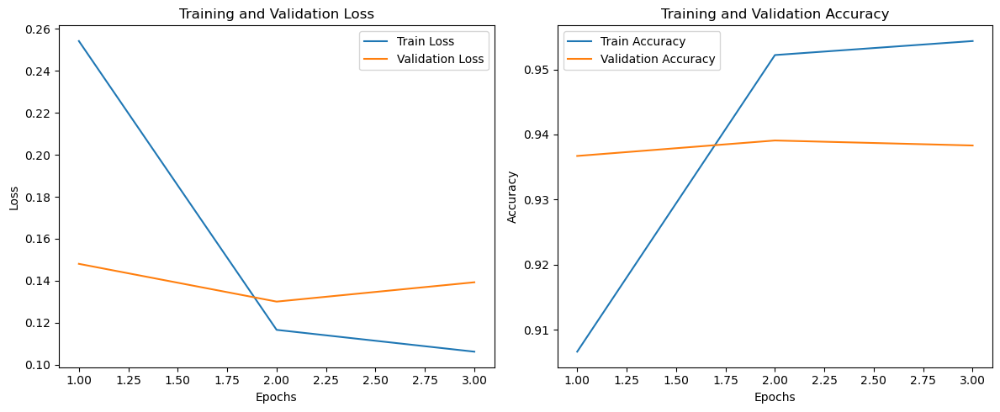

In [13]:
# Plotting training and validation loss
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(range(1, len(train_losses) + 1), train_losses, label='Train Loss')
plt.plot(range(1, len(valid_losses) + 1), valid_losses, label='Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Training and Validation Loss')

# Plotting training and validation accuracy
plt.subplot(1, 2, 2)
plt.plot(range(1, len(train_accuracies) + 1), train_accuracies, label='Train Accuracy')
plt.plot(range(1, len(valid_accuracies) + 1), valid_accuracies, label='Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Training and Validation Accuracy')

plt.tight_layout()
plt.show()

### 6.8 BERT-BILSTM

#### 1. Introduction
the BERT+BiLSTM model combines BERT with a BiLSTM. The approach involves adding a BiLSTM layer after the BERT encoding layer to obtain richer contextual representations. This model is proven to be outperform the BERT model in the question and answer task. According to this paper, https://www.researchgate.net/publication/355141954_A_Comparative_Study_of_Transformer-Based_Language_Models_on_Extractive_Question_Answering

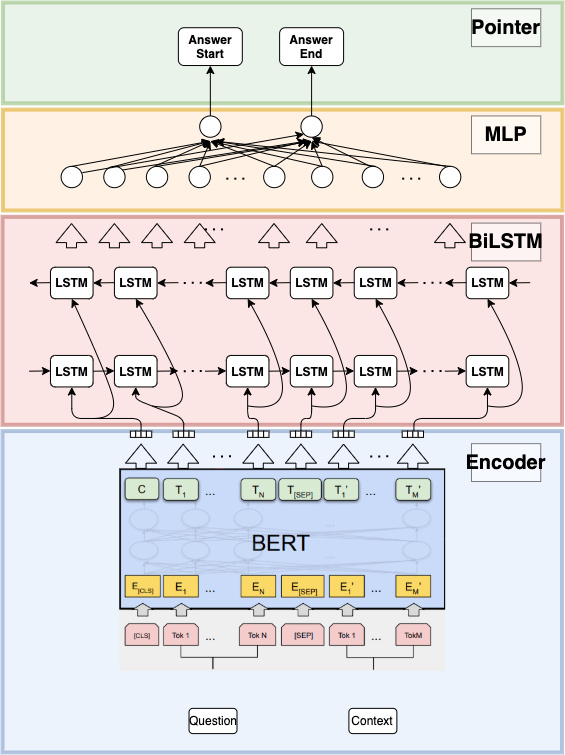

Picture from: https://www.researchgate.net/figure/BERT-BiLSTM-Model-Architecture_fig1_355141954
#### 2. Design and choose hyperparameters
The model consist of
- BERTBase model, which employs 12 layers of transformer blocks, a hidden size of 768, 12 self-attention heads, and approximately 110 million trainable parameters
- 2 BiLSTM layers with 768 embedding dimensions input and 128 dimensions output
- Dropout Layer (between 2 LSTM layers) with the dropout value of 0.8
- Dropout Layer (before the output layer) with the dropout value of 0.5
- Linear layer that has 128*2 input neurons and 6 output neurons
- Using Cross entropy as the criterion
- AdamW optimizer is used as the optimizer

Other hyperparameters:

Learning Rate is 2e-4

Number of Epochs are 10

In [14]:
# Load the pre-trained BERT model and tokenizer
tokenizer = AutoTokenizer.from_pretrained("bert-base-uncased")
bert_model = AutoModel.from_pretrained("bert-base-uncased").to(device)
bert_model.eval()  # Set BERT model to evaluation mode

class BERT_BiLSTM(nn.Module):
    def __init__(self, num_classes, hidden_dim=128, dropout=0.5):
        super(BERT_BiLSTM, self).__init__()
        self.bert = bert_model
        self.lstm = nn.LSTM(768, hidden_dim, num_layers=2, bidirectional=True, batch_first=True, dropout=0.8)
        self.dropout = nn.Dropout(dropout)
        self.fc = nn.Linear(hidden_dim * 2, num_classes)

    def forward(self, input_ids, attention_mask):
        with torch.no_grad():
            outputs = self.bert(input_ids=input_ids, attention_mask=attention_mask)
        last_hidden_state = outputs.last_hidden_state
        
        # Pass the last hidden state through the LSTM
        lstm_out, _ = self.lstm(last_hidden_state)
        
        # Apply dropout to the LSTM output
        lstm_out = self.dropout(lstm_out)
        
        # Get the last hidden state from the LSTM output
        lstm_out = lstm_out[:, -1, :]
        
        # Pass through the fully connected layer to get logits
        logits = self.fc(lstm_out)
        
        return logits

# Initialize the custom model
model5 = BERT_BiLSTM(num_classes=6).to(device)

#### 3. Create data loaders

In [15]:
# Define the custom dataset class
class EmotionDataset(Dataset):
    def __init__(self, texts, labels, tokenizer, max_length=35):
        self.texts = texts
        self.labels = labels
        self.tokenizer = tokenizer
        self.max_length = max_length

    def __len__(self):
        return len(self.texts)

    def __getitem__(self, idx):
        text = self.texts[idx]
        label = self.labels[idx]

        encoding = self.tokenizer(
            text,
            truncation=True,
            padding='max_length',
            max_length=self.max_length,
            return_tensors='pt'
        )

        return {
            'input_ids': encoding['input_ids'].flatten(),
            'attention_mask': encoding['attention_mask'].flatten(),
            'labels': torch.tensor(label, dtype=torch.long)
        }

# Create data loaders for the training, validation, and test sets
train_dataset = EmotionDataset(train_df['text'].to_list(), train_df['label'].to_list(), tokenizer)
validation_dataset = EmotionDataset(validation_df['text'].to_list(), validation_df['label'].to_list(), tokenizer)
test_dataset = EmotionDataset(test_df['text'].to_list(), test_df['label'].to_list(), tokenizer)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True)
validation_loader = DataLoader(validation_dataset, batch_size=32)
test_loader = DataLoader(test_dataset, batch_size=32)

#### 4.Training

In [31]:
# Function to evaluate the model
def evaluate_model(data_loader):
    model5.eval()
    predictions, true_labels = [], []
    total_loss = 0

    with torch.no_grad():
        for batch in data_loader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)

            outputs = model5(input_ids, attention_mask=attention_mask)
            logits = outputs
            loss = nn.CrossEntropyLoss()(logits, labels)  # Compute loss manually
            total_loss += loss.item()
            
            _, preds = torch.max(logits, dim=1)

            predictions.extend(preds.cpu().numpy())  # Move predictions to CPU and convert to numpy array
            true_labels.extend(labels.cpu().numpy())  # Move true labels to CPU and convert to numpy array

    avg_loss = total_loss / len(data_loader)
    return true_labels, predictions, avg_loss

# Function to calculate accuracy
def calculate_accuracy(predictions, labels):
    return accuracy_score(labels, predictions)

# Training the model
optimizer = AdamW(model5.parameters(), lr=2e-4) 

# Training
epochs = 10
best_valid_loss = float('inf')
valid_loss = 2
patience = 5
patience_counter = 0

# Lists to store loss and accuracy for each epoch
train_losses, valid_losses = [], []
train_accuracies, valid_accuracies = [], []

for epoch in range(epochs):
    model5.train()
    total_loss = 0
    correct_predictions = 0
    total_predictions = 0

    # Use tqdm to display a progress bar
    progress_bar = tqdm(train_loader, desc=f'Epoch {epoch+1}')
    
    for batch in train_loader:
        optimizer.zero_grad()

        input_ids = batch['input_ids'].to(device)
        attention_mask = batch['attention_mask'].to(device)
        labels = batch['labels'].to(device)

        outputs = model5(input_ids, attention_mask=attention_mask)

        loss = nn.CrossEntropyLoss()(outputs, labels)  # Compute loss manually
        total_loss += loss.item()

        loss.backward()
        optimizer.step()

        # Calculate accuracy
        logits = outputs
        _, preds = torch.max(logits, dim=1)
        correct_predictions += (preds == labels).sum().item()
        total_predictions += labels.size(0)

        # Update progress bar description
        progress_bar.set_postfix({'Batch Loss': loss.item(), 'Accuracy': correct_predictions / total_predictions})
        progress_bar.update(1)  # Update the progress bar
    
    train_accuracy = correct_predictions / total_predictions
    train_losses.append(total_loss / len(train_loader))
    train_accuracies.append(train_accuracy)

    print(f'Epoch {epoch+1}, Loss: {train_losses[-1]}, Accuracy: {train_accuracy}')
    progress_bar.close()  # Ensure the progress bar is closed when done
    
    if (epoch + 1) % 5 == 0:
        true_labels, predictions, valid_loss = evaluate_model(validation_loader)
        validation_accuracy = calculate_accuracy(predictions, true_labels)
        valid_losses.append(valid_loss)
        valid_accuracies.append(validation_accuracy)

        print(f'Validation Loss: {valid_loss}, Validation Accuracy: {validation_accuracy}')
        print(classification_report(true_labels, predictions))

    # Early stopping mechanism
    if valid_loss < best_valid_loss:
        best_valid_loss = valid_loss
        patience_counter = 0
        torch.save(model5.state_dict(), 'best_bert_bilstm_model_0.001.pth')  # Save the best model
    else:
        patience_counter += 1
        if patience_counter >= patience:
            print("Early stopping")
            break

C:\Users\chenxvda\anaconda3\Lib\site-packages\transformers\optimization.py:591: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
Epoch 1:   0%|          | 0/2237 [00:00<?, ?it/s]C:\Users\chenxvda\anaconda3\Lib\site-packages\transformers\models\bert\modeling_bert.py:439: UserWarning: 1Torch was not compiled with flash attention. (Triggered internally at C:\cb\pytorch_1000000000000\work\aten\src\ATen\native\transformers\cuda\sdp_utils.cpp:455.)
  attn_output = torch.nn.functional.scaled_dot_product_attention(
Epoch 1: 100%|██████████| 2237/2237 [02:05<00:00, 17.77it/s, Batch Loss=0.572, Accuracy=0.491]


Epoch 1, Loss: 1.2861193100362682, Accuracy: 0.4906390588761282


Epoch 2: 100%|██████████| 2237/2237 [02:00<00:00, 18.61it/s, Batch Loss=0.473, Accuracy=0.707]


Epoch 2, Loss: 0.8139699549348854, Accuracy: 0.70719814457764


Epoch 3: 100%|██████████| 2237/2237 [01:59<00:00, 18.72it/s, Batch Loss=0.396, Accuracy=0.789]


Epoch 3, Loss: 0.5989527547258215, Accuracy: 0.7888618772179842


Epoch 4: 100%|██████████| 2237/2237 [01:59<00:00, 18.75it/s, Batch Loss=0.713, Accuracy=0.828]


Epoch 4, Loss: 0.488348410932358, Accuracy: 0.8278564841981725


Epoch 5: 100%|██████████| 2237/2237 [01:59<00:00, 18.66it/s, Batch Loss=0.641, Accuracy=0.851]


Epoch 5, Loss: 0.41978712240379734, Accuracy: 0.850518344650292
Validation Loss: 0.5548102582360998, Validation Accuracy: 0.8084498932367266
              precision    recall  f1-score   support

           0       0.91      0.80      0.85     12307
           1       0.94      0.76      0.84     13984
           2       0.60      0.87      0.71      3440
           3       0.71      0.88      0.78      5658
           4       0.79      0.78      0.79      4775
           5       0.52      0.96      0.67      1517

    accuracy                           0.81     41681
   macro avg       0.75      0.84      0.78     41681
weighted avg       0.84      0.81      0.81     41681



Epoch 6: 100%|██████████| 2237/2237 [01:58<00:00, 18.83it/s, Batch Loss=0.449, Accuracy=0.867] 


Epoch 6, Loss: 0.37371055655277996, Accuracy: 0.8666415178696174


Epoch 7: 100%|██████████| 2237/2237 [01:58<00:00, 18.87it/s, Batch Loss=0.309, Accuracy=0.877] 


Epoch 7, Loss: 0.33929795922214395, Accuracy: 0.8771620979685361


Epoch 8: 100%|██████████| 2237/2237 [02:00<00:00, 18.58it/s, Batch Loss=0.305, Accuracy=0.884] 


Epoch 8, Loss: 0.3162991532229077, Accuracy: 0.8841199318188169


Epoch 9: 100%|██████████| 2237/2237 [01:58<00:00, 18.81it/s, Batch Loss=0.31, Accuracy=0.89]   


Epoch 9, Loss: 0.2993998753925253, Accuracy: 0.8903652164193702


Epoch 10: 100%|██████████| 2237/2237 [01:58<00:00, 18.86it/s, Batch Loss=0.247, Accuracy=0.896] 


Epoch 10, Loss: 0.27751388627358003, Accuracy: 0.8964707854807612
Validation Loss: 0.40553007358921006, Validation Accuracy: 0.8578728917252465
              precision    recall  f1-score   support

           0       0.92      0.88      0.90     12307
           1       0.95      0.81      0.88     13984
           2       0.65      0.92      0.76      3440
           3       0.83      0.88      0.85      5658
           4       0.85      0.81      0.83      4775
           5       0.59      0.97      0.74      1517

    accuracy                           0.86     41681
   macro avg       0.80      0.88      0.83     41681
weighted avg       0.88      0.86      0.86     41681



# 7. Results
For each model, we present the results on the test dataset, including the classification report, confusion matrix, and the total F1-score accuracy to six decimal places.

*Why compare F1-score? Because the F1-score provides a single metric that incorporates both precision and recall, allowing for a more comprehensive evaluation of model performance than using accuracy alone.* 

Additionally, we use our models to predict some specific sentences to evaluate their performance, particularly those sentences containing the word "feel" and those without "feel".

*Why do we conduct the additional test? Because the word 'feel' appears in 99% of the sentences in the dataset, some models may overly rely on this word for making predictions. In contrast, other words like 'become' occur very infrequently in the dataset, with only 0.6% occurrence:*

In [5]:
keywords = ['feel', 'become']
for keyword in keywords:
    count = count_keyword_occurrences(train_df, keyword)
    print(f"'{keyword}' appears in {count} out of {len(train_df['text'])} sentences.")

'feel' appears in 329283 out of 333447 sentences.
'become' appears in 2038 out of 333447 sentences.


### 7.1 Naïve Bayes

#### 1. Results on the test dataset
Naïve Bayes performed poorly on the test dataset, with a total F1-score of only 0.469762. It performed best in predicting "surprise" (F1-score = 0.60), while its performance was worst in predicting "joy" and "love" (F1-scores of 0.39 and 0.33, respectively).

naive bayes precision: 
               precision    recall  f1-score   support

           0       0.40      0.52      0.46      1526
           1       0.53      0.31      0.39      1526
           2       0.34      0.33      0.33      1526
           3       0.54      0.50      0.52      1526
           4       0.44      0.63      0.52      1526
           5       0.68      0.54      0.60      1526

    accuracy                           0.47      9156
   macro avg       0.49      0.47      0.47      9156
weighted avg       0.49      0.47      0.47      9156



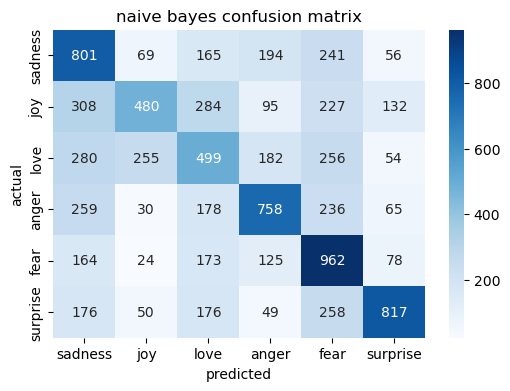

Total F1-score: 0.469762


In [44]:
# evaluation for gaussian naive bayes
print("naive bayes precision: \n", classification_report(y_test_nb, nb_predicted_labels))

nb_conf = confusion_matrix(y_test_nb, nb_predicted_labels)

label_name = ['sadness', 'joy', 'love', 'anger', 'fear', 'surprise']
plt.figure(figsize=(6, 4))

# plot confusion matrix as a graph for gaussian naive bayes
sns.heatmap(nb_conf, annot=True, fmt='d', cmap='Blues', xticklabels=label_names, yticklabels=label_names)
plt.xlabel('predicted')
plt.ylabel('actual')
plt.title('naive bayes confusion matrix')
plt.show()

# Calculate total F1-score
total_f1_score = f1_score(y_test_nb, nb_predicted_labels, average='weighted')
print(f"Total F1-score: {total_f1_score:.6f}")

#### 2. Result on some specific sentences
Naïve Bayes performed poorly in predicting these specific sentences, it even can not correctly predict some emotions, regardless of whether the sentences contained the word "feel" or not.

In [100]:
# Use the model to predict some specific sentences
def predict_emotion(text):
    # Temporarily redirect stdout to suppress print statements
    with io.StringIO() as buf, contextlib.redirect_stdout(buf):
        text = clean_text(text)
    
    # Preprocess the text
    tokens = text.split()
    tokens = tokens[:35] + ['<PAD>'] * (35 - len(tokens))
    vectors = []
    for token in tokens:
        if token in word2vec:
            vectors.append(word2vec[token])
        else:
            vectors.append(np.zeros(embedding_dim))
    
    # Convert list to numpy array
    vectors = np.array(vectors)
    
    # Compute the average vector for the text
    average_vector = np.mean(vectors, axis=0).reshape(1, -1)
    
    # Standardize the feature
    average_vector_scaled = scaler.transform(average_vector)
    
    # Reduce dimensionality
    average_vector_pca = pca.transform(average_vector_scaled)
    
    # Make prediction
    predicted_proba = nb_model.predict_proba(average_vector_pca)[0]
    predicted_label = np.argmax(predicted_proba)
    
    # Create a dictionary to map numeric labels to emotions
    label_to_emotion = {0: 'sadness', 1: 'joy', 2: 'love', 3: 'anger', 4: 'fear', 5: 'surprise'}
    
    # Convert numeric label to emotion
    predicted_emotion = label_to_emotion[predicted_label]

    # Print prediction and probabilities
    print(f"The predicted emotion is: {predicted_emotion}")
    
    # Print the probability of each emotion
    for idx, prob in enumerate(predicted_proba):
        emotion = label_to_emotion[idx]
        print(f"Probability of {emotion}: {prob:.4f}")

# Example calls
print('input: I become happy.')
predict_emotion("I become happy.")
print('input: I feel happy.')
predict_emotion("I feel happy.")
print('input: I become sad.')
predict_emotion("I become sad.")
print('input: I feel sad.')
predict_emotion("I feel sad.")
print('input: I become surprised.')
predict_emotion("I become surprised.")
print('input: I feel surprised.')
predict_emotion("I feel surprised.")
print('input: I become angry.')
predict_emotion("I become angry.")
print('input: I feel angry.')
predict_emotion("I feel angry.")
print('input: I become scared.')
predict_emotion("I become scared.")
print('input: I feel scared.')
predict_emotion("I feel scared.")
print('input: I become sweet.')
predict_emotion("I become sweet.")
print('input: I feel sweet.')
predict_emotion("I feel sweet.")


input: I become happy.
The predicted emotion is: anger
Probability of sadness: 0.2335
Probability of joy: 0.2390
Probability of love: 0.0085
Probability of anger: 0.2946
Probability of fear: 0.1677
Probability of surprise: 0.0567
input: I feel happy.
The predicted emotion is: fear
Probability of sadness: 0.2580
Probability of joy: 0.2107
Probability of love: 0.0052
Probability of anger: 0.1863
Probability of fear: 0.2648
Probability of surprise: 0.0751
input: I become sad.
The predicted emotion is: sadness
Probability of sadness: 0.5571
Probability of joy: 0.0741
Probability of love: 0.0063
Probability of anger: 0.2239
Probability of fear: 0.0836
Probability of surprise: 0.0550
input: I feel sad.
The predicted emotion is: sadness
Probability of sadness: 0.6079
Probability of joy: 0.0558
Probability of love: 0.0033
Probability of anger: 0.1263
Probability of fear: 0.1339
Probability of surprise: 0.0727
input: I become surprised.
The predicted emotion is: surprise
Probability of sadness:

### 7.2 Logistic Regression

#### 1. Results on the test dataset
Logistic Regression performed poorly on the test dataset, with a total F1-score of only 0.554467. It performed best in predicting "surprise" (F1-score = 0.64), while its F1-score for predicting other emotions was all below 0.6.

Test Set Performance:
              precision    recall  f1-score   support

           0       0.58      0.47      0.52      1526
           1       0.52      0.49      0.51      1526
           2       0.48      0.63      0.54      1526
           3       0.60      0.51      0.55      1526
           4       0.55      0.59      0.57      1526
           5       0.64      0.65      0.64      1526

    accuracy                           0.56      9156
   macro avg       0.56      0.56      0.55      9156
weighted avg       0.56      0.56      0.55      9156



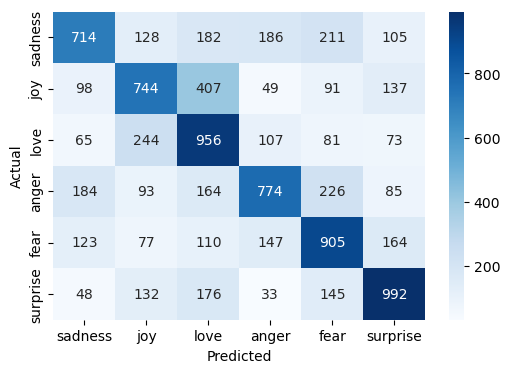

Total F1-score: 0.554467


In [79]:
# Create an instance of the model
logist_model = LogisticRegression(embedding_dim * 35, num_classes)

# Load the saved state dictionary into the model
logist_model.load_state_dict(torch.load('Logist_model.pth'))

# Move model to device
logist_model.to(device)

# Evaluate the model on the test set
all_preds = []
all_labels = []

with torch.no_grad():
    for texts, labels in test_loader:
        texts = texts.view(texts.size(0), -1)  # Flatten the word embeddings
        texts, labels = texts.to(device), labels.to(device)
        outputs = logist_model(texts)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Classification report
report = classification_report(all_labels, all_preds, target_names=[str(i) for i in range(6)])
print("Test Set Performance:")
print(report)

conf = confusion_matrix(all_labels, all_preds)

label_name = ['sadness', 'joy', 'love', 'anger', 'fear', 'surprise']
plt.figure(figsize=(6, 4))

# Plot confusion matrix as a graph
sns.heatmap(conf, annot=True, fmt='d', cmap='Blues', xticklabels=label_names, yticklabels=label_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Calculate total F1-score
total_f1_score = f1_score(all_labels, all_preds, average='weighted')
print(f"Total F1-score: {total_f1_score:.6f}")

#### 2. Result on some specific sentences
Logistic Regression can correctly predict the emotions of these specific sentences, but the predicting probability of the correct emotion is very close to the probabilities of other emotions, indicating that the prediction performance is not very good, regardless of whether the sentence contains the word "feel" or not.

In [86]:
# Use the model to predict some specific sentences
def predict_emotion(Text):
    # Temporarily redirect stdout to suppress print statements
    with io.StringIO() as buf, contextlib.redirect_stdout(buf):
        text = clean_text(Text)
    
    # Preprocess the text
    tokens = text.split()
    tokens = tokens[:35] + ['<PAD>'] * (35 - len(tokens))
    vectors = []
    for token in tokens:
        if token in word2vec:
            vectors.append(word2vec[token])
        else:
            vectors.append(np.zeros(embedding_dim))

    # Convert to tensor and add batch dimension
    input_tensor = torch.tensor([vectors], dtype=torch.float32).to(device)

    input_tensor = input_tensor.view(input_tensor.size(0), -1)
    
    # Make prediction
    outputs = logist_model(input_tensor)

    # Compute softmax to get the probability of each emotion
    probabilities = F.softmax(outputs, dim=1)  # dim=1 specifies to compute softmax along the class dimension
    _, preds = torch.max(probabilities, 1)

    # Create a dictionary to map numeric labels to emotions
    label_to_emotion = {0: 'sadness', 1: 'joy', 2: 'love', 3: 'anger', 4: 'fear', 5: 'surprise'}

    # Convert numeric label to emotion
    predicted_emotion = label_to_emotion[preds.item()]

    # Print prediction and probabilities
    print(f"The predicted emotion is: {predicted_emotion}")
    
    # Print the probability of each emotion
    for idx, prob in enumerate(probabilities[0]):
        emotion = label_to_emotion[idx]
        print(f"Probability of {emotion}: {prob.item():.4f}")

# Example calls
print('input: I become happy.')
predict_emotion("I become happy.")
print('input: I feel happy.')
predict_emotion("I feel happy.")
print('input: I become sad.')
predict_emotion("I become sad.")
print('input: I feel sad.')
predict_emotion("I feel sad.")
print('input: I become surprised.')
predict_emotion("I become surprised.")
print('input: I feel surprised.')
predict_emotion("I feel surprised.")
print('input: I become angry.')
predict_emotion("I become angry.")
print('input: I feel angry.')
predict_emotion("I feel angry.")
print('input: I become scared.')
predict_emotion("I become scared.")
print('input: I feel scared.')
predict_emotion("I feel scared.")
print('input: I become sweet.')
predict_emotion("I become sweet.")
print('input: I feel sweet.')
predict_emotion("I feel sweet.")

input: I become happy.
The predicted emotion is: joy
Probability of sadness: 0.1593
Probability of joy: 0.1921
Probability of love: 0.1600
Probability of anger: 0.1577
Probability of fear: 0.1616
Probability of surprise: 0.1691
input: I feel happy.
The predicted emotion is: joy
Probability of sadness: 0.1622
Probability of joy: 0.2086
Probability of love: 0.1647
Probability of anger: 0.1534
Probability of fear: 0.1510
Probability of surprise: 0.1601
input: I become sad.
The predicted emotion is: sadness
Probability of sadness: 0.1944
Probability of joy: 0.1550
Probability of love: 0.1544
Probability of anger: 0.1635
Probability of fear: 0.1579
Probability of surprise: 0.1748
input: I feel sad.
The predicted emotion is: sadness
Probability of sadness: 0.1983
Probability of joy: 0.1695
Probability of love: 0.1592
Probability of anger: 0.1592
Probability of fear: 0.1481
Probability of surprise: 0.1657
input: I become surprised.
The predicted emotion is: surprise
Probability of sadness: 0.

### 7.3 LSTM

#### 1. Results on the test dataset
LSTM performed excellently on the test dataset with a total F1-score of 0.945445. 

Most of the incorrect predictions involved mistaking "love" for "joy" and "surprise" for "fear," likely because sentences expressing these emotions have overlapping features.

Test Set Performance:
              precision    recall  f1-score   support

           0       0.99      0.94      0.96      1526
           1       0.98      0.89      0.94      1526
           2       0.92      0.98      0.95      1526
           3       0.94      0.94      0.94      1526
           4       0.93      0.91      0.92      1526
           5       0.92      1.00      0.96      1526

    accuracy                           0.95      9156
   macro avg       0.95      0.95      0.95      9156
weighted avg       0.95      0.95      0.95      9156



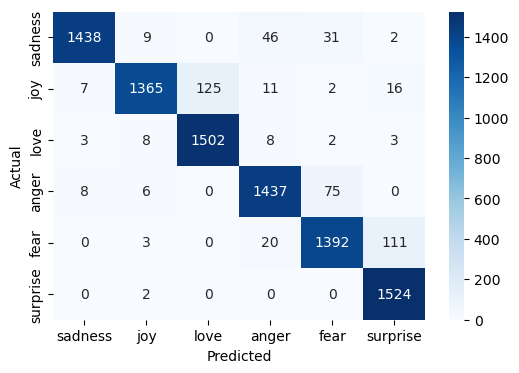

Total F1-score: 0.945445


In [105]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model1 = LSTMModel(embedding_dim, hidden_dim, output_dim, num_layers, dropout)

# Load the model
model_path = 'LSTM_model.pth'
model1.load_state_dict(torch.load(model_path, map_location=device))
model1.to(device)
model1.eval()

# Evaluate the model on the test set
all_preds = []
all_labels = []

with torch.no_grad():
    for texts, labels in test_loader:
        texts, labels = texts.to(device), labels.to(device)
        outputs = model1(texts)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Classification report
report = classification_report(all_labels, all_preds, target_names=[str(i) for i in range(output_dim)])
print("Test Set Performance:")
print(report)

conf = confusion_matrix(all_labels, all_preds)

label_name = ['sadness', 'joy', 'love', 'anger', 'fear', 'surprise']
plt.figure(figsize=(6, 4))

# Plot confusion matrix as a graph
sns.heatmap(conf, annot=True, fmt='d', cmap='Blues', xticklabels=label_names, yticklabels=label_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Calculate total F1-score
total_f1_score = f1_score(all_labels, all_preds, average='weighted')
print(f"Total F1-score: {total_f1_score:.6f}")

#### 2. Result on some specific sentences
LSTM accurately predicted the emotions of all the example sentences. When the sentences contained 'feel,' the predicting probability of the correct emotion was very high, exceeding 0.99. However, when the sentences did not contain 'feel,' the predicting probability of the correct emotion was much lower. This indicates that the model has become dependent on the word 'feel' to predict emotions.

In [106]:
# Use the model to predict some specific sentences
def predict_emotion(text):
    # Temporarily redirect stdout to suppress print statements
    with io.StringIO() as buf, contextlib.redirect_stdout(buf):
        text = clean_text(text)

    # Preprocess the text
    tokens = text.split()
    tokens = tokens[:35] + ['<PAD>'] * (35 - len(tokens))  # Pad or truncate tokens to a fixed length of 35
    vectors = []
    for token in tokens:
        if token in word2vec:
            vectors.append(word2vec[token])  # Use word vector if token exists in the word2vec model
        else:
            vectors.append(np.zeros(embedding_dim))  # Use zero vector for unknown tokens

    # Convert to tensor and add batch dimension
    input_tensor = torch.tensor([vectors], dtype=torch.float32).to(device)

    # Make prediction
    outputs = model1(input_tensor)

    # Compute softmax to get the probability of each emotion
    probabilities = F.softmax(outputs, dim=1)  # Apply softmax along the class dimension
    _, preds = torch.max(probabilities, 1)  # Get the index of the max probability

    # Create a dictionary to map numeric labels to emotions
    label_to_emotion = {0: 'sadness', 1: 'joy', 2: 'love', 3: 'anger', 4: 'fear', 5: 'surprise'}

    # Convert numeric label to emotion
    predicted_emotion = label_to_emotion[preds.item()]

    # Print prediction and probabilities
    print(f"The predicted emotion is: {predicted_emotion}")
    
    # Print the probability of each emotion
    for idx, prob in enumerate(probabilities[0]):
        emotion = label_to_emotion[idx]
        print(f"Probability of {emotion}: {prob.item():.4f}")

# Example calls
print('input: I become happy.')
predict_emotion("I become happy.")
print('input: I feel happy.')
predict_emotion("I feel happy.")
print('input: I become sad.')
predict_emotion("I become sad.")
print('input: I feel sad.')
predict_emotion("I feel sad.")
print('input: I become surprised.')
predict_emotion("I become surprised.")
print('input: I feel surprised.')
predict_emotion("I feel surprised.")
print('input: I become angry.')
predict_emotion("I become angry.")
print('input: I feel angry.')
predict_emotion("I feel angry.")
print('input: I become scared.')
predict_emotion("I become scared.")
print('input: I feel scared.')
predict_emotion("I feel scared.")
print('input: I become sweet.')
predict_emotion("I become sweet.")
print('input: I feel sweet.')
predict_emotion("I feel sweet.")


input: I become happy.
The predicted emotion is: joy
Probability of sadness: 0.0295
Probability of joy: 0.7587
Probability of love: 0.0091
Probability of anger: 0.1130
Probability of fear: 0.0865
Probability of surprise: 0.0032
input: I feel happy.
The predicted emotion is: joy
Probability of sadness: 0.0001
Probability of joy: 0.9995
Probability of love: 0.0001
Probability of anger: 0.0001
Probability of fear: 0.0002
Probability of surprise: 0.0000
input: I become sad.
The predicted emotion is: joy
Probability of sadness: 0.2133
Probability of joy: 0.3477
Probability of love: 0.0241
Probability of anger: 0.2562
Probability of fear: 0.1535
Probability of surprise: 0.0052
input: I feel sad.
The predicted emotion is: sadness
Probability of sadness: 0.9986
Probability of joy: 0.0005
Probability of love: 0.0001
Probability of anger: 0.0004
Probability of fear: 0.0005
Probability of surprise: 0.0000
input: I become surprised.
The predicted emotion is: surprise
Probability of sadness: 0.0001

### 7.4 BI-LSTM

#### 1. Results on the test dataset
BI-LSTM performed excellently on the test dataset with a total F1-score of 0.949698, , which is higher than LSTM. This suggests that the bidirectional mechanism aids the model in better capturing context from both past and future information, thereby enhancing its performance in emotion prediction. 

Most of the incorrect predictions involved mistaking "love" for "joy" and "surprise" for "fear," likely because sentences expressing these emotions have overlapping features.

Test Set Performance:
              precision    recall  f1-score   support

           0       0.98      0.95      0.97      1526
           1       0.99      0.91      0.94      1526
           2       0.93      0.99      0.96      1526
           3       0.94      0.96      0.95      1526
           4       0.95      0.89      0.92      1526
           5       0.92      1.00      0.96      1526

    accuracy                           0.95      9156
   macro avg       0.95      0.95      0.95      9156
weighted avg       0.95      0.95      0.95      9156



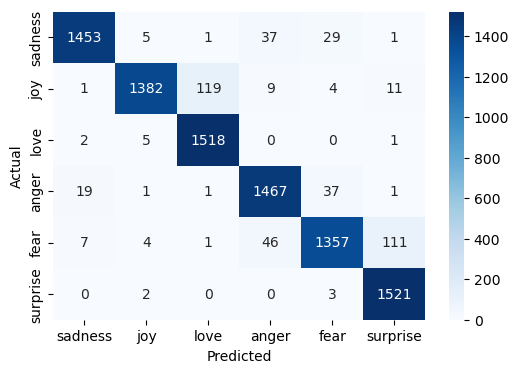

Total F1-score: 0.949698


In [109]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the model
model_path = 'BILSTM_model.pth'
model2.load_state_dict(torch.load(model_path, map_location=device))
model2.to(device)
model2.eval()

# Evaluate the model on the test set
all_preds = []
all_labels = []

with torch.no_grad():
    for texts, labels in test_loader:
        texts, labels = texts.to(device), labels.to(device)
        outputs = model2(texts)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Classification report
report = classification_report(all_labels, all_preds, target_names=[str(i) for i in range(output_dim)])
print("Test Set Performance:")
print(report)

conf = confusion_matrix(all_labels, all_preds)

label_name = ['sadness', 'joy', 'love', 'anger', 'fear', 'surprise']
plt.figure(figsize=(6, 4))

# Plot confusion matrix as a graph
sns.heatmap(conf, annot=True, fmt='d', cmap='Blues', xticklabels=label_names, yticklabels=label_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Calculate total F1-score
total_f1_score = f1_score(all_labels, all_preds, average='weighted')
print(f"Total F1-score: {total_f1_score:.6f}")

#### 2. Result on some specific sentences
BI-LSTM accurately predicted the emotions of all the example sentences. When the sentences contained 'feel,' the predicting probability of the correct emotion was very high, exceeding 0.99. However, when the sentences did not contain 'feel,' the predicting probability of the correct emotion was much lower, even lower than LSTM. This indicates that the bidirectional mechanism make the model to become more dependent on the word 'feel' to predict emotions.

In [110]:
# Use the model to predict some specific sentences
def predict_emotion(text):
    # Temporarily redirect stdout to suppress print statements
    with io.StringIO() as buf, contextlib.redirect_stdout(buf):
        text = clean_text(text)

    # Preprocess the text
    tokens = text.split()
    tokens = tokens[:35] + ['<PAD>'] * (35 - len(tokens))  # Pad or truncate tokens to a fixed length of 35
    vectors = []
    for token in tokens:
        if token in word2vec:
            vectors.append(word2vec[token])  # Use word vector if token exists in the word2vec model
        else:
            vectors.append(np.zeros(embedding_dim))  # Use zero vector for unknown tokens

    # Convert to tensor and add batch dimension
    input_tensor = torch.tensor([vectors], dtype=torch.float32).to(device)

    # Make prediction
    outputs = model2(input_tensor)

    # Compute softmax to get the probability of each emotion
    probabilities = F.softmax(outputs, dim=1)  # Apply softmax along the class dimension
    _, preds = torch.max(probabilities, 1)  # Get the index of the max probability

    # Create a dictionary to map numeric labels to emotions
    label_to_emotion = {0: 'sadness', 1: 'joy', 2: 'love', 3: 'anger', 4: 'fear', 5: 'surprise'}

    # Convert numeric label to emotion
    predicted_emotion = label_to_emotion[preds.item()]

    # Print prediction and probabilities
    print(f"The predicted emotion is: {predicted_emotion}")
    
    # Print the probability of each emotion
    for idx, prob in enumerate(probabilities[0]):
        emotion = label_to_emotion[idx]
        print(f"Probability of {emotion}: {prob.item():.4f}")

# Example calls
print('input: I become happy.')
predict_emotion("I become happy.")
print('input: I feel happy.')
predict_emotion("I feel happy.")
print('input: I become sad.')
predict_emotion("I become sad.")
print('input: I feel sad.')
predict_emotion("I feel sad.")
print('input: I become surprised.')
predict_emotion("I become surprised.")
print('input: I feel surprised.')
predict_emotion("I feel surprised.")
print('input: I become angry.')
predict_emotion("I become angry.")
print('input: I feel angry.')
predict_emotion("I feel angry.")
print('input: I become scared.')
predict_emotion("I become scared.")
print('input: I feel scared.')
predict_emotion("I feel scared.")
print('input: I become sweet.')
predict_emotion("I become sweet.")
print('input: I feel sweet.')
predict_emotion("I feel sweet.")

input: I become happy.
The predicted emotion is: joy
Probability of sadness: 0.0832
Probability of joy: 0.4296
Probability of love: 0.0508
Probability of anger: 0.3493
Probability of fear: 0.0781
Probability of surprise: 0.0089
input: I feel happy.
The predicted emotion is: joy
Probability of sadness: 0.0000
Probability of joy: 0.9996
Probability of love: 0.0001
Probability of anger: 0.0002
Probability of fear: 0.0001
Probability of surprise: 0.0000
input: I become sad.
The predicted emotion is: sadness
Probability of sadness: 0.7033
Probability of joy: 0.0458
Probability of love: 0.0038
Probability of anger: 0.1650
Probability of fear: 0.0808
Probability of surprise: 0.0013
input: I feel sad.
The predicted emotion is: sadness
Probability of sadness: 0.9999
Probability of joy: 0.0001
Probability of love: 0.0000
Probability of anger: 0.0000
Probability of fear: 0.0000
Probability of surprise: 0.0000
input: I become surprised.
The predicted emotion is: surprise
Probability of sadness: 0.

### 7.5 GRU

#### 1. Results on the test dataset
GRU performed excellently on the test dataset with a total F1-score of 0.946493. 

Most of the incorrect predictions involved mistaking "love" for "joy" and "surprise" for "fear," likely because sentences expressing these emotions have overlapping features.

Test Set Performance:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      1526
           1       0.99      0.90      0.94      1526
           2       0.93      0.99      0.96      1526
           3       0.98      0.91      0.95      1526
           4       0.91      0.91      0.91      1526
           5       0.93      1.00      0.96      1526

    accuracy                           0.95      9156
   macro avg       0.95      0.95      0.95      9156
weighted avg       0.95      0.95      0.95      9156

Confusion Matrix: 
 [[1468    1    0   23   33    1]
 [   5 1377  120    4    9   11]
 [   1    7 1517    0    1    0]
 [  42    1    0 1395   88    0]
 [  20    4    0    3 1390  109]
 [   0    4    0    0    1 1521]]


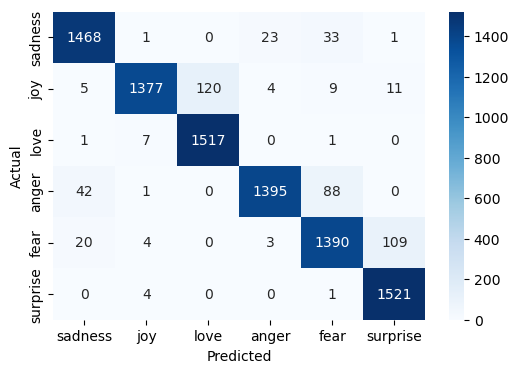

Total F1-score: 0.946493


In [113]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the model
model_path = 'UNIGRU_model.pth'
model3.load_state_dict(torch.load(model_path, map_location=device))
model3.to(device)
model3.eval()

# Evaluate the model on the test set
all_preds = []
all_labels = []

with torch.no_grad():
    for texts, labels in test_loader:
        texts, labels = texts.to(device), labels.to(device)
        outputs = model3(texts)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Classification report
report = classification_report(all_labels, all_preds, target_names=[str(i) for i in range(output_dim)])
print("Test Set Performance:")
print(report)

conf = confusion_matrix(all_labels, all_preds)

label_name = ['sadness', 'joy', 'love', 'anger', 'fear', 'surprise']
plt.figure(figsize=(6, 4))

# Plot confusion matrix as a graph
sns.heatmap(conf, annot=True, fmt='d', cmap='Blues', xticklabels=label_names, yticklabels=label_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Calculate total F1-score
total_f1_score = f1_score(all_labels, all_preds, average='weighted')
print(f"Total F1-score: {total_f1_score:.6f}")

#### 2. Result on some specific sentences
GRU accurately predicted the emotions of all the example sentences. When the sentences contained 'feel,' the predicting probability of the correct emotion was very high, exceeding 0.99. However, when the sentences did not contain 'feel,' the predicting probability of the correct emotion was much lower. This indicates that the model has become dependent on the word 'feel' to predict emotions.

In [114]:
# Use the model to predict some specific sentences
def predict_emotion(text):
    # Temporarily redirect stdout to suppress print statements
    with io.StringIO() as buf, contextlib.redirect_stdout(buf):
        text = clean_text(text)

    # Preprocess the text
    tokens = text.split()
    tokens = tokens[:35] + ['<PAD>'] * (35 - len(tokens))  # Pad or truncate tokens to a fixed length of 35
    vectors = []
    for token in tokens:
        if token in word2vec:
            vectors.append(word2vec[token])  # Use word vector if token exists in the word2vec model
        else:
            vectors.append(np.zeros(embedding_dim))  # Use zero vector for unknown tokens

    # Convert to tensor and add batch dimension
    input_tensor = torch.tensor([vectors], dtype=torch.float32).to(device)

    # Make prediction
    outputs = model3(input_tensor)

    # Compute softmax to get the probability of each emotion
    probabilities = F.softmax(outputs, dim=1)  # Apply softmax along the class dimension
    _, preds = torch.max(probabilities, 1)  # Get the index of the max probability

    # Create a dictionary to map numeric labels to emotions
    label_to_emotion = {0: 'sadness', 1: 'joy', 2: 'love', 3: 'anger', 4: 'fear', 5: 'surprise'}

    # Convert numeric label to emotion
    predicted_emotion = label_to_emotion[preds.item()]

    # Print prediction and probabilities
    print(f"The predicted emotion is: {predicted_emotion}")
    
    # Print the probability of each emotion
    for idx, prob in enumerate(probabilities[0]):
        emotion = label_to_emotion[idx]
        print(f"Probability of {emotion}: {prob.item():.4f}")

# Example calls
print('input: I become happy.')
predict_emotion("I become happy.")
print('input: I feel happy.')
predict_emotion("I feel happy.")
print('input: I become sad.')
predict_emotion("I become sad.")
print('input: I feel sad.')
predict_emotion("I feel sad.")
print('input: I become surprised.')
predict_emotion("I become surprised.")
print('input: I feel surprised.')
predict_emotion("I feel surprised.")
print('input: I become angry.')
predict_emotion("I become angry.")
print('input: I feel angry.')
predict_emotion("I feel angry.")
print('input: I become scared.')
predict_emotion("I become scared.")
print('input: I feel scared.')
predict_emotion("I feel scared.")
print('input: I become sweet.')
predict_emotion("I become sweet.")
print('input: I feel sweet.')
predict_emotion("I feel sweet.")

input: I become happy.
The predicted emotion is: fear
Probability of sadness: 0.1948
Probability of joy: 0.2117
Probability of love: 0.0242
Probability of anger: 0.1493
Probability of fear: 0.3988
Probability of surprise: 0.0212
input: I feel happy.
The predicted emotion is: joy
Probability of sadness: 0.0001
Probability of joy: 0.9991
Probability of love: 0.0007
Probability of anger: 0.0000
Probability of fear: 0.0000
Probability of surprise: 0.0001
input: I become sad.
The predicted emotion is: sadness
Probability of sadness: 0.3361
Probability of joy: 0.2203
Probability of love: 0.0240
Probability of anger: 0.1861
Probability of fear: 0.2225
Probability of surprise: 0.0112
input: I feel sad.
The predicted emotion is: sadness
Probability of sadness: 0.9999
Probability of joy: 0.0000
Probability of love: 0.0000
Probability of anger: 0.0000
Probability of fear: 0.0001
Probability of surprise: 0.0000
input: I become surprised.
The predicted emotion is: surprise
Probability of sadness: 0

### 7.6 BI-GRU

#### 1. Results on the test dataset
BI-GRU performed excellently on the test dataset with a total F1-score of 0.947304, which is higher than GRU. This suggests that the bidirectional mechanism aids the model in better capturing context from both past and future information, thereby enhancing its performance in emotion prediction. 

Most of the incorrect predictions involved mistaking "love" for "joy" and "surprise" for "fear," likely because sentences expressing these emotions have overlapping features.

Test Set Performance:
              precision    recall  f1-score   support

           0       0.96      0.96      0.96      1526
           1       0.99      0.90      0.94      1526
           2       0.93      1.00      0.96      1526
           3       0.95      0.94      0.94      1526
           4       0.94      0.90      0.92      1526
           5       0.93      0.99      0.96      1526

    accuracy                           0.95      9156
   macro avg       0.95      0.95      0.95      9156
weighted avg       0.95      0.95      0.95      9156



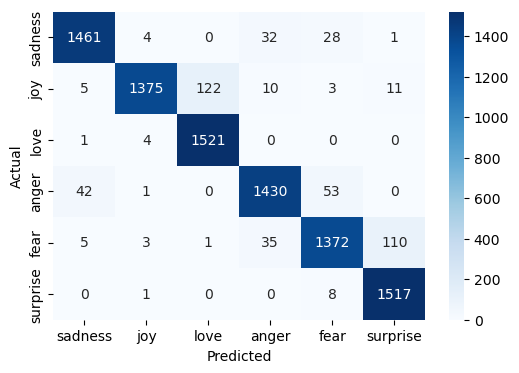

Total F1-score: 0.947304


In [118]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# Load the model
model_path = 'BiGRU_model.pth'
model4.load_state_dict(torch.load(model_path, map_location=device))
model4.to(device)
model4.eval()

# Evaluate the model on the test set
all_preds = []
all_labels = []

with torch.no_grad():
    for texts, labels in test_loader:
        texts, labels = texts.to(device), labels.to(device)
        outputs = model4(texts)
        _, preds = torch.max(outputs, 1)
        all_preds.extend(preds.cpu().numpy())
        all_labels.extend(labels.cpu().numpy())

# Classification report
report = classification_report(all_labels, all_preds, target_names=[str(i) for i in range(output_dim)])
print("Test Set Performance:")
print(report)

conf = confusion_matrix(all_labels, all_preds)

label_name = ['sadness', 'joy', 'love', 'anger', 'fear', 'surprise']
plt.figure(figsize=(6, 4))

# Plot confusion matrix as a graph
sns.heatmap(conf, annot=True, fmt='d', cmap='Blues', xticklabels=label_names, yticklabels=label_names)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.show()

# Calculate total F1-score
total_f1_score = f1_score(all_labels, all_preds, average='weighted')
print(f"Total F1-score: {total_f1_score:.6f}")

#### 2. Result on some specific sentences
When the sentences contained 'feel,' the predicting probability of the correct emotion was very high, exceeding 0.99. However, when the sentences did not contain 'feel,' the predicting probability of the correct emotion was much lower. This indicates that the BI-GRU model has become dependent on the word 'feel' to predict emotions.

In [119]:
# Use the model to predict some specific sentences
def predict_emotion(text):
    # Temporarily redirect stdout to suppress print statements
    with io.StringIO() as buf, contextlib.redirect_stdout(buf):
        text = clean_text(text)

    # Preprocess the text
    tokens = text.split()
    tokens = tokens[:35] + ['<PAD>'] * (35 - len(tokens))  # Pad or truncate tokens to a fixed length of 35
    vectors = []
    for token in tokens:
        if token in word2vec:
            vectors.append(word2vec[token])  # Use word vector if token exists in the word2vec model
        else:
            vectors.append(np.zeros(embedding_dim))  # Use zero vector for unknown tokens

    # Convert to tensor and add batch dimension
    input_tensor = torch.tensor([vectors], dtype=torch.float32).to(device)

    # Make prediction
    outputs = model4(input_tensor)

    # Compute softmax to get the probability of each emotion
    probabilities = F.softmax(outputs, dim=1)  # Apply softmax along the class dimension
    _, preds = torch.max(probabilities, 1)  # Get the index of the max probability

    # Create a dictionary to map numeric labels to emotions
    label_to_emotion = {0: 'sadness', 1: 'joy', 2: 'love', 3: 'anger', 4: 'fear', 5: 'surprise'}

    # Convert numeric label to emotion
    predicted_emotion = label_to_emotion[preds.item()]

    # Print prediction and probabilities
    print(f"The predicted emotion is: {predicted_emotion}")
    
    # Print the probability of each emotion
    for idx, prob in enumerate(probabilities[0]):
        emotion = label_to_emotion[idx]
        print(f"Probability of {emotion}: {prob.item():.4f}")

# Example calls
print('input: I become happy.')
predict_emotion("I become happy.")
print('input: I feel happy.')
predict_emotion("I feel happy.")
print('input: I become sad.')
predict_emotion("I become sad.")
print('input: I feel sad.')
predict_emotion("I feel sad.")
print('input: I become surprised.')
predict_emotion("I become surprised.")
print('input: I feel surprised.')
predict_emotion("I feel surprised.")
print('input: I become angry.')
predict_emotion("I become angry.")
print('input: I feel angry.')
predict_emotion("I feel angry.")
print('input: I become scared.')
predict_emotion("I become scared.")
print('input: I feel scared.')
predict_emotion("I feel scared.")
print('input: I become sweet.')
predict_emotion("I become sweet.")
print('input: I feel sweet.')
predict_emotion("I feel sweet.")

input: I become happy.
The predicted emotion is: anger
Probability of sadness: 0.1169
Probability of joy: 0.2289
Probability of love: 0.0128
Probability of anger: 0.3986
Probability of fear: 0.1815
Probability of surprise: 0.0614
input: I feel happy.
The predicted emotion is: joy
Probability of sadness: 0.0000
Probability of joy: 0.9988
Probability of love: 0.0012
Probability of anger: 0.0000
Probability of fear: 0.0000
Probability of surprise: 0.0000
input: I become sad.
The predicted emotion is: sadness
Probability of sadness: 0.4164
Probability of joy: 0.0755
Probability of love: 0.0092
Probability of anger: 0.2508
Probability of fear: 0.1855
Probability of surprise: 0.0626
input: I feel sad.
The predicted emotion is: sadness
Probability of sadness: 0.9987
Probability of joy: 0.0001
Probability of love: 0.0001
Probability of anger: 0.0003
Probability of fear: 0.0004
Probability of surprise: 0.0004
input: I become surprised.
The predicted emotion is: surprise
Probability of sadness: 

### 7.7 BERT

#### 1. Results on the test dataset
BERT performed excellently on the test dataset with a total F1-score of 0.953596, which is highest among all our models. 

Most of the incorrect predictions involved mistaking "love" for "joy" and "surprise" for "fear," likely because sentences expressing these emotions have overlapping features.

Test Set Performance:
              precision    recall  f1-score   support

           0       0.99      0.95      0.97      1526
           1       0.99      0.91      0.95      1526
           2       0.93      1.00      0.96      1526
           3       0.97      0.95      0.96      1526
           4       0.93      0.92      0.92      1526
           5       0.93      1.00      0.96      1526

    accuracy                           0.95      9156
   macro avg       0.96      0.95      0.95      9156
weighted avg       0.96      0.95      0.95      9156



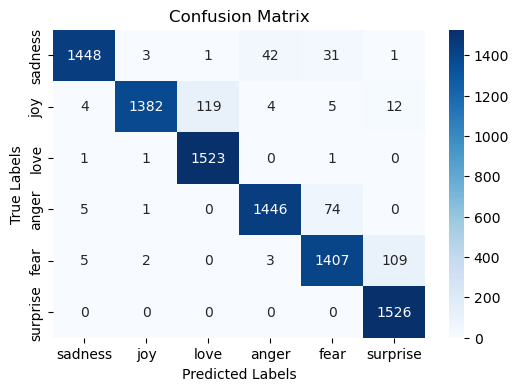

Total F1 Score accuracy: 0.953596


In [27]:
# Function to evaluate the model
def evaluate_model(data_loader):
    model.eval()
    predictions, true_labels = [], []
    total_loss = 0

    with torch.no_grad():
        for batch in data_loader:
            input_ids = batch['input_ids'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)

            outputs = model(input_ids, attention_mask=attention_mask, labels=labels)
            logits = outputs.logits
            loss = outputs.loss
            total_loss += loss.item()

            _, preds = torch.max(logits, dim=1)

            predictions.extend(preds.cpu().numpy())  # Move predictions to CPU and convert to numpy array
            true_labels.extend(labels.cpu().numpy())  # Move true labels to CPU and convert to numpy array

    avg_loss = total_loss / len(data_loader)
    return true_labels, predictions, avg_loss

# Load the best model
model.load_state_dict(torch.load('best_bert_model_unsplit.pth', map_location=device))

# Evaluate the model on the test set
true_labels, predictions, test_loss = evaluate_model(test_loader)

# Calculate F1 score and accuracy
f1 = f1_score(true_labels, predictions, average='weighted')

print("Test Set Performance:")
print(classification_report(true_labels, predictions))
# print(f"Test Loss: {test_loss:.6f}")

conf_mat = confusion_matrix(true_labels, predictions)

label_names = ['sadness', 'joy', 'love', 'anger', 'fear', 'surprise']

plt.figure(figsize=(6, 4))

sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=label_names, yticklabels=label_names)

plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')

plt.show()

print(f"Total F1 Score accuracy: {f1:.6f}")

#### 2. Result on some specific sentences
BERT accurately predicted the emotions of all the example sentences. What's more, the predicting probability of the correct emotion was very high, exceeding 0.9, regardless of whether the sentence contains the word 'feel' or not. This indicates that BERT's deep contextual understanding and attention mechanisms allow it to effectively capture the nuanced emotional content of sentences, making it robust against specific word biases.

Note: Here, we use overall probabilities for visualization, which is a limitation. For classification tasks, we predict the sentiment for the entire sentence rather than per token. As a result, we cannot visualize "word to label" relationships but can only show "sentence to label" relationships.

In [30]:
# Use the model to predict some specific sentences

# Load the best model
model.load_state_dict(torch.load('best_bert_model_unsplit.pth', map_location=device))

def predict_emotion(text):
    # Temporarily redirect stdout to suppress print statements
    with io.StringIO() as buf, contextlib.redirect_stdout(buf):
        text = clean_text(text)

    # Preprocess the text using the tokenizer
    inputs = tokenizer(
        text,
        truncation=True,
        padding='max_length',
        max_length=35,
        return_tensors='pt'
    )
    
    # Move tensors to the appropriate device
    input_ids = inputs['input_ids'].to(device)
    attention_mask = inputs['attention_mask'].to(device)
    
    # Make prediction
    with torch.no_grad():
        outputs = model(input_ids, attention_mask=attention_mask)
    
    logits = outputs.logits
    
    # Calculate probabilities for each emotion
    probabilities = F.softmax(logits, dim=1)
    _, preds = torch.max(logits, dim=1)
    
    # Create a dictionary to map numeric labels to emotions
    label_to_emotion = {0: 'sadness', 1: 'joy', 2: 'love', 3: 'anger', 4: 'fear', 5: 'surprise'}
    
    # Convert numeric label to emotion
    predicted_emotion = label_to_emotion[preds.item()]
    
    # Print prediction
    print(f"The predicted emotion is: {predicted_emotion}")

    # Print probabilities for each emotion
    for i, prob in enumerate(probabilities[0]):
        print(f"Probability of {label_to_emotion[i]}: {prob.item():.4f}")

    # Visualize word to label probabilities
    visualize_word_to_label(text, probabilities[0], tokenizer)

def visualize_word_to_label(text, probabilities, tokenizer):
    tokens = tokenizer.tokenize(text)
    num_tokens = len(tokens)
    
    # Prepare for visualization
    label_names = ['sadness', 'joy', 'love', 'anger', 'fear', 'surprise']
    num_labels = len(label_names)
    
    # Initialize an array to store label probabilities for each token
    token_label_probabilities = np.zeros((num_tokens, num_labels))
    
    # Convert logits to probabilities for each token
    # Note: For classification, we are predicting the entire sentence, not per token
    # Thus, probabilities[0] is the overall probabilities, not per token.
    # Here we use the overall probabilities for visualization, but it is a limitation.

    # Assuming each token gets the same probability distribution
    token_probs = probabilities.squeeze().detach().cpu().numpy()
    for i in range(num_tokens):
        token_label_probabilities[i, :] = token_probs

    # Plot heatmap
    plt.figure(figsize=(12, 8))
    sns.heatmap(token_label_probabilities, xticklabels=label_names, yticklabels=tokens, cmap='viridis', cbar=True)
    plt.title('Attention Weights (Word to Label)')
    plt.xlabel('Labels')
    plt.ylabel('Tokens')
    plt.show()

print('input: I become happy.')
predict_emotion("I become happy.")
print('input: I feel happy.')
predict_emotion("I feel happy.")
print('input: I become sad.')
predict_emotion("I become sad.")
print('input: I feel sad.')
predict_emotion("I feel sad.")
print('input: I become surprised.')
predict_emotion("I become surprised.")
print('input: I feel surprised.')
predict_emotion("I feel surprised.")
print('input: I become angry.')
predict_emotion("I become angry.")
print('input: I feel angry.')
predict_emotion("I feel angry.")
print('input: I become scared.')
predict_emotion("I become scared.")
print('input: I feel scared.')
predict_emotion("I feel scared.")
print('input: I become sweet.')
predict_emotion("I become sweet.")
print('input: I feel sweet.')
predict_emotion("I feel sweet.")




### 7.8 BERT-BILSTM

#### 1. Results on the test dataset
BERT-BILSTM performed good on the test dataset with a total F1-score of 0.921443, but it's lower than other deep learning models, this may be because the model is too complex, leading to overfitting. 

Most of the incorrect predictions involved mistaking "love" for "joy" and "surprise" for "fear," likely because sentences expressing these emotions have overlapping features.


Test Set Performance:
              precision    recall  f1-score   support

           0       0.94      0.91      0.93      1526
           1       0.95      0.87      0.91      1526
           2       0.91      0.97      0.94      1526
           3       0.93      0.92      0.93      1526
           4       0.90      0.88      0.89      1526
           5       0.91      0.98      0.94      1526

    accuracy                           0.92      9156
   macro avg       0.92      0.92      0.92      9156
weighted avg       0.92      0.92      0.92      9156



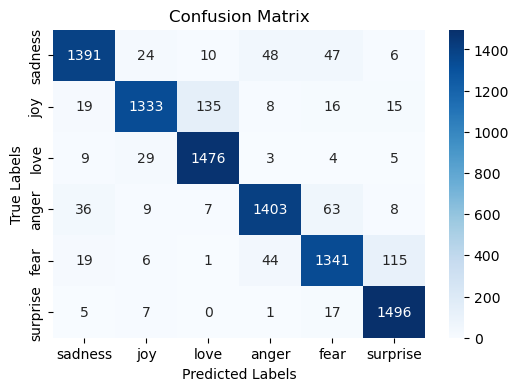

Total F1 Score accuracy: 0.921443


In [135]:
# Load the best model
model5 = BERT_BiLSTM(num_classes=6).to(device)
model5.load_state_dict(torch.load('best_bert_bilstm_model_0.001.pth', map_location=device))

# Evaluate the model on the test set
true_labels, predictions, test_loss = evaluate_model(test_loader)

# Calculate F1 score and accuracy
f1 = f1_score(true_labels, predictions, average='weighted')

print("Test Set Performance:")
print(classification_report(true_labels, predictions))
# print(f"Test Loss: {test_loss:.6f}")

conf_mat = confusion_matrix(true_labels, predictions)

label_names = ['sadness', 'joy', 'love', 'anger', 'fear', 'surprise']

plt.figure(figsize=(6, 4))

sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=label_names, yticklabels=label_names)

plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')

plt.show()

print(f"Total F1 Score accuracy: {f1:.6f}")

#### 2. Result on some specific sentences
BERT-BILSTM accurately predicted the emotions of all the example sentences. When the sentences contained 'feel,' the predicting probability of the correct emotion was very high. However, when the sentences did not contain 'feel,' the predicting probability of the correct emotion was much lower. This indicates that the model has become dependent on the word 'feel' to predict emotions.

In [136]:
def predict_emotion(text):
    model.eval()  # Ensure the model is in evaluation mode

    # Tokenize the text
    encoding = tokenizer(
        text,
        truncation=True,
        padding='max_length',
        max_length=35,
        return_tensors='pt'
    )

    input_ids = encoding['input_ids'].to(device)
    attention_mask = encoding['attention_mask'].to(device)

    with torch.no_grad():
        outputs = model5(input_ids, attention_mask=attention_mask)

    # Compute softmax to get the probability of each emotion
    probabilities = F.softmax(outputs, dim=1)  # Apply softmax along the class dimension
    _, preds = torch.max(probabilities, 1)  # Get the index of the max probability

    # Create a dictionary to map numeric labels to emotions
    label_to_emotion = {0: 'sadness', 1: 'joy', 2: 'love', 3: 'anger', 4: 'fear', 5: 'surprise'}

    # Convert numeric label to emotion
    predicted_emotion = label_to_emotion[preds.item()]

    # Print prediction and probabilities
    print(f"The predicted emotion is: {predicted_emotion}")
    
    # Print the probability of each emotion
    for idx, prob in enumerate(probabilities[0]):
        emotion = label_to_emotion[idx]
        print(f"Probability of {emotion}: {prob.item():.4f}")

# Example calls
print('input: I become happy.')
predict_emotion("I become happy.")
print('input: I feel happy.')
predict_emotion("I feel happy.")
print('input: I become sad.')
predict_emotion("I become sad.")
print('input: I feel sad.')
predict_emotion("I feel sad.")
print('input: I become surprised.')
predict_emotion("I become surprised.")
print('input: I feel surprised.')
predict_emotion("I feel surprised.")
print('input: I become angry.')
predict_emotion("I become angry.")
print('input: I feel angry.')
predict_emotion("I feel angry.")
print('input: I become scared.')
predict_emotion("I become scared.")
print('input: I feel scared.')
predict_emotion("I feel scared.")
print('input: I become sweet.')
predict_emotion("I become sweet.")
print('input: I feel sweet.')
predict_emotion("I feel sweet.")

input: I become happy.
The predicted emotion is: joy
Probability of sadness: 0.0012
Probability of joy: 0.6565
Probability of love: 0.3416
Probability of anger: 0.0003
Probability of fear: 0.0003
Probability of surprise: 0.0001
input: I feel happy.
The predicted emotion is: joy
Probability of sadness: 0.0000
Probability of joy: 0.9997
Probability of love: 0.0002
Probability of anger: 0.0000
Probability of fear: 0.0000
Probability of surprise: 0.0000
input: I become sad.
The predicted emotion is: sadness
Probability of sadness: 0.8540
Probability of joy: 0.0030
Probability of love: 0.0474
Probability of anger: 0.0732
Probability of fear: 0.0209
Probability of surprise: 0.0015
input: I feel sad.
The predicted emotion is: sadness
Probability of sadness: 0.9991
Probability of joy: 0.0000
Probability of love: 0.0000
Probability of anger: 0.0007
Probability of fear: 0.0001
Probability of surprise: 0.0000
input: I become surprised.
The predicted emotion is: surprise
Probability of sadness: 0.

# 8. Discussion and Conclusion

Here is a table summarizing the above results:
<div style="text-align: center;">
  <table style="margin-left: auto; margin-right: auto; border: 1px solid black; border-collapse: collapse;">
    <tr>
      <th style="border: 1px solid black; padding: 8px;" rowspan="2">Models</th>
      <th style="border: 1px solid black; padding: 8px;" colspan="2">Machine Learning</th>
      <th style="border: 1px solid black; padding: 8px;" colspan="4">Deep Learning</th>
      <th style="border: 1px solid black; padding: 8px;" colspan="2">Transformer</th>
    </tr>
    <tr>
      <td style="border: 1px solid black; padding: 8px;">Naive Bayes</td>
      <td style="border: 1px solid black; padding: 8px;">Logistic Regression</td>
      <td style="border: 1px solid black; padding: 8px;">LSTM</td>
      <td style="border: 1px solid black; padding: 8px;">BI-LSTM</td>
      <td style="border: 1px solid black; padding: 8px;">GRU</td>
      <td style="border: 1px solid black; padding: 8px;">BI-GRU</td>
      <td style="border: 1px solid black; padding: 8px;">BERT</td>
      <td style="border: 1px solid black; padding: 8px;">BERT-BiLSTM</td>
    </tr>
    <tr>
      <td style="border: 1px solid black; padding: 8px;">Embedding Method</td>
      <td style="border: 1px solid black; padding: 8px;" colspan="6">Word2Vec</td>
      <td style="border: 1px solid black; padding: 8px;" colspan="2">BERT</td>
    </tr>
    <tr>
      <td style="border: 1px solid black; padding: 8px;">Total F1-Score</td>
      <td style="border: 1px solid black; padding: 8px;">0.4698</td>
      <td style="border: 1px solid black; padding: 8px;">0.5545</td>
      <td style="border: 1px solid black; padding: 8px;">0.9454</td>
      <td style="border: 1px solid black; padding: 8px;">0.9497</td>
      <td style="border: 1px solid black; padding: 8px;">0.9465</td>
      <td style="border: 1px solid black; padding: 8px;">0.9473</td>
      <td style="border: 1px solid black; padding: 8px;">0.9536</td>
      <td style="border: 1px solid black; padding: 8px;">0.9214</td>
    </tr>
    <tr>
      <td style="border: 1px solid black; padding: 8px;">P1</td>
      <td style="border: 1px solid black; padding: 8px;">0.2107</td>
      <td style="border: 1px solid black; padding: 8px;">0.2086</td>
      <td style="border: 1px solid black; padding: 8px;">0.9995</td>
      <td style="border: 1px solid black; padding: 8px;">0.9996</td>
      <td style="border: 1px solid black; padding: 8px;">0.9991</td>
      <td style="border: 1px solid black; padding: 8px;">0.9988</td>
      <td style="border: 1px solid black; padding: 8px;">0.9995</td>
      <td style="border: 1px solid black; padding: 8px;">0.9997</td>
    </tr>
    <tr>
      <td style="border: 1px solid black; padding: 8px;">P2</td>
      <td style="border: 1px solid black; padding: 8px;">0.2390</td>
      <td style="border: 1px solid black; padding: 8px;">0.1921</td>
      <td style="border: 1px solid black; padding: 8px;">0.7587</td>
      <td style="border: 1px solid black; padding: 8px;">0.4296</td>
      <td style="border: 1px solid black; padding: 8px;">0.2117</td>
      <td style="border: 1px solid black; padding: 8px;">0.2289</td>
      <td style="border: 1px solid black; padding: 8px;">0.9205</td>
      <td style="border: 1px solid black; padding: 8px;">0.6565</td>
    </tr>
  </table>
</div>
Note: 

1. 'P1' refers to the probability of the emotion 'joy' when predicting the sentence 'I feel happy' 
2. 'P2' refers to the probability of the emotion 'joy' when predicting the sentence 'I become happy' 

### 8.1 First Discussion and Conclusion
1. Phenomenon
   
   BERT has the highest F1-score among all models, and it performs significantly better than other models in predicting the emotion of sentences that do not contain the word 'feel.' It is the only model with a predicting probability of the correct emotion exceeding 0.9.
   
2. Reason

   BERT's deep contextual understanding and attention mechanisms allow it to effectively capture the nuanced emotional content of sentences, making it robust against specific word biases. Specifically:

   **Breadth and Depth of Pre-training**:
   BERT's pre-training involves not just word vectors but the entire model on a large corpus. BERT learns more extensive language patterns and contextual relationships, whereas Word2Vec only pre-trains word vectors and lacks deep understanding of sentence structure and context.

   
   
   **Model Architecture**: 
   BERT is based on the Transformer architecture, which includes self-attention mechanisms that dynamically focus on different parts of the sentence. While BiLSTM can capture contextual information, the Transformer architecture generally performs better in handling long-range dependencies and complex language patterns.

3. Conclusion
   
   BERT is currently our best-performing model in emotion classification tasks.

### 8.2 Second Discussion and Conclusion
1. Phenomenon
   
   Deep learning models, including Transformer-based models, have significantly higher F1-scores compared to machine learning models. All deep learning models achieve an F1-score above 0.9, whereas machine learning models fall below 0.6. 
2. Reason

   Deep learning models can automatically learn and extract complex features from raw data, which allows them to capture subtle patterns and nuances in emotions that traditional machine learning models might miss.

3. Conclusion
   
   Deep learning models outperform machine learning models in emotion classification tasks.

### 8.3 Third Discussion and Conclusion
1. Phenomenon
   
   The total f1-score of BI-LSTM(0.9497), BI-GRU(0.9473) is larger than GRU(0.9465), LSTM(0.9454). 
2. Reason

   Because they are bidirectional, allowing them to capture information from both past and future contexts in a sequence. This bidirectional nature helps in understanding the context more comprehensively, leading to better performance.

3. Conclusion
   
   Bidirectional techniques can improve performance of the GRU and LSTM in emotion classification tasks.

### 8.4 Fourth Discussion and Conclusion
1. Phenomenon
   
   Most of the incorrect predictions involved mistaking "love" for "joy" and "surprise" for "fear" in all our Deep learning models (including Transformer-based models) 
2. Reason

   The overlapping features among emotions such as "love" and "joy" or "surprise" and "fear" may lead to confusion in predictions. 

3. Conclusion
   
    While Deep learning models, including Transformer-based models, perform well overall, they still struggle with distinguishing between emotionally similar sentences. This suggests a need for further refinement in capturing and differentiating subtle emotional nuances.
   

### 8.5 Fifth Discussion and Conclusion
1. Phenomenon
   
   BERT-BiLSTM has lower F1-score than other deep learning models. 
2. Reason

   This may be because the model is too complex, while the dataset is too simple, leading to overfitting 

3. Conclusion
   
    This complexity could lead to overfitting, where the model performs well on training data but struggles to generalize to unseen examples. It highlights the need for balancing model complexity with dataset complexity to achieve optimal performance.
   

### 8.6 Sixth Discussion and Conclusion
    We can observe how BERT (our best model) works through attention weights visualization (this is 'Word to Word'; for 'Word to Label' or 'Sentence to Label' please refer to section 7.7.2).

input: I become overwhelmed and feel defeated
The predicted emotion is: sadness
Probability of sadness: 0.9985
Probability of joy: 0.0002
Probability of love: 0.0002
Probability of anger: 0.0001
Probability of fear: 0.0006
Probability of surprise: 0.0004


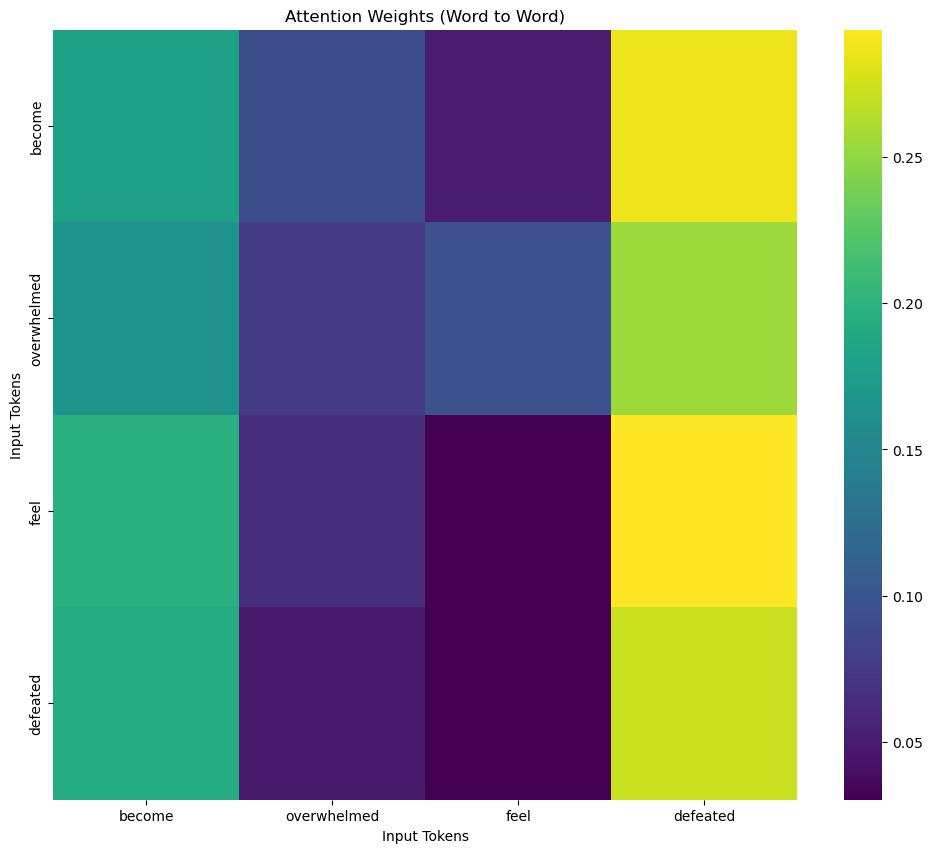

In [29]:
# Load the best model
model.load_state_dict(torch.load('best_bert_model_unsplit.pth', map_location=device))


def predict_emotion(text):
    # Temporarily redirect stdout to suppress print statements
    with io.StringIO() as buf, contextlib.redirect_stdout(buf):
        text = clean_text(text)

    # Preprocess the text using the tokenizer
    inputs = tokenizer(
        text,
        truncation=True,
        padding='max_length',
        max_length=35,
        return_tensors='pt'
    )
    
    # Move tensors to the appropriate device
    input_ids = inputs['input_ids'].to(device)
    attention_mask = inputs['attention_mask'].to(device)
    
    # Make prediction and get attention weights
    with torch.no_grad():
        outputs = model(input_ids, attention_mask=attention_mask, output_attentions=True)  # Set output_attentions=True
    
    logits = outputs.logits
    attention_weights = outputs.attentions  # Retrieve attention weights
    
    # Get the attention weights of the last layer
    last_layer_attention = attention_weights[-1]  # Get attention weights from the last layer

    # Compute the probability of each emotion
    probabilities = F.softmax(logits, dim=1)  # Apply softmax to logits

    # Get the predicted label
    _, preds = torch.max(logits, dim=1)
    
    # Create a dictionary to map numeric labels to emotions
    label_to_emotion = {0: 'sadness', 1: 'joy', 2: 'love', 3: 'anger', 4: 'fear', 5: 'surprise'}
    
    # Convert numeric label to emotion
    predicted_emotion = label_to_emotion[preds.item()]
    
    # Print the predicted emotion
    print(f"The predicted emotion is: {predicted_emotion}")

    # Print the probability of each emotion
    for i, prob in enumerate(probabilities[0]):
        print(f"Probability of {label_to_emotion[i]}: {prob.item():.4f}")

    # Visualize the attention weights
    visualize_attention(text, last_layer_attention)  # Call the visualization function

def visualize_attention(text, attention_weights):
    # Extract tokens and attention weights
    tokens = tokenizer.tokenize(text)
    
    # Compute the average attention weights for each token
    avg_attention = attention_weights.mean(dim=1).squeeze(0)  # For batch_size=1, take the first dimension
    avg_attention = avg_attention[1:-1]  # Remove [CLS] and [SEP] attention weights

    # Convert attention weights to NumPy array
    attention_values = avg_attention.detach().cpu().numpy()
    
    # Retain only the attention values corresponding to input tokens
    attention_values = attention_values[:len(tokens), :len(tokens)]  # Keep only the part corresponding to tokens

    # Plot the heatmap
    plt.figure(figsize=(12, 10))
    sns.heatmap(attention_values[:, :len(tokens)], xticklabels=tokens, yticklabels=tokens, cmap='viridis', cbar=True)
    plt.title('Attention Weights (Word to Word)')
    plt.xlabel('Input Tokens')
    plt.ylabel('Input Tokens')
    plt.show()

# Example call
print('input: I become overwhelmed and feel defeated')
predict_emotion("I become overwhelmed and feel defeated")


2. Discussion and Conclusion

   We can see that the columns representing emotion words are highlighted more brightly, and the cells where rows of verbs such as 'feel' and 'become' intersect with columns for emotion words are the brightest. (Brighter colors indicate higher attention weights, meaning the model places more focus on these intersections when predicting emotions.)

   This indicates that the model's attention weights are stronger in these intersections, suggesting that the model combines verbs like 'feel' and 'become' with emotion words to make predictions.

   Consequently, the current BERT model appears to rely on the combination of verbs like 'feel' or 'become' with emotion adjectives to predict emotions.

# 9. Remaining Problems and Future work
### 9.1 Remaining Problems
1. The F1-scores of all deep learning models in this dataset are quite similar.
   
   This similarity may be due to the simplicity of the sentences in the dataset. In other words, the models might be relying on key words in the sentences to predict emotions accurately.

2. None of the models effectively predict negative tone.

   This issue arises from the dataset, as sentences with negative tones are incorrectly labeled.(please refer to section 3.5.3)

input: I do not feel happy.
The predicted emotion is: joy
Probability of sadness: 0.0001
Probability of joy: 0.9994
Probability of love: 0.0001
Probability of anger: 0.0001
Probability of fear: 0.0001
Probability of surprise: 0.0001


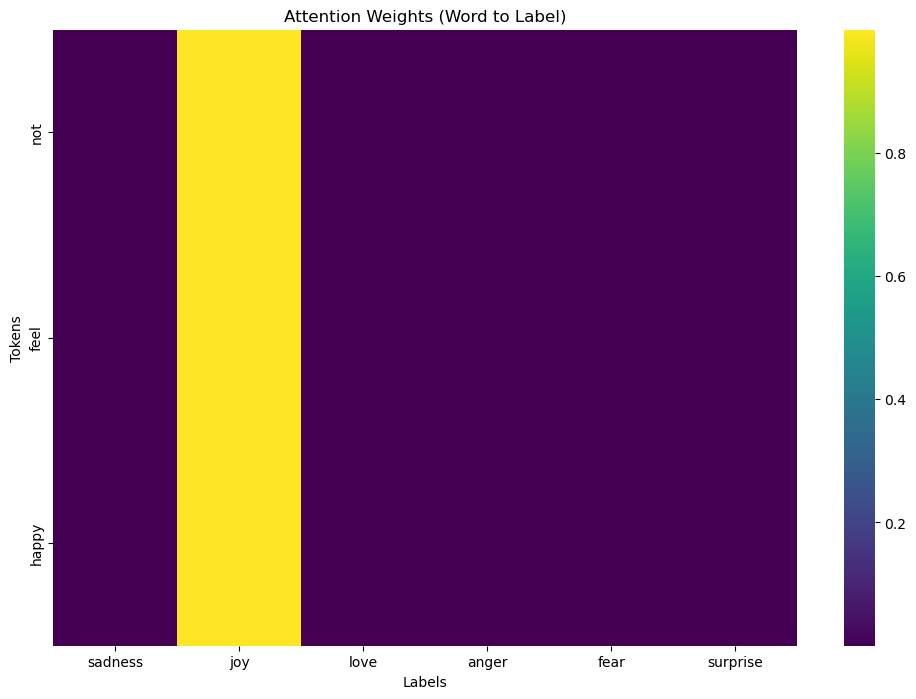

In [31]:
# Use the BERT model to predict negative tone.
print('input: I do not feel happy.')
predict_emotion("I do not feel happy.")

3. All models struggle to predict "what a surprise" as "surprised."

   This difficulty is likely because the word "surprise" appears in only 68 out of 71574 sentences (0.095%).

In [35]:
# Use the str.contains() method to find sentences that contain 'surprise'
contains_surprise = train_df['text'].str.contains(r'\bsurprise\b', regex=True)

# Calculate the number of sentences that contain ‘feel|feels|feeling|felt’
num_surprise_sentences = contains_surprise.sum()

print(f"'surprise' appears in {num_surprise_sentences} out of {len(train_df['text'])} sentences.")

'surprise' appears in 68 out of 71574 sentences.


input: what a surprise
The predicted emotion is: fear
Probability of sadness: 0.0091
Probability of joy: 0.1132
Probability of love: 0.0005
Probability of anger: 0.0098
Probability of fear: 0.7754
Probability of surprise: 0.0920


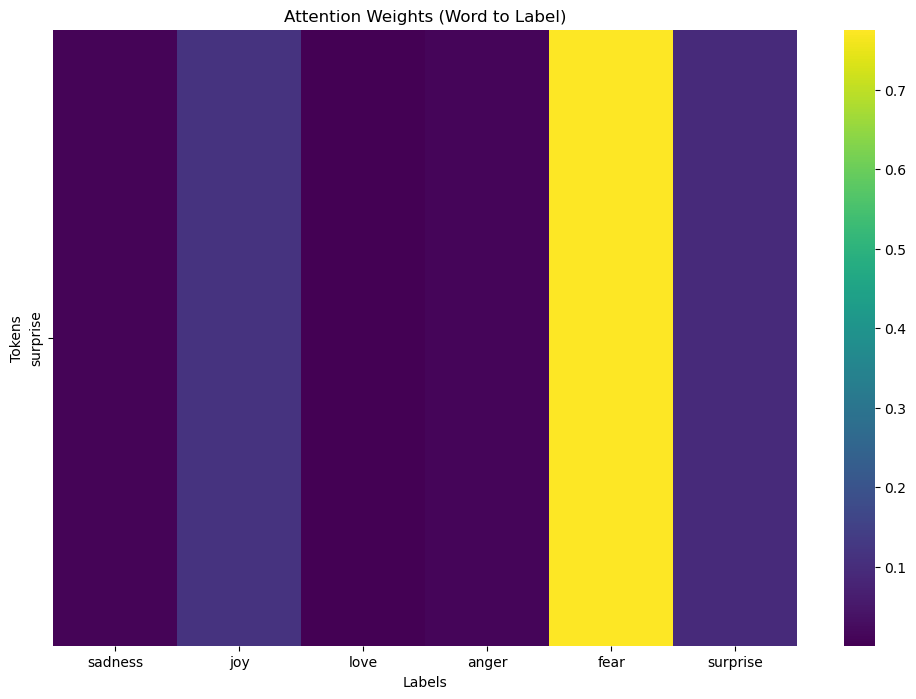

In [36]:
# Use the BERT model to predict "what a surprise".
print('input: what a surprise')
predict_emotion("what a surprise")

### 9.2 Future work
1. Dataset Improvement:

Find or create a richer dataset that does not solely rely on the pattern of "feel" + emotion words. The new dataset should have a more complex structure and accurately label sentiments in sentences with negation.

2. Model Comparison:

Evaluate the performance of both simple models and complex models (such as BERT-BiLSTM) on this improved dataset.
Specifically, assess whether the models can correctly predict sentiments in sentences containing negation.